# Import Repo of Sepsis Simulator

In [ ]:
!git clone https://github.com/clinicalml/gumbel-max-scm.git

Cloning into 'gumbel-max-scm'...
remote: Enumerating objects: 113, done.
remote: Counting objects: 100% (3/3), done.
remote: Compressing objects: 100% (3/3), done.
remote: Total 113 (delta 0), reused 0 (delta 0), pack-reused 110
Receiving objects: 100% (113/113), 1.48 MiB | 13.62 MiB/s, done.
Resolving deltas: 100% (28/28), done.


In [ ]:
#Enable importing code from parent directory
import os, sys
simulator_path = os.path.abspath('./gumbel-max-scm')
sys.path.insert(1, simulator_path)

In [ ]:
!pip install pymdptoolbox

  Preparing metadata (setup.py) ... done
  Created wheel for pymdptoolbox: filename=pymdptoolbox-4.0b3-py3-none-any.whl size=25656 sha256=18718548bf88146bbccf713ec70cf8fe45c6e914c05144f008d27ca7122005d3
  Stored in directory: /root/.cache/pip/wheels/2b/e7/c7/d7abf9e309f3573a934fed2750c70bd75d9e9d901f7f16e183
Successfully built pymdptoolbox


In [ ]:
import numpy as np
import cf.counterfactual as cf
import cf.utils as utils
import pandas as pd
import pickle
import itertools as it
from tqdm import tqdm_notebook as tqdm
from scipy.linalg import block_diag

# Sepsis Simulator code
from sepsisSimDiabetes.State import State
from sepsisSimDiabetes.Action import Action
from sepsisSimDiabetes.DataGenerator import DataGenerator
import sepsisSimDiabetes.MDP as simulator

import mdptoolboxSrc.mdp as mdptools

import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

# Set up Variables and Functions

Code taken from [Oberst and Sontag](https://github.com/clinicalml/gumbel-max-scm/blob/master/plots-main-paper.ipynb).

Set up important variables

In [ ]:
SEED = 1
np.random.seed(SEED)
NSIMSAMPS = 100000  # Samples to draw from the simulator
NSTEPS = 20  # Max length of each trajectory
NCFSAMPS = 5  # Counterfactual Samples per observed sample
DISCOUNT_Pol = 0.99 # Used for computing optimal policies
DISCOUNT = 1 # Used for computing actual reward
EVAL_EPSILON = 0.05 # Used for sampling using physician pol as eps greedy

# Option 1: Use bootstrapping w/replacement on the original NSIMSAMPS to estimate errors
USE_BOOSTRAP=True
N_BOOTSTRAP = 100

# Option 2: Use repeated sampling (i.e., NSIMSAMPS fresh simulations each time) to get error bars;
# This is done in the appendix of the paper, but not in the main paper
N_REPEAT_SAMPLING = 1

# These are properties of the simulator, do not change
n_actions = Action.NUM_ACTIONS_TOTAL
n_components = 2

# These are added as absorbing states
n_states_abs = State.NUM_OBS_STATES + 2
discStateIdx = n_states_abs - 1
deadStateIdx = n_states_abs - 2

Set up base for behaviour and evaluation policies

In [ ]:
import zipfile
with zipfile.ZipFile("gumbel-max-scm/data/diab_txr_mats-replication.zip", 'r') as zip_ref:
    zip_ref.extractall("gumbel-max-scm/data")

In [ ]:
# Get the transition and reward matrix from file
with open("gumbel-max-scm/data/diab_txr_mats-replication.pkl", "rb") as f:
    mdict = pickle.load(f)

tx_mat = mdict["tx_mat"]
r_mat = mdict["r_mat"]

In [ ]:
from scipy.linalg import block_diag

tx_mat_full = np.zeros((n_actions, State.NUM_FULL_STATES, State.NUM_FULL_STATES))
r_mat_full = np.zeros((n_actions, State.NUM_FULL_STATES, State.NUM_FULL_STATES))

for a in range(n_actions):
    tx_mat_full[a, ...] = block_diag(tx_mat[0, a, ...], tx_mat[1, a,...])
    r_mat_full[a, ...] = block_diag(r_mat[0, a, ...], r_mat[1, a, ...])

In [ ]:
fullMDP = cf.MatrixMDP(tx_mat_full, r_mat_full)
fullPol = fullMDP.policyIteration(discount=DISCOUNT_Pol, eval_type=1)

#Make policy epsilon-greedy
evalPolSoft = np.copy(fullPol)
evalPolSoft[evalPolSoft == 1] = 1 - EVAL_EPSILON
evalPolSoft[evalPolSoft == 0] = EVAL_EPSILON / (n_actions - 1)

# With Diabetes

In [ ]:
PROB_DIAB = 1.0

In [ ]:
dgen = DataGenerator()
states, actions, lengths, rewards, diab, emp_tx_totals, emp_r_totals = dgen.simulate(
    NSIMSAMPS, NSTEPS, policy=evalPolSoft, policy_idx_type='full',
    p_diabetes=PROB_DIAB, use_tqdm=False) #True, tqdm_desc='Behaviour Policy Simulation')

obs_samps = utils.format_dgen_samps(
    states, actions, rewards, diab, NSTEPS, NSIMSAMPS)

In [ ]:
def extract_state_feature(state_idx, feature_idx, diabetic_idx):
  #Instantiate a state based on the idx and get the state vector
  testState = State(state_idx = int(state_idx), diabetic_idx=int(diabetic_idx))
  vec = testState.get_state_vector()
  return vec[int(feature_idx)]

In [ ]:
def state_effect(feature_idx, state):
  change_fval_feat = np.zeros(n_actions)
  counts = np.zeros(n_actions)

  for ep in range(NSIMSAMPS):
    for id in range(actions.shape[1]):
      action_idx = actions[ep, id, 0]
      current_state_idx = states[ep, id, 0]
      next_state_idx = states[ep, id+1, 0]

      if action_idx == -1 or current_state_idx != state:
        continue

      new_change = extract_state_feature(next_state_idx, feature_idx, 0) - extract_state_feature(current_state_idx, feature_idx, 0)
      change_fval_feat[action_idx - 1] = (counts[action_idx - 1]*change_fval_feat[action_idx - 1] + new_change)/(counts[action_idx - 1] + 1)
      counts[action_idx - 1] += 1

  return change_fval_feat

## First State Feature (Heart Rate)

In [ ]:
print(f'136 - diabetes: {state_effect(0, 136)}')
print(f'143 - diabetes: {state_effect(0, 143)}')
print(f'63 - diabetes: {state_effect(0, 63)}')
print(f'56 - diabetes: {state_effect(0, 56)}')
print(f'377 - diabetes: {state_effect(0, 377)}')

136 - diabetes: [0.07692308 0.09192325 0.30769231 0.         0.         0.
 0.         0.09090909]
143 - diabetes: [0. 0. 0. 0. 0. 0. 0. 0.]
63 - diabetes: [0. 0. 0. 0. 0. 0. 0. 0.]
56 - diabetes: [0.         0.1        0.09469697 0.         0.         0.
 0.         0.11111111]
377 - diabetes: [ 0.         -0.46153846 -0.09090909  0.          0.          0.
  0.          0.05263158]


## Second State Feature (Systolic Blood Pressure)

In [ ]:
print(f'136 - diabetes: {state_effect(1, 136)}')
print(f'143 - diabetes: {state_effect(1, 143)}')
print(f'63 - diabetes: {state_effect(1, 63)}')
print(f'56 - diabetes: {state_effect(1, 56)}')
print(f'377 - diabetes: {state_effect(1, 377)}')

136 - diabetes: [ 0.92307692  0.00580098  1.          0.          0.76470588  0.
  0.89473684 -0.09090909]
143 - diabetes: [0.  0.2 0.  0.  0.  0.  0.  0. ]
63 - diabetes: [0. 0. 0. 0. 0. 0. 0. 0.]
56 - diabetes: [1.33333333 0.         1.27462121 0.         1.28571429 0.
 1.57142857 0.        ]
377 - diabetes: [0.75       0.         1.         0.         1.         0.
 0.88888889 0.05263158]


## Third State Feature (Percent Oxygen)

In [ ]:
print(f'136 - diabetes: {state_effect(2, 136)}')
print(f'143 - diabetes: {state_effect(2, 143)}')
print(f'63 - diabetes: {state_effect(2, 63)}')
print(f'56 - diabetes: {state_effect(2, 56)}')
print(f'377 - diabetes: {state_effect(2, 377)}')

136 - diabetes: [ 0.          0.          0.         -0.06666667 -0.11764706  0.
  0.         -0.09090909]
143 - diabetes: [0. 0. 0. 0. 0. 0. 0. 0.]
63 - diabetes: [0. 0. 0. 0. 0. 0. 0. 0.]
56 - diabetes: [-0.33333333  0.          0.          0.          0.          0.
  0.         -0.11111111]
377 - diabetes: [ 0.          0.          0.         -0.13333333  0.          0.
  0.         -0.10526316]


## Fourth State Feature (Glucose Level)

In [ ]:
print(f'136 - diabetes: {state_effect(3, 136)}')
print(f'143 - diabetes: {state_effect(3, 143)}')
print(f'63 - diabetes: {state_effect(3, 63)}')
print(f'56 - diabetes: {state_effect(3, 56)}')
print(f'377 - diabetes: {state_effect(3, 377)}')

136 - diabetes: [ 0.61538462 -0.00312361  0.30769231  0.          0.64705882  0.12
  0.26315789 -0.36363636]
143 - diabetes: [0.  0.6 0.  0.  0.  0.  0.  0. ]
63 - diabetes: [0. 0. 0. 0. 0. 0. 0. 0.]
56 - diabetes: [ 0.33333333  0.2         0.49905303 -0.2         0.28571429  0.33333333
  0.71428571  0.11111111]
377 - diabetes: [ 0.66666667 -0.23076923  0.54545455  0.          0.28571429 -0.00413712
  0.44444444  0.31578947]


## Fifth State Feature (Antibiotics)

In [ ]:
print(f'136 - diabetes: {state_effect(4, 136)}')
print(f'143 - diabetes: {state_effect(4, 143)}')
print(f'63 - diabetes: {state_effect(4, 63)}')
print(f'56 - diabetes: {state_effect(4, 56)}')
print(f'377 - diabetes: {state_effect(4, 377)}')

136 - diabetes: [0. 0. 0. 1. 1. 1. 1. 0.]
143 - diabetes: [ 0. -1.  0.  0.  0.  0.  0.  0.]
63 - diabetes: [0. 0. 0. 0. 0. 0. 0. 0.]
56 - diabetes: [0. 0. 0. 1. 1. 1. 1. 0.]
377 - diabetes: [0. 0. 0. 1. 1. 1. 1. 0.]


## Sixth State Feature (Vasopressors)

In [ ]:
print(f'136 - diabetes: {state_effect(5, 136)}')
print(f'143 - diabetes: {state_effect(5, 143)}')
print(f'63 - diabetes: {state_effect(5, 63)}')
print(f'56 - diabetes: {state_effect(5, 56)}')
print(f'377 - diabetes: {state_effect(5, 377)}')

136 - diabetes: [1. 0. 1. 0. 1. 0. 1. 0.]
143 - diabetes: [ 0. -1.  0.  0.  0.  0.  0.  0.]
63 - diabetes: [0. 0. 0. 0. 0. 0. 0. 0.]
56 - diabetes: [1. 0. 1. 0. 1. 0. 1. 0.]
377 - diabetes: [1. 0. 1. 0. 1. 0. 1. 0.]


## Seventh State Feature (Ventilator)

In [ ]:
print(f'136 - diabetes: {state_effect(6, 136)}')
print(f'143 - diabetes: {state_effect(6, 143)}')
print(f'63 - diabetes: {state_effect(6, 63)}')
print(f'56 - diabetes: {state_effect(6, 56)}')
print(f'377 - diabetes: {state_effect(6, 377)}')

136 - diabetes: [0. 1. 1. 0. 0. 1. 1. 0.]
143 - diabetes: [0. 0. 0. 0. 0. 0. 0. 0.]
63 - diabetes: [0. 0. 0. 0. 0. 0. 0. 0.]
56 - diabetes: [0. 1. 1. 0. 0. 1. 1. 0.]
377 - diabetes: [-1.  0.  0. -1. -1.  0.  0. -1.]


## Average Effect

In [ ]:
def average_state_effect(feature_idx):
  change_fval_feat = np.zeros(n_actions)
  counts = np.zeros(n_actions)

  for ep in range(NSIMSAMPS):
    for id in range(actions.shape[1]):
      action_idx = actions[ep, id, 0]
      current_state_idx = states[ep, id, 0]
      next_state_idx = states[ep, id+1, 0]

      if action_idx == -1 or next_state_idx == -1:
        continue

      new_change = extract_state_feature(next_state_idx, feature_idx, 0) - extract_state_feature(current_state_idx, feature_idx, 0)
      change_fval_feat[action_idx - 1] = (counts[action_idx - 1]*change_fval_feat[action_idx - 1] + new_change)/(counts[action_idx - 1] + 1)
      counts[action_idx - 1] += 1

  return change_fval_feat

In [ ]:
print(f'Feature 1 - heart rate: {average_state_effect(0)}')
print(f'Feature 2 - systolic blood pressure: {average_state_effect(1)}')
print(f'Feature 3 - percentage oxygen: {average_state_effect(2)}')
print(f'Feature 4 - glucose level: {average_state_effect(3)}')
print(f'Feature 5 - antibiotics: {average_state_effect(4)}')
print(f'Feature 6 - vasopressors: {average_state_effect(5)}')
print(f'Feature 7 - ventilator: {average_state_effect(6)}')

Feature 1 - heart rate: [ 0.06938831  0.09136119  0.0713923  -0.03447347 -0.03621572 -0.05193101
 -0.02941069  0.09979643]
Feature 2 - systolic blood pressure: [ 0.80503907  0.00880746  0.92749061 -0.06005925  0.78611731 -0.09469145
  1.16410576  0.09704829]
Feature 3 - percentage oxygen: [-0.09067637  0.00926874  0.02295115 -0.09237813 -0.09158903  0.04163852
  0.02442334 -0.09934044]
Feature 4 - glucose level: [ 0.31554837 -0.06028282  0.36163298 -0.08200916  0.31911823 -0.11296309
  0.37386776 -0.0022718 ]
Feature 5 - antibiotics: [-0.67609809 -0.11082121 -0.50939372  0.34136817  0.33657     0.37969854
  0.70978034 -0.98965475]
Feature 6 - vasopressors: [ 0.95621126 -0.02162224  0.95531634 -0.04134123  0.95945414 -0.05192509
  0.91921229 -0.02209103]
Feature 7 - ventilator: [-0.72365939  0.25375867  0.32395653 -0.71195799 -0.71499803  0.36573429
  0.67175181 -0.97994463]


# Without Diabetes

In [ ]:
PROB_DIAB = 0.0

In [ ]:
dgen = DataGenerator()
states, actions, lengths, rewards, diab, emp_tx_totals, emp_r_totals = dgen.simulate(
    NSIMSAMPS, NSTEPS, policy=evalPolSoft, policy_idx_type='full',
    p_diabetes=PROB_DIAB, use_tqdm=False) #True, tqdm_desc='Behaviour Policy Simulation')

obs_samps = utils.format_dgen_samps(
    states, actions, rewards, diab, NSTEPS, NSIMSAMPS)

In [ ]:
def extract_state_feature(state_idx, feature_idx, diabetic_idx):
  #Instantiate a state based on the idx and get the state vector
  testState = State(state_idx = int(state_idx), diabetic_idx=int(diabetic_idx))
  vec = testState.get_state_vector()
  return vec[int(feature_idx)]

In [ ]:
def state_effect(feature_idx, state):
  change_fval_feat = np.zeros(n_actions)
  counts = np.zeros(n_actions)

  for ep in range(NSIMSAMPS):
    for id in range(actions.shape[1]):
      action_idx = actions[ep, id, 0]
      current_state_idx = states[ep, id, 0]
      next_state_idx = states[ep, id+1, 0]

      if action_idx == -1 or current_state_idx != state:
        continue

      new_change = extract_state_feature(next_state_idx, feature_idx, 0) - extract_state_feature(current_state_idx, feature_idx, 0)
      change_fval_feat[action_idx - 1] = (counts[action_idx - 1]*change_fval_feat[action_idx - 1] + new_change)/(counts[action_idx - 1] + 1)
      counts[action_idx - 1] += 1

  return change_fval_feat

## First State Feature (Heart Rate)

In [ ]:
print(f'136 - No diabetes: {state_effect(0, 136)}')
print(f'143 - no diabetes: {state_effect(0, 143)}')
print(f'63 - no diabetes: {state_effect(0, 63)}')
print(f'56 - no diabetes: {state_effect(0, 56)}')
print(f'377 - no diabetes: {state_effect(0, 377)}')

136 - No diabetes: [0.03448276 0.02       0.10088196 0.         0.         0.
 0.         0.10416667]
143 - no diabetes: [0. 0. 0. 0. 0. 0. 0. 0.]
63 - no diabetes: [0. 0. 0. 0. 0. 0. 0. 0.]
56 - no diabetes: [0.25       0.04       0.09457093 0.         0.         0.
 0.         0.13793103]
377 - no diabetes: [ 0.         -0.33333333 -0.25        0.          0.          0.
  0.          0.00787402]


## Second State Feature (Systolic Blood Pressure)

In [ ]:
print(f'136 - No diabetes: {state_effect(1, 136)}')
print(f'143 - no diabetes: {state_effect(1, 143)}')
print(f'63 - no diabetes: {state_effect(1, 63)}')
print(f'56 - no diabetes: {state_effect(1, 56)}')
print(f'377 - no diabetes: {state_effect(1, 377)}')

136 - No diabetes: [ 0.5862069   0.06        0.69457533  0.          0.62068966  0.
  0.69354839 -0.04166667]
143 - no diabetes: [1.         0.         0.70445344 0.         0.5        0.
 0.         0.        ]
63 - no diabetes: [0.         0.         0.27272727 0.         0.         0.
 0.         0.        ]
56 - no diabetes: [0.8125     0.08       0.69827371 0.         0.55172414 0.
 0.8        0.03448276]
377 - no diabetes: [ 1.          0.          1.          0.          0.6         0.
  1.         -0.01377953]


## Third State Feature (Percent Oxygen)

In [ ]:
print(f'136 - No diabetes: {state_effect(2, 136)}')
print(f'143 - no diabetes: {state_effect(2, 143)}')
print(f'63 - no diabetes: {state_effect(2, 63)}')
print(f'56 - no diabetes: {state_effect(2, 56)}')
print(f'377 - no diabetes: {state_effect(2, 377)}')

136 - No diabetes: [-0.0862069  0.         0.        -0.1147541 -0.0862069  0.
  0.        -0.125    ]
143 - no diabetes: [ 0.  0.  0.  0.  0.  0.  0. -1.]
63 - no diabetes: [0. 0. 0. 0. 0. 0. 0. 0.]
56 - no diabetes: [-0.0625      0.          0.         -0.08695652 -0.13793103  0.
  0.         -0.13793103]
377 - no diabetes: [-0.2         0.          0.          0.         -0.2         0.
  0.         -0.13188976]


## Fourth State Feature (Glucose Level)

In [ ]:
print(f'136 - No diabetes: {state_effect(3, 136)}')
print(f'143 - no diabetes: {state_effect(3, 143)}')
print(f'63 - no diabetes: {state_effect(3, 63)}')
print(f'56 - no diabetes: {state_effect(3, 56)}')
print(f'377 - no diabetes: {state_effect(3, 377)}')

136 - No diabetes: [ 0.         -0.2         0.         -0.21311475  0.         -0.11864407
  0.         -0.20833333]
143 - no diabetes: [0. 0. 0. 0. 0. 0. 0. 0.]
63 - no diabetes: [0. 0. 0. 0. 0. 0. 0. 0.]
56 - no diabetes: [ 0.         -0.28        0.         -0.08695652  0.         -0.16
  0.         -0.20689655]
377 - no diabetes: [ 0.          0.          0.         -0.33333333  0.         -0.5
  0.         -0.18700787]


## Fifth State Feature (Antibiotics)

In [ ]:
print(f'136 - No diabetes: {state_effect(4, 136)}')
print(f'143 - no diabetes: {state_effect(4, 143)}')
print(f'63 - no diabetes: {state_effect(4, 63)}')
print(f'56 - no diabetes: {state_effect(4, 56)}')
print(f'377 - no diabetes: {state_effect(4, 377)}')

136 - No diabetes: [0. 0. 0. 1. 1. 1. 1. 0.]
143 - no diabetes: [-1. -1. -1.  0.  0.  0.  0. -1.]
63 - no diabetes: [ 0.  0. -1.  0.  0.  0.  0.  0.]
56 - no diabetes: [0. 0. 0. 1. 1. 1. 1. 0.]
377 - no diabetes: [0. 0. 0. 1. 1. 1. 1. 0.]


## Sixth State Feature (Vasopressors)

In [ ]:
print(f'136 - No diabetes: {state_effect(5, 136)}')
print(f'143 - no diabetes: {state_effect(5, 143)}')
print(f'63 - no diabetes: {state_effect(5, 63)}')
print(f'56 - no diabetes: {state_effect(5, 56)}')
print(f'377 - no diabetes: {state_effect(5, 377)}')

136 - No diabetes: [1. 0. 1. 0. 1. 0. 1. 0.]
143 - no diabetes: [ 0. -1.  0. -1.  0.  0.  0. -1.]
63 - no diabetes: [0. 0. 0. 0. 0. 0. 0. 0.]
56 - no diabetes: [1. 0. 1. 0. 1. 0. 1. 0.]
377 - no diabetes: [1. 0. 1. 0. 1. 0. 1. 0.]


## Seventh State Feature (Ventilator)

In [ ]:
print(f'136 - No diabetes: {state_effect(6, 136)}')
print(f'143 - no diabetes: {state_effect(6, 143)}')
print(f'63 - no diabetes: {state_effect(6, 63)}')
print(f'56 - no diabetes: {state_effect(6, 56)}')
print(f'377 - no diabetes: {state_effect(6, 377)}')

136 - No diabetes: [0. 1. 1. 0. 0. 1. 1. 0.]
143 - no diabetes: [-1.  0.  0. -1. -1.  0.  0. -1.]
63 - no diabetes: [0. 0. 0. 0. 0. 0. 0. 0.]
56 - no diabetes: [0. 1. 1. 0. 0. 1. 1. 0.]
377 - no diabetes: [-1.  0.  0. -1. -1.  0.  0. -1.]


## Average Effect

In [ ]:
def average_state_effect(feature_idx):
  change_fval_feat = np.zeros(n_actions)
  counts = np.zeros(n_actions)

  for ep in range(NSIMSAMPS):
    for id in range(actions.shape[1]):
      action_idx = actions[ep, id, 0]
      current_state_idx = states[ep, id, 0]
      next_state_idx = states[ep, id+1, 0]

      if action_idx == -1 or next_state_idx == -1:
        continue

      new_change = extract_state_feature(next_state_idx, feature_idx, 0) - extract_state_feature(current_state_idx, feature_idx, 0)
      change_fval_feat[action_idx - 1] = (counts[action_idx - 1]*change_fval_feat[action_idx - 1] + new_change)/(counts[action_idx - 1] + 1)
      counts[action_idx - 1] += 1

  return change_fval_feat

In [ ]:
print(f'Feature 1 - heart rate: {average_state_effect(0)}')
print(f'Feature 2 - systolic blood pressure: {average_state_effect(1)}')
print(f'Feature 3 - percentage oxygen: {average_state_effect(2)}')
print(f'Feature 4 - glucose level: {average_state_effect(3)}')
print(f'Feature 5 - antibiotics: {average_state_effect(4)}')
print(f'Feature 6 - vasopressors: {average_state_effect(5)}')
print(f'Feature 7 - ventilator: {average_state_effect(6)}')

Feature 1 - heart rate: [ 0.07881239  0.08228571  0.09559582 -0.00046204 -0.0229703  -0.03728228
 -0.06224081  0.09537331]
Feature 2 - systolic blood pressure: [ 0.45709213  0.00142857  0.1401853  -0.00509439  0.38188119 -0.08668325
  0.00183892  0.02026265]
Feature 3 - percentage oxygen: [-0.0783192   0.10171429  0.01550312 -0.03854605 -0.06613861  0.02771173
  0.04410132 -0.09684525]
Feature 4 - glucose level: [ 0.         -0.12352381  0.         -0.04635322  0.         -0.09190858
  0.         -0.20683356]
Feature 5 - antibiotics: [-0.76346419 -0.74       -0.07357206  0.05452328  0.25        0.22079993
  0.23037727 -0.95472482]
Feature 6 - vasopressors: [ 0.59222726 -0.42        0.16538003 -0.01399619  0.59059406 -0.0989448
  0.19973867 -0.72138592]
Feature 7 - ventilator: [-0.55208128  0.45904762  0.15330155 -0.10848338 -0.54960396  0.23792738
  0.19987993 -0.7689995 ]


# Analysis

- **Feature 1 (Heart Rate)**:
  - From average effect analyses, the actions can  be divided into sets {0, 1, 2, 7} and {3, 4, 5, 6} that have a similar effect on heart rate. It may be possible to further subdivide these sets if we take a closer look at how the effects differ.

  - These results are supported by experiments on individual states.

  - If we consider the binary forms in each state set i.e {000, 001, 010, 111} and {011, 100, 101, 110}, the elements of each set do not have any bits in common across all the elements. This implies that the form of action factorisation may need to be more intelligent than merely just separating the action features i.e. the bits.

- **Feature 2 (Systolic Blood Pressure)**
  - The states having similar effect are {0, 2, 4, 6} and {1, 3, 5, 7} (it may be possible to further divide this into {1, 7} and {3, 5})

  - These results are generally supported by what we observe at individual states, but these obervations provide an additional idea of how the action effects differ from different start states.

  - If we consider the binary forms in each state set i.e {001, 011, 101, 111} and {000, 010, 100, 110}, what is in common is the last bit. This clearly indicates that the third feature i.e. bit does not affect the SBP.

- **Feature 3 (Percent Oxygen)**

  - The state sets are {0, 3, 4, 7} and {1, 2, 5, 6}

  - These results are generally supported by what we observe at individual states, but these obervations provide an additional idea of how the action effects differ from different start states

  - If we consider the binary forms in each state set i.e {000, 011, 100, 111} and {001, 010, 101, 110}, there are no bits in common, which again indicates that we may need to be more intelligent than just considering the action features.

- **Feature 4 (Glucose Level)**

  - The state sets are {1, 3, 5, 7} and {0, 2, 4, 6}. This coincides with feature 2.

  - These results are not always supported by what is seen at individual states with diabetes. This clearly shows there is a lot of variation from state to state.

- **Feature 5 (Antibiotics)**

  - The state sets are {0, 1, 2, 7} and {3, 4, 5, 6}. This coincides with feature 1.

  - These results are highly supported by the results from individual states.

- **Feature 6 (Vasopressors)**

  - The state sets are {0, 2, 4, 6} and {1, 3, 5, 7}. This coincides with feature 2.

  - These results are highly supported by the results from individual states.

- **Feature 7 (Ventilator)**

  - The state sets are {0, 3, 4, 7} and {1, 2, 5, 6}. This coincides with feature 3.

  - These results are highly supported by the results from individual states.

# Testing Out Factorisation

# Import Repo of Sepsis Simulator

In [ ]:
!git clone https://github.com/clinicalml/gumbel-max-scm.git

Cloning into 'gumbel-max-scm'...
remote: Enumerating objects: 113, done.
remote: Counting objects: 100% (3/3), done.
remote: Compressing objects: 100% (3/3), done.
remote: Total 113 (delta 0), reused 0 (delta 0), pack-reused 110
Receiving objects: 100% (113/113), 1.48 MiB | 16.61 MiB/s, done.
Resolving deltas: 100% (28/28), done.


In [ ]:
#Enable importing code from parent directory
import os, sys
simulator_path = os.path.abspath('./gumbel-max-scm')
sys.path.insert(1, simulator_path)

In [ ]:
!pip install pymdptoolbox

  Preparing metadata (setup.py) ... done
  Created wheel for pymdptoolbox: filename=pymdptoolbox-4.0b3-py3-none-any.whl size=25657 sha256=8bc4396aa651d394cadbefd1e24f872877719ddad5711d47abd41296be26cd0e
  Stored in directory: /root/.cache/pip/wheels/2b/e7/c7/d7abf9e309f3573a934fed2750c70bd75d9e9d901f7f16e183
Successfully built pymdptoolbox


**IMPORTANT NOTE:** At this stage, to reproduce our experiments, one must modify line 38 of `gumbel-max-scm/sepsisSimDiabetes/DataGenerator.py` so that it reads:

```
mdp = MDP(init_state_idx=%state%,
                  policy_array=policy, policy_idx_type=policy_idx_type,
                  p_diabetes=p_diabetes)

```

We have essentially set the initial state to a fixed value so that we may estimate the Q-function from that state. Additionally, line 58 of the same file must be modified to:

```
mdp.state = mdp.get_new_state(state_idx = %state%)
```

In [ ]:
import numpy as np
import cf.counterfactual as cf
import cf.utils as utils
import pandas as pd
import pickle
import itertools as it
from tqdm import tqdm_notebook as tqdm
from scipy.linalg import block_diag

# Sepsis Simulator code
from sepsisSimDiabetes.State import State
from sepsisSimDiabetes.Action import Action
from sepsisSimDiabetes.DataGenerator import DataGenerator
import sepsisSimDiabetes.MDP as simulator

import mdptoolboxSrc.mdp as mdptools

import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

# Set up Variables and Functions

Code taken from [Oberst and Sontag](https://github.com/clinicalml/gumbel-max-scm/blob/master/plots-main-paper.ipynb).

Set up important variables

In [ ]:
SEED = 1
np.random.seed(SEED)
NSIMSAMPS = 100000  # Samples to draw from the simulator
NSTEPS = 20  # Max length of each trajectory
NCFSAMPS = 5  # Counterfactual Samples per observed sample
DISCOUNT_Pol = 0.99 # Used for computing optimal policies
DISCOUNT = 1 # Used for computing actual reward
PHYS_EPSILON = 0.05 # Used for sampling using physician pol as eps greedy

# Option 1: Use bootstrapping w/replacement on the original NSIMSAMPS to estimate errors
USE_BOOSTRAP=True
N_BOOTSTRAP = 100

# Option 2: Use repeated sampling (i.e., NSIMSAMPS fresh simulations each time) to get error bars;
# This is done in the appendix of the paper, but not in the main paper
N_REPEAT_SAMPLING = 1

# These are properties of the simulator, do not change
n_actions = Action.NUM_ACTIONS_TOTAL
n_components = 2

# These are added as absorbing states
n_states_abs = State.NUM_OBS_STATES + 2
discStateIdx = n_states_abs - 1
deadStateIdx = n_states_abs - 2

In [ ]:
hr_state_mapping = ['Low', 'Normal', 'High']
sbp_state_mapping = ['Low', 'Normal', 'High']
o2_state_mapping = ['Low', 'Normal']
glu_state_mapping = ['Very Low', 'Low', 'Normal', 'High', 'Very High']
abx_state_mapping = ['Off', 'On']
vaso_state_mapping = ['Off', 'On']
vent_state_mapping = ['Off', 'On']
diab_state_mapping = ['No', 'Yes']

Set up base for behaviour and evaluation policies

In [ ]:
import zipfile
with zipfile.ZipFile("gumbel-max-scm/data/diab_txr_mats-replication.zip", 'r') as zip_ref:
    zip_ref.extractall("gumbel-max-scm/data")

In [ ]:
# Get the transition and reward matrix from file
with open("gumbel-max-scm/data/diab_txr_mats-replication.pkl", "rb") as f:
    mdict = pickle.load(f)

tx_mat = mdict["tx_mat"]
r_mat = mdict["r_mat"]

In [ ]:
from scipy.linalg import block_diag

tx_mat_full = np.zeros((n_actions, State.NUM_FULL_STATES, State.NUM_FULL_STATES))
r_mat_full = np.zeros((n_actions, State.NUM_FULL_STATES, State.NUM_FULL_STATES))

for a in range(n_actions):
    tx_mat_full[a, ...] = block_diag(tx_mat[0, a, ...], tx_mat[1, a,...])
    r_mat_full[a, ...] = block_diag(r_mat[0, a, ...], r_mat[1, a, ...])

In [ ]:
fullMDP = cf.MatrixMDP(tx_mat_full, r_mat_full)
fullPol = fullMDP.policyIteration(discount=DISCOUNT_Pol, eval_type=1)

#The behavior policy is the fully random policy
randPol = np.ones(fullPol.shape)/(fullPol.shape[1])

In [ ]:
#To handle -1 states and -1 actions
def pad_policy(policy, val=1):
  #Add a column of zeroes to the end
  policy = np.concatenate((policy, np.full((policy.shape[0], 1), val)), axis=1)
  #Add a row of zeroes at the end
  policy = np.concatenate((policy, np.full((1, policy.shape[1]), val)), axis=0)
  return policy

Functions to convert data and policies into factored format

In [ ]:
def factorise_dataset(data):
  #With three action spaces
  f_transitions = np.zeros((NSIMSAMPS, NSTEPS, 3, 5))

  #Transform unfactored data sample by sample
  for step in range(NSTEPS):
    for trajectory in range(NSIMSAMPS):
      #Extract necessary features
      seg = data[trajectory, step, :]
      time = seg[0]
      state = seg[1]
      action = seg[2]
      reward = seg[3]
      next_state = seg[4]

      #Set times
      f_transitions[trajectory, step, :, 0] = [time]*3

      #Set factored states (state abstractions)
      f_transitions[trajectory, step, :, 1] = [state]*3

      #Set factored actions
      a_0, a_1, a_2 = None, None, None

      if action in [3, 4, 5, 6]:
        a_0 = 0
      else:
        a_0 = 1

      if action in [1, 3, 5, 7]:
        a_1 = 0
      else:
        a_1 = 1

      if action in [0, 3, 4, 7]:
        a_2 = 0
      else:
        a_2 = 1

      f_transitions[trajectory, step, 0, 2] = a_0
      f_transitions[trajectory, step, 1, 2] = a_1
      f_transitions[trajectory, step, 2, 2] = a_2

      #Set factored rewards
      f_transitions[trajectory, step, :, 3] = [reward/3.0]*3

      #Set factored next states (state abstractions)
      f_transitions[trajectory, step, :, 4] = [next_state]*3

  return f_transitions

In [ ]:
def bin_to_num(bitlist):
  map = np.zeros((2,2,2))
  map[0,0,0] = 3
  map[0,0,1] = 5
  map[0,1,0] = 4
  map[0,1,1] = 6
  map[1,0,0] = 7
  map[1,0,1] = 1
  map[1,1,0] = 0
  map[1,1,1] = 2
  return int(map[bitlist[0], bitlist[1], bitlist[2]])

from itertools import combinations

def factor_policy(policy):

  factored_policy_1 = np.zeros((policy.shape[0], 2))
  for ind in range(policy.shape[0]):
    max_pair = None
    max_sum = 0.0
    for index_pair in [(0,0), (0,1), (1,0), (1,1)]:
      new_sum = policy[ind, bin_to_num([0, index_pair[0], index_pair[1]])] + policy[ind, bin_to_num([1, index_pair[0], index_pair[1]])]
      if new_sum > max_sum:
        max_pair = index_pair
        max_sum = new_sum
    factored_policy_1[ind, 0] = policy[ind, bin_to_num([0, max_pair[0], max_pair[1]])]/max_sum
    factored_policy_1[ind, 1] = policy[ind, bin_to_num([1, max_pair[0], max_pair[1]])]/max_sum

  factored_policy_2 = np.zeros((policy.shape[0], 2))
  for ind in range(policy.shape[0]):
    max_pair = None
    max_sum = 0.0
    for index_pair in [(0,0), (0,1), (1,0), (1,1)]:
      new_sum = policy[ind, bin_to_num([index_pair[0], 0, index_pair[1]])] + policy[ind, bin_to_num([index_pair[0], 1, index_pair[1]])]
      if new_sum > max_sum:
        max_pair = index_pair
        max_sum = new_sum
    factored_policy_2[ind, 0] = policy[ind, bin_to_num([max_pair[0], 0, max_pair[1]])]/max_sum
    factored_policy_2[ind, 1] = policy[ind, bin_to_num([max_pair[0], 1, max_pair[1]])]/max_sum

  factored_policy_3 = np.zeros((policy.shape[0], 2))
  for ind in range(policy.shape[0]):
    max_pair = None
    max_sum = 0.0
    for index_pair in [(0,0), (0,1), (1,0), (1,1)]:
      new_sum = policy[ind, bin_to_num([index_pair[0], index_pair[1], 0])] + policy[ind, bin_to_num([index_pair[0], index_pair[1], 1])]
      if new_sum > max_sum:
        max_pair = index_pair
        max_sum = new_sum
    factored_policy_3[ind, 0] = policy[ind, bin_to_num([max_pair[0], max_pair[1], 0])]/max_sum
    factored_policy_3[ind, 1] = policy[ind, bin_to_num([max_pair[0], max_pair[1], 1])]/max_sum

  reconstruction_error = np.zeros(policy.shape)
  for ind in range(policy.shape[0]):
    for index in [[x,y,z] for x in [0,1] for y in [0,1] for z in [0,1]]:
      action_id = bin_to_num(index)
      true = policy[ind, action_id]
      reconstruct = factored_policy_1[ind, index[0]]*factored_policy_2[ind, index[1]]*factored_policy_3[ind, index[2]]
      reconstruction_error[ind, action_id] = abs(true - reconstruct)

  return [factored_policy_1, factored_policy_2, factored_policy_3], reconstruction_error

# Load repo

In [ ]:
!git clone https://github.com/ai4ai-lab/Factored-Action-Spaces-for-OPE.git

Cloning into 'Factored-Action-Spaces-for-OPE'...
remote: Enumerating objects: 93, done.
remote: Counting objects: 100% (93/93), done.
remote: Compressing objects: 100% (73/73), done.
remote: Total 93 (delta 20), reused 71 (delta 7), pack-reused 0
Receiving objects: 100% (93/93), 2.94 MiB | 16.38 MiB/s, done.
Resolving deltas: 100% (20/20), done.


In [ ]:
#Enable importing code from parent directory
import os, sys
main_folder = os.path.abspath('./Factored-Action-Spaces-for-OPE')
sys.path.insert(1, main_folder)

# Graph Plotting Function For Episodes

In [ ]:
import pickle
import matplotlib.pyplot as plt

def plot_graphs(means, stds, label, low_ylim, up_ylim, D, estimator='IS'):
  EPISODES = [10, 50, 100, 500, 1000]

  ylabels = {
      'bias': '|Bias| With Respect to On Policy Estimate',
      'var': 'Variance',
      'MSE': 'Mean Squared Error',
      'ESS': 'Effective Sample Size'
  }

  colours = {
      'On Policy': 'k',
      'OPE IS': 'r',
      'OPE DecIS': 'b',
      'OPE PDIS': 'darkred',
      'OPE DecPDIS': 'midnightblue',
      'OPE PDWIS': 'tomato',
      'OPE DecPDWIS': 'dodgerblue',
  }

  legend_list = ['OPE IS', 'OPE PDIS', 'OPE PDWIS',
                  'OPE DecIS', 'OPE DecPDIS', 'OPE DecPDWIS'
                  ]
  index_list = [1, 2, 3, 4, 5, 6]

  plt.figure()
  if label != 'bias':
    legend_list.insert(0,'On Policy')
    index_list.insert(0, 0)
  for (id, legend) in zip(index_list, legend_list):
    print(f'{legend}-----{means[:, id]}')
    plt.errorbar(EPISODES, means[:, id], yerr=stds[:, id], color=colours[legend], marker='x')
  plt.yscale("log")
  plt.xscale("log")
  plt.grid(visible=True, which='both', axis='both')
  plt.legend(legend_list)
  plt.xlabel('Number of Episodes')
  plt.ylabel(ylabels[label])
  plt.ylim([low_ylim, up_ylim])
  plt.savefig(f'{label}-sepsis-simulator-{D}.pdf', dpi=300)
  plt.show()


For vs Steps

In [ ]:
import pickle
import matplotlib.pyplot as plt

def plot_graphs(means, stds, label, low_ylim, up_ylim, D, estimator='IS'):
  LENGTHS = [1, 2, 5, 10, 15, 20]

  ylabels = {
      'bias': '|Bias| With Respect to On Policy Estimate',
      'var': 'Variance',
      'MSE': 'Mean Squared Error',
      'ESS': 'Effective Sample Size'
  }

  colours = {
      'On Policy': 'k',
      'OPE IS': 'r',
      'OPE DecIS': 'b',
      'OPE PDIS': 'darkred',
      'OPE DecPDIS': 'midnightblue',
      'OPE PDWIS': 'tomato',
      'OPE DecPDWIS': 'dodgerblue',
  }

  legend_list = ['OPE IS', 'OPE PDIS', 'OPE PDWIS',
                  'OPE DecIS', 'OPE DecPDIS', 'OPE DecPDWIS'
                  ]
  index_list = [1, 2, 3, 4, 5, 6]

  plt.figure()
  if label != 'bias':
    legend_list.insert(0,'On Policy')
    index_list.insert(0, 0)
  for (id, legend) in zip(index_list, legend_list):
    print(f'{legend}-----{means[:, id]}')
    plt.errorbar(LENGTHS, means[:, id], yerr=stds[:, id], color=colours[legend], marker='x')
  plt.yscale("log")
  plt.xscale("log")
  plt.grid(visible=True, which='both', axis='both')
  plt.legend(legend_list)
  plt.xlabel('Number of Steps in Each Episode')
  plt.ylabel(ylabels[label])
  plt.ylim([low_ylim, up_ylim])
  plt.savefig(f'{label}-sepsis-simulator-{D}.pdf', dpi=300)
  plt.show()


# From Patient State 136, With Diabetes

In [ ]:
#The patient has diabetes
PROB_DIAB = 1.0

### State Analysis

In [ ]:
#Instantiate a state based on the idx and get the state vector
testState = State(state_idx = 136, diabetic_idx=1)
vec = testState.get_state_vector()

print(vec)

print(f'Heart Rate: {hr_state_mapping[vec[0]]}')
print(f'Systolic Blood Pressure: {sbp_state_mapping[vec[1]]}')
print(f'Percent Oxygen: {o2_state_mapping[vec[2]]}')
print(f'Glucose Level: {glu_state_mapping[vec[3]]}')
print(f'Antibiotics: {abx_state_mapping[vec[4]]}')
print(f'Vasopressors: {vaso_state_mapping[vec[5]]}')
print(f'Ventilator: {vent_state_mapping[vec[6]]}')
print(f'Diabetes: {testState.diabetic_idx}')

[0 1 1 2 0 0 0]
Heart Rate: Low
Systolic Blood Pressure: Normal
Percent Oxygen: Normal
Glucose Level: Normal
Antibiotics: Off
Vasopressors: Off
Ventilator: Off
Diabetes: 1


### Generate Data From Behaviour Policy

Run the data generator

In [ ]:
dgen = DataGenerator()
states, actions, lengths, rewards, diab, emp_tx_totals, emp_r_totals = dgen.simulate(
    NSIMSAMPS, NSTEPS, policy=randPol, policy_idx_type='full',
    p_diabetes=PROB_DIAB, use_tqdm=False) #True, tqdm_desc='Behaviour Policy Simulation')

obs_samps = utils.format_dgen_samps(
    states, actions, rewards, diab, NSTEPS, NSIMSAMPS)

Convert data into array format

In [ ]:
time = np.arange(NSTEPS)
times = np.stack(axis=0, arrays=[time]*NSIMSAMPS)
times = times[..., np.newaxis]

nf_tr_b = np.concatenate((times, states[:, 0:NSTEPS, :], actions, rewards, states[:, 1:, :]), axis=2)
nf_tr_b.shape

(100000, 20, 5)

In [ ]:
f_tr_b = factorise_dataset(nf_tr_b)

In [ ]:
print(nf_tr_b)

[[[  0. 136.   0.  -1. 168.]
  [  1. 168.  -1.   0.  -1.]
  [  2.  -1.  -1.   0.  -1.]
  ...
  [ 17.  -1.  -1.   0.  -1.]
  [ 18.  -1.  -1.   0.  -1.]
  [ 19.  -1.  -1.   0.  -1.]]

 [[  0. 136.   3.  -1. 227.]
  [  1. 227.  -1.   0.  -1.]
  [  2.  -1.  -1.   0.  -1.]
  ...
  [ 17.  -1.  -1.   0.  -1.]
  [ 18.  -1.  -1.   0.  -1.]
  [ 19.  -1.  -1.   0.  -1.]]

 [[  0. 136.   7.   0. 223.]
  [  1. 223.   3.   0. 219.]
  [  2. 219.   1.   0. 218.]
  ...
  [ 17.  -1.  -1.   0.  -1.]
  [ 18.  -1.  -1.   0.  -1.]
  [ 19.  -1.  -1.   0.  -1.]]

 ...

 [[  0. 136.   2.   0. 377.]
  [  1. 377.   4.   0. 372.]
  [  2. 372.   7.   0. 463.]
  ...
  [ 17.  -1.  -1.   0.  -1.]
  [ 18.  -1.  -1.   0.  -1.]
  [ 19.  -1.  -1.   0.  -1.]]

 [[  0. 136.   5.   0. 222.]
  [  1. 222.   1.   0. 218.]
  [  2. 218.   7.  -1. 231.]
  ...
  [ 17.  -1.  -1.   0.  -1.]
  [ 18.  -1.  -1.   0.  -1.]
  [ 19.  -1.  -1.   0.  -1.]]

 [[  0. 136.   7.  -1. 231.]
  [  1. 231.  -1.   0.  -1.]
  [  2.  -1.  -1.   0.  -1

In [ ]:
print(f_tr_b)

[[[[ 0.00000000e+00  1.36000000e+02  1.00000000e+00 -3.33333333e-01
     1.68000000e+02]
   [ 0.00000000e+00  1.36000000e+02  1.00000000e+00 -3.33333333e-01
     1.68000000e+02]
   [ 0.00000000e+00  1.36000000e+02  0.00000000e+00 -3.33333333e-01
     1.68000000e+02]]

  [[ 1.00000000e+00  1.68000000e+02  1.00000000e+00  0.00000000e+00
    -1.00000000e+00]
   [ 1.00000000e+00  1.68000000e+02  1.00000000e+00  0.00000000e+00
    -1.00000000e+00]
   [ 1.00000000e+00  1.68000000e+02  1.00000000e+00  0.00000000e+00
    -1.00000000e+00]]

  [[ 2.00000000e+00 -1.00000000e+00  1.00000000e+00  0.00000000e+00
    -1.00000000e+00]
   [ 2.00000000e+00 -1.00000000e+00  1.00000000e+00  0.00000000e+00
    -1.00000000e+00]
   [ 2.00000000e+00 -1.00000000e+00  1.00000000e+00  0.00000000e+00
    -1.00000000e+00]]

  ...

  [[ 1.70000000e+01 -1.00000000e+00  1.00000000e+00  0.00000000e+00
    -1.00000000e+00]
   [ 1.70000000e+01 -1.00000000e+00  1.00000000e+00  0.00000000e+00
    -1.00000000e+00]
   [ 1.7

In [ ]:
factored_randPol, error = factor_policy(randPol)

In [ ]:
error

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

In [ ]:
randPol = pad_policy(randPol)

factored_randPol[0] = pad_policy(factored_randPol[0])
factored_randPol[1] = pad_policy(factored_randPol[1])
factored_randPol[2] = pad_policy(factored_randPol[2])

### Varying Episodes $\epsilon_{e} = 0.0$ (Policy Divergence $8.0^{20}$)

Set up evaluation policy, generate data and convert into factored format

In [ ]:
EVAL_EPSILON = 0.0

evalPolSoft = np.copy(fullPol)
evalPolSoft[evalPolSoft == 1] = 1 - EVAL_EPSILON
evalPolSoft[evalPolSoft == 0] = EVAL_EPSILON / (n_actions - 1)

In [ ]:
# Calculate policy divergence from Voloshin et al.
D = 0
for state in range(randPol.shape[0] - 1):
    for action in range(randPol.shape[1] - 1):
        difference = evalPolSoft[state, action]/randPol[state, action]
        D = max(D, difference)
print(D)
shorter_D = round(D,2)

8.0


In [ ]:
dgen = DataGenerator()
states, actions, lengths, rewards, diab, emp_tx_totals, emp_r_totals = dgen.simulate(
    NSIMSAMPS, NSTEPS, policy=evalPolSoft, policy_idx_type='full',
    p_diabetes=PROB_DIAB, use_tqdm=False) #True, tqdm_desc='Behaviour Policy Simulation')

obs_samps = utils.format_dgen_samps(
    states, actions, rewards, diab, NSTEPS, NSIMSAMPS)

In [ ]:
time = np.arange(NSTEPS)
times = np.stack(axis=0, arrays=[time]*NSIMSAMPS)
times = times[..., np.newaxis]

nf_tr_e = np.concatenate((times, states[:, 0:NSTEPS, :], actions, rewards, states[:, 1:, :]), axis=2)
nf_tr_e.shape

(100000, 20, 5)

In [ ]:
f_tr_e = factorise_dataset(nf_tr_e)

In [ ]:
factored_evalPolSoft, error = factor_policy(evalPolSoft)

In [ ]:
error

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

In [ ]:
evalPolSoft = pad_policy(evalPolSoft)

factored_evalPolSoft[0] = pad_policy(factored_evalPolSoft[0])
factored_evalPolSoft[1] = pad_policy(factored_evalPolSoft[1])
factored_evalPolSoft[2] = pad_policy(factored_evalPolSoft[2])

In [ ]:
import policy_estimators as pe
import gc

def evaluate_PE(RUNS, EPISODES, SHORTER_D, STEPS=NSTEPS):

  biases = np.zeros((5, 5))
  variances = np.zeros((5, 5))
  MSEs = np.zeros((5, 5))
  ESSs = np.zeros((5, 5))

  # Reshape data for processing
  T, ldim = nf_tr_b.shape[-2], nf_tr_b.shape[-1]
  nfb = nf_tr_b.reshape((-1, RUNS, EPISODES, T, ldim))
  nfe = nf_tr_e.reshape((-1, RUNS, EPISODES, T, ldim))

  T, D, ldim = f_tr_b.shape[-3], f_tr_b.shape[-2], f_tr_b.shape[-1]
  fb = f_tr_b.reshape((-1, RUNS, EPISODES, T, D, ldim))
  fe = f_tr_e.reshape((-1, RUNS, EPISODES, T, D, ldim))

  for t in range(5):
    print()

    lower_index = 0
    estimates_on_policy = np.zeros(RUNS)
    estimates_OPE_IS = np.zeros(RUNS)
    estimates_OPE_PDIS = np.zeros(RUNS)

    estimates_OPE_DecIS = np.zeros(RUNS)
    estimates_OPE_DecPDIS = np.zeros(RUNS)

    for r in range(RUNS):
        #On policy Q estimate
        estimates_on_policy[r] = pe.on_policy_Q_estimate(nfe[t, r, :, :STEPS, :], DISCOUNT_Pol)
        #Off policy IS estimate
        estimates_OPE_IS[r] = pe.off_policy_IS_estimator(nfb[t, r, :, :STEPS, :], DISCOUNT_Pol, randPol, evalPolSoft)
        #Off policy PDIS estimate
        estimates_OPE_PDIS[r] = pe.off_policy_PDIS_estimator(nfb[t, r, :, :STEPS, :], DISCOUNT_Pol, randPol, evalPolSoft)

        #Factorisation 1----------------------------------

        #Off policy decomposed IS estimate
        estimates_OPE_DecIS[r], _ = pe.off_policy_DecIS_estimator(fb[t, r, :, :STEPS, :, :], DISCOUNT_Pol, [0,1], factored_randPol, factored_evalPolSoft)
        #Off policy decomposed PDIS estimate
        estimates_OPE_DecPDIS[r], _ = pe.off_policy_DecPDIS_estimator(fb[t, r, :, :STEPS, :, :], DISCOUNT_Pol, [0,1], factored_randPol, factored_evalPolSoft)


    mean_on_policy = np.mean(estimates_on_policy)
    var_on_policy = np.var(estimates_on_policy, ddof=0)
    print(f'Mean on policy Q estimate: {mean_on_policy}. Variance of on policy Q estimate: {var_on_policy}')

    from sklearn.metrics import mean_squared_error

    #For on policy
    biases[t, 0] = 0.0
    variances[t, 0] = var_on_policy
    MSEs[t, 0] = var_on_policy
    ESSs[t, 0] = EPISODES

    def generate_results(estimates, mean_true, label):
      MSE = mean_squared_error(estimates, [mean_true]*RUNS)
      mean = np.mean(estimates)
      var = np.var(estimates, ddof=0)
      bias1 = np.sqrt(MSE - var)
      bias2 = abs(mean - mean_true)
      print(f'Mean {label} estimate: {mean}. Bias1: {bias1}. Bias2: {bias2}. Variance: {var}. MSE: {MSE}')
      return bias1, var, MSE

    label_list = ['OPE IS', 'OPE PDIS',
                  'OPE DecIS', 'OPE DecPDIS'
                  ]

    estimates = [estimates_OPE_IS, estimates_OPE_PDIS,
                estimates_OPE_DecIS, estimates_OPE_DecPDIS
                ]


    for (id, val) in enumerate(label_list):
      biases[t, 1+id], variances[t, 1+id], MSEs[t, 1+id] = generate_results(estimates[id], mean_on_policy, label_list[id])
      ESSs[t, 1+id] = (EPISODES*variances[t, 0])/variances[t, 1+id]
      gc.collect()

  return np.mean(biases, axis=0), np.std(biases, axis=0), np.mean(variances, axis=0), np.std(variances, axis=0), np.mean(MSEs, axis=0), np.std(MSEs, axis=0), np.mean(ESSs, axis=0), np.std(ESSs, axis=0)

#### Run Everything

In [ ]:
EPISODES = [10, 50, 100, 500, 1000]

bias_means = np.zeros((len(EPISODES), 5))
bias_stds = np.zeros((len(EPISODES), 5))
var_means = np.zeros((len(EPISODES), 5))
var_stds = np.zeros((len(EPISODES), 5))
MSE_means = np.zeros((len(EPISODES), 5))
MSE_stds = np.zeros((len(EPISODES), 5))
ESS_means = np.zeros((len(EPISODES), 5))
ESS_stds = np.zeros((len(EPISODES), 5))

RUNS = 20

for id in range(len(EPISODES)):
  e = EPISODES[id]
  print(f'{e} Episodes, {RUNS} ----------------------------------')
  bias_means[id, :], bias_stds[id, :], var_means[id, :], var_stds[id, :], MSE_means[id, :], MSE_stds[id, :], ESS_means[id, :], ESS_stds[id, :] = evaluate_PE(RUNS=RUNS, EPISODES=e, SHORTER_D=shorter_D)
  print()
  gc.collect()

print('BIAS MEANS')
print(list(bias_means))
print('\nBIAS STDS')
print(list(bias_stds))
print('\nVAR MEANS')
print(list(var_means))
print('\nVAR STDS')
print(list(var_stds))
print('\nMSE MEANS')
print(list(MSE_means))
print('\nMSE STDS')
print(list(MSE_stds))
print('\nESS MEANS')
print(list(ESS_means))
print('\nESS STDS')
print(list(ESS_stds))

10 Episodes, 20 ----------------------------------

Mean on policy Q estimate: -0.37851928414593505. Variance of on policy Q estimate: 0.06564470186209478
Mean OPE IS estimate: -0.32. Bias1: 0.05851928414593474. Bias2: 0.05851928414593505. Variance: 0.2816000000000001. MSE: 0.2850245066169527
Mean OPE PDIS estimate: -0.32. Bias1: 0.05851928414593474. Bias2: 0.05851928414593505. Variance: 0.2816000000000001. MSE: 0.2850245066169527
Mean OPE DecIS estimate: -0.49760533333333334. Bias1: 0.11908604918739822. Bias2: 0.11908604918739829. Variance: 0.05556320452266665. MSE: 0.06974469163373008
Mean OPE DecPDIS estimate: -0.5128813066666666. Bias1: 0.13436202252073157. Bias2: 0.1343620225207316. Variance: 0.04163406535226239. MSE: 0.05968721844812397

Mean on policy Q estimate: -0.3307057254232194. Variance of on policy Q estimate: 0.06700862640670496
Mean OPE IS estimate: -0.4. Bias1: 0.06929427457678042. Bias2: 0.06929427457678061. Variance: 0.16000000000000006. MSE: 0.1648016964891223
Mean 

#### Plot Graphs

In [ ]:
import pickle
import matplotlib.pyplot as plt

def plot_graphs(means, stds, label, low_ylim, up_ylim, D, estimator='IS'):
  EPISODES = [10, 50, 100, 500, 1000]

  ylabels = {
      'bias': '|Bias| With Respect to On Policy Estimate',
      'var': 'Variance',
      'MSE': 'Mean Squared Error',
      'ESS': 'Effective Sample Size'
  }

  colours = {
      'On Policy': 'k',
      'OPE IS': 'r',
      'OPE DecIS': 'b',
      'OPE PDIS': 'darkred',
      'OPE DecPDIS': 'midnightblue',
      'OPE PDWIS': 'tomato',
      'OPE DecPDWIS': 'dodgerblue',
  }

  legend_list = ['OPE IS', 'OPE PDIS',
                  'OPE DecIS', 'OPE DecPDIS'
                  ]
  index_list = [1, 2, 3, 4]

  plt.figure()
  if label != 'bias':
    legend_list.insert(0,'On Policy')
    index_list.insert(0, 0)
  for (id, legend) in zip(index_list, legend_list):
    print(f'{legend}-----{means[:, id]}')
    plt.errorbar(EPISODES, means[:, id], yerr=stds[:, id], color=colours[legend], marker='x')
  plt.yscale("log")
  plt.xscale("log")
  plt.grid(visible=True, which='both', axis='both')
  plt.legend(legend_list)
  plt.xlabel('Number of Episodes')
  plt.ylabel(ylabels[label])
  plt.ylim([low_ylim, up_ylim])
  plt.savefig(f'{label}-sepsis-simulator-{D}.pdf', dpi=300)
  plt.show()


For vs Steps

In [ ]:
import pickle
import matplotlib.pyplot as plt

def plot_graphs(means, stds, label, low_ylim, up_ylim, D, estimator='IS'):
  LENGTHS = [1, 2, 5, 10, 15, 20]

  ylabels = {
      'bias': '|Bias| With Respect to On Policy Estimate',
      'var': 'Variance',
      'MSE': 'Mean Squared Error',
      'ESS': 'Effective Sample Size'
  }

  colours = {
      'On Policy': 'k',
      'OPE IS': 'r',
      'OPE DecIS': 'b',
      'OPE PDIS': 'darkred',
      'OPE DecPDIS': 'midnightblue',
      'OPE PDWIS': 'tomato',
      'OPE DecPDWIS': 'dodgerblue',
  }

  legend_list = ['OPE IS', 'OPE PDIS',
                  'OPE DecIS', 'OPE DecPDIS'
                  ]
  index_list = [1, 2, 3, 4]

  plt.figure()
  if label != 'bias':
    legend_list.insert(0,'On Policy')
    index_list.insert(0, 0)
  for (id, legend) in zip(index_list, legend_list):
    print(f'{legend}-----{means[:, id]}')
    plt.errorbar(LENGTHS, means[:, id], yerr=stds[:, id], color=colours[legend], marker='x')
  plt.yscale("log")
  plt.xscale("log")
  plt.grid(visible=True, which='both', axis='both')
  plt.legend(legend_list)
  plt.xlabel('Number of Steps in Each Episode')
  plt.ylabel(ylabels[label])
  plt.ylim([low_ylim, up_ylim])
  plt.savefig(f'{label}-sepsis-simulator-{D}.pdf', dpi=300)
  plt.show()


##### Plot Bias

OPE IS-----[0.10070466 0.35029658 0.36377861 0.33768792 0.3434377 ]
OPE PDIS-----[0.10070466 0.35029658 0.36377861 0.33768792 0.3434377 ]
OPE DecIS-----[0.17269081 0.25773847 0.24541875 0.2624256  0.26807946]
OPE DecPDIS-----[0.19338899 0.26446569 0.26939724 0.28390502 0.28215692]


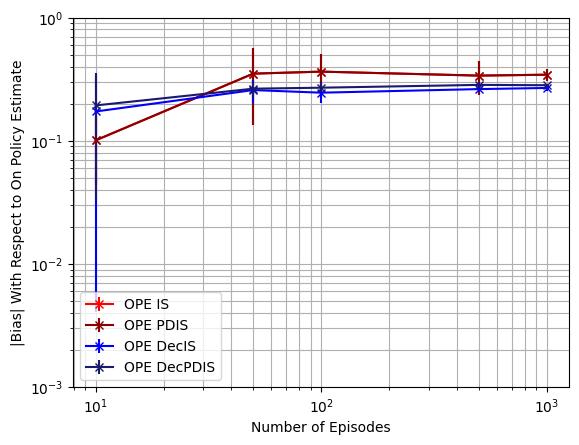

In [ ]:
label = 'bias'
plot_graphs(bias_means, bias_stds, label, 10**-3, 10**0, shorter_D, estimator='IS')

##### Plot Variance

On Policy-----[0.0633291  0.01695643 0.00762798 0.00114761 0.00063264]
OPE IS-----[0.2736     2.08112503 0.57808587 0.11174914 0.06905557]
OPE PDIS-----[0.2736     2.08112503 0.57808587 0.11174914 0.06905557]
OPE DecIS-----[0.53648666 0.0640391  0.02525684 0.00520075 0.00272499]
OPE DecPDIS-----[0.19007744 0.04917259 0.02853974 0.00526017 0.00184276]


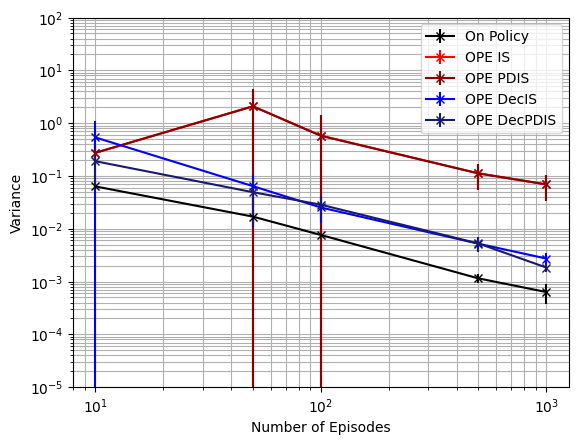

In [ ]:
label = 'var'
plot_graphs(var_means, var_stds, label, 10**(-5), 10**2, shorter_D, estimator='IS')

##### Plot MSE

On Policy-----[0.0633291  0.01695643 0.00762798 0.00114761 0.00063264]
OPE IS-----[0.28699525 2.25090057 0.73098477 0.23625382 0.18830165]
OPE PDIS-----[0.28699525 2.25090057 0.73098477 0.23625382 0.18830165]
OPE DecIS-----[0.59473985 0.1334473  0.08718304 0.07427795 0.07475651]
OPE DecPDIS-----[0.25319418 0.12102201 0.10191421 0.08616876 0.0815371 ]


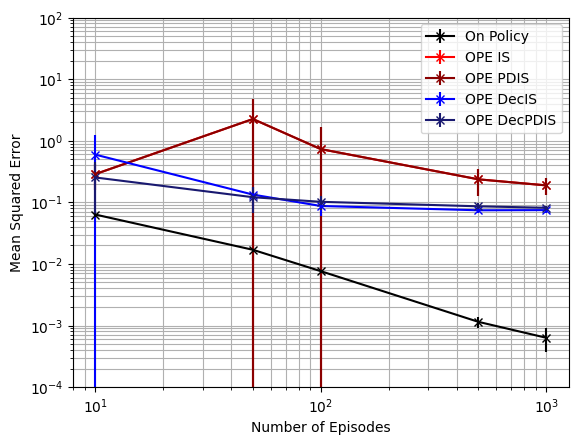

In [ ]:
label = 'MSE'
plot_graphs(MSE_means, MSE_stds, label, 10**(-4), 10**2, shorter_D, estimator='IS')

##### Plot ESS

On Policy-----[  10.   50.  100.  500. 1000.]
OPE IS-----[ 2.58887836  5.26320705  4.48315296  7.28185766 13.59839497]
OPE PDIS-----[ 2.58887836  5.26320705  4.48315296  7.28185766 13.59839497]
OPE DecIS-----[  7.09974228  18.25876804  36.827262   116.18904911 242.1178178 ]
OPE DecPDIS-----[  6.78615526  26.37782613  32.18120415 125.606931   363.17027619]


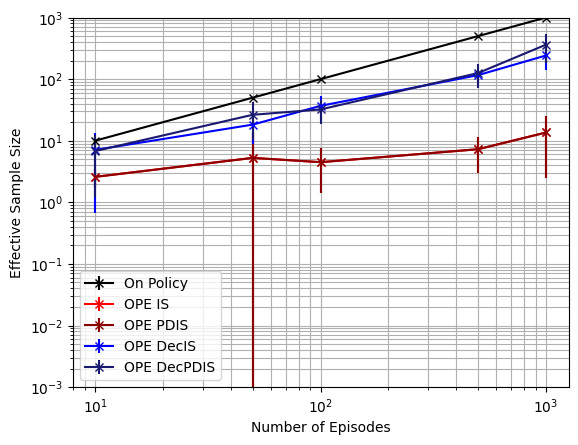

In [ ]:
label = 'ESS'
plot_graphs(ESS_means, ESS_stds, label, 10**(-3), 10**3, shorter_D, estimator='IS')

### Varying Episodes $\epsilon_{e} = 0.2$ (Policy Divergence $6.4^{20}$)

Set up evaluation policy, generate data and convert into factored format

In [ ]:
EVAL_EPSILON = 0.2

evalPolSoft = np.copy(fullPol)
evalPolSoft[evalPolSoft == 1] = 1 - EVAL_EPSILON
evalPolSoft[evalPolSoft == 0] = EVAL_EPSILON / (n_actions - 1)

In [ ]:
# Calculate policy divergence from Voloshin et al.
D = 0
for state in range(randPol.shape[0] - 1):
    for action in range(randPol.shape[1] - 1):
        difference = evalPolSoft[state, action]/randPol[state, action]
        D = max(D, difference)
print(D)
shorter_D = round(D,2)

6.4


In [ ]:
dgen = DataGenerator()
states, actions, lengths, rewards, diab, emp_tx_totals, emp_r_totals = dgen.simulate(
    NSIMSAMPS, NSTEPS, policy=evalPolSoft, policy_idx_type='full',
    p_diabetes=PROB_DIAB, use_tqdm=False) #True, tqdm_desc='Behaviour Policy Simulation')

obs_samps = utils.format_dgen_samps(
    states, actions, rewards, diab, NSTEPS, NSIMSAMPS)

In [ ]:
time = np.arange(NSTEPS)
times = np.stack(axis=0, arrays=[time]*NSIMSAMPS)
times = times[..., np.newaxis]

nf_tr_e = np.concatenate((times, states[:, 0:NSTEPS, :], actions, rewards, states[:, 1:, :]), axis=2)
nf_tr_e.shape

(100000, 20, 5)

In [ ]:
f_tr_e = factorise_dataset(nf_tr_e)

In [ ]:
factored_evalPolSoft, error = factor_policy(evalPolSoft)

In [ ]:
error

array([[0.02742337, 0.02742337, 0.02853043, ..., 0.00357421, 0.02742337,
        0.00357421],
       [0.02742337, 0.02742337, 0.02853043, ..., 0.00357421, 0.02742337,
        0.00357421],
       [0.02742337, 0.02742337, 0.02853043, ..., 0.00357421, 0.02742337,
        0.00357421],
       ...,
       [0.02742337, 0.02742337, 0.00357421, ..., 0.00357421, 0.1000779 ,
        0.02853043],
       [0.02742337, 0.02742337, 0.00357421, ..., 0.00357421, 0.1000779 ,
        0.02853043],
       [0.02742337, 0.02742337, 0.00357421, ..., 0.00357421, 0.1000779 ,
        0.02853043]])

In [ ]:
print(np.mean(error[0]))

0.027700134135412356


In [ ]:
evalPolSoft = pad_policy(evalPolSoft)

factored_evalPolSoft[0] = pad_policy(factored_evalPolSoft[0])
factored_evalPolSoft[1] = pad_policy(factored_evalPolSoft[1])
factored_evalPolSoft[2] = pad_policy(factored_evalPolSoft[2])

In [ ]:
import policy_estimators as pe
import gc

def evaluate_PE(RUNS, EPISODES, SHORTER_D, STEPS=NSTEPS):

  biases = np.zeros((5, 7))
  variances = np.zeros((5, 7))
  MSEs = np.zeros((5, 7))
  ESSs = np.zeros((5, 7))

  # Reshape data for processing
  T, ldim = nf_tr_b.shape[-2], nf_tr_b.shape[-1]
  nfb = nf_tr_b.reshape((-1, RUNS, EPISODES, T, ldim))
  nfe = nf_tr_e.reshape((-1, RUNS, EPISODES, T, ldim))

  T, D, ldim = f_tr_b.shape[-3], f_tr_b.shape[-2], f_tr_b.shape[-1]
  fb = f_tr_b.reshape((-1, RUNS, EPISODES, T, D, ldim))
  fe = f_tr_e.reshape((-1, RUNS, EPISODES, T, D, ldim))

  for t in range(5):
    print()

    lower_index = 0
    estimates_on_policy = np.zeros(RUNS)
    estimates_OPE_IS = np.zeros(RUNS)
    estimates_OPE_PDIS = np.zeros(RUNS)
    estimates_OPE_PDWIS = np.zeros(RUNS)

    estimates_OPE_DecIS = np.zeros(RUNS)
    estimates_OPE_DecPDIS = np.zeros(RUNS)
    estimates_OPE_DecPDWIS = np.zeros(RUNS)

    for r in range(RUNS):
        #On policy Q estimate
        estimates_on_policy[r] = pe.on_policy_Q_estimate(nfe[t, r, :, :STEPS, :], DISCOUNT_Pol)
        #Off policy IS estimate
        estimates_OPE_IS[r] = pe.off_policy_IS_estimator(nfb[t, r, :, :STEPS, :], DISCOUNT_Pol, randPol, evalPolSoft)
        #Off policy PDIS estimate
        estimates_OPE_PDIS[r] = pe.off_policy_PDIS_estimator(nfb[t, r, :, :STEPS, :], DISCOUNT_Pol, randPol, evalPolSoft)
        #Off policy PDWIS estimate
        estimates_OPE_PDWIS[r] = pe.off_policy_PDWIS_estimator(nfb[t, r, :, :STEPS, :], DISCOUNT_Pol, randPol, evalPolSoft)

        #Factorisation 1----------------------------------

        #Off policy decomposed IS estimate
        estimates_OPE_DecIS[r], _ = pe.off_policy_DecIS_estimator(fb[t, r, :, :STEPS, :, :], DISCOUNT_Pol, [0,1], factored_randPol, factored_evalPolSoft)
        #Off policy decomposed PDIS estimate
        estimates_OPE_DecPDIS[r], _ = pe.off_policy_DecPDIS_estimator(fb[t, r, :, :STEPS, :, :], DISCOUNT_Pol, [0,1], factored_randPol, factored_evalPolSoft)
        #Off policy decomposed PDWIS estimate
        estimates_OPE_DecPDWIS[r], _ = pe.off_policy_DecPDWIS_estimator(fb[t, r, :, :STEPS, :, :], DISCOUNT_Pol, [0,1], factored_randPol, factored_evalPolSoft)


    mean_on_policy = np.mean(estimates_on_policy)
    var_on_policy = np.var(estimates_on_policy, ddof=0)
    print(f'Mean on policy Q estimate: {mean_on_policy}. Variance of on policy Q estimate: {var_on_policy}')

    from sklearn.metrics import mean_squared_error

    #For on policy
    biases[t, 0] = 0.0
    variances[t, 0] = var_on_policy
    MSEs[t, 0] = var_on_policy
    ESSs[t, 0] = EPISODES

    def generate_results(estimates, mean_true, label):
      MSE = mean_squared_error(estimates, [mean_true]*RUNS)
      mean = np.mean(estimates)
      var = np.var(estimates, ddof=0)
      bias1 = np.sqrt(MSE - var)
      bias2 = abs(mean - mean_true)
      print(f'Mean {label} estimate: {mean}. Bias1: {bias1}. Bias2: {bias2}. Variance: {var}. MSE: {MSE}')
      return bias1, var, MSE

    label_list = ['OPE IS', 'OPE PDIS', 'OPE PDWIS',
                  'OPE DecIS', 'OPE DecPDIS', 'OPE DecPDWIS'
                  ]

    estimates = [estimates_OPE_IS, estimates_OPE_PDIS, estimates_OPE_PDWIS,
                estimates_OPE_DecIS, estimates_OPE_DecPDIS, estimates_OPE_DecPDWIS
                ]


    for (id, val) in enumerate(label_list):
      biases[t, 1+id], variances[t, 1+id], MSEs[t, 1+id] = generate_results(estimates[id], mean_on_policy, label_list[id])
      ESSs[t, 1+id] = (EPISODES*variances[t, 0])/variances[t, 1+id]
      gc.collect()

  return np.mean(biases, axis=0), np.std(biases, axis=0), np.mean(variances, axis=0), np.std(variances, axis=0), np.mean(MSEs, axis=0), np.std(MSEs, axis=0), np.mean(ESSs, axis=0), np.std(ESSs, axis=0)

#### Run Everything

In [ ]:
EPISODES = [10, 50, 100, 500, 1000]

bias_means = np.zeros((len(EPISODES), 7))
bias_stds = np.zeros((len(EPISODES), 7))
var_means = np.zeros((len(EPISODES), 7))
var_stds = np.zeros((len(EPISODES), 7))
MSE_means = np.zeros((len(EPISODES), 7))
MSE_stds = np.zeros((len(EPISODES), 7))
ESS_means = np.zeros((len(EPISODES), 7))
ESS_stds = np.zeros((len(EPISODES), 7))

RUNS = 20

for id in range(len(EPISODES)):
  e = EPISODES[id]
  print(f'{e} Episodes, {RUNS} ----------------------------------')
  bias_means[id, :], bias_stds[id, :], var_means[id, :], var_stds[id, :], MSE_means[id, :], MSE_stds[id, :], ESS_means[id, :], ESS_stds[id, :] = evaluate_PE(RUNS=RUNS, EPISODES=e, SHORTER_D=shorter_D)
  print()
  gc.collect()

print('BIAS MEANS')
print(list(bias_means))
print('\nBIAS STDS')
print(list(bias_stds))
print('\nVAR MEANS')
print(list(var_means))
print('\nVAR STDS')
print(list(var_stds))
print('\nMSE MEANS')
print(list(MSE_means))
print('\nMSE STDS')
print(list(MSE_stds))
print('\nESS MEANS')
print(list(ESS_means))
print('\nESS STDS')
print(list(ESS_stds))

10 Episodes, 20 ----------------------------------

Mean on policy Q estimate: -0.6359428064149159. Variance of on policy Q estimate: 0.048019682405272615
Mean OPE IS estimate: -0.4253551493855138. Bias1: 0.21058765702940205. Bias2: 0.21058765702940208. Variance: 0.16075665179227092. MSE: 0.20510381308540399
Mean OPE PDIS estimate: -0.4253551493855138. Bias1: 0.21058765702940205. Bias2: 0.21058765702940208. Variance: 0.16075665179227092. MSE: 0.20510381308540399
Mean OPE PDWIS estimate: -0.042323881157846736. Bias1: 0.5936189252570692. Bias2: 0.5936189252570692. Variance: 8.446220824483303e-05. MSE: 0.35246789063160266
Mean OPE DecIS estimate: -0.5026424133427675. Bias1: 0.1333003930721484. Bias2: 0.13330039307214836. Variance: 0.04333519227928309. MSE: 0.06110418707247236
Mean OPE DecPDIS estimate: -0.5219995084834753. Bias1: 0.11394329793144034. Bias2: 0.11394329793144053. Variance: 0.03588855075597493. MSE: 0.048871625899467905
Mean OPE DecPDWIS estimate: -0.07770333784357064. Bias1

#### Plot Graphs

##### Plot Bias

OPE IS-----[0.20498027 0.14902692 0.12739517 0.21510213 0.17655141]
OPE PDIS-----[0.20498027 0.14902692 0.12739517 0.21510213 0.17655141]
OPE PDWIS-----[0.52376402 0.55827135 0.56233252 0.57236545 0.57321197]
OPE DecIS-----[0.13466566 0.03322232 0.02771637 0.01180102 0.0071321 ]
OPE DecPDIS-----[0.16471752 0.02735496 0.0263393  0.01536394 0.00958677]
OPE DecPDWIS-----[0.48833838 0.52823732 0.53341162 0.54629803 0.54875059]


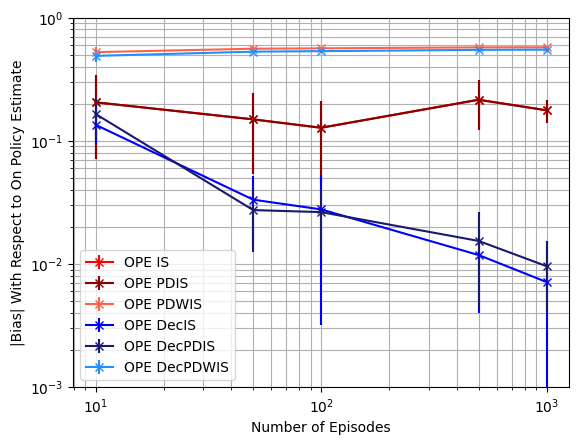

In [ ]:
label = 'bias'
plot_graphs(bias_means, bias_stds, label, 10**-3, 10**0, shorter_D, estimator='IS')

##### Plot Variance

On Policy-----[0.0491764  0.00880818 0.00416731 0.00073183 0.00040304]
OPE IS-----[0.91323929 0.60334896 0.2010272  0.29530603 0.08258482]
OPE PDIS-----[0.91323929 0.60334896 0.2010272  0.29530603 0.08258482]
OPE PDWIS-----[1.49450998e-04 6.71891648e-05 4.69517357e-05 5.08126212e-05
 3.82721268e-05]
OPE DecIS-----[0.3479376  0.0434969  0.01775671 0.0037364  0.00203971]
OPE DecPDIS-----[0.15597404 0.03714392 0.02034136 0.00354615 0.00135095]
OPE DecPDWIS-----[9.27655633e-04 3.65913363e-04 2.30264984e-04 9.11717096e-05
 5.26720435e-05]


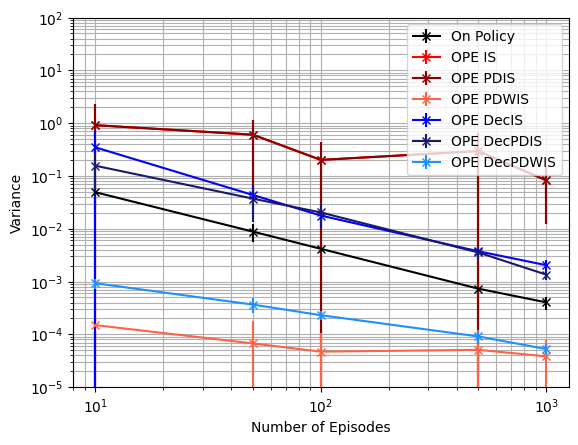

In [ ]:
label = 'var'
plot_graphs(var_means, var_stds, label, 10**(-5), 10**2, shorter_D, estimator='IS')

##### Plot MSE

On Policy-----[0.0491764  0.00880818 0.00416731 0.00073183 0.00040304]
OPE IS-----[0.9730527  0.63455201 0.22404142 0.3503376  0.11519476]
OPE PDIS-----[0.9730527  0.63455201 0.22404142 0.3503376  0.11519476]
OPE PDWIS-----[0.27732711 0.31263799 0.31641516 0.32772664 0.32867672]
OPE DecIS-----[0.36769289 0.04493662 0.01912506 0.00393618 0.00215588]
OPE DecPDIS-----[0.18633193 0.03811288 0.0212228  0.00390093 0.00147274]
OPE DecPDWIS-----[0.2424526  0.28005366 0.28485835 0.29864352 0.30127068]


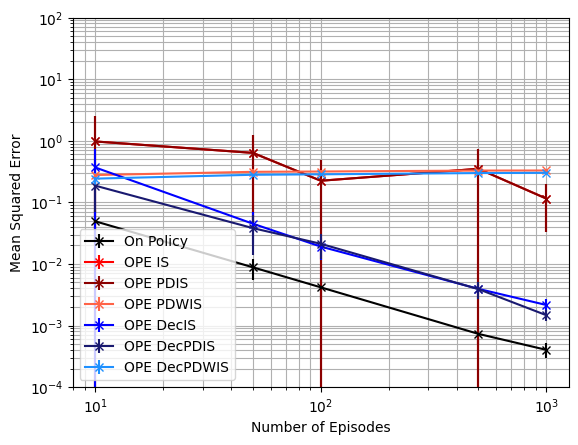

In [ ]:
label = 'MSE'
plot_graphs(MSE_means, MSE_stds, label, 10**(-4), 10**2, shorter_D, estimator='IS')

On Policy-----[0.0491764  0.00880818 0.00416731 0.00073183 0.00040304]
OPE IS-----[0.9730527  0.63455201 0.22404142 0.3503376  0.11519476]
OPE PDIS-----[0.9730527  0.63455201 0.22404142 0.3503376  0.11519476]
OPE PDWIS-----[0.27732711 0.31263799 0.31641516 0.32772664 0.32867672]
OPE DecIS-----[0.36769289 0.04493662 0.01912506 0.00393618 0.00215588]
OPE DecPDIS-----[0.18633193 0.03811288 0.0212228  0.00390093 0.00147274]
OPE DecPDWIS-----[0.2424526  0.28005366 0.28485835 0.29864352 0.30127068]


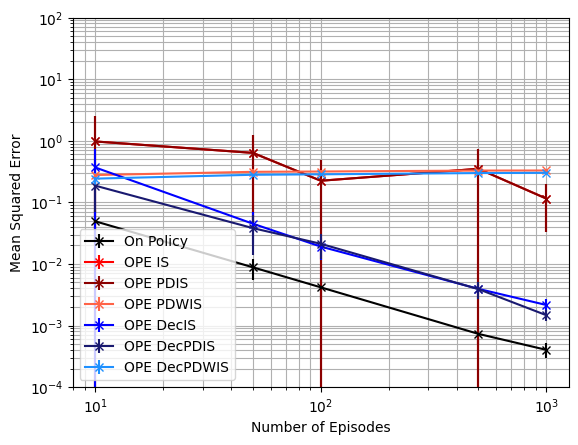

In [ ]:
plot_graphs(MSE_means, MSE_stds, label, 10**(-4), 10**2, shorter_D, estimator='PDIS')

##### Plot ESS

On Policy-----[  10.   50.  100.  500. 1000.]
OPE IS-----[1.76111665 2.01121048 4.08525254 4.51873563 6.89017519]
OPE PDIS-----[1.76111665 2.01121048 4.08525254 4.51873563 6.89017519]
OPE PDWIS-----[ 6242.37623659 34642.46458233 21365.15033893 23961.79149421
 34322.00545586]
OPE DecIS-----[  4.69839863  13.79443631  24.55430676  99.20862578 221.5387758 ]
OPE DecPDIS-----[  5.54546585  20.21079999  27.60452851 105.08359572 306.41618572]
OPE DecPDWIS-----[ 530.66457403 1235.32399624 1886.65686455 4042.60155646 8187.01123535]


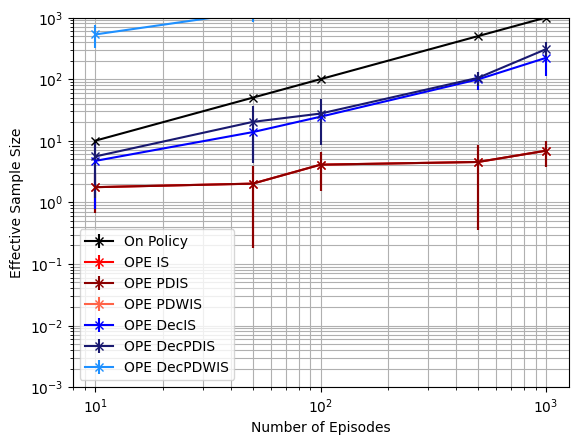

In [ ]:
label = 'ESS'
plot_graphs(ESS_means, ESS_stds, label, 10**(-3), 10**3, shorter_D, estimator='IS')

### Varying Episodes $\epsilon_{e} = 0.4$ (Policy Divergence $4.8^{20}$)

Set up evaluation policy, generate data and convert into factored format

In [ ]:
EVAL_EPSILON = 0.4

evalPolSoft = np.copy(fullPol)
evalPolSoft[evalPolSoft == 1] = 1 - EVAL_EPSILON
evalPolSoft[evalPolSoft == 0] = EVAL_EPSILON / (n_actions - 1)

In [ ]:
# Calculate policy divergence from Voloshin et al.
D = 0
for state in range(randPol.shape[0] - 1):
    for action in range(randPol.shape[1] - 1):
        difference = evalPolSoft[state, action]/randPol[state, action]
        D = max(D, difference)
print(D)
shorter_D = round(D,2)

4.8


In [ ]:
dgen = DataGenerator()
states, actions, lengths, rewards, diab, emp_tx_totals, emp_r_totals = dgen.simulate(
    NSIMSAMPS, NSTEPS, policy=evalPolSoft, policy_idx_type='full',
    p_diabetes=PROB_DIAB, use_tqdm=False) #True, tqdm_desc='Behaviour Policy Simulation')

obs_samps = utils.format_dgen_samps(
    states, actions, rewards, diab, NSTEPS, NSIMSAMPS)

In [ ]:
time = np.arange(NSTEPS)
times = np.stack(axis=0, arrays=[time]*NSIMSAMPS)
times = times[..., np.newaxis]

nf_tr_e = np.concatenate((times, states[:, 0:NSTEPS, :], actions, rewards, states[:, 1:, :]), axis=2)
nf_tr_e.shape

(100000, 20, 5)

In [ ]:
f_tr_e = factorise_dataset(nf_tr_e)

In [ ]:
factored_evalPolSoft, error = factor_policy(evalPolSoft)

In [ ]:
error

array([[0.05023894, 0.05023894, 0.05648534, ..., 0.01534831, 0.05023894,
        0.01534831],
       [0.05023894, 0.05023894, 0.05648534, ..., 0.01534831, 0.05023894,
        0.01534831],
       [0.05023894, 0.05023894, 0.05648534, ..., 0.01534831, 0.05023894,
        0.01534831],
       ...,
       [0.05023894, 0.05023894, 0.01534831, ..., 0.01534831, 0.16115723,
        0.05648534],
       [0.05023894, 0.05023894, 0.01534831, ..., 0.01534831, 0.16115723,
        0.05648534],
       [0.05023894, 0.05023894, 0.01534831, ..., 0.01534831, 0.16115723,
        0.05648534]])

In [ ]:
print(np.mean(error[0]))

0.05180053775434722


In [ ]:
evalPolSoft = pad_policy(evalPolSoft)

factored_evalPolSoft[0] = pad_policy(factored_evalPolSoft[0])
factored_evalPolSoft[1] = pad_policy(factored_evalPolSoft[1])
factored_evalPolSoft[2] = pad_policy(factored_evalPolSoft[2])

In [ ]:
import policy_estimators as pe
import gc

def evaluate_PE(RUNS, EPISODES, SHORTER_D, STEPS=NSTEPS):

  biases = np.zeros((5, 7))
  variances = np.zeros((5, 7))
  MSEs = np.zeros((5, 7))
  ESSs = np.zeros((5, 7))

  # Reshape data for processing
  T, ldim = nf_tr_b.shape[-2], nf_tr_b.shape[-1]
  nfb = nf_tr_b.reshape((-1, RUNS, EPISODES, T, ldim))
  nfe = nf_tr_e.reshape((-1, RUNS, EPISODES, T, ldim))

  T, D, ldim = f_tr_b.shape[-3], f_tr_b.shape[-2], f_tr_b.shape[-1]
  fb = f_tr_b.reshape((-1, RUNS, EPISODES, T, D, ldim))
  fe = f_tr_e.reshape((-1, RUNS, EPISODES, T, D, ldim))

  for t in range(5):
    print()

    lower_index = 0
    estimates_on_policy = np.zeros(RUNS)
    estimates_OPE_IS = np.zeros(RUNS)
    estimates_OPE_PDIS = np.zeros(RUNS)
    estimates_OPE_PDWIS = np.zeros(RUNS)

    estimates_OPE_DecIS = np.zeros(RUNS)
    estimates_OPE_DecPDIS = np.zeros(RUNS)
    estimates_OPE_DecPDWIS = np.zeros(RUNS)

    for r in range(RUNS):
        #On policy Q estimate
        estimates_on_policy[r] = pe.on_policy_Q_estimate(nfe[t, r, :, :STEPS, :], DISCOUNT_Pol)
        #Off policy IS estimate
        estimates_OPE_IS[r] = pe.off_policy_IS_estimator(nfb[t, r, :, :STEPS, :], DISCOUNT_Pol, randPol, evalPolSoft)
        #Off policy PDIS estimate
        estimates_OPE_PDIS[r] = pe.off_policy_PDIS_estimator(nfb[t, r, :, :STEPS, :], DISCOUNT_Pol, randPol, evalPolSoft)
        #Off policy PDWIS estimate
        estimates_OPE_PDWIS[r] = pe.off_policy_PDWIS_estimator(nfb[t, r, :, :STEPS, :], DISCOUNT_Pol, randPol, evalPolSoft)

        #Factorisation 1----------------------------------

        #Off policy decomposed IS estimate
        estimates_OPE_DecIS[r], _ = pe.off_policy_DecIS_estimator(fb[t, r, :, :STEPS, :, :], DISCOUNT_Pol, [0,1], factored_randPol, factored_evalPolSoft)
        #Off policy decomposed PDIS estimate
        estimates_OPE_DecPDIS[r], _ = pe.off_policy_DecPDIS_estimator(fb[t, r, :, :STEPS, :, :], DISCOUNT_Pol, [0,1], factored_randPol, factored_evalPolSoft)
        #Off policy decomposed PDWIS estimate
        estimates_OPE_DecPDWIS[r], _ = pe.off_policy_DecPDWIS_estimator(fb[t, r, :, :STEPS, :, :], DISCOUNT_Pol, [0,1], factored_randPol, factored_evalPolSoft)


    mean_on_policy = np.mean(estimates_on_policy)
    var_on_policy = np.var(estimates_on_policy, ddof=0)
    print(f'Mean on policy Q estimate: {mean_on_policy}. Variance of on policy Q estimate: {var_on_policy}')

    from sklearn.metrics import mean_squared_error

    #For on policy
    biases[t, 0] = 0.0
    variances[t, 0] = var_on_policy
    MSEs[t, 0] = var_on_policy
    ESSs[t, 0] = EPISODES

    def generate_results(estimates, mean_true, label):
      MSE = mean_squared_error(estimates, [mean_true]*RUNS)
      mean = np.mean(estimates)
      var = np.var(estimates, ddof=0)
      bias1 = np.sqrt(MSE - var)
      bias2 = abs(mean - mean_true)
      print(f'Mean {label} estimate: {mean}. Bias1: {bias1}. Bias2: {bias2}. Variance: {var}. MSE: {MSE}')
      return bias1, var, MSE

    label_list = ['OPE IS', 'OPE PDIS', 'OPE PDWIS',
                  'OPE DecIS', 'OPE DecPDIS', 'OPE DecPDWIS'
                  ]

    estimates = [estimates_OPE_IS, estimates_OPE_PDIS, estimates_OPE_PDWIS,
                estimates_OPE_DecIS, estimates_OPE_DecPDIS, estimates_OPE_DecPDWIS
                ]


    for (id, val) in enumerate(label_list):
      biases[t, 1+id], variances[t, 1+id], MSEs[t, 1+id] = generate_results(estimates[id], mean_on_policy, label_list[id])
      ESSs[t, 1+id] = (EPISODES*variances[t, 0])/variances[t, 1+id]
      gc.collect()

  return np.mean(biases, axis=0), np.std(biases, axis=0), np.mean(variances, axis=0), np.std(variances, axis=0), np.mean(MSEs, axis=0), np.std(MSEs, axis=0), np.mean(ESSs, axis=0), np.std(ESSs, axis=0)

#### Run Everything

In [ ]:
EPISODES = [10, 50, 100, 500, 1000]

bias_means = np.zeros((len(EPISODES), 7))
bias_stds = np.zeros((len(EPISODES), 7))
var_means = np.zeros((len(EPISODES), 7))
var_stds = np.zeros((len(EPISODES), 7))
MSE_means = np.zeros((len(EPISODES), 7))
MSE_stds = np.zeros((len(EPISODES), 7))
ESS_means = np.zeros((len(EPISODES), 7))
ESS_stds = np.zeros((len(EPISODES), 7))

RUNS = 20

for id in range(len(EPISODES)):
  e = EPISODES[id]
  print(f'{e} Episodes, {RUNS} ----------------------------------')
  bias_means[id, :], bias_stds[id, :], var_means[id, :], var_stds[id, :], MSE_means[id, :], MSE_stds[id, :], ESS_means[id, :], ESS_stds[id, :] = evaluate_PE(RUNS=RUNS, EPISODES=e, SHORTER_D=shorter_D)
  print()
  gc.collect()

print('BIAS MEANS')
print(list(bias_means))
print('\nBIAS STDS')
print(list(bias_stds))
print('\nVAR MEANS')
print(list(var_means))
print('\nVAR STDS')
print(list(var_stds))
print('\nMSE MEANS')
print(list(MSE_means))
print('\nMSE STDS')
print(list(MSE_stds))
print('\nESS MEANS')
print(list(ESS_means))
print('\nESS STDS')
print(list(ESS_stds))

10 Episodes, 20 ----------------------------------

Mean on policy Q estimate: -0.791868697213221. Variance of on policy Q estimate: 0.020311796665178457
Mean OPE IS estimate: -0.569046995951281. Bias1: 0.2228217012619398. Bias2: 0.2228217012619399. Variance: 0.07885653173641347. MSE: 0.1285060422896786
Mean OPE PDIS estimate: -0.569046995951281. Bias1: 0.2228217012619398. Bias2: 0.2228217012619399. Variance: 0.07885653173641347. MSE: 0.1285060422896786
Mean OPE PDWIS estimate: -0.04546649330224502. Bias1: 0.746402203910976. Bias2: 0.7464022039109759. Variance: 2.104402940742375e-05. MSE: 0.5571372940325696
Mean OPE DecIS estimate: -0.5175358382090135. Bias1: 0.27433285900420745. Bias2: 0.27433285900420745. Variance: 0.0300862339944802. MSE: 0.10534475152390257
Mean OPE DecPDIS estimate: -0.5389118325077937. Bias1: 0.2529568647054271. Bias2: 0.2529568647054272. Variance: 0.027644767308220825. MSE: 0.09163194270982059
Mean OPE DecPDWIS estimate: -0.05781072673412877. Bias1: 0.7340579704

#### Plot Graphs

##### Plot Bias

OPE IS-----[0.21038808 0.04979866 0.04956478 0.12356795 0.08581272]
OPE PDIS-----[0.21038808 0.04979866 0.04956478 0.12356795 0.08581272]
OPE PDWIS-----[0.73325496 0.74990426 0.74216787 0.74552934 0.74507994]
OPE DecIS-----[0.22381685 0.18226191 0.18143978 0.17842537 0.17712414]
OPE DecPDIS-----[0.19820629 0.16454747 0.16035217 0.15811639 0.1603708 ]
OPE DecPDWIS-----[0.71956345 0.73816675 0.73040805 0.73496041 0.73488877]


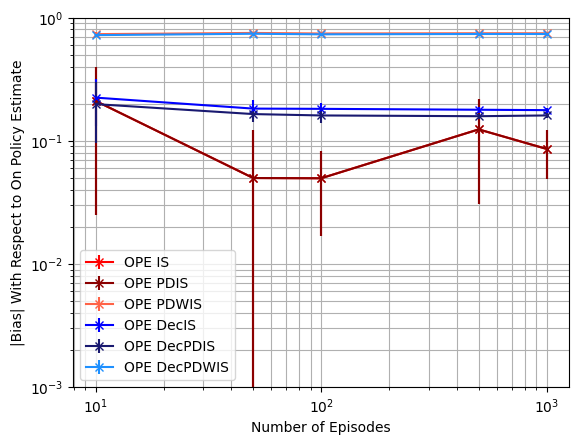

In [ ]:
label = 'bias'
plot_graphs(bias_means, bias_stds, label, 10**-3, 10**0, shorter_D, estimator='IS')

##### Plot Variance

On Policy-----[0.02237518 0.00517436 0.00263435 0.00046854 0.0002364 ]
OPE IS-----[1.28867162 0.17311292 0.07200112 0.26859441 0.06994207]
OPE PDIS-----[1.28867162 0.17311292 0.07200112 0.26859441 0.06994207]
OPE PDWIS-----[1.14206726e-04 5.76556471e-05 3.93871685e-05 1.85583958e-05
 1.45846738e-05]
OPE DecIS-----[0.18056677 0.02457292 0.01083354 0.00262372 0.00139901]
OPE DecPDIS-----[0.1275752  0.02469508 0.01258718 0.00210597 0.00092975]
OPE DecPDWIS-----[1.90689793e-04 8.01668440e-05 5.32885241e-05 1.90084329e-05
 1.04026086e-05]


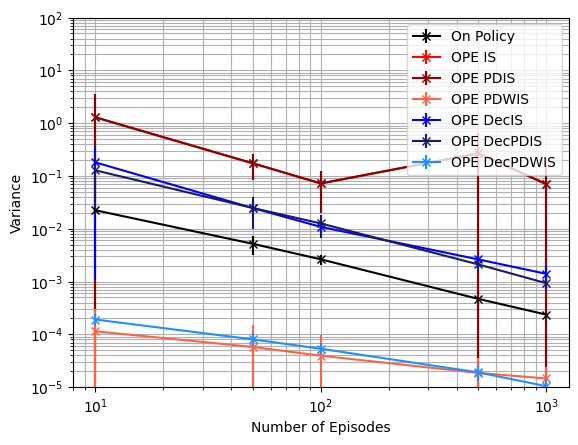

In [ ]:
label = 'var'
plot_graphs(var_means, var_stds, label, 10**(-5), 10**2, shorter_D, estimator='IS')

##### Plot MSE

On Policy-----[0.02237518 0.00517436 0.00263435 0.00046854 0.0002364 ]
OPE IS-----[1.36740071 0.18073808 0.07552517 0.29253375 0.07866687]
OPE PDIS-----[1.36740071 0.18073808 0.07552517 0.29253375 0.07866687]
OPE PDWIS-----[0.53857468 0.56251566 0.55090321 0.55585908 0.55516381]
OPE DecIS-----[0.23906769 0.05875727 0.04414929 0.03455975 0.0328469 ]
OPE DecPDIS-----[0.17752162 0.05226386 0.03872033 0.02716357 0.02668907]
OPE DecPDWIS-----[0.51886726 0.54509211 0.53361275 0.5402073  0.54008002]


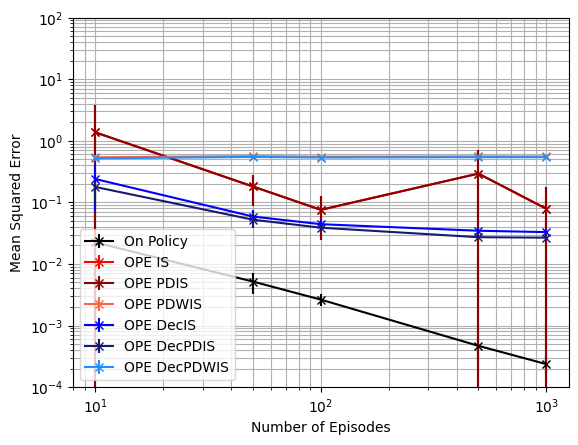

In [ ]:
label = 'MSE'
plot_graphs(MSE_means, MSE_stds, label, 10**(-4), 10**2, shorter_D, estimator='IS')

##### Plot ESS

On Policy-----[  10.   50.  100.  500. 1000.]
OPE IS-----[ 1.39225442  2.21722233  4.83691683  5.56677512 10.65835208]
OPE PDIS-----[ 1.39225442  2.21722233  4.83691683  5.56677512 10.65835208]
OPE PDWIS-----[11291.89591535 23969.41892924 19838.08467472 29051.95585535
 45096.06521398]
OPE DecIS-----[  3.90348688  13.25447284  24.91251781  92.9693727  188.31051819]
OPE DecPDIS-----[  4.13132569  14.7823235   26.60916718 126.82589617 269.78576173]
OPE DecPDWIS-----[ 1246.93159426  3377.55419042  5335.29043749 13763.29607147
 27058.11259392]


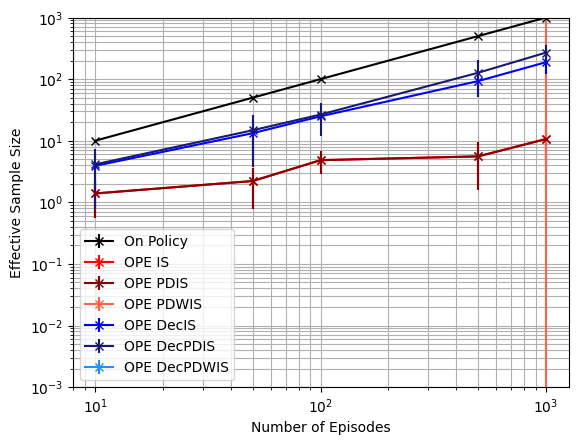

In [ ]:
label = 'ESS'
plot_graphs(ESS_means, ESS_stds, label, 10**(-3), 10**3, shorter_D, estimator='IS')

### Varying Episodes $\epsilon_{e} = 0.6$ (Policy Divergence $3.2^{20}$)

Set up evaluation policy, generate data and convert into factored format

In [ ]:
EVAL_EPSILON = 0.6

evalPolSoft = np.copy(fullPol)
evalPolSoft[evalPolSoft == 1] = 1 - EVAL_EPSILON
evalPolSoft[evalPolSoft == 0] = EVAL_EPSILON / (n_actions - 1)

In [ ]:
# Calculate policy divergence from Voloshin et al.
D = 0
for state in range(randPol.shape[0] - 1):
    for action in range(randPol.shape[1] - 1):
        difference = evalPolSoft[state, action]/randPol[state, action]
        D = max(D, difference)
print(D)
shorter_D = round(D,2)

3.2


In [ ]:
dgen = DataGenerator()
states, actions, lengths, rewards, diab, emp_tx_totals, emp_r_totals = dgen.simulate(
    NSIMSAMPS, NSTEPS, policy=evalPolSoft, policy_idx_type='full',
    p_diabetes=PROB_DIAB, use_tqdm=False) #True, tqdm_desc='Behaviour Policy Simulation')

obs_samps = utils.format_dgen_samps(
    states, actions, rewards, diab, NSTEPS, NSIMSAMPS)

In [ ]:
time = np.arange(NSTEPS)
times = np.stack(axis=0, arrays=[time]*NSIMSAMPS)
times = times[..., np.newaxis]

nf_tr_e = np.concatenate((times, states[:, 0:NSTEPS, :], actions, rewards, states[:, 1:, :]), axis=2)
nf_tr_e.shape

(100000, 20, 5)

In [ ]:
f_tr_e = factorise_dataset(nf_tr_e)

In [ ]:
factored_evalPolSoft, error = factor_policy(evalPolSoft)

In [ ]:
error

array([[0.06006804, 0.06006804, 0.08021866, ..., 0.03396819, 0.06006804,
        0.03396819],
       [0.06006804, 0.06006804, 0.08021866, ..., 0.03396819, 0.06006804,
        0.03396819],
       [0.06006804, 0.06006804, 0.08021866, ..., 0.03396819, 0.06006804,
        0.03396819],
       ...,
       [0.06006804, 0.06006804, 0.03396819, ..., 0.03396819, 0.15851822,
        0.08021866],
       [0.06006804, 0.06006804, 0.03396819, ..., 0.03396819, 0.15851822,
        0.08021866],
       [0.06006804, 0.06006804, 0.03396819, ..., 0.03396819, 0.15851822,
        0.08021866]])

In [ ]:
print(np.mean(error[0]))

0.06510569625774183


In [ ]:
evalPolSoft = pad_policy(evalPolSoft)

factored_evalPolSoft[0] = pad_policy(factored_evalPolSoft[0])
factored_evalPolSoft[1] = pad_policy(factored_evalPolSoft[1])
factored_evalPolSoft[2] = pad_policy(factored_evalPolSoft[2])

In [ ]:
import policy_estimators as pe
import gc

def evaluate_PE(RUNS, EPISODES, SHORTER_D, STEPS=NSTEPS):

  biases = np.zeros((5, 7))
  variances = np.zeros((5, 7))
  MSEs = np.zeros((5, 7))
  ESSs = np.zeros((5, 7))

  # Reshape data for processing
  T, ldim = nf_tr_b.shape[-2], nf_tr_b.shape[-1]
  nfb = nf_tr_b.reshape((-1, RUNS, EPISODES, T, ldim))
  nfe = nf_tr_e.reshape((-1, RUNS, EPISODES, T, ldim))

  T, D, ldim = f_tr_b.shape[-3], f_tr_b.shape[-2], f_tr_b.shape[-1]
  fb = f_tr_b.reshape((-1, RUNS, EPISODES, T, D, ldim))
  fe = f_tr_e.reshape((-1, RUNS, EPISODES, T, D, ldim))

  for t in range(5):
    print()

    lower_index = 0
    estimates_on_policy = np.zeros(RUNS)
    estimates_OPE_IS = np.zeros(RUNS)
    estimates_OPE_PDIS = np.zeros(RUNS)
    estimates_OPE_PDWIS = np.zeros(RUNS)

    estimates_OPE_DecIS = np.zeros(RUNS)
    estimates_OPE_DecPDIS = np.zeros(RUNS)
    estimates_OPE_DecPDWIS = np.zeros(RUNS)

    for r in range(RUNS):
        #On policy Q estimate
        estimates_on_policy[r] = pe.on_policy_Q_estimate(nfe[t, r, :, :STEPS, :], DISCOUNT_Pol)
        #Off policy IS estimate
        estimates_OPE_IS[r] = pe.off_policy_IS_estimator(nfb[t, r, :, :STEPS, :], DISCOUNT_Pol, randPol, evalPolSoft)
        #Off policy PDIS estimate
        estimates_OPE_PDIS[r] = pe.off_policy_PDIS_estimator(nfb[t, r, :, :STEPS, :], DISCOUNT_Pol, randPol, evalPolSoft)
        #Off policy PDWIS estimate
        estimates_OPE_PDWIS[r] = pe.off_policy_PDWIS_estimator(nfb[t, r, :, :STEPS, :], DISCOUNT_Pol, randPol, evalPolSoft)

        #Factorisation 1----------------------------------

        #Off policy decomposed IS estimate
        estimates_OPE_DecIS[r], _ = pe.off_policy_DecIS_estimator(fb[t, r, :, :STEPS, :, :], DISCOUNT_Pol, [0,1], factored_randPol, factored_evalPolSoft)
        #Off policy decomposed PDIS estimate
        estimates_OPE_DecPDIS[r], _ = pe.off_policy_DecPDIS_estimator(fb[t, r, :, :STEPS, :, :], DISCOUNT_Pol, [0,1], factored_randPol, factored_evalPolSoft)
        #Off policy decomposed PDWIS estimate
        estimates_OPE_DecPDWIS[r], _ = pe.off_policy_DecPDWIS_estimator(fb[t, r, :, :STEPS, :, :], DISCOUNT_Pol, [0,1], factored_randPol, factored_evalPolSoft)


    mean_on_policy = np.mean(estimates_on_policy)
    var_on_policy = np.var(estimates_on_policy, ddof=0)
    print(f'Mean on policy Q estimate: {mean_on_policy}. Variance of on policy Q estimate: {var_on_policy}')

    from sklearn.metrics import mean_squared_error

    #For on policy
    biases[t, 0] = 0.0
    variances[t, 0] = var_on_policy
    MSEs[t, 0] = var_on_policy
    ESSs[t, 0] = EPISODES

    def generate_results(estimates, mean_true, label):
      MSE = mean_squared_error(estimates, [mean_true]*RUNS)
      mean = np.mean(estimates)
      var = np.var(estimates, ddof=0)
      bias1 = np.sqrt(MSE - var)
      bias2 = abs(mean - mean_true)
      print(f'Mean {label} estimate: {mean}. Bias1: {bias1}. Bias2: {bias2}. Variance: {var}. MSE: {MSE}')
      return bias1, var, MSE

    label_list = ['OPE IS', 'OPE PDIS', 'OPE PDWIS',
                  'OPE DecIS', 'OPE DecPDIS', 'OPE DecPDWIS'
                  ]

    estimates = [estimates_OPE_IS, estimates_OPE_PDIS, estimates_OPE_PDWIS,
                estimates_OPE_DecIS, estimates_OPE_DecPDIS, estimates_OPE_DecPDWIS
                ]


    for (id, val) in enumerate(label_list):
      biases[t, 1+id], variances[t, 1+id], MSEs[t, 1+id] = generate_results(estimates[id], mean_on_policy, label_list[id])
      ESSs[t, 1+id] = (EPISODES*variances[t, 0])/variances[t, 1+id]
      gc.collect()

  return np.mean(biases, axis=0), np.std(biases, axis=0), np.mean(variances, axis=0), np.std(variances, axis=0), np.mean(MSEs, axis=0), np.std(MSEs, axis=0), np.mean(ESSs, axis=0), np.std(ESSs, axis=0)

#### Run Everything

In [ ]:
EPISODES = [10, 50, 100, 500, 1000]

bias_means = np.zeros((len(EPISODES), 7))
bias_stds = np.zeros((len(EPISODES), 7))
var_means = np.zeros((len(EPISODES), 7))
var_stds = np.zeros((len(EPISODES), 7))
MSE_means = np.zeros((len(EPISODES), 7))
MSE_stds = np.zeros((len(EPISODES), 7))
ESS_means = np.zeros((len(EPISODES), 7))
ESS_stds = np.zeros((len(EPISODES), 7))

RUNS = 20

for id in range(len(EPISODES)):
  e = EPISODES[id]
  print(f'{e} Episodes, {RUNS} ----------------------------------')
  bias_means[id, :], bias_stds[id, :], var_means[id, :], var_stds[id, :], MSE_means[id, :], MSE_stds[id, :], ESS_means[id, :], ESS_stds[id, :] = evaluate_PE(RUNS=RUNS, EPISODES=e, SHORTER_D=shorter_D)
  print()
  gc.collect()

print('BIAS MEANS')
print(list(bias_means))
print('\nBIAS STDS')
print(list(bias_stds))
print('\nVAR MEANS')
print(list(var_means))
print('\nVAR STDS')
print(list(var_stds))
print('\nMSE MEANS')
print(list(MSE_means))
print('\nMSE STDS')
print(list(MSE_stds))
print('\nESS MEANS')
print(list(ESS_means))
print('\nESS STDS')
print(list(ESS_stds))

10 Episodes, 20 ----------------------------------

Mean on policy Q estimate: -0.8898053979041014. Variance of on policy Q estimate: 0.009210234938231539
Mean OPE IS estimate: -0.7647220624140494. Bias1: 0.12508333549005202. Bias2: 0.12508333549005202. Variance: 0.025779822038478943. MSE: 0.04142566285579585
Mean OPE PDIS estimate: -0.7647220624140494. Bias1: 0.12508333549005202. Bias2: 0.12508333549005202. Variance: 0.025779822038478943. MSE: 0.04142566285579585
Mean OPE PDWIS estimate: -0.047384061445353905. Bias1: 0.8424213364587475. Bias2: 0.8424213364587475. Variance: 6.950567650132465e-06. MSE: 0.7096806586885923
Mean OPE DecIS estimate: -0.5529612551202241. Bias1: 0.33684414278387714. Bias2: 0.3368441427838773. Variance: 0.017065680656189085. MSE: 0.1305296571839941
Mean OPE DecPDIS estimate: -0.5711435250816393. Bias1: 0.31866187282246217. Bias2: 0.31866187282246206. Variance: 0.016450451288932823. MSE: 0.11799584047965186
Mean OPE DecPDWIS estimate: -0.043697636296482975. Bia

#### Plot Graphs

##### Plot Bias

OPE IS-----[0.10878988 0.03227395 0.02434353 0.04708222 0.03079822]
OPE PDIS-----[0.10878988 0.03227395 0.02434353 0.04708222 0.03079822]
OPE PDWIS-----[0.85119    0.84810194 0.84970864 0.84472799 0.84501563]
OPE DecIS-----[0.31382689 0.27628811 0.28068667 0.27145296 0.27258624]
OPE DecPDIS-----[0.27892611 0.25986746 0.26484734 0.25453373 0.25681344]
OPE DecPDWIS-----[0.85339673 0.85082563 0.85236774 0.84795454 0.84803921]


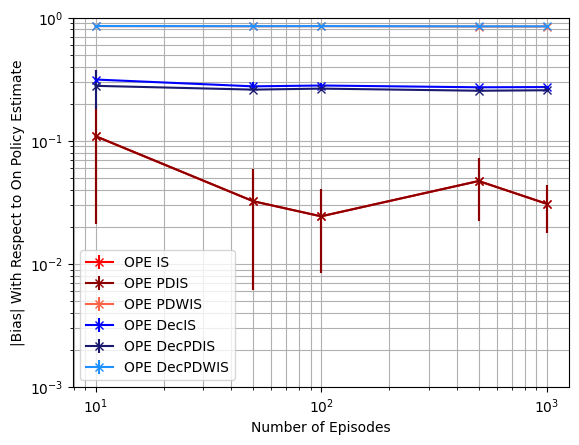

In [ ]:
label = 'bias'
plot_graphs(bias_means, bias_stds, label, 10**(-3), 10**0, shorter_D, estimator='IS')

##### Plot Variance

On Policy-----[0.00999531 0.00249587 0.00114636 0.0001953  0.00011899]
OPE IS-----[0.33750922 0.03494886 0.02023639 0.02785579 0.00927645]
OPE PDIS-----[0.33750922 0.03494886 0.02023639 0.02785579 0.00927645]
OPE PDWIS-----[8.57633363e-05 2.74275978e-05 1.56551496e-05 4.26355611e-06
 5.47568130e-06]
OPE DecIS-----[0.06207261 0.00971223 0.00497796 0.00128852 0.00061012]
OPE DecPDIS-----[0.06109409 0.01076974 0.00544965 0.00097136 0.00044999]
OPE DecPDWIS-----[3.42571334e-05 1.20625690e-05 8.26489871e-06 2.07357779e-06
 1.05830300e-06]


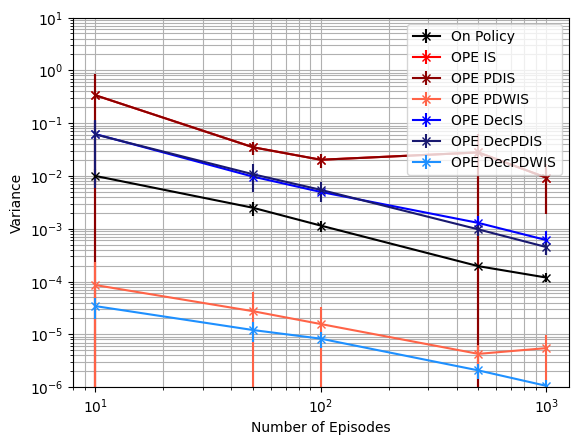

In [ ]:
label = 'var'
plot_graphs(var_means, var_stds, label, 10**(-6), 10**1, shorter_D, estimator='IS')

##### Plot MSE

On Policy-----[0.00999531 0.00249587 0.00114636 0.0001953  0.00011899]
OPE IS-----[0.35704991 0.03667588 0.02108162 0.0306924  0.01039001]
OPE PDIS-----[0.35704991 0.03667588 0.02108162 0.0306924  0.01039001]
OPE PDWIS-----[0.72518109 0.719429   0.72205454 0.71359563 0.71405998]
OPE DecIS-----[0.1641243  0.08654176 0.08395291 0.07504674 0.07494852]
OPE DecPDIS-----[0.14848479 0.07843259 0.07572177 0.06581345 0.06643263]
OPE DecPDWIS-----[0.72885817 0.72404144 0.72656937 0.71904958 0.71917412]


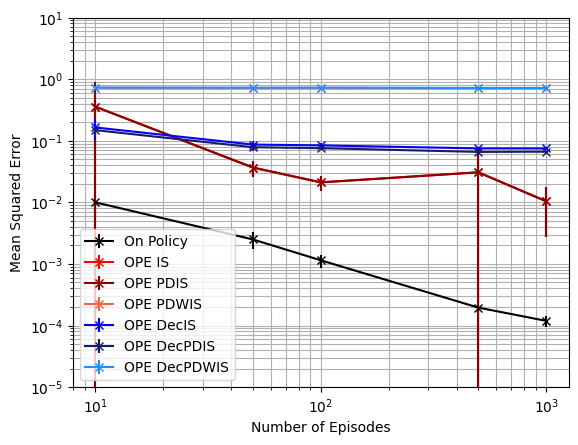

In [ ]:
label = 'MSE'
plot_graphs(MSE_means, MSE_stds, label, 10**(-5), 10**1, shorter_D, estimator='IS')

##### Plot ESS

On Policy-----[  10.   50.  100.  500. 1000.]
OPE IS-----[ 1.48386478  3.82974347  6.24621615  9.33284637 19.76553735]
OPE PDIS-----[ 1.48386478  3.82974347  6.24621615  9.33284637 19.76553735]
OPE PDWIS-----[11376.76977375 14053.98540861 20002.88765893 29145.11372818
 31636.14225512]
OPE DecIS-----[  3.43837838  13.63627994  23.03407592  85.23915412 237.45776736]
OPE DecPDIS-----[  3.3723089   15.12766412  24.49977828 108.80684908 290.44100098]
OPE DecPDWIS-----[  3695.67946688  11412.27677895  16463.21498343  50000.88983638
 122938.65112766]


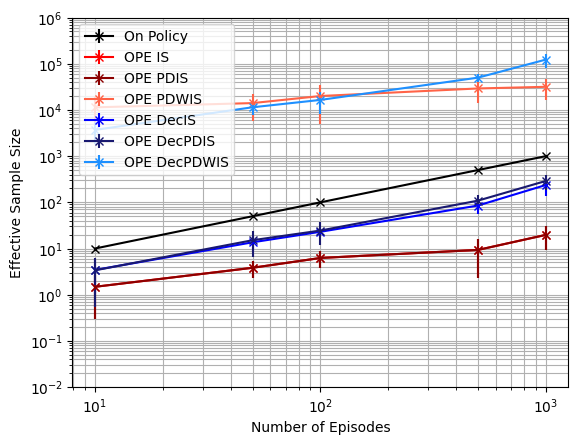

In [ ]:
label = 'ESS'
plot_graphs(ESS_means, ESS_stds, label, 10**(-2), 10**6, shorter_D, estimator='IS')

### Varying Episodes $\epsilon_{e} = 0.8$ (Policy Divergence $1.6^{20}$)



Set up evaluation policy, generate data and convert into factored format

In [ ]:
EVAL_EPSILON = 0.8

evalPolSoft = np.copy(fullPol)
evalPolSoft[evalPolSoft == 1] = 1 - EVAL_EPSILON
evalPolSoft[evalPolSoft == 0] = EVAL_EPSILON / (n_actions - 1)

In [ ]:
# Calculate policy divergence from Voloshin et al.
D = 0
for state in range(randPol.shape[0] - 1):
    for action in range(randPol.shape[1] - 1):
        difference = evalPolSoft[state, action]/randPol[state, action]
        D = max(D, difference)
print(D)
shorter_D = round(D,2)

1.5999999999999996


In [ ]:
dgen = DataGenerator()
states, actions, lengths, rewards, diab, emp_tx_totals, emp_r_totals = dgen.simulate(
    NSIMSAMPS, NSTEPS, policy=evalPolSoft, policy_idx_type='full',
    p_diabetes=PROB_DIAB, use_tqdm=False) #True, tqdm_desc='Behaviour Policy Simulation')

obs_samps = utils.format_dgen_samps(
    states, actions, rewards, diab, NSTEPS, NSIMSAMPS)

In [ ]:
time = np.arange(NSTEPS)
times = np.stack(axis=0, arrays=[time]*NSIMSAMPS)
times = times[..., np.newaxis]

nf_tr_e = np.concatenate((times, states[:, 0:NSTEPS, :], actions, rewards, states[:, 1:, :]), axis=2)
nf_tr_e.shape

(100000, 20, 5)

In [ ]:
f_tr_e = factorise_dataset(nf_tr_e)

In [ ]:
factored_evalPolSoft, error = factor_policy(evalPolSoft)

In [ ]:
error

array([[0.03013846, 0.03013846, 0.06620157, ..., 0.03297199, 0.03013846,
        0.03297199],
       [0.03013846, 0.03013846, 0.06620157, ..., 0.03297199, 0.03013846,
        0.03297199],
       [0.03013846, 0.03013846, 0.06620157, ..., 0.03297199, 0.03013846,
        0.03297199],
       ...,
       [0.03013846, 0.03013846, 0.03297199, ..., 0.03297199, 0.05770098,
        0.06620157],
       [0.03013846, 0.03013846, 0.03297199, ..., 0.03297199, 0.05770098,
        0.06620157],
       [0.03013846, 0.03013846, 0.03297199, ..., 0.03297199, 0.05770098,
        0.06620157]])

In [ ]:
print(np.mean(error[0]))

0.03915423419555648


In [ ]:
print(error[0])

[0.03013846 0.03013846 0.06620157 0.05770098 0.03297199 0.03297199
 0.03013846 0.03297199]


In [ ]:
evalPolSoft = pad_policy(evalPolSoft)

factored_evalPolSoft[0] = pad_policy(factored_evalPolSoft[0])
factored_evalPolSoft[1] = pad_policy(factored_evalPolSoft[1])
factored_evalPolSoft[2] = pad_policy(factored_evalPolSoft[2])

In [ ]:
import policy_estimators as pe
import gc

def evaluate_PE(RUNS, EPISODES, SHORTER_D, STEPS=NSTEPS):

  biases = np.zeros((5, 7))
  variances = np.zeros((5, 7))
  MSEs = np.zeros((5, 7))
  ESSs = np.zeros((5, 7))

  # Reshape data for processing
  T, ldim = nf_tr_b.shape[-2], nf_tr_b.shape[-1]
  nfb = nf_tr_b.reshape((-1, RUNS, EPISODES, T, ldim))
  nfe = nf_tr_e.reshape((-1, RUNS, EPISODES, T, ldim))

  T, D, ldim = f_tr_b.shape[-3], f_tr_b.shape[-2], f_tr_b.shape[-1]
  fb = f_tr_b.reshape((-1, RUNS, EPISODES, T, D, ldim))
  fe = f_tr_e.reshape((-1, RUNS, EPISODES, T, D, ldim))

  for t in range(5):
    print()

    lower_index = 0
    estimates_on_policy = np.zeros(RUNS)
    estimates_OPE_IS = np.zeros(RUNS)
    estimates_OPE_PDIS = np.zeros(RUNS)
    estimates_OPE_PDWIS = np.zeros(RUNS)

    estimates_OPE_DecIS = np.zeros(RUNS)
    estimates_OPE_DecPDIS = np.zeros(RUNS)
    estimates_OPE_DecPDWIS = np.zeros(RUNS)

    for r in range(RUNS):
        #On policy Q estimate
        estimates_on_policy[r] = pe.on_policy_Q_estimate(nfe[t, r, :, :STEPS, :], DISCOUNT_Pol)
        #Off policy IS estimate
        estimates_OPE_IS[r] = pe.off_policy_IS_estimator(nfb[t, r, :, :STEPS, :], DISCOUNT_Pol, randPol, evalPolSoft)
        #Off policy PDIS estimate
        estimates_OPE_PDIS[r] = pe.off_policy_PDIS_estimator(nfb[t, r, :, :STEPS, :], DISCOUNT_Pol, randPol, evalPolSoft)
        #Off policy PDWIS estimate
        estimates_OPE_PDWIS[r] = pe.off_policy_PDWIS_estimator(nfb[t, r, :, :STEPS, :], DISCOUNT_Pol, randPol, evalPolSoft)

        #Factorisation 1----------------------------------

        #Off policy decomposed IS estimate
        estimates_OPE_DecIS[r], _ = pe.off_policy_DecIS_estimator(fb[t, r, :, :STEPS, :, :], DISCOUNT_Pol, [0,1], factored_randPol, factored_evalPolSoft)
        #Off policy decomposed PDIS estimate
        estimates_OPE_DecPDIS[r], _ = pe.off_policy_DecPDIS_estimator(fb[t, r, :, :STEPS, :, :], DISCOUNT_Pol, [0,1], factored_randPol, factored_evalPolSoft)
        #Off policy decomposed PDWIS estimate
        estimates_OPE_DecPDWIS[r], _ = pe.off_policy_DecPDWIS_estimator(fb[t, r, :, :STEPS, :, :], DISCOUNT_Pol, [0,1], factored_randPol, factored_evalPolSoft)


    mean_on_policy = np.mean(estimates_on_policy)
    var_on_policy = np.var(estimates_on_policy, ddof=0)
    print(f'Mean on policy Q estimate: {mean_on_policy}. Variance of on policy Q estimate: {var_on_policy}')

    from sklearn.metrics import mean_squared_error

    #For on policy
    biases[t, 0] = 0.0
    variances[t, 0] = var_on_policy
    MSEs[t, 0] = var_on_policy
    ESSs[t, 0] = EPISODES

    def generate_results(estimates, mean_true, label):
      MSE = mean_squared_error(estimates, [mean_true]*RUNS)
      mean = np.mean(estimates)
      var = np.var(estimates, ddof=0)
      bias1 = np.sqrt(MSE - var)
      bias2 = abs(mean - mean_true)
      print(f'Mean {label} estimate: {mean}. Bias1: {bias1}. Bias2: {bias2}. Variance: {var}. MSE: {MSE}')
      return bias1, var, MSE

    label_list = ['OPE IS', 'OPE PDIS', 'OPE PDWIS',
                  'OPE DecIS', 'OPE DecPDIS', 'OPE DecPDWIS'
                  ]

    estimates = [estimates_OPE_IS, estimates_OPE_PDIS, estimates_OPE_PDWIS,
                estimates_OPE_DecIS, estimates_OPE_DecPDIS, estimates_OPE_DecPDWIS
                ]


    for (id, val) in enumerate(label_list):
      biases[t, 1+id], variances[t, 1+id], MSEs[t, 1+id] = generate_results(estimates[id], mean_on_policy, label_list[id])
      ESSs[t, 1+id] = (EPISODES*variances[t, 0])/variances[t, 1+id]
      gc.collect()

  return np.mean(biases, axis=0), np.std(biases, axis=0), np.mean(variances, axis=0), np.std(variances, axis=0), np.mean(MSEs, axis=0), np.std(MSEs, axis=0), np.mean(ESSs, axis=0), np.std(ESSs, axis=0)

#### Run Everything

In [ ]:
EPISODES = [10, 50, 100, 500, 1000]

bias_means = np.zeros((len(EPISODES), 7))
bias_stds = np.zeros((len(EPISODES), 7))
var_means = np.zeros((len(EPISODES), 7))
var_stds = np.zeros((len(EPISODES), 7))
MSE_means = np.zeros((len(EPISODES), 7))
MSE_stds = np.zeros((len(EPISODES), 7))
ESS_means = np.zeros((len(EPISODES), 7))
ESS_stds = np.zeros((len(EPISODES), 7))

RUNS = 20

for id in range(len(EPISODES)):
  e = EPISODES[id]
  print(f'{e} Episodes, {RUNS} ----------------------------------')
  bias_means[id, :], bias_stds[id, :], var_means[id, :], var_stds[id, :], MSE_means[id, :], MSE_stds[id, :], ESS_means[id, :], ESS_stds[id, :] = evaluate_PE(RUNS=RUNS, EPISODES=e, SHORTER_D=shorter_D)
  print()
  gc.collect()

print('BIAS MEANS')
print(list(bias_means))
print('\nBIAS STDS')
print(list(bias_stds))
print('\nVAR MEANS')
print(list(var_means))
print('\nVAR STDS')
print(list(var_stds))
print('\nMSE MEANS')
print(list(MSE_means))
print('\nMSE STDS')
print(list(MSE_stds))
print('\nESS MEANS')
print(list(ESS_means))
print('\nESS STDS')
print(list(ESS_stds))

10 Episodes, 20 ----------------------------------

Mean on policy Q estimate: -0.9598464867758734. Variance of on policy Q estimate: 0.0034897469757337782
Mean OPE IS estimate: -0.9318861414106937. Bias1: 0.02796034536517988. Bias2: 0.027960345365179662. Variance: 0.00694967768782836. MSE: 0.007731458600768496
Mean OPE PDIS estimate: -0.9318861414106937. Bias1: 0.02796034536517988. Bias2: 0.027960345365179662. Variance: 0.00694967768782836. MSE: 0.007731458600768496
Mean OPE PDWIS estimate: -0.04826958059550411. Bias1: 0.9115769061803694. Bias2: 0.9115769061803692. Variance: 8.664358025876099e-06. MSE: 0.8309811202393996
Mean OPE DecIS estimate: -0.6187528787952081. Bias1: 0.34109360798066524. Bias2: 0.34109360798066524. Variance: 0.0038796862252261817. MSE: 0.12022453563049391
Mean OPE DecPDIS estimate: -0.6252178692197171. Bias1: 0.3346286175561562. Bias2: 0.33462861755615625. Variance: 0.0038849863700158816. MSE: 0.11586129805756014
Mean OPE DecPDWIS estimate: -0.0337704734808278. 

#### Plot Graphs

##### Plot Bias

OPE IS-----[0.02933662 0.00885135 0.00540145 0.00719161 0.00613445]
OPE PDIS-----[0.02933662 0.00885135 0.00540145 0.00719161 0.00613445]
OPE PDWIS-----[0.90227615 0.89434099 0.8977189  0.89441644 0.89449918]
OPE DecIS-----[0.32650177 0.31202009 0.31733671 0.31243872 0.31349811]
OPE DecPDIS-----[0.31615586 0.30363987 0.30938553 0.30426879 0.30521757]
OPE DecPDWIS-----[0.91609841 0.90821702 0.91153442 0.90827372 0.90832814]


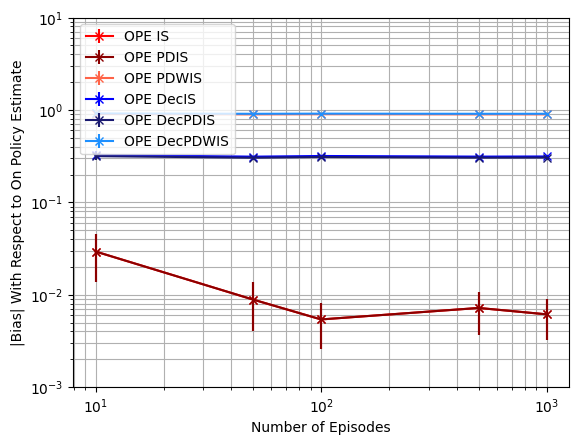

In [ ]:
label = 'bias'
plot_graphs(bias_means, bias_stds, label, 10**(-3), 10**1, shorter_D, estimator='IS')

##### Plot Variance

On Policy-----[3.55780576e-03 1.07436582e-03 4.77848678e-04 7.57493173e-05
 5.10322610e-05]
OPE IS-----[0.01643139 0.0025855  0.00155109 0.00044013 0.0002508 ]
OPE PDIS-----[0.01643139 0.0025855  0.00155109 0.00044013 0.0002508 ]
OPE PDWIS-----[1.78383440e-05 2.72582679e-06 1.44961746e-06 3.36607596e-07
 1.93959687e-07]
OPE DecIS-----[6.55883735e-03 1.22506402e-03 7.21862237e-04 1.36371475e-04
 6.90547727e-05]
OPE DecPDIS-----[6.23563134e-03 1.18450416e-03 6.97104395e-04 1.27643395e-04
 5.96378559e-05]
OPE DecPDWIS-----[4.91079393e-06 9.14941730e-07 6.58568636e-07 1.28391177e-07
 5.81905069e-08]


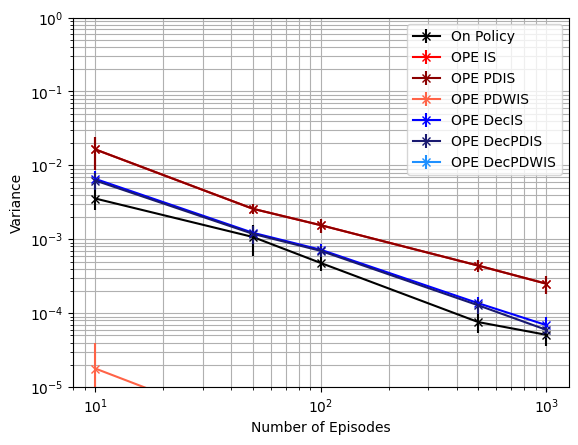

In [ ]:
label = 'var'
plot_graphs(var_means, var_stds, label, 10**(-5), 10**0, shorter_D, estimator='IS')

##### Plot MSE

On Policy-----[3.55780576e-03 1.07436582e-03 4.77848678e-04 7.57493173e-05
 5.10322610e-05]
OPE IS-----[0.01753552 0.00268726 0.00158813 0.00050432 0.00029674]
OPE PDIS-----[0.01753552 0.00268726 0.00158813 0.00050432 0.00029674]
OPE PDWIS-----[0.81433703 0.79988    0.80591017 0.79999197 0.80013023]
OPE DecIS-----[0.11401554 0.09865376 0.10145733 0.09776809 0.09835348]
OPE DecPDIS-----[0.10719363 0.0934587  0.09645202 0.0927207  0.09321997]
OPE DecPDWIS-----[0.83946675 0.82489043 0.83090435 0.82497192 0.82506131]


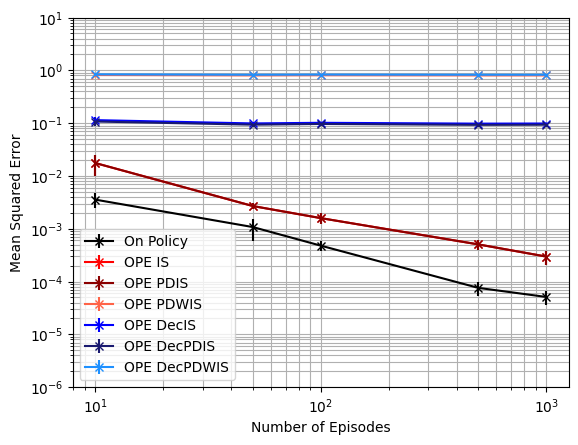

In [ ]:
label = 'MSE'
plot_graphs(MSE_means, MSE_stds, label, 10**(-6), 10**1, shorter_D, estimator='IS')

##### Plot ESS

On Policy-----[  10.   50.  100.  500. 1000.]
OPE IS-----[  2.60516234  20.08313225  32.1146403   84.52166245 222.93578628]
OPE PDIS-----[  2.60516234  20.08313225  32.1146403   84.52166245 222.93578628]
OPE PDWIS-----[  5231.83157423  22373.45497786  34156.01366345 115667.24293385
 277647.76962194]
OPE DecIS-----[  5.82545851  46.06548452  71.06243882 280.52214466 798.44582209]
OPE DecPDIS-----[  5.93040912  46.76074304  72.41138085 299.09255254 909.06515854]
OPE DecPDWIS-----[ 13729.25364431  57430.77262793  75551.92552509 302421.84130926
 896729.20629371]


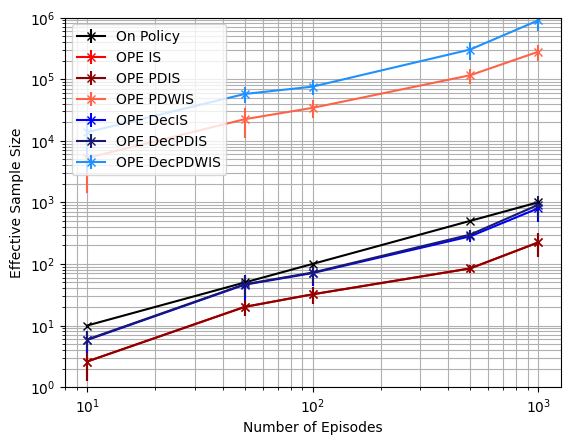

In [ ]:
label = 'ESS'
plot_graphs(ESS_means, ESS_stds, label, 10**(0), 10**6, shorter_D, estimator='IS')

On Policy-----[  10.   50.  100.  500. 1000.]
OPE IS-----[  2.60516234  20.08313225  32.1146403   84.52166245 222.93578628]
OPE PDIS-----[  2.60516234  20.08313225  32.1146403   84.52166245 222.93578628]
OPE PDWIS-----[  5231.83157423  22373.45497786  34156.01366345 115667.24293385
 277647.76962194]
OPE DecIS-----[  5.82545851  46.06548452  71.06243882 280.52214466 798.44582209]
OPE DecPDIS-----[  5.93040912  46.76074304  72.41138085 299.09255254 909.06515854]
OPE DecPDWIS-----[ 13729.25364431  57430.77262793  75551.92552509 302421.84130926
 896729.20629371]


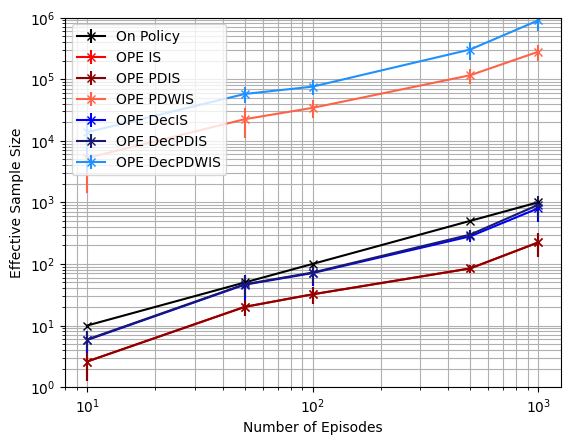

In [ ]:
plot_graphs(ESS_means, ESS_stds, label, 10**(0), 10**6, shorter_D, estimator='PDIS')

### Varying Episode Length $T$ With $\epsilon_{e} = 0.8$ (Policy Divergence $1.6^{T}$)

Set up evaluation policy, generate data and convert into factored format

In [ ]:
EVAL_EPSILON = 0.8

evalPolSoft = np.copy(fullPol)
evalPolSoft[evalPolSoft == 1] = 1 - EVAL_EPSILON
evalPolSoft[evalPolSoft == 0] = EVAL_EPSILON / (n_actions - 1)

In [ ]:
# Calculate policy divergence from Voloshin et al.
D = 0
for state in range(randPol.shape[0] - 1):
    for action in range(randPol.shape[1] - 1):
        difference = evalPolSoft[state, action]/randPol[state, action]
        D = max(D, difference)
print(D)
shorter_D = round(D,2)

1.5999999999999996


In [ ]:
dgen = DataGenerator()
states, actions, lengths, rewards, diab, emp_tx_totals, emp_r_totals = dgen.simulate(
    NSIMSAMPS, NSTEPS, policy=evalPolSoft, policy_idx_type='full',
    p_diabetes=PROB_DIAB, use_tqdm=False) #True, tqdm_desc='Behaviour Policy Simulation')

obs_samps = utils.format_dgen_samps(
    states, actions, rewards, diab, NSTEPS, NSIMSAMPS)

In [ ]:
time = np.arange(NSTEPS)
times = np.stack(axis=0, arrays=[time]*NSIMSAMPS)
times = times[..., np.newaxis]

nf_tr_e = np.concatenate((times, states[:, 0:NSTEPS, :], actions, rewards, states[:, 1:, :]), axis=2)
nf_tr_e.shape

(100000, 20, 5)

In [ ]:
f_tr_e = factorise_dataset(nf_tr_e)

In [ ]:
factored_evalPolSoft = factor_policy(evalPolSoft)

In [ ]:
evalPolSoft = pad_policy(evalPolSoft)

factored_evalPolSoft[0] = pad_policy(factored_evalPolSoft[0])
factored_evalPolSoft[1] = pad_policy(factored_evalPolSoft[1])
factored_evalPolSoft[2] = pad_policy(factored_evalPolSoft[2])

In [ ]:
import policy_estimators as pe
import gc

def evaluate_PE(RUNS, EPISODES, SHORTER_D, STEPS=NSTEPS):

  biases = np.zeros((5, 7))
  variances = np.zeros((5, 7))
  MSEs = np.zeros((5, 7))
  ESSs = np.zeros((5, 7))

  # Reshape data for processing
  T, ldim = nf_tr_b.shape[-2], nf_tr_b.shape[-1]
  nfb = nf_tr_b.reshape((-1, RUNS, EPISODES, T, ldim))
  nfe = nf_tr_e.reshape((-1, RUNS, EPISODES, T, ldim))

  T, D, ldim = f_tr_b.shape[-3], f_tr_b.shape[-2], f_tr_b.shape[-1]
  fb = f_tr_b.reshape((-1, RUNS, EPISODES, T, D, ldim))
  fe = f_tr_e.reshape((-1, RUNS, EPISODES, T, D, ldim))

  for t in range(5):
    print()

    lower_index = 0
    estimates_on_policy = np.zeros(RUNS)
    estimates_OPE_IS = np.zeros(RUNS)
    estimates_OPE_PDIS = np.zeros(RUNS)
    estimates_OPE_PDWIS = np.zeros(RUNS)

    estimates_OPE_DecIS = np.zeros(RUNS)
    estimates_OPE_DecPDIS = np.zeros(RUNS)
    estimates_OPE_DecPDWIS = np.zeros(RUNS)

    for r in range(RUNS):
        #On policy Q estimate
        estimates_on_policy[r] = pe.on_policy_Q_estimate(nfe[t, r, :, :STEPS, :], DISCOUNT_Pol)
        #Off policy IS estimate
        estimates_OPE_IS[r] = pe.off_policy_IS_estimator(nfb[t, r, :, :STEPS, :], DISCOUNT_Pol, randPol, evalPolSoft)
        #Off policy PDIS estimate
        estimates_OPE_PDIS[r] = pe.off_policy_PDIS_estimator(nfb[t, r, :, :STEPS, :], DISCOUNT_Pol, randPol, evalPolSoft)
        #Off policy PDWIS estimate
        estimates_OPE_PDWIS[r] = pe.off_policy_PDWIS_estimator(nfb[t, r, :, :STEPS, :], DISCOUNT_Pol, randPol, evalPolSoft)

        #Factorisation 1----------------------------------

        #Off policy decomposed IS estimate
        estimates_OPE_DecIS[r], _ = pe.off_policy_DecIS_estimator(fb[t, r, :, :STEPS, :, :], DISCOUNT_Pol, [0,1], factored_randPol, factored_evalPolSoft)
        #Off policy decomposed PDIS estimate
        estimates_OPE_DecPDIS[r], _ = pe.off_policy_DecPDIS_estimator(fb[t, r, :, :STEPS, :, :], DISCOUNT_Pol, [0,1], factored_randPol, factored_evalPolSoft)
        #Off policy decomposed PDWIS estimate
        estimates_OPE_DecPDWIS[r], _ = pe.off_policy_DecPDWIS_estimator(fb[t, r, :, :STEPS, :, :], DISCOUNT_Pol, [0,1], factored_randPol, factored_evalPolSoft)


    mean_on_policy = np.mean(estimates_on_policy)
    var_on_policy = np.var(estimates_on_policy, ddof=0)
    print(f'Mean on policy Q estimate: {mean_on_policy}. Variance of on policy Q estimate: {var_on_policy}')

    from sklearn.metrics import mean_squared_error

    #For on policy
    biases[t, 0] = 0.0
    variances[t, 0] = var_on_policy
    MSEs[t, 0] = var_on_policy
    ESSs[t, 0] = EPISODES

    def generate_results(estimates, mean_true, label):
      MSE = mean_squared_error(estimates, [mean_true]*RUNS)
      mean = np.mean(estimates)
      var = np.var(estimates, ddof=0)
      bias1 = np.sqrt(MSE - var)
      bias2 = abs(mean - mean_true)
      print(f'Mean {label} estimate: {mean}. Bias1: {bias1}. Bias2: {bias2}. Variance: {var}. MSE: {MSE}')
      return bias1, var, MSE

    label_list = ['OPE IS', 'OPE PDIS', 'OPE PDWIS',
                  'OPE DecIS', 'OPE DecPDIS', 'OPE DecPDWIS'
                  ]

    estimates = [estimates_OPE_IS, estimates_OPE_PDIS, estimates_OPE_PDWIS,
                estimates_OPE_DecIS, estimates_OPE_DecPDIS, estimates_OPE_DecPDWIS
                ]


    for (id, val) in enumerate(label_list):
      biases[t, 1+id], variances[t, 1+id], MSEs[t, 1+id] = generate_results(estimates[id], mean_on_policy, label_list[id])
      ESSs[t, 1+id] = (EPISODES*variances[t, 0])/variances[t, 1+id]
      gc.collect()

  return np.mean(biases, axis=0), np.std(biases, axis=0), np.mean(variances, axis=0), np.std(variances, axis=0), np.mean(MSEs, axis=0), np.std(MSEs, axis=0), np.mean(ESSs, axis=0), np.std(ESSs, axis=0)

#### Run Everything

In [ ]:
STEPS = [1, 2, 5, 10, 15, 20]

bias_means = np.zeros((len(STEPS), 7))
bias_stds = np.zeros((len(STEPS), 7))
var_means = np.zeros((len(STEPS), 7))
var_stds = np.zeros((len(STEPS), 7))
MSE_means = np.zeros((len(STEPS), 7))
MSE_stds = np.zeros((len(STEPS), 7))
ESS_means = np.zeros((len(STEPS), 7))
ESS_stds = np.zeros((len(STEPS), 7))

RUNS = 20

for id in range(len(STEPS)):
  e = STEPS[id]
  print(f'{e} Steps, {RUNS} ----------------------------------')
  bias_means[id, :], bias_stds[id, :], var_means[id, :], var_stds[id, :], MSE_means[id, :], MSE_stds[id, :], ESS_means[id, :], ESS_stds[id, :] = evaluate_PE(RUNS=RUNS, EPISODES=1000, STEPS=e, SHORTER_D=shorter_D)
  print()
  gc.collect()

print('BIAS MEANS')
print(list(bias_means))
print('\nBIAS STDS')
print(list(bias_stds))
print('\nVAR MEANS')
print(list(var_means))
print('\nVAR STDS')
print(list(var_stds))
print('\nMSE MEANS')
print(list(MSE_means))
print('\nMSE STDS')
print(list(MSE_stds))
print('\nESS MEANS')
print(list(ESS_means))
print('\nESS STDS')
print(list(ESS_stds))

1 Steps, 20 ----------------------------------

Mean on policy Q estimate: -0.24890000000000004. Variance of on policy Q estimate: 0.00018839000000000022
Mean OPE IS estimate: -0.2800114285714286. Bias1: 0.031111428571428536. Bias2: 0.03111142857142854. Variance: 0.000161240685714286. MSE: 0.0011291616734693858
Mean OPE PDIS estimate: -0.2800114285714286. Bias1: 0.031111428571428536. Bias2: 0.03111142857142854. Variance: 0.000161240685714286. MSE: 0.0011291616734693858
Mean OPE PDWIS estimate: -0.2809260556064545. Bias1: 0.03202605560645444. Bias2: 0.03202605560645447. Variance: 0.00017490207949664044. MSE: 0.0012005703172043524
Mean OPE DecIS estimate: -0.19490000000000002. Bias1: 0.05400000000000005. Bias2: 0.05400000000000002. Variance: 8.93400459136822e-05. MSE: 0.003005340045913688
Mean OPE DecPDIS estimate: -0.19490000000000002. Bias1: 0.05400000000000005. Bias2: 0.05400000000000002. Variance: 8.93400459136822e-05. MSE: 0.003005340045913688
Mean OPE DecPDWIS estimate: -0.19496042

#### Plot Graphs

##### Plot Bias

OPE IS-----[0.02842543 0.03060302 0.01909966 0.00784118 0.00644781 0.00537692]
OPE PDIS-----[0.02842543 0.03060302 0.01909966 0.00784118 0.00644781 0.00537692]
OPE PDWIS-----[0.02837369 0.23543386 0.65428698 0.82482701 0.87191935 0.89525671]
OPE DecIS-----[0.05718152 0.13808895 0.26026442 0.30213134 0.31023331 0.31425564]
OPE DecPDIS-----[0.05718152 0.13978532 0.25437822 0.29395895 0.30194901 0.3059751 ]
OPE DecPDWIS-----[0.05720673 0.32095904 0.70720304 0.8526436  0.890434   0.90908567]


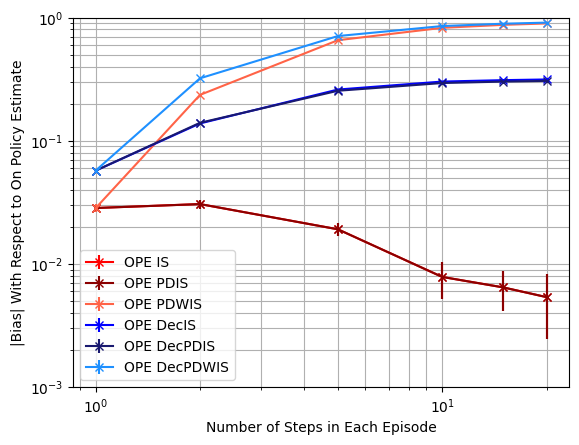

In [ ]:
label = 'bias'
plot_graphs(bias_means, bias_stds, label, 10**(-3), 10**0, shorter_D, estimator='IS')

##### Plot Variance

On Policy-----[1.79812500e-04 2.35524285e-04 1.51749376e-04 7.08990371e-05
 6.34149751e-05 5.44298426e-05]
OPE IS-----[0.00023603 0.00032067 0.00019657 0.00022312 0.00024783 0.0002508 ]
OPE PDIS-----[0.00023603 0.00032067 0.00019657 0.00022312 0.00024783 0.0002508 ]
OPE PDWIS-----[2.25511486e-04 7.62879998e-05 5.29221570e-06 8.43172221e-07
 3.50520361e-07 1.93959687e-07]
OPE DecIS-----[1.06846033e-04 1.43216988e-04 8.51583275e-05 7.15031124e-05
 7.09618008e-05 6.90547727e-05]
OPE DecPDIS-----[1.06846033e-04 1.37336909e-04 7.36249421e-05 6.27140596e-05
 6.14341209e-05 5.96378559e-05]
OPE DecPDWIS-----[1.02552327e-04 3.22792289e-05 2.38068380e-06 3.03816162e-07
 1.10559476e-07 5.81905069e-08]


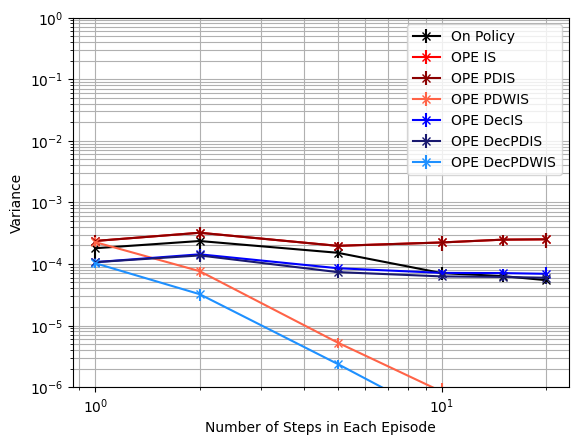

In [ ]:
label = 'var'
plot_graphs(var_means, var_stds, label, 10**(-6), 10**0, shorter_D, estimator='IS')

##### Plot MSE

On Policy-----[1.79812500e-04 2.35524285e-04 1.51749376e-04 7.08990371e-05
 6.34149751e-05 5.44298426e-05]
OPE IS-----[0.00104728 0.00126381 0.00056709 0.00029146 0.00029477 0.00028825]
OPE PDIS-----[0.00104728 0.00126381 0.00056709 0.00029146 0.00029477 0.00028825]
OPE PDWIS-----[0.00103453 0.05551174 0.42810623 0.68034203 0.7602453  0.80148567]
OPE DecIS-----[0.00338064 0.01921924 0.0678296  0.09135723 0.09631645 0.0988275 ]
OPE DecPDIS-----[0.00338064 0.01968502 0.06478982 0.0864765  0.09123502 0.09368127]
OPE DecPDWIS-----[0.00337876 0.10305208 0.50014751 0.72700293 0.79287432 0.82643769]


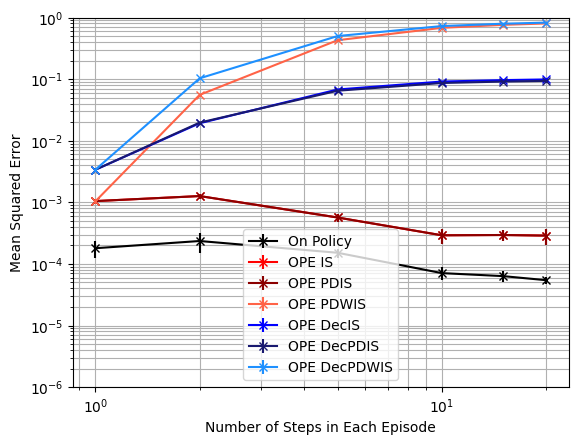

In [ ]:
label = 'MSE'
plot_graphs(MSE_means, MSE_stds, label, 10**(-6), 10**0, shorter_D, estimator='IS')

# From Patient State 136, Without Diabetes



In [ ]:
#The patient has diabetes
PROB_DIAB = 0.0

### State Analysis

In [ ]:
#Instantiate a state based on the idx and get the state vector
testState = State(state_idx = 136, diabetic_idx=0)
vec = testState.get_state_vector()

print(vec)

print(f'Heart Rate: {hr_state_mapping[vec[0]]}')
print(f'Systolic Blood Pressure: {sbp_state_mapping[vec[1]]}')
print(f'Percent Oxygen: {o2_state_mapping[vec[2]]}')
print(f'Glucose Level: {glu_state_mapping[vec[3]]}')
print(f'Antibiotics: {abx_state_mapping[vec[4]]}')
print(f'Vasopressors: {vaso_state_mapping[vec[5]]}')
print(f'Ventilator: {vent_state_mapping[vec[6]]}')
print(f'Diabetes: {testState.diabetic_idx}')

[0 1 1 2 0 0 0]
Heart Rate: Low
Systolic Blood Pressure: Normal
Percent Oxygen: Normal
Glucose Level: Normal
Antibiotics: Off
Vasopressors: Off
Ventilator: Off
Diabetes: 0


### Generate Data From Behaviour Policy

Run the data generator

In [ ]:
dgen = DataGenerator()
states, actions, lengths, rewards, diab, emp_tx_totals, emp_r_totals = dgen.simulate(
    NSIMSAMPS, NSTEPS, policy=randPol, policy_idx_type='full',
    p_diabetes=PROB_DIAB, use_tqdm=False) #True, tqdm_desc='Behaviour Policy Simulation')

obs_samps = utils.format_dgen_samps(
    states, actions, rewards, diab, NSTEPS, NSIMSAMPS)

Convert data into array format

In [ ]:
time = np.arange(NSTEPS)
times = np.stack(axis=0, arrays=[time]*NSIMSAMPS)
times = times[..., np.newaxis]

nf_tr_b = np.concatenate((times, states[:, 0:NSTEPS, :], actions, rewards, states[:, 1:, :]), axis=2)
nf_tr_b.shape

(100000, 20, 5)

In [ ]:
f_tr_b = factorise_dataset(nf_tr_b)

In [ ]:
print(nf_tr_b)

[[[  0. 136.   0.  -1. 168.]
  [  1. 168.  -1.   0.  -1.]
  [  2.  -1.  -1.   0.  -1.]
  ...
  [ 17.  -1.  -1.   0.  -1.]
  [ 18.  -1.  -1.   0.  -1.]
  [ 19.  -1.  -1.   0.  -1.]]

 [[  0. 136.   3.   0. 219.]
  [  1. 219.   5.   0. 222.]
  [  2. 222.   5.   0. 222.]
  ...
  [ 17.  -1.  -1.   0.  -1.]
  [ 18.  -1.  -1.   0.  -1.]
  [ 19.  -1.  -1.   0.  -1.]]

 [[  0. 136.   7.   0. 223.]
  [  1. 223.   5.   0. 142.]
  [  2. 142.   0.   0. 136.]
  ...
  [ 17.  -1.  -1.   0.  -1.]
  [ 18.  -1.  -1.   0.  -1.]
  [ 19.  -1.  -1.   0.  -1.]]

 ...

 [[  0. 136.   0.   0. 136.]
  [  1. 136.   2.   0. 377.]
  [  2. 377.   4.   0. 380.]
  ...
  [ 17.  -1.  -1.   0.  -1.]
  [ 18.  -1.  -1.   0.  -1.]
  [ 19.  -1.  -1.   0.  -1.]]

 [[  0. 136.   6.   0. 141.]
  [  1. 141.   1.  -1. 178.]
  [  2. 178.  -1.   0.  -1.]
  ...
  [ 17.  -1.  -1.   0.  -1.]
  [ 18.  -1.  -1.   0.  -1.]
  [ 19.  -1.  -1.   0.  -1.]]

 [[  0. 136.   4.   0. 140.]
  [  1. 140.   2.   0. 137.]
  [  2. 137.   1.   0.  98

In [ ]:
print(f_tr_b)

[[[[ 0.00000000e+00  1.36000000e+02  1.00000000e+00 -3.33333333e-01
     1.68000000e+02]
   [ 0.00000000e+00  1.36000000e+02  1.00000000e+00 -3.33333333e-01
     1.68000000e+02]
   [ 0.00000000e+00  1.36000000e+02  0.00000000e+00 -3.33333333e-01
     1.68000000e+02]]

  [[ 1.00000000e+00  1.68000000e+02  1.00000000e+00  0.00000000e+00
    -1.00000000e+00]
   [ 1.00000000e+00  1.68000000e+02  1.00000000e+00  0.00000000e+00
    -1.00000000e+00]
   [ 1.00000000e+00  1.68000000e+02  1.00000000e+00  0.00000000e+00
    -1.00000000e+00]]

  [[ 2.00000000e+00 -1.00000000e+00  1.00000000e+00  0.00000000e+00
    -1.00000000e+00]
   [ 2.00000000e+00 -1.00000000e+00  1.00000000e+00  0.00000000e+00
    -1.00000000e+00]
   [ 2.00000000e+00 -1.00000000e+00  1.00000000e+00  0.00000000e+00
    -1.00000000e+00]]

  ...

  [[ 1.70000000e+01 -1.00000000e+00  1.00000000e+00  0.00000000e+00
    -1.00000000e+00]
   [ 1.70000000e+01 -1.00000000e+00  1.00000000e+00  0.00000000e+00
    -1.00000000e+00]
   [ 1.7

In [ ]:
factored_randPol = factor_policy(randPol)

In [ ]:
randPol = pad_policy(randPol)

factored_randPol[0] = pad_policy(factored_randPol[0])
factored_randPol[1] = pad_policy(factored_randPol[1])
factored_randPol[2] = pad_policy(factored_randPol[2])

### Varying Episodes $\epsilon_{e} = 0.0$ (Policy Divergence $8.0^{20}$)

Set up evaluation policy, generate data and convert into factored format

In [ ]:
EVAL_EPSILON = 0.0

evalPolSoft = np.copy(fullPol)
evalPolSoft[evalPolSoft == 1] = 1 - EVAL_EPSILON
evalPolSoft[evalPolSoft == 0] = EVAL_EPSILON / (n_actions - 1)

In [ ]:
# Calculate policy divergence from Voloshin et al.
D = 0
for state in range(randPol.shape[0] - 1):
    for action in range(randPol.shape[1] - 1):
        difference = evalPolSoft[state, action]/randPol[state, action]
        D = max(D, difference)
print(D)
shorter_D = round(D,2)

8.0


In [ ]:
dgen = DataGenerator()
states, actions, lengths, rewards, diab, emp_tx_totals, emp_r_totals = dgen.simulate(
    NSIMSAMPS, NSTEPS, policy=evalPolSoft, policy_idx_type='full',
    p_diabetes=PROB_DIAB, use_tqdm=False) #True, tqdm_desc='Behaviour Policy Simulation')

obs_samps = utils.format_dgen_samps(
    states, actions, rewards, diab, NSTEPS, NSIMSAMPS)

In [ ]:
time = np.arange(NSTEPS)
times = np.stack(axis=0, arrays=[time]*NSIMSAMPS)
times = times[..., np.newaxis]

nf_tr_e = np.concatenate((times, states[:, 0:NSTEPS, :], actions, rewards, states[:, 1:, :]), axis=2)
nf_tr_e.shape

(100000, 20, 5)

In [ ]:
f_tr_e = factorise_dataset(nf_tr_e)

In [ ]:
factored_evalPolSoft = factor_policy(evalPolSoft)

In [ ]:
evalPolSoft = pad_policy(evalPolSoft)

factored_evalPolSoft[0] = pad_policy(factored_evalPolSoft[0])
factored_evalPolSoft[1] = pad_policy(factored_evalPolSoft[1])
factored_evalPolSoft[2] = pad_policy(factored_evalPolSoft[2])

In [ ]:
import policy_estimators as pe
import gc

def evaluate_PE(RUNS, EPISODES, SHORTER_D, STEPS=NSTEPS):

  biases = np.zeros((5, 5))
  variances = np.zeros((5, 5))
  MSEs = np.zeros((5, 5))
  ESSs = np.zeros((5, 5))

  # Reshape data for processing
  T, ldim = nf_tr_b.shape[-2], nf_tr_b.shape[-1]
  nfb = nf_tr_b.reshape((-1, RUNS, EPISODES, T, ldim))
  nfe = nf_tr_e.reshape((-1, RUNS, EPISODES, T, ldim))

  T, D, ldim = f_tr_b.shape[-3], f_tr_b.shape[-2], f_tr_b.shape[-1]
  fb = f_tr_b.reshape((-1, RUNS, EPISODES, T, D, ldim))
  fe = f_tr_e.reshape((-1, RUNS, EPISODES, T, D, ldim))

  for t in range(5):
    print()

    lower_index = 0
    estimates_on_policy = np.zeros(RUNS)
    estimates_OPE_IS = np.zeros(RUNS)
    estimates_OPE_PDIS = np.zeros(RUNS)

    estimates_OPE_DecIS = np.zeros(RUNS)
    estimates_OPE_DecPDIS = np.zeros(RUNS)

    for r in range(RUNS):
        #On policy Q estimate
        estimates_on_policy[r] = pe.on_policy_Q_estimate(nfe[t, r, :, :STEPS, :], DISCOUNT_Pol)
        #Off policy IS estimate
        estimates_OPE_IS[r] = pe.off_policy_IS_estimator(nfb[t, r, :, :STEPS, :], DISCOUNT_Pol, randPol, evalPolSoft)
        #Off policy PDIS estimate
        estimates_OPE_PDIS[r] = pe.off_policy_PDIS_estimator(nfb[t, r, :, :STEPS, :], DISCOUNT_Pol, randPol, evalPolSoft)

        #Factorisation 1----------------------------------

        #Off policy decomposed IS estimate
        estimates_OPE_DecIS[r], _ = pe.off_policy_DecIS_estimator(fb[t, r, :, :STEPS, :, :], DISCOUNT_Pol, [0,1], factored_randPol, factored_evalPolSoft)
        #Off policy decomposed PDIS estimate
        estimates_OPE_DecPDIS[r], _ = pe.off_policy_DecPDIS_estimator(fb[t, r, :, :STEPS, :, :], DISCOUNT_Pol, [0,1], factored_randPol, factored_evalPolSoft)


    mean_on_policy = np.mean(estimates_on_policy)
    var_on_policy = np.var(estimates_on_policy, ddof=0)
    print(f'Mean on policy Q estimate: {mean_on_policy}. Variance of on policy Q estimate: {var_on_policy}')

    from sklearn.metrics import mean_squared_error

    #For on policy
    biases[t, 0] = 0.0
    variances[t, 0] = var_on_policy
    MSEs[t, 0] = var_on_policy
    ESSs[t, 0] = EPISODES

    def generate_results(estimates, mean_true, label):
      MSE = mean_squared_error(estimates, [mean_true]*RUNS)
      mean = np.mean(estimates)
      var = np.var(estimates, ddof=0)
      bias1 = np.sqrt(MSE - var)
      bias2 = abs(mean - mean_true)
      print(f'Mean {label} estimate: {mean}. Bias1: {bias1}. Bias2: {bias2}. Variance: {var}. MSE: {MSE}')
      return bias1, var, MSE

    label_list = ['OPE IS', 'OPE PDIS',
                  'OPE DecIS', 'OPE DecPDIS'
                  ]

    estimates = [estimates_OPE_IS, estimates_OPE_PDIS,
                estimates_OPE_DecIS, estimates_OPE_DecPDIS
                ]


    for (id, val) in enumerate(label_list):
      biases[t, 1+id], variances[t, 1+id], MSEs[t, 1+id] = generate_results(estimates[id], mean_on_policy, label_list[id])
      ESSs[t, 1+id] = (EPISODES*variances[t, 0])/variances[t, 1+id]
      gc.collect()

  return np.mean(biases, axis=0), np.std(biases, axis=0), np.mean(variances, axis=0), np.std(variances, axis=0), np.mean(MSEs, axis=0), np.std(MSEs, axis=0), np.mean(ESSs, axis=0), np.std(ESSs, axis=0)

#### Run Everything

In [ ]:
EPISODES = [10, 50, 100, 500, 1000]

bias_means = np.zeros((len(EPISODES), 5))
bias_stds = np.zeros((len(EPISODES), 5))
var_means = np.zeros((len(EPISODES), 5))
var_stds = np.zeros((len(EPISODES), 5))
MSE_means = np.zeros((len(EPISODES), 5))
MSE_stds = np.zeros((len(EPISODES), 5))
ESS_means = np.zeros((len(EPISODES), 5))
ESS_stds = np.zeros((len(EPISODES), 5))

RUNS = 20

for id in range(len(EPISODES)):
  e = EPISODES[id]
  print(f'{e} Episodes, {RUNS} ----------------------------------')
  bias_means[id, :], bias_stds[id, :], var_means[id, :], var_stds[id, :], MSE_means[id, :], MSE_stds[id, :], ESS_means[id, :], ESS_stds[id, :] = evaluate_PE(RUNS=RUNS, EPISODES=e, SHORTER_D=shorter_D)
  print()
  gc.collect()

print('BIAS MEANS')
print(list(bias_means))
print('\nBIAS STDS')
print(list(bias_stds))
print('\nVAR MEANS')
print(list(var_means))
print('\nVAR STDS')
print(list(var_stds))
print('\nMSE MEANS')
print(list(MSE_means))
print('\nMSE STDS')
print(list(MSE_stds))
print('\nESS MEANS')
print(list(ESS_means))
print('\nESS STDS')
print(list(ESS_stds))

10 Episodes, 20 ----------------------------------

Mean on policy Q estimate: 0.4330669426582305. Variance of on policy Q estimate: 0.03250387605148376
Mean OPE IS estimate: 0.0. Bias1: 0.4330669426582304. Bias2: 0.4330669426582305. Variance: 0.0. MSE: 0.18754697682334703
Mean OPE PDIS estimate: 0.0. Bias1: 0.4330669426582304. Bias2: 0.4330669426582305. Variance: 0.0. MSE: 0.18754697682334703


<ipython-input-100-4a9fa90ff3d5>:79: RuntimeWarning: divide by zero encountered in double_scalars
  ESSs[t, 1+id] = (EPISODES*variances[t, 0])/variances[t, 1+id]
<ipython-input-100-4a9fa90ff3d5>:79: RuntimeWarning: divide by zero encountered in double_scalars
  ESSs[t, 1+id] = (EPISODES*variances[t, 0])/variances[t, 1+id]


Mean OPE DecIS estimate: -0.07828261333333333. Bias1: 0.5113495559915637. Bias2: 0.5113495559915638. Variance: 0.052694169837849615. MSE: 0.314172538250619
Mean OPE DecPDIS estimate: -0.6486305809629822. Bias1: 1.0816975236212127. Bias2: 1.0816975236212127. Variance: 3.048637295711793. MSE: 4.218706828320057

Mean on policy Q estimate: 0.39686565291164433. Variance of on policy Q estimate: 0.018002827436063917
Mean OPE IS estimate: 0.0. Bias1: 0.39686565291164433. Bias2: 0.39686565291164433. Variance: 0.0. MSE: 0.15750234646098574
Mean OPE PDIS estimate: 0.0. Bias1: 0.39686565291164433. Bias2: 0.39686565291164433. Variance: 0.0. MSE: 0.15750234646098574


<ipython-input-100-4a9fa90ff3d5>:79: RuntimeWarning: divide by zero encountered in double_scalars
  ESSs[t, 1+id] = (EPISODES*variances[t, 0])/variances[t, 1+id]
<ipython-input-100-4a9fa90ff3d5>:79: RuntimeWarning: divide by zero encountered in double_scalars
  ESSs[t, 1+id] = (EPISODES*variances[t, 0])/variances[t, 1+id]


Mean OPE DecIS estimate: -0.006666666666666666. Bias1: 0.403532319578311. Bias2: 0.403532319578311. Variance: 0.0008444444444444445. MSE: 0.16368277738869655
Mean OPE DecPDIS estimate: -0.20664427198933327. Bias1: 0.6035099249009778. Bias2: 0.6035099249009777. Variance: 0.24753752059471057. MSE: 0.6117617500486944

Mean on policy Q estimate: 0.38694011847792004. Variance of on policy Q estimate: 0.015634211186176777
Mean OPE IS estimate: 0.0. Bias1: 0.38694011847792004. Bias2: 0.38694011847792004. Variance: 0.0. MSE: 0.1497226552877068
Mean OPE PDIS estimate: 0.0. Bias1: 0.38694011847792004. Bias2: 0.38694011847792004. Variance: 0.0. MSE: 0.1497226552877068


<ipython-input-100-4a9fa90ff3d5>:79: RuntimeWarning: divide by zero encountered in double_scalars
  ESSs[t, 1+id] = (EPISODES*variances[t, 0])/variances[t, 1+id]
<ipython-input-100-4a9fa90ff3d5>:79: RuntimeWarning: divide by zero encountered in double_scalars
  ESSs[t, 1+id] = (EPISODES*variances[t, 0])/variances[t, 1+id]


Mean OPE DecIS estimate: -0.8218957635472981. Bias1: 1.2088358820252167. Bias2: 1.208835882025218. Variance: 11.981777839558063. MSE: 13.443062029229747
Mean OPE DecPDIS estimate: -0.5345823356403157. Bias1: 0.9215224541182341. Bias2: 0.9215224541182356. Variance: 3.761128881964499. MSE: 4.610332515408592

Mean on policy Q estimate: 0.4192218428537767. Variance of on policy Q estimate: 0.014084208772005082
Mean OPE IS estimate: 0.0. Bias1: 0.4192218428537768. Bias2: 0.4192218428537767. Variance: 0.0. MSE: 0.1757469535257167


<ipython-input-100-4a9fa90ff3d5>:79: RuntimeWarning: divide by zero encountered in double_scalars
  ESSs[t, 1+id] = (EPISODES*variances[t, 0])/variances[t, 1+id]
<ipython-input-100-4a9fa90ff3d5>:79: RuntimeWarning: divide by zero encountered in double_scalars
  ESSs[t, 1+id] = (EPISODES*variances[t, 0])/variances[t, 1+id]


Mean OPE PDIS estimate: 0.0. Bias1: 0.4192218428537768. Bias2: 0.4192218428537767. Variance: 0.0. MSE: 0.1757469535257167
Mean OPE DecIS estimate: -0.09121861333333332. Bias1: 0.51044045618711. Bias2: 0.5104404561871101. Variance: 0.07447831988968959. MSE: 0.33502777920219456
Mean OPE DecPDIS estimate: -0.3739436852055466. Bias1: 0.7931655280593234. Bias2: 0.7931655280593233. Variance: 0.7470588171202854. MSE: 1.3761703720219107

Mean on policy Q estimate: 0.4017720096592443. Variance of on policy Q estimate: 0.01705825301479527
Mean OPE IS estimate: 0.0. Bias1: 0.40177200965924426. Bias2: 0.4017720096592443. Variance: 0.0. MSE: 0.16142074774562787
Mean OPE PDIS estimate: 0.0. Bias1: 0.40177200965924426. Bias2: 0.4017720096592443. Variance: 0.0. MSE: 0.16142074774562787


<ipython-input-100-4a9fa90ff3d5>:79: RuntimeWarning: divide by zero encountered in double_scalars
  ESSs[t, 1+id] = (EPISODES*variances[t, 0])/variances[t, 1+id]
<ipython-input-100-4a9fa90ff3d5>:79: RuntimeWarning: divide by zero encountered in double_scalars
  ESSs[t, 1+id] = (EPISODES*variances[t, 0])/variances[t, 1+id]


Mean OPE DecIS estimate: 0.03174928. Bias1: 0.3700227296592443. Bias2: 0.3700227296592443. Variance: 0.05521840949651626. MSE: 0.19213522996099447
Mean OPE DecPDIS estimate: -0.16982791999999997. Bias1: 0.5715999296592443. Bias2: 0.5715999296592442. Variance: 0.05720620024810026. MSE: 0.38393267983455326


/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:233: RuntimeWarning: invalid value encountered in subtract
  x = asanyarray(arr - arrmean)
<ipython-input-100-4a9fa90ff3d5>:79: RuntimeWarning: divide by zero encountered in double_scalars
  ESSs[t, 1+id] = (EPISODES*variances[t, 0])/variances[t, 1+id]



50 Episodes, 20 ----------------------------------

Mean on policy Q estimate: 0.4075733133121632. Variance of on policy Q estimate: 0.0023139021702548094
Mean OPE IS estimate: 0.0. Bias1: 0.4075733133121631. Bias2: 0.4075733133121632. Variance: 0.0. MSE: 0.1661160057242547
Mean OPE PDIS estimate: 0.0. Bias1: 0.4075733133121631. Bias2: 0.4075733133121632. Variance: 0.0. MSE: 0.1661160057242547


<ipython-input-100-4a9fa90ff3d5>:79: RuntimeWarning: divide by zero encountered in double_scalars
  ESSs[t, 1+id] = (EPISODES*variances[t, 0])/variances[t, 1+id]


Mean OPE DecIS estimate: -0.19326287537612624. Bias1: 0.6008361886882896. Bias2: 0.6008361886882894. Variance: 0.5024540731920439. MSE: 0.8634581988295139
Mean OPE DecPDIS estimate: -0.3867257587596356. Bias1: 0.7942990720717991. Bias2: 0.7942990720717988. Variance: 0.2646272610251047. MSE: 0.8955382769192257

Mean on policy Q estimate: 0.41937858760383107. Variance of on policy Q estimate: 0.004592173566366483
Mean OPE IS estimate: 0.0. Bias1: 0.41937858760383107. Bias2: 0.41937858760383107. Variance: 0.0. MSE: 0.1758783997405842
Mean OPE PDIS estimate: 0.0. Bias1: 0.41937858760383107. Bias2: 0.41937858760383107. Variance: 0.0. MSE: 0.1758783997405842


<ipython-input-100-4a9fa90ff3d5>:79: RuntimeWarning: divide by zero encountered in double_scalars
  ESSs[t, 1+id] = (EPISODES*variances[t, 0])/variances[t, 1+id]
<ipython-input-100-4a9fa90ff3d5>:79: RuntimeWarning: divide by zero encountered in double_scalars
  ESSs[t, 1+id] = (EPISODES*variances[t, 0])/variances[t, 1+id]


Mean OPE DecIS estimate: -0.04574077866666666. Bias1: 0.46511936627049777. Bias2: 0.4651193662704977. Variance: 0.006357173940774228. MSE: 0.22269319882064367
Mean OPE DecPDIS estimate: -0.23317158666239995. Bias1: 0.6525501742662311. Bias2: 0.652550174266231. Variance: 0.021031269107940776. MSE: 0.44685299904282927

Mean on policy Q estimate: 0.4004705171186339. Variance of on policy Q estimate: 0.002832796526060613
Mean OPE IS estimate: 0.0. Bias1: 0.4004705171186339. Bias2: 0.4004705171186339. Variance: 0.0. MSE: 0.16037663508126604


<ipython-input-100-4a9fa90ff3d5>:79: RuntimeWarning: divide by zero encountered in double_scalars
  ESSs[t, 1+id] = (EPISODES*variances[t, 0])/variances[t, 1+id]
<ipython-input-100-4a9fa90ff3d5>:79: RuntimeWarning: divide by zero encountered in double_scalars
  ESSs[t, 1+id] = (EPISODES*variances[t, 0])/variances[t, 1+id]


Mean OPE PDIS estimate: 0.0. Bias1: 0.4004705171186339. Bias2: 0.4004705171186339. Variance: 0.0. MSE: 0.16037663508126604
Mean OPE DecIS estimate: -0.17004405562888533. Bias1: 0.5705145727475193. Bias2: 0.5705145727475193. Variance: 0.157298382835174. MSE: 0.4827852605524584
Mean OPE DecPDIS estimate: -0.4160471812247041. Bias1: 0.816517698343338. Bias2: 0.816517698343338. Variance: 0.17642307244352753. MSE: 0.8431242241514297

Mean on policy Q estimate: 0.4074741864349504. Variance of on policy Q estimate: 0.0025664941069963305
Mean OPE IS estimate: 0.0. Bias1: 0.4074741864349505. Bias2: 0.4074741864349504. Variance: 0.0. MSE: 0.16603521261082477
Mean OPE PDIS estimate: 0.0. Bias1: 0.4074741864349505. Bias2: 0.4074741864349504. Variance: 0.0. MSE: 0.16603521261082477
Mean OPE DecIS estimate: -0.13912622096221866. Bias1: 0.5466004073971691. Bias2: 0.5466004073971691. Variance: 0.12164416530682749. MSE: 0.4204161706735787


<ipython-input-100-4a9fa90ff3d5>:79: RuntimeWarning: divide by zero encountered in double_scalars
  ESSs[t, 1+id] = (EPISODES*variances[t, 0])/variances[t, 1+id]
<ipython-input-100-4a9fa90ff3d5>:79: RuntimeWarning: divide by zero encountered in double_scalars
  ESSs[t, 1+id] = (EPISODES*variances[t, 0])/variances[t, 1+id]


Mean OPE DecPDIS estimate: -0.3360655107670186. Bias1: 0.7435396972019691. Bias2: 0.743539697201969. Variance: 0.12523872153514892. MSE: 0.6780900028503448

Mean on policy Q estimate: 0.38697977994056815. Variance of on policy Q estimate: 0.003916365114837053
Mean OPE IS estimate: 0.0. Bias1: 0.38697977994056815. Bias2: 0.38697977994056815. Variance: 0.0. MSE: 0.14975335008285057


<ipython-input-100-4a9fa90ff3d5>:79: RuntimeWarning: divide by zero encountered in double_scalars
  ESSs[t, 1+id] = (EPISODES*variances[t, 0])/variances[t, 1+id]
<ipython-input-100-4a9fa90ff3d5>:79: RuntimeWarning: divide by zero encountered in double_scalars
  ESSs[t, 1+id] = (EPISODES*variances[t, 0])/variances[t, 1+id]


Mean OPE PDIS estimate: 0.0. Bias1: 0.38697977994056815. Bias2: 0.38697977994056815. Variance: 0.0. MSE: 0.14975335008285057
Mean OPE DecIS estimate: -0.194505190340352. Bias1: 0.5814849702809202. Bias2: 0.5814849702809202. Variance: 0.16664785959925804. MSE: 0.5047726302618607
Mean OPE DecPDIS estimate: -0.348537489196928. Bias1: 0.7355172691374962. Bias2: 0.7355172691374962. Variance: 0.12214495355275243. MSE: 0.6631306067522323


/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:233: RuntimeWarning: invalid value encountered in subtract
  x = asanyarray(arr - arrmean)
<ipython-input-100-4a9fa90ff3d5>:79: RuntimeWarning: divide by zero encountered in double_scalars
  ESSs[t, 1+id] = (EPISODES*variances[t, 0])/variances[t, 1+id]
<ipython-input-100-4a9fa90ff3d5>:79: RuntimeWarning: divide by zero encountered in double_scalars
  ESSs[t, 1+id] = (EPISODES*variances[t, 0])/variances[t, 1+id]



100 Episodes, 20 ----------------------------------

Mean on policy Q estimate: 0.4134759504579971. Variance of on policy Q estimate: 0.0014682690052426372
Mean OPE IS estimate: 0.0. Bias1: 0.4134759504579971. Bias2: 0.4134759504579971. Variance: 0.0. MSE: 0.1709623616071441
Mean OPE PDIS estimate: 0.0. Bias1: 0.4134759504579971. Bias2: 0.4134759504579971. Variance: 0.0. MSE: 0.1709623616071441
Mean OPE DecIS estimate: -0.11950182702139649. Bias1: 0.5329777774793936. Bias2: 0.5329777774793936. Variance: 0.12368453222868281. MSE: 0.40774984351555676
Mean OPE DecPDIS estimate: -0.30994867271101784. Bias1: 0.723424623169015. Bias2: 0.7234246231690149. Variance: 0.05771770713237238. MSE: 0.5810608925396037

Mean on policy Q estimate: 0.40397235177679225. Variance of on policy Q estimate: 0.0010227782038644917
Mean OPE IS estimate: 0.0. Bias1: 0.4039723517767922. Bias2: 0.40397235177679225. Variance: 0.0. MSE: 0.16319366100007232


<ipython-input-100-4a9fa90ff3d5>:79: RuntimeWarning: divide by zero encountered in double_scalars
  ESSs[t, 1+id] = (EPISODES*variances[t, 0])/variances[t, 1+id]
<ipython-input-100-4a9fa90ff3d5>:79: RuntimeWarning: divide by zero encountered in double_scalars
  ESSs[t, 1+id] = (EPISODES*variances[t, 0])/variances[t, 1+id]


Mean OPE PDIS estimate: 0.0. Bias1: 0.4039723517767922. Bias2: 0.40397235177679225. Variance: 0.0. MSE: 0.16319366100007232
Mean OPE DecIS estimate: -0.15458513829555198. Bias1: 0.5585574900723442. Bias2: 0.5585574900723442. Variance: 0.0733511019381956. MSE: 0.3853375716541126
Mean OPE DecPDIS estimate: -0.3760563459958613. Bias1: 0.7800286977726535. Bias2: 0.7800286977726536. Variance: 0.08504478792874036. MSE: 0.693489557277642

Mean on policy Q estimate: 0.3954830368421792. Variance of on policy Q estimate: 0.002174066268693656
Mean OPE IS estimate: 0.03168. Bias1: 0.36380303684217924. Bias2: 0.36380303684217924. Variance: 0.0190688256. MSE: 0.15142147521559204
Mean OPE PDIS estimate: 0.03168. Bias1: 0.36380303684217924. Bias2: 0.36380303684217924. Variance: 0.0190688256. MSE: 0.15142147521559204
Mean OPE DecIS estimate: -0.13259045117017598. Bias1: 0.5280734880123552. Bias2: 0.5280734880123552. Variance: 0.040371281649590876. MSE: 0.31923289039112596
Mean OPE DecPDIS estimate: -0.

/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:233: RuntimeWarning: invalid value encountered in subtract
  x = asanyarray(arr - arrmean)




Mean on policy Q estimate: 0.39862191153464527. Variance of on policy Q estimate: 0.000571835341643491
Mean OPE IS estimate: 0.019008. Bias1: 0.37961391153464524. Bias2: 0.37961391153464524. Variance: 0.002047389696. MSE: 0.14615411152663346
Mean OPE PDIS estimate: 0.019008. Bias1: 0.37961391153464524. Bias2: 0.37961391153464524. Variance: 0.002047389696. MSE: 0.14615411152663346
Mean OPE DecIS estimate: -0.12247623239098011. Bias1: 0.5210981439256254. Bias2: 0.5210981439256254. Variance: 0.009993163599469031. MSE: 0.2815364392022008
Mean OPE DecPDIS estimate: -0.3296361098005806. Bias1: 0.7282580213352259. Bias2: 0.7282580213352259. Variance: 0.023568900129237808. MSE: 0.5539286457683362

Mean on policy Q estimate: 0.3953577944303444. Variance of on policy Q estimate: 0.0005633100564040714
Mean OPE IS estimate: 0.03168. Bias1: 0.3636777944303445. Bias2: 0.3636777944303444. Variance: 0.0030108672. MSE: 0.1352724053617199
Mean OPE PDIS estimate: 0.03168. Bias1: 0.3636777944303445. Bia

#### Plot Graphs

In [ ]:
import pickle
import matplotlib.pyplot as plt

def plot_graphs(means, stds, label, low_ylim, up_ylim, D, estimator='IS'):
  EPISODES = [10, 50, 100, 500, 1000]

  ylabels = {
      'bias': '|Bias| With Respect to On Policy Estimate',
      'var': 'Variance',
      'MSE': 'Mean Squared Error',
      'ESS': 'Effective Sample Size'
  }

  colours = {
      'On Policy': 'k',
      'OPE IS': 'r',
      'OPE DecIS': 'b',
      'OPE PDIS': 'darkred',
      'OPE DecPDIS': 'midnightblue',
      'OPE PDWIS': 'tomato',
      'OPE DecPDWIS': 'dodgerblue',
  }

  legend_list = ['OPE IS', 'OPE PDIS',
                  'OPE DecIS', 'OPE DecPDIS'
                  ]
  index_list = [1, 2, 3, 4]

  plt.figure()
  if label != 'bias':
    legend_list.insert(0,'On Policy')
    index_list.insert(0, 0)
  for (id, legend) in zip(index_list, legend_list):
    print(f'{legend}-----{means[:, id]}')
    plt.errorbar(EPISODES, means[:, id], yerr=stds[:, id], color=colours[legend], marker='x')
  plt.yscale("log")
  plt.xscale("log")
  plt.grid(visible=True, which='both', axis='both')
  plt.legend(legend_list)
  plt.xlabel('Number of Episodes')
  plt.ylabel(ylabels[label])
  plt.ylim([low_ylim, up_ylim])
  plt.savefig(f'{label}-sepsis-simulator-{D}.pdf', dpi=300)
  plt.show()


##### Plot Bias

OPE IS-----[0.40757331 0.40437528 0.37961391 0.37482543 0.36563364]
OPE PDIS-----[0.40757331 0.40437528 0.37961391 0.37482543 0.36563364]
OPE DecIS-----[0.60083619 0.5529111  0.52109814 0.48291534 0.47125399]
OPE DecPDIS-----[0.79429907 0.74848478 0.72825802 0.74969609 0.78592169]


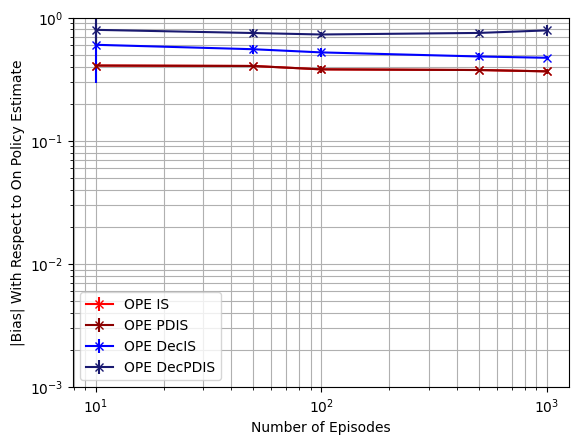

In [ ]:
label = 'bias'
plot_graphs(bias_means, bias_stds, label, 10**-3, 10**0, shorter_D, estimator='IS')

##### Plot Variance

On Policy-----[0.01945668 0.00324435 0.00177108 0.00046884 0.00023627]
OPE IS-----[0.         0.         0.0114413  0.00174229 0.00535089]
OPE PDIS-----[0.         0.         0.0114413  0.00174229 0.00535089]
OPE DecIS-----[2.43300264 0.19088033 0.05619528 0.01082249 0.00293712]
OPE DecPDIS-----[1.57231374 0.14189306 0.13756406 0.03420867 0.10887726]


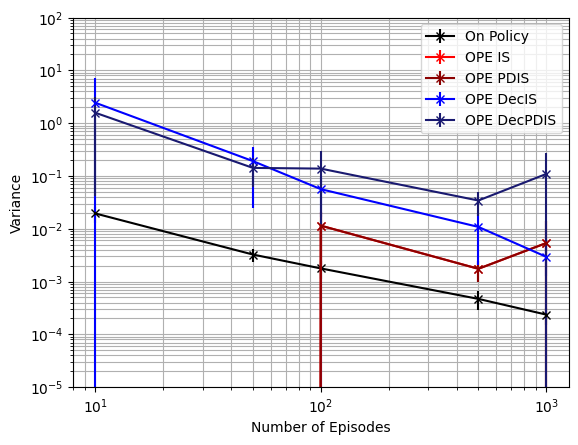

In [ ]:
label = 'var'
plot_graphs(var_means, var_stds, label, 10**(-5), 10**2, shorter_D, estimator='IS')

##### Plot MSE

On Policy-----[0.01945668 0.00324435 0.00177108 0.00046884 0.00023627]
OPE IS-----[0.16638794 0.16363192 0.15617982 0.14226859 0.13937272]
OPE PDIS-----[0.16638794 0.16363192 0.15617982 0.14226859 0.13937272]
OPE DecIS-----[2.88961607 0.49882509 0.32930278 0.24491636 0.22537993]
OPE DecPDIS-----[2.24018083 0.70534722 0.6688037  0.59792399 0.73243207]


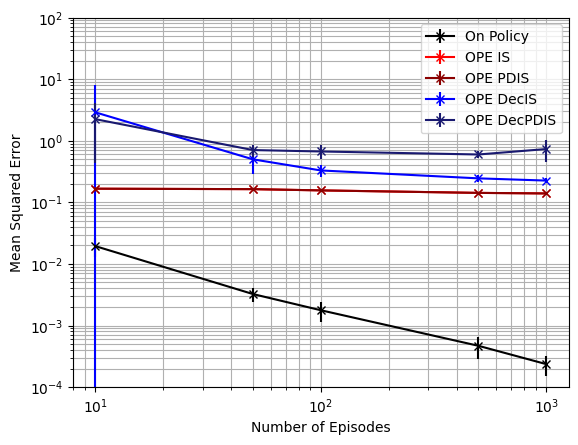

In [ ]:
label = 'MSE'
plot_graphs(MSE_means, MSE_stds, label, 10**(-4), 10**2, shorter_D, estimator='IS')

##### Plot ESS

On Policy-----[  10.   50.  100.  500. 1000.]
OPE IS-----[         inf          inf          inf 145.80646084 210.1831677 ]
OPE PDIS-----[         inf          inf          inf 145.80646084 210.1831677 ]
OPE DecIS-----[44.87062155  7.8957433   8.75582453 35.49791119 93.20040036]
OPE DecPDIS-----[ 0.80917598  2.95706724  2.62532189  8.24482282 12.69579561]


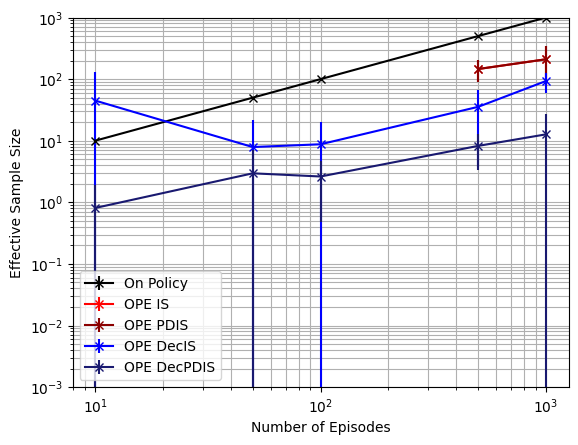

In [ ]:
label = 'ESS'
plot_graphs(ESS_means, ESS_stds, label, 10**(-3), 10**3, shorter_D, estimator='IS')

### Varying Episodes $\epsilon_{e} = 0.2$ (Policy Divergence $6.4^{20}$)

Set up evaluation policy, generate data and convert into factored format

In [ ]:
EVAL_EPSILON = 0.2

evalPolSoft = np.copy(fullPol)
evalPolSoft[evalPolSoft == 1] = 1 - EVAL_EPSILON
evalPolSoft[evalPolSoft == 0] = EVAL_EPSILON / (n_actions - 1)

In [ ]:
# Calculate policy divergence from Voloshin et al.
D = 0
for state in range(randPol.shape[0] - 1):
    for action in range(randPol.shape[1] - 1):
        difference = evalPolSoft[state, action]/randPol[state, action]
        D = max(D, difference)
print(D)
shorter_D = round(D,2)

6.4


In [ ]:
dgen = DataGenerator()
states, actions, lengths, rewards, diab, emp_tx_totals, emp_r_totals = dgen.simulate(
    NSIMSAMPS, NSTEPS, policy=evalPolSoft, policy_idx_type='full',
    p_diabetes=PROB_DIAB, use_tqdm=False) #True, tqdm_desc='Behaviour Policy Simulation')

obs_samps = utils.format_dgen_samps(
    states, actions, rewards, diab, NSTEPS, NSIMSAMPS)

In [ ]:
time = np.arange(NSTEPS)
times = np.stack(axis=0, arrays=[time]*NSIMSAMPS)
times = times[..., np.newaxis]

nf_tr_e = np.concatenate((times, states[:, 0:NSTEPS, :], actions, rewards, states[:, 1:, :]), axis=2)
nf_tr_e.shape

(100000, 20, 5)

In [ ]:
f_tr_e = factorise_dataset(nf_tr_e)

In [ ]:
factored_evalPolSoft = factor_policy(evalPolSoft)

In [ ]:
evalPolSoft = pad_policy(evalPolSoft)

factored_evalPolSoft[0] = pad_policy(factored_evalPolSoft[0])
factored_evalPolSoft[1] = pad_policy(factored_evalPolSoft[1])
factored_evalPolSoft[2] = pad_policy(factored_evalPolSoft[2])

In [ ]:
import policy_estimators as pe
import gc

def evaluate_PE(RUNS, EPISODES, SHORTER_D, STEPS=NSTEPS):

  biases = np.zeros((5, 7))
  variances = np.zeros((5, 7))
  MSEs = np.zeros((5, 7))
  ESSs = np.zeros((5, 7))

  # Reshape data for processing
  T, ldim = nf_tr_b.shape[-2], nf_tr_b.shape[-1]
  nfb = nf_tr_b.reshape((-1, RUNS, EPISODES, T, ldim))
  nfe = nf_tr_e.reshape((-1, RUNS, EPISODES, T, ldim))

  T, D, ldim = f_tr_b.shape[-3], f_tr_b.shape[-2], f_tr_b.shape[-1]
  fb = f_tr_b.reshape((-1, RUNS, EPISODES, T, D, ldim))
  fe = f_tr_e.reshape((-1, RUNS, EPISODES, T, D, ldim))

  for t in range(5):
    print()

    lower_index = 0
    estimates_on_policy = np.zeros(RUNS)
    estimates_OPE_IS = np.zeros(RUNS)
    estimates_OPE_PDIS = np.zeros(RUNS)
    estimates_OPE_PDWIS = np.zeros(RUNS)

    estimates_OPE_DecIS = np.zeros(RUNS)
    estimates_OPE_DecPDIS = np.zeros(RUNS)
    estimates_OPE_DecPDWIS = np.zeros(RUNS)

    for r in range(RUNS):
        #On policy Q estimate
        estimates_on_policy[r] = pe.on_policy_Q_estimate(nfe[t, r, :, :STEPS, :], DISCOUNT_Pol)
        #Off policy IS estimate
        estimates_OPE_IS[r] = pe.off_policy_IS_estimator(nfb[t, r, :, :STEPS, :], DISCOUNT_Pol, randPol, evalPolSoft)
        #Off policy PDIS estimate
        estimates_OPE_PDIS[r] = pe.off_policy_PDIS_estimator(nfb[t, r, :, :STEPS, :], DISCOUNT_Pol, randPol, evalPolSoft)
        #Off policy PDWIS estimate
        estimates_OPE_PDWIS[r] = pe.off_policy_PDWIS_estimator(nfb[t, r, :, :STEPS, :], DISCOUNT_Pol, randPol, evalPolSoft)

        #Factorisation 1----------------------------------

        #Off policy decomposed IS estimate
        estimates_OPE_DecIS[r], _ = pe.off_policy_DecIS_estimator(fb[t, r, :, :STEPS, :, :], DISCOUNT_Pol, [0,1], factored_randPol, factored_evalPolSoft)
        #Off policy decomposed PDIS estimate
        estimates_OPE_DecPDIS[r], _ = pe.off_policy_DecPDIS_estimator(fb[t, r, :, :STEPS, :, :], DISCOUNT_Pol, [0,1], factored_randPol, factored_evalPolSoft)
        #Off policy decomposed PDWIS estimate
        estimates_OPE_DecPDWIS[r], _ = pe.off_policy_DecPDWIS_estimator(fb[t, r, :, :STEPS, :, :], DISCOUNT_Pol, [0,1], factored_randPol, factored_evalPolSoft)


    mean_on_policy = np.mean(estimates_on_policy)
    var_on_policy = np.var(estimates_on_policy, ddof=0)
    print(f'Mean on policy Q estimate: {mean_on_policy}. Variance of on policy Q estimate: {var_on_policy}')

    from sklearn.metrics import mean_squared_error

    #For on policy
    biases[t, 0] = 0.0
    variances[t, 0] = var_on_policy
    MSEs[t, 0] = var_on_policy
    ESSs[t, 0] = EPISODES

    def generate_results(estimates, mean_true, label):
      MSE = mean_squared_error(estimates, [mean_true]*RUNS)
      mean = np.mean(estimates)
      var = np.var(estimates, ddof=0)
      bias1 = np.sqrt(MSE - var)
      bias2 = abs(mean - mean_true)
      print(f'Mean {label} estimate: {mean}. Bias1: {bias1}. Bias2: {bias2}. Variance: {var}. MSE: {MSE}')
      return bias1, var, MSE

    label_list = ['OPE IS', 'OPE PDIS', 'OPE PDWIS',
                  'OPE DecIS', 'OPE DecPDIS', 'OPE DecPDWIS'
                  ]

    estimates = [estimates_OPE_IS, estimates_OPE_PDIS, estimates_OPE_PDWIS,
                estimates_OPE_DecIS, estimates_OPE_DecPDIS, estimates_OPE_DecPDWIS
                ]


    for (id, val) in enumerate(label_list):
      biases[t, 1+id], variances[t, 1+id], MSEs[t, 1+id] = generate_results(estimates[id], mean_on_policy, label_list[id])
      ESSs[t, 1+id] = (EPISODES*variances[t, 0])/variances[t, 1+id]
      gc.collect()

  return np.mean(biases, axis=0), np.std(biases, axis=0), np.mean(variances, axis=0), np.std(variances, axis=0), np.mean(MSEs, axis=0), np.std(MSEs, axis=0), np.mean(ESSs, axis=0), np.std(ESSs, axis=0)

#### Run Everything

In [ ]:
EPISODES = [10, 50, 100, 500, 1000]

bias_means = np.zeros((len(EPISODES), 7))
bias_stds = np.zeros((len(EPISODES), 7))
var_means = np.zeros((len(EPISODES), 7))
var_stds = np.zeros((len(EPISODES), 7))
MSE_means = np.zeros((len(EPISODES), 7))
MSE_stds = np.zeros((len(EPISODES), 7))
ESS_means = np.zeros((len(EPISODES), 7))
ESS_stds = np.zeros((len(EPISODES), 7))

RUNS = 20

for id in range(len(EPISODES)):
  e = EPISODES[id]
  print(f'{e} Episodes, {RUNS} ----------------------------------')
  bias_means[id, :], bias_stds[id, :], var_means[id, :], var_stds[id, :], MSE_means[id, :], MSE_stds[id, :], ESS_means[id, :], ESS_stds[id, :] = evaluate_PE(RUNS=RUNS, EPISODES=e, SHORTER_D=shorter_D)
  print()
  gc.collect()

print('BIAS MEANS')
print(list(bias_means))
print('\nBIAS STDS')
print(list(bias_stds))
print('\nVAR MEANS')
print(list(var_means))
print('\nVAR STDS')
print(list(var_stds))
print('\nMSE MEANS')
print(list(MSE_means))
print('\nMSE STDS')
print(list(MSE_stds))
print('\nESS MEANS')
print(list(ESS_means))
print('\nESS STDS')
print(list(ESS_stds))

10 Episodes, 20 ----------------------------------

Mean on policy Q estimate: -0.11139394212582351. Variance of on policy Q estimate: 0.06972900972621758
Mean OPE IS estimate: -0.024389989802919936. Bias1: 0.08700395232290357. Bias2: 0.08700395232290357. Variance: 0.00048256047706695705. MSE: 0.008052248196873035
Mean OPE PDIS estimate: -0.024389989802919936. Bias1: 0.08700395232290357. Bias2: 0.08700395232290357. Variance: 0.00048256047706695705. MSE: 0.008052248196873035
Mean OPE PDWIS estimate: -0.012389533013880103. Bias1: 0.09900440911194341. Bias2: 0.09900440911194341. Variance: 8.516846396152787e-05. MSE: 0.00988704148756659
Mean OPE DecIS estimate: -0.1336263016523908. Bias1: 0.022232359526567037. Bias2: 0.022232359526567297. Variance: 0.04293209573745968. MSE: 0.043426373547578216
Mean OPE DecPDIS estimate: -0.5859721128382143. Bias1: 0.47457817071239106. Bias2: 0.4745781707123907. Variance: 1.7958400778770005. MSE: 2.02106451799372
Mean OPE DecPDWIS estimate: -0.029360338774

#### Plot Graphs

##### Plot Bias

OPE IS-----[0.06596739 0.14212204 0.15918475 0.10469789 0.07313087]
OPE PDIS-----[0.06596739 0.14212204 0.15918475 0.10469789 0.07313087]
OPE PDWIS-----[0.04648719 0.01912597 0.01023038 0.00576352 0.00519154]
OPE DecIS-----[0.1851902  0.17133891 0.15457488 0.14894166 0.13759931]
OPE DecPDIS-----[0.3748197  0.46749918 0.41169967 0.40149353 0.41806846]
OPE DecPDWIS-----[0.04334045 0.03170454 0.02617885 0.02734675 0.02751324]


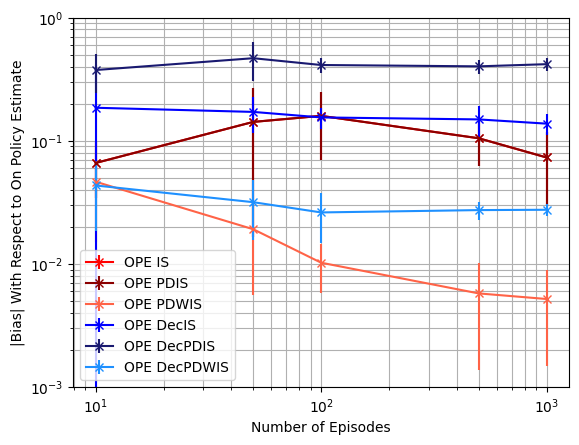

In [ ]:
label = 'bias'
plot_graphs(bias_means, bias_stds, label, 10**-3, 10**0, shorter_D, estimator='IS')

##### Plot Variance

On Policy-----[0.04998553 0.01004236 0.0058715  0.0007885  0.00039826]
OPE IS-----[0.04456544 1.12101667 0.68025888 0.48262391 0.24079084]
OPE PDIS-----[0.04456544 1.12101667 0.68025888 0.48262391 0.24079084]
OPE PDWIS-----[0.0001576  0.00017783 0.00021825 0.00019837 0.0001998 ]
OPE DecIS-----[1.3349035  0.12237588 0.03875971 0.02674769 0.00689013]
OPE DecPDIS-----[0.94771259 0.81649064 0.26064611 0.03557187 0.05134828]
OPE DecPDWIS-----[0.00080604 0.00060531 0.00041154 0.00013773 0.00012627]


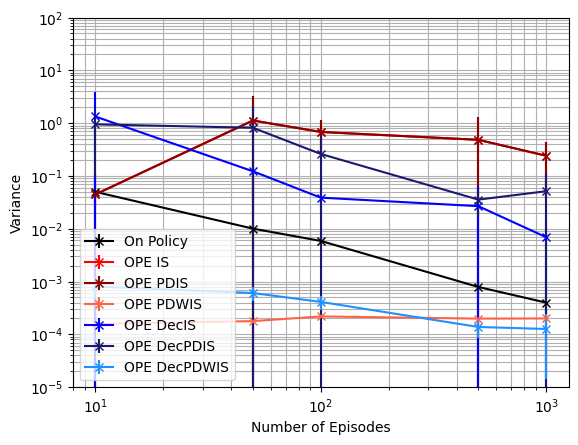

In [ ]:
label = 'var'
plot_graphs(var_means, var_stds, label, 10**(-5), 10**2, shorter_D, estimator='IS')

##### Plot MSE

On Policy-----[0.04998553 0.01004236 0.0058715  0.0007885  0.00039826]
OPE IS-----[0.0499165  1.15696003 0.71360971 0.49536261 0.24806229]
OPE PDIS-----[0.0499165  1.15696003 0.71360971 0.49536261 0.24806229]
OPE PDWIS-----[0.00330897 0.00072678 0.00034227 0.00025084 0.00024049]
OPE DecIS-----[1.42069196 0.15494508 0.06362154 0.05061982 0.02653064]
OPE DecPDIS-----[1.10496995 1.06191971 0.43355892 0.19960561 0.22883703]
OPE DecPDWIS-----[0.00330255 0.00186872 0.00122601 0.00090705 0.00089312]


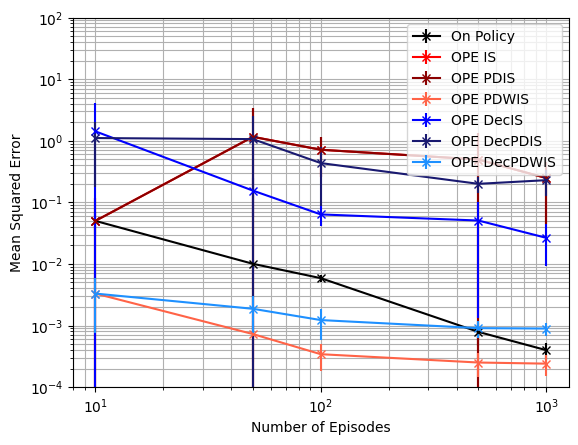

In [ ]:
label = 'MSE'
plot_graphs(MSE_means, MSE_stds, label, 10**(-4), 10**2, shorter_D, estimator='IS')

##### Plot ESS

On Policy-----[  10.   50.  100.  500. 1000.]
OPE IS-----[334.92638976  24.76738835  18.57339136  19.11032436  23.50423219]
OPE PDIS-----[334.92638976  24.76738835  18.57339136  19.11032436  23.50423219]
OPE PDWIS-----[3985.93328134 3462.16294784 3535.70055175 2840.84968515 3204.32250272]
OPE DecIS-----[  7.28339377  25.28628418  31.48313526  55.69484027 127.4922652 ]
OPE DecPDIS-----[ 1.29201563  3.43260913  5.69853597 15.61215865 17.3536278 ]
OPE DecPDWIS-----[ 883.91255822  933.11367169 1575.21302153 3107.13147312 5530.14846125]


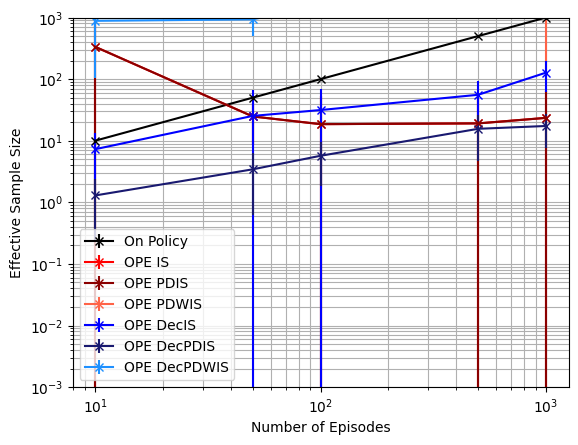

In [ ]:
label = 'ESS'
plot_graphs(ESS_means, ESS_stds, label, 10**(-3), 10**3, shorter_D, estimator='IS')

### Varying Episodes $\epsilon_{e} = 0.4$ (Policy Divergence $4.8^{20}$)

Set up evaluation policy, generate data and convert into factored format

In [ ]:
EVAL_EPSILON = 0.4

evalPolSoft = np.copy(fullPol)
evalPolSoft[evalPolSoft == 1] = 1 - EVAL_EPSILON
evalPolSoft[evalPolSoft == 0] = EVAL_EPSILON / (n_actions - 1)

In [ ]:
# Calculate policy divergence from Voloshin et al.
D = 0
for state in range(randPol.shape[0] - 1):
    for action in range(randPol.shape[1] - 1):
        difference = evalPolSoft[state, action]/randPol[state, action]
        D = max(D, difference)
print(D)
shorter_D = round(D,2)

4.8


In [ ]:
dgen = DataGenerator()
states, actions, lengths, rewards, diab, emp_tx_totals, emp_r_totals = dgen.simulate(
    NSIMSAMPS, NSTEPS, policy=evalPolSoft, policy_idx_type='full',
    p_diabetes=PROB_DIAB, use_tqdm=False) #True, tqdm_desc='Behaviour Policy Simulation')

obs_samps = utils.format_dgen_samps(
    states, actions, rewards, diab, NSTEPS, NSIMSAMPS)

In [ ]:
time = np.arange(NSTEPS)
times = np.stack(axis=0, arrays=[time]*NSIMSAMPS)
times = times[..., np.newaxis]

nf_tr_e = np.concatenate((times, states[:, 0:NSTEPS, :], actions, rewards, states[:, 1:, :]), axis=2)
nf_tr_e.shape

(100000, 20, 5)

In [ ]:
f_tr_e = factorise_dataset(nf_tr_e)

In [ ]:
factored_evalPolSoft = factor_policy(evalPolSoft)

In [ ]:
evalPolSoft = pad_policy(evalPolSoft)

factored_evalPolSoft[0] = pad_policy(factored_evalPolSoft[0])
factored_evalPolSoft[1] = pad_policy(factored_evalPolSoft[1])
factored_evalPolSoft[2] = pad_policy(factored_evalPolSoft[2])

In [ ]:
import policy_estimators as pe
import gc

def evaluate_PE(RUNS, EPISODES, SHORTER_D, STEPS=NSTEPS):

  biases = np.zeros((5, 7))
  variances = np.zeros((5, 7))
  MSEs = np.zeros((5, 7))
  ESSs = np.zeros((5, 7))

  # Reshape data for processing
  T, ldim = nf_tr_b.shape[-2], nf_tr_b.shape[-1]
  nfb = nf_tr_b.reshape((-1, RUNS, EPISODES, T, ldim))
  nfe = nf_tr_e.reshape((-1, RUNS, EPISODES, T, ldim))

  T, D, ldim = f_tr_b.shape[-3], f_tr_b.shape[-2], f_tr_b.shape[-1]
  fb = f_tr_b.reshape((-1, RUNS, EPISODES, T, D, ldim))
  fe = f_tr_e.reshape((-1, RUNS, EPISODES, T, D, ldim))

  for t in range(5):
    print()

    lower_index = 0
    estimates_on_policy = np.zeros(RUNS)
    estimates_OPE_IS = np.zeros(RUNS)
    estimates_OPE_PDIS = np.zeros(RUNS)
    estimates_OPE_PDWIS = np.zeros(RUNS)

    estimates_OPE_DecIS = np.zeros(RUNS)
    estimates_OPE_DecPDIS = np.zeros(RUNS)
    estimates_OPE_DecPDWIS = np.zeros(RUNS)

    for r in range(RUNS):
        #On policy Q estimate
        estimates_on_policy[r] = pe.on_policy_Q_estimate(nfe[t, r, :, :STEPS, :], DISCOUNT_Pol)
        #Off policy IS estimate
        estimates_OPE_IS[r] = pe.off_policy_IS_estimator(nfb[t, r, :, :STEPS, :], DISCOUNT_Pol, randPol, evalPolSoft)
        #Off policy PDIS estimate
        estimates_OPE_PDIS[r] = pe.off_policy_PDIS_estimator(nfb[t, r, :, :STEPS, :], DISCOUNT_Pol, randPol, evalPolSoft)
        #Off policy PDWIS estimate
        estimates_OPE_PDWIS[r] = pe.off_policy_PDWIS_estimator(nfb[t, r, :, :STEPS, :], DISCOUNT_Pol, randPol, evalPolSoft)

        #Factorisation 1----------------------------------

        #Off policy decomposed IS estimate
        estimates_OPE_DecIS[r], _ = pe.off_policy_DecIS_estimator(fb[t, r, :, :STEPS, :, :], DISCOUNT_Pol, [0,1], factored_randPol, factored_evalPolSoft)
        #Off policy decomposed PDIS estimate
        estimates_OPE_DecPDIS[r], _ = pe.off_policy_DecPDIS_estimator(fb[t, r, :, :STEPS, :, :], DISCOUNT_Pol, [0,1], factored_randPol, factored_evalPolSoft)
        #Off policy decomposed PDWIS estimate
        estimates_OPE_DecPDWIS[r], _ = pe.off_policy_DecPDWIS_estimator(fb[t, r, :, :STEPS, :, :], DISCOUNT_Pol, [0,1], factored_randPol, factored_evalPolSoft)


    mean_on_policy = np.mean(estimates_on_policy)
    var_on_policy = np.var(estimates_on_policy, ddof=0)
    print(f'Mean on policy Q estimate: {mean_on_policy}. Variance of on policy Q estimate: {var_on_policy}')

    from sklearn.metrics import mean_squared_error

    #For on policy
    biases[t, 0] = 0.0
    variances[t, 0] = var_on_policy
    MSEs[t, 0] = var_on_policy
    ESSs[t, 0] = EPISODES

    def generate_results(estimates, mean_true, label):
      MSE = mean_squared_error(estimates, [mean_true]*RUNS)
      mean = np.mean(estimates)
      var = np.var(estimates, ddof=0)
      bias1 = np.sqrt(MSE - var)
      bias2 = abs(mean - mean_true)
      print(f'Mean {label} estimate: {mean}. Bias1: {bias1}. Bias2: {bias2}. Variance: {var}. MSE: {MSE}')
      return bias1, var, MSE

    label_list = ['OPE IS', 'OPE PDIS', 'OPE PDWIS',
                  'OPE DecIS', 'OPE DecPDIS', 'OPE DecPDWIS'
                  ]

    estimates = [estimates_OPE_IS, estimates_OPE_PDIS, estimates_OPE_PDWIS,
                estimates_OPE_DecIS, estimates_OPE_DecPDIS, estimates_OPE_DecPDWIS
                ]


    for (id, val) in enumerate(label_list):
      biases[t, 1+id], variances[t, 1+id], MSEs[t, 1+id] = generate_results(estimates[id], mean_on_policy, label_list[id])
      ESSs[t, 1+id] = (EPISODES*variances[t, 0])/variances[t, 1+id]
      gc.collect()

  return np.mean(biases, axis=0), np.std(biases, axis=0), np.mean(variances, axis=0), np.std(variances, axis=0), np.mean(MSEs, axis=0), np.std(MSEs, axis=0), np.mean(ESSs, axis=0), np.std(ESSs, axis=0)

#### Run Everything

In [ ]:
EPISODES = [10, 50, 100, 500, 1000]

bias_means = np.zeros((len(EPISODES), 7))
bias_stds = np.zeros((len(EPISODES), 7))
var_means = np.zeros((len(EPISODES), 7))
var_stds = np.zeros((len(EPISODES), 7))
MSE_means = np.zeros((len(EPISODES), 7))
MSE_stds = np.zeros((len(EPISODES), 7))
ESS_means = np.zeros((len(EPISODES), 7))
ESS_stds = np.zeros((len(EPISODES), 7))

RUNS = 20

for id in range(len(EPISODES)):
  e = EPISODES[id]
  print(f'{e} Episodes, {RUNS} ----------------------------------')
  bias_means[id, :], bias_stds[id, :], var_means[id, :], var_stds[id, :], MSE_means[id, :], MSE_stds[id, :], ESS_means[id, :], ESS_stds[id, :] = evaluate_PE(RUNS=RUNS, EPISODES=e, SHORTER_D=shorter_D)
  print()
  gc.collect()

print('BIAS MEANS')
print(list(bias_means))
print('\nBIAS STDS')
print(list(bias_stds))
print('\nVAR MEANS')
print(list(var_means))
print('\nVAR STDS')
print(list(var_stds))
print('\nMSE MEANS')
print(list(MSE_means))
print('\nMSE STDS')
print(list(MSE_stds))
print('\nESS MEANS')
print(list(ESS_means))
print('\nESS STDS')
print(list(ESS_stds))

10 Episodes, 20 ----------------------------------

Mean on policy Q estimate: -0.36830898254780875. Variance of on policy Q estimate: 0.02955702275305897
Mean OPE IS estimate: -0.1256744857845178. Bias1: 0.242634496763291. Bias2: 0.24263449676329096. Variance: 0.00692870376204521. MSE: 0.06580020278162067
Mean OPE PDIS estimate: -0.1256744857845178. Bias1: 0.242634496763291. Bias2: 0.24263449676329096. Variance: 0.00692870376204521. MSE: 0.06580020278162067
Mean OPE PDWIS estimate: -0.022511473401940624. Bias1: 0.34579750914586815. Bias2: 0.34579750914586815. Variance: 0.00011467691746490105. MSE: 0.11969059424895168
Mean OPE DecIS estimate: -0.21245508529586904. Bias1: 0.15585389725193965. Bias2: 0.1558538972519397. Variance: 0.0504217660322324. MSE: 0.07471220332085056
Mean OPE DecPDIS estimate: -0.5575911325074204. Bias1: 0.18928214995961282. Bias2: 0.18928214995961168. Variance: 0.878116751519874. MSE: 0.9139444838132074
Mean OPE DecPDWIS estimate: -0.029844926722945576. Bias1: 0.

#### Plot Graphs

##### Plot Bias

OPE IS-----[0.12190081 0.14034462 0.32500596 0.07749022 0.05031948]
OPE PDIS-----[0.12190081 0.14034462 0.32500596 0.07749022 0.05031948]
OPE PDWIS-----[0.34966757 0.32904785 0.32263667 0.31630659 0.31775162]
OPE DecIS-----[0.15856822 0.10383888 0.103287   0.10115229 0.11230491]
OPE DecPDIS-----[0.13545567 0.1785313  0.13262769 0.11405806 0.11426927]
OPE DecPDWIS-----[0.34200737 0.31885394 0.31303409 0.30605191 0.30694137]


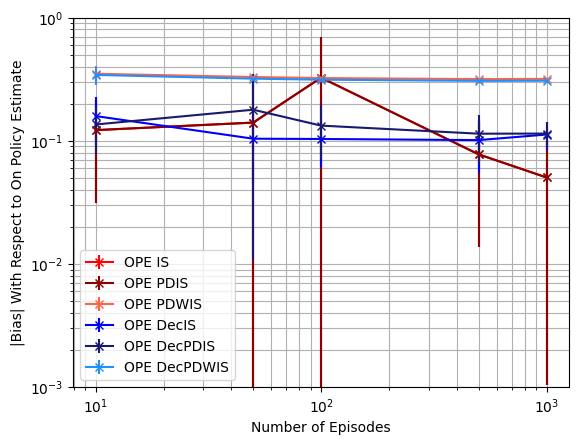

In [ ]:
label = 'bias'
plot_graphs(bias_means, bias_stds, label, 10**-3, 10**0, shorter_D, estimator='IS')

##### Plot Variance

On Policy-----[0.04016728 0.00629695 0.0033326  0.00087047 0.00057998]
OPE IS-----[0.27058778 1.15225562 5.42371073 0.49986452 0.18442529]
OPE PDIS-----[0.27058778 1.15225562 5.42371073 0.49986452 0.18442529]
OPE PDWIS-----[0.00016738 0.00021959 0.00029976 0.00023335 0.00021035]
OPE DecIS-----[0.60269814 0.09518319 0.03729747 0.0296292  0.00865641]
OPE DecPDIS-----[0.54466713 0.88071516 0.25074648 0.02980737 0.02072739]
OPE DecPDWIS-----[3.68717292e-04 2.75930240e-04 1.81569358e-04 5.85309023e-05
 4.27297595e-05]


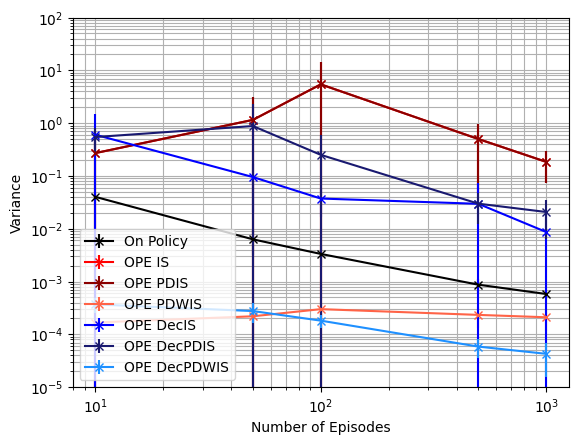

In [ ]:
label = 'var'
plot_graphs(var_means, var_stds, label, 10**(-5), 10**2, shorter_D, estimator='IS')

##### Plot MSE

On Policy-----[0.04016728 0.00629695 0.0033326  0.00087047 0.00057998]
OPE IS-----[0.29365812 1.19871689 5.66987176 0.50993532 0.18938662]
OPE PDIS-----[0.29365812 1.19871689 5.66987176 0.50993532 0.18938662]
OPE PDWIS-----[0.12556707 0.10863215 0.10450276 0.10036381 0.10120387]
OPE DecIS-----[0.63227352 0.10948096 0.04973763 0.0419856  0.02207948]
OPE DecPDIS-----[0.56623437 0.94071327 0.27217959 0.04508472 0.03455456]
OPE DecPDWIS-----[0.12053265 0.10213084 0.09827928 0.09380213 0.09430104]


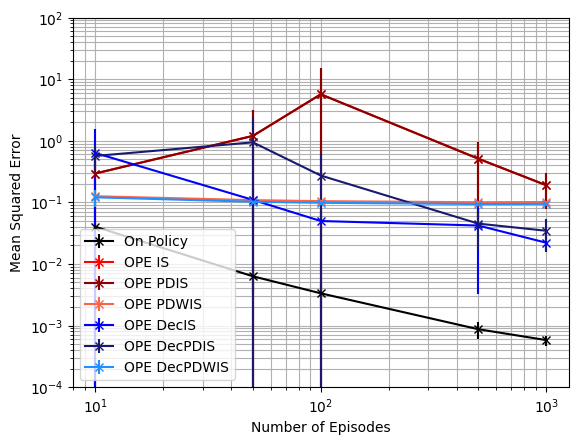

In [ ]:
label = 'MSE'
plot_graphs(MSE_means, MSE_stds, label, 10**(-4), 10**2, shorter_D, estimator='IS')

##### Plot ESS

On Policy-----[  10.   50.  100.  500. 1000.]
OPE IS-----[13.37362132  2.18698554  0.77292178  3.36125584  5.58812676]
OPE PDIS-----[13.37362132  2.18698554  0.77292178  3.36125584  5.58812676]
OPE PDWIS-----[2438.76519016 2256.16255718 1209.53841317 2706.89597026 4027.62330681]
OPE DecIS-----[  3.11008603   5.02533817  12.84310627  66.67687574 165.67763082]
OPE DecPDIS-----[ 0.99721223  1.88451557  3.29331543 28.51342678 37.50057376]
OPE DecPDWIS-----[ 1205.88236052  1147.97019681  2152.65820844  8986.50861263
 18581.26907285]


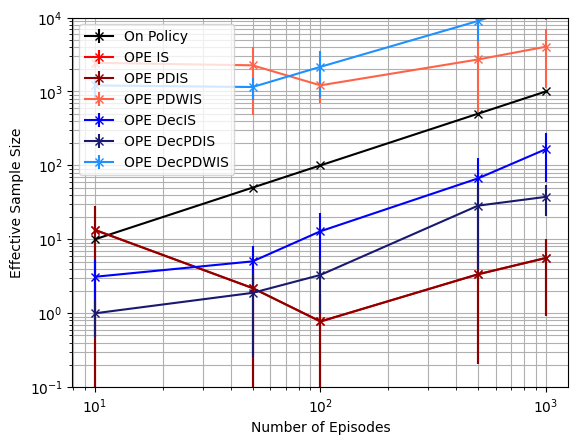

In [ ]:
label = 'ESS'
plot_graphs(ESS_means, ESS_stds, label, 10**(-1), 10**4, shorter_D, estimator='IS')

### Varying Episodes $\epsilon_{e} = 0.6$ (Policy Divergence $3.2^{20}$)

Set up evaluation policy, generate data and convert into factored format

In [ ]:
EVAL_EPSILON = 0.6

evalPolSoft = np.copy(fullPol)
evalPolSoft[evalPolSoft == 1] = 1 - EVAL_EPSILON
evalPolSoft[evalPolSoft == 0] = EVAL_EPSILON / (n_actions - 1)

In [ ]:
# Calculate policy divergence from Voloshin et al.
D = 0
for state in range(randPol.shape[0] - 1):
    for action in range(randPol.shape[1] - 1):
        difference = evalPolSoft[state, action]/randPol[state, action]
        D = max(D, difference)
print(D)
shorter_D = round(D,2)

3.2


In [ ]:
dgen = DataGenerator()
states, actions, lengths, rewards, diab, emp_tx_totals, emp_r_totals = dgen.simulate(
    NSIMSAMPS, NSTEPS, policy=evalPolSoft, policy_idx_type='full',
    p_diabetes=PROB_DIAB, use_tqdm=False) #True, tqdm_desc='Behaviour Policy Simulation')

obs_samps = utils.format_dgen_samps(
    states, actions, rewards, diab, NSTEPS, NSIMSAMPS)

In [ ]:
time = np.arange(NSTEPS)
times = np.stack(axis=0, arrays=[time]*NSIMSAMPS)
times = times[..., np.newaxis]

nf_tr_e = np.concatenate((times, states[:, 0:NSTEPS, :], actions, rewards, states[:, 1:, :]), axis=2)
nf_tr_e.shape

(100000, 20, 5)

In [ ]:
f_tr_e = factorise_dataset(nf_tr_e)

In [ ]:
factored_evalPolSoft = factor_policy(evalPolSoft)

In [ ]:
evalPolSoft = pad_policy(evalPolSoft)

factored_evalPolSoft[0] = pad_policy(factored_evalPolSoft[0])
factored_evalPolSoft[1] = pad_policy(factored_evalPolSoft[1])
factored_evalPolSoft[2] = pad_policy(factored_evalPolSoft[2])

In [ ]:
import policy_estimators as pe
import gc

def evaluate_PE(RUNS, EPISODES, SHORTER_D, STEPS=NSTEPS):

  biases = np.zeros((5, 7))
  variances = np.zeros((5, 7))
  MSEs = np.zeros((5, 7))
  ESSs = np.zeros((5, 7))

  # Reshape data for processing
  T, ldim = nf_tr_b.shape[-2], nf_tr_b.shape[-1]
  nfb = nf_tr_b.reshape((-1, RUNS, EPISODES, T, ldim))
  nfe = nf_tr_e.reshape((-1, RUNS, EPISODES, T, ldim))

  T, D, ldim = f_tr_b.shape[-3], f_tr_b.shape[-2], f_tr_b.shape[-1]
  fb = f_tr_b.reshape((-1, RUNS, EPISODES, T, D, ldim))
  fe = f_tr_e.reshape((-1, RUNS, EPISODES, T, D, ldim))

  for t in range(5):
    print()

    lower_index = 0
    estimates_on_policy = np.zeros(RUNS)
    estimates_OPE_IS = np.zeros(RUNS)
    estimates_OPE_PDIS = np.zeros(RUNS)
    estimates_OPE_PDWIS = np.zeros(RUNS)

    estimates_OPE_DecIS = np.zeros(RUNS)
    estimates_OPE_DecPDIS = np.zeros(RUNS)
    estimates_OPE_DecPDWIS = np.zeros(RUNS)

    for r in range(RUNS):
        #On policy Q estimate
        estimates_on_policy[r] = pe.on_policy_Q_estimate(nfe[t, r, :, :STEPS, :], DISCOUNT_Pol)
        #Off policy IS estimate
        estimates_OPE_IS[r] = pe.off_policy_IS_estimator(nfb[t, r, :, :STEPS, :], DISCOUNT_Pol, randPol, evalPolSoft)
        #Off policy PDIS estimate
        estimates_OPE_PDIS[r] = pe.off_policy_PDIS_estimator(nfb[t, r, :, :STEPS, :], DISCOUNT_Pol, randPol, evalPolSoft)
        #Off policy PDWIS estimate
        estimates_OPE_PDWIS[r] = pe.off_policy_PDWIS_estimator(nfb[t, r, :, :STEPS, :], DISCOUNT_Pol, randPol, evalPolSoft)

        #Factorisation 1----------------------------------

        #Off policy decomposed IS estimate
        estimates_OPE_DecIS[r], _ = pe.off_policy_DecIS_estimator(fb[t, r, :, :STEPS, :, :], DISCOUNT_Pol, [0,1], factored_randPol, factored_evalPolSoft)
        #Off policy decomposed PDIS estimate
        estimates_OPE_DecPDIS[r], _ = pe.off_policy_DecPDIS_estimator(fb[t, r, :, :STEPS, :, :], DISCOUNT_Pol, [0,1], factored_randPol, factored_evalPolSoft)
        #Off policy decomposed PDWIS estimate
        estimates_OPE_DecPDWIS[r], _ = pe.off_policy_DecPDWIS_estimator(fb[t, r, :, :STEPS, :, :], DISCOUNT_Pol, [0,1], factored_randPol, factored_evalPolSoft)


    mean_on_policy = np.mean(estimates_on_policy)
    var_on_policy = np.var(estimates_on_policy, ddof=0)
    print(f'Mean on policy Q estimate: {mean_on_policy}. Variance of on policy Q estimate: {var_on_policy}')

    from sklearn.metrics import mean_squared_error

    #For on policy
    biases[t, 0] = 0.0
    variances[t, 0] = var_on_policy
    MSEs[t, 0] = var_on_policy
    ESSs[t, 0] = EPISODES

    def generate_results(estimates, mean_true, label):
      MSE = mean_squared_error(estimates, [mean_true]*RUNS)
      mean = np.mean(estimates)
      var = np.var(estimates, ddof=0)
      bias1 = np.sqrt(MSE - var)
      bias2 = abs(mean - mean_true)
      print(f'Mean {label} estimate: {mean}. Bias1: {bias1}. Bias2: {bias2}. Variance: {var}. MSE: {MSE}')
      return bias1, var, MSE

    label_list = ['OPE IS', 'OPE PDIS', 'OPE PDWIS',
                  'OPE DecIS', 'OPE DecPDIS', 'OPE DecPDWIS'
                  ]

    estimates = [estimates_OPE_IS, estimates_OPE_PDIS, estimates_OPE_PDWIS,
                estimates_OPE_DecIS, estimates_OPE_DecPDIS, estimates_OPE_DecPDWIS
                ]


    for (id, val) in enumerate(label_list):
      biases[t, 1+id], variances[t, 1+id], MSEs[t, 1+id] = generate_results(estimates[id], mean_on_policy, label_list[id])
      ESSs[t, 1+id] = (EPISODES*variances[t, 0])/variances[t, 1+id]
      gc.collect()

  return np.mean(biases, axis=0), np.std(biases, axis=0), np.mean(variances, axis=0), np.std(variances, axis=0), np.mean(MSEs, axis=0), np.std(MSEs, axis=0), np.mean(ESSs, axis=0), np.std(ESSs, axis=0)

#### Run Everything

In [ ]:
EPISODES = [10, 50, 100, 500, 1000]

bias_means = np.zeros((len(EPISODES), 7))
bias_stds = np.zeros((len(EPISODES), 7))
var_means = np.zeros((len(EPISODES), 7))
var_stds = np.zeros((len(EPISODES), 7))
MSE_means = np.zeros((len(EPISODES), 7))
MSE_stds = np.zeros((len(EPISODES), 7))
ESS_means = np.zeros((len(EPISODES), 7))
ESS_stds = np.zeros((len(EPISODES), 7))

RUNS = 20

for id in range(len(EPISODES)):
  e = EPISODES[id]
  print(f'{e} Episodes, {RUNS} ----------------------------------')
  bias_means[id, :], bias_stds[id, :], var_means[id, :], var_stds[id, :], MSE_means[id, :], MSE_stds[id, :], ESS_means[id, :], ESS_stds[id, :] = evaluate_PE(RUNS=RUNS, EPISODES=e, SHORTER_D=shorter_D)
  print()
  gc.collect()

print('BIAS MEANS')
print(list(bias_means))
print('\nBIAS STDS')
print(list(bias_stds))
print('\nVAR MEANS')
print(list(var_means))
print('\nVAR STDS')
print(list(var_stds))
print('\nMSE MEANS')
print(list(MSE_means))
print('\nMSE STDS')
print(list(MSE_stds))
print('\nESS MEANS')
print(list(ESS_means))
print('\nESS STDS')
print(list(ESS_stds))

10 Episodes, 20 ----------------------------------

Mean on policy Q estimate: -0.5078950626301221. Variance of on policy Q estimate: 0.028590977930633248
Mean OPE IS estimate: -0.36837530868854274. Bias1: 0.1395197539415793. Bias2: 0.13951975394157934. Variance: 0.02835268679603902. MSE: 0.047818448535957854
Mean OPE PDIS estimate: -0.36837530868854274. Bias1: 0.1395197539415793. Bias2: 0.13951975394157934. Variance: 0.02835268679603902. MSE: 0.047818448535957854
Mean OPE PDWIS estimate: -0.031441057126942326. Bias1: 0.47645400550317973. Bias2: 0.47645400550317973. Variance: 9.148144653016094e-05. MSE: 0.22709990080655418
Mean OPE DecIS estimate: -0.3357597257332455. Bias1: 0.17213533689687666. Bias2: 0.1721353368968766. Variance: 0.05679115119318767. MSE: 0.0864217254017889
Mean OPE DecPDIS estimate: -0.5346266043609882. Bias1: 0.026731541730867243. Bias2: 0.026731541730866115. Variance: 0.3144985234092281. MSE: 0.3152130987325372
Mean OPE DecPDWIS estimate: -0.029782354637153563. Bi

#### Plot Graphs

##### Plot Bias

OPE IS-----[0.07780203 0.04125443 0.1276356  0.04547497 0.02378325]
OPE PDIS-----[0.07780203 0.04125443 0.1276356  0.04547497 0.02378325]
OPE PDWIS-----[0.52676392 0.54651817 0.547644   0.55206749 0.55213095]
OPE DecIS-----[0.15883603 0.22900096 0.22758633 0.2389592  0.24424428]
OPE DecPDIS-----[0.04953905 0.07026921 0.07853422 0.0938377  0.09844346]
OPE DecPDWIS-----[0.52904619 0.54697172 0.54839529 0.55200463 0.55204503]


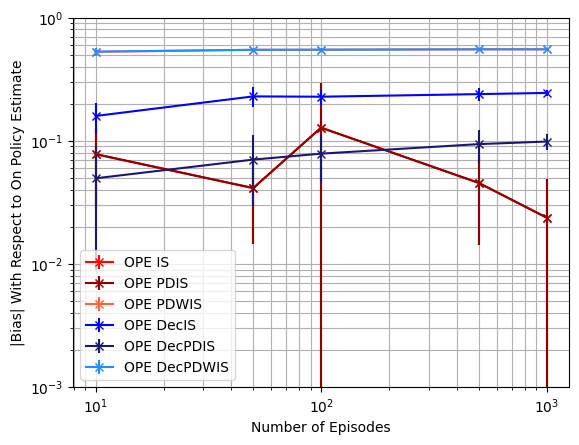

In [ ]:
label = 'bias'
plot_graphs(bias_means, bias_stds, label, 10**(-3), 10**0, shorter_D, estimator='IS')

##### Plot Variance

On Policy-----[0.03146613 0.00761897 0.00353458 0.00087873 0.00036977]
OPE IS-----[0.21380663 0.22383404 1.07805343 0.0979624  0.0363696 ]
OPE PDIS-----[0.21380663 0.22383404 1.07805343 0.0979624  0.0363696 ]
OPE PDWIS-----[1.50018312e-04 1.39947420e-04 1.55691612e-04 1.04973876e-04
 6.44911782e-05]
OPE DecIS-----[0.26843248 0.05290603 0.02391257 0.00893443 0.00334451]
OPE DecPDIS-----[0.26966659 0.193829   0.06008256 0.00884037 0.00472647]
OPE DecPDWIS-----[1.39497532e-04 8.87059818e-05 4.86587808e-05 1.32775566e-05
 7.45504221e-06]


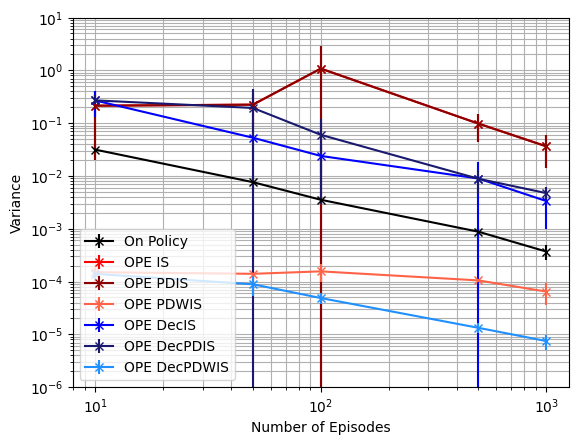

In [ ]:
label = 'var'
plot_graphs(var_means, var_stds, label, 10**(-6), 10**1, shorter_D, estimator='IS')

##### Plot MSE

On Policy-----[0.03146613 0.00761897 0.00353458 0.00087873 0.00036977]
OPE IS-----[0.22221894 0.22625754 1.12207876 0.10100799 0.03756534]
OPE PDIS-----[0.22221894 0.22625754 1.12207876 0.10100799 0.03756534]
OPE PDWIS-----[0.27917193 0.29933566 0.30023842 0.30494741 0.30494765]
OPE DecIS-----[0.2955936  0.10709893 0.07688781 0.06678921 0.06322329]
OPE DecPDIS-----[0.27377655 0.20043084 0.06729273 0.01843004 0.01463123]
OPE DecPDWIS-----[0.28168552 0.29979192 0.30098095 0.30479427 0.30478855]


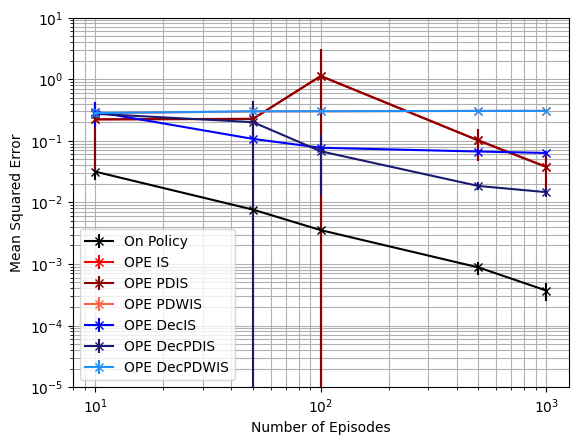

In [ ]:
label = 'MSE'
plot_graphs(MSE_means, MSE_stds, label, 10**(-5), 10**1, shorter_D, estimator='IS')

##### Plot ESS

On Policy-----[  10.   50.  100.  500. 1000.]
OPE IS-----[ 3.60242624  3.69443597  2.41029406  6.07965665 12.27236705]
OPE PDIS-----[ 3.60242624  3.69443597  2.41029406  6.07965665 12.27236705]
OPE PDWIS-----[2436.39028124 4337.57703713 2663.53157297 4955.14652497 6465.44470462]
OPE DecIS-----[  1.92968712  11.82554781  21.21522726  78.37631507 138.6577155 ]
OPE DecPDIS-----[ 1.26301594 10.15898324  9.86877089 55.49357627 84.73195199]
OPE DecPDWIS-----[ 2478.95749933  5838.04602064  7571.02397446 34043.21340939
 57240.62561616]


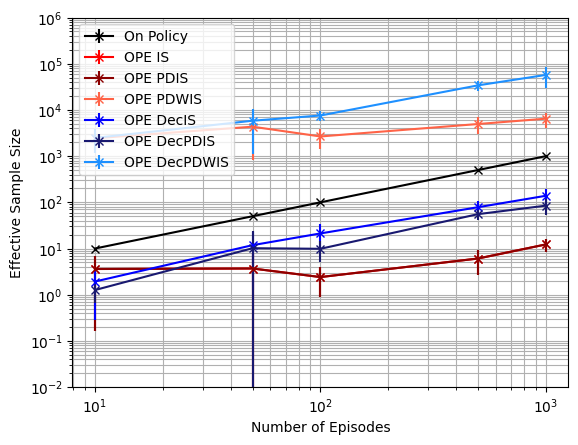

In [ ]:
label = 'ESS'
plot_graphs(ESS_means, ESS_stds, label, 10**(-2), 10**6, shorter_D, estimator='IS')

### Varying Episodes $\epsilon_{e} = 0.8$ (Policy Divergence $1.6^{20}$)



Set up evaluation policy, generate data and convert into factored format

In [ ]:
EVAL_EPSILON = 0.8

evalPolSoft = np.copy(fullPol)
evalPolSoft[evalPolSoft == 1] = 1 - EVAL_EPSILON
evalPolSoft[evalPolSoft == 0] = EVAL_EPSILON / (n_actions - 1)

In [ ]:
# Calculate policy divergence from Voloshin et al.
D = 0
for state in range(randPol.shape[0] - 1):
    for action in range(randPol.shape[1] - 1):
        difference = evalPolSoft[state, action]/randPol[state, action]
        D = max(D, difference)
print(D)
shorter_D = round(D,2)

1.5999999999999996


In [ ]:
dgen = DataGenerator()
states, actions, lengths, rewards, diab, emp_tx_totals, emp_r_totals = dgen.simulate(
    NSIMSAMPS, NSTEPS, policy=evalPolSoft, policy_idx_type='full',
    p_diabetes=PROB_DIAB, use_tqdm=False) #True, tqdm_desc='Behaviour Policy Simulation')

obs_samps = utils.format_dgen_samps(
    states, actions, rewards, diab, NSTEPS, NSIMSAMPS)

In [ ]:
time = np.arange(NSTEPS)
times = np.stack(axis=0, arrays=[time]*NSIMSAMPS)
times = times[..., np.newaxis]

nf_tr_e = np.concatenate((times, states[:, 0:NSTEPS, :], actions, rewards, states[:, 1:, :]), axis=2)
nf_tr_e.shape

(100000, 20, 5)

In [ ]:
f_tr_e = factorise_dataset(nf_tr_e)

In [ ]:
factored_evalPolSoft = factor_policy(evalPolSoft)

In [ ]:
evalPolSoft = pad_policy(evalPolSoft)

factored_evalPolSoft[0] = pad_policy(factored_evalPolSoft[0])
factored_evalPolSoft[1] = pad_policy(factored_evalPolSoft[1])
factored_evalPolSoft[2] = pad_policy(factored_evalPolSoft[2])

In [ ]:
import policy_estimators as pe
import gc

def evaluate_PE(RUNS, EPISODES, SHORTER_D, STEPS=NSTEPS):

  biases = np.zeros((5, 7))
  variances = np.zeros((5, 7))
  MSEs = np.zeros((5, 7))
  ESSs = np.zeros((5, 7))

  # Reshape data for processing
  T, ldim = nf_tr_b.shape[-2], nf_tr_b.shape[-1]
  nfb = nf_tr_b.reshape((-1, RUNS, EPISODES, T, ldim))
  nfe = nf_tr_e.reshape((-1, RUNS, EPISODES, T, ldim))

  T, D, ldim = f_tr_b.shape[-3], f_tr_b.shape[-2], f_tr_b.shape[-1]
  fb = f_tr_b.reshape((-1, RUNS, EPISODES, T, D, ldim))
  fe = f_tr_e.reshape((-1, RUNS, EPISODES, T, D, ldim))

  for t in range(5):
    print()

    lower_index = 0
    estimates_on_policy = np.zeros(RUNS)
    estimates_OPE_IS = np.zeros(RUNS)
    estimates_OPE_PDIS = np.zeros(RUNS)
    estimates_OPE_PDWIS = np.zeros(RUNS)

    estimates_OPE_DecIS = np.zeros(RUNS)
    estimates_OPE_DecPDIS = np.zeros(RUNS)
    estimates_OPE_DecPDWIS = np.zeros(RUNS)

    for r in range(RUNS):
        #On policy Q estimate
        estimates_on_policy[r] = pe.on_policy_Q_estimate(nfe[t, r, :, :STEPS, :], DISCOUNT_Pol)
        #Off policy IS estimate
        estimates_OPE_IS[r] = pe.off_policy_IS_estimator(nfb[t, r, :, :STEPS, :], DISCOUNT_Pol, randPol, evalPolSoft)
        #Off policy PDIS estimate
        estimates_OPE_PDIS[r] = pe.off_policy_PDIS_estimator(nfb[t, r, :, :STEPS, :], DISCOUNT_Pol, randPol, evalPolSoft)
        #Off policy PDWIS estimate
        estimates_OPE_PDWIS[r] = pe.off_policy_PDWIS_estimator(nfb[t, r, :, :STEPS, :], DISCOUNT_Pol, randPol, evalPolSoft)

        #Factorisation 1----------------------------------

        #Off policy decomposed IS estimate
        estimates_OPE_DecIS[r], _ = pe.off_policy_DecIS_estimator(fb[t, r, :, :STEPS, :, :], DISCOUNT_Pol, [0,1], factored_randPol, factored_evalPolSoft)
        #Off policy decomposed PDIS estimate
        estimates_OPE_DecPDIS[r], _ = pe.off_policy_DecPDIS_estimator(fb[t, r, :, :STEPS, :, :], DISCOUNT_Pol, [0,1], factored_randPol, factored_evalPolSoft)
        #Off policy decomposed PDWIS estimate
        estimates_OPE_DecPDWIS[r], _ = pe.off_policy_DecPDWIS_estimator(fb[t, r, :, :STEPS, :, :], DISCOUNT_Pol, [0,1], factored_randPol, factored_evalPolSoft)


    mean_on_policy = np.mean(estimates_on_policy)
    var_on_policy = np.var(estimates_on_policy, ddof=0)
    print(f'Mean on policy Q estimate: {mean_on_policy}. Variance of on policy Q estimate: {var_on_policy}')

    from sklearn.metrics import mean_squared_error

    #For on policy
    biases[t, 0] = 0.0
    variances[t, 0] = var_on_policy
    MSEs[t, 0] = var_on_policy
    ESSs[t, 0] = EPISODES

    def generate_results(estimates, mean_true, label):
      MSE = mean_squared_error(estimates, [mean_true]*RUNS)
      mean = np.mean(estimates)
      var = np.var(estimates, ddof=0)
      bias1 = np.sqrt(MSE - var)
      bias2 = abs(mean - mean_true)
      print(f'Mean {label} estimate: {mean}. Bias1: {bias1}. Bias2: {bias2}. Variance: {var}. MSE: {MSE}')
      return bias1, var, MSE

    label_list = ['OPE IS', 'OPE PDIS', 'OPE PDWIS',
                  'OPE DecIS', 'OPE DecPDIS', 'OPE DecPDWIS'
                  ]

    estimates = [estimates_OPE_IS, estimates_OPE_PDIS, estimates_OPE_PDWIS,
                estimates_OPE_DecIS, estimates_OPE_DecPDIS, estimates_OPE_DecPDWIS
                ]


    for (id, val) in enumerate(label_list):
      biases[t, 1+id], variances[t, 1+id], MSEs[t, 1+id] = generate_results(estimates[id], mean_on_policy, label_list[id])
      ESSs[t, 1+id] = (EPISODES*variances[t, 0])/variances[t, 1+id]
      gc.collect()

  return np.mean(biases, axis=0), np.std(biases, axis=0), np.mean(variances, axis=0), np.std(variances, axis=0), np.mean(MSEs, axis=0), np.std(MSEs, axis=0), np.mean(ESSs, axis=0), np.std(ESSs, axis=0)

#### Run Everything

In [ ]:
EPISODES = [10, 50, 100, 500, 1000]

bias_means = np.zeros((len(EPISODES), 7))
bias_stds = np.zeros((len(EPISODES), 7))
var_means = np.zeros((len(EPISODES), 7))
var_stds = np.zeros((len(EPISODES), 7))
MSE_means = np.zeros((len(EPISODES), 7))
MSE_stds = np.zeros((len(EPISODES), 7))
ESS_means = np.zeros((len(EPISODES), 7))
ESS_stds = np.zeros((len(EPISODES), 7))

RUNS = 20

for id in range(len(EPISODES)):
  e = EPISODES[id]
  print(f'{e} Episodes, {RUNS} ----------------------------------')
  bias_means[id, :], bias_stds[id, :], var_means[id, :], var_stds[id, :], MSE_means[id, :], MSE_stds[id, :], ESS_means[id, :], ESS_stds[id, :] = evaluate_PE(RUNS=RUNS, EPISODES=e, SHORTER_D=shorter_D)
  print()
  gc.collect()

print('BIAS MEANS')
print(list(bias_means))
print('\nBIAS STDS')
print(list(bias_stds))
print('\nVAR MEANS')
print(list(var_means))
print('\nVAR STDS')
print(list(var_stds))
print('\nMSE MEANS')
print(list(MSE_means))
print('\nMSE STDS')
print(list(MSE_stds))
print('\nESS MEANS')
print(list(ESS_means))
print('\nESS STDS')
print(list(ESS_stds))

10 Episodes, 20 ----------------------------------

Mean on policy Q estimate: -0.6989334944119829. Variance of on policy Q estimate: 0.035636606340964425
Mean OPE IS estimate: -0.6931728604669243. Bias1: 0.005760633945058485. Bias2: 0.0057606339450586574. Variance: 0.022219830306937617. MSE: 0.022253015210386577
Mean OPE PDIS estimate: -0.6931728604669243. Bias1: 0.005760633945058485. Bias2: 0.0057606339450586574. Variance: 0.022219830306937617. MSE: 0.022253015210386577
Mean OPE PDWIS estimate: -0.03795492868574648. Bias1: 0.6609785657262364. Bias2: 0.6609785657262365. Variance: 5.350655070889503e-05. MSE: 0.43694617090022153
Mean OPE DecIS estimate: -0.4816748275602186. Bias1: 0.21725866685176431. Bias2: 0.21725866685176431. Variance: 0.012775253449246005. MSE: 0.05997658177145192
Mean OPE DecPDIS estimate: -0.5180203438070304. Bias1: 0.18091315060495267. Bias2: 0.1809131506049525. Variance: 0.017028584720995887. MSE: 0.049758152782806174
Mean OPE DecPDWIS estimate: -0.0276116529560

#### Plot Graphs

##### Plot Bias

OPE IS-----[0.05079262 0.02094723 0.00964854 0.00555502 0.00188788]
OPE PDIS-----[0.05079262 0.02094723 0.00964854 0.00555502 0.00188788]
OPE PDWIS-----[0.67381316 0.70679064 0.71012061 0.708303   0.71036419]
OPE DecIS-----[0.23365651 0.26932041 0.27289376 0.27116326 0.27384182]
OPE DecPDIS-----[0.19813306 0.22813617 0.23229119 0.22951891 0.23250567]
OPE DecPDWIS-----[0.68437373 0.71738107 0.72055325 0.71852818 0.72069701]


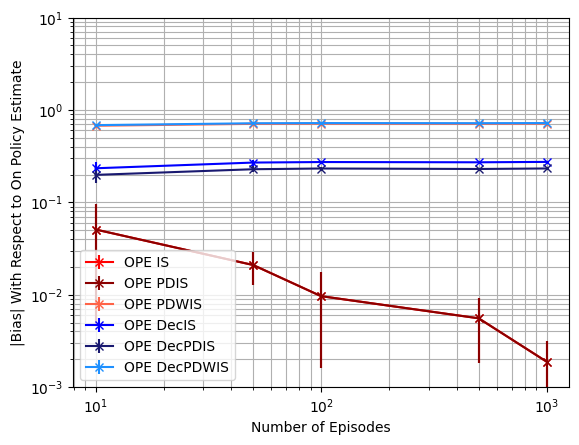

In [ ]:
label = 'bias'
plot_graphs(bias_means, bias_stds, label, 10**(-3), 10**1, shorter_D, estimator='IS')

##### Plot Variance

On Policy-----[0.03264041 0.00400839 0.00222956 0.00047647 0.00024592]
OPE IS-----[0.03340013 0.00906076 0.00444966 0.00099364 0.00050368]
OPE PDIS-----[0.03340013 0.00906076 0.00444966 0.00099364 0.00050368]
OPE PDWIS-----[6.59564735e-05 1.47576247e-05 7.23447604e-06 1.79004399e-06
 1.03844442e-06]
OPE DecIS-----[0.01983474 0.00351261 0.00180817 0.00034812 0.00019533]
OPE DecPDIS-----[0.01953222 0.00370088 0.00190259 0.00035191 0.00020939]
OPE DecPDWIS-----[3.33850180e-05 6.13653494e-06 3.38003427e-06 5.27442359e-07
 3.46453731e-07]


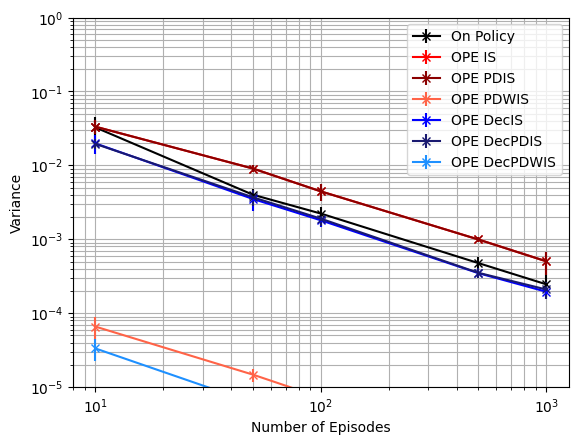

In [ ]:
label = 'var'
plot_graphs(var_means, var_stds, label, 10**(-5), 10**0, shorter_D, estimator='IS')

##### Plot MSE

On Policy-----[0.03264041 0.00400839 0.00222956 0.00047647 0.00024592]
OPE IS-----[0.03809744 0.00956475 0.00460744 0.00103842 0.00050879]
OPE PDIS-----[0.03809744 0.00956475 0.00460744 0.00103842 0.00050879]
OPE PDWIS-----[0.45458404 0.49987041 0.50436511 0.50170719 0.50462928]
OPE DecIS-----[0.07589769 0.07646014 0.07632563 0.07390575 0.07522206]
OPE DecPDIS-----[0.05999849 0.05605949 0.05589712 0.05305766 0.05430721]
OPE DecPDWIS-----[0.46886497 0.51494259 0.51928829 0.51629657 0.51941645]


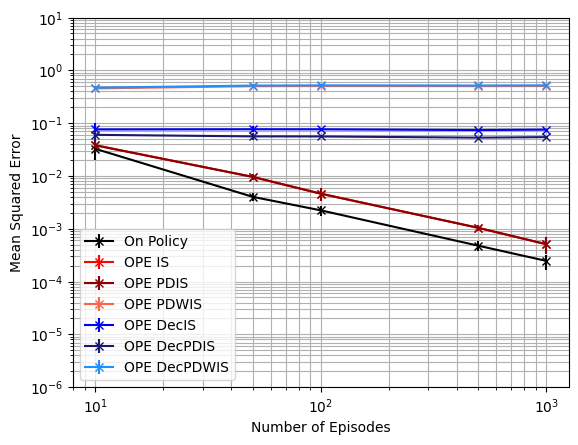

In [ ]:
label = 'MSE'
plot_graphs(MSE_means, MSE_stds, label, 10**(-6), 10**1, shorter_D, estimator='IS')

##### Plot ESS

On Policy-----[  10.   50.  100.  500. 1000.]
OPE IS-----[ 10.61054119  22.09757005  53.36457933 238.849857   505.24543119]
OPE PDIS-----[ 10.61054119  22.09757005  53.36457933 238.849857   505.24543119]
OPE PDWIS-----[  6831.35809881  13727.98574468  30778.54254248 136523.92826033
 249660.20749168]
OPE DecIS-----[  17.72366837   63.00920842  129.19259537  684.76544961 1306.08470287]
OPE DecPDIS-----[  16.6465493    59.8028381   123.37431999  674.95812752 1310.7910569 ]
OPE DecPDWIS-----[ 10962.40541749  36173.9166342   69062.48748302 467280.47871143
 839875.38793803]


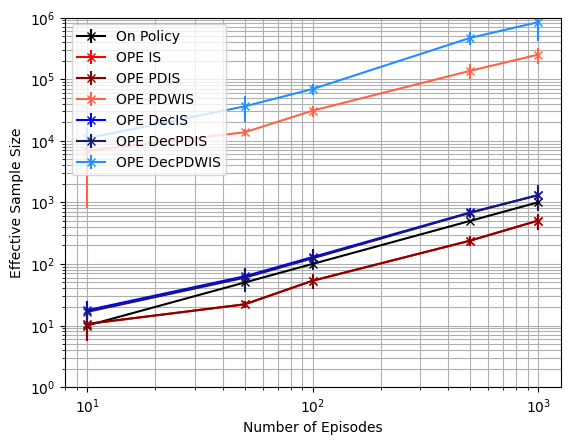

In [ ]:
label = 'ESS'
plot_graphs(ESS_means, ESS_stds, label, 10**(0), 10**6, shorter_D, estimator='IS')

On Policy-----[  10.   50.  100.  500. 1000.]
OPE IS-----[ 10.61054119  22.09757005  53.36457933 238.849857   505.24543119]
OPE PDIS-----[ 10.61054119  22.09757005  53.36457933 238.849857   505.24543119]
OPE PDWIS-----[  6831.35809881  13727.98574468  30778.54254248 136523.92826033
 249660.20749168]
OPE DecIS-----[  17.72366837   63.00920842  129.19259537  684.76544961 1306.08470287]
OPE DecPDIS-----[  16.6465493    59.8028381   123.37431999  674.95812752 1310.7910569 ]
OPE DecPDWIS-----[ 10962.40541749  36173.9166342   69062.48748302 467280.47871143
 839875.38793803]


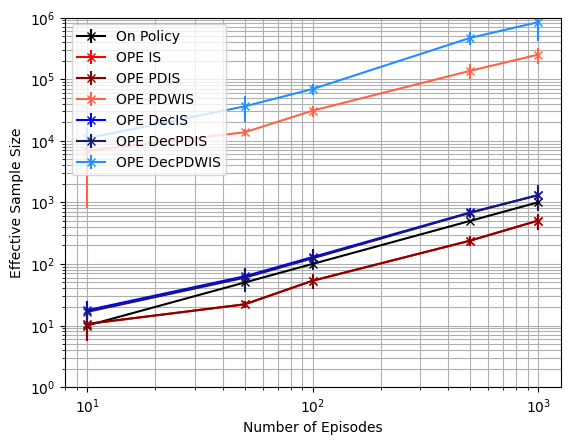

In [ ]:
plot_graphs(ESS_means, ESS_stds, label, 10**(0), 10**6, shorter_D, estimator='PDIS')

### Varying Episode Length $T$ With $\epsilon_{e} = 0.8$ (Policy Divergence $1.6^{T}$)

Set up evaluation policy, generate data and convert into factored format

In [ ]:
EVAL_EPSILON = 0.8

evalPolSoft = np.copy(fullPol)
evalPolSoft[evalPolSoft == 1] = 1 - EVAL_EPSILON
evalPolSoft[evalPolSoft == 0] = EVAL_EPSILON / (n_actions - 1)

In [ ]:
# Calculate policy divergence from Voloshin et al.
D = 0
for state in range(randPol.shape[0] - 1):
    for action in range(randPol.shape[1] - 1):
        difference = evalPolSoft[state, action]/randPol[state, action]
        D = max(D, difference)
print(D)
shorter_D = round(D,2)

1.5999999999999996


In [ ]:
dgen = DataGenerator()
states, actions, lengths, rewards, diab, emp_tx_totals, emp_r_totals = dgen.simulate(
    NSIMSAMPS, NSTEPS, policy=evalPolSoft, policy_idx_type='full',
    p_diabetes=PROB_DIAB, use_tqdm=False) #True, tqdm_desc='Behaviour Policy Simulation')

obs_samps = utils.format_dgen_samps(
    states, actions, rewards, diab, NSTEPS, NSIMSAMPS)

In [ ]:
time = np.arange(NSTEPS)
times = np.stack(axis=0, arrays=[time]*NSIMSAMPS)
times = times[..., np.newaxis]

nf_tr_e = np.concatenate((times, states[:, 0:NSTEPS, :], actions, rewards, states[:, 1:, :]), axis=2)
nf_tr_e.shape

(100000, 20, 5)

In [ ]:
f_tr_e = factorise_dataset(nf_tr_e)

In [ ]:
factored_evalPolSoft = factor_policy(evalPolSoft)

In [ ]:
evalPolSoft = pad_policy(evalPolSoft)

factored_evalPolSoft[0] = pad_policy(factored_evalPolSoft[0])
factored_evalPolSoft[1] = pad_policy(factored_evalPolSoft[1])
factored_evalPolSoft[2] = pad_policy(factored_evalPolSoft[2])

In [ ]:
import policy_estimators as pe
import gc

def evaluate_PE(RUNS, EPISODES, SHORTER_D, STEPS=NSTEPS):

  biases = np.zeros((5, 7))
  variances = np.zeros((5, 7))
  MSEs = np.zeros((5, 7))
  ESSs = np.zeros((5, 7))

  # Reshape data for processing
  T, ldim = nf_tr_b.shape[-2], nf_tr_b.shape[-1]
  nfb = nf_tr_b.reshape((-1, RUNS, EPISODES, T, ldim))
  nfe = nf_tr_e.reshape((-1, RUNS, EPISODES, T, ldim))

  T, D, ldim = f_tr_b.shape[-3], f_tr_b.shape[-2], f_tr_b.shape[-1]
  fb = f_tr_b.reshape((-1, RUNS, EPISODES, T, D, ldim))
  fe = f_tr_e.reshape((-1, RUNS, EPISODES, T, D, ldim))

  for t in range(5):
    print()

    lower_index = 0
    estimates_on_policy = np.zeros(RUNS)
    estimates_OPE_IS = np.zeros(RUNS)
    estimates_OPE_PDIS = np.zeros(RUNS)
    estimates_OPE_PDWIS = np.zeros(RUNS)

    estimates_OPE_DecIS = np.zeros(RUNS)
    estimates_OPE_DecPDIS = np.zeros(RUNS)
    estimates_OPE_DecPDWIS = np.zeros(RUNS)

    for r in range(RUNS):
        #On policy Q estimate
        estimates_on_policy[r] = pe.on_policy_Q_estimate(nfe[t, r, :, :STEPS, :], DISCOUNT_Pol)
        #Off policy IS estimate
        estimates_OPE_IS[r] = pe.off_policy_IS_estimator(nfb[t, r, :, :STEPS, :], DISCOUNT_Pol, randPol, evalPolSoft)
        #Off policy PDIS estimate
        estimates_OPE_PDIS[r] = pe.off_policy_PDIS_estimator(nfb[t, r, :, :STEPS, :], DISCOUNT_Pol, randPol, evalPolSoft)
        #Off policy PDWIS estimate
        estimates_OPE_PDWIS[r] = pe.off_policy_PDWIS_estimator(nfb[t, r, :, :STEPS, :], DISCOUNT_Pol, randPol, evalPolSoft)

        #Factorisation 1----------------------------------

        #Off policy decomposed IS estimate
        estimates_OPE_DecIS[r], _ = pe.off_policy_DecIS_estimator(fb[t, r, :, :STEPS, :, :], DISCOUNT_Pol, [0,1], factored_randPol, factored_evalPolSoft)
        #Off policy decomposed PDIS estimate
        estimates_OPE_DecPDIS[r], _ = pe.off_policy_DecPDIS_estimator(fb[t, r, :, :STEPS, :, :], DISCOUNT_Pol, [0,1], factored_randPol, factored_evalPolSoft)
        #Off policy decomposed PDWIS estimate
        estimates_OPE_DecPDWIS[r], _ = pe.off_policy_DecPDWIS_estimator(fb[t, r, :, :STEPS, :, :], DISCOUNT_Pol, [0,1], factored_randPol, factored_evalPolSoft)


    mean_on_policy = np.mean(estimates_on_policy)
    var_on_policy = np.var(estimates_on_policy, ddof=0)
    print(f'Mean on policy Q estimate: {mean_on_policy}. Variance of on policy Q estimate: {var_on_policy}')

    from sklearn.metrics import mean_squared_error

    #For on policy
    biases[t, 0] = 0.0
    variances[t, 0] = var_on_policy
    MSEs[t, 0] = var_on_policy
    ESSs[t, 0] = EPISODES

    def generate_results(estimates, mean_true, label):
      MSE = mean_squared_error(estimates, [mean_true]*RUNS)
      mean = np.mean(estimates)
      var = np.var(estimates, ddof=0)
      bias1 = np.sqrt(MSE - var)
      bias2 = abs(mean - mean_true)
      print(f'Mean {label} estimate: {mean}. Bias1: {bias1}. Bias2: {bias2}. Variance: {var}. MSE: {MSE}')
      return bias1, var, MSE

    label_list = ['OPE IS', 'OPE PDIS', 'OPE PDWIS',
                  'OPE DecIS', 'OPE DecPDIS', 'OPE DecPDWIS'
                  ]

    estimates = [estimates_OPE_IS, estimates_OPE_PDIS, estimates_OPE_PDWIS,
                estimates_OPE_DecIS, estimates_OPE_DecPDIS, estimates_OPE_DecPDWIS
                ]


    for (id, val) in enumerate(label_list):
      biases[t, 1+id], variances[t, 1+id], MSEs[t, 1+id] = generate_results(estimates[id], mean_on_policy, label_list[id])
      ESSs[t, 1+id] = (EPISODES*variances[t, 0])/variances[t, 1+id]
      gc.collect()

  return np.mean(biases, axis=0), np.std(biases, axis=0), np.mean(variances, axis=0), np.std(variances, axis=0), np.mean(MSEs, axis=0), np.std(MSEs, axis=0), np.mean(ESSs, axis=0), np.std(ESSs, axis=0)

#### Run Everything

In [ ]:
STEPS = [1, 2, 5, 10, 15, 20]

bias_means = np.zeros((len(STEPS), 7))
bias_stds = np.zeros((len(STEPS), 7))
var_means = np.zeros((len(STEPS), 7))
var_stds = np.zeros((len(STEPS), 7))
MSE_means = np.zeros((len(STEPS), 7))
MSE_stds = np.zeros((len(STEPS), 7))
ESS_means = np.zeros((len(STEPS), 7))
ESS_stds = np.zeros((len(STEPS), 7))

RUNS = 20

for id in range(len(STEPS)):
  e = STEPS[id]
  print(f'{e} Steps, {RUNS} ----------------------------------')
  bias_means[id, :], bias_stds[id, :], var_means[id, :], var_stds[id, :], MSE_means[id, :], MSE_stds[id, :], ESS_means[id, :], ESS_stds[id, :] = evaluate_PE(RUNS=RUNS, EPISODES=1000, STEPS=e, SHORTER_D=shorter_D)
  print()
  gc.collect()

print('BIAS MEANS')
print(list(bias_means))
print('\nBIAS STDS')
print(list(bias_stds))
print('\nVAR MEANS')
print(list(var_means))
print('\nVAR STDS')
print(list(var_stds))
print('\nMSE MEANS')
print(list(MSE_means))
print('\nMSE STDS')
print(list(MSE_stds))
print('\nESS MEANS')
print(list(ESS_means))
print('\nESS STDS')
print(list(ESS_stds))

1 Steps, 20 ----------------------------------

Mean on policy Q estimate: -0.0211. Variance of on policy Q estimate: 4.628999999999999e-05
Mean OPE IS estimate: -0.02208. Bias1: 0.0009800000000000008. Bias2: 0.0009799999999999982. Variance: 2.7859069387755096e-05. MSE: 2.8819469387755098e-05
Mean OPE PDIS estimate: -0.02208. Bias1: 0.0009800000000000008. Bias2: 0.0009799999999999982. Variance: 2.7859069387755096e-05. MSE: 2.8819469387755098e-05
Mean OPE PDWIS estimate: -0.022114917863444092. Bias1: 0.0010149178634440963. Bias2: 0.0010149178634440911. Variance: 2.796173428470501e-05. MSE: 2.8991792554242938e-05
Mean OPE DecIS estimate: -0.016536363636363634. Bias1: 0.004563636363636366. Bias2: 0.004563636363636367. Variance: 1.0317456382001836e-05. MSE: 3.114423324150599e-05
Mean OPE DecPDIS estimate: -0.016536363636363634. Bias1: 0.004563636363636366. Bias2: 0.004563636363636367. Variance: 1.0317456382001836e-05. MSE: 3.114423324150599e-05
Mean OPE DecPDWIS estimate: -0.01653315973977

#### Plot Graphs

##### Plot Bias

OPE IS-----[0.001164   0.00348205 0.00408785 0.00542972 0.00396067 0.00418572]
OPE PDIS-----[0.001164   0.00348205 0.00408785 0.00542972 0.00396067 0.00418572]
OPE PDWIS-----[0.00114666 0.04884629 0.27043287 0.51132832 0.63816202 0.70623295]
OPE DecIS-----[0.00446727 0.03195683 0.1245819  0.20792768 0.24923867 0.26971058]
OPE DecPDIS-----[0.00446727 0.02861981 0.10593931 0.17475028 0.21012655 0.22837443]
OPE DecPDWIS-----[0.00447674 0.064059   0.29164559 0.52817323 0.65119728 0.71656577]


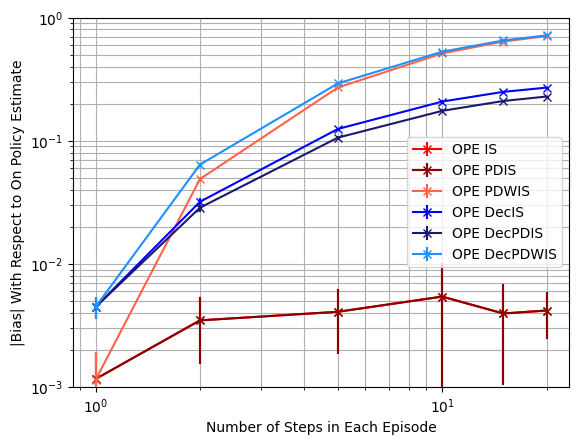

In [ ]:
label = 'bias'
plot_graphs(bias_means, bias_stds, label, 10**(-3), 10**0, shorter_D, estimator='IS')

##### Plot Variance

On Policy-----[3.69650000e-05 7.98235107e-05 2.12441556e-04 2.36161020e-04
 2.42953121e-04 2.17147465e-04]
OPE IS-----[3.57024914e-05 9.31066351e-05 2.17562219e-04 4.43511649e-04
 4.24355329e-04 5.03678276e-04]
OPE PDIS-----[3.57024914e-05 9.31066351e-05 2.17562219e-04 4.43511649e-04
 4.24355329e-04 5.03678276e-04]
OPE PDWIS-----[3.54371454e-05 2.31994121e-05 8.87828845e-06 4.25210277e-06
 1.71831632e-06 1.03844442e-06]
OPE DecIS-----[1.63630505e-05 3.66749891e-05 8.32659563e-05 1.57431282e-04
 1.60464491e-04 1.95331876e-04]
OPE DecPDIS-----[1.63630505e-05 3.83945914e-05 8.91158148e-05 1.64259033e-04
 1.67231200e-04 2.09385387e-04]
OPE DecPDWIS-----[1.61996503e-05 9.63573995e-06 3.53039111e-06 1.64108162e-06
 6.00353296e-07 3.46453731e-07]


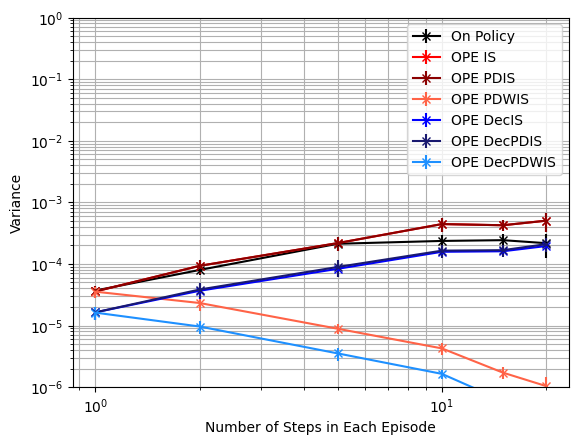

In [ ]:
label = 'var'
plot_graphs(var_means, var_stds, label, 10**(-6), 10**0, shorter_D, estimator='IS')

##### Plot MSE

On Policy-----[3.69650000e-05 7.98235107e-05 2.12441556e-04 2.36161020e-04
 2.42953121e-04 2.17147465e-04]
OPE IS-----[3.76599469e-05 1.08953895e-04 2.39203769e-04 4.95180849e-04
 4.48562913e-04 5.24128339e-04]
OPE PDIS-----[3.76599469e-05 1.08953895e-04 2.39203769e-04 4.95180849e-04
 4.48562913e-04 5.24128339e-04]
OPE PDWIS-----[3.73570632e-05 2.41479973e-03 7.31496632e-02 2.61473887e-01
 4.07255928e-01 4.98768196e-01]
OPE DecIS-----[3.71343370e-05 1.06276903e-03 1.56131831e-02 4.34207438e-02
 6.22960650e-02 7.29534441e-02]
OPE DecPDIS-----[3.71343370e-05 8.62726678e-04 1.13213305e-02 3.07315315e-02
 4.43371352e-02 5.23787033e-02]
OPE DecPDWIS-----[3.70373025e-05 4.11659493e-03 8.50684069e-02 2.78981569e-01
 4.24062021e-01 5.13468810e-01]


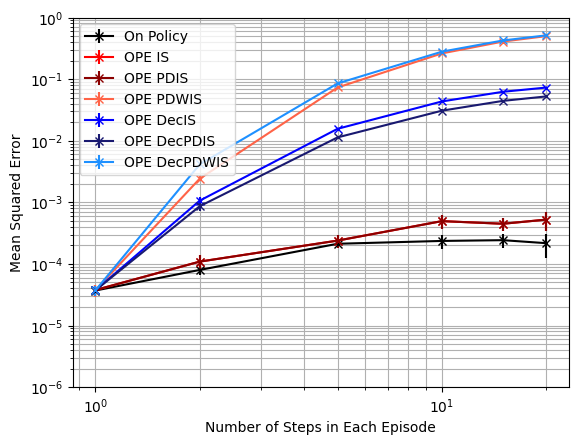

In [ ]:
label = 'MSE'
plot_graphs(MSE_means, MSE_stds, label, 10**(-6), 10**0, shorter_D, estimator='IS')

# From Patient State 56, With Diabetes

In [ ]:
#The patient has diabetes
PROB_DIAB = 1.0

### State Analysis

In [ ]:
#Instantiate a state based on the idx and get the state vector
testState = State(state_idx = 56, diabetic_idx=1)
vec = testState.get_state_vector()

print(vec)

print(f'Heart Rate: {hr_state_mapping[vec[0]]}')
print(f'Systolic Blood Pressure: {sbp_state_mapping[vec[1]]}')
print(f'Percent Oxygen: {o2_state_mapping[vec[2]]}')
print(f'Glucose Level: {glu_state_mapping[vec[3]]}')
print(f'Antibiotics: {abx_state_mapping[vec[4]]}')
print(f'Vasopressors: {vaso_state_mapping[vec[5]]}')
print(f'Ventilator: {vent_state_mapping[vec[6]]}')
print(f'Diabetes: {testState.diabetic_idx}')

[0 0 1 2 0 0 0]
Heart Rate: Low
Systolic Blood Pressure: Low
Percent Oxygen: Normal
Glucose Level: Normal
Antibiotics: Off
Vasopressors: Off
Ventilator: Off
Diabetes: 1


### Generate Data From Behaviour Policy

Run the data generator

In [ ]:
dgen = DataGenerator()
states, actions, lengths, rewards, diab, emp_tx_totals, emp_r_totals = dgen.simulate(
    NSIMSAMPS, NSTEPS, policy=randPol, policy_idx_type='full',
    p_diabetes=PROB_DIAB, use_tqdm=False) #True, tqdm_desc='Behaviour Policy Simulation')

obs_samps = utils.format_dgen_samps(
    states, actions, rewards, diab, NSTEPS, NSIMSAMPS)

Convert data into array format

In [ ]:
time = np.arange(NSTEPS)
times = np.stack(axis=0, arrays=[time]*NSIMSAMPS)
times = times[..., np.newaxis]

nf_tr_b = np.concatenate((times, states[:, 0:NSTEPS, :], actions, rewards, states[:, 1:, :]), axis=2)
nf_tr_b.shape

(100000, 20, 5)

In [ ]:
f_tr_b = factorise_dataset(nf_tr_b)

In [ ]:
print(nf_tr_b)

[[[  0.  56.   0.  -1.  88.]
  [  1.  88.  -1.   0.  -1.]
  [  2.  -1.  -1.   0.  -1.]
  ...
  [ 17.  -1.  -1.   0.  -1.]
  [ 18.  -1.  -1.   0.  -1.]
  [ 19.  -1.  -1.   0.  -1.]]

 [[  0.  56.   3.  -1. 227.]
  [  1. 227.  -1.   0.  -1.]
  [  2.  -1.  -1.   0.  -1.]
  ...
  [ 17.  -1.  -1.   0.  -1.]
  [ 18.  -1.  -1.   0.  -1.]
  [ 19.  -1.  -1.   0.  -1.]]

 [[  0.  56.   7.   0. 143.]
  [  1. 143.   3.  -1. 227.]
  [  2. 227.  -1.   0.  -1.]
  ...
  [ 17.  -1.  -1.   0.  -1.]
  [ 18.  -1.  -1.   0.  -1.]
  [ 19.  -1.  -1.   0.  -1.]]

 ...

 [[  0.  56.   1.   0. 146.]
  [  1. 146.   4.  -1. 116.]
  [  2. 116.  -1.   0.  -1.]
  ...
  [ 17.  -1.  -1.   0.  -1.]
  [ 18.  -1.  -1.   0.  -1.]
  [ 19.  -1.  -1.   0.  -1.]]

 [[  0.  56.   3.   0. 147.]
  [  1. 147.   6.   0. 141.]
  [  2. 141.   2.   0. 137.]
  ...
  [ 17.  -1.  -1.   0.  -1.]
  [ 18.  -1.  -1.   0.  -1.]
  [ 19.  -1.  -1.   0.  -1.]]

 [[  0.  56.   6.   0.  61.]
  [  1.  61.   5.  -1. 190.]
  [  2. 190.  -1.   0.  -1

In [ ]:
print(f_tr_b)

[[[[  0.          56.           1.          -0.33333333  88.        ]
   [  0.          56.           1.          -0.33333333  88.        ]
   [  0.          56.           0.          -0.33333333  88.        ]]

  [[  1.          88.           1.           0.          -1.        ]
   [  1.          88.           1.           0.          -1.        ]
   [  1.          88.           1.           0.          -1.        ]]

  [[  2.          -1.           1.           0.          -1.        ]
   [  2.          -1.           1.           0.          -1.        ]
   [  2.          -1.           1.           0.          -1.        ]]

  ...

  [[ 17.          -1.           1.           0.          -1.        ]
   [ 17.          -1.           1.           0.          -1.        ]
   [ 17.          -1.           1.           0.          -1.        ]]

  [[ 18.          -1.           1.           0.          -1.        ]
   [ 18.          -1.           1.           0.          -1.        ]
   [ 

In [ ]:
factored_randPol = factor_policy(randPol)

In [ ]:
randPol = pad_policy(randPol)

factored_randPol[0] = pad_policy(factored_randPol[0])
factored_randPol[1] = pad_policy(factored_randPol[1])
factored_randPol[2] = pad_policy(factored_randPol[2])

### Varying Episodes $\epsilon_{e} = 0.0$ (Policy Divergence $8.0^{20}$)

Set up evaluation policy, generate data and convert into factored format

In [ ]:
EVAL_EPSILON = 0.0

evalPolSoft = np.copy(fullPol)
evalPolSoft[evalPolSoft == 1] = 1 - EVAL_EPSILON
evalPolSoft[evalPolSoft == 0] = EVAL_EPSILON / (n_actions - 1)

In [ ]:
# Calculate policy divergence from Voloshin et al.
D = 0
for state in range(randPol.shape[0] - 1):
    for action in range(randPol.shape[1] - 1):
        difference = evalPolSoft[state, action]/randPol[state, action]
        D = max(D, difference)
print(D)
shorter_D = round(D,2)

8.0


In [ ]:
dgen = DataGenerator()
states, actions, lengths, rewards, diab, emp_tx_totals, emp_r_totals = dgen.simulate(
    NSIMSAMPS, NSTEPS, policy=evalPolSoft, policy_idx_type='full',
    p_diabetes=PROB_DIAB, use_tqdm=False) #True, tqdm_desc='Behaviour Policy Simulation')

obs_samps = utils.format_dgen_samps(
    states, actions, rewards, diab, NSTEPS, NSIMSAMPS)

In [ ]:
time = np.arange(NSTEPS)
times = np.stack(axis=0, arrays=[time]*NSIMSAMPS)
times = times[..., np.newaxis]

nf_tr_e = np.concatenate((times, states[:, 0:NSTEPS, :], actions, rewards, states[:, 1:, :]), axis=2)
nf_tr_e.shape

(100000, 20, 5)

In [ ]:
f_tr_e = factorise_dataset(nf_tr_e)

In [ ]:
factored_evalPolSoft = factor_policy(evalPolSoft)

In [ ]:
evalPolSoft = pad_policy(evalPolSoft)

factored_evalPolSoft[0] = pad_policy(factored_evalPolSoft[0])
factored_evalPolSoft[1] = pad_policy(factored_evalPolSoft[1])
factored_evalPolSoft[2] = pad_policy(factored_evalPolSoft[2])

In [ ]:
import policy_estimators as pe
import gc

def evaluate_PE(RUNS, EPISODES, SHORTER_D, STEPS=NSTEPS):

  biases = np.zeros((5, 5))
  variances = np.zeros((5, 5))
  MSEs = np.zeros((5, 5))
  ESSs = np.zeros((5, 5))

  # Reshape data for processing
  T, ldim = nf_tr_b.shape[-2], nf_tr_b.shape[-1]
  nfb = nf_tr_b.reshape((-1, RUNS, EPISODES, T, ldim))
  nfe = nf_tr_e.reshape((-1, RUNS, EPISODES, T, ldim))

  T, D, ldim = f_tr_b.shape[-3], f_tr_b.shape[-2], f_tr_b.shape[-1]
  fb = f_tr_b.reshape((-1, RUNS, EPISODES, T, D, ldim))
  fe = f_tr_e.reshape((-1, RUNS, EPISODES, T, D, ldim))

  for t in range(5):
    print()

    lower_index = 0
    estimates_on_policy = np.zeros(RUNS)
    estimates_OPE_IS = np.zeros(RUNS)
    estimates_OPE_PDIS = np.zeros(RUNS)

    estimates_OPE_DecIS = np.zeros(RUNS)
    estimates_OPE_DecPDIS = np.zeros(RUNS)

    for r in range(RUNS):
        #On policy Q estimate
        estimates_on_policy[r] = pe.on_policy_Q_estimate(nfe[t, r, :, :STEPS, :], DISCOUNT_Pol)
        #Off policy IS estimate
        estimates_OPE_IS[r] = pe.off_policy_IS_estimator(nfb[t, r, :, :STEPS, :], DISCOUNT_Pol, randPol, evalPolSoft)
        #Off policy PDIS estimate
        estimates_OPE_PDIS[r] = pe.off_policy_PDIS_estimator(nfb[t, r, :, :STEPS, :], DISCOUNT_Pol, randPol, evalPolSoft)

        #Factorisation 1----------------------------------

        #Off policy decomposed IS estimate
        estimates_OPE_DecIS[r], _ = pe.off_policy_DecIS_estimator(fb[t, r, :, :STEPS, :, :], DISCOUNT_Pol, [0,1], factored_randPol, factored_evalPolSoft)
        #Off policy decomposed PDIS estimate
        estimates_OPE_DecPDIS[r], _ = pe.off_policy_DecPDIS_estimator(fb[t, r, :, :STEPS, :, :], DISCOUNT_Pol, [0,1], factored_randPol, factored_evalPolSoft)


    mean_on_policy = np.mean(estimates_on_policy)
    var_on_policy = np.var(estimates_on_policy, ddof=0)
    print(f'Mean on policy Q estimate: {mean_on_policy}. Variance of on policy Q estimate: {var_on_policy}')

    from sklearn.metrics import mean_squared_error

    #For on policy
    biases[t, 0] = 0.0
    variances[t, 0] = var_on_policy
    MSEs[t, 0] = var_on_policy
    ESSs[t, 0] = EPISODES

    def generate_results(estimates, mean_true, label):
      MSE = mean_squared_error(estimates, [mean_true]*RUNS)
      mean = np.mean(estimates)
      var = np.var(estimates, ddof=0)
      bias1 = np.sqrt(MSE - var)
      bias2 = abs(mean - mean_true)
      print(f'Mean {label} estimate: {mean}. Bias1: {bias1}. Bias2: {bias2}. Variance: {var}. MSE: {MSE}')
      return bias1, var, MSE

    label_list = ['OPE IS', 'OPE PDIS',
                  'OPE DecIS', 'OPE DecPDIS'
                  ]

    estimates = [estimates_OPE_IS, estimates_OPE_PDIS,
                estimates_OPE_DecIS, estimates_OPE_DecPDIS
                ]


    for (id, val) in enumerate(label_list):
      biases[t, 1+id], variances[t, 1+id], MSEs[t, 1+id] = generate_results(estimates[id], mean_on_policy, label_list[id])
      ESSs[t, 1+id] = (EPISODES*variances[t, 0])/variances[t, 1+id]
      gc.collect()

  return np.mean(biases, axis=0), np.std(biases, axis=0), np.mean(variances, axis=0), np.std(variances, axis=0), np.mean(MSEs, axis=0), np.std(MSEs, axis=0), np.mean(ESSs, axis=0), np.std(ESSs, axis=0)

#### Run Everything

In [ ]:
EPISODES = [10, 50, 100, 500, 1000]

bias_means = np.zeros((len(EPISODES), 5))
bias_stds = np.zeros((len(EPISODES), 5))
var_means = np.zeros((len(EPISODES), 5))
var_stds = np.zeros((len(EPISODES), 5))
MSE_means = np.zeros((len(EPISODES), 5))
MSE_stds = np.zeros((len(EPISODES), 5))
ESS_means = np.zeros((len(EPISODES), 5))
ESS_stds = np.zeros((len(EPISODES), 5))

RUNS = 20

for id in range(len(EPISODES)):
  e = EPISODES[id]
  print(f'{e} Episodes, {RUNS} ----------------------------------')
  bias_means[id, :], bias_stds[id, :], var_means[id, :], var_stds[id, :], MSE_means[id, :], MSE_stds[id, :], ESS_means[id, :], ESS_stds[id, :] = evaluate_PE(RUNS=RUNS, EPISODES=e, SHORTER_D=shorter_D)
  print()
  gc.collect()

print('BIAS MEANS')
print(list(bias_means))
print('\nBIAS STDS')
print(list(bias_stds))
print('\nVAR MEANS')
print(list(var_means))
print('\nVAR STDS')
print(list(var_stds))
print('\nMSE MEANS')
print(list(MSE_means))
print('\nMSE STDS')
print(list(MSE_stds))
print('\nESS MEANS')
print(list(ESS_means))
print('\nESS STDS')
print(list(ESS_stds))

10 Episodes, 20 ----------------------------------

Mean on policy Q estimate: -0.5288027978799734. Variance of on policy Q estimate: 0.049912688764260096
Mean OPE IS estimate: -0.32. Bias1: 0.20880279787997338. Bias2: 0.2088027978799734. Variance: 0.21760000000000007. MSE: 0.2611986084025051
Mean OPE PDIS estimate: -0.32. Bias1: 0.20880279787997338. Bias2: 0.2088027978799734. Variance: 0.21760000000000007. MSE: 0.2611986084025051
Mean OPE DecIS estimate: -4.038292908488587. Bias1: 3.509490110608618. Bias2: 3.5094901106086134. Variance: 183.6223722652395. MSE: 195.9388931016992
Mean OPE DecPDIS estimate: -2.3694970675776266. Bias1: 1.840694269697652. Bias2: 1.8406942696976532. Variance: 45.54995827429572. MSE: 48.93811366879349

Mean on policy Q estimate: -0.48934850516602546. Variance of on policy Q estimate: 0.05413602658094032
Mean OPE IS estimate: -0.24000000000000005. Bias1: 0.2493485051660255. Bias2: 0.2493485051660254. Variance: 0.1984. MSE: 0.26057467702853143
Mean OPE PDIS est

#### Plot Graphs

In [ ]:
import pickle
import matplotlib.pyplot as plt

def plot_graphs(means, stds, label, low_ylim, up_ylim, D, estimator='IS'):
  EPISODES = [10, 50, 100, 500, 1000]

  ylabels = {
      'bias': '|Bias| With Respect to On Policy Estimate',
      'var': 'Variance',
      'MSE': 'Mean Squared Error',
      'ESS': 'Effective Sample Size'
  }

  colours = {
      'On Policy': 'k',
      'OPE IS': 'r',
      'OPE DecIS': 'b',
      'OPE PDIS': 'darkred',
      'OPE DecPDIS': 'midnightblue',
      'OPE PDWIS': 'tomato',
      'OPE DecPDWIS': 'dodgerblue',
  }

  legend_list = ['OPE IS', 'OPE PDIS',
                  'OPE DecIS', 'OPE DecPDIS'
                  ]
  index_list = [1, 2, 3, 4]

  plt.figure()
  if label != 'bias':
    legend_list.insert(0,'On Policy')
    index_list.insert(0, 0)
  for (id, legend) in zip(index_list, legend_list):
    print(f'{legend}-----{means[:, id]}')
    plt.errorbar(EPISODES, means[:, id], yerr=stds[:, id], color=colours[legend], marker='x')
  plt.yscale("log")
  plt.xscale("log")
  plt.grid(visible=True, which='both', axis='both')
  plt.legend(legend_list)
  plt.xlabel('Number of Episodes')
  plt.ylabel(ylabels[label])
  plt.ylim([low_ylim, up_ylim])
  plt.savefig(f'{label}-sepsis-simulator-{D}.pdf', dpi=300)
  plt.show()


For vs Steps

In [ ]:
import pickle
import matplotlib.pyplot as plt

def plot_graphs(means, stds, label, low_ylim, up_ylim, D, estimator='IS'):
  LENGTHS = [1, 2, 5, 10, 15, 20]

  ylabels = {
      'bias': '|Bias| With Respect to On Policy Estimate',
      'var': 'Variance',
      'MSE': 'Mean Squared Error',
      'ESS': 'Effective Sample Size'
  }

  colours = {
      'On Policy': 'k',
      'OPE IS': 'r',
      'OPE DecIS': 'b',
      'OPE PDIS': 'darkred',
      'OPE DecPDIS': 'midnightblue',
      'OPE PDWIS': 'tomato',
      'OPE DecPDWIS': 'dodgerblue',
  }

  legend_list = ['OPE IS', 'OPE PDIS',
                  'OPE DecIS', 'OPE DecPDIS'
                  ]
  index_list = [1, 2, 3, 4]

  plt.figure()
  if label != 'bias':
    legend_list.insert(0,'On Policy')
    index_list.insert(0, 0)
  for (id, legend) in zip(index_list, legend_list):
    print(f'{legend}-----{means[:, id]}')
    plt.errorbar(LENGTHS, means[:, id], yerr=stds[:, id], color=colours[legend], marker='x')
  plt.yscale("log")
  plt.xscale("log")
  plt.grid(visible=True, which='both', axis='both')
  plt.legend(legend_list)
  plt.xlabel('Number of Steps in Each Episode')
  plt.ylabel(ylabels[label])
  plt.ylim([low_ylim, up_ylim])
  plt.savefig(f'{label}-sepsis-simulator-{D}.pdf', dpi=300)
  plt.show()


##### Plot Bias

OPE IS-----[0.25887628 0.2746531  0.14507152 0.21414347 0.15234397]
OPE PDIS-----[0.25887628 0.2746531  0.14507152 0.21414347 0.15234397]
OPE DecIS-----[0.84180531 0.22264617 0.12973087 0.09392988 0.09913445]
OPE DecPDIS-----[0.51958548 0.19126857 0.1843029  0.17584437 0.18349861]


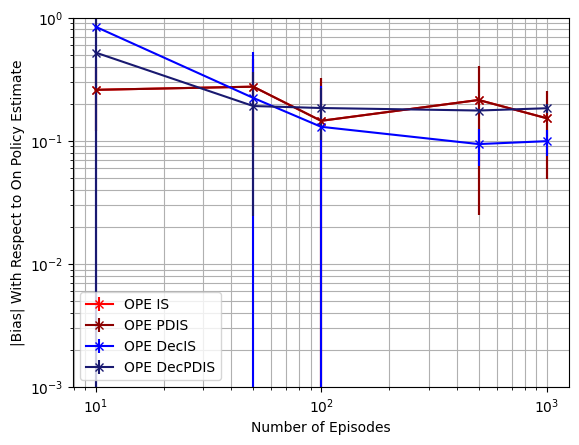

In [ ]:
label = 'bias'
plot_graphs(bias_means, bias_stds, label, 10**-3, 10**0, shorter_D, estimator='IS')

##### Plot Variance

On Policy-----[0.06552973 0.01210195 0.00504306 0.00123824 0.00068659]
OPE IS-----[1.03465933 2.01563483 0.58710217 1.27925835 0.33091043]
OPE PDIS-----[1.03465933 2.01563483 0.58710217 1.27925835 0.33091043]
OPE DecIS-----[3.71220157e+01 1.52702438e+00 4.92080464e-01 3.43829330e-02
 1.75664447e-02]
OPE DecPDIS-----[9.23772236e+00 3.91449657e-01 1.28878030e-01 1.12492627e-02
 5.62375803e-03]


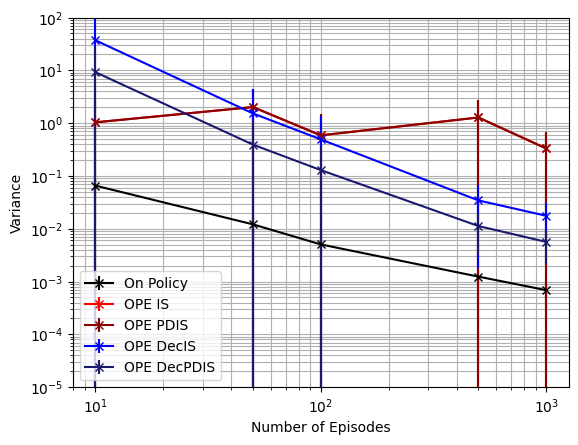

In [ ]:
label = 'var'
plot_graphs(var_means, var_stds, label, 10**(-5), 10**2, shorter_D, estimator='IS')

##### Plot MSE

On Policy-----[0.06552973 0.01210195 0.00504306 0.00123824 0.00068659]
OPE IS-----[1.12101541 2.12574002 0.64014824 1.36089009 0.36479104]
OPE PDIS-----[1.12101541 2.12574002 0.64014824 1.36089009 0.36479104]
OPE DecIS-----[3.96214568e+01 1.66686581e+00 5.31320006e-01 4.41962763e-02
 2.79642233e-02]
OPE DecPDIS-----[9.95159001 0.45591869 0.16975773 0.04220103 0.03951739]


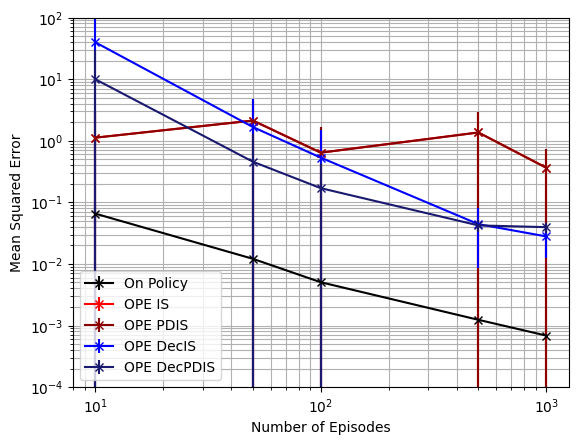

In [ ]:
label = 'MSE'
plot_graphs(MSE_means, MSE_stds, label, 10**(-4), 10**2, shorter_D, estimator='IS')

##### Plot ESS

On Policy-----[  10.   50.  100.  500. 1000.]
OPE IS-----[2.7330017  1.73244358 3.00515219 3.52983477 8.95101196]
OPE PDIS-----[2.7330017  1.73244358 3.00515219 3.52983477 8.95101196]
OPE DecIS-----[ 1.32242002  9.12446679  9.59795559 28.29361208 70.05202389]
OPE DecPDIS-----[  3.92463905  15.12888376  18.91373974  83.42503922 178.48981362]


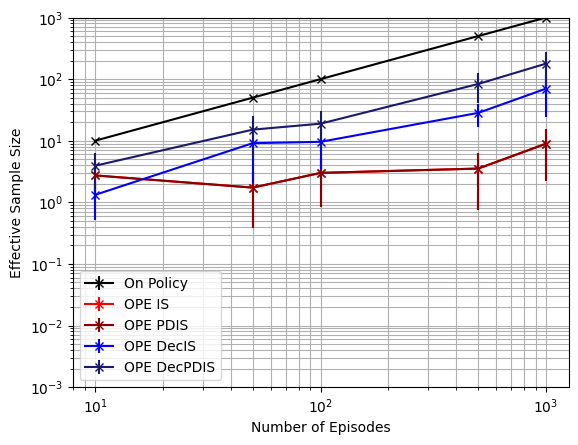

In [ ]:
label = 'ESS'
plot_graphs(ESS_means, ESS_stds, label, 10**(-3), 10**3, shorter_D, estimator='IS')

### Varying Episodes $\epsilon_{e} = 0.2$ (Policy Divergence $6.4^{20}$)

Set up evaluation policy, generate data and convert into factored format

In [ ]:
EVAL_EPSILON = 0.2

evalPolSoft = np.copy(fullPol)
evalPolSoft[evalPolSoft == 1] = 1 - EVAL_EPSILON
evalPolSoft[evalPolSoft == 0] = EVAL_EPSILON / (n_actions - 1)

In [ ]:
# Calculate policy divergence from Voloshin et al.
D = 0
for state in range(randPol.shape[0] - 1):
    for action in range(randPol.shape[1] - 1):
        difference = evalPolSoft[state, action]/randPol[state, action]
        D = max(D, difference)
print(D)
shorter_D = round(D,2)

6.4


In [ ]:
dgen = DataGenerator()
states, actions, lengths, rewards, diab, emp_tx_totals, emp_r_totals = dgen.simulate(
    NSIMSAMPS, NSTEPS, policy=evalPolSoft, policy_idx_type='full',
    p_diabetes=PROB_DIAB, use_tqdm=False) #True, tqdm_desc='Behaviour Policy Simulation')

obs_samps = utils.format_dgen_samps(
    states, actions, rewards, diab, NSTEPS, NSIMSAMPS)

In [ ]:
time = np.arange(NSTEPS)
times = np.stack(axis=0, arrays=[time]*NSIMSAMPS)
times = times[..., np.newaxis]

nf_tr_e = np.concatenate((times, states[:, 0:NSTEPS, :], actions, rewards, states[:, 1:, :]), axis=2)
nf_tr_e.shape

(100000, 20, 5)

In [ ]:
f_tr_e = factorise_dataset(nf_tr_e)

In [ ]:
factored_evalPolSoft = factor_policy(evalPolSoft)

In [ ]:
evalPolSoft = pad_policy(evalPolSoft)

factored_evalPolSoft[0] = pad_policy(factored_evalPolSoft[0])
factored_evalPolSoft[1] = pad_policy(factored_evalPolSoft[1])
factored_evalPolSoft[2] = pad_policy(factored_evalPolSoft[2])

In [ ]:
import policy_estimators as pe
import gc

def evaluate_PE(RUNS, EPISODES, SHORTER_D, STEPS=NSTEPS):

  biases = np.zeros((5, 7))
  variances = np.zeros((5, 7))
  MSEs = np.zeros((5, 7))
  ESSs = np.zeros((5, 7))

  # Reshape data for processing
  T, ldim = nf_tr_b.shape[-2], nf_tr_b.shape[-1]
  nfb = nf_tr_b.reshape((-1, RUNS, EPISODES, T, ldim))
  nfe = nf_tr_e.reshape((-1, RUNS, EPISODES, T, ldim))

  T, D, ldim = f_tr_b.shape[-3], f_tr_b.shape[-2], f_tr_b.shape[-1]
  fb = f_tr_b.reshape((-1, RUNS, EPISODES, T, D, ldim))
  fe = f_tr_e.reshape((-1, RUNS, EPISODES, T, D, ldim))

  for t in range(5):
    print()

    lower_index = 0
    estimates_on_policy = np.zeros(RUNS)
    estimates_OPE_IS = np.zeros(RUNS)
    estimates_OPE_PDIS = np.zeros(RUNS)
    estimates_OPE_PDWIS = np.zeros(RUNS)

    estimates_OPE_DecIS = np.zeros(RUNS)
    estimates_OPE_DecPDIS = np.zeros(RUNS)
    estimates_OPE_DecPDWIS = np.zeros(RUNS)

    for r in range(RUNS):
        #On policy Q estimate
        estimates_on_policy[r] = pe.on_policy_Q_estimate(nfe[t, r, :, :STEPS, :], DISCOUNT_Pol)
        #Off policy IS estimate
        estimates_OPE_IS[r] = pe.off_policy_IS_estimator(nfb[t, r, :, :STEPS, :], DISCOUNT_Pol, randPol, evalPolSoft)
        #Off policy PDIS estimate
        estimates_OPE_PDIS[r] = pe.off_policy_PDIS_estimator(nfb[t, r, :, :STEPS, :], DISCOUNT_Pol, randPol, evalPolSoft)
        #Off policy PDWIS estimate
        estimates_OPE_PDWIS[r] = pe.off_policy_PDWIS_estimator(nfb[t, r, :, :STEPS, :], DISCOUNT_Pol, randPol, evalPolSoft)

        #Factorisation 1----------------------------------

        #Off policy decomposed IS estimate
        estimates_OPE_DecIS[r], _ = pe.off_policy_DecIS_estimator(fb[t, r, :, :STEPS, :, :], DISCOUNT_Pol, [0,1], factored_randPol, factored_evalPolSoft)
        #Off policy decomposed PDIS estimate
        estimates_OPE_DecPDIS[r], _ = pe.off_policy_DecPDIS_estimator(fb[t, r, :, :STEPS, :, :], DISCOUNT_Pol, [0,1], factored_randPol, factored_evalPolSoft)
        #Off policy decomposed PDWIS estimate
        estimates_OPE_DecPDWIS[r], _ = pe.off_policy_DecPDWIS_estimator(fb[t, r, :, :STEPS, :, :], DISCOUNT_Pol, [0,1], factored_randPol, factored_evalPolSoft)


    mean_on_policy = np.mean(estimates_on_policy)
    var_on_policy = np.var(estimates_on_policy, ddof=0)
    print(f'Mean on policy Q estimate: {mean_on_policy}. Variance of on policy Q estimate: {var_on_policy}')

    from sklearn.metrics import mean_squared_error

    #For on policy
    biases[t, 0] = 0.0
    variances[t, 0] = var_on_policy
    MSEs[t, 0] = var_on_policy
    ESSs[t, 0] = EPISODES

    def generate_results(estimates, mean_true, label):
      MSE = mean_squared_error(estimates, [mean_true]*RUNS)
      mean = np.mean(estimates)
      var = np.var(estimates, ddof=0)
      bias1 = np.sqrt(MSE - var)
      bias2 = abs(mean - mean_true)
      print(f'Mean {label} estimate: {mean}. Bias1: {bias1}. Bias2: {bias2}. Variance: {var}. MSE: {MSE}')
      return bias1, var, MSE

    label_list = ['OPE IS', 'OPE PDIS', 'OPE PDWIS',
                  'OPE DecIS', 'OPE DecPDIS', 'OPE DecPDWIS'
                  ]

    estimates = [estimates_OPE_IS, estimates_OPE_PDIS, estimates_OPE_PDWIS,
                estimates_OPE_DecIS, estimates_OPE_DecPDIS, estimates_OPE_DecPDWIS
                ]


    for (id, val) in enumerate(label_list):
      biases[t, 1+id], variances[t, 1+id], MSEs[t, 1+id] = generate_results(estimates[id], mean_on_policy, label_list[id])
      ESSs[t, 1+id] = (EPISODES*variances[t, 0])/variances[t, 1+id]
      gc.collect()

  return np.mean(biases, axis=0), np.std(biases, axis=0), np.mean(variances, axis=0), np.std(variances, axis=0), np.mean(MSEs, axis=0), np.std(MSEs, axis=0), np.mean(ESSs, axis=0), np.std(ESSs, axis=0)

#### Run Everything

In [ ]:
EPISODES = [10, 50, 100, 500, 1000]

bias_means = np.zeros((len(EPISODES), 7))
bias_stds = np.zeros((len(EPISODES), 7))
var_means = np.zeros((len(EPISODES), 7))
var_stds = np.zeros((len(EPISODES), 7))
MSE_means = np.zeros((len(EPISODES), 7))
MSE_stds = np.zeros((len(EPISODES), 7))
ESS_means = np.zeros((len(EPISODES), 7))
ESS_stds = np.zeros((len(EPISODES), 7))

RUNS = 20

for id in range(len(EPISODES)):
  e = EPISODES[id]
  print(f'{e} Episodes, {RUNS} ----------------------------------')
  bias_means[id, :], bias_stds[id, :], var_means[id, :], var_stds[id, :], MSE_means[id, :], MSE_stds[id, :], ESS_means[id, :], ESS_stds[id, :] = evaluate_PE(RUNS=RUNS, EPISODES=e, SHORTER_D=shorter_D)
  print()
  gc.collect()

print('BIAS MEANS')
print(list(bias_means))
print('\nBIAS STDS')
print(list(bias_stds))
print('\nVAR MEANS')
print(list(var_means))
print('\nVAR STDS')
print(list(var_stds))
print('\nMSE MEANS')
print(list(MSE_means))
print('\nMSE STDS')
print(list(MSE_stds))
print('\nESS MEANS')
print(list(ESS_means))
print('\nESS STDS')
print(list(ESS_stds))

10 Episodes, 20 ----------------------------------

Mean on policy Q estimate: -0.7630885592628591. Variance of on policy Q estimate: 0.02842155081669881
Mean OPE IS estimate: -0.8516953287845921. Bias1: 0.08860676952173378. Bias2: 0.08860676952173296. Variance: 3.2060803023658564. MSE: 3.213931461970934
Mean OPE PDIS estimate: -0.8516953287845921. Bias1: 0.08860676952173378. Bias2: 0.08860676952173296. Variance: 3.2060803023658564. MSE: 3.213931461970934
Mean OPE PDWIS estimate: -0.044195500050219105. Bias1: 0.71889305921264. Bias2: 0.71889305921264. Variance: 3.0624267520462404e-05. MSE: 0.5168378548516288
Mean OPE DecIS estimate: -2.9332289527262754. Bias1: 2.170140393463413. Bias2: 2.1701403934634165. Variance: 84.70333119889878. MSE: 89.41284052624032
Mean OPE DecPDIS estimate: -1.8732584213820407. Bias1: 1.1101698621191827. Bias2: 1.1101698621191816. Variance: 22.5053155022516. MSE: 23.737792625009327
Mean OPE DecPDWIS estimate: -0.10077902199599083. Bias1: 0.6623095372668684. Bi

#### Plot Graphs

##### Plot Bias

OPE IS-----[0.14676492 0.1100324  0.0964159  0.10641399 0.05940634]
OPE PDIS-----[0.14676492 0.1100324  0.0964159  0.10641399 0.05940634]
OPE PDWIS-----[0.63466734 0.64030463 0.64119143 0.62873198 0.62942495]
OPE DecIS-----[0.57963933 0.24261689 0.1498737  0.13022329 0.13474059]
OPE DecPDIS-----[0.30625961 0.13456307 0.07632565 0.04933008 0.04934182]
OPE DecPDWIS-----[0.57553079 0.59295001 0.59439337 0.58718836 0.58846167]


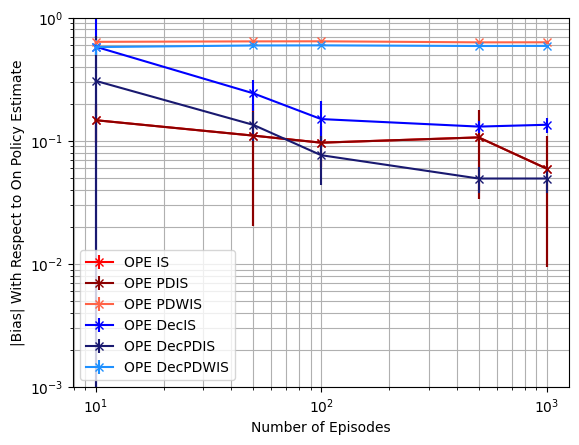

In [ ]:
label = 'bias'
plot_graphs(bias_means, bias_stds, label, 10**-3, 10**0, shorter_D, estimator='IS')

##### Plot Variance

On Policy-----[0.03306464 0.0084038  0.00427591 0.00077194 0.00041863]
OPE IS-----[1.11989198 0.59344486 0.23629525 0.24420993 0.07204275]
OPE PDIS-----[1.11989198 0.59344486 0.23629525 0.24420993 0.07204275]
OPE PDWIS-----[5.61506335e-05 7.23225209e-05 3.72032518e-05 8.70503967e-05
 6.74778001e-05]
OPE DecIS-----[1.72304275e+01 7.12860755e-01 2.52185197e-01 2.37140599e-02
 1.00284158e-02]
OPE DecPDIS-----[4.60081084e+00 1.99102349e-01 7.33062868e-02 8.40785619e-03
 3.48056085e-03]
OPE DecPDWIS-----[9.78177272e-04 4.28602577e-04 2.94742247e-04 9.28150615e-05
 8.27777330e-05]


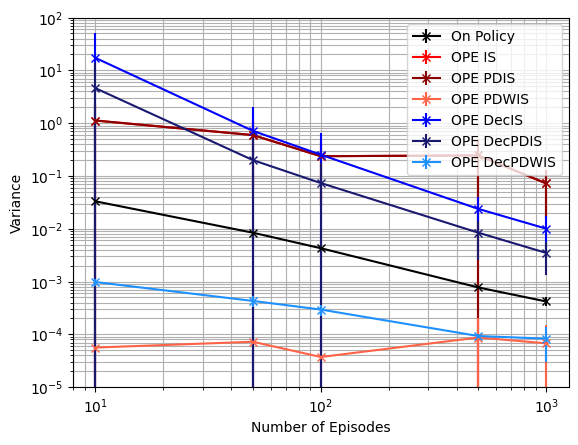

In [ ]:
label = 'var'
plot_graphs(var_means, var_stds, label, 10**(-5), 10**2, shorter_D, estimator='IS')

##### Plot MSE

On Policy-----[0.03306464 0.0084038  0.00427591 0.00077194 0.00041863]
OPE IS-----[1.14411516 0.61359124 0.24681705 0.26078464 0.07807327]
OPE PDIS-----[1.14411516 0.61359124 0.24681705 0.26078464 0.07807327]
OPE PDWIS-----[0.40853396 0.41057606 0.41128637 0.39544589 0.39627085]
OPE DecIS-----[18.20127398  0.77649148  0.27827585  0.04086016  0.02854636]
OPE DecPDIS-----[4.85930445 0.2184336  0.08021778 0.01098494 0.00605593]
OPE DecPDWIS-----[0.33809961 0.35264292 0.35371523 0.34492482 0.34639049]


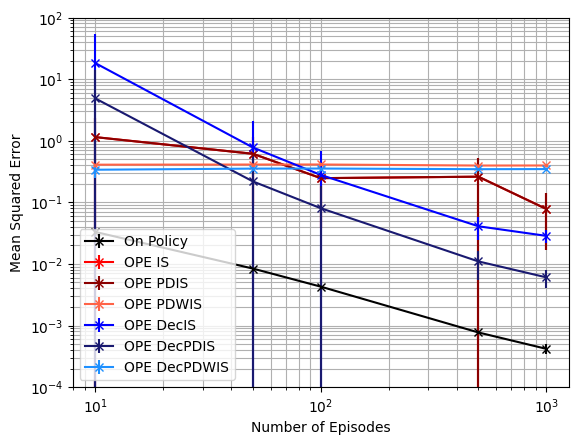

In [ ]:
label = 'MSE'
plot_graphs(MSE_means, MSE_stds, label, 10**(-4), 10**2, shorter_D, estimator='IS')

On Policy-----[0.03306464 0.0084038  0.00427591 0.00077194 0.00041863]
OPE IS-----[1.14411516 0.61359124 0.24681705 0.26078464 0.07807327]
OPE PDIS-----[1.14411516 0.61359124 0.24681705 0.26078464 0.07807327]
OPE PDWIS-----[0.40853396 0.41057606 0.41128637 0.39544589 0.39627085]
OPE DecIS-----[18.20127398  0.77649148  0.27827585  0.04086016  0.02854636]
OPE DecPDIS-----[4.85930445 0.2184336  0.08021778 0.01098494 0.00605593]
OPE DecPDWIS-----[0.33809961 0.35264292 0.35371523 0.34492482 0.34639049]


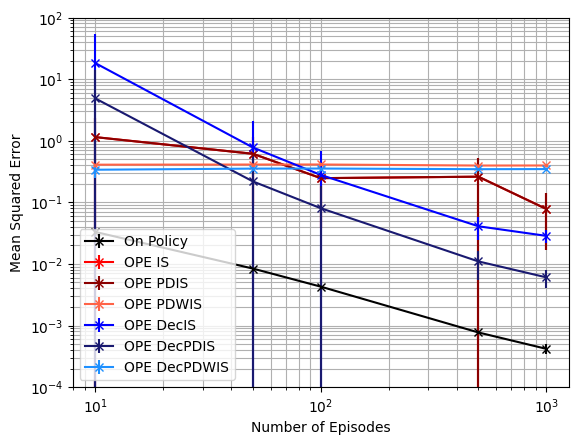

In [ ]:
plot_graphs(MSE_means, MSE_stds, label, 10**(-4), 10**2, shorter_D, estimator='PDIS')

##### Plot ESS

On Policy-----[  10.   50.  100.  500. 1000.]
OPE IS-----[ 1.282756    1.93529681  3.03027801  7.23197726 12.02124535]
OPE PDIS-----[ 1.282756    1.93529681  3.03027801  7.23197726 12.02124535]
OPE PDWIS-----[ 8558.22198055 11694.08633057 30418.17417264 15994.68340818
 36296.13198108]
OPE DecIS-----[ 1.05868031 10.39035869 12.07605203 24.93040147 77.35218806]
OPE DecPDIS-----[  2.86201515  15.33152385  20.63117151  70.16273439 179.53147054]
OPE DecPDWIS-----[ 352.53972615 1009.14384876 1477.31401095 4242.4891248  6907.92032317]


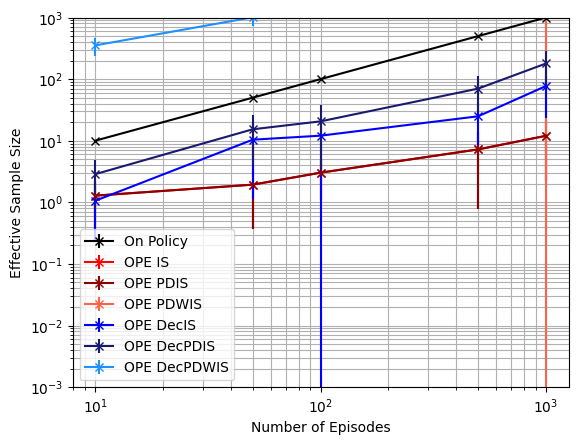

In [ ]:
label = 'ESS'
plot_graphs(ESS_means, ESS_stds, label, 10**(-3), 10**3, shorter_D, estimator='IS')

### Varying Episodes $\epsilon_{e} = 0.4$ (Policy Divergence $4.8^{20}$)

Set up evaluation policy, generate data and convert into factored format

In [ ]:
EVAL_EPSILON = 0.4

evalPolSoft = np.copy(fullPol)
evalPolSoft[evalPolSoft == 1] = 1 - EVAL_EPSILON
evalPolSoft[evalPolSoft == 0] = EVAL_EPSILON / (n_actions - 1)

In [ ]:
# Calculate policy divergence from Voloshin et al.
D = 0
for state in range(randPol.shape[0] - 1):
    for action in range(randPol.shape[1] - 1):
        difference = evalPolSoft[state, action]/randPol[state, action]
        D = max(D, difference)
print(D)
shorter_D = round(D,2)

4.8


In [ ]:
dgen = DataGenerator()
states, actions, lengths, rewards, diab, emp_tx_totals, emp_r_totals = dgen.simulate(
    NSIMSAMPS, NSTEPS, policy=evalPolSoft, policy_idx_type='full',
    p_diabetes=PROB_DIAB, use_tqdm=False) #True, tqdm_desc='Behaviour Policy Simulation')

obs_samps = utils.format_dgen_samps(
    states, actions, rewards, diab, NSTEPS, NSIMSAMPS)

In [ ]:
time = np.arange(NSTEPS)
times = np.stack(axis=0, arrays=[time]*NSIMSAMPS)
times = times[..., np.newaxis]

nf_tr_e = np.concatenate((times, states[:, 0:NSTEPS, :], actions, rewards, states[:, 1:, :]), axis=2)
nf_tr_e.shape

(100000, 20, 5)

In [ ]:
f_tr_e = factorise_dataset(nf_tr_e)

In [ ]:
factored_evalPolSoft = factor_policy(evalPolSoft)

In [ ]:
evalPolSoft = pad_policy(evalPolSoft)

factored_evalPolSoft[0] = pad_policy(factored_evalPolSoft[0])
factored_evalPolSoft[1] = pad_policy(factored_evalPolSoft[1])
factored_evalPolSoft[2] = pad_policy(factored_evalPolSoft[2])

In [ ]:
import policy_estimators as pe
import gc

def evaluate_PE(RUNS, EPISODES, SHORTER_D, STEPS=NSTEPS):

  biases = np.zeros((5, 7))
  variances = np.zeros((5, 7))
  MSEs = np.zeros((5, 7))
  ESSs = np.zeros((5, 7))

  # Reshape data for processing
  T, ldim = nf_tr_b.shape[-2], nf_tr_b.shape[-1]
  nfb = nf_tr_b.reshape((-1, RUNS, EPISODES, T, ldim))
  nfe = nf_tr_e.reshape((-1, RUNS, EPISODES, T, ldim))

  T, D, ldim = f_tr_b.shape[-3], f_tr_b.shape[-2], f_tr_b.shape[-1]
  fb = f_tr_b.reshape((-1, RUNS, EPISODES, T, D, ldim))
  fe = f_tr_e.reshape((-1, RUNS, EPISODES, T, D, ldim))

  for t in range(5):
    print()

    lower_index = 0
    estimates_on_policy = np.zeros(RUNS)
    estimates_OPE_IS = np.zeros(RUNS)
    estimates_OPE_PDIS = np.zeros(RUNS)
    estimates_OPE_PDWIS = np.zeros(RUNS)

    estimates_OPE_DecIS = np.zeros(RUNS)
    estimates_OPE_DecPDIS = np.zeros(RUNS)
    estimates_OPE_DecPDWIS = np.zeros(RUNS)

    for r in range(RUNS):
        #On policy Q estimate
        estimates_on_policy[r] = pe.on_policy_Q_estimate(nfe[t, r, :, :STEPS, :], DISCOUNT_Pol)
        #Off policy IS estimate
        estimates_OPE_IS[r] = pe.off_policy_IS_estimator(nfb[t, r, :, :STEPS, :], DISCOUNT_Pol, randPol, evalPolSoft)
        #Off policy PDIS estimate
        estimates_OPE_PDIS[r] = pe.off_policy_PDIS_estimator(nfb[t, r, :, :STEPS, :], DISCOUNT_Pol, randPol, evalPolSoft)
        #Off policy PDWIS estimate
        estimates_OPE_PDWIS[r] = pe.off_policy_PDWIS_estimator(nfb[t, r, :, :STEPS, :], DISCOUNT_Pol, randPol, evalPolSoft)

        #Factorisation 1----------------------------------

        #Off policy decomposed IS estimate
        estimates_OPE_DecIS[r], _ = pe.off_policy_DecIS_estimator(fb[t, r, :, :STEPS, :, :], DISCOUNT_Pol, [0,1], factored_randPol, factored_evalPolSoft)
        #Off policy decomposed PDIS estimate
        estimates_OPE_DecPDIS[r], _ = pe.off_policy_DecPDIS_estimator(fb[t, r, :, :STEPS, :, :], DISCOUNT_Pol, [0,1], factored_randPol, factored_evalPolSoft)
        #Off policy decomposed PDWIS estimate
        estimates_OPE_DecPDWIS[r], _ = pe.off_policy_DecPDWIS_estimator(fb[t, r, :, :STEPS, :, :], DISCOUNT_Pol, [0,1], factored_randPol, factored_evalPolSoft)


    mean_on_policy = np.mean(estimates_on_policy)
    var_on_policy = np.var(estimates_on_policy, ddof=0)
    print(f'Mean on policy Q estimate: {mean_on_policy}. Variance of on policy Q estimate: {var_on_policy}')

    from sklearn.metrics import mean_squared_error

    #For on policy
    biases[t, 0] = 0.0
    variances[t, 0] = var_on_policy
    MSEs[t, 0] = var_on_policy
    ESSs[t, 0] = EPISODES

    def generate_results(estimates, mean_true, label):
      MSE = mean_squared_error(estimates, [mean_true]*RUNS)
      mean = np.mean(estimates)
      var = np.var(estimates, ddof=0)
      bias1 = np.sqrt(MSE - var)
      bias2 = abs(mean - mean_true)
      print(f'Mean {label} estimate: {mean}. Bias1: {bias1}. Bias2: {bias2}. Variance: {var}. MSE: {MSE}')
      return bias1, var, MSE

    label_list = ['OPE IS', 'OPE PDIS', 'OPE PDWIS',
                  'OPE DecIS', 'OPE DecPDIS', 'OPE DecPDWIS'
                  ]

    estimates = [estimates_OPE_IS, estimates_OPE_PDIS, estimates_OPE_PDWIS,
                estimates_OPE_DecIS, estimates_OPE_DecPDIS, estimates_OPE_DecPDWIS
                ]


    for (id, val) in enumerate(label_list):
      biases[t, 1+id], variances[t, 1+id], MSEs[t, 1+id] = generate_results(estimates[id], mean_on_policy, label_list[id])
      ESSs[t, 1+id] = (EPISODES*variances[t, 0])/variances[t, 1+id]
      gc.collect()

  return np.mean(biases, axis=0), np.std(biases, axis=0), np.mean(variances, axis=0), np.std(variances, axis=0), np.mean(MSEs, axis=0), np.std(MSEs, axis=0), np.mean(ESSs, axis=0), np.std(ESSs, axis=0)

#### Run Everything

In [ ]:
EPISODES = [10, 50, 100, 500, 1000]

bias_means = np.zeros((len(EPISODES), 7))
bias_stds = np.zeros((len(EPISODES), 7))
var_means = np.zeros((len(EPISODES), 7))
var_stds = np.zeros((len(EPISODES), 7))
MSE_means = np.zeros((len(EPISODES), 7))
MSE_stds = np.zeros((len(EPISODES), 7))
ESS_means = np.zeros((len(EPISODES), 7))
ESS_stds = np.zeros((len(EPISODES), 7))

RUNS = 20

for id in range(len(EPISODES)):
  e = EPISODES[id]
  print(f'{e} Episodes, {RUNS} ----------------------------------')
  bias_means[id, :], bias_stds[id, :], var_means[id, :], var_stds[id, :], MSE_means[id, :], MSE_stds[id, :], ESS_means[id, :], ESS_stds[id, :] = evaluate_PE(RUNS=RUNS, EPISODES=e, SHORTER_D=shorter_D)
  print()
  gc.collect()

print('BIAS MEANS')
print(list(bias_means))
print('\nBIAS STDS')
print(list(bias_stds))
print('\nVAR MEANS')
print(list(var_means))
print('\nVAR STDS')
print(list(var_stds))
print('\nMSE MEANS')
print(list(MSE_means))
print('\nMSE STDS')
print(list(MSE_stds))
print('\nESS MEANS')
print(list(ESS_means))
print('\nESS STDS')
print(list(ESS_stds))

10 Episodes, 20 ----------------------------------

Mean on policy Q estimate: -0.8178101885080208. Variance of on policy Q estimate: 0.014876980510163451
Mean OPE IS estimate: -1.1308437679688157. Bias1: 0.31303357946079596. Bias2: 0.3130335794607949. Variance: 5.199126876605237. MSE: 5.2971168984752754
Mean OPE PDIS estimate: -1.1308437679688157. Bias1: 0.31303357946079596. Bias2: 0.3130335794607949. Variance: 5.199126876605237. MSE: 5.2971168984752754
Mean OPE PDWIS estimate: -0.04625249806822581. Bias1: 0.7715576904397949. Bias2: 0.7715576904397949. Variance: 2.0503410750948327e-05. MSE: 0.5953217730875414
Mean OPE DecIS estimate: -1.8449079720463686. Bias1: 1.0270977835383508. Bias2: 1.027097783538348. Variance: 24.662426661510803. MSE: 25.717356518460196
Mean OPE DecPDIS estimate: -1.3603312408314454. Bias1: 0.542521052323426. Bias2: 0.5425210523234246. Variance: 7.3218396765051335. MSE: 7.616168768719251
Mean OPE DecPDWIS estimate: -0.06907958312358836. Bias1: 0.7487306053844324

#### Plot Graphs

##### Plot Bias

OPE IS-----[0.15052407 0.07287041 0.07124939 0.03798982 0.0244516 ]
OPE PDIS-----[0.15052407 0.07287041 0.07124939 0.03798982 0.0244516 ]
OPE PDWIS-----[0.77415008 0.77547801 0.77544438 0.7774819  0.77818836]
OPE DecIS-----[0.41208101 0.26627096 0.26555762 0.27222724 0.27995441]
OPE DecPDIS-----[0.26113246 0.20024714 0.19133002 0.18648601 0.19046926]
OPE DecPDWIS-----[0.75044841 0.75574412 0.75576746 0.75886944 0.75997351]


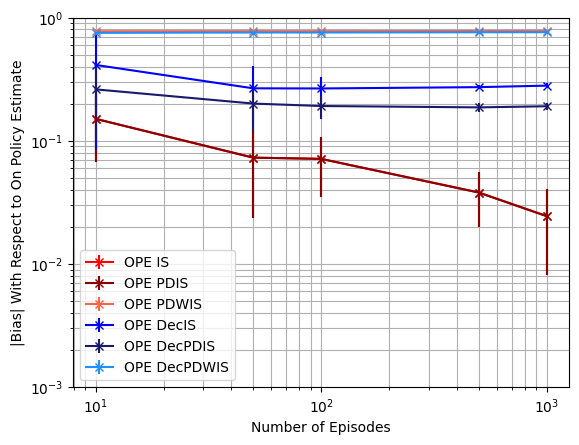

In [ ]:
label = 'bias'
plot_graphs(bias_means, bias_stds, label, 10**-3, 10**0, shorter_D, estimator='IS')

##### Plot Variance

On Policy-----[0.02098755 0.0031274  0.00188993 0.00040869 0.00019376]
OPE IS-----[1.31708592 0.19890883 0.11842557 0.04147915 0.03324173]
OPE PDIS-----[1.31708592 0.19890883 0.11842557 0.04147915 0.03324173]
OPE PDWIS-----[1.86320551e-05 3.79170575e-05 1.84616115e-05 4.70905539e-05
 3.63783771e-05]
OPE DecIS-----[5.10792363e+00 2.14917386e-01 9.52903855e-02 1.46490862e-02
 4.91455497e-03]
OPE DecPDIS-----[1.5314381  0.07018007 0.03251601 0.00775505 0.00245382]
OPE DecPDWIS-----[1.79119270e-04 8.35064793e-05 5.38909788e-05 2.12773330e-05
 1.76682369e-05]


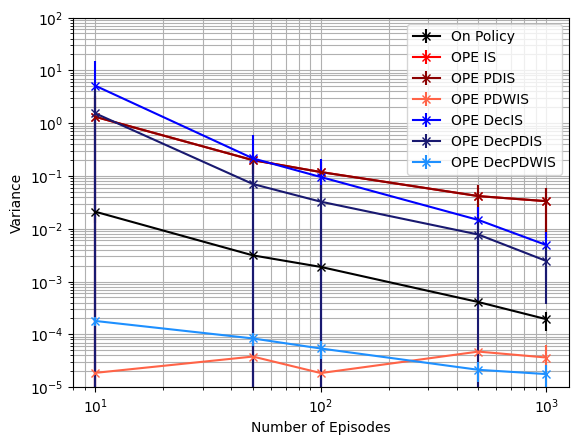

In [ ]:
label = 'var'
plot_graphs(var_means, var_stds, label, 10**(-5), 10**2, shorter_D, estimator='IS')

##### Plot MSE

On Policy-----[0.02098755 0.0031274  0.00188993 0.00040869 0.00019376]
OPE IS-----[1.34662769 0.20663571 0.12483373 0.04325261 0.03410738]
OPE PDIS-----[1.34662769 0.20663571 0.12483373 0.04325261 0.03410738]
OPE PDWIS-----[0.59954013 0.60149446 0.60138301 0.60455749 0.60563379]
OPE DecIS-----[5.38577625 0.30466471 0.17004935 0.08889363 0.08344541]
OPE DecPDIS-----[1.62498488 0.11658361 0.07075341 0.04279907 0.03886095]
OPE DecPDWIS-----[0.56355866 0.57133069 0.57129056 0.57593001 0.57759211]


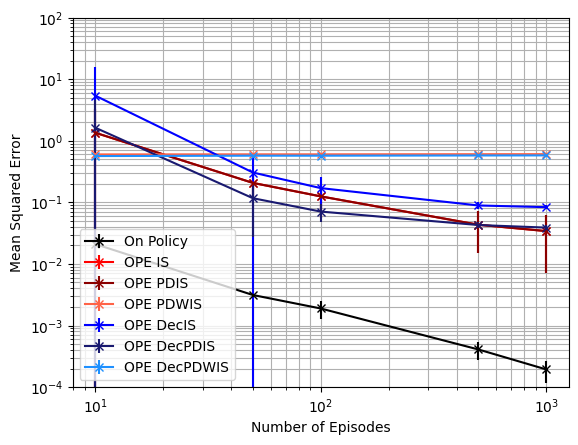

In [ ]:
label = 'MSE'
plot_graphs(MSE_means, MSE_stds, label, 10**(-4), 10**2, shorter_D, estimator='IS')

On Policy-----[0.02098755 0.0031274  0.00188993 0.00040869 0.00019376]
OPE IS-----[1.34662769 0.20663571 0.12483373 0.04325261 0.03410738]
OPE PDIS-----[1.34662769 0.20663571 0.12483373 0.04325261 0.03410738]
OPE PDWIS-----[0.59954013 0.60149446 0.60138301 0.60455749 0.60563379]
OPE DecIS-----[5.38577625 0.30466471 0.17004935 0.08889363 0.08344541]
OPE DecPDIS-----[1.62498488 0.11658361 0.07075341 0.04279907 0.03886095]
OPE DecPDWIS-----[0.56355866 0.57133069 0.57129056 0.57593001 0.57759211]


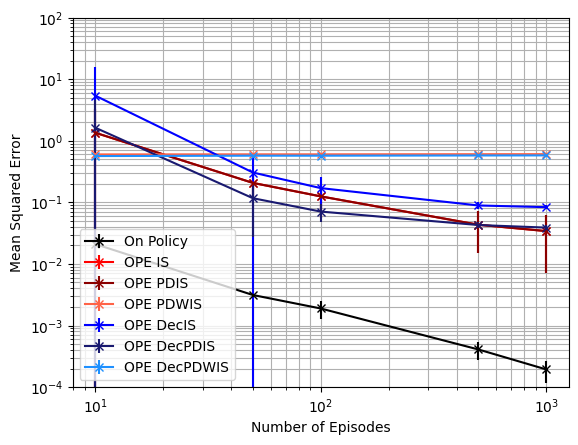

In [ ]:
plot_graphs(MSE_means, MSE_stds, label, 10**(-4), 10**2, shorter_D, estimator='PDIS')

##### Plot ESS

On Policy-----[  10.   50.  100.  500. 1000.]
OPE IS-----[0.88647511 1.24410326 2.20772846 8.79416095 8.43916183]
OPE PDIS-----[0.88647511 1.24410326 2.20772846 8.79416095 8.43916183]
OPE PDWIS-----[22365.89151859 10942.37050387 17489.5878093  14993.5380287
 55481.02183202]
OPE DecIS-----[ 1.52314629  6.91657947  8.58410768 27.0630043  67.09120682]
OPE DecPDIS-----[  3.53501028  11.15926228  15.18838355  64.21494023 154.65500276]
OPE DecPDWIS-----[ 1195.35329106  2025.29048732  3983.11511849 11613.90715695
 15620.75111179]


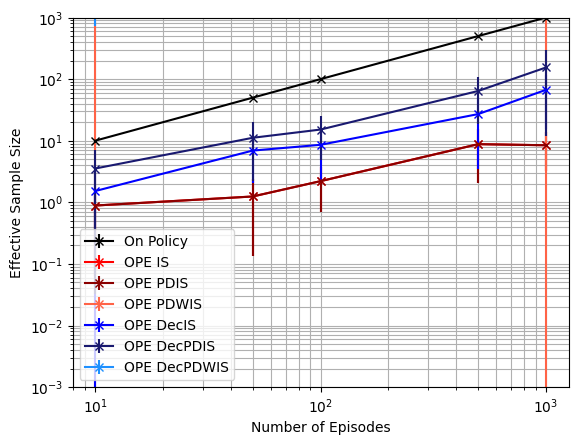

In [ ]:
label = 'ESS'
plot_graphs(ESS_means, ESS_stds, label, 10**(-3), 10**3, shorter_D, estimator='IS')

### Varying Episodes $\epsilon_{e} = 0.6$ (Policy Divergence $3.2^{20}$)

Set up evaluation policy, generate data and convert into factored format

In [ ]:
EVAL_EPSILON = 0.6

evalPolSoft = np.copy(fullPol)
evalPolSoft[evalPolSoft == 1] = 1 - EVAL_EPSILON
evalPolSoft[evalPolSoft == 0] = EVAL_EPSILON / (n_actions - 1)

In [ ]:
# Calculate policy divergence from Voloshin et al.
D = 0
for state in range(randPol.shape[0] - 1):
    for action in range(randPol.shape[1] - 1):
        difference = evalPolSoft[state, action]/randPol[state, action]
        D = max(D, difference)
print(D)
shorter_D = round(D,2)

3.2


In [ ]:
dgen = DataGenerator()
states, actions, lengths, rewards, diab, emp_tx_totals, emp_r_totals = dgen.simulate(
    NSIMSAMPS, NSTEPS, policy=evalPolSoft, policy_idx_type='full',
    p_diabetes=PROB_DIAB, use_tqdm=False) #True, tqdm_desc='Behaviour Policy Simulation')

obs_samps = utils.format_dgen_samps(
    states, actions, rewards, diab, NSTEPS, NSIMSAMPS)

In [ ]:
time = np.arange(NSTEPS)
times = np.stack(axis=0, arrays=[time]*NSIMSAMPS)
times = times[..., np.newaxis]

nf_tr_e = np.concatenate((times, states[:, 0:NSTEPS, :], actions, rewards, states[:, 1:, :]), axis=2)
nf_tr_e.shape

(100000, 20, 5)

In [ ]:
f_tr_e = factorise_dataset(nf_tr_e)

In [ ]:
factored_evalPolSoft = factor_policy(evalPolSoft)

In [ ]:
evalPolSoft = pad_policy(evalPolSoft)

factored_evalPolSoft[0] = pad_policy(factored_evalPolSoft[0])
factored_evalPolSoft[1] = pad_policy(factored_evalPolSoft[1])
factored_evalPolSoft[2] = pad_policy(factored_evalPolSoft[2])

In [ ]:
import policy_estimators as pe
import gc

def evaluate_PE(RUNS, EPISODES, SHORTER_D, STEPS=NSTEPS):

  biases = np.zeros((5, 7))
  variances = np.zeros((5, 7))
  MSEs = np.zeros((5, 7))
  ESSs = np.zeros((5, 7))

  # Reshape data for processing
  T, ldim = nf_tr_b.shape[-2], nf_tr_b.shape[-1]
  nfb = nf_tr_b.reshape((-1, RUNS, EPISODES, T, ldim))
  nfe = nf_tr_e.reshape((-1, RUNS, EPISODES, T, ldim))

  T, D, ldim = f_tr_b.shape[-3], f_tr_b.shape[-2], f_tr_b.shape[-1]
  fb = f_tr_b.reshape((-1, RUNS, EPISODES, T, D, ldim))
  fe = f_tr_e.reshape((-1, RUNS, EPISODES, T, D, ldim))

  for t in range(5):
    print()

    lower_index = 0
    estimates_on_policy = np.zeros(RUNS)
    estimates_OPE_IS = np.zeros(RUNS)
    estimates_OPE_PDIS = np.zeros(RUNS)
    estimates_OPE_PDWIS = np.zeros(RUNS)

    estimates_OPE_DecIS = np.zeros(RUNS)
    estimates_OPE_DecPDIS = np.zeros(RUNS)
    estimates_OPE_DecPDWIS = np.zeros(RUNS)

    for r in range(RUNS):
        #On policy Q estimate
        estimates_on_policy[r] = pe.on_policy_Q_estimate(nfe[t, r, :, :STEPS, :], DISCOUNT_Pol)
        #Off policy IS estimate
        estimates_OPE_IS[r] = pe.off_policy_IS_estimator(nfb[t, r, :, :STEPS, :], DISCOUNT_Pol, randPol, evalPolSoft)
        #Off policy PDIS estimate
        estimates_OPE_PDIS[r] = pe.off_policy_PDIS_estimator(nfb[t, r, :, :STEPS, :], DISCOUNT_Pol, randPol, evalPolSoft)
        #Off policy PDWIS estimate
        estimates_OPE_PDWIS[r] = pe.off_policy_PDWIS_estimator(nfb[t, r, :, :STEPS, :], DISCOUNT_Pol, randPol, evalPolSoft)

        #Factorisation 1----------------------------------

        #Off policy decomposed IS estimate
        estimates_OPE_DecIS[r], _ = pe.off_policy_DecIS_estimator(fb[t, r, :, :STEPS, :, :], DISCOUNT_Pol, [0,1], factored_randPol, factored_evalPolSoft)
        #Off policy decomposed PDIS estimate
        estimates_OPE_DecPDIS[r], _ = pe.off_policy_DecPDIS_estimator(fb[t, r, :, :STEPS, :, :], DISCOUNT_Pol, [0,1], factored_randPol, factored_evalPolSoft)
        #Off policy decomposed PDWIS estimate
        estimates_OPE_DecPDWIS[r], _ = pe.off_policy_DecPDWIS_estimator(fb[t, r, :, :STEPS, :, :], DISCOUNT_Pol, [0,1], factored_randPol, factored_evalPolSoft)


    mean_on_policy = np.mean(estimates_on_policy)
    var_on_policy = np.var(estimates_on_policy, ddof=0)
    print(f'Mean on policy Q estimate: {mean_on_policy}. Variance of on policy Q estimate: {var_on_policy}')

    from sklearn.metrics import mean_squared_error

    #For on policy
    biases[t, 0] = 0.0
    variances[t, 0] = var_on_policy
    MSEs[t, 0] = var_on_policy
    ESSs[t, 0] = EPISODES

    def generate_results(estimates, mean_true, label):
      MSE = mean_squared_error(estimates, [mean_true]*RUNS)
      mean = np.mean(estimates)
      var = np.var(estimates, ddof=0)
      bias1 = np.sqrt(MSE - var)
      bias2 = abs(mean - mean_true)
      print(f'Mean {label} estimate: {mean}. Bias1: {bias1}. Bias2: {bias2}. Variance: {var}. MSE: {MSE}')
      return bias1, var, MSE

    label_list = ['OPE IS', 'OPE PDIS', 'OPE PDWIS',
                  'OPE DecIS', 'OPE DecPDIS', 'OPE DecPDWIS'
                  ]

    estimates = [estimates_OPE_IS, estimates_OPE_PDIS, estimates_OPE_PDWIS,
                estimates_OPE_DecIS, estimates_OPE_DecPDIS, estimates_OPE_DecPDWIS
                ]


    for (id, val) in enumerate(label_list):
      biases[t, 1+id], variances[t, 1+id], MSEs[t, 1+id] = generate_results(estimates[id], mean_on_policy, label_list[id])
      ESSs[t, 1+id] = (EPISODES*variances[t, 0])/variances[t, 1+id]
      gc.collect()

  return np.mean(biases, axis=0), np.std(biases, axis=0), np.mean(variances, axis=0), np.std(variances, axis=0), np.mean(MSEs, axis=0), np.std(MSEs, axis=0), np.mean(ESSs, axis=0), np.std(ESSs, axis=0)

#### Run Everything

In [ ]:
EPISODES = [10, 50, 100, 500, 1000]

bias_means = np.zeros((len(EPISODES), 7))
bias_stds = np.zeros((len(EPISODES), 7))
var_means = np.zeros((len(EPISODES), 7))
var_stds = np.zeros((len(EPISODES), 7))
MSE_means = np.zeros((len(EPISODES), 7))
MSE_stds = np.zeros((len(EPISODES), 7))
ESS_means = np.zeros((len(EPISODES), 7))
ESS_stds = np.zeros((len(EPISODES), 7))

RUNS = 20

for id in range(len(EPISODES)):
  e = EPISODES[id]
  print(f'{e} Episodes, {RUNS} ----------------------------------')
  bias_means[id, :], bias_stds[id, :], var_means[id, :], var_stds[id, :], MSE_means[id, :], MSE_stds[id, :], ESS_means[id, :], ESS_stds[id, :] = evaluate_PE(RUNS=RUNS, EPISODES=e, SHORTER_D=shorter_D)
  print()
  gc.collect()

print('BIAS MEANS')
print(list(bias_means))
print('\nBIAS STDS')
print(list(bias_stds))
print('\nVAR MEANS')
print(list(var_means))
print('\nVAR STDS')
print(list(var_stds))
print('\nMSE MEANS')
print(list(MSE_means))
print('\nMSE STDS')
print(list(MSE_stds))
print('\nESS MEANS')
print(list(ESS_means))
print('\nESS STDS')
print(list(ESS_stds))

10 Episodes, 20 ----------------------------------

Mean on policy Q estimate: -0.8598999040453723. Variance of on policy Q estimate: 0.010012702160905577
Mean OPE IS estimate: -1.0125242702397323. Bias1: 0.15262436619436165. Bias2: 0.15262436619436004. Variance: 1.1086989865772423. MSE: 1.131993183733473
Mean OPE PDIS estimate: -1.0125242702397323. Bias1: 0.15262436619436165. Bias2: 0.15262436619436004. Variance: 1.1086989865772423. MSE: 1.131993183733473
Mean OPE PDWIS estimate: -0.0474941043615205. Bias1: 0.8124057996838518. Bias2: 0.8124057996838518. Variance: 1.335591403709761e-05. MSE: 0.660016539273996
Mean OPE DecIS estimate: -0.9630130547832285. Bias1: 0.1031131507378596. Bias2: 0.10311315073785621. Variance: 2.506011909747265. MSE: 2.5166442316023536
Mean OPE DecPDIS estimate: -0.9051717500210941. Bias1: 0.045271845975722924. Bias2: 0.04527184597572176. Variance: 0.9283741619200974. MSE: 0.9304237019581469
Mean OPE DecPDWIS estimate: -0.04904769169260155. Bias1: 0.81085221235

#### Plot Graphs

##### Plot Bias

OPE IS-----[0.06694319 0.0451347  0.03954162 0.00405826 0.01732909]
OPE PDIS-----[0.06694319 0.0451347  0.03954162 0.00405826 0.01732909]
OPE PDWIS-----[0.82894778 0.84675098 0.85559593 0.8618897  0.8626032 ]
OPE DecIS-----[0.27676407 0.35296563 0.35265473 0.3540913  0.3599007 ]
OPE DecPDIS-----[0.20248385 0.27091684 0.26996598 0.26679212 0.27043078]
OPE DecPDWIS-----[0.82689486 0.84589196 0.85463449 0.86102245 0.86196286]


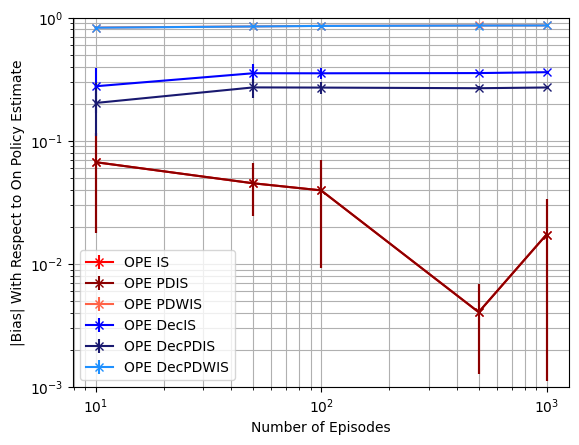

In [ ]:
label = 'bias'
plot_graphs(bias_means, bias_stds, label, 10**(-3), 10**0, shorter_D, estimator='IS')

##### Plot Variance

On Policy-----[0.01145193 0.0018717  0.00082575 0.00023565 0.0001098 ]
OPE IS-----[0.34918104 0.05258771 0.03695503 0.00825766 0.01672038]
OPE PDIS-----[0.34918104 0.05258771 0.03695503 0.00825766 0.01672038]
OPE PDWIS-----[7.83104758e-06 1.67272844e-05 1.07527252e-05 1.19468426e-05
 1.39933632e-05]
OPE DecIS-----[0.56677536 0.02696968 0.01663216 0.00343107 0.00117126]
OPE DecPDIS-----[0.21601785 0.01295953 0.00763492 0.00289537 0.00095239]
OPE DecPDWIS-----[3.06778442e-05 1.19594140e-05 6.00276369e-06 4.41711878e-06
 2.16939149e-06]


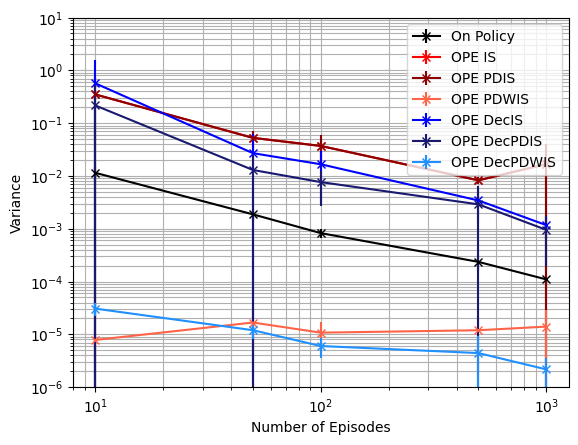

In [ ]:
label = 'var'
plot_graphs(var_means, var_stds, label, 10**(-6), 10**1, shorter_D, estimator='IS')

##### Plot MSE

On Policy-----[0.01145193 0.0018717  0.00082575 0.00023565 0.0001098 ]
OPE IS-----[0.35607773 0.05505564 0.03943493 0.00828182 0.0172832 ]
OPE PDIS-----[0.35607773 0.05505564 0.03943493 0.00828182 0.0172832 ]
OPE PDWIS-----[0.68754501 0.71713248 0.73217907 0.74288132 0.74410546]
OPE DecIS-----[0.65552144 0.15569423 0.14246162 0.12883641 0.13075685]
OPE DecPDIS-----[0.26583932 0.08858603 0.08134323 0.0741709  0.07411781]
OPE DecPDWIS-----[0.68416833 0.71567526 0.73052995 0.74137711 0.74298994]


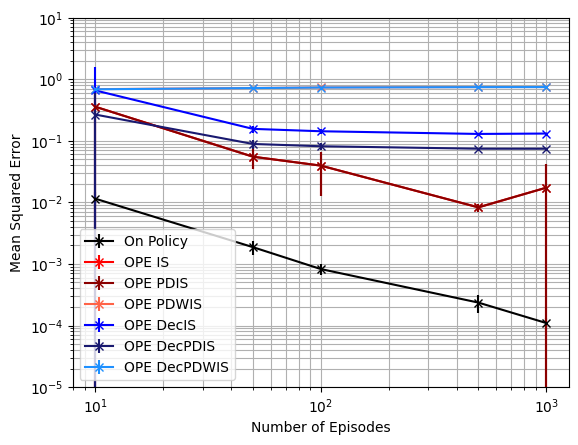

In [ ]:
label = 'MSE'
plot_graphs(MSE_means, MSE_stds, label, 10**(-5), 10**1, shorter_D, estimator='IS')

##### Plot ESS

On Policy-----[  10.   50.  100.  500. 1000.]
OPE IS-----[ 0.83359551  2.1005324   2.87818382 14.68996329 18.77212203]
OPE PDIS-----[ 0.83359551  2.1005324   2.87818382 14.68996329 18.77212203]
OPE PDWIS-----[32744.09094482 13034.78848697 10532.96701064 18716.14331909
 37627.42390025]
OPE DecIS-----[  2.15242659  10.04881977   9.53242417  42.73268231 106.09618937]
OPE DecPDIS-----[  3.80341388  14.03584721  15.11279002  75.0103018  179.00472211]
OPE DecPDWIS-----[ 4158.26666023  8931.19602543 15999.28339046 49745.58189295
 65310.11919297]


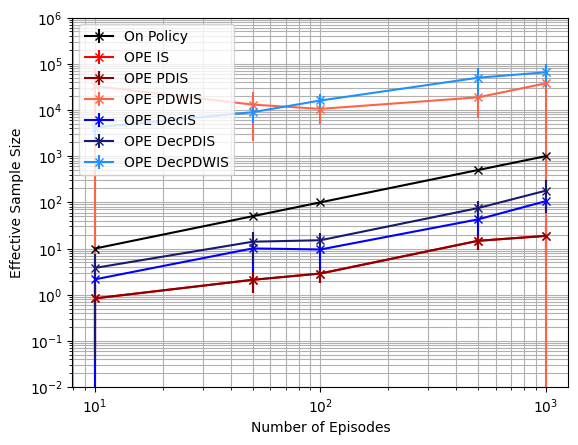

In [ ]:
label = 'ESS'
plot_graphs(ESS_means, ESS_stds, label, 10**(-2), 10**6, shorter_D, estimator='IS')

### Varying Episodes $\epsilon_{e} = 0.8$ (Policy Divergence $1.6^{20}$)



Set up evaluation policy, generate data and convert into factored format

In [ ]:
EVAL_EPSILON = 0.8

evalPolSoft = np.copy(fullPol)
evalPolSoft[evalPolSoft == 1] = 1 - EVAL_EPSILON
evalPolSoft[evalPolSoft == 0] = EVAL_EPSILON / (n_actions - 1)

In [ ]:
# Calculate policy divergence from Voloshin et al.
D = 0
for state in range(randPol.shape[0] - 1):
    for action in range(randPol.shape[1] - 1):
        difference = evalPolSoft[state, action]/randPol[state, action]
        D = max(D, difference)
print(D)
shorter_D = round(D,2)

1.5999999999999996


In [ ]:
dgen = DataGenerator()
states, actions, lengths, rewards, diab, emp_tx_totals, emp_r_totals = dgen.simulate(
    NSIMSAMPS, NSTEPS, policy=evalPolSoft, policy_idx_type='full',
    p_diabetes=PROB_DIAB, use_tqdm=False) #True, tqdm_desc='Behaviour Policy Simulation')

obs_samps = utils.format_dgen_samps(
    states, actions, rewards, diab, NSTEPS, NSIMSAMPS)

In [ ]:
time = np.arange(NSTEPS)
times = np.stack(axis=0, arrays=[time]*NSIMSAMPS)
times = times[..., np.newaxis]

nf_tr_e = np.concatenate((times, states[:, 0:NSTEPS, :], actions, rewards, states[:, 1:, :]), axis=2)
nf_tr_e.shape

(100000, 20, 5)

In [ ]:
f_tr_e = factorise_dataset(nf_tr_e)

In [ ]:
factored_evalPolSoft = factor_policy(evalPolSoft)

In [ ]:
evalPolSoft = pad_policy(evalPolSoft)

factored_evalPolSoft[0] = pad_policy(factored_evalPolSoft[0])
factored_evalPolSoft[1] = pad_policy(factored_evalPolSoft[1])
factored_evalPolSoft[2] = pad_policy(factored_evalPolSoft[2])

In [ ]:
import policy_estimators as pe
import gc

def evaluate_PE(RUNS, EPISODES, SHORTER_D, STEPS=NSTEPS):

  biases = np.zeros((5, 7))
  variances = np.zeros((5, 7))
  MSEs = np.zeros((5, 7))
  ESSs = np.zeros((5, 7))

  # Reshape data for processing
  T, ldim = nf_tr_b.shape[-2], nf_tr_b.shape[-1]
  nfb = nf_tr_b.reshape((-1, RUNS, EPISODES, T, ldim))
  nfe = nf_tr_e.reshape((-1, RUNS, EPISODES, T, ldim))

  T, D, ldim = f_tr_b.shape[-3], f_tr_b.shape[-2], f_tr_b.shape[-1]
  fb = f_tr_b.reshape((-1, RUNS, EPISODES, T, D, ldim))
  fe = f_tr_e.reshape((-1, RUNS, EPISODES, T, D, ldim))

  for t in range(5):
    print()

    lower_index = 0
    estimates_on_policy = np.zeros(RUNS)
    estimates_OPE_IS = np.zeros(RUNS)
    estimates_OPE_PDIS = np.zeros(RUNS)
    estimates_OPE_PDWIS = np.zeros(RUNS)

    estimates_OPE_DecIS = np.zeros(RUNS)
    estimates_OPE_DecPDIS = np.zeros(RUNS)
    estimates_OPE_DecPDWIS = np.zeros(RUNS)

    for r in range(RUNS):
        #On policy Q estimate
        estimates_on_policy[r] = pe.on_policy_Q_estimate(nfe[t, r, :, :STEPS, :], DISCOUNT_Pol)
        #Off policy IS estimate
        estimates_OPE_IS[r] = pe.off_policy_IS_estimator(nfb[t, r, :, :STEPS, :], DISCOUNT_Pol, randPol, evalPolSoft)
        #Off policy PDIS estimate
        estimates_OPE_PDIS[r] = pe.off_policy_PDIS_estimator(nfb[t, r, :, :STEPS, :], DISCOUNT_Pol, randPol, evalPolSoft)
        #Off policy PDWIS estimate
        estimates_OPE_PDWIS[r] = pe.off_policy_PDWIS_estimator(nfb[t, r, :, :STEPS, :], DISCOUNT_Pol, randPol, evalPolSoft)

        #Factorisation 1----------------------------------

        #Off policy decomposed IS estimate
        estimates_OPE_DecIS[r], _ = pe.off_policy_DecIS_estimator(fb[t, r, :, :STEPS, :, :], DISCOUNT_Pol, [0,1], factored_randPol, factored_evalPolSoft)
        #Off policy decomposed PDIS estimate
        estimates_OPE_DecPDIS[r], _ = pe.off_policy_DecPDIS_estimator(fb[t, r, :, :STEPS, :, :], DISCOUNT_Pol, [0,1], factored_randPol, factored_evalPolSoft)
        #Off policy decomposed PDWIS estimate
        estimates_OPE_DecPDWIS[r], _ = pe.off_policy_DecPDWIS_estimator(fb[t, r, :, :STEPS, :, :], DISCOUNT_Pol, [0,1], factored_randPol, factored_evalPolSoft)


    mean_on_policy = np.mean(estimates_on_policy)
    var_on_policy = np.var(estimates_on_policy, ddof=0)
    print(f'Mean on policy Q estimate: {mean_on_policy}. Variance of on policy Q estimate: {var_on_policy}')

    from sklearn.metrics import mean_squared_error

    #For on policy
    biases[t, 0] = 0.0
    variances[t, 0] = var_on_policy
    MSEs[t, 0] = var_on_policy
    ESSs[t, 0] = EPISODES

    def generate_results(estimates, mean_true, label):
      MSE = mean_squared_error(estimates, [mean_true]*RUNS)
      mean = np.mean(estimates)
      var = np.var(estimates, ddof=0)
      bias1 = np.sqrt(MSE - var)
      bias2 = abs(mean - mean_true)
      print(f'Mean {label} estimate: {mean}. Bias1: {bias1}. Bias2: {bias2}. Variance: {var}. MSE: {MSE}')
      return bias1, var, MSE

    label_list = ['OPE IS', 'OPE PDIS', 'OPE PDWIS',
                  'OPE DecIS', 'OPE DecPDIS', 'OPE DecPDWIS'
                  ]

    estimates = [estimates_OPE_IS, estimates_OPE_PDIS, estimates_OPE_PDWIS,
                estimates_OPE_DecIS, estimates_OPE_DecPDIS, estimates_OPE_DecPDWIS
                ]


    for (id, val) in enumerate(label_list):
      biases[t, 1+id], variances[t, 1+id], MSEs[t, 1+id] = generate_results(estimates[id], mean_on_policy, label_list[id])
      ESSs[t, 1+id] = (EPISODES*variances[t, 0])/variances[t, 1+id]
      gc.collect()

  return np.mean(biases, axis=0), np.std(biases, axis=0), np.mean(variances, axis=0), np.std(variances, axis=0), np.mean(MSEs, axis=0), np.std(MSEs, axis=0), np.mean(ESSs, axis=0), np.std(ESSs, axis=0)

#### Run Everything

In [ ]:
EPISODES = [10, 50, 100, 500, 1000]

bias_means = np.zeros((len(EPISODES), 7))
bias_stds = np.zeros((len(EPISODES), 7))
var_means = np.zeros((len(EPISODES), 7))
var_stds = np.zeros((len(EPISODES), 7))
MSE_means = np.zeros((len(EPISODES), 7))
MSE_stds = np.zeros((len(EPISODES), 7))
ESS_means = np.zeros((len(EPISODES), 7))
ESS_stds = np.zeros((len(EPISODES), 7))

RUNS = 20

for id in range(len(EPISODES)):
  e = EPISODES[id]
  print(f'{e} Episodes, {RUNS} ----------------------------------')
  bias_means[id, :], bias_stds[id, :], var_means[id, :], var_stds[id, :], MSE_means[id, :], MSE_stds[id, :], ESS_means[id, :], ESS_stds[id, :] = evaluate_PE(RUNS=RUNS, EPISODES=e, SHORTER_D=shorter_D)
  print()
  gc.collect()

print('BIAS MEANS')
print(list(bias_means))
print('\nBIAS STDS')
print(list(bias_stds))
print('\nVAR MEANS')
print(list(var_means))
print('\nVAR STDS')
print(list(var_stds))
print('\nMSE MEANS')
print(list(MSE_means))
print('\nMSE STDS')
print(list(MSE_stds))
print('\nESS MEANS')
print(list(ESS_means))
print('\nESS STDS')
print(list(ESS_stds))

10 Episodes, 20 ----------------------------------

Mean on policy Q estimate: -0.9542210355483359. Variance of on policy Q estimate: 0.0038420401794697925
Mean OPE IS estimate: -0.9451580877164568. Bias1: 0.009062947831879099. Bias2: 0.009062947831879109. Variance: 0.0268967198980714. MSE: 0.026978856921474764
Mean OPE PDIS estimate: -0.9451580877164568. Bias1: 0.009062947831879099. Bias2: 0.009062947831879109. Variance: 0.0268967198980714. MSE: 0.026978856921474764
Mean OPE PDWIS estimate: -0.048074469198573014. Bias1: 0.9061465663497629. Bias2: 0.9061465663497629. Variance: 8.596598726292522e-06. MSE: 0.8211101963061915
Mean OPE DecIS estimate: -0.5968182139667156. Bias1: 0.3574028215816203. Bias2: 0.3574028215816203. Variance: 0.01084302924757349. MSE: 0.13857980612207701
Mean OPE DecPDIS estimate: -0.6555963651861803. Bias1: 0.29862467036215573. Bias2: 0.2986246703621557. Variance: 0.009705039706371814. MSE: 0.09888173345527798
Mean OPE DecPDWIS estimate: -0.03609781830519623. Bia

#### Plot Graphs

##### Plot Bias

OPE IS-----[0.01623898 0.01616412 0.00712101 0.00434731 0.00350563]
OPE PDIS-----[0.01623898 0.01616412 0.00712101 0.00434731 0.00350563]
OPE PDWIS-----[0.9012352  0.90530457 0.90504174 0.90503643 0.90530072]
OPE DecIS-----[0.35813942 0.3738468  0.36967616 0.36618807 0.36799259]
OPE DecPDIS-----[0.30170842 0.31732701 0.31343473 0.30990367 0.31113235]
OPE DecPDWIS-----[0.91326403 0.9174615  0.91720477 0.91717961 0.91742536]


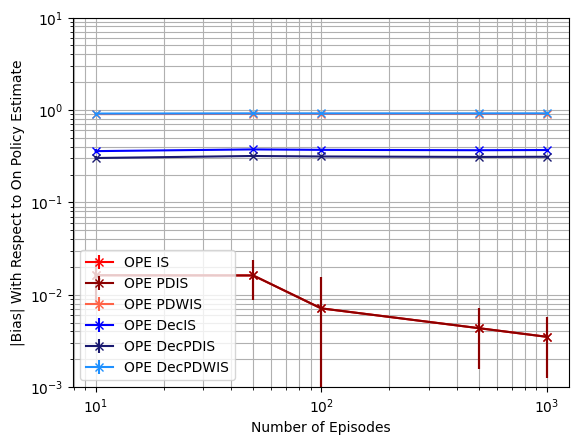

In [ ]:
label = 'bias'
plot_graphs(bias_means, bias_stds, label, 10**(-3), 10**1, shorter_D, estimator='IS')

##### Plot Variance

On Policy-----[4.60896543e-03 8.24307159e-04 5.16721833e-04 9.19062497e-05
 5.39630736e-05]
OPE IS-----[0.01465746 0.00318756 0.00192168 0.00035912 0.00020448]
OPE PDIS-----[0.01465746 0.00318756 0.00192168 0.00035912 0.00020448]
OPE PDWIS-----[4.34905373e-06 2.58227615e-06 1.49255577e-06 4.00173322e-07
 2.03135318e-07]
OPE DecIS-----[6.90859868e-03 1.26531602e-03 7.79343015e-04 1.45100496e-04
 7.74323168e-05]
OPE DecPDIS-----[5.09857582e-03 1.11291162e-03 5.48007396e-04 1.21874591e-04
 6.11828458e-05]
OPE DecPDWIS-----[4.87935483e-06 1.47369068e-06 6.01237547e-07 1.86736861e-07
 9.90570177e-08]


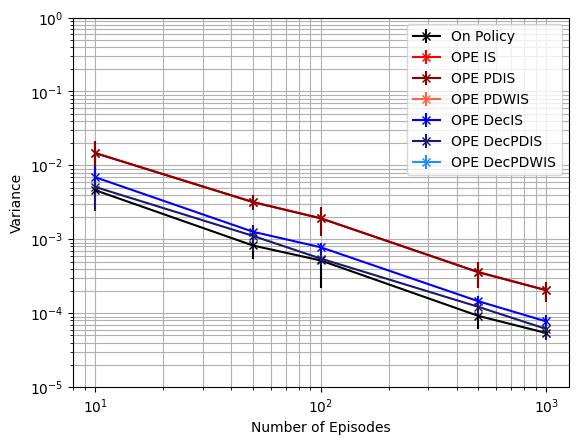

In [ ]:
label = 'var'
plot_graphs(var_means, var_stds, label, 10**(-5), 10**0, shorter_D, estimator='IS')

##### Plot MSE

On Policy-----[4.60896543e-03 8.24307159e-04 5.16721833e-04 9.19062497e-05
 5.39630736e-05]
OPE IS-----[0.01499341 0.00350472 0.00204158 0.00038564 0.0002218 ]
OPE PDIS-----[0.01499341 0.00350472 0.00204158 0.00038564 0.0002218 ]
OPE PDWIS-----[0.81230214 0.81960426 0.81912587 0.81909844 0.81957259]
OPE DecIS-----[0.13558059 0.14113756 0.13746749 0.13424334 0.13549751]
OPE DecPDIS-----[0.09639638 0.10188876 0.09880999 0.09616792 0.09686561]
OPE DecPDWIS-----[0.83412752 0.84176106 0.84128926 0.84122549 0.84167232]


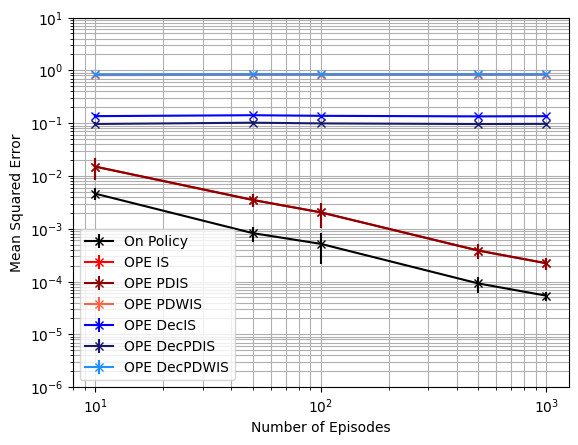

In [ ]:
label = 'MSE'
plot_graphs(MSE_means, MSE_stds, label, 10**(-6), 10**1, shorter_D, estimator='IS')

##### Plot ESS

On Policy-----[  10.   50.  100.  500. 1000.]
OPE IS-----[  3.61380357  14.38317779  30.92412737 151.83398959 287.59858855]
OPE PDIS-----[  3.61380357  14.38317779  30.92412737 151.83398959 287.59858855]
OPE PDWIS-----[ 13936.89927036  27220.83122517  33570.87357034 157478.40024703
 330063.7691557 ]
OPE DecIS-----[  7.76177805  33.74060588  70.12041067 327.28527275 745.81879453]
OPE DecPDIS-----[ 11.53109743  43.72513572 103.5929333  382.66804308 964.4390299 ]
OPE DecPDWIS-----[  9850.76168624  39092.5858548  104113.11446682 283527.40787512
 585286.98558932]


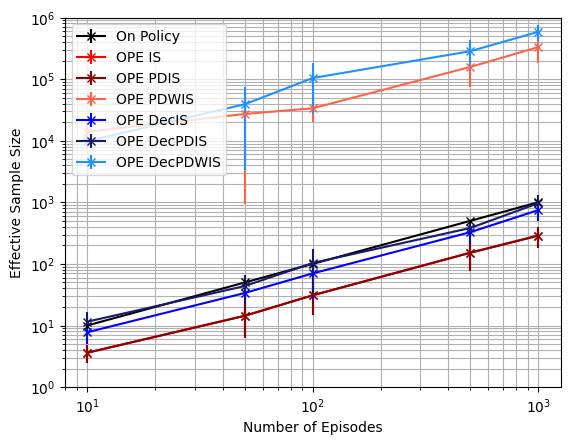

In [ ]:
label = 'ESS'
plot_graphs(ESS_means, ESS_stds, label, 10**(0), 10**6, shorter_D, estimator='IS')

### Varying Episode Length $T$ With $\epsilon_{e} = 0.8$ (Policy Divergence $1.6^{T}$)

Set up evaluation policy, generate data and convert into factored format

In [ ]:
EVAL_EPSILON = 0.8

evalPolSoft = np.copy(fullPol)
evalPolSoft[evalPolSoft == 1] = 1 - EVAL_EPSILON
evalPolSoft[evalPolSoft == 0] = EVAL_EPSILON / (n_actions - 1)

In [ ]:
# Calculate policy divergence from Voloshin et al.
D = 0
for state in range(randPol.shape[0] - 1):
    for action in range(randPol.shape[1] - 1):
        difference = evalPolSoft[state, action]/randPol[state, action]
        D = max(D, difference)
print(D)
shorter_D = round(D,2)

1.5999999999999996


In [ ]:
dgen = DataGenerator()
states, actions, lengths, rewards, diab, emp_tx_totals, emp_r_totals = dgen.simulate(
    NSIMSAMPS, NSTEPS, policy=evalPolSoft, policy_idx_type='full',
    p_diabetes=PROB_DIAB, use_tqdm=False) #True, tqdm_desc='Behaviour Policy Simulation')

obs_samps = utils.format_dgen_samps(
    states, actions, rewards, diab, NSTEPS, NSIMSAMPS)

In [ ]:
time = np.arange(NSTEPS)
times = np.stack(axis=0, arrays=[time]*NSIMSAMPS)
times = times[..., np.newaxis]

nf_tr_e = np.concatenate((times, states[:, 0:NSTEPS, :], actions, rewards, states[:, 1:, :]), axis=2)
nf_tr_e.shape

(100000, 20, 5)

In [ ]:
f_tr_e = factorise_dataset(nf_tr_e)

In [ ]:
factored_evalPolSoft = factor_policy(evalPolSoft)

In [ ]:
evalPolSoft = pad_policy(evalPolSoft)

factored_evalPolSoft[0] = pad_policy(factored_evalPolSoft[0])
factored_evalPolSoft[1] = pad_policy(factored_evalPolSoft[1])
factored_evalPolSoft[2] = pad_policy(factored_evalPolSoft[2])

In [ ]:
import policy_estimators as pe
import gc

def evaluate_PE(RUNS, EPISODES, SHORTER_D, STEPS=NSTEPS):

  biases = np.zeros((5, 7))
  variances = np.zeros((5, 7))
  MSEs = np.zeros((5, 7))
  ESSs = np.zeros((5, 7))

  # Reshape data for processing
  T, ldim = nf_tr_b.shape[-2], nf_tr_b.shape[-1]
  nfb = nf_tr_b.reshape((-1, RUNS, EPISODES, T, ldim))
  nfe = nf_tr_e.reshape((-1, RUNS, EPISODES, T, ldim))

  T, D, ldim = f_tr_b.shape[-3], f_tr_b.shape[-2], f_tr_b.shape[-1]
  fb = f_tr_b.reshape((-1, RUNS, EPISODES, T, D, ldim))
  fe = f_tr_e.reshape((-1, RUNS, EPISODES, T, D, ldim))

  for t in range(5):
    print()

    lower_index = 0
    estimates_on_policy = np.zeros(RUNS)
    estimates_OPE_IS = np.zeros(RUNS)
    estimates_OPE_PDIS = np.zeros(RUNS)
    estimates_OPE_PDWIS = np.zeros(RUNS)

    estimates_OPE_DecIS = np.zeros(RUNS)
    estimates_OPE_DecPDIS = np.zeros(RUNS)
    estimates_OPE_DecPDWIS = np.zeros(RUNS)

    for r in range(RUNS):
        #On policy Q estimate
        estimates_on_policy[r] = pe.on_policy_Q_estimate(nfe[t, r, :, :STEPS, :], DISCOUNT_Pol)
        #Off policy IS estimate
        estimates_OPE_IS[r] = pe.off_policy_IS_estimator(nfb[t, r, :, :STEPS, :], DISCOUNT_Pol, randPol, evalPolSoft)
        #Off policy PDIS estimate
        estimates_OPE_PDIS[r] = pe.off_policy_PDIS_estimator(nfb[t, r, :, :STEPS, :], DISCOUNT_Pol, randPol, evalPolSoft)
        #Off policy PDWIS estimate
        estimates_OPE_PDWIS[r] = pe.off_policy_PDWIS_estimator(nfb[t, r, :, :STEPS, :], DISCOUNT_Pol, randPol, evalPolSoft)

        #Factorisation 1----------------------------------

        #Off policy decomposed IS estimate
        estimates_OPE_DecIS[r], _ = pe.off_policy_DecIS_estimator(fb[t, r, :, :STEPS, :, :], DISCOUNT_Pol, [0,1], factored_randPol, factored_evalPolSoft)
        #Off policy decomposed PDIS estimate
        estimates_OPE_DecPDIS[r], _ = pe.off_policy_DecPDIS_estimator(fb[t, r, :, :STEPS, :, :], DISCOUNT_Pol, [0,1], factored_randPol, factored_evalPolSoft)
        #Off policy decomposed PDWIS estimate
        estimates_OPE_DecPDWIS[r], _ = pe.off_policy_DecPDWIS_estimator(fb[t, r, :, :STEPS, :, :], DISCOUNT_Pol, [0,1], factored_randPol, factored_evalPolSoft)


    mean_on_policy = np.mean(estimates_on_policy)
    var_on_policy = np.var(estimates_on_policy, ddof=0)
    print(f'Mean on policy Q estimate: {mean_on_policy}. Variance of on policy Q estimate: {var_on_policy}')

    from sklearn.metrics import mean_squared_error

    #For on policy
    biases[t, 0] = 0.0
    variances[t, 0] = var_on_policy
    MSEs[t, 0] = var_on_policy
    ESSs[t, 0] = EPISODES

    def generate_results(estimates, mean_true, label):
      MSE = mean_squared_error(estimates, [mean_true]*RUNS)
      mean = np.mean(estimates)
      var = np.var(estimates, ddof=0)
      bias1 = np.sqrt(MSE - var)
      bias2 = abs(mean - mean_true)
      print(f'Mean {label} estimate: {mean}. Bias1: {bias1}. Bias2: {bias2}. Variance: {var}. MSE: {MSE}')
      return bias1, var, MSE

    label_list = ['OPE IS', 'OPE PDIS', 'OPE PDWIS',
                  'OPE DecIS', 'OPE DecPDIS', 'OPE DecPDWIS'
                  ]

    estimates = [estimates_OPE_IS, estimates_OPE_PDIS, estimates_OPE_PDWIS,
                estimates_OPE_DecIS, estimates_OPE_DecPDIS, estimates_OPE_DecPDWIS
                ]


    for (id, val) in enumerate(label_list):
      biases[t, 1+id], variances[t, 1+id], MSEs[t, 1+id] = generate_results(estimates[id], mean_on_policy, label_list[id])
      ESSs[t, 1+id] = (EPISODES*variances[t, 0])/variances[t, 1+id]
      gc.collect()

  return np.mean(biases, axis=0), np.std(biases, axis=0), np.mean(variances, axis=0), np.std(variances, axis=0), np.mean(MSEs, axis=0), np.std(MSEs, axis=0), np.mean(ESSs, axis=0), np.std(ESSs, axis=0)

#### Run Everything

In [ ]:
STEPS = [1, 2, 5, 10, 15, 20]

bias_means = np.zeros((len(STEPS), 7))
bias_stds = np.zeros((len(STEPS), 7))
var_means = np.zeros((len(STEPS), 7))
var_stds = np.zeros((len(STEPS), 7))
MSE_means = np.zeros((len(STEPS), 7))
MSE_stds = np.zeros((len(STEPS), 7))
ESS_means = np.zeros((len(STEPS), 7))
ESS_stds = np.zeros((len(STEPS), 7))

RUNS = 20

for id in range(len(STEPS)):
  e = STEPS[id]
  print(f'{e} Steps, {RUNS} ----------------------------------')
  bias_means[id, :], bias_stds[id, :], var_means[id, :], var_stds[id, :], MSE_means[id, :], MSE_stds[id, :], ESS_means[id, :], ESS_stds[id, :] = evaluate_PE(RUNS=RUNS, EPISODES=1000, STEPS=e, SHORTER_D=shorter_D)
  print()
  gc.collect()

print('BIAS MEANS')
print(list(bias_means))
print('\nBIAS STDS')
print(list(bias_stds))
print('\nVAR MEANS')
print(list(var_means))
print('\nVAR STDS')
print(list(var_stds))
print('\nMSE MEANS')
print(list(MSE_means))
print('\nMSE STDS')
print(list(MSE_stds))
print('\nESS MEANS')
print(list(ESS_means))
print('\nESS STDS')
print(list(ESS_stds))

1 Steps, 20 ----------------------------------

Mean on policy Q estimate: -0.3957. Variance of on policy Q estimate: 0.00015200999999999976
Mean OPE IS estimate: -0.39795428571428576. Bias1: 0.0022542857142857846. Bias2: 0.002254285714285764. Variance: 0.00020678778775510203. MSE: 0.000211869591836735
Mean OPE PDIS estimate: -0.39795428571428576. Bias1: 0.0022542857142857846. Bias2: 0.002254285714285764. Variance: 0.00020678778775510203. MSE: 0.000211869591836735
Mean OPE PDWIS estimate: -0.3984641687855895. Bias1: 0.002764168785589503. Bias2: 0.0027641687855894936. Variance: 0.00020939615058677524. MSE: 0.0002170367796620026
Mean OPE DecIS estimate: -0.2646272727272727. Bias1: 0.13107272727272729. Bias2: 0.13107272727272729. Variance: 9.195822773186389e-05. MSE: 0.01727201806244261
Mean OPE DecPDIS estimate: -0.2646272727272727. Bias1: 0.13107272727272729. Bias2: 0.13107272727272729. Variance: 9.195822773186389e-05. MSE: 0.01727201806244261
Mean OPE DecPDWIS estimate: -0.264769375911

#### Plot Graphs

##### Plot Bias

OPE IS-----[0.00291029 0.00752031 0.00758667 0.00344311 0.00364895 0.00301623]
OPE PDIS-----[0.00291029 0.00752031 0.00758667 0.00344311 0.00364895 0.00301623]
OPE PDWIS-----[0.0031054  0.30096503 0.68416257 0.83842759 0.88405899 0.90643612]
OPE DecIS-----[0.13019576 0.24427421 0.33268091 0.359853   0.36615826 0.36912799]
OPE DecPDIS-----[0.13019576 0.19674181 0.27528867 0.30274951 0.30925261 0.31226775]
OPE DecPDWIS-----[0.13036168 0.394894   0.73191859 0.86281634 0.90027687 0.91856076]


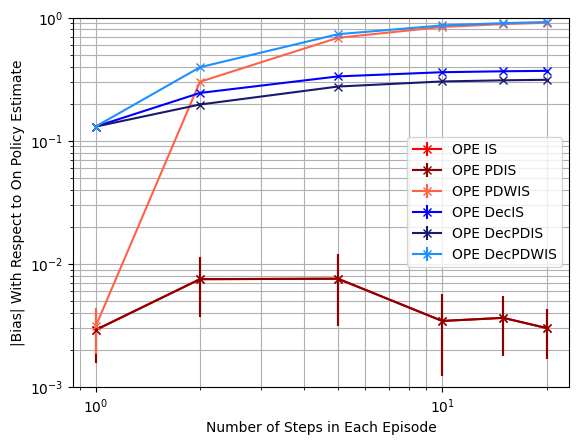

In [ ]:
label = 'bias'
plot_graphs(bias_means, bias_stds, label, 10**(-3), 10**0, shorter_D, estimator='IS')

##### Plot Variance

On Policy-----[2.12909000e-04 2.02078489e-04 9.80525150e-05 5.14662975e-05
 4.45460707e-05 4.27713646e-05]
OPE IS-----[0.00021882 0.00023725 0.0001666  0.00017601 0.00017672 0.00020448]
OPE PDIS-----[0.00021882 0.00023725 0.0001666  0.00017601 0.00017672 0.00020448]
OPE PDWIS-----[2.35864281e-04 6.16370883e-05 4.42655739e-06 8.99129777e-07
 3.28813501e-07 2.03135318e-07]
OPE DecIS-----[9.67541873e-05 9.40835690e-05 6.76769169e-05 7.19518567e-05
 6.71387545e-05 7.74323168e-05]
OPE DecPDIS-----[9.67541873e-05 1.04430291e-04 6.12828972e-05 5.41588609e-05
 5.20228280e-05 6.11828458e-05]
OPE DecPDWIS-----[1.04978435e-04 3.22315694e-05 2.51499268e-06 4.82954992e-07
 1.84354869e-07 9.90570177e-08]


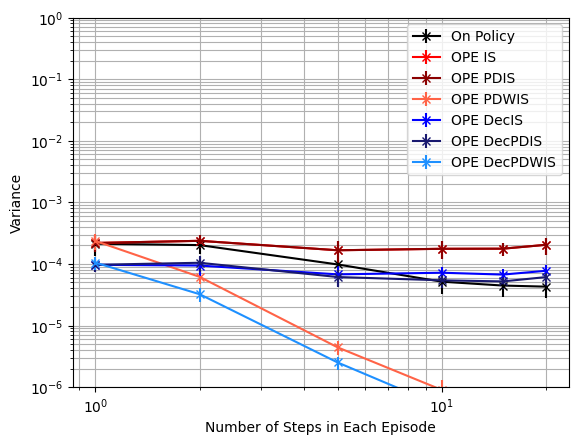

In [ ]:
label = 'var'
plot_graphs(var_means, var_stds, label, 10**(-6), 10**0, shorter_D, estimator='IS')

##### Plot MSE

On Policy-----[2.12909000e-04 2.02078489e-04 9.80525150e-05 5.14662975e-05
 4.45460707e-05 4.27713646e-05]
OPE IS-----[0.00022906 0.00030858 0.00024381 0.00019275 0.00019347 0.00021534]
OPE PDIS-----[0.00022906 0.00030858 0.00024381 0.00019275 0.00019347 0.00021534]
OPE PDWIS-----[2.47095689e-04 9.06686968e-02 4.68094561e-01 7.02966658e-01
 7.81562827e-01 8.21627799e-01]
OPE DecIS-----[0.01704935 0.05979089 0.11075811 0.1295774  0.13414689 0.13634   ]
OPE DecPDIS-----[0.01704935 0.03883579 0.07585627 0.09171947 0.09569476 0.09757716]
OPE DecPDWIS-----[0.01710039 0.1559952  0.535718   0.74445724 0.81050066 0.84375508]


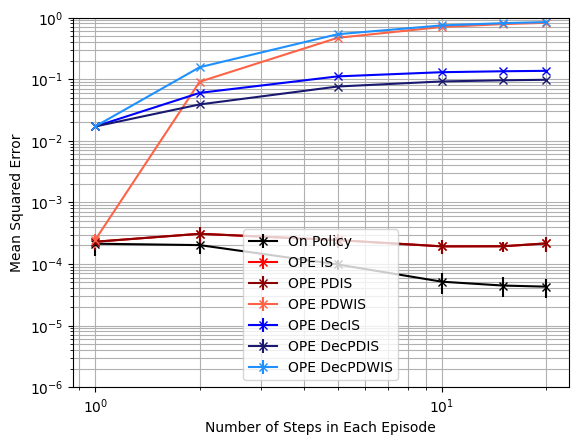

In [ ]:
label = 'MSE'
plot_graphs(MSE_means, MSE_stds, label, 10**(-6), 10**0, shorter_D, estimator='IS')

# From Patient State 56, Without Diabetes

In [ ]:
#The patient has diabetes
PROB_DIAB = 0.0

### State Analysis

In [ ]:
#Instantiate a state based on the idx and get the state vector
testState = State(state_idx = 56, diabetic_idx=0)
vec = testState.get_state_vector()

print(vec)

print(f'Heart Rate: {hr_state_mapping[vec[0]]}')
print(f'Systolic Blood Pressure: {sbp_state_mapping[vec[1]]}')
print(f'Percent Oxygen: {o2_state_mapping[vec[2]]}')
print(f'Glucose Level: {glu_state_mapping[vec[3]]}')
print(f'Antibiotics: {abx_state_mapping[vec[4]]}')
print(f'Vasopressors: {vaso_state_mapping[vec[5]]}')
print(f'Ventilator: {vent_state_mapping[vec[6]]}')
print(f'Diabetes: {testState.diabetic_idx}')

[0 0 1 2 0 0 0]
Heart Rate: Low
Systolic Blood Pressure: Low
Percent Oxygen: Normal
Glucose Level: Normal
Antibiotics: Off
Vasopressors: Off
Ventilator: Off
Diabetes: 0


### Generate Data From Behaviour Policy

Run the data generator

In [ ]:
dgen = DataGenerator()
states, actions, lengths, rewards, diab, emp_tx_totals, emp_r_totals = dgen.simulate(
    NSIMSAMPS, NSTEPS, policy=randPol, policy_idx_type='full',
    p_diabetes=PROB_DIAB, use_tqdm=False) #True, tqdm_desc='Behaviour Policy Simulation')

obs_samps = utils.format_dgen_samps(
    states, actions, rewards, diab, NSTEPS, NSIMSAMPS)

Convert data into array format

In [ ]:
time = np.arange(NSTEPS)
times = np.stack(axis=0, arrays=[time]*NSIMSAMPS)
times = times[..., np.newaxis]

nf_tr_b = np.concatenate((times, states[:, 0:NSTEPS, :], actions, rewards, states[:, 1:, :]), axis=2)
nf_tr_b.shape

(100000, 20, 5)

In [ ]:
f_tr_b = factorise_dataset(nf_tr_b)

In [ ]:
print(nf_tr_b)

[[[  0.  56.   0.  -1.  88.]
  [  1.  88.  -1.   0.  -1.]
  [  2.  -1.  -1.   0.  -1.]
  ...
  [ 17.  -1.  -1.   0.  -1.]
  [ 18.  -1.  -1.   0.  -1.]
  [ 19.  -1.  -1.   0.  -1.]]

 [[  0.  56.   3.   0. 139.]
  [  1. 139.   5.   0. 142.]
  [  2. 142.   0.   0. 128.]
  ...
  [ 17.  -1.  -1.   0.  -1.]
  [ 18.  -1.  -1.   0.  -1.]
  [ 19.  -1.  -1.   0.  -1.]]

 [[  0.  56.   7.   0. 143.]
  [  1. 143.   5.   0. 222.]
  [  2. 222.   6.   0. 141.]
  ...
  [ 17. 455.   0.   0. 448.]
  [ 18. 448.   1.  -1. 410.]
  [ 19. 410.  -1.   0.  -1.]]

 ...

 [[  0.  56.   4.   0.  60.]
  [  1.  60.   2.   0.  57.]
  [  2.  57.   4.   0.  60.]
  ...
  [ 17.  -1.  -1.   0.  -1.]
  [ 18.  -1.  -1.   0.  -1.]
  [ 19.  -1.  -1.   0.  -1.]]

 [[  0.  56.   5.   0. 142.]
  [  1. 142.   5.   0. 222.]
  [  2. 222.   7.   0. 223.]
  ...
  [ 17.  -1.  -1.   0.  -1.]
  [ 18.  -1.  -1.   0.  -1.]
  [ 19.  -1.  -1.   0.  -1.]]

 [[  0.  56.   2.  -1.  49.]
  [  1.  49.  -1.   0.  -1.]
  [  2.  -1.  -1.   0.  -1

In [ ]:
print(f_tr_b)

[[[[ 0.00000000e+00  5.60000000e+01  1.00000000e+00 -3.33333333e-01
     8.80000000e+01]
   [ 0.00000000e+00  5.60000000e+01  1.00000000e+00 -3.33333333e-01
     8.80000000e+01]
   [ 0.00000000e+00  5.60000000e+01  0.00000000e+00 -3.33333333e-01
     8.80000000e+01]]

  [[ 1.00000000e+00  8.80000000e+01  1.00000000e+00  0.00000000e+00
    -1.00000000e+00]
   [ 1.00000000e+00  8.80000000e+01  1.00000000e+00  0.00000000e+00
    -1.00000000e+00]
   [ 1.00000000e+00  8.80000000e+01  1.00000000e+00  0.00000000e+00
    -1.00000000e+00]]

  [[ 2.00000000e+00 -1.00000000e+00  1.00000000e+00  0.00000000e+00
    -1.00000000e+00]
   [ 2.00000000e+00 -1.00000000e+00  1.00000000e+00  0.00000000e+00
    -1.00000000e+00]
   [ 2.00000000e+00 -1.00000000e+00  1.00000000e+00  0.00000000e+00
    -1.00000000e+00]]

  ...

  [[ 1.70000000e+01 -1.00000000e+00  1.00000000e+00  0.00000000e+00
    -1.00000000e+00]
   [ 1.70000000e+01 -1.00000000e+00  1.00000000e+00  0.00000000e+00
    -1.00000000e+00]
   [ 1.7

In [ ]:
factored_randPol = factor_policy(randPol)

In [ ]:
randPol = pad_policy(randPol)

factored_randPol[0] = pad_policy(factored_randPol[0])
factored_randPol[1] = pad_policy(factored_randPol[1])
factored_randPol[2] = pad_policy(factored_randPol[2])

### Varying Episodes $\epsilon_{e} = 0.0$ (Policy Divergence $8.0^{20}$)

Set up evaluation policy, generate data and convert into factored format

In [ ]:
EVAL_EPSILON = 0.0

evalPolSoft = np.copy(fullPol)
evalPolSoft[evalPolSoft == 1] = 1 - EVAL_EPSILON
evalPolSoft[evalPolSoft == 0] = EVAL_EPSILON / (n_actions - 1)

In [ ]:
# Calculate policy divergence from Voloshin et al.
D = 0
for state in range(randPol.shape[0] - 1):
    for action in range(randPol.shape[1] - 1):
        difference = evalPolSoft[state, action]/randPol[state, action]
        D = max(D, difference)
print(D)
shorter_D = round(D,2)

8.0


In [ ]:
dgen = DataGenerator()
states, actions, lengths, rewards, diab, emp_tx_totals, emp_r_totals = dgen.simulate(
    NSIMSAMPS, NSTEPS, policy=evalPolSoft, policy_idx_type='full',
    p_diabetes=PROB_DIAB, use_tqdm=False) #True, tqdm_desc='Behaviour Policy Simulation')

obs_samps = utils.format_dgen_samps(
    states, actions, rewards, diab, NSTEPS, NSIMSAMPS)

In [ ]:
time = np.arange(NSTEPS)
times = np.stack(axis=0, arrays=[time]*NSIMSAMPS)
times = times[..., np.newaxis]

nf_tr_e = np.concatenate((times, states[:, 0:NSTEPS, :], actions, rewards, states[:, 1:, :]), axis=2)
nf_tr_e.shape

(100000, 20, 5)

In [ ]:
f_tr_e = factorise_dataset(nf_tr_e)

In [ ]:
factored_evalPolSoft = factor_policy(evalPolSoft)

In [ ]:
evalPolSoft = pad_policy(evalPolSoft)

factored_evalPolSoft[0] = pad_policy(factored_evalPolSoft[0])
factored_evalPolSoft[1] = pad_policy(factored_evalPolSoft[1])
factored_evalPolSoft[2] = pad_policy(factored_evalPolSoft[2])

In [ ]:
import policy_estimators as pe
import gc

def evaluate_PE(RUNS, EPISODES, SHORTER_D, STEPS=NSTEPS):

  biases = np.zeros((5, 5))
  variances = np.zeros((5, 5))
  MSEs = np.zeros((5, 5))
  ESSs = np.zeros((5, 5))

  # Reshape data for processing
  T, ldim = nf_tr_b.shape[-2], nf_tr_b.shape[-1]
  nfb = nf_tr_b.reshape((-1, RUNS, EPISODES, T, ldim))
  nfe = nf_tr_e.reshape((-1, RUNS, EPISODES, T, ldim))

  T, D, ldim = f_tr_b.shape[-3], f_tr_b.shape[-2], f_tr_b.shape[-1]
  fb = f_tr_b.reshape((-1, RUNS, EPISODES, T, D, ldim))
  fe = f_tr_e.reshape((-1, RUNS, EPISODES, T, D, ldim))

  for t in range(5):
    print()

    lower_index = 0
    estimates_on_policy = np.zeros(RUNS)
    estimates_OPE_IS = np.zeros(RUNS)
    estimates_OPE_PDIS = np.zeros(RUNS)

    estimates_OPE_DecIS = np.zeros(RUNS)
    estimates_OPE_DecPDIS = np.zeros(RUNS)

    for r in range(RUNS):
        #On policy Q estimate
        estimates_on_policy[r] = pe.on_policy_Q_estimate(nfe[t, r, :, :STEPS, :], DISCOUNT_Pol)
        #Off policy IS estimate
        estimates_OPE_IS[r] = pe.off_policy_IS_estimator(nfb[t, r, :, :STEPS, :], DISCOUNT_Pol, randPol, evalPolSoft)
        #Off policy PDIS estimate
        estimates_OPE_PDIS[r] = pe.off_policy_PDIS_estimator(nfb[t, r, :, :STEPS, :], DISCOUNT_Pol, randPol, evalPolSoft)

        #Factorisation 1----------------------------------

        #Off policy decomposed IS estimate
        estimates_OPE_DecIS[r], _ = pe.off_policy_DecIS_estimator(fb[t, r, :, :STEPS, :, :], DISCOUNT_Pol, [0,1], factored_randPol, factored_evalPolSoft)
        #Off policy decomposed PDIS estimate
        estimates_OPE_DecPDIS[r], _ = pe.off_policy_DecPDIS_estimator(fb[t, r, :, :STEPS, :, :], DISCOUNT_Pol, [0,1], factored_randPol, factored_evalPolSoft)


    mean_on_policy = np.mean(estimates_on_policy)
    var_on_policy = np.var(estimates_on_policy, ddof=0)
    print(f'Mean on policy Q estimate: {mean_on_policy}. Variance of on policy Q estimate: {var_on_policy}')

    from sklearn.metrics import mean_squared_error

    #For on policy
    biases[t, 0] = 0.0
    variances[t, 0] = var_on_policy
    MSEs[t, 0] = var_on_policy
    ESSs[t, 0] = EPISODES

    def generate_results(estimates, mean_true, label):
      MSE = mean_squared_error(estimates, [mean_true]*RUNS)
      mean = np.mean(estimates)
      var = np.var(estimates, ddof=0)
      bias1 = np.sqrt(MSE - var)
      bias2 = abs(mean - mean_true)
      print(f'Mean {label} estimate: {mean}. Bias1: {bias1}. Bias2: {bias2}. Variance: {var}. MSE: {MSE}')
      return bias1, var, MSE

    label_list = ['OPE IS', 'OPE PDIS',
                  'OPE DecIS', 'OPE DecPDIS'
                  ]

    estimates = [estimates_OPE_IS, estimates_OPE_PDIS,
                estimates_OPE_DecIS, estimates_OPE_DecPDIS
                ]


    for (id, val) in enumerate(label_list):
      biases[t, 1+id], variances[t, 1+id], MSEs[t, 1+id] = generate_results(estimates[id], mean_on_policy, label_list[id])
      ESSs[t, 1+id] = (EPISODES*variances[t, 0])/variances[t, 1+id]
      gc.collect()

  return np.mean(biases, axis=0), np.std(biases, axis=0), np.mean(variances, axis=0), np.std(variances, axis=0), np.mean(MSEs, axis=0), np.std(MSEs, axis=0), np.mean(ESSs, axis=0), np.std(ESSs, axis=0)

#### Run Everything

In [ ]:
EPISODES = [10, 50, 100, 500, 1000]

bias_means = np.zeros((len(EPISODES), 5))
bias_stds = np.zeros((len(EPISODES), 5))
var_means = np.zeros((len(EPISODES), 5))
var_stds = np.zeros((len(EPISODES), 5))
MSE_means = np.zeros((len(EPISODES), 5))
MSE_stds = np.zeros((len(EPISODES), 5))
ESS_means = np.zeros((len(EPISODES), 5))
ESS_stds = np.zeros((len(EPISODES), 5))

RUNS = 20

for id in range(len(EPISODES)):
  e = EPISODES[id]
  print(f'{e} Episodes, {RUNS} ----------------------------------')
  bias_means[id, :], bias_stds[id, :], var_means[id, :], var_stds[id, :], MSE_means[id, :], MSE_stds[id, :], ESS_means[id, :], ESS_stds[id, :] = evaluate_PE(RUNS=RUNS, EPISODES=e, SHORTER_D=shorter_D)
  print()
  gc.collect()

print('BIAS MEANS')
print(list(bias_means))
print('\nBIAS STDS')
print(list(bias_stds))
print('\nVAR MEANS')
print(list(var_means))
print('\nVAR STDS')
print(list(var_stds))
print('\nMSE MEANS')
print(list(MSE_means))
print('\nMSE STDS')
print(list(MSE_stds))
print('\nESS MEANS')
print(list(ESS_means))
print('\nESS STDS')
print(list(ESS_stds))

10 Episodes, 20 ----------------------------------

Mean on policy Q estimate: 0.4067867499022898. Variance of on policy Q estimate: 0.024251919693271867
Mean OPE IS estimate: 0.0. Bias1: 0.40678674990228986. Bias2: 0.4067867499022898. Variance: 0.0. MSE: 0.1654754598960681


<ipython-input-101-4a9fa90ff3d5>:79: RuntimeWarning: divide by zero encountered in double_scalars
  ESSs[t, 1+id] = (EPISODES*variances[t, 0])/variances[t, 1+id]


Mean OPE PDIS estimate: 0.0. Bias1: 0.40678674990228986. Bias2: 0.4067867499022898. Variance: 0.0. MSE: 0.1654754598960681
Mean OPE DecIS estimate: 0.07632757439999997. Bias1: 0.3304591755022896. Bias2: 0.3304591755022898. Variance: 0.21781159288269913. MSE: 0.3270148595563522


<ipython-input-101-4a9fa90ff3d5>:79: RuntimeWarning: divide by zero encountered in double_scalars
  ESSs[t, 1+id] = (EPISODES*variances[t, 0])/variances[t, 1+id]


Mean OPE DecPDIS estimate: -0.1356574928. Bias1: 0.5424442427022897. Bias2: 0.5424442427022897. Variance: 0.06760546833022849. MSE: 0.3618512247710891

Mean on policy Q estimate: 0.4336832794048737. Variance of on policy Q estimate: 0.028008887823370125
Mean OPE IS estimate: 0.0. Bias1: 0.4336832794048737. Bias2: 0.4336832794048737. Variance: 0.0. MSE: 0.18808118683536576


<ipython-input-101-4a9fa90ff3d5>:79: RuntimeWarning: divide by zero encountered in double_scalars
  ESSs[t, 1+id] = (EPISODES*variances[t, 0])/variances[t, 1+id]


Mean OPE PDIS estimate: 0.0. Bias1: 0.4336832794048737. Bias2: 0.4336832794048737. Variance: 0.0. MSE: 0.18808118683536576
Mean OPE DecIS estimate: -0.013199999999999998. Bias1: 0.44688327940487377. Bias2: 0.4468832794048737. Variance: 0.0033105599999999997. MSE: 0.20301522541165445
Mean OPE DecPDIS estimate: -0.26311624532266664. Bias1: 0.6967995247275404. Bias2: 0.6967995247275404. Variance: 0.2328627658372732. MSE: 0.7183923434977993


<ipython-input-101-4a9fa90ff3d5>:79: RuntimeWarning: divide by zero encountered in double_scalars
  ESSs[t, 1+id] = (EPISODES*variances[t, 0])/variances[t, 1+id]



Mean on policy Q estimate: 0.4313614431127418. Variance of on policy Q estimate: 0.012213016193163197
Mean OPE IS estimate: 0.0. Bias1: 0.4313614431127418. Bias2: 0.4313614431127418. Variance: 0.0. MSE: 0.1860726946043072
Mean OPE PDIS estimate: 0.0. Bias1: 0.4313614431127418. Bias2: 0.4313614431127418. Variance: 0.0. MSE: 0.1860726946043072


<ipython-input-101-4a9fa90ff3d5>:79: RuntimeWarning: divide by zero encountered in double_scalars
  ESSs[t, 1+id] = (EPISODES*variances[t, 0])/variances[t, 1+id]
<ipython-input-101-4a9fa90ff3d5>:79: RuntimeWarning: divide by zero encountered in double_scalars
  ESSs[t, 1+id] = (EPISODES*variances[t, 0])/variances[t, 1+id]


Mean OPE DecIS estimate: -0.051749279999999995. Bias1: 0.4831107231127419. Bias2: 0.48311072311274184. Variance: 0.05088177162984958. MSE: 0.28427774241636594
Mean OPE DecPDIS estimate: -0.4576593129388799. Bias1: 0.8890207560516217. Bias2: 0.8890207560516217. Variance: 0.9387950679542314. MSE: 1.7291529726448285

Mean on policy Q estimate: 0.37486231773114376. Variance of on policy Q estimate: 0.027210051635017284
Mean OPE IS estimate: 0.0. Bias1: 0.37486231773114376. Bias2: 0.37486231773114376. Variance: 0.0. MSE: 0.14052175725476496


<ipython-input-101-4a9fa90ff3d5>:79: RuntimeWarning: divide by zero encountered in double_scalars
  ESSs[t, 1+id] = (EPISODES*variances[t, 0])/variances[t, 1+id]


Mean OPE PDIS estimate: 0.0. Bias1: 0.37486231773114376. Bias2: 0.37486231773114376. Variance: 0.0. MSE: 0.14052175725476496


<ipython-input-101-4a9fa90ff3d5>:79: RuntimeWarning: divide by zero encountered in double_scalars
  ESSs[t, 1+id] = (EPISODES*variances[t, 0])/variances[t, 1+id]


Mean OPE DecIS estimate: -0.013199999999999998. Bias1: 0.3880623177311437. Bias2: 0.38806231773114375. Variance: 0.0033105599999999997. MSE: 0.15390292244286713
Mean OPE DecPDIS estimate: -0.16088130666666664. Bias1: 0.5357436243978104. Bias2: 0.5357436243978104. Variance: 0.05418428743084016. MSE: 0.3412055185137423

Mean on policy Q estimate: 0.4375298966611954. Variance of on policy Q estimate: 0.02544512628549177
Mean OPE IS estimate: 0.0. Bias1: 0.4375298966611954. Bias2: 0.4375298966611954. Variance: 0.0. MSE: 0.19143241047235632


<ipython-input-101-4a9fa90ff3d5>:79: RuntimeWarning: divide by zero encountered in double_scalars
  ESSs[t, 1+id] = (EPISODES*variances[t, 0])/variances[t, 1+id]


Mean OPE PDIS estimate: 0.0. Bias1: 0.4375298966611954. Bias2: 0.4375298966611954. Variance: 0.0. MSE: 0.19143241047235632


<ipython-input-101-4a9fa90ff3d5>:79: RuntimeWarning: divide by zero encountered in double_scalars
  ESSs[t, 1+id] = (EPISODES*variances[t, 0])/variances[t, 1+id]


Mean OPE DecIS estimate: -0.4790607570777601. Bias1: 0.9165906537389557. Bias2: 0.9165906537389554. Variance: 3.1185109508792777. MSE: 3.9586493774008837
Mean OPE DecPDIS estimate: -0.3670954990722133. Bias1: 0.8046253957334089. Bias2: 0.8046253957334086. Variance: 0.8571132696048182. MSE: 1.504535297063963



/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:233: RuntimeWarning: invalid value encountered in subtract
  x = asanyarray(arr - arrmean)
<ipython-input-101-4a9fa90ff3d5>:79: RuntimeWarning: divide by zero encountered in double_scalars
  ESSs[t, 1+id] = (EPISODES*variances[t, 0])/variances[t, 1+id]


50 Episodes, 20 ----------------------------------

Mean on policy Q estimate: 0.416844737362449. Variance of on policy Q estimate: 0.0033621449946852635
Mean OPE IS estimate: 0.0. Bias1: 0.416844737362449. Bias2: 0.416844737362449. Variance: 0.0. MSE: 0.17375953506676906
Mean OPE PDIS estimate: 0.0. Bias1: 0.416844737362449. Bias2: 0.416844737362449. Variance: 0.0. MSE: 0.17375953506676906
Mean OPE DecIS estimate: -0.09617649253555201. Bias1: 0.5130212298980009. Bias2: 0.513021229898001. Variance: 0.11923910819576193. MSE: 0.3824298905218194


<ipython-input-101-4a9fa90ff3d5>:79: RuntimeWarning: divide by zero encountered in double_scalars
  ESSs[t, 1+id] = (EPISODES*variances[t, 0])/variances[t, 1+id]


Mean OPE DecPDIS estimate: -0.2768819713600853. Bias1: 0.6937267087225343. Bias2: 0.6937267087225343. Variance: 0.09912085078510349. MSE: 0.5803775971801034

Mean on policy Q estimate: 0.3859141234066862. Variance of on policy Q estimate: 0.0038265672979729782
Mean OPE IS estimate: 0.0. Bias1: 0.3859141234066862. Bias2: 0.3859141234066862. Variance: 0.0. MSE: 0.148929710644751


<ipython-input-101-4a9fa90ff3d5>:79: RuntimeWarning: divide by zero encountered in double_scalars
  ESSs[t, 1+id] = (EPISODES*variances[t, 0])/variances[t, 1+id]
<ipython-input-101-4a9fa90ff3d5>:79: RuntimeWarning: divide by zero encountered in double_scalars
  ESSs[t, 1+id] = (EPISODES*variances[t, 0])/variances[t, 1+id]


Mean OPE PDIS estimate: 0.0. Bias1: 0.3859141234066862. Bias2: 0.3859141234066862. Variance: 0.0. MSE: 0.148929710644751
Mean OPE DecIS estimate: -0.028671455999999994. Bias1: 0.41458557940668617. Bias2: 0.41458557940668617. Variance: 0.0030991471856547837. MSE: 0.17498034983763247
Mean OPE DecPDIS estimate: -0.37249431808476496. Bias1: 0.7584084414914513. Bias2: 0.7584084414914511. Variance: 0.5296530768367207. MSE: 1.1048364409622127

Mean on policy Q estimate: 0.4125196708751552. Variance of on policy Q estimate: 0.0025413268944607173
Mean OPE IS estimate: 0.0. Bias1: 0.4125196708751551. Bias2: 0.4125196708751552. Variance: 0.0. MSE: 0.17017247885894632


<ipython-input-101-4a9fa90ff3d5>:79: RuntimeWarning: divide by zero encountered in double_scalars
  ESSs[t, 1+id] = (EPISODES*variances[t, 0])/variances[t, 1+id]


Mean OPE PDIS estimate: 0.0. Bias1: 0.4125196708751551. Bias2: 0.4125196708751552. Variance: 0.0. MSE: 0.17017247885894632
Mean OPE DecIS estimate: -0.10135403941555199. Bias1: 0.513873710290707. Bias2: 0.5138737102907072. Variance: 0.12294273814976911. MSE: 0.38700892827770667


<ipython-input-101-4a9fa90ff3d5>:79: RuntimeWarning: divide by zero encountered in double_scalars
  ESSs[t, 1+id] = (EPISODES*variances[t, 0])/variances[t, 1+id]


Mean OPE DecPDIS estimate: -0.4905840115964987. Bias1: 0.9031036824716537. Bias2: 0.9031036824716538. Variance: 0.3961055313638302. MSE: 1.2117017926576918

Mean on policy Q estimate: 0.4242270560084248. Variance of on policy Q estimate: 0.0023838313114365904
Mean OPE IS estimate: 0.0. Bias1: 0.42422705600842475. Bias2: 0.4242270560084248. Variance: 0.0. MSE: 0.17996859504957516
Mean OPE PDIS estimate: 0.0. Bias1: 0.42422705600842475. Bias2: 0.4242270560084248. Variance: 0.0. MSE: 0.17996859504957516


<ipython-input-101-4a9fa90ff3d5>:79: RuntimeWarning: divide by zero encountered in double_scalars
  ESSs[t, 1+id] = (EPISODES*variances[t, 0])/variances[t, 1+id]
<ipython-input-101-4a9fa90ff3d5>:79: RuntimeWarning: divide by zero encountered in double_scalars
  ESSs[t, 1+id] = (EPISODES*variances[t, 0])/variances[t, 1+id]


Mean OPE DecIS estimate: -0.04409431488. Bias1: 0.46832137088842485. Bias2: 0.4683213708884248. Variance: 0.009064304168722876. MSE: 0.22838921059953643
Mean OPE DecPDIS estimate: -0.20006496114777597. Bias1: 0.6242920171562009. Bias2: 0.6242920171562008. Variance: 0.03983718409402108. MSE: 0.4295777067789793

Mean on policy Q estimate: 0.3909770173226967. Variance of on policy Q estimate: 0.005310847607866569
Mean OPE IS estimate: 0.5651712. Bias1: 0.1741941826772962. Bias2: 0.1741941826773033. Variance: 4.79716091559936. MSE: 4.827504528877971
Mean OPE PDIS estimate: 0.5651712. Bias1: 0.1741941826772962. Bias2: 0.1741941826773033. Variance: 4.79716091559936. MSE: 4.827504528877971
Mean OPE DecIS estimate: -0.18774394204279293. Bias1: 0.5787209593654895. Bias2: 0.5787209593654896. Variance: 0.4973127061382572. MSE: 0.8322306549471697
Mean OPE DecPDIS estimate: -0.3169315618459298. Bias1: 0.7079085791686266. Bias2: 0.7079085791686265. Variance: 0.15718112428833353. MSE: 0.6583156807488

/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:233: RuntimeWarning: invalid value encountered in subtract
  x = asanyarray(arr - arrmean)
<ipython-input-101-4a9fa90ff3d5>:79: RuntimeWarning: divide by zero encountered in double_scalars
  ESSs[t, 1+id] = (EPISODES*variances[t, 0])/variances[t, 1+id]


Mean on policy Q estimate: 0.40137943038456747. Variance of on policy Q estimate: 0.0017937986206162163
Mean OPE IS estimate: 0.0. Bias1: 0.4013794303845675. Bias2: 0.40137943038456747. Variance: 0.0. MSE: 0.16110544713583988
Mean OPE PDIS estimate: 0.0. Bias1: 0.4013794303845675. Bias2: 0.40137943038456747. Variance: 0.0. MSE: 0.16110544713583988
Mean OPE DecIS estimate: -0.062423974267776. Bias1: 0.4638034046523435. Bias2: 0.4638034046523435. Variance: 0.030550235198977836. MSE: 0.2456638333660833


<ipython-input-101-4a9fa90ff3d5>:79: RuntimeWarning: divide by zero encountered in double_scalars
  ESSs[t, 1+id] = (EPISODES*variances[t, 0])/variances[t, 1+id]


Mean OPE DecPDIS estimate: -0.32468814472242513. Bias1: 0.7260675751069925. Bias2: 0.7260675751069926. Variance: 0.1436721018943426. MSE: 0.6708462255160909

Mean on policy Q estimate: 0.41837336344179. Variance of on policy Q estimate: 0.001166679179885365
Mean OPE IS estimate: 0.0. Bias1: 0.41837336344178994. Bias2: 0.41837336344179. Variance: 0.0. MSE: 0.17503627123759607
Mean OPE PDIS estimate: 0.0. Bias1: 0.41837336344178994. Bias2: 0.41837336344179. Variance: 0.0. MSE: 0.17503627123759607


<ipython-input-101-4a9fa90ff3d5>:79: RuntimeWarning: divide by zero encountered in double_scalars
  ESSs[t, 1+id] = (EPISODES*variances[t, 0])/variances[t, 1+id]
<ipython-input-101-4a9fa90ff3d5>:79: RuntimeWarning: divide by zero encountered in double_scalars
  ESSs[t, 1+id] = (EPISODES*variances[t, 0])/variances[t, 1+id]


Mean OPE DecIS estimate: -0.072724177147776. Bias1: 0.49109754058956595. Bias2: 0.491097540589566. Variance: 0.03170314918925571. MSE: 0.2728799435623761
Mean OPE DecPDIS estimate: -0.3453244863721374. Bias1: 0.7636978498139274. Bias2: 0.7636978498139274. Variance: 0.11124728304760248. MSE: 0.6944816888580184

Mean on policy Q estimate: 0.3945729244776156. Variance of on policy Q estimate: 0.002729414549471177
Mean OPE IS estimate: 0.5334911999999999. Bias1: 0.13891827552238714. Bias2: 0.13891827552238434. Variance: 2.2536043919769586. MSE: 2.2729026792510725
Mean OPE PDIS estimate: 0.5334911999999999. Bias1: 0.13891827552238714. Bias2: 0.13891827552238434. Variance: 2.2536043919769586. MSE: 2.2729026792510725
Mean OPE DecIS estimate: -0.10160822702139649. Bias1: 0.49618115149901215. Bias2: 0.4961811514990121. Variance: 0.1329576703198108. MSE: 0.37915340542269643
Mean OPE DecPDIS estimate: -0.26408081596296495. Bias1: 0.6586537404405806. Bias2: 0.6586537404405806. Variance: 0.04382645

/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:233: RuntimeWarning: invalid value encountered in subtract
  x = asanyarray(arr - arrmean)



500 Episodes, 20 ----------------------------------

Mean on policy Q estimate: 0.4031915274758354. Variance of on policy Q estimate: 0.0003521805586853061
Mean OPE IS estimate: 0.13204224000000003. Bias1: 0.2711492874758354. Bias2: 0.2711492874758354. Variance: 0.10162882752675842. MSE: 0.17515076362541165
Mean OPE PDIS estimate: 0.13204224000000003. Bias1: 0.2711492874758354. Bias2: 0.2711492874758354. Variance: 0.10162882752675842. MSE: 0.17515076362541165
Mean OPE DecIS estimate: -0.0718315737511849. Bias1: 0.4750231012270203. Bias2: 0.4750231012270203. Variance: 0.007653333640837921. MSE: 0.2333002803401739
Mean OPE DecPDIS estimate: -0.32274112941915833. Bias1: 0.7259326568949939. Bias2: 0.7259326568949938. Variance: 0.019260623686672158. MSE: 0.546238846033297

Mean on policy Q estimate: 0.4161741880632285. Variance of on policy Q estimate: 0.0003780820927490357
Mean OPE IS estimate: 0.050688. Bias1: 0.36548618806322847. Bias2: 0.36548618806322847. Variance: 0.00545970585600000

#### Plot Graphs

In [ ]:
import pickle
import matplotlib.pyplot as plt

def plot_graphs(means, stds, label, low_ylim, up_ylim, D, estimator='IS'):
  EPISODES = [10, 50, 100, 500, 1000]

  ylabels = {
      'bias': '|Bias| With Respect to On Policy Estimate',
      'var': 'Variance',
      'MSE': 'Mean Squared Error',
      'ESS': 'Effective Sample Size'
  }

  colours = {
      'On Policy': 'k',
      'OPE IS': 'r',
      'OPE DecIS': 'b',
      'OPE PDIS': 'darkred',
      'OPE DecPDIS': 'midnightblue',
      'OPE PDWIS': 'tomato',
      'OPE DecPDWIS': 'dodgerblue',
  }

  legend_list = ['OPE IS', 'OPE PDIS',
                  'OPE DecIS', 'OPE DecPDIS'
                  ]
  index_list = [1, 2, 3, 4]

  plt.figure()
  if label != 'bias':
    legend_list.insert(0,'On Policy')
    index_list.insert(0, 0)
  for (id, legend) in zip(index_list, legend_list):
    print(f'{legend}-----{means[:, id]}')
    plt.errorbar(EPISODES, means[:, id], yerr=stds[:, id], color=colours[legend], marker='x')
  plt.yscale("log")
  plt.xscale("log")
  plt.grid(visible=True, which='both', axis='both')
  plt.legend(legend_list)
  plt.xlabel('Number of Episodes')
  plt.ylabel(ylabels[label])
  plt.ylim([low_ylim, up_ylim])
  plt.savefig(f'{label}-sepsis-simulator-{D}.pdf', dpi=300)
  plt.show()


##### Plot Bias

OPE IS-----[0.41684474 0.36273995 0.3267166  0.26966234 0.28258991]
OPE PDIS-----[0.41684474 0.36273995 0.3267166  0.26966234 0.28258991]
OPE DecIS-----[0.51302123 0.49770457 0.4750231  0.4646846  0.4529232 ]
OPE DecPDIS-----[0.69372671 0.73748789 0.72593266 1.17871755 0.94732572]


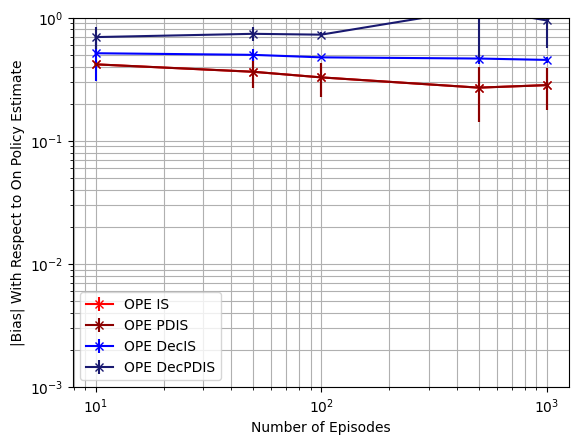

In [ ]:
label = 'bias'
plot_graphs(bias_means, bias_stds, label, 10**-3, 10**0, shorter_D, estimator='IS')

##### Plot Variance

On Policy-----[0.0234258  0.00348494 0.00185049 0.00031188 0.0001886 ]
OPE IS-----[0.         0.95943218 0.46517304 0.68472474 0.31185022]
OPE PDIS-----[0.         0.95943218 0.46517304 0.68472474 0.31185022]
OPE DecIS-----[0.67876509 0.1503316  0.04889025 0.01475648 0.00720363]
OPE DecPDIS-----[ 0.43011217  0.24437955  0.10903927 13.51776747  3.392522  ]


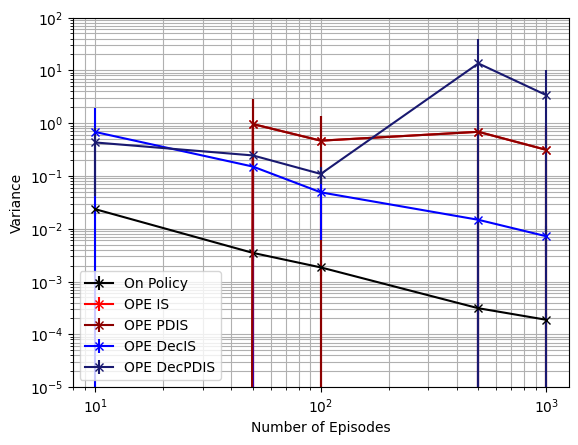

In [ ]:
label = 'var'
plot_graphs(var_means, var_stds, label, 10**(-5), 10**2, shorter_D, estimator='IS')

##### Plot MSE

On Policy-----[0.0234258  0.00348494 0.00185049 0.00031188 0.0001886 ]
OPE IS-----[0.1743167  1.10006697 0.58181166 0.77357487 0.40277902]
OPE PDIS-----[0.1743167  1.10006697 0.58181166 0.77357487 0.40277902]
OPE DecIS-----[0.98537203 0.40100781 0.27478089 0.23246929 0.2131079 ]
OPE DecPDIS-----[ 0.93102747  0.79696184  0.63740872 15.46484874  4.43567185]


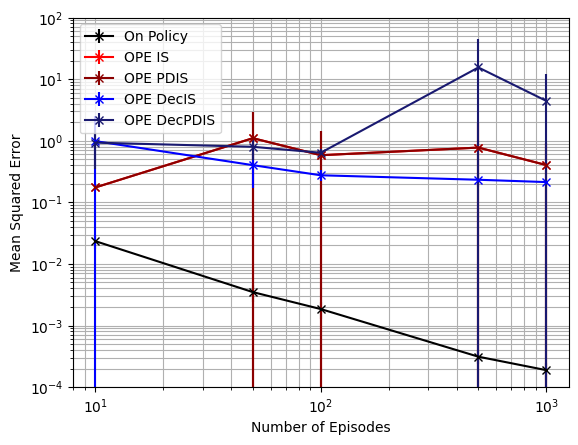

In [ ]:
label = 'MSE'
plot_graphs(MSE_means, MSE_stds, label, 10**(-4), 10**2, shorter_D, estimator='IS')

##### Plot ESS

On Policy-----[  10.   50.  100.  500. 1000.]
OPE IS-----[        inf         inf         inf  7.80222638 21.7722696 ]
OPE PDIS-----[        inf         inf         inf  7.80222638 21.7722696 ]
OPE DecIS-----[34.07833481 15.5725389   6.18037547 19.25285346 34.36849751]
OPE DecPDIS-----[2.04776032 1.41187532 2.2850309  3.29383815 9.44157549]


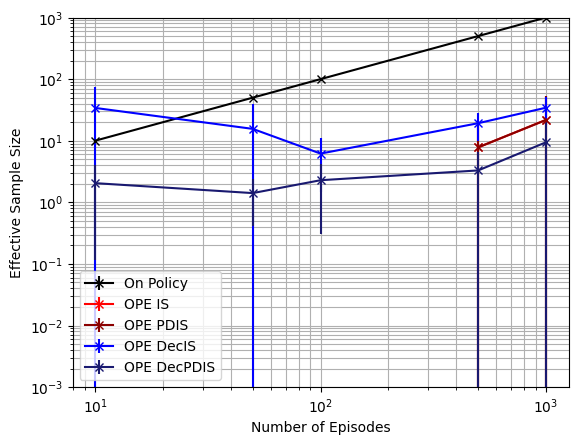

In [ ]:
label = 'ESS'
plot_graphs(ESS_means, ESS_stds, label, 10**(-3), 10**3, shorter_D, estimator='IS')

### Varying Episodes $\epsilon_{e} = 0.2$ (Policy Divergence $6.4^{20}$)

Set up evaluation policy, generate data and convert into factored format

In [ ]:
EVAL_EPSILON = 0.2

evalPolSoft = np.copy(fullPol)
evalPolSoft[evalPolSoft == 1] = 1 - EVAL_EPSILON
evalPolSoft[evalPolSoft == 0] = EVAL_EPSILON / (n_actions - 1)

In [ ]:
# Calculate policy divergence from Voloshin et al.
D = 0
for state in range(randPol.shape[0] - 1):
    for action in range(randPol.shape[1] - 1):
        difference = evalPolSoft[state, action]/randPol[state, action]
        D = max(D, difference)
print(D)
shorter_D = round(D,2)

6.4


In [ ]:
dgen = DataGenerator()
states, actions, lengths, rewards, diab, emp_tx_totals, emp_r_totals = dgen.simulate(
    NSIMSAMPS, NSTEPS, policy=evalPolSoft, policy_idx_type='full',
    p_diabetes=PROB_DIAB, use_tqdm=False) #True, tqdm_desc='Behaviour Policy Simulation')

obs_samps = utils.format_dgen_samps(
    states, actions, rewards, diab, NSTEPS, NSIMSAMPS)

In [ ]:
time = np.arange(NSTEPS)
times = np.stack(axis=0, arrays=[time]*NSIMSAMPS)
times = times[..., np.newaxis]

nf_tr_e = np.concatenate((times, states[:, 0:NSTEPS, :], actions, rewards, states[:, 1:, :]), axis=2)
nf_tr_e.shape

(100000, 20, 5)

In [ ]:
f_tr_e = factorise_dataset(nf_tr_e)

In [ ]:
factored_evalPolSoft = factor_policy(evalPolSoft)

In [ ]:
evalPolSoft = pad_policy(evalPolSoft)

factored_evalPolSoft[0] = pad_policy(factored_evalPolSoft[0])
factored_evalPolSoft[1] = pad_policy(factored_evalPolSoft[1])
factored_evalPolSoft[2] = pad_policy(factored_evalPolSoft[2])

In [ ]:
import policy_estimators as pe
import gc

def evaluate_PE(RUNS, EPISODES, SHORTER_D, STEPS=NSTEPS):

  biases = np.zeros((5, 7))
  variances = np.zeros((5, 7))
  MSEs = np.zeros((5, 7))
  ESSs = np.zeros((5, 7))

  # Reshape data for processing
  T, ldim = nf_tr_b.shape[-2], nf_tr_b.shape[-1]
  nfb = nf_tr_b.reshape((-1, RUNS, EPISODES, T, ldim))
  nfe = nf_tr_e.reshape((-1, RUNS, EPISODES, T, ldim))

  T, D, ldim = f_tr_b.shape[-3], f_tr_b.shape[-2], f_tr_b.shape[-1]
  fb = f_tr_b.reshape((-1, RUNS, EPISODES, T, D, ldim))
  fe = f_tr_e.reshape((-1, RUNS, EPISODES, T, D, ldim))

  for t in range(5):
    print()

    lower_index = 0
    estimates_on_policy = np.zeros(RUNS)
    estimates_OPE_IS = np.zeros(RUNS)
    estimates_OPE_PDIS = np.zeros(RUNS)
    estimates_OPE_PDWIS = np.zeros(RUNS)

    estimates_OPE_DecIS = np.zeros(RUNS)
    estimates_OPE_DecPDIS = np.zeros(RUNS)
    estimates_OPE_DecPDWIS = np.zeros(RUNS)

    for r in range(RUNS):
        #On policy Q estimate
        estimates_on_policy[r] = pe.on_policy_Q_estimate(nfe[t, r, :, :STEPS, :], DISCOUNT_Pol)
        #Off policy IS estimate
        estimates_OPE_IS[r] = pe.off_policy_IS_estimator(nfb[t, r, :, :STEPS, :], DISCOUNT_Pol, randPol, evalPolSoft)
        #Off policy PDIS estimate
        estimates_OPE_PDIS[r] = pe.off_policy_PDIS_estimator(nfb[t, r, :, :STEPS, :], DISCOUNT_Pol, randPol, evalPolSoft)
        #Off policy PDWIS estimate
        estimates_OPE_PDWIS[r] = pe.off_policy_PDWIS_estimator(nfb[t, r, :, :STEPS, :], DISCOUNT_Pol, randPol, evalPolSoft)

        #Factorisation 1----------------------------------

        #Off policy decomposed IS estimate
        estimates_OPE_DecIS[r], _ = pe.off_policy_DecIS_estimator(fb[t, r, :, :STEPS, :, :], DISCOUNT_Pol, [0,1], factored_randPol, factored_evalPolSoft)
        #Off policy decomposed PDIS estimate
        estimates_OPE_DecPDIS[r], _ = pe.off_policy_DecPDIS_estimator(fb[t, r, :, :STEPS, :, :], DISCOUNT_Pol, [0,1], factored_randPol, factored_evalPolSoft)
        #Off policy decomposed PDWIS estimate
        estimates_OPE_DecPDWIS[r], _ = pe.off_policy_DecPDWIS_estimator(fb[t, r, :, :STEPS, :, :], DISCOUNT_Pol, [0,1], factored_randPol, factored_evalPolSoft)


    mean_on_policy = np.mean(estimates_on_policy)
    var_on_policy = np.var(estimates_on_policy, ddof=0)
    print(f'Mean on policy Q estimate: {mean_on_policy}. Variance of on policy Q estimate: {var_on_policy}')

    from sklearn.metrics import mean_squared_error

    #For on policy
    biases[t, 0] = 0.0
    variances[t, 0] = var_on_policy
    MSEs[t, 0] = var_on_policy
    ESSs[t, 0] = EPISODES

    def generate_results(estimates, mean_true, label):
      MSE = mean_squared_error(estimates, [mean_true]*RUNS)
      mean = np.mean(estimates)
      var = np.var(estimates, ddof=0)
      bias1 = np.sqrt(MSE - var)
      bias2 = abs(mean - mean_true)
      print(f'Mean {label} estimate: {mean}. Bias1: {bias1}. Bias2: {bias2}. Variance: {var}. MSE: {MSE}')
      return bias1, var, MSE

    label_list = ['OPE IS', 'OPE PDIS', 'OPE PDWIS',
                  'OPE DecIS', 'OPE DecPDIS', 'OPE DecPDWIS'
                  ]

    estimates = [estimates_OPE_IS, estimates_OPE_PDIS, estimates_OPE_PDWIS,
                estimates_OPE_DecIS, estimates_OPE_DecPDIS, estimates_OPE_DecPDWIS
                ]


    for (id, val) in enumerate(label_list):
      biases[t, 1+id], variances[t, 1+id], MSEs[t, 1+id] = generate_results(estimates[id], mean_on_policy, label_list[id])
      ESSs[t, 1+id] = (EPISODES*variances[t, 0])/variances[t, 1+id]
      gc.collect()

  return np.mean(biases, axis=0), np.std(biases, axis=0), np.mean(variances, axis=0), np.std(variances, axis=0), np.mean(MSEs, axis=0), np.std(MSEs, axis=0), np.mean(ESSs, axis=0), np.std(ESSs, axis=0)

#### Run Everything

In [ ]:
EPISODES = [10, 50, 100, 500, 1000]

bias_means = np.zeros((len(EPISODES), 7))
bias_stds = np.zeros((len(EPISODES), 7))
var_means = np.zeros((len(EPISODES), 7))
var_stds = np.zeros((len(EPISODES), 7))
MSE_means = np.zeros((len(EPISODES), 7))
MSE_stds = np.zeros((len(EPISODES), 7))
ESS_means = np.zeros((len(EPISODES), 7))
ESS_stds = np.zeros((len(EPISODES), 7))

RUNS = 20

for id in range(len(EPISODES)):
  e = EPISODES[id]
  print(f'{e} Episodes, {RUNS} ----------------------------------')
  bias_means[id, :], bias_stds[id, :], var_means[id, :], var_stds[id, :], MSE_means[id, :], MSE_stds[id, :], ESS_means[id, :], ESS_stds[id, :] = evaluate_PE(RUNS=RUNS, EPISODES=e, SHORTER_D=shorter_D)
  print()
  gc.collect()

print('BIAS MEANS')
print(list(bias_means))
print('\nBIAS STDS')
print(list(bias_stds))
print('\nVAR MEANS')
print(list(var_means))
print('\nVAR STDS')
print(list(var_stds))
print('\nMSE MEANS')
print(list(MSE_means))
print('\nMSE STDS')
print(list(MSE_stds))
print('\nESS MEANS')
print(list(ESS_means))
print('\nESS STDS')
print(list(ESS_stds))

10 Episodes, 20 ----------------------------------

Mean on policy Q estimate: -0.10390548338672004. Variance of on policy Q estimate: 0.03354159291337749
Mean OPE IS estimate: -0.052103211751521716. Bias1: 0.05180227163519832. Bias2: 0.05180227163519832. Variance: 0.002503747412065477. MSE: 0.00518722275863235
Mean OPE PDIS estimate: -0.052103211751521716. Bias1: 0.05180227163519832. Bias2: 0.05180227163519832. Variance: 0.002503747412065477. MSE: 0.00518722275863235
Mean OPE PDWIS estimate: -0.016633735340797914. Bias1: 0.08727174804592211. Bias2: 0.08727174804592212. Variance: 9.369146572806353e-05. MSE: 0.007710049472718974
Mean OPE DecIS estimate: -0.006402479543622266. Bias1: 0.09750300384309787. Bias2: 0.09750300384309778. Variance: 0.08586671738450054. MSE: 0.0953735531429277
Mean OPE DecPDIS estimate: -0.3364947848948564. Bias1: 0.2325893015081361. Bias2: 0.23258930150813636. Variance: 0.5249358158937406. MSE: 0.5790335990697832
Mean OPE DecPDWIS estimate: -0.04993364345053552

#### Plot Graphs

##### Plot Bias

OPE IS-----[0.10560421 0.20950304 0.12734079 0.10271374 0.07135455]
OPE PDIS-----[0.10560421 0.20950304 0.12734079 0.10271374 0.07135455]
OPE PDWIS-----[0.0446229  0.01703774 0.01854565 0.0150179  0.0143512 ]
OPE DecIS-----[0.14932668 0.10173825 0.10745515 0.13494334 0.11681532]
OPE DecPDIS-----[0.30874623 0.33958718 0.34757845 0.63223473 0.50541373]
OPE DecPDWIS-----[0.04466184 0.0159884  0.03459853 0.04444358 0.04220268]


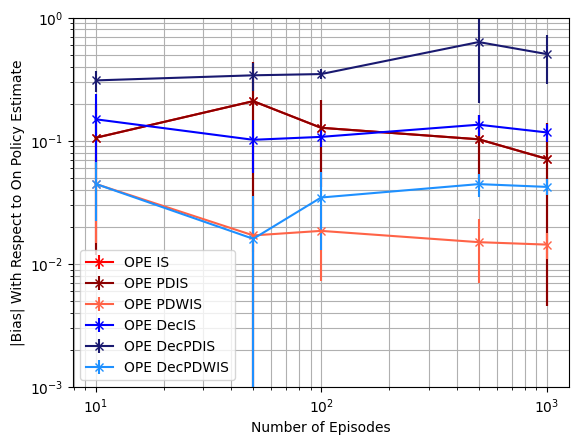

In [ ]:
label = 'bias'
plot_graphs(bias_means, bias_stds, label, 10**-3, 10**0, shorter_D, estimator='IS')

##### Plot Variance

On Policy-----[0.04220952 0.0109053  0.00498116 0.00093219 0.00046462]
OPE IS-----[0.31438626 2.51021626 0.62004755 0.42975333 0.20417582]
OPE PDIS-----[0.31438626 2.51021626 0.62004755 0.42975333 0.20417582]
OPE PDWIS-----[0.00014642 0.00022214 0.0002223  0.00029355 0.00020177]
OPE DecIS-----[0.41403391 0.08522447 0.02906409 0.02705569 0.00942616]
OPE DecPDIS-----[0.37170652 0.1410281  0.0641919  4.41080679 1.11220752]
OPE DecPDWIS-----[0.00108086 0.00047991 0.00042961 0.0002814  0.00018437]


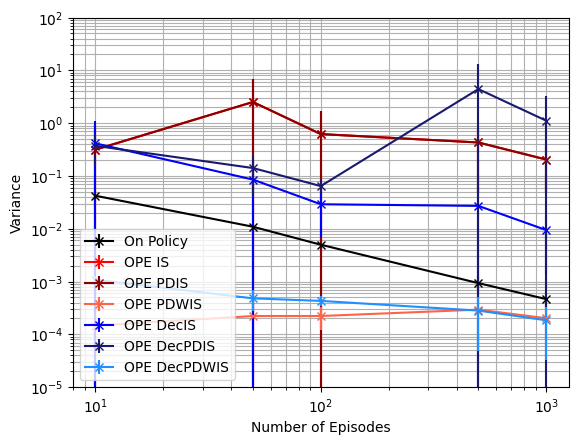

In [ ]:
label = 'var'
plot_graphs(var_means, var_stds, label, 10**(-5), 10**2, shorter_D, estimator='IS')

##### Plot MSE

On Policy-----[0.04220952 0.0109053  0.00498116 0.00093219 0.00046462]
OPE IS-----[0.33432663 2.60504642 0.64357393 0.44379718 0.21372384]
OPE PDIS-----[0.33432663 2.60504642 0.64357393 0.44379718 0.21372384]
OPE PDWIS-----[0.00302796 0.00053306 0.00069278 0.00058366 0.00041961]
OPE DecIS-----[0.44450507 0.09773964 0.04095    0.04597945 0.02347407]
OPE DecPDIS-----[0.47059468 0.26375106 0.18604187 4.99675915 1.41478379]
OPE DecPDWIS-----[0.00357685 0.00111638 0.00209549 0.0023488  0.00200441]


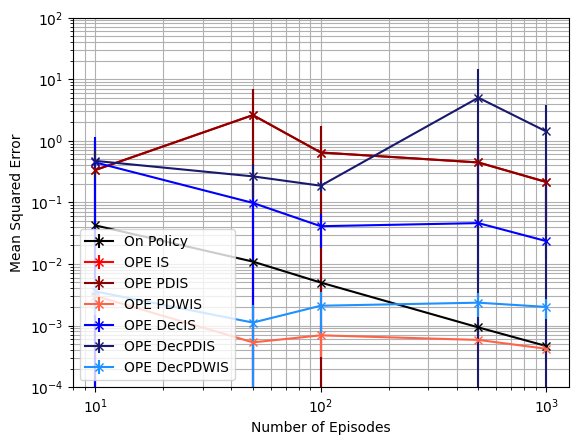

In [ ]:
label = 'MSE'
plot_graphs(MSE_means, MSE_stds, label, 10**(-4), 10**2, shorter_D, estimator='IS')

##### Plot ESS

On Policy-----[  10.   50.  100.  500. 1000.]
OPE IS-----[103.66169168  26.79665914  16.54072794  12.7600613   48.37369882]
OPE PDIS-----[103.66169168  26.79665914  16.54072794  12.7600613   48.37369882]
OPE PDWIS-----[3190.89843815 5777.05362917 3848.12783372 1714.186909   4571.41496067]
OPE DecIS-----[ 4.83756471 48.29611973 26.41846183 58.52863008 87.50975327]
OPE DecPDIS-----[ 2.47911582  6.68184664  8.71731931 20.64736744 23.87175081]
OPE DecPDWIS-----[ 422.084646   1337.16469234 1211.34771559 3277.07581214 5983.17026635]


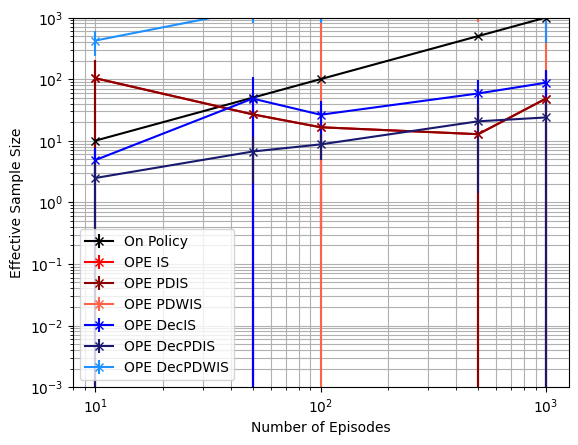

In [ ]:
label = 'ESS'
plot_graphs(ESS_means, ESS_stds, label, 10**(-3), 10**3, shorter_D, estimator='IS')

### Varying Episodes $\epsilon_{e} = 0.4$ (Policy Divergence $4.8^{20}$)

Set up evaluation policy, generate data and convert into factored format

In [ ]:
EVAL_EPSILON = 0.4

evalPolSoft = np.copy(fullPol)
evalPolSoft[evalPolSoft == 1] = 1 - EVAL_EPSILON
evalPolSoft[evalPolSoft == 0] = EVAL_EPSILON / (n_actions - 1)

In [ ]:
# Calculate policy divergence from Voloshin et al.
D = 0
for state in range(randPol.shape[0] - 1):
    for action in range(randPol.shape[1] - 1):
        difference = evalPolSoft[state, action]/randPol[state, action]
        D = max(D, difference)
print(D)
shorter_D = round(D,2)

4.8


In [ ]:
dgen = DataGenerator()
states, actions, lengths, rewards, diab, emp_tx_totals, emp_r_totals = dgen.simulate(
    NSIMSAMPS, NSTEPS, policy=evalPolSoft, policy_idx_type='full',
    p_diabetes=PROB_DIAB, use_tqdm=False) #True, tqdm_desc='Behaviour Policy Simulation')

obs_samps = utils.format_dgen_samps(
    states, actions, rewards, diab, NSTEPS, NSIMSAMPS)

In [ ]:
time = np.arange(NSTEPS)
times = np.stack(axis=0, arrays=[time]*NSIMSAMPS)
times = times[..., np.newaxis]

nf_tr_e = np.concatenate((times, states[:, 0:NSTEPS, :], actions, rewards, states[:, 1:, :]), axis=2)
nf_tr_e.shape

(100000, 20, 5)

In [ ]:
f_tr_e = factorise_dataset(nf_tr_e)

In [ ]:
factored_evalPolSoft = factor_policy(evalPolSoft)

In [ ]:
evalPolSoft = pad_policy(evalPolSoft)

factored_evalPolSoft[0] = pad_policy(factored_evalPolSoft[0])
factored_evalPolSoft[1] = pad_policy(factored_evalPolSoft[1])
factored_evalPolSoft[2] = pad_policy(factored_evalPolSoft[2])

In [ ]:
import policy_estimators as pe
import gc

def evaluate_PE(RUNS, EPISODES, SHORTER_D, STEPS=NSTEPS):

  biases = np.zeros((5, 7))
  variances = np.zeros((5, 7))
  MSEs = np.zeros((5, 7))
  ESSs = np.zeros((5, 7))

  # Reshape data for processing
  T, ldim = nf_tr_b.shape[-2], nf_tr_b.shape[-1]
  nfb = nf_tr_b.reshape((-1, RUNS, EPISODES, T, ldim))
  nfe = nf_tr_e.reshape((-1, RUNS, EPISODES, T, ldim))

  T, D, ldim = f_tr_b.shape[-3], f_tr_b.shape[-2], f_tr_b.shape[-1]
  fb = f_tr_b.reshape((-1, RUNS, EPISODES, T, D, ldim))
  fe = f_tr_e.reshape((-1, RUNS, EPISODES, T, D, ldim))

  for t in range(5):
    print()

    lower_index = 0
    estimates_on_policy = np.zeros(RUNS)
    estimates_OPE_IS = np.zeros(RUNS)
    estimates_OPE_PDIS = np.zeros(RUNS)
    estimates_OPE_PDWIS = np.zeros(RUNS)

    estimates_OPE_DecIS = np.zeros(RUNS)
    estimates_OPE_DecPDIS = np.zeros(RUNS)
    estimates_OPE_DecPDWIS = np.zeros(RUNS)

    for r in range(RUNS):
        #On policy Q estimate
        estimates_on_policy[r] = pe.on_policy_Q_estimate(nfe[t, r, :, :STEPS, :], DISCOUNT_Pol)
        #Off policy IS estimate
        estimates_OPE_IS[r] = pe.off_policy_IS_estimator(nfb[t, r, :, :STEPS, :], DISCOUNT_Pol, randPol, evalPolSoft)
        #Off policy PDIS estimate
        estimates_OPE_PDIS[r] = pe.off_policy_PDIS_estimator(nfb[t, r, :, :STEPS, :], DISCOUNT_Pol, randPol, evalPolSoft)
        #Off policy PDWIS estimate
        estimates_OPE_PDWIS[r] = pe.off_policy_PDWIS_estimator(nfb[t, r, :, :STEPS, :], DISCOUNT_Pol, randPol, evalPolSoft)

        #Factorisation 1----------------------------------

        #Off policy decomposed IS estimate
        estimates_OPE_DecIS[r], _ = pe.off_policy_DecIS_estimator(fb[t, r, :, :STEPS, :, :], DISCOUNT_Pol, [0,1], factored_randPol, factored_evalPolSoft)
        #Off policy decomposed PDIS estimate
        estimates_OPE_DecPDIS[r], _ = pe.off_policy_DecPDIS_estimator(fb[t, r, :, :STEPS, :, :], DISCOUNT_Pol, [0,1], factored_randPol, factored_evalPolSoft)
        #Off policy decomposed PDWIS estimate
        estimates_OPE_DecPDWIS[r], _ = pe.off_policy_DecPDWIS_estimator(fb[t, r, :, :STEPS, :, :], DISCOUNT_Pol, [0,1], factored_randPol, factored_evalPolSoft)


    mean_on_policy = np.mean(estimates_on_policy)
    var_on_policy = np.var(estimates_on_policy, ddof=0)
    print(f'Mean on policy Q estimate: {mean_on_policy}. Variance of on policy Q estimate: {var_on_policy}')

    from sklearn.metrics import mean_squared_error

    #For on policy
    biases[t, 0] = 0.0
    variances[t, 0] = var_on_policy
    MSEs[t, 0] = var_on_policy
    ESSs[t, 0] = EPISODES

    def generate_results(estimates, mean_true, label):
      MSE = mean_squared_error(estimates, [mean_true]*RUNS)
      mean = np.mean(estimates)
      var = np.var(estimates, ddof=0)
      bias1 = np.sqrt(MSE - var)
      bias2 = abs(mean - mean_true)
      print(f'Mean {label} estimate: {mean}. Bias1: {bias1}. Bias2: {bias2}. Variance: {var}. MSE: {MSE}')
      return bias1, var, MSE

    label_list = ['OPE IS', 'OPE PDIS', 'OPE PDWIS',
                  'OPE DecIS', 'OPE DecPDIS', 'OPE DecPDWIS'
                  ]

    estimates = [estimates_OPE_IS, estimates_OPE_PDIS, estimates_OPE_PDWIS,
                estimates_OPE_DecIS, estimates_OPE_DecPDIS, estimates_OPE_DecPDWIS
                ]


    for (id, val) in enumerate(label_list):
      biases[t, 1+id], variances[t, 1+id], MSEs[t, 1+id] = generate_results(estimates[id], mean_on_policy, label_list[id])
      ESSs[t, 1+id] = (EPISODES*variances[t, 0])/variances[t, 1+id]
      gc.collect()

  return np.mean(biases, axis=0), np.std(biases, axis=0), np.mean(variances, axis=0), np.std(variances, axis=0), np.mean(MSEs, axis=0), np.std(MSEs, axis=0), np.mean(ESSs, axis=0), np.std(ESSs, axis=0)

#### Run Everything

In [ ]:
EPISODES = [10, 50, 100, 500, 1000]

bias_means = np.zeros((len(EPISODES), 7))
bias_stds = np.zeros((len(EPISODES), 7))
var_means = np.zeros((len(EPISODES), 7))
var_stds = np.zeros((len(EPISODES), 7))
MSE_means = np.zeros((len(EPISODES), 7))
MSE_stds = np.zeros((len(EPISODES), 7))
ESS_means = np.zeros((len(EPISODES), 7))
ESS_stds = np.zeros((len(EPISODES), 7))

RUNS = 20

for id in range(len(EPISODES)):
  e = EPISODES[id]
  print(f'{e} Episodes, {RUNS} ----------------------------------')
  bias_means[id, :], bias_stds[id, :], var_means[id, :], var_stds[id, :], MSE_means[id, :], MSE_stds[id, :], ESS_means[id, :], ESS_stds[id, :] = evaluate_PE(RUNS=RUNS, EPISODES=e, SHORTER_D=shorter_D)
  print()
  gc.collect()

print('BIAS MEANS')
print(list(bias_means))
print('\nBIAS STDS')
print(list(bias_stds))
print('\nVAR MEANS')
print(list(var_means))
print('\nVAR STDS')
print(list(var_stds))
print('\nMSE MEANS')
print(list(MSE_means))
print('\nMSE STDS')
print(list(MSE_stds))
print('\nESS MEANS')
print(list(ESS_means))
print('\nESS STDS')
print(list(ESS_stds))

10 Episodes, 20 ----------------------------------

Mean on policy Q estimate: -0.3662153134467302. Variance of on policy Q estimate: 0.05578330541414678
Mean OPE IS estimate: -0.14917313034921564. Bias1: 0.21704218309751455. Bias2: 0.21704218309751455. Variance: 0.011690583743813421. MSE: 0.05879789298754845
Mean OPE PDIS estimate: -0.14917313034921564. Bias1: 0.21704218309751455. Bias2: 0.21704218309751455. Variance: 0.011690583743813421. MSE: 0.05879789298754845
Mean OPE PDWIS estimate: -0.02426793728265383. Bias1: 0.3419473761640764. Bias2: 0.3419473761640764. Variance: 7.415747733894616e-05. MSE: 0.1170021655428353
Mean OPE DecIS estimate: -0.15067533818640994. Bias1: 0.21553997526032026. Bias2: 0.21553997526032026. Variance: 0.05152511723910982. MSE: 0.09798259817432929
Mean OPE DecPDIS estimate: -0.48312635160987993. Bias1: 0.11691103816314817. Bias2: 0.11691103816314974. Variance: 0.826025203899577. MSE: 0.8396933947439621
Mean OPE DecPDWIS estimate: -0.04110450650637631. Bias1

#### Plot Graphs

##### Plot Bias

OPE IS-----[0.11523852 0.22738704 0.21548419 0.10793234 0.07310406]
OPE PDIS-----[0.11523852 0.22738704 0.21548419 0.10793234 0.07310406]
OPE PDWIS-----[0.28347627 0.30044697 0.3070332  0.30641612 0.3027682 ]
OPE DecIS-----[0.09313952 0.14517473 0.15112784 0.11474512 0.1295926 ]
OPE DecPDIS-----[0.10554617 0.09596175 0.06662453 0.20588058 0.15624521]
OPE DecPDWIS-----[0.27240031 0.29034629 0.2966219  0.29086127 0.28894877]


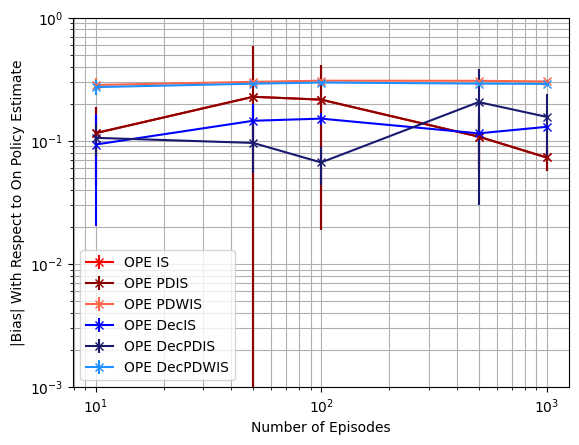

In [ ]:
label = 'bias'
plot_graphs(bias_means, bias_stds, label, 10**-3, 10**0, shorter_D, estimator='IS')

##### Plot Variance

On Policy-----[0.04182225 0.00876596 0.00382025 0.00091226 0.00039082]
OPE IS-----[0.3070164  4.75672617 1.90409516 0.25347475 0.10211495]
OPE PDIS-----[0.3070164  4.75672617 1.90409516 0.25347475 0.10211495]
OPE PDWIS-----[0.00014398 0.00022377 0.00018827 0.00026156 0.00015468]
OPE DecIS-----[0.24229646 0.04140285 0.02049864 0.03191001 0.01127269]
OPE DecPDIS-----[0.31577456 0.07267929 0.03561289 0.74581053 0.19454122]
OPE DecPDWIS-----[4.20236398e-04 2.07611151e-04 1.62266390e-04 1.22528092e-04
 8.19830852e-05]


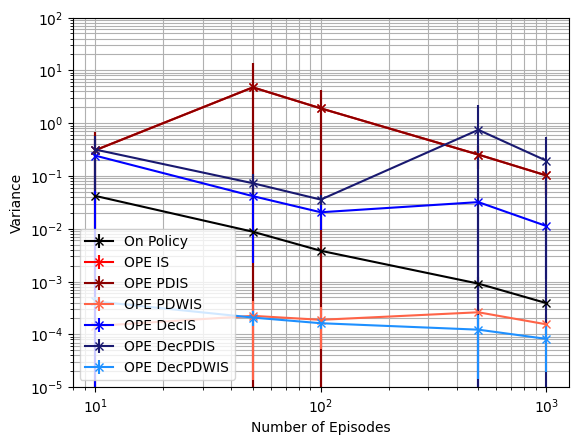

In [ ]:
label = 'var'
plot_graphs(var_means, var_stds, label, 10**(-5), 10**2, shorter_D, estimator='IS')

##### Plot MSE

On Policy-----[0.04182225 0.00876596 0.00382025 0.00091226 0.00039082]
OPE IS-----[0.32535966 4.94021669 1.98919945 0.26773687 0.10773876]
OPE PDIS-----[0.32535966 4.94021669 1.98919945 0.26773687 0.10773876]
OPE PDWIS-----[0.08199298 0.09065288 0.09459469 0.09417037 0.09185447]
OPE DecIS-----[0.25624848 0.06523622 0.04366276 0.04566401 0.02822469]
OPE DecPDIS-----[0.32786224 0.08359503 0.04058501 0.81914053 0.2261083 ]
OPE DecPDWIS-----[0.07593259 0.08470023 0.08825058 0.08475533 0.08358005]


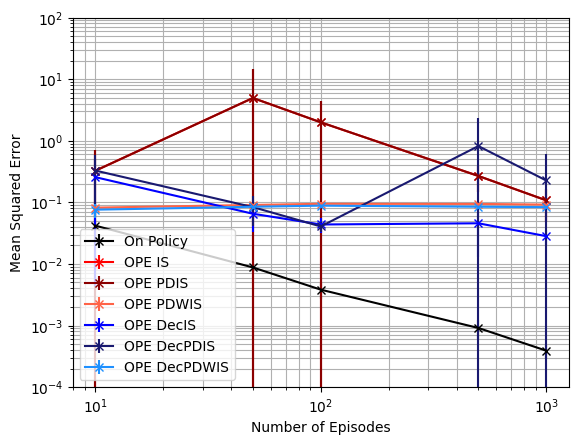

In [ ]:
label = 'MSE'
plot_graphs(MSE_means, MSE_stds, label, 10**(-4), 10**2, shorter_D, estimator='IS')

##### Plot ESS

On Policy-----[  10.   50.  100.  500. 1000.]
OPE IS-----[16.31320666  3.98759376  7.21813486  2.21295129 15.50403032]
OPE PDIS-----[16.31320666  3.98759376  7.21813486  2.21295129 15.50403032]
OPE PDWIS-----[3686.77995816 5030.15195925 3815.3511062  1778.70530802 5690.35151765]
OPE DecIS-----[ 5.64983566 32.87421394 27.07999662 45.76396144 59.45241345]
OPE DecPDIS-----[ 2.30655465  8.23400492 10.92581075 34.61868743 20.6269831 ]
OPE DecPDWIS-----[1036.62704994 2362.74357267 2395.85510432 7154.89768355 7091.85553436]


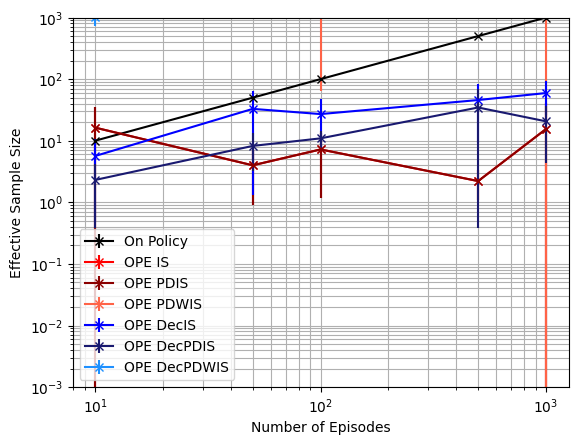

In [ ]:
label = 'ESS'
plot_graphs(ESS_means, ESS_stds, label, 10**(-3), 10**3, shorter_D, estimator='IS')

### Varying Episodes $\epsilon_{e} = 0.6$ (Policy Divergence $3.2^{20}$)

Set up evaluation policy, generate data and convert into factored format

In [ ]:
EVAL_EPSILON = 0.6

evalPolSoft = np.copy(fullPol)
evalPolSoft[evalPolSoft == 1] = 1 - EVAL_EPSILON
evalPolSoft[evalPolSoft == 0] = EVAL_EPSILON / (n_actions - 1)

In [ ]:
# Calculate policy divergence from Voloshin et al.
D = 0
for state in range(randPol.shape[0] - 1):
    for action in range(randPol.shape[1] - 1):
        difference = evalPolSoft[state, action]/randPol[state, action]
        D = max(D, difference)
print(D)
shorter_D = round(D,2)

3.2


In [ ]:
dgen = DataGenerator()
states, actions, lengths, rewards, diab, emp_tx_totals, emp_r_totals = dgen.simulate(
    NSIMSAMPS, NSTEPS, policy=evalPolSoft, policy_idx_type='full',
    p_diabetes=PROB_DIAB, use_tqdm=False) #True, tqdm_desc='Behaviour Policy Simulation')

obs_samps = utils.format_dgen_samps(
    states, actions, rewards, diab, NSTEPS, NSIMSAMPS)

In [ ]:
time = np.arange(NSTEPS)
times = np.stack(axis=0, arrays=[time]*NSIMSAMPS)
times = times[..., np.newaxis]

nf_tr_e = np.concatenate((times, states[:, 0:NSTEPS, :], actions, rewards, states[:, 1:, :]), axis=2)
nf_tr_e.shape

(100000, 20, 5)

In [ ]:
f_tr_e = factorise_dataset(nf_tr_e)

In [ ]:
factored_evalPolSoft = factor_policy(evalPolSoft)

In [ ]:
evalPolSoft = pad_policy(evalPolSoft)

factored_evalPolSoft[0] = pad_policy(factored_evalPolSoft[0])
factored_evalPolSoft[1] = pad_policy(factored_evalPolSoft[1])
factored_evalPolSoft[2] = pad_policy(factored_evalPolSoft[2])

In [ ]:
import policy_estimators as pe
import gc

def evaluate_PE(RUNS, EPISODES, SHORTER_D, STEPS=NSTEPS):

  biases = np.zeros((5, 7))
  variances = np.zeros((5, 7))
  MSEs = np.zeros((5, 7))
  ESSs = np.zeros((5, 7))

  # Reshape data for processing
  T, ldim = nf_tr_b.shape[-2], nf_tr_b.shape[-1]
  nfb = nf_tr_b.reshape((-1, RUNS, EPISODES, T, ldim))
  nfe = nf_tr_e.reshape((-1, RUNS, EPISODES, T, ldim))

  T, D, ldim = f_tr_b.shape[-3], f_tr_b.shape[-2], f_tr_b.shape[-1]
  fb = f_tr_b.reshape((-1, RUNS, EPISODES, T, D, ldim))
  fe = f_tr_e.reshape((-1, RUNS, EPISODES, T, D, ldim))

  for t in range(5):
    print()

    lower_index = 0
    estimates_on_policy = np.zeros(RUNS)
    estimates_OPE_IS = np.zeros(RUNS)
    estimates_OPE_PDIS = np.zeros(RUNS)
    estimates_OPE_PDWIS = np.zeros(RUNS)

    estimates_OPE_DecIS = np.zeros(RUNS)
    estimates_OPE_DecPDIS = np.zeros(RUNS)
    estimates_OPE_DecPDWIS = np.zeros(RUNS)

    for r in range(RUNS):
        #On policy Q estimate
        estimates_on_policy[r] = pe.on_policy_Q_estimate(nfe[t, r, :, :STEPS, :], DISCOUNT_Pol)
        #Off policy IS estimate
        estimates_OPE_IS[r] = pe.off_policy_IS_estimator(nfb[t, r, :, :STEPS, :], DISCOUNT_Pol, randPol, evalPolSoft)
        #Off policy PDIS estimate
        estimates_OPE_PDIS[r] = pe.off_policy_PDIS_estimator(nfb[t, r, :, :STEPS, :], DISCOUNT_Pol, randPol, evalPolSoft)
        #Off policy PDWIS estimate
        estimates_OPE_PDWIS[r] = pe.off_policy_PDWIS_estimator(nfb[t, r, :, :STEPS, :], DISCOUNT_Pol, randPol, evalPolSoft)

        #Factorisation 1----------------------------------

        #Off policy decomposed IS estimate
        estimates_OPE_DecIS[r], _ = pe.off_policy_DecIS_estimator(fb[t, r, :, :STEPS, :, :], DISCOUNT_Pol, [0,1], factored_randPol, factored_evalPolSoft)
        #Off policy decomposed PDIS estimate
        estimates_OPE_DecPDIS[r], _ = pe.off_policy_DecPDIS_estimator(fb[t, r, :, :STEPS, :, :], DISCOUNT_Pol, [0,1], factored_randPol, factored_evalPolSoft)
        #Off policy decomposed PDWIS estimate
        estimates_OPE_DecPDWIS[r], _ = pe.off_policy_DecPDWIS_estimator(fb[t, r, :, :STEPS, :, :], DISCOUNT_Pol, [0,1], factored_randPol, factored_evalPolSoft)


    mean_on_policy = np.mean(estimates_on_policy)
    var_on_policy = np.var(estimates_on_policy, ddof=0)
    print(f'Mean on policy Q estimate: {mean_on_policy}. Variance of on policy Q estimate: {var_on_policy}')

    from sklearn.metrics import mean_squared_error

    #For on policy
    biases[t, 0] = 0.0
    variances[t, 0] = var_on_policy
    MSEs[t, 0] = var_on_policy
    ESSs[t, 0] = EPISODES

    def generate_results(estimates, mean_true, label):
      MSE = mean_squared_error(estimates, [mean_true]*RUNS)
      mean = np.mean(estimates)
      var = np.var(estimates, ddof=0)
      bias1 = np.sqrt(MSE - var)
      bias2 = abs(mean - mean_true)
      print(f'Mean {label} estimate: {mean}. Bias1: {bias1}. Bias2: {bias2}. Variance: {var}. MSE: {MSE}')
      return bias1, var, MSE

    label_list = ['OPE IS', 'OPE PDIS', 'OPE PDWIS',
                  'OPE DecIS', 'OPE DecPDIS', 'OPE DecPDWIS'
                  ]

    estimates = [estimates_OPE_IS, estimates_OPE_PDIS, estimates_OPE_PDWIS,
                estimates_OPE_DecIS, estimates_OPE_DecPDIS, estimates_OPE_DecPDWIS
                ]


    for (id, val) in enumerate(label_list):
      biases[t, 1+id], variances[t, 1+id], MSEs[t, 1+id] = generate_results(estimates[id], mean_on_policy, label_list[id])
      ESSs[t, 1+id] = (EPISODES*variances[t, 0])/variances[t, 1+id]
      gc.collect()

  return np.mean(biases, axis=0), np.std(biases, axis=0), np.mean(variances, axis=0), np.std(variances, axis=0), np.mean(MSEs, axis=0), np.std(MSEs, axis=0), np.mean(ESSs, axis=0), np.std(ESSs, axis=0)

#### Run Everything

In [ ]:
EPISODES = [10, 50, 100, 500, 1000]

bias_means = np.zeros((len(EPISODES), 7))
bias_stds = np.zeros((len(EPISODES), 7))
var_means = np.zeros((len(EPISODES), 7))
var_stds = np.zeros((len(EPISODES), 7))
MSE_means = np.zeros((len(EPISODES), 7))
MSE_stds = np.zeros((len(EPISODES), 7))
ESS_means = np.zeros((len(EPISODES), 7))
ESS_stds = np.zeros((len(EPISODES), 7))

RUNS = 20

for id in range(len(EPISODES)):
  e = EPISODES[id]
  print(f'{e} Episodes, {RUNS} ----------------------------------')
  bias_means[id, :], bias_stds[id, :], var_means[id, :], var_stds[id, :], MSE_means[id, :], MSE_stds[id, :], ESS_means[id, :], ESS_stds[id, :] = evaluate_PE(RUNS=RUNS, EPISODES=e, SHORTER_D=shorter_D)
  print()
  gc.collect()

print('BIAS MEANS')
print(list(bias_means))
print('\nBIAS STDS')
print(list(bias_stds))
print('\nVAR MEANS')
print(list(var_means))
print('\nVAR STDS')
print(list(var_stds))
print('\nMSE MEANS')
print(list(MSE_means))
print('\nMSE STDS')
print(list(MSE_stds))
print('\nESS MEANS')
print(list(ESS_means))
print('\nESS STDS')
print(list(ESS_stds))

10 Episodes, 20 ----------------------------------

Mean on policy Q estimate: -0.5794106488016154. Variance of on policy Q estimate: 0.018150485577915192
Mean OPE IS estimate: -0.36312858634924433. Bias1: 0.21628206245237114. Bias2: 0.21628206245237108. Variance: 0.07299500505866895. MSE: 0.11977293559732032
Mean OPE PDIS estimate: -0.36312858634924433. Bias1: 0.21628206245237114. Bias2: 0.21628206245237108. Variance: 0.07299500505866895. MSE: 0.11977293559732032
Mean OPE PDWIS estimate: -0.03082931467421926. Bias1: 0.5485813341273962. Bias2: 0.5485813341273962. Variance: 8.146979106629594e-05. MSE: 0.30102294994406015
Mean OPE DecIS estimate: -0.2980537104198715. Bias1: 0.2813569383817438. Bias2: 0.2813569383817439. Variance: 0.1397357837990717. MSE: 0.2188975105746201
Mean OPE DecPDIS estimate: -0.5298584749816774. Bias1: 0.04955217381993875. Bias2: 0.04955217381993804. Variance: 0.3632766166316062. MSE: 0.36573203456188763
Mean OPE DecPDWIS estimate: -0.033675657196120805. Bias1: 0

#### Plot Graphs

##### Plot Bias

OPE IS-----[0.13148251 0.1065772  0.10249073 0.05789607 0.03325525]
OPE PDIS-----[0.13148251 0.1065772  0.10249073 0.05789607 0.03325525]
OPE PDWIS-----[0.53726721 0.54105069 0.54330926 0.54448718 0.54496064]
OPE DecIS-----[0.24224957 0.29394242 0.28400469 0.26132883 0.27034861]
OPE DecPDIS-----[0.11254943 0.11727619 0.11510787 0.07117752 0.08418932]
OPE DecPDWIS-----[0.53682107 0.54166265 0.54422298 0.54220831 0.54344761]


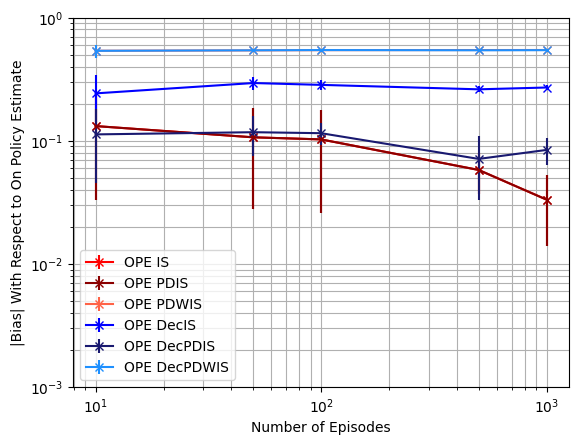

In [ ]:
label = 'bias'
plot_graphs(bias_means, bias_stds, label, 10**(-3), 10**0, shorter_D, estimator='IS')

##### Plot Variance

On Policy-----[0.04196791 0.00724199 0.00317776 0.00072783 0.00045529]
OPE IS-----[0.25235378 0.65482096 0.54579962 0.07434095 0.02661245]
OPE PDIS-----[0.25235378 0.65482096 0.54579962 0.07434095 0.02661245]
OPE PDWIS-----[1.33915438e-04 1.59811206e-04 1.20519725e-04 1.07295802e-04
 4.85521730e-05]
OPE DecIS-----[0.15139089 0.01848091 0.01782822 0.00917612 0.00392079]
OPE DecPDIS-----[0.15055896 0.02769863 0.01835222 0.03262528 0.01033378]
OPE DecPDWIS-----[1.46254627e-04 5.98595000e-05 4.45325880e-05 2.78970161e-05
 1.46069791e-05]


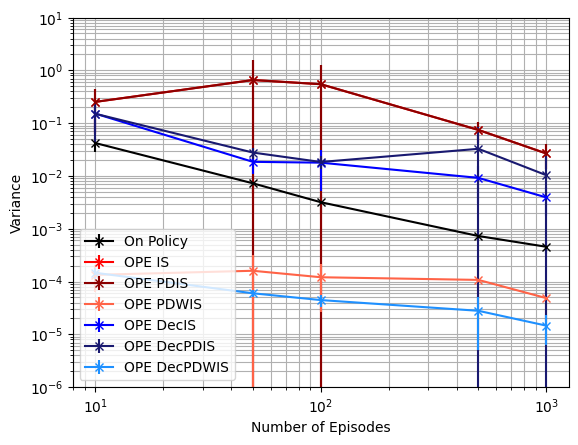

In [ ]:
label = 'var'
plot_graphs(var_means, var_stds, label, 10**(-6), 10**1, shorter_D, estimator='IS')

##### Plot MSE

On Policy-----[0.04196791 0.00724199 0.00317776 0.00072783 0.00045529]
OPE IS-----[0.27935155 0.67232771 0.56215524 0.0781374  0.02809197]
OPE PDIS-----[0.27935155 0.67232771 0.56215524 0.0781374  0.02809197]
OPE PDWIS-----[0.29296256 0.29309173 0.29544179 0.29658528 0.29705655]
OPE DecIS-----[0.22034544 0.10617591 0.09926286 0.07766986 0.07712612]
OPE DecPDIS-----[0.16771175 0.04320024 0.03214643 0.0391479  0.01787321]
OPE DecPDWIS-----[0.29239591 0.29362234 0.29635182 0.29403227 0.29536433]


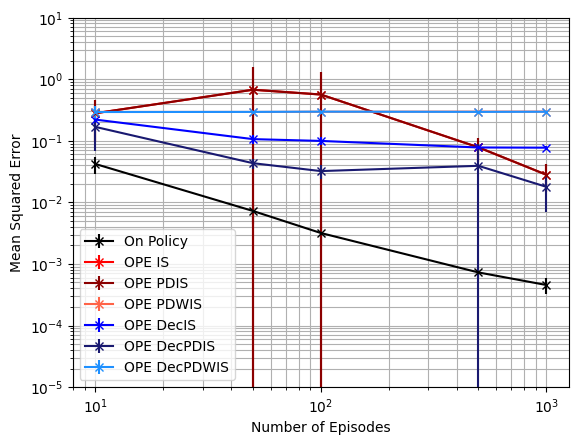

In [ ]:
label = 'MSE'
plot_graphs(MSE_means, MSE_stds, label, 10**(-5), 10**1, shorter_D, estimator='IS')

##### Plot ESS

On Policy-----[  10.   50.  100.  500. 1000.]
OPE IS-----[ 2.76906298  3.91551349  4.2562847   7.47418857 26.11456514]
OPE PDIS-----[ 2.76906298  3.91551349  4.2562847   7.47418857 26.11456514]
OPE PDWIS-----[ 3823.56457212  5207.58122487  4180.41926164  4597.24681254
 13290.91010751]
OPE DecIS-----[  5.25009649  24.35387263  30.43138681  63.6747728  165.44137494]
OPE DecPDIS-----[  4.2608456   13.9326065   21.58020894  73.81112658 129.17572153]
OPE DecPDWIS-----[ 2961.60271555  6097.57949158  8043.15371342 27846.5074701
 52076.25834676]


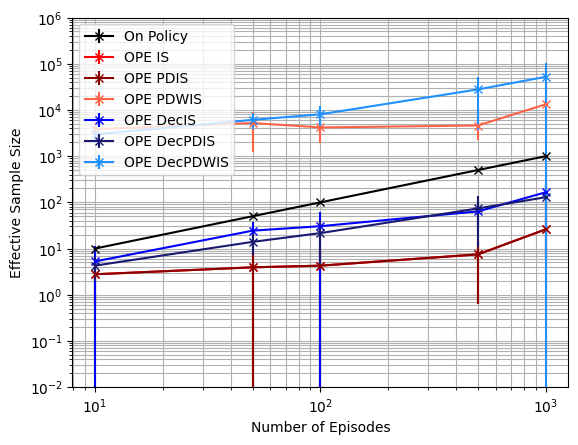

In [ ]:
label = 'ESS'
plot_graphs(ESS_means, ESS_stds, label, 10**(-2), 10**6, shorter_D, estimator='IS')

### Varying Episodes $\epsilon_{e} = 0.8$ (Policy Divergence $1.6^{20}$)



Set up evaluation policy, generate data and convert into factored format

In [ ]:
EVAL_EPSILON = 0.8

evalPolSoft = np.copy(fullPol)
evalPolSoft[evalPolSoft == 1] = 1 - EVAL_EPSILON
evalPolSoft[evalPolSoft == 0] = EVAL_EPSILON / (n_actions - 1)

In [ ]:
# Calculate policy divergence from Voloshin et al.
D = 0
for state in range(randPol.shape[0] - 1):
    for action in range(randPol.shape[1] - 1):
        difference = evalPolSoft[state, action]/randPol[state, action]
        D = max(D, difference)
print(D)
shorter_D = round(D,2)

1.5999999999999996


In [ ]:
dgen = DataGenerator()
states, actions, lengths, rewards, diab, emp_tx_totals, emp_r_totals = dgen.simulate(
    NSIMSAMPS, NSTEPS, policy=evalPolSoft, policy_idx_type='full',
    p_diabetes=PROB_DIAB, use_tqdm=False) #True, tqdm_desc='Behaviour Policy Simulation')

obs_samps = utils.format_dgen_samps(
    states, actions, rewards, diab, NSTEPS, NSIMSAMPS)

In [ ]:
time = np.arange(NSTEPS)
times = np.stack(axis=0, arrays=[time]*NSIMSAMPS)
times = times[..., np.newaxis]

nf_tr_e = np.concatenate((times, states[:, 0:NSTEPS, :], actions, rewards, states[:, 1:, :]), axis=2)
nf_tr_e.shape

(100000, 20, 5)

In [ ]:
f_tr_e = factorise_dataset(nf_tr_e)

In [ ]:
factored_evalPolSoft = factor_policy(evalPolSoft)

In [ ]:
evalPolSoft = pad_policy(evalPolSoft)

factored_evalPolSoft[0] = pad_policy(factored_evalPolSoft[0])
factored_evalPolSoft[1] = pad_policy(factored_evalPolSoft[1])
factored_evalPolSoft[2] = pad_policy(factored_evalPolSoft[2])

In [ ]:
import policy_estimators as pe
import gc

def evaluate_PE(RUNS, EPISODES, SHORTER_D, STEPS=NSTEPS):

  biases = np.zeros((5, 7))
  variances = np.zeros((5, 7))
  MSEs = np.zeros((5, 7))
  ESSs = np.zeros((5, 7))

  # Reshape data for processing
  T, ldim = nf_tr_b.shape[-2], nf_tr_b.shape[-1]
  nfb = nf_tr_b.reshape((-1, RUNS, EPISODES, T, ldim))
  nfe = nf_tr_e.reshape((-1, RUNS, EPISODES, T, ldim))

  T, D, ldim = f_tr_b.shape[-3], f_tr_b.shape[-2], f_tr_b.shape[-1]
  fb = f_tr_b.reshape((-1, RUNS, EPISODES, T, D, ldim))
  fe = f_tr_e.reshape((-1, RUNS, EPISODES, T, D, ldim))

  for t in range(5):
    print()

    lower_index = 0
    estimates_on_policy = np.zeros(RUNS)
    estimates_OPE_IS = np.zeros(RUNS)
    estimates_OPE_PDIS = np.zeros(RUNS)
    estimates_OPE_PDWIS = np.zeros(RUNS)

    estimates_OPE_DecIS = np.zeros(RUNS)
    estimates_OPE_DecPDIS = np.zeros(RUNS)
    estimates_OPE_DecPDWIS = np.zeros(RUNS)

    for r in range(RUNS):
        #On policy Q estimate
        estimates_on_policy[r] = pe.on_policy_Q_estimate(nfe[t, r, :, :STEPS, :], DISCOUNT_Pol)
        #Off policy IS estimate
        estimates_OPE_IS[r] = pe.off_policy_IS_estimator(nfb[t, r, :, :STEPS, :], DISCOUNT_Pol, randPol, evalPolSoft)
        #Off policy PDIS estimate
        estimates_OPE_PDIS[r] = pe.off_policy_PDIS_estimator(nfb[t, r, :, :STEPS, :], DISCOUNT_Pol, randPol, evalPolSoft)
        #Off policy PDWIS estimate
        estimates_OPE_PDWIS[r] = pe.off_policy_PDWIS_estimator(nfb[t, r, :, :STEPS, :], DISCOUNT_Pol, randPol, evalPolSoft)

        #Factorisation 1----------------------------------

        #Off policy decomposed IS estimate
        estimates_OPE_DecIS[r], _ = pe.off_policy_DecIS_estimator(fb[t, r, :, :STEPS, :, :], DISCOUNT_Pol, [0,1], factored_randPol, factored_evalPolSoft)
        #Off policy decomposed PDIS estimate
        estimates_OPE_DecPDIS[r], _ = pe.off_policy_DecPDIS_estimator(fb[t, r, :, :STEPS, :, :], DISCOUNT_Pol, [0,1], factored_randPol, factored_evalPolSoft)
        #Off policy decomposed PDWIS estimate
        estimates_OPE_DecPDWIS[r], _ = pe.off_policy_DecPDWIS_estimator(fb[t, r, :, :STEPS, :, :], DISCOUNT_Pol, [0,1], factored_randPol, factored_evalPolSoft)


    mean_on_policy = np.mean(estimates_on_policy)
    var_on_policy = np.var(estimates_on_policy, ddof=0)
    print(f'Mean on policy Q estimate: {mean_on_policy}. Variance of on policy Q estimate: {var_on_policy}')

    from sklearn.metrics import mean_squared_error

    #For on policy
    biases[t, 0] = 0.0
    variances[t, 0] = var_on_policy
    MSEs[t, 0] = var_on_policy
    ESSs[t, 0] = EPISODES

    def generate_results(estimates, mean_true, label):
      MSE = mean_squared_error(estimates, [mean_true]*RUNS)
      mean = np.mean(estimates)
      var = np.var(estimates, ddof=0)
      bias1 = np.sqrt(MSE - var)
      bias2 = abs(mean - mean_true)
      print(f'Mean {label} estimate: {mean}. Bias1: {bias1}. Bias2: {bias2}. Variance: {var}. MSE: {MSE}')
      return bias1, var, MSE

    label_list = ['OPE IS', 'OPE PDIS', 'OPE PDWIS',
                  'OPE DecIS', 'OPE DecPDIS', 'OPE DecPDWIS'
                  ]

    estimates = [estimates_OPE_IS, estimates_OPE_PDIS, estimates_OPE_PDWIS,
                estimates_OPE_DecIS, estimates_OPE_DecPDIS, estimates_OPE_DecPDWIS
                ]


    for (id, val) in enumerate(label_list):
      biases[t, 1+id], variances[t, 1+id], MSEs[t, 1+id] = generate_results(estimates[id], mean_on_policy, label_list[id])
      ESSs[t, 1+id] = (EPISODES*variances[t, 0])/variances[t, 1+id]
      gc.collect()

  return np.mean(biases, axis=0), np.std(biases, axis=0), np.mean(variances, axis=0), np.std(variances, axis=0), np.mean(MSEs, axis=0), np.std(MSEs, axis=0), np.mean(ESSs, axis=0), np.std(ESSs, axis=0)

#### Run Everything

In [ ]:
EPISODES = [10, 50, 100, 500, 1000]

bias_means = np.zeros((len(EPISODES), 7))
bias_stds = np.zeros((len(EPISODES), 7))
var_means = np.zeros((len(EPISODES), 7))
var_stds = np.zeros((len(EPISODES), 7))
MSE_means = np.zeros((len(EPISODES), 7))
MSE_stds = np.zeros((len(EPISODES), 7))
ESS_means = np.zeros((len(EPISODES), 7))
ESS_stds = np.zeros((len(EPISODES), 7))

RUNS = 20

for id in range(len(EPISODES)):
  e = EPISODES[id]
  print(f'{e} Episodes, {RUNS} ----------------------------------')
  bias_means[id, :], bias_stds[id, :], var_means[id, :], var_stds[id, :], MSE_means[id, :], MSE_stds[id, :], ESS_means[id, :], ESS_stds[id, :] = evaluate_PE(RUNS=RUNS, EPISODES=e, SHORTER_D=shorter_D)
  print()
  gc.collect()

print('BIAS MEANS')
print(list(bias_means))
print('\nBIAS STDS')
print(list(bias_stds))
print('\nVAR MEANS')
print(list(var_means))
print('\nVAR STDS')
print(list(var_stds))
print('\nMSE MEANS')
print(list(MSE_means))
print('\nMSE STDS')
print(list(MSE_stds))
print('\nESS MEANS')
print(list(ESS_means))
print('\nESS STDS')
print(list(ESS_stds))

10 Episodes, 20 ----------------------------------

Mean on policy Q estimate: -0.7316824475371562. Variance of on policy Q estimate: 0.0156629429962254
Mean OPE IS estimate: -0.6749815255495666. Bias1: 0.056700921987589706. Bias2: 0.05670092198758958. Variance: 0.027163020654164687. MSE: 0.03037801520840742
Mean OPE PDIS estimate: -0.6749815255495666. Bias1: 0.056700921987589706. Bias2: 0.05670092198758958. Variance: 0.027163020654164687. MSE: 0.03037801520840742
Mean OPE PDWIS estimate: -0.037691145285818475. Bias1: 0.6939913022513376. Bias2: 0.6939913022513376. Variance: 5.401818363394283e-05. MSE: 0.48167794578414147
Mean OPE DecIS estimate: -0.4378787537491938. Bias1: 0.2938036937879624. Bias2: 0.29380369378796234. Variance: 0.014198075668443666. MSE: 0.10051868615189444
Mean OPE DecPDIS estimate: -0.508892723364762. Bias1: 0.2227897241723941. Bias2: 0.22278972417239418. Variance: 0.013935334835716375. MSE: 0.06357059603252782
Mean OPE DecPDWIS estimate: -0.02806959685589157. Bias

#### Plot Graphs

##### Plot Bias

OPE IS-----[0.04284105 0.02476613 0.01530992 0.00697994 0.00528687]
OPE PDIS-----[0.04284105 0.02476613 0.01530992 0.00697994 0.00528687]
OPE PDWIS-----[0.72261075 0.70199885 0.7093426  0.70929967 0.71037669]
OPE DecIS-----[0.30890692 0.2937643  0.29779926 0.29344857 0.29535149]
OPE DecPDIS-----[0.24468943 0.22607748 0.23142187 0.22663321 0.22847291]
OPE DecPDWIS-----[0.73250286 0.71188263 0.71919576 0.71889498 0.71995736]


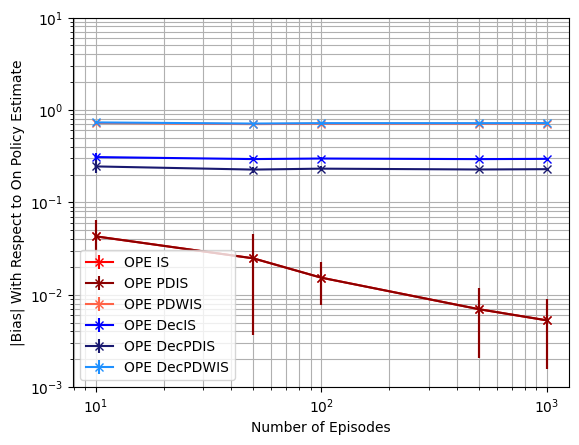

In [ ]:
label = 'bias'
plot_graphs(bias_means, bias_stds, label, 10**(-3), 10**1, shorter_D, estimator='IS')

##### Plot Variance

On Policy-----[0.02063106 0.00451811 0.00213974 0.00044817 0.00021403]
OPE IS-----[0.0405514  0.00909131 0.0053957  0.00101003 0.00043035]
OPE PDIS-----[0.0405514  0.00909131 0.0053957  0.00101003 0.00043035]
OPE PDWIS-----[6.05709775e-05 1.46534465e-05 8.84504056e-06 1.89162257e-06
 1.10094253e-06]
OPE DecIS-----[0.01570497 0.0029821  0.00204377 0.00031437 0.00017775]
OPE DecPDIS-----[0.01638274 0.00305199 0.0018448  0.00032412 0.00018447]
OPE DecPDWIS-----[3.15892574e-05 6.39949174e-06 3.92657576e-06 7.85430491e-07
 4.43045258e-07]


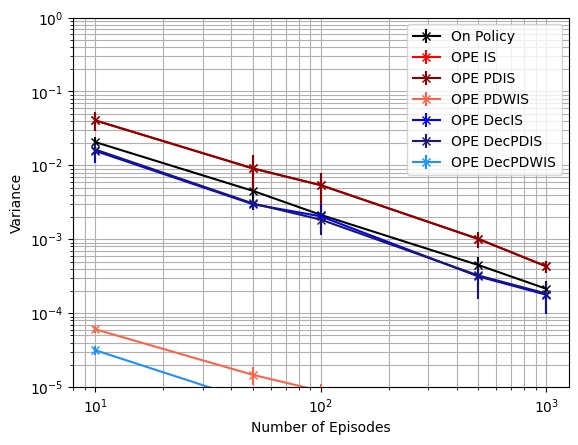

In [ ]:
label = 'var'
plot_graphs(var_means, var_stds, label, 10**(-5), 10**0, shorter_D, estimator='IS')

##### Plot MSE

On Policy-----[0.02063106 0.00451811 0.00213974 0.00044817 0.00021403]
OPE IS-----[0.04286215 0.01015114 0.00568683 0.00108273 0.00047203]
OPE PDIS-----[0.04286215 0.01015114 0.00568683 0.00108273 0.00047203]
OPE PDWIS-----[0.52262334 0.49306577 0.50336513 0.50311101 0.50463754]
OPE DecIS-----[0.11240574 0.0894947  0.09090126 0.08643698 0.08741743]
OPE DecPDIS-----[0.07779685 0.05443342 0.05561172 0.05169834 0.05239164]
OPE DecPDWIS-----[0.53699892 0.50703798 0.51744078 0.5168144  0.51834055]


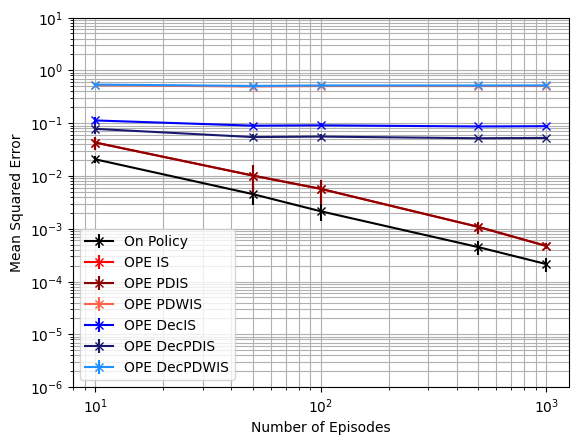

In [ ]:
label = 'MSE'
plot_graphs(MSE_means, MSE_stds, label, 10**(-6), 10**1, shorter_D, estimator='IS')

##### Plot ESS

On Policy-----[  10.   50.  100.  500. 1000.]
OPE IS-----[  5.39358264  33.65098124  49.19229545 245.28404043 533.87228357]
OPE PDIS-----[  5.39358264  33.65098124  49.19229545 245.28404043 533.87228357]
OPE PDWIS-----[  3461.35957936  16960.84023055  26831.56015942 135909.50340179
 215904.21963185]
OPE DecIS-----[  14.42624282   77.09553373  129.5343023   927.86798205 1365.66805261]
OPE DecPDIS-----[  13.3776088    73.48304729  137.4934666   946.94679302 1263.99571136]
OPE DecPDWIS-----[  6535.28337872  35755.12836804  55817.12001034 340573.6181925
 505808.64205085]


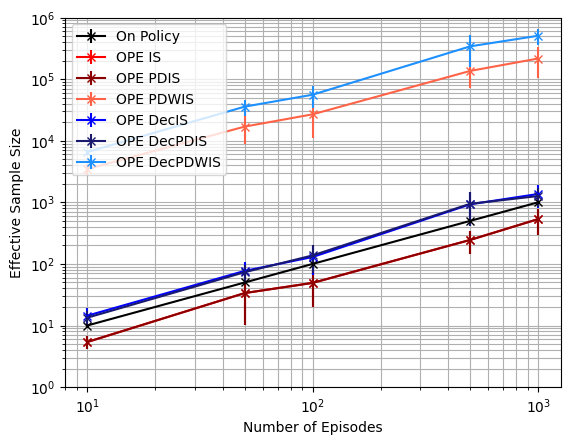

In [ ]:
label = 'ESS'
plot_graphs(ESS_means, ESS_stds, label, 10**(0), 10**6, shorter_D, estimator='IS')

### Varying Episode Length $T$ With $\epsilon_{e} = 0.8$ (Policy Divergence $1.6^{T}$)

Set up evaluation policy, generate data and convert into factored format

In [ ]:
EVAL_EPSILON = 0.8

evalPolSoft = np.copy(fullPol)
evalPolSoft[evalPolSoft == 1] = 1 - EVAL_EPSILON
evalPolSoft[evalPolSoft == 0] = EVAL_EPSILON / (n_actions - 1)

In [ ]:
# Calculate policy divergence from Voloshin et al.
D = 0
for state in range(randPol.shape[0] - 1):
    for action in range(randPol.shape[1] - 1):
        difference = evalPolSoft[state, action]/randPol[state, action]
        D = max(D, difference)
print(D)
shorter_D = round(D,2)

1.5999999999999996


In [ ]:
dgen = DataGenerator()
states, actions, lengths, rewards, diab, emp_tx_totals, emp_r_totals = dgen.simulate(
    NSIMSAMPS, NSTEPS, policy=evalPolSoft, policy_idx_type='full',
    p_diabetes=PROB_DIAB, use_tqdm=False) #True, tqdm_desc='Behaviour Policy Simulation')

obs_samps = utils.format_dgen_samps(
    states, actions, rewards, diab, NSTEPS, NSIMSAMPS)

In [ ]:
time = np.arange(NSTEPS)
times = np.stack(axis=0, arrays=[time]*NSIMSAMPS)
times = times[..., np.newaxis]

nf_tr_e = np.concatenate((times, states[:, 0:NSTEPS, :], actions, rewards, states[:, 1:, :]), axis=2)
nf_tr_e.shape

(100000, 20, 5)

In [ ]:
f_tr_e = factorise_dataset(nf_tr_e)

In [ ]:
factored_evalPolSoft = factor_policy(evalPolSoft)

In [ ]:
evalPolSoft = pad_policy(evalPolSoft)

factored_evalPolSoft[0] = pad_policy(factored_evalPolSoft[0])
factored_evalPolSoft[1] = pad_policy(factored_evalPolSoft[1])
factored_evalPolSoft[2] = pad_policy(factored_evalPolSoft[2])

In [ ]:
import policy_estimators as pe
import gc

def evaluate_PE(RUNS, EPISODES, SHORTER_D, STEPS=NSTEPS):

  biases = np.zeros((5, 7))
  variances = np.zeros((5, 7))
  MSEs = np.zeros((5, 7))
  ESSs = np.zeros((5, 7))

  # Reshape data for processing
  T, ldim = nf_tr_b.shape[-2], nf_tr_b.shape[-1]
  nfb = nf_tr_b.reshape((-1, RUNS, EPISODES, T, ldim))
  nfe = nf_tr_e.reshape((-1, RUNS, EPISODES, T, ldim))

  T, D, ldim = f_tr_b.shape[-3], f_tr_b.shape[-2], f_tr_b.shape[-1]
  fb = f_tr_b.reshape((-1, RUNS, EPISODES, T, D, ldim))
  fe = f_tr_e.reshape((-1, RUNS, EPISODES, T, D, ldim))

  for t in range(5):
    print()

    lower_index = 0
    estimates_on_policy = np.zeros(RUNS)
    estimates_OPE_IS = np.zeros(RUNS)
    estimates_OPE_PDIS = np.zeros(RUNS)
    estimates_OPE_PDWIS = np.zeros(RUNS)

    estimates_OPE_DecIS = np.zeros(RUNS)
    estimates_OPE_DecPDIS = np.zeros(RUNS)
    estimates_OPE_DecPDWIS = np.zeros(RUNS)

    for r in range(RUNS):
        #On policy Q estimate
        estimates_on_policy[r] = pe.on_policy_Q_estimate(nfe[t, r, :, :STEPS, :], DISCOUNT_Pol)
        #Off policy IS estimate
        estimates_OPE_IS[r] = pe.off_policy_IS_estimator(nfb[t, r, :, :STEPS, :], DISCOUNT_Pol, randPol, evalPolSoft)
        #Off policy PDIS estimate
        estimates_OPE_PDIS[r] = pe.off_policy_PDIS_estimator(nfb[t, r, :, :STEPS, :], DISCOUNT_Pol, randPol, evalPolSoft)
        #Off policy PDWIS estimate
        estimates_OPE_PDWIS[r] = pe.off_policy_PDWIS_estimator(nfb[t, r, :, :STEPS, :], DISCOUNT_Pol, randPol, evalPolSoft)

        #Factorisation 1----------------------------------

        #Off policy decomposed IS estimate
        estimates_OPE_DecIS[r], _ = pe.off_policy_DecIS_estimator(fb[t, r, :, :STEPS, :, :], DISCOUNT_Pol, [0,1], factored_randPol, factored_evalPolSoft)
        #Off policy decomposed PDIS estimate
        estimates_OPE_DecPDIS[r], _ = pe.off_policy_DecPDIS_estimator(fb[t, r, :, :STEPS, :, :], DISCOUNT_Pol, [0,1], factored_randPol, factored_evalPolSoft)
        #Off policy decomposed PDWIS estimate
        estimates_OPE_DecPDWIS[r], _ = pe.off_policy_DecPDWIS_estimator(fb[t, r, :, :STEPS, :, :], DISCOUNT_Pol, [0,1], factored_randPol, factored_evalPolSoft)


    mean_on_policy = np.mean(estimates_on_policy)
    var_on_policy = np.var(estimates_on_policy, ddof=0)
    print(f'Mean on policy Q estimate: {mean_on_policy}. Variance of on policy Q estimate: {var_on_policy}')

    from sklearn.metrics import mean_squared_error

    #For on policy
    biases[t, 0] = 0.0
    variances[t, 0] = var_on_policy
    MSEs[t, 0] = var_on_policy
    ESSs[t, 0] = EPISODES

    def generate_results(estimates, mean_true, label):
      MSE = mean_squared_error(estimates, [mean_true]*RUNS)
      mean = np.mean(estimates)
      var = np.var(estimates, ddof=0)
      bias1 = np.sqrt(MSE - var)
      bias2 = abs(mean - mean_true)
      print(f'Mean {label} estimate: {mean}. Bias1: {bias1}. Bias2: {bias2}. Variance: {var}. MSE: {MSE}')
      return bias1, var, MSE

    label_list = ['OPE IS', 'OPE PDIS', 'OPE PDWIS',
                  'OPE DecIS', 'OPE DecPDIS', 'OPE DecPDWIS'
                  ]

    estimates = [estimates_OPE_IS, estimates_OPE_PDIS, estimates_OPE_PDWIS,
                estimates_OPE_DecIS, estimates_OPE_DecPDIS, estimates_OPE_DecPDWIS
                ]


    for (id, val) in enumerate(label_list):
      biases[t, 1+id], variances[t, 1+id], MSEs[t, 1+id] = generate_results(estimates[id], mean_on_policy, label_list[id])
      ESSs[t, 1+id] = (EPISODES*variances[t, 0])/variances[t, 1+id]
      gc.collect()

  return np.mean(biases, axis=0), np.std(biases, axis=0), np.mean(variances, axis=0), np.std(variances, axis=0), np.mean(MSEs, axis=0), np.std(MSEs, axis=0), np.mean(ESSs, axis=0), np.std(ESSs, axis=0)

#### Run Everything

In [ ]:
STEPS = [1, 2, 5, 10, 15, 20]

bias_means = np.zeros((len(STEPS), 7))
bias_stds = np.zeros((len(STEPS), 7))
var_means = np.zeros((len(STEPS), 7))
var_stds = np.zeros((len(STEPS), 7))
MSE_means = np.zeros((len(STEPS), 7))
MSE_stds = np.zeros((len(STEPS), 7))
ESS_means = np.zeros((len(STEPS), 7))
ESS_stds = np.zeros((len(STEPS), 7))

RUNS = 20

for id in range(len(STEPS)):
  e = STEPS[id]
  print(f'{e} Steps, {RUNS} ----------------------------------')
  bias_means[id, :], bias_stds[id, :], var_means[id, :], var_stds[id, :], MSE_means[id, :], MSE_stds[id, :], ESS_means[id, :], ESS_stds[id, :] = evaluate_PE(RUNS=RUNS, EPISODES=1000, STEPS=e, SHORTER_D=shorter_D)
  print()
  gc.collect()

print('BIAS MEANS')
print(list(bias_means))
print('\nBIAS STDS')
print(list(bias_stds))
print('\nVAR MEANS')
print(list(var_means))
print('\nVAR STDS')
print(list(var_stds))
print('\nMSE MEANS')
print(list(MSE_means))
print('\nMSE STDS')
print(list(MSE_stds))
print('\nESS MEANS')
print(list(ESS_means))
print('\nESS STDS')
print(list(ESS_stds))

1 Steps, 20 ----------------------------------

Mean on policy Q estimate: -0.10785000000000003. Variance of on policy Q estimate: 0.0001411275
Mean OPE IS estimate: -0.10418285714285716. Bias1: 0.0036671428571428866. Bias2: 0.003667142857142869. Variance: 0.00010386076734693878. MSE: 0.00011730870408163288
Mean OPE PDIS estimate: -0.10418285714285716. Bias1: 0.0036671428571428866. Bias2: 0.003667142857142869. Variance: 0.00010386076734693878. MSE: 0.00011730870408163288
Mean OPE PDWIS estimate: -0.10443687534852178. Bias1: 0.0034131246514782576. Bias2: 0.00341312465147825. Variance: 0.00010255208415440892. MSE: 0.0001142015040409375
Mean OPE DecIS estimate: -0.06802121212121212. Bias1: 0.039828787878787915. Bias2: 0.03982878787878791. Variance: 4.553582185491277e-05. MSE: 0.0016318681657483958
Mean OPE DecPDIS estimate: -0.06802121212121212. Bias1: 0.039828787878787915. Bias2: 0.03982878787878791. Variance: 4.553582185491277e-05. MSE: 0.0016318681657483958
Mean OPE DecPDWIS estimate: 

#### Plot Graphs

##### Plot Bias

OPE IS-----[0.00187514 0.0022357  0.00317069 0.00583721 0.00595694 0.0072905 ]
OPE PDIS-----[0.00187514 0.0022357  0.00317069 0.00583721 0.00595694 0.0072905 ]
OPE PDWIS-----[0.00181012 0.08622526 0.28454127 0.51688437 0.64387825 0.71277875]
OPE DecIS-----[0.03734576 0.07667581 0.1566146  0.23638677 0.27734811 0.29775354]
OPE DecPDIS-----[0.03734576 0.05779747 0.11338974 0.17833295 0.21290267 0.23087497]
OPE DecPDWIS-----[0.03735825 0.11379447 0.30516882 0.53275565 0.65603903 0.72235941]


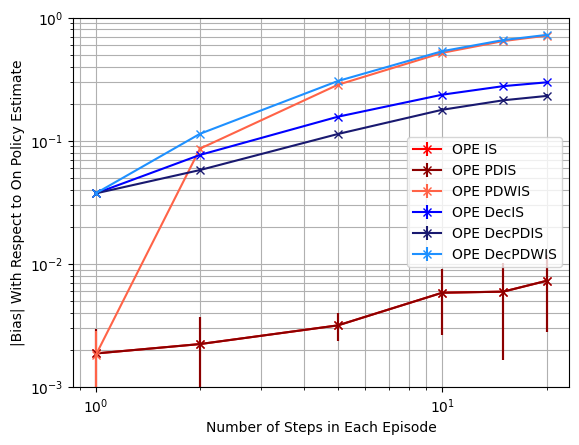

In [ ]:
label = 'bias'
plot_graphs(bias_means, bias_stds, label, 10**(-3), 10**0, shorter_D, estimator='IS')

##### Plot Variance

On Policy-----[9.09345000e-05 1.69997811e-04 2.24145113e-04 2.09947605e-04
 2.11267211e-04 1.89611880e-04]
OPE IS-----[7.29330416e-05 1.14091125e-04 2.68967788e-04 3.57626464e-04
 3.70584197e-04 4.30351045e-04]
OPE PDIS-----[7.29330416e-05 1.14091125e-04 2.68967788e-04 3.57626464e-04
 3.70584197e-04 4.30351045e-04]
OPE PDWIS-----[7.52433471e-05 2.99163598e-05 1.22576813e-05 3.96108122e-06
 1.81531754e-06 1.10094253e-06]
OPE DecIS-----[3.20752727e-05 3.71569929e-05 1.07816080e-04 1.25189813e-04
 1.64935045e-04 1.77754738e-04]
OPE DecPDIS-----[3.20752727e-05 5.06477584e-05 1.37964300e-04 1.52599324e-04
 1.78609874e-04 1.84465231e-04]
OPE DecPDWIS-----[3.32009935e-05 1.38846007e-05 6.33159011e-06 1.88298245e-06
 8.62218338e-07 4.43045258e-07]


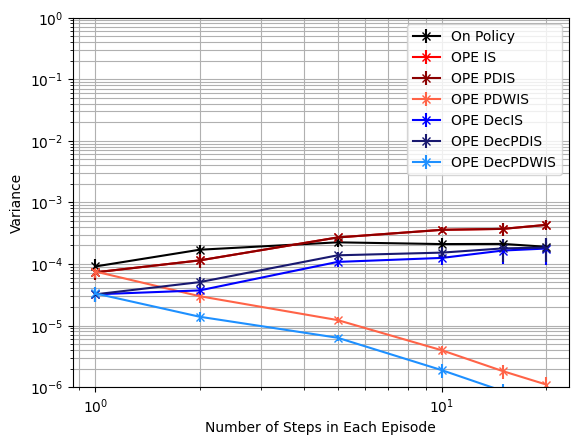

In [ ]:
label = 'var'
plot_graphs(var_means, var_stds, label, 10**(-6), 10**0, shorter_D, estimator='IS')

##### Plot MSE

On Policy-----[9.09345000e-05 1.69997811e-04 2.24145113e-04 2.09947605e-04
 2.11267211e-04 1.89611880e-04]
OPE IS-----[7.76780796e-05 1.21173109e-04 2.79680365e-04 4.01935122e-04
 4.24559745e-04 5.03497192e-04]
OPE PDIS-----[7.76780796e-05 1.21173109e-04 2.79680365e-04 4.01935122e-04
 4.24559745e-04 5.03497192e-04]
OPE PDWIS-----[7.96609235e-05 7.46902380e-03 8.09802917e-02 2.67192353e-01
 4.14599299e-01 5.08074915e-01]
OPE DecIS-----[0.00143041 0.00592052 0.02464351 0.05602745 0.07711814 0.08887545]
OPE DecPDIS-----[0.00143041 0.00339535 0.01300185 0.03198101 0.04553853 0.05353144]
OPE DecPDWIS-----[0.00143234 0.01296698 0.09313857 0.28384946 0.43040667 0.52182396]


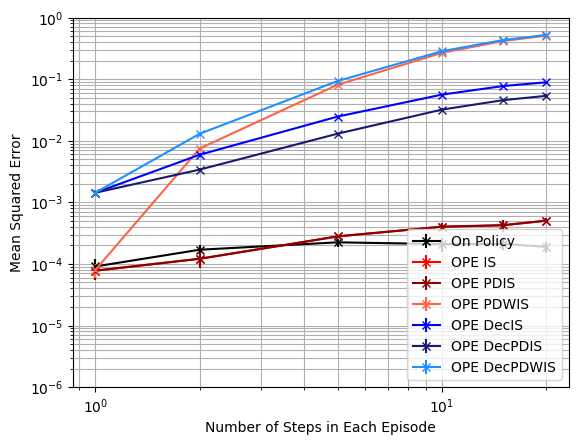

In [ ]:
label = 'MSE'
plot_graphs(MSE_means, MSE_stds, label, 10**(-6), 10**0, shorter_D, estimator='IS')

# From Patient State 377, Without Diabetes

In [ ]:
#The patient has no diabetes
PROB_DIAB = 0.0

### State Analysis

In [ ]:
#Instantiate a state based on the idx and get the state vector
testState = State(state_idx = 377, diabetic_idx=0)
vec = testState.get_state_vector()

print(vec)
print(f'Num abnormals: {testState.get_num_abnormal()}\n')

print(f'Heart Rate: {hr_state_mapping[vec[0]]}')
print(f'Systolic Blood Pressure: {sbp_state_mapping[vec[1]]}')
print(f'Percent Oxygen: {o2_state_mapping[vec[2]]}')
print(f'Glucose Level: {glu_state_mapping[vec[3]]}')
print(f'Antibiotics: {abx_state_mapping[vec[4]]}')
print(f'Vasopressors: {vaso_state_mapping[vec[5]]}')
print(f'Ventilator: {vent_state_mapping[vec[6]]}')
print(f'Diabetes: {testState.diabetic_idx}')

[1 1 1 2 0 0 1]
Num abnormals: 0

Heart Rate: Normal
Systolic Blood Pressure: Normal
Percent Oxygen: Normal
Glucose Level: Normal
Antibiotics: Off
Vasopressors: Off
Ventilator: On
Diabetes: 0


### Generate Data From Behaviour Policy

Run the data generator

In [ ]:
dgen = DataGenerator()
states, actions, lengths, rewards, diab, emp_tx_totals, emp_r_totals = dgen.simulate(
    NSIMSAMPS, NSTEPS, policy=randPol, policy_idx_type='full',
    p_diabetes=PROB_DIAB, use_tqdm=False) #True, tqdm_desc='Behaviour Policy Simulation')

obs_samps = utils.format_dgen_samps(
    states, actions, rewards, diab, NSTEPS, NSIMSAMPS)

Convert data into array format

In [ ]:
time = np.arange(NSTEPS)
times = np.stack(axis=0, arrays=[time]*NSIMSAMPS)
times = times[..., np.newaxis]

nf_tr_b = np.concatenate((times, states[:, 0:NSTEPS, :], actions, rewards, states[:, 1:, :]), axis=2)
nf_tr_b.shape

(100000, 20, 5)

In [ ]:
f_tr_b = factorise_dataset(nf_tr_b)

In [ ]:
print(nf_tr_b)

[[[  0. 377.   0.  -1. 528.]
  [  1. 528.  -1.   0.  -1.]
  [  2.  -1.  -1.   0.  -1.]
  ...
  [ 17.  -1.  -1.   0.  -1.]
  [ 18.  -1.  -1.   0.  -1.]
  [ 19.  -1.  -1.   0.  -1.]]

 [[  0. 377.   3.   0. 459.]
  [  1. 459.   5.   0. 462.]
  [  2. 462.   5.   0. 462.]
  ...
  [ 17. 373.   7.   0. 455.]
  [ 18. 455.   6.   0. 453.]
  [ 19. 453.   6.   0. 373.]]

 [[  0. 377.   3.   0. 379.]
  [  1. 379.   4.   0. 380.]
  [  2. 380.   4.   0. 380.]
  ...
  [ 17.  -1.  -1.   0.  -1.]
  [ 18.  -1.  -1.   0.  -1.]
  [ 19.  -1.  -1.   0.  -1.]]

 ...

 [[  0. 377.   6.   0. 381.]
  [  1. 381.   5.   0. 462.]
  [  2. 462.   7.   0. 463.]
  ...
  [ 17.  -1.  -1.   0.  -1.]
  [ 18.  -1.  -1.   0.  -1.]
  [ 19.  -1.  -1.   0.  -1.]]

 [[  0. 377.   2.   0. 369.]
  [  1. 369.   4.   0. 372.]
  [  2. 372.   5.   0. 374.]
  ...
  [ 17.  -1.  -1.   0.  -1.]
  [ 18.  -1.  -1.   0.  -1.]
  [ 19.  -1.  -1.   0.  -1.]]

 [[  0. 377.   6.   0. 381.]
  [  1. 381.   6.   0. 381.]
  [  2. 381.   0.   0. 616

In [ ]:
print(f_tr_b)

[[[[ 0.00000000e+00  3.77000000e+02  1.00000000e+00 -3.33333333e-01
     5.28000000e+02]
   [ 0.00000000e+00  3.77000000e+02  1.00000000e+00 -3.33333333e-01
     5.28000000e+02]
   [ 0.00000000e+00  3.77000000e+02  0.00000000e+00 -3.33333333e-01
     5.28000000e+02]]

  [[ 1.00000000e+00  5.28000000e+02  1.00000000e+00  0.00000000e+00
    -1.00000000e+00]
   [ 1.00000000e+00  5.28000000e+02  1.00000000e+00  0.00000000e+00
    -1.00000000e+00]
   [ 1.00000000e+00  5.28000000e+02  1.00000000e+00  0.00000000e+00
    -1.00000000e+00]]

  [[ 2.00000000e+00 -1.00000000e+00  1.00000000e+00  0.00000000e+00
    -1.00000000e+00]
   [ 2.00000000e+00 -1.00000000e+00  1.00000000e+00  0.00000000e+00
    -1.00000000e+00]
   [ 2.00000000e+00 -1.00000000e+00  1.00000000e+00  0.00000000e+00
    -1.00000000e+00]]

  ...

  [[ 1.70000000e+01 -1.00000000e+00  1.00000000e+00  0.00000000e+00
    -1.00000000e+00]
   [ 1.70000000e+01 -1.00000000e+00  1.00000000e+00  0.00000000e+00
    -1.00000000e+00]
   [ 1.7

In [ ]:
factored_randPol = factor_policy(randPol)

In [ ]:
randPol = pad_policy(randPol)

factored_randPol[0] = pad_policy(factored_randPol[0])
factored_randPol[1] = pad_policy(factored_randPol[1])
factored_randPol[2] = pad_policy(factored_randPol[2])

### Varying Episodes $\epsilon_{e} = 0.0$ (Policy Divergence $8.0^{20}$)

Set up evaluation policy, generate data and convert into factored format

In [ ]:
EVAL_EPSILON = 0.0

evalPolSoft = np.copy(fullPol)
evalPolSoft[evalPolSoft == 1] = 1 - EVAL_EPSILON
evalPolSoft[evalPolSoft == 0] = EVAL_EPSILON / (n_actions - 1)

In [ ]:
# Calculate policy divergence from Voloshin et al.
D = 0
for state in range(randPol.shape[0] - 1):
    for action in range(randPol.shape[1] - 1):
        difference = evalPolSoft[state, action]/randPol[state, action]
        D = max(D, difference)
print(D)
shorter_D = round(D,2)

8.0


In [ ]:
dgen = DataGenerator()
states, actions, lengths, rewards, diab, emp_tx_totals, emp_r_totals = dgen.simulate(
    NSIMSAMPS, NSTEPS, policy=evalPolSoft, policy_idx_type='full',
    p_diabetes=PROB_DIAB, use_tqdm=False) #True, tqdm_desc='Behaviour Policy Simulation')

obs_samps = utils.format_dgen_samps(
    states, actions, rewards, diab, NSTEPS, NSIMSAMPS)

In [ ]:
time = np.arange(NSTEPS)
times = np.stack(axis=0, arrays=[time]*NSIMSAMPS)
times = times[..., np.newaxis]

nf_tr_e = np.concatenate((times, states[:, 0:NSTEPS, :], actions, rewards, states[:, 1:, :]), axis=2)
nf_tr_e.shape

(100000, 20, 5)

In [ ]:
f_tr_e = factorise_dataset(nf_tr_e)

In [ ]:
factored_evalPolSoft = factor_policy(evalPolSoft)

In [ ]:
evalPolSoft = pad_policy(evalPolSoft)

factored_evalPolSoft[0] = pad_policy(factored_evalPolSoft[0])
factored_evalPolSoft[1] = pad_policy(factored_evalPolSoft[1])
factored_evalPolSoft[2] = pad_policy(factored_evalPolSoft[2])

In [ ]:
import policy_estimators as pe
import gc

def evaluate_PE(RUNS, EPISODES, SHORTER_D, STEPS=NSTEPS):

  biases = np.zeros((5, 5))
  variances = np.zeros((5, 5))
  MSEs = np.zeros((5, 5))
  ESSs = np.zeros((5, 5))

  # Reshape data for processing
  T, ldim = nf_tr_b.shape[-2], nf_tr_b.shape[-1]
  nfb = nf_tr_b.reshape((-1, RUNS, EPISODES, T, ldim))
  nfe = nf_tr_e.reshape((-1, RUNS, EPISODES, T, ldim))

  T, D, ldim = f_tr_b.shape[-3], f_tr_b.shape[-2], f_tr_b.shape[-1]
  fb = f_tr_b.reshape((-1, RUNS, EPISODES, T, D, ldim))
  fe = f_tr_e.reshape((-1, RUNS, EPISODES, T, D, ldim))

  for t in range(5):
    print()

    lower_index = 0
    estimates_on_policy = np.zeros(RUNS)
    estimates_OPE_IS = np.zeros(RUNS)
    estimates_OPE_PDIS = np.zeros(RUNS)

    estimates_OPE_DecIS = np.zeros(RUNS)
    estimates_OPE_DecPDIS = np.zeros(RUNS)

    for r in range(RUNS):
        #On policy Q estimate
        estimates_on_policy[r] = pe.on_policy_Q_estimate(nfe[t, r, :, :STEPS, :], DISCOUNT_Pol)
        #Off policy IS estimate
        estimates_OPE_IS[r] = pe.off_policy_IS_estimator(nfb[t, r, :, :STEPS, :], DISCOUNT_Pol, randPol, evalPolSoft)
        #Off policy PDIS estimate
        estimates_OPE_PDIS[r] = pe.off_policy_PDIS_estimator(nfb[t, r, :, :STEPS, :], DISCOUNT_Pol, randPol, evalPolSoft)

        #Factorisation 1----------------------------------

        #Off policy decomposed IS estimate
        estimates_OPE_DecIS[r], _ = pe.off_policy_DecIS_estimator(fb[t, r, :, :STEPS, :, :], DISCOUNT_Pol, [0,1], factored_randPol, factored_evalPolSoft)
        #Off policy decomposed PDIS estimate
        estimates_OPE_DecPDIS[r], _ = pe.off_policy_DecPDIS_estimator(fb[t, r, :, :STEPS, :, :], DISCOUNT_Pol, [0,1], factored_randPol, factored_evalPolSoft)


    mean_on_policy = np.mean(estimates_on_policy)
    var_on_policy = np.var(estimates_on_policy, ddof=0)
    print(f'Mean on policy Q estimate: {mean_on_policy}. Variance of on policy Q estimate: {var_on_policy}')

    from sklearn.metrics import mean_squared_error

    #For on policy
    biases[t, 0] = 0.0
    variances[t, 0] = var_on_policy
    MSEs[t, 0] = var_on_policy
    ESSs[t, 0] = EPISODES

    def generate_results(estimates, mean_true, label):
      MSE = mean_squared_error(estimates, [mean_true]*RUNS)
      mean = np.mean(estimates)
      var = np.var(estimates, ddof=0)
      bias1 = np.sqrt(MSE - var)
      bias2 = abs(mean - mean_true)
      print(f'Mean {label} estimate: {mean}. Bias1: {bias1}. Bias2: {bias2}. Variance: {var}. MSE: {MSE}')
      return bias1, var, MSE

    label_list = ['OPE IS', 'OPE PDIS',
                  'OPE DecIS', 'OPE DecPDIS'
                  ]

    estimates = [estimates_OPE_IS, estimates_OPE_PDIS,
                estimates_OPE_DecIS, estimates_OPE_DecPDIS
                ]


    for (id, val) in enumerate(label_list):
      biases[t, 1+id], variances[t, 1+id], MSEs[t, 1+id] = generate_results(estimates[id], mean_on_policy, label_list[id])
      ESSs[t, 1+id] = (EPISODES*variances[t, 0])/variances[t, 1+id]
      gc.collect()

  return np.mean(biases, axis=0), np.std(biases, axis=0), np.mean(variances, axis=0), np.std(variances, axis=0), np.mean(MSEs, axis=0), np.std(MSEs, axis=0), np.mean(ESSs, axis=0), np.std(ESSs, axis=0)

#### Run Everything

In [ ]:
EPISODES = [10, 50, 100, 500, 1000]

bias_means = np.zeros((len(EPISODES), 5))
bias_stds = np.zeros((len(EPISODES), 5))
var_means = np.zeros((len(EPISODES), 5))
var_stds = np.zeros((len(EPISODES), 5))
MSE_means = np.zeros((len(EPISODES), 5))
MSE_stds = np.zeros((len(EPISODES), 5))
ESS_means = np.zeros((len(EPISODES), 5))
ESS_stds = np.zeros((len(EPISODES), 5))

RUNS = 20

for id in range(len(EPISODES)):
  e = EPISODES[id]
  print(f'{e} Episodes, {RUNS} ----------------------------------')
  bias_means[id, :], bias_stds[id, :], var_means[id, :], var_stds[id, :], MSE_means[id, :], MSE_stds[id, :], ESS_means[id, :], ESS_stds[id, :] = evaluate_PE(RUNS=RUNS, EPISODES=e, SHORTER_D=shorter_D)
  print()
  gc.collect()

print('BIAS MEANS')
print(list(bias_means))
print('\nBIAS STDS')
print(list(bias_stds))
print('\nVAR MEANS')
print(list(var_means))
print('\nVAR STDS')
print(list(var_stds))
print('\nMSE MEANS')
print(list(MSE_means))
print('\nMSE STDS')
print(list(MSE_stds))
print('\nESS MEANS')
print(list(ESS_means))
print('\nESS STDS')
print(list(ESS_stds))

10 Episodes, 20 ----------------------------------

Mean on policy Q estimate: 0.6010863213829533. Variance of on policy Q estimate: 0.030064630267301155
Mean OPE IS estimate: 0.32. Bias1: 0.2810863213829531. Bias2: 0.28108632138295325. Variance: 0.4096. MSE: 0.4886095200686008
Mean OPE PDIS estimate: 0.32. Bias1: 0.2810863213829531. Bias2: 0.28108632138295325. Variance: 0.4096. MSE: 0.4886095200686008
Mean OPE DecIS estimate: 0.21866933333333333. Bias1: 0.38241698804961993. Bias2: 0.38241698804961993. Variance: 0.05146615480177776. MSE: 0.19770890755072093
Mean OPE DecPDIS estimate: 0.02798405333333333. Bias1: 0.57310226804962. Bias2: 0.57310226804962. Variance: 0.048930994786443374. MSE: 0.37737720443006173

Mean on policy Q estimate: 0.6397776488660879. Variance of on policy Q estimate: 0.04303979670698654
Mean OPE IS estimate: 0.36. Bias1: 0.27977764886608775. Bias2: 0.2797776488660879. Variance: 0.22240000000000007. MSE: 0.30067553280503595
Mean OPE PDIS estimate: 0.36. Bias1: 0.2

#### Plot Graphs

In [ ]:
import pickle
import matplotlib.pyplot as plt

def plot_graphs(means, stds, label, low_ylim, up_ylim, D, estimator='IS'):
  EPISODES = [10, 50, 100, 500, 1000]

  ylabels = {
      'bias': '|Bias| With Respect to On Policy Estimate',
      'var': 'Variance',
      'MSE': 'Mean Squared Error',
      'ESS': 'Effective Sample Size'
  }

  colours = {
      'On Policy': 'k',
      'OPE IS': 'r',
      'OPE DecIS': 'b',
      'OPE PDIS': 'darkred',
      'OPE DecPDIS': 'midnightblue',
      'OPE PDWIS': 'tomato',
      'OPE DecPDWIS': 'dodgerblue',
  }

  legend_list = ['OPE IS', 'OPE PDIS',
                  'OPE DecIS', 'OPE DecPDIS'
                  ]
  index_list = [1, 2, 3, 4]

  plt.figure()
  if label != 'bias':
    legend_list.insert(0,'On Policy')
    index_list.insert(0, 0)
  for (id, legend) in zip(index_list, legend_list):
    print(f'{legend}-----{means[:, id]}')
    plt.errorbar(EPISODES, means[:, id], yerr=stds[:, id], color=colours[legend], marker='x')
  plt.yscale("log")
  plt.xscale("log")
  plt.grid(visible=True, which='both', axis='both')
  plt.legend(legend_list)
  plt.xlabel('Number of Episodes')
  plt.ylabel(ylabels[label])
  plt.ylim([low_ylim, up_ylim])
  plt.savefig(f'{label}-sepsis-simulator-{D}.pdf', dpi=300)
  plt.show()


For vs Steps

In [ ]:
import pickle
import matplotlib.pyplot as plt

def plot_graphs(means, stds, label, low_ylim, up_ylim, D, estimator='IS'):
  LENGTHS = [1, 2, 5, 10, 15, 20]

  ylabels = {
      'bias': '|Bias| With Respect to On Policy Estimate',
      'var': 'Variance',
      'MSE': 'Mean Squared Error',
      'ESS': 'Effective Sample Size'
  }

  colours = {
      'On Policy': 'k',
      'OPE IS': 'r',
      'OPE DecIS': 'b',
      'OPE PDIS': 'darkred',
      'OPE DecPDIS': 'midnightblue',
      'OPE PDWIS': 'tomato',
      'OPE DecPDWIS': 'dodgerblue',
  }

  legend_list = ['OPE IS', 'OPE PDIS',
                  'OPE DecIS', 'OPE DecPDIS'
                  ]
  index_list = [1, 2, 3, 4]

  plt.figure()
  if label != 'bias':
    legend_list.insert(0,'On Policy')
    index_list.insert(0, 0)
  for (id, legend) in zip(index_list, legend_list):
    print(f'{legend}-----{means[:, id]}')
    plt.errorbar(LENGTHS, means[:, id], yerr=stds[:, id], color=colours[legend], marker='x')
  plt.yscale("log")
  plt.xscale("log")
  plt.grid(visible=True, which='both', axis='both')
  plt.legend(legend_list)
  plt.xlabel('Number of Steps in Each Episode')
  plt.ylabel(ylabels[label])
  plt.ylim([low_ylim, up_ylim])
  plt.savefig(f'{label}-sepsis-simulator-{D}.pdf', dpi=300)
  plt.show()


##### Plot Bias

OPE IS-----[0.21386177 0.19302329 0.22820754 0.19863638 0.16680685]
OPE PDIS-----[0.21386177 0.19302329 0.22820754 0.19863638 0.16680685]
OPE DecIS-----[0.39739659 0.42632622 0.40200897 0.37624017 0.40446502]
OPE DecPDIS-----[0.56787822 0.61188995 0.60262176 0.994168   0.93053487]


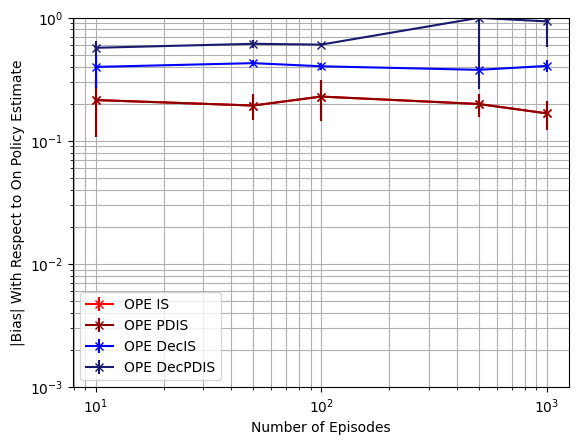

In [ ]:
label = 'bias'
plot_graphs(bias_means, bias_stds, label, 10**-3, 10**0, shorter_D, estimator='IS')

##### Plot Variance

On Policy-----[0.03081806 0.00500381 0.00236353 0.00044036 0.00023992]
OPE IS-----[0.30912    0.0614016  0.26753065 0.04286613 0.02425915]
OPE PDIS-----[0.30912    0.0614016  0.26753065 0.04286613 0.02425915]
OPE DecIS-----[0.90432676 0.09430599 0.03393667 0.05202627 0.09364735]
OPE DecPDIS-----[ 0.2464065   0.05912478  0.02393786 13.46922444  4.21875243]


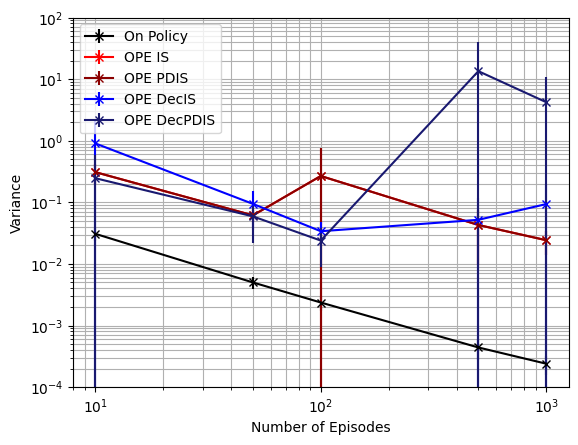

In [ ]:
label = 'var'
plot_graphs(var_means, var_stds, label, 10**(-4), 10**2, shorter_D, estimator='IS')

##### Plot MSE

On Policy-----[0.03081806 0.00500381 0.00236353 0.00044036 0.00023992]
OPE IS-----[0.36611693 0.1006351  0.32651026 0.084038   0.05404054]
OPE PDIS-----[0.36611693 0.1006351  0.32651026 0.084038   0.05404054]
OPE DecIS-----[1.07896825 0.27654865 0.19617316 0.19412289 0.25921863]
OPE DecPDIS-----[ 0.57566518  0.43526368  0.38744638 14.99444019  5.21239399]


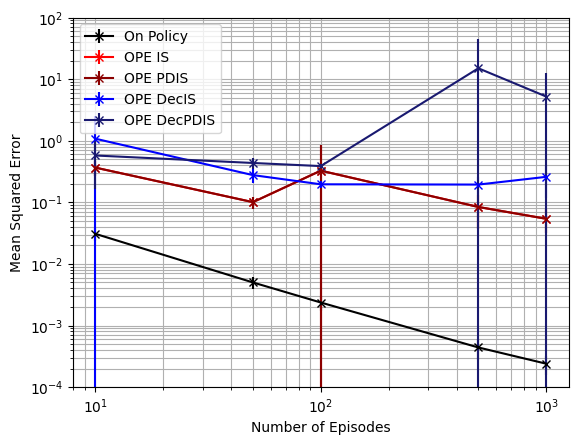

In [ ]:
label = 'MSE'
plot_graphs(MSE_means, MSE_stds, label, 10**(-4), 10**2, shorter_D, estimator='IS')

##### Plot ESS

On Policy-----[  10.   50.  100.  500. 1000.]
OPE IS-----[ 1.14104186  4.35895165  8.43246868 14.48262788 12.59351209]
OPE PDIS-----[ 1.14104186  4.35895165  8.43246868 14.48262788 12.59351209]
OPE DecIS-----[ 2.80521136  6.6914953   7.57024227 12.83466367  7.04856445]
OPE DecPDIS-----[ 5.74402805 15.01696579 12.85141988 11.59113495  8.84116023]


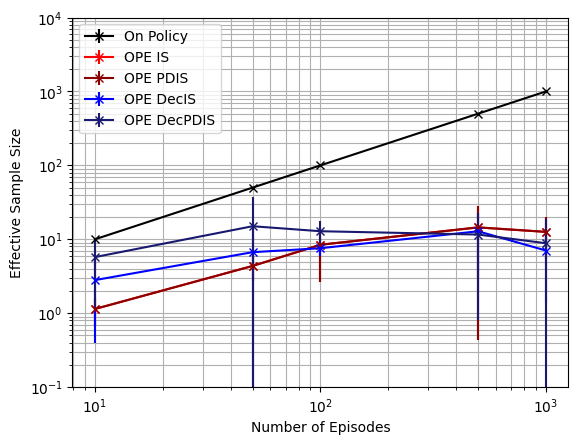

In [ ]:
label = 'ESS'
plot_graphs(ESS_means, ESS_stds, label, 10**(-1), 10**4, shorter_D, estimator='IS')

### Varying Episodes $\epsilon_{e} = 0.2$ (Policy Divergence $6.4^{20}$)

Set up evaluation policy, generate data and convert into factored format

In [ ]:
EVAL_EPSILON = 0.2

evalPolSoft = np.copy(fullPol)
evalPolSoft[evalPolSoft == 1] = 1 - EVAL_EPSILON
evalPolSoft[evalPolSoft == 0] = EVAL_EPSILON / (n_actions - 1)

In [ ]:
# Calculate policy divergence from Voloshin et al.
D = 0
for state in range(randPol.shape[0] - 1):
    for action in range(randPol.shape[1] - 1):
        difference = evalPolSoft[state, action]/randPol[state, action]
        D = max(D, difference)
print(D)
shorter_D = round(D,2)

6.4


In [ ]:
dgen = DataGenerator()
states, actions, lengths, rewards, diab, emp_tx_totals, emp_r_totals = dgen.simulate(
    NSIMSAMPS, NSTEPS, policy=evalPolSoft, policy_idx_type='full',
    p_diabetes=PROB_DIAB, use_tqdm=False) #True, tqdm_desc='Behaviour Policy Simulation')

obs_samps = utils.format_dgen_samps(
    states, actions, rewards, diab, NSTEPS, NSIMSAMPS)

In [ ]:
time = np.arange(NSTEPS)
times = np.stack(axis=0, arrays=[time]*NSIMSAMPS)
times = times[..., np.newaxis]

nf_tr_e = np.concatenate((times, states[:, 0:NSTEPS, :], actions, rewards, states[:, 1:, :]), axis=2)
nf_tr_e.shape

(100000, 20, 5)

In [ ]:
f_tr_e = factorise_dataset(nf_tr_e)

In [ ]:
factored_evalPolSoft = factor_policy(evalPolSoft)

In [ ]:
evalPolSoft = pad_policy(evalPolSoft)

factored_evalPolSoft[0] = pad_policy(factored_evalPolSoft[0])
factored_evalPolSoft[1] = pad_policy(factored_evalPolSoft[1])
factored_evalPolSoft[2] = pad_policy(factored_evalPolSoft[2])

In [ ]:
import policy_estimators as pe
import gc

def evaluate_PE(RUNS, EPISODES, SHORTER_D, STEPS=NSTEPS):

  biases = np.zeros((5, 7))
  variances = np.zeros((5, 7))
  MSEs = np.zeros((5, 7))
  ESSs = np.zeros((5, 7))

  # Reshape data for processing
  T, ldim = nf_tr_b.shape[-2], nf_tr_b.shape[-1]
  nfb = nf_tr_b.reshape((-1, RUNS, EPISODES, T, ldim))
  nfe = nf_tr_e.reshape((-1, RUNS, EPISODES, T, ldim))

  T, D, ldim = f_tr_b.shape[-3], f_tr_b.shape[-2], f_tr_b.shape[-1]
  fb = f_tr_b.reshape((-1, RUNS, EPISODES, T, D, ldim))
  fe = f_tr_e.reshape((-1, RUNS, EPISODES, T, D, ldim))

  for t in range(5):
    print()

    lower_index = 0
    estimates_on_policy = np.zeros(RUNS)
    estimates_OPE_IS = np.zeros(RUNS)
    estimates_OPE_PDIS = np.zeros(RUNS)
    estimates_OPE_PDWIS = np.zeros(RUNS)

    estimates_OPE_DecIS = np.zeros(RUNS)
    estimates_OPE_DecPDIS = np.zeros(RUNS)
    estimates_OPE_DecPDWIS = np.zeros(RUNS)

    for r in range(RUNS):
        #On policy Q estimate
        estimates_on_policy[r] = pe.on_policy_Q_estimate(nfe[t, r, :, :STEPS, :], DISCOUNT_Pol)
        #Off policy IS estimate
        estimates_OPE_IS[r] = pe.off_policy_IS_estimator(nfb[t, r, :, :STEPS, :], DISCOUNT_Pol, randPol, evalPolSoft)
        #Off policy PDIS estimate
        estimates_OPE_PDIS[r] = pe.off_policy_PDIS_estimator(nfb[t, r, :, :STEPS, :], DISCOUNT_Pol, randPol, evalPolSoft)
        #Off policy PDWIS estimate
        estimates_OPE_PDWIS[r] = pe.off_policy_PDWIS_estimator(nfb[t, r, :, :STEPS, :], DISCOUNT_Pol, randPol, evalPolSoft)

        #Factorisation 1----------------------------------

        #Off policy decomposed IS estimate
        estimates_OPE_DecIS[r], _ = pe.off_policy_DecIS_estimator(fb[t, r, :, :STEPS, :, :], DISCOUNT_Pol, [0,1], factored_randPol, factored_evalPolSoft)
        #Off policy decomposed PDIS estimate
        estimates_OPE_DecPDIS[r], _ = pe.off_policy_DecPDIS_estimator(fb[t, r, :, :STEPS, :, :], DISCOUNT_Pol, [0,1], factored_randPol, factored_evalPolSoft)
        #Off policy decomposed PDWIS estimate
        estimates_OPE_DecPDWIS[r], _ = pe.off_policy_DecPDWIS_estimator(fb[t, r, :, :STEPS, :, :], DISCOUNT_Pol, [0,1], factored_randPol, factored_evalPolSoft)


    mean_on_policy = np.mean(estimates_on_policy)
    var_on_policy = np.var(estimates_on_policy, ddof=0)
    print(f'Mean on policy Q estimate: {mean_on_policy}. Variance of on policy Q estimate: {var_on_policy}')

    from sklearn.metrics import mean_squared_error

    #For on policy
    biases[t, 0] = 0.0
    variances[t, 0] = var_on_policy
    MSEs[t, 0] = var_on_policy
    ESSs[t, 0] = EPISODES

    def generate_results(estimates, mean_true, label):
      MSE = mean_squared_error(estimates, [mean_true]*RUNS)
      mean = np.mean(estimates)
      var = np.var(estimates, ddof=0)
      bias1 = np.sqrt(MSE - var)
      bias2 = abs(mean - mean_true)
      print(f'Mean {label} estimate: {mean}. Bias1: {bias1}. Bias2: {bias2}. Variance: {var}. MSE: {MSE}')
      return bias1, var, MSE

    label_list = ['OPE IS', 'OPE PDIS', 'OPE PDWIS',
                  'OPE DecIS', 'OPE DecPDIS', 'OPE DecPDWIS'
                  ]

    estimates = [estimates_OPE_IS, estimates_OPE_PDIS, estimates_OPE_PDWIS,
                estimates_OPE_DecIS, estimates_OPE_DecPDIS, estimates_OPE_DecPDWIS
                ]


    for (id, val) in enumerate(label_list):
      biases[t, 1+id], variances[t, 1+id], MSEs[t, 1+id] = generate_results(estimates[id], mean_on_policy, label_list[id])
      ESSs[t, 1+id] = (EPISODES*variances[t, 0])/variances[t, 1+id]
      gc.collect()

  return np.mean(biases, axis=0), np.std(biases, axis=0), np.mean(variances, axis=0), np.std(variances, axis=0), np.mean(MSEs, axis=0), np.std(MSEs, axis=0), np.mean(ESSs, axis=0), np.std(ESSs, axis=0)

#### Run Everything

In [ ]:
EPISODES = [10, 50, 100, 500, 1000]

bias_means = np.zeros((len(EPISODES), 7))
bias_stds = np.zeros((len(EPISODES), 7))
var_means = np.zeros((len(EPISODES), 7))
var_stds = np.zeros((len(EPISODES), 7))
MSE_means = np.zeros((len(EPISODES), 7))
MSE_stds = np.zeros((len(EPISODES), 7))
ESS_means = np.zeros((len(EPISODES), 7))
ESS_stds = np.zeros((len(EPISODES), 7))

RUNS = 20

for id in range(len(EPISODES)):
  e = EPISODES[id]
  print(f'{e} Episodes, {RUNS} ----------------------------------')
  bias_means[id, :], bias_stds[id, :], var_means[id, :], var_stds[id, :], MSE_means[id, :], MSE_stds[id, :], ESS_means[id, :], ESS_stds[id, :] = evaluate_PE(RUNS=RUNS, EPISODES=e, SHORTER_D=shorter_D)
  print()
  gc.collect()

print('BIAS MEANS')
print(list(bias_means))
print('\nBIAS STDS')
print(list(bias_stds))
print('\nVAR MEANS')
print(list(var_means))
print('\nVAR STDS')
print(list(var_stds))
print('\nMSE MEANS')
print(list(MSE_means))
print('\nMSE STDS')
print(list(MSE_stds))
print('\nESS MEANS')
print(list(ESS_means))
print('\nESS STDS')
print(list(ESS_stds))

10 Episodes, 20 ----------------------------------

Mean on policy Q estimate: 0.5131008991763057. Variance of on policy Q estimate: 0.05388862175273042
Mean OPE IS estimate: 0.2878699204214632. Bias1: 0.22523097875484258. Bias2: 0.22523097875484255. Variance: 0.23722630983605889. MSE: 0.28795530362692323
Mean OPE PDIS estimate: 0.2878699204214632. Bias1: 0.22523097875484258. Bias2: 0.22523097875484255. Variance: 0.23722630983605889. MSE: 0.28795530362692323
Mean OPE PDWIS estimate: 0.014813571329149951. Bias1: 0.49828732784715585. Bias2: 0.4982873278471558. Variance: 0.0007385378646695823. MSE: 0.24902879895772853
Mean OPE DecIS estimate: 0.16098877210472295. Bias1: 0.3521121270715828. Bias2: 0.3521121270715828. Variance: 0.0608309883466361. MSE: 0.18481393837751056
Mean OPE DecPDIS estimate: -0.038752330897700325. Bias1: 0.5518532300740061. Bias2: 0.5518532300740061. Variance: 0.056869413643875266. MSE: 0.3614114011869892
Mean OPE DecPDWIS estimate: -0.007341432796376113. Bias1: 0.52

#### Plot Graphs

##### Plot Bias

OPE IS-----[0.1734112  0.07716183 0.08521771 0.05319519 0.06112325]
OPE PDIS-----[0.1734112  0.07716183 0.08521771 0.05319519 0.06112325]
OPE PDWIS-----[0.42673409 0.43268745 0.43625715 0.42224134 0.42111569]
OPE DecIS-----[0.24079883 0.32769495 0.30652112 0.30088252 0.29578288]
OPE DecPDIS-----[0.41385829 0.49235569 0.49980544 0.71897251 0.67614004]
OPE DecPDWIS-----[0.45044169 0.46351206 0.46823329 0.45494525 0.45494078]


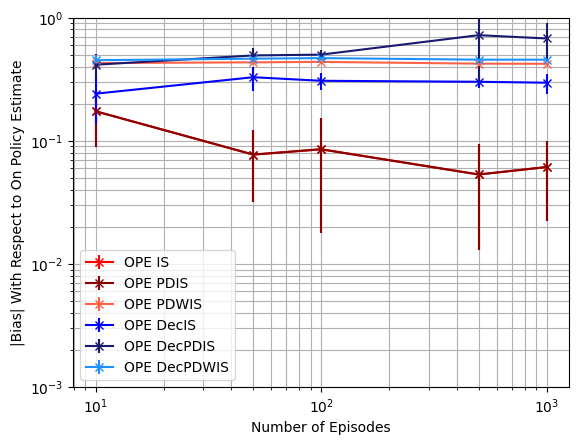

In [ ]:
label = 'bias'
plot_graphs(bias_means, bias_stds, label, 10**-3, 10**0, shorter_D, estimator='IS')

##### Plot Variance

On Policy-----[0.04680468 0.0116735  0.00609162 0.00085291 0.00041628]
OPE IS-----[0.21068752 0.16621028 0.1578584  0.03733287 0.0911643 ]
OPE PDIS-----[0.21068752 0.16621028 0.1578584  0.03733287 0.0911643 ]
OPE PDWIS-----[5.44365418e-04 2.16236479e-04 1.63817664e-04 9.92353520e-05
 8.55243864e-05]
OPE DecIS-----[0.5558971  0.11701637 0.04506732 0.06892041 0.13188343]
OPE DecPDIS-----[0.17164375 0.05890437 0.03944143 4.3666338  1.41121636]
OPE DecPDWIS-----[2.65141196e-04 9.54196642e-05 7.10477699e-05 1.50816489e-04
 1.83253493e-04]


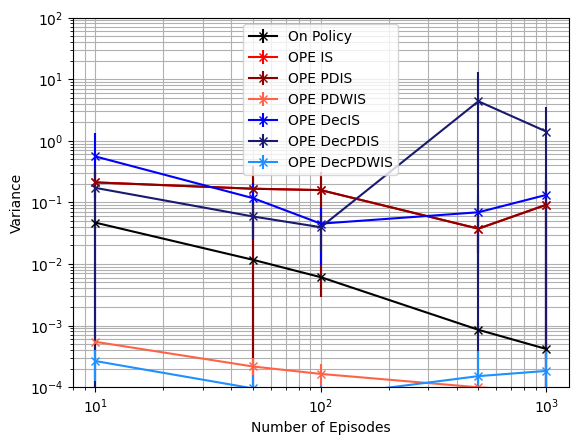

In [ ]:
label = 'var'
plot_graphs(var_means, var_stds, label, 10**(-4), 10**2, shorter_D, estimator='IS')

##### Plot MSE

On Policy-----[0.04680468 0.0116735  0.00609162 0.00085291 0.00041628]
OPE IS-----[0.24801323 0.17421259 0.16964906 0.04177365 0.09639651]
OPE PDIS-----[0.24801323 0.17421259 0.16964906 0.04177365 0.09639651]
OPE PDWIS-----[0.1848935  0.1878059  0.19053436 0.17848731 0.17748738]
OPE DecIS-----[0.62460517 0.22966191 0.14138996 0.16049694 0.22232418]
OPE DecPDIS-----[0.35111112 0.30608365 0.29094096 5.06294549 1.91655673]
OPE DecPDWIS-----[0.20504185 0.21530552 0.2193658  0.20719848 0.20719452]


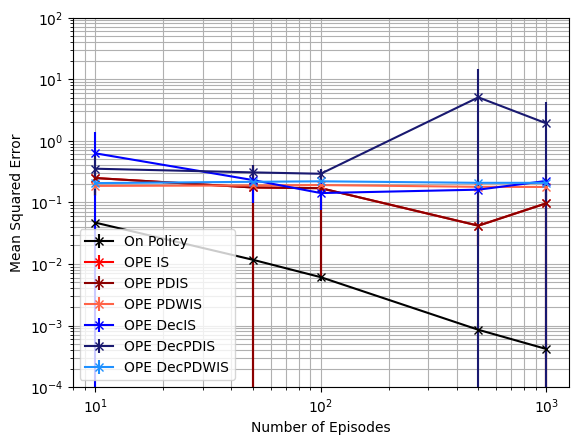

In [ ]:
label = 'MSE'
plot_graphs(MSE_means, MSE_stds, label, 10**(-4), 10**2, shorter_D, estimator='IS')

##### Plot ESS

On Policy-----[  10.   50.  100.  500. 1000.]
OPE IS-----[ 2.46945204  9.69458356 14.62904098 14.61310496 19.83830636]
OPE PDIS-----[ 2.46945204  9.69458356 14.62904098 14.61310496 19.83830636]
OPE PDWIS-----[ 880.3732024  2975.44976256 4452.35412183 4830.73137913 7916.18509787]
OPE DecIS-----[ 4.02008573  7.41149298 18.98672332 18.62697439 17.78269146]
OPE DecPDIS-----[ 7.52494853 13.85500635 21.75746521 27.86596426 26.06399788]
OPE DecPDWIS-----[ 2175.94627205  9235.66348429 10025.91416213 11509.01302799
 12716.79160983]


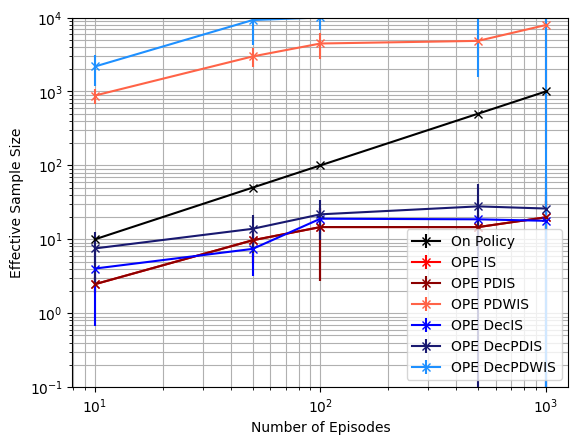

In [ ]:
label = 'ESS'
plot_graphs(ESS_means, ESS_stds, label, 10**(-1), 10**4, shorter_D, estimator='IS')

### Varying Episodes $\epsilon_{e} = 0.4$ (Policy Divergence $4.8^{20}$)

Set up evaluation policy, generate data and convert into factored format

In [ ]:
EVAL_EPSILON = 0.4

evalPolSoft = np.copy(fullPol)
evalPolSoft[evalPolSoft == 1] = 1 - EVAL_EPSILON
evalPolSoft[evalPolSoft == 0] = EVAL_EPSILON / (n_actions - 1)

In [ ]:
# Calculate policy divergence from Voloshin et al.
D = 0
for state in range(randPol.shape[0] - 1):
    for action in range(randPol.shape[1] - 1):
        difference = evalPolSoft[state, action]/randPol[state, action]
        D = max(D, difference)
print(D)
shorter_D = round(D,2)

4.8


In [ ]:
dgen = DataGenerator()
states, actions, lengths, rewards, diab, emp_tx_totals, emp_r_totals = dgen.simulate(
    NSIMSAMPS, NSTEPS, policy=evalPolSoft, policy_idx_type='full',
    p_diabetes=PROB_DIAB, use_tqdm=False) #True, tqdm_desc='Behaviour Policy Simulation')

obs_samps = utils.format_dgen_samps(
    states, actions, rewards, diab, NSTEPS, NSIMSAMPS)

In [ ]:
time = np.arange(NSTEPS)
times = np.stack(axis=0, arrays=[time]*NSIMSAMPS)
times = times[..., np.newaxis]

nf_tr_e = np.concatenate((times, states[:, 0:NSTEPS, :], actions, rewards, states[:, 1:, :]), axis=2)
nf_tr_e.shape

(100000, 20, 5)

In [ ]:
f_tr_e = factorise_dataset(nf_tr_e)

In [ ]:
factored_evalPolSoft = factor_policy(evalPolSoft)

In [ ]:
evalPolSoft = pad_policy(evalPolSoft)

factored_evalPolSoft[0] = pad_policy(factored_evalPolSoft[0])
factored_evalPolSoft[1] = pad_policy(factored_evalPolSoft[1])
factored_evalPolSoft[2] = pad_policy(factored_evalPolSoft[2])

In [ ]:
import policy_estimators as pe
import gc

def evaluate_PE(RUNS, EPISODES, SHORTER_D, STEPS=NSTEPS):

  biases = np.zeros((5, 7))
  variances = np.zeros((5, 7))
  MSEs = np.zeros((5, 7))
  ESSs = np.zeros((5, 7))

  # Reshape data for processing
  T, ldim = nf_tr_b.shape[-2], nf_tr_b.shape[-1]
  nfb = nf_tr_b.reshape((-1, RUNS, EPISODES, T, ldim))
  nfe = nf_tr_e.reshape((-1, RUNS, EPISODES, T, ldim))

  T, D, ldim = f_tr_b.shape[-3], f_tr_b.shape[-2], f_tr_b.shape[-1]
  fb = f_tr_b.reshape((-1, RUNS, EPISODES, T, D, ldim))
  fe = f_tr_e.reshape((-1, RUNS, EPISODES, T, D, ldim))

  for t in range(5):
    print()

    lower_index = 0
    estimates_on_policy = np.zeros(RUNS)
    estimates_OPE_IS = np.zeros(RUNS)
    estimates_OPE_PDIS = np.zeros(RUNS)
    estimates_OPE_PDWIS = np.zeros(RUNS)

    estimates_OPE_DecIS = np.zeros(RUNS)
    estimates_OPE_DecPDIS = np.zeros(RUNS)
    estimates_OPE_DecPDWIS = np.zeros(RUNS)

    for r in range(RUNS):
        #On policy Q estimate
        estimates_on_policy[r] = pe.on_policy_Q_estimate(nfe[t, r, :, :STEPS, :], DISCOUNT_Pol)
        #Off policy IS estimate
        estimates_OPE_IS[r] = pe.off_policy_IS_estimator(nfb[t, r, :, :STEPS, :], DISCOUNT_Pol, randPol, evalPolSoft)
        #Off policy PDIS estimate
        estimates_OPE_PDIS[r] = pe.off_policy_PDIS_estimator(nfb[t, r, :, :STEPS, :], DISCOUNT_Pol, randPol, evalPolSoft)
        #Off policy PDWIS estimate
        estimates_OPE_PDWIS[r] = pe.off_policy_PDWIS_estimator(nfb[t, r, :, :STEPS, :], DISCOUNT_Pol, randPol, evalPolSoft)

        #Factorisation 1----------------------------------

        #Off policy decomposed IS estimate
        estimates_OPE_DecIS[r], _ = pe.off_policy_DecIS_estimator(fb[t, r, :, :STEPS, :, :], DISCOUNT_Pol, [0,1], factored_randPol, factored_evalPolSoft)
        #Off policy decomposed PDIS estimate
        estimates_OPE_DecPDIS[r], _ = pe.off_policy_DecPDIS_estimator(fb[t, r, :, :STEPS, :, :], DISCOUNT_Pol, [0,1], factored_randPol, factored_evalPolSoft)
        #Off policy decomposed PDWIS estimate
        estimates_OPE_DecPDWIS[r], _ = pe.off_policy_DecPDWIS_estimator(fb[t, r, :, :STEPS, :, :], DISCOUNT_Pol, [0,1], factored_randPol, factored_evalPolSoft)


    mean_on_policy = np.mean(estimates_on_policy)
    var_on_policy = np.var(estimates_on_policy, ddof=0)
    print(f'Mean on policy Q estimate: {mean_on_policy}. Variance of on policy Q estimate: {var_on_policy}')

    from sklearn.metrics import mean_squared_error

    #For on policy
    biases[t, 0] = 0.0
    variances[t, 0] = var_on_policy
    MSEs[t, 0] = var_on_policy
    ESSs[t, 0] = EPISODES

    def generate_results(estimates, mean_true, label):
      MSE = mean_squared_error(estimates, [mean_true]*RUNS)
      mean = np.mean(estimates)
      var = np.var(estimates, ddof=0)
      bias1 = np.sqrt(MSE - var)
      bias2 = abs(mean - mean_true)
      print(f'Mean {label} estimate: {mean}. Bias1: {bias1}. Bias2: {bias2}. Variance: {var}. MSE: {MSE}')
      return bias1, var, MSE

    label_list = ['OPE IS', 'OPE PDIS', 'OPE PDWIS',
                  'OPE DecIS', 'OPE DecPDIS', 'OPE DecPDWIS'
                  ]

    estimates = [estimates_OPE_IS, estimates_OPE_PDIS, estimates_OPE_PDWIS,
                estimates_OPE_DecIS, estimates_OPE_DecPDIS, estimates_OPE_DecPDWIS
                ]


    for (id, val) in enumerate(label_list):
      biases[t, 1+id], variances[t, 1+id], MSEs[t, 1+id] = generate_results(estimates[id], mean_on_policy, label_list[id])
      ESSs[t, 1+id] = (EPISODES*variances[t, 0])/variances[t, 1+id]
      gc.collect()

  return np.mean(biases, axis=0), np.std(biases, axis=0), np.mean(variances, axis=0), np.std(variances, axis=0), np.mean(MSEs, axis=0), np.std(MSEs, axis=0), np.mean(ESSs, axis=0), np.std(ESSs, axis=0)

#### Run Everything

In [ ]:
EPISODES = [10, 50, 100, 500, 1000]

bias_means = np.zeros((len(EPISODES), 7))
bias_stds = np.zeros((len(EPISODES), 7))
var_means = np.zeros((len(EPISODES), 7))
var_stds = np.zeros((len(EPISODES), 7))
MSE_means = np.zeros((len(EPISODES), 7))
MSE_stds = np.zeros((len(EPISODES), 7))
ESS_means = np.zeros((len(EPISODES), 7))
ESS_stds = np.zeros((len(EPISODES), 7))

RUNS = 20

for id in range(len(EPISODES)):
  e = EPISODES[id]
  print(f'{e} Episodes, {RUNS} ----------------------------------')
  bias_means[id, :], bias_stds[id, :], var_means[id, :], var_stds[id, :], MSE_means[id, :], MSE_stds[id, :], ESS_means[id, :], ESS_stds[id, :] = evaluate_PE(RUNS=RUNS, EPISODES=e, SHORTER_D=shorter_D)
  print()
  gc.collect()

print('BIAS MEANS')
print(list(bias_means))
print('\nBIAS STDS')
print(list(bias_stds))
print('\nVAR MEANS')
print(list(var_means))
print('\nVAR STDS')
print(list(var_stds))
print('\nMSE MEANS')
print(list(MSE_means))
print('\nMSE STDS')
print(list(MSE_stds))
print('\nESS MEANS')
print(list(ESS_means))
print('\nESS STDS')
print(list(ESS_stds))

10 Episodes, 20 ----------------------------------

Mean on policy Q estimate: 0.22327182621448854. Variance of on policy Q estimate: 0.03194881742794945
Mean OPE IS estimate: 0.21247077839833092. Bias1: 0.010801047816159138. Bias2: 0.010801047816157622. Variance: 0.1890738420184091. MSE: 0.18919050465233606
Mean OPE PDIS estimate: 0.21247077839833092. Bias1: 0.010801047816159138. Bias2: 0.010801047816157622. Variance: 0.1890738420184091. MSE: 0.18919050465233606
Mean OPE PDWIS estimate: 0.008410412939985117. Bias1: 0.21486141327450345. Bias2: 0.21486141327450342. Variance: 0.0007665571066829714. MSE: 0.04693198402099994
Mean OPE DecIS estimate: 0.08419635606245644. Bias1: 0.1390754701520321. Bias2: 0.1390754701520321. Variance: 0.07183070451615009. MSE: 0.09117269091415886
Mean OPE DecPDIS estimate: -0.11229424212218678. Bias1: 0.33556606833667535. Bias2: 0.33556606833667535. Variance: 0.07186278301517506. MSE: 0.18446736923410934
Mean OPE DecPDWIS estimate: -0.00791438062948826. Bias

#### Plot Graphs

##### Plot Bias

OPE IS-----[0.14191354 0.0313276  0.0608412  0.06952462 0.02561291]
OPE PDIS-----[0.14191354 0.0313276  0.0608412  0.06952462 0.02561291]
OPE PDWIS-----[0.28567526 0.26049878 0.25638904 0.24765154 0.2511945 ]
OPE DecIS-----[0.15217599 0.20942378 0.18897693 0.20877727 0.19667885]
OPE DecPDIS-----[0.32173921 0.35713691 0.36232005 0.46476291 0.45153397]
OPE DecPDWIS-----[0.30511521 0.28260277 0.27810038 0.27104338 0.27441131]


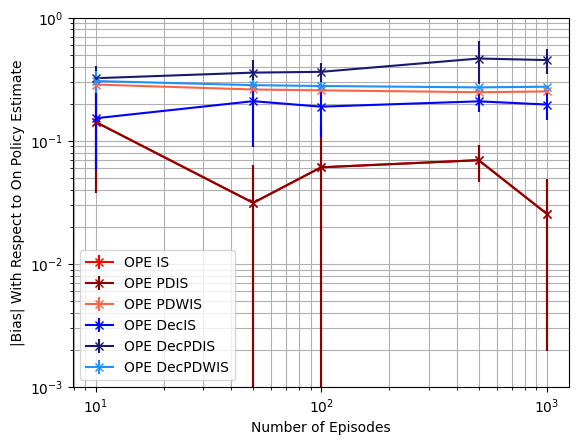

In [ ]:
label = 'bias'
plot_graphs(bias_means, bias_stds, label, 10**-3, 10**0, shorter_D, estimator='IS')

##### Plot Variance

On Policy-----[0.04140862 0.01456981 0.00656457 0.00135792 0.00061398]
OPE IS-----[0.23350288 0.52431692 1.37290787 0.0942269  0.1100252 ]
OPE PDIS-----[0.23350288 0.52431692 1.37290787 0.0942269  0.1100252 ]
OPE PDWIS-----[0.00056897 0.00025722 0.00022552 0.00011819 0.00014595]
OPE DecIS-----[0.27557566 0.13891714 0.06491493 0.06656149 0.09922282]
OPE DecPDIS-----[0.11816258 0.06501434 0.05360071 0.73862384 0.26568893]
OPE DecPDWIS-----[1.93867774e-04 7.10077059e-05 6.29627365e-05 8.98192964e-05
 8.67232620e-05]


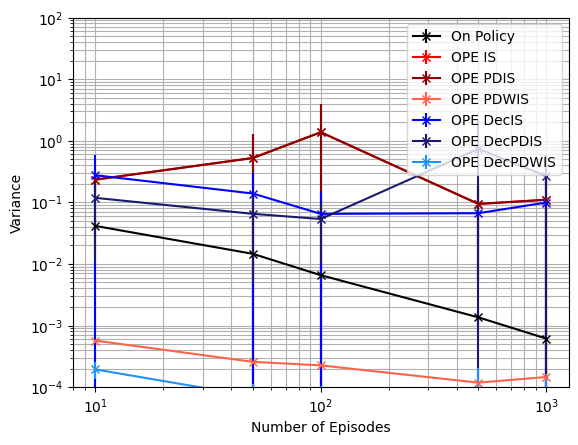

In [ ]:
label = 'var'
plot_graphs(var_means, var_stds, label, 10**(-4), 10**2, shorter_D, estimator='IS')

##### Plot MSE

On Policy-----[0.04140862 0.01456981 0.00656457 0.00135792 0.00061398]
OPE IS-----[0.26446417 0.52636583 1.38146683 0.09959491 0.11124092]
OPE PDIS-----[0.26446417 0.52636583 1.38146683 0.09959491 0.11124092]
OPE PDWIS-----[0.08603697 0.0690059  0.06630481 0.06152826 0.06329283]
OPE DecIS-----[0.30762225 0.19746837 0.10743483 0.11168012 0.14022146]
OPE DecPDIS-----[0.22808684 0.20202938 0.18951527 0.98515714 0.47965546]
OPE DecPDWIS-----[0.09725008 0.08084706 0.07776082 0.07358537 0.07540095]


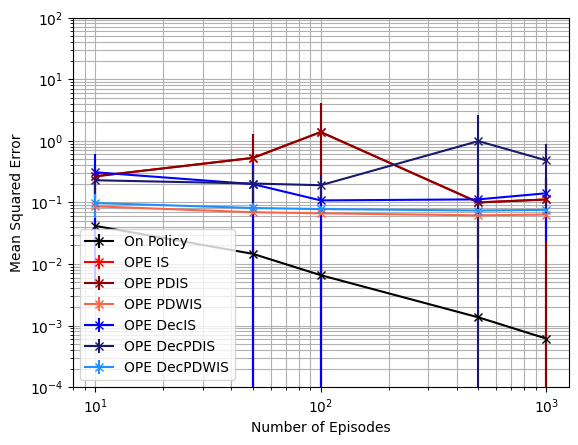

In [ ]:
label = 'MSE'
plot_graphs(MSE_means, MSE_stds, label, 10**(-4), 10**2, shorter_D, estimator='IS')

##### Plot ESS

On Policy-----[  10.   50.  100.  500. 1000.]
OPE IS-----[ 2.15406252  8.29455688 13.77573407 17.74525477 17.2484811 ]
OPE PDIS-----[ 2.15406252  8.29455688 13.77573407 17.74525477 17.2484811 ]
OPE PDWIS-----[ 784.36833891 3100.36849735 4616.3271256  7096.28706535 7623.68513215]
OPE DecIS-----[ 3.80464713 11.51515711 22.05585852 27.11501393 21.45832133]
OPE DecPDIS-----[ 6.23572833 16.83785712 22.76782049 30.91454794 31.6275961 ]
OPE DecPDWIS-----[ 2441.3499653  12242.83798176 14483.16265099 18543.27603034
 21104.28010069]


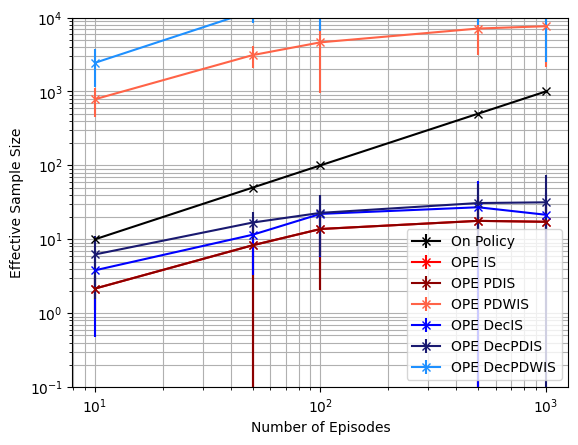

In [ ]:
label = 'ESS'
plot_graphs(ESS_means, ESS_stds, label, 10**(-1), 10**4, shorter_D, estimator='IS')

### Varying Episodes $\epsilon_{e} = 0.6$ (Policy Divergence $3.2^{20}$)

Set up evaluation policy, generate data and convert into factored format

In [ ]:
import gc

gc.collect()
EVAL_EPSILON = 0.6

evalPolSoft = np.copy(fullPol)
evalPolSoft[evalPolSoft == 1] = 1 - EVAL_EPSILON
evalPolSoft[evalPolSoft == 0] = EVAL_EPSILON / (n_actions - 1)

In [ ]:
# Calculate policy divergence from Voloshin et al.
D = 0
for state in range(randPol.shape[0] - 1):
    for action in range(randPol.shape[1] - 1):
        difference = evalPolSoft[state, action]/randPol[state, action]
        D = max(D, difference)
print(D)
shorter_D = round(D,2)

3.2


In [ ]:
dgen = DataGenerator()
states, actions, lengths, rewards, diab, emp_tx_totals, emp_r_totals = dgen.simulate(
    NSIMSAMPS, NSTEPS, policy=evalPolSoft, policy_idx_type='full',
    p_diabetes=PROB_DIAB, use_tqdm=False) #True, tqdm_desc='Behaviour Policy Simulation')

obs_samps = utils.format_dgen_samps(
    states, actions, rewards, diab, NSTEPS, NSIMSAMPS)

In [ ]:
time = np.arange(NSTEPS)
times = np.stack(axis=0, arrays=[time]*NSIMSAMPS)
times = times[..., np.newaxis]

nf_tr_e = np.concatenate((times, states[:, 0:NSTEPS, :], actions, rewards, states[:, 1:, :]), axis=2)
nf_tr_e.shape

(100000, 20, 5)

In [ ]:
f_tr_e = factorise_dataset(nf_tr_e)

In [ ]:
factored_evalPolSoft = factor_policy(evalPolSoft)

In [ ]:
evalPolSoft = pad_policy(evalPolSoft)

factored_evalPolSoft[0] = pad_policy(factored_evalPolSoft[0])
factored_evalPolSoft[1] = pad_policy(factored_evalPolSoft[1])
factored_evalPolSoft[2] = pad_policy(factored_evalPolSoft[2])

In [ ]:
import policy_estimators as pe
import gc

def evaluate_PE(RUNS, EPISODES, SHORTER_D, STEPS=NSTEPS):

  biases = np.zeros((5, 7))
  variances = np.zeros((5, 7))
  MSEs = np.zeros((5, 7))
  ESSs = np.zeros((5, 7))

  # Reshape data for processing
  T, ldim = nf_tr_b.shape[-2], nf_tr_b.shape[-1]
  nfb = nf_tr_b.reshape((-1, RUNS, EPISODES, T, ldim))
  nfe = nf_tr_e.reshape((-1, RUNS, EPISODES, T, ldim))

  T, D, ldim = f_tr_b.shape[-3], f_tr_b.shape[-2], f_tr_b.shape[-1]
  fb = f_tr_b.reshape((-1, RUNS, EPISODES, T, D, ldim))
  fe = f_tr_e.reshape((-1, RUNS, EPISODES, T, D, ldim))

  for t in range(5):
    print()

    lower_index = 0
    estimates_on_policy = np.zeros(RUNS)
    estimates_OPE_IS = np.zeros(RUNS)
    estimates_OPE_PDIS = np.zeros(RUNS)
    estimates_OPE_PDWIS = np.zeros(RUNS)

    estimates_OPE_DecIS = np.zeros(RUNS)
    estimates_OPE_DecPDIS = np.zeros(RUNS)
    estimates_OPE_DecPDWIS = np.zeros(RUNS)

    for r in range(RUNS):
        #On policy Q estimate
        estimates_on_policy[r] = pe.on_policy_Q_estimate(nfe[t, r, :, :STEPS, :], DISCOUNT_Pol)
        #Off policy IS estimate
        estimates_OPE_IS[r] = pe.off_policy_IS_estimator(nfb[t, r, :, :STEPS, :], DISCOUNT_Pol, randPol, evalPolSoft)
        #Off policy PDIS estimate
        estimates_OPE_PDIS[r] = pe.off_policy_PDIS_estimator(nfb[t, r, :, :STEPS, :], DISCOUNT_Pol, randPol, evalPolSoft)
        #Off policy PDWIS estimate
        estimates_OPE_PDWIS[r] = pe.off_policy_PDWIS_estimator(nfb[t, r, :, :STEPS, :], DISCOUNT_Pol, randPol, evalPolSoft)

        #Factorisation 1----------------------------------

        #Off policy decomposed IS estimate
        estimates_OPE_DecIS[r], _ = pe.off_policy_DecIS_estimator(fb[t, r, :, :STEPS, :, :], DISCOUNT_Pol, [0,1], factored_randPol, factored_evalPolSoft)
        #Off policy decomposed PDIS estimate
        estimates_OPE_DecPDIS[r], _ = pe.off_policy_DecPDIS_estimator(fb[t, r, :, :STEPS, :, :], DISCOUNT_Pol, [0,1], factored_randPol, factored_evalPolSoft)
        #Off policy decomposed PDWIS estimate
        estimates_OPE_DecPDWIS[r], _ = pe.off_policy_DecPDWIS_estimator(fb[t, r, :, :STEPS, :, :], DISCOUNT_Pol, [0,1], factored_randPol, factored_evalPolSoft)


    mean_on_policy = np.mean(estimates_on_policy)
    var_on_policy = np.var(estimates_on_policy, ddof=0)
    print(f'Mean on policy Q estimate: {mean_on_policy}. Variance of on policy Q estimate: {var_on_policy}')

    from sklearn.metrics import mean_squared_error

    #For on policy
    biases[t, 0] = 0.0
    variances[t, 0] = var_on_policy
    MSEs[t, 0] = var_on_policy
    ESSs[t, 0] = EPISODES

    def generate_results(estimates, mean_true, label):
      MSE = mean_squared_error(estimates, [mean_true]*RUNS)
      mean = np.mean(estimates)
      var = np.var(estimates, ddof=0)
      bias1 = np.sqrt(MSE - var)
      bias2 = abs(mean - mean_true)
      print(f'Mean {label} estimate: {mean}. Bias1: {bias1}. Bias2: {bias2}. Variance: {var}. MSE: {MSE}')
      return bias1, var, MSE

    label_list = ['OPE IS', 'OPE PDIS', 'OPE PDWIS',
                  'OPE DecIS', 'OPE DecPDIS', 'OPE DecPDWIS'
                  ]

    estimates = [estimates_OPE_IS, estimates_OPE_PDIS, estimates_OPE_PDWIS,
                estimates_OPE_DecIS, estimates_OPE_DecPDIS, estimates_OPE_DecPDWIS
                ]


    for (id, val) in enumerate(label_list):
      biases[t, 1+id], variances[t, 1+id], MSEs[t, 1+id] = generate_results(estimates[id], mean_on_policy, label_list[id])
      ESSs[t, 1+id] = (EPISODES*variances[t, 0])/variances[t, 1+id]
      gc.collect()

  return np.mean(biases, axis=0), np.std(biases, axis=0), np.mean(variances, axis=0), np.std(variances, axis=0), np.mean(MSEs, axis=0), np.std(MSEs, axis=0), np.mean(ESSs, axis=0), np.std(ESSs, axis=0)

#### Run Everything

In [ ]:
EPISODES = [10, 50, 100, 500, 1000]

bias_means = np.zeros((len(EPISODES), 7))
bias_stds = np.zeros((len(EPISODES), 7))
var_means = np.zeros((len(EPISODES), 7))
var_stds = np.zeros((len(EPISODES), 7))
MSE_means = np.zeros((len(EPISODES), 7))
MSE_stds = np.zeros((len(EPISODES), 7))
ESS_means = np.zeros((len(EPISODES), 7))
ESS_stds = np.zeros((len(EPISODES), 7))

RUNS = 20

for id in range(len(EPISODES)):
  e = EPISODES[id]
  print(f'{e} Episodes, {RUNS} ----------------------------------')
  bias_means[id, :], bias_stds[id, :], var_means[id, :], var_stds[id, :], MSE_means[id, :], MSE_stds[id, :], ESS_means[id, :], ESS_stds[id, :] = evaluate_PE(RUNS=RUNS, EPISODES=e, SHORTER_D=shorter_D)
  print()
  gc.collect()

print('BIAS MEANS')
print(list(bias_means))
print('\nBIAS STDS')
print(list(bias_stds))
print('\nVAR MEANS')
print(list(var_means))
print('\nVAR STDS')
print(list(var_stds))
print('\nMSE MEANS')
print(list(MSE_means))
print('\nMSE STDS')
print(list(MSE_stds))
print('\nESS MEANS')
print(list(ESS_means))
print('\nESS STDS')
print(list(ESS_stds))

10 Episodes, 20 ----------------------------------

Mean on policy Q estimate: 0.001106518186672001. Variance of on policy Q estimate: 0.05826716438286798
Mean OPE IS estimate: 0.04087743104279805. Bias1: 0.0397709128561261. Bias2: 0.03977091285612605. Variance: 0.22907506030133679. MSE: 0.23065678581074636
Mean OPE PDIS estimate: 0.04087743104279805. Bias1: 0.0397709128561261. Bias2: 0.03977091285612605. Variance: 0.22907506030133679. MSE: 0.23065678581074636
Mean OPE PDWIS estimate: -0.0015452404532857104. Bias1: 0.002651758639957745. Bias2: 0.0026517586399577115. Variance: 0.0006328081478244737. MSE: 0.0006398399717090642
Mean OPE DecIS estimate: -0.022074136793200274. Bias1: 0.02318065497987245. Bias2: 0.023180654979872276. Variance: 0.05962967068299877. MSE: 0.06016701344829466
Mean OPE DecPDIS estimate: -0.18580592664199752. Bias1: 0.1869124448286695. Bias2: 0.18691244482866953. Variance: 0.05798640692418715. MSE: 0.09292266895601757
Mean OPE DecPDWIS estimate: -0.009573383757137

#### Plot Graphs

##### Plot Bias

OPE IS-----[0.13315921 0.07802235 0.04665355 0.04028031 0.02720017]
OPE PDIS-----[0.13315921 0.07802235 0.04665355 0.04028031 0.02720017]
OPE PDWIS-----[0.03212791 0.03630678 0.04129699 0.04589448 0.04508035]
OPE DecIS-----[0.0419003  0.06219939 0.06201673 0.08120884 0.07257045]
OPE DecPDIS-----[0.13425352 0.17383161 0.18877949 0.22750567 0.22483963]
OPE DecPDWIS-----[0.04234609 0.04621183 0.05068065 0.05695958 0.05549861]


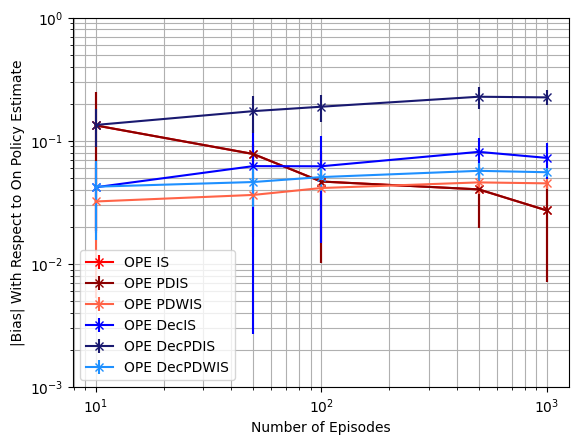

In [ ]:
label = 'bias'
plot_graphs(bias_means, bias_stds, label, 10**(-3), 10**0, shorter_D, estimator='IS')

##### Plot Variance

On Policy-----[0.06279004 0.00949805 0.00763067 0.00119535 0.00070819]
OPE IS-----[0.23215546 0.19152215 0.48814572 0.03967639 0.04158998]
OPE PDIS-----[0.23215546 0.19152215 0.48814572 0.03967639 0.04158998]
OPE PDWIS-----[4.90786545e-04 1.96804653e-04 1.71841582e-04 6.47418803e-05
 6.93617337e-05]
OPE DecIS-----[0.10286051 0.05826801 0.03202368 0.01777002 0.01284904]
OPE DecPDIS-----[0.07408806 0.03538621 0.02597148 0.03397843 0.01510359]
OPE DecPDWIS-----[1.45031708e-04 4.57504052e-05 3.24125507e-05 2.79502087e-05
 1.70398944e-05]


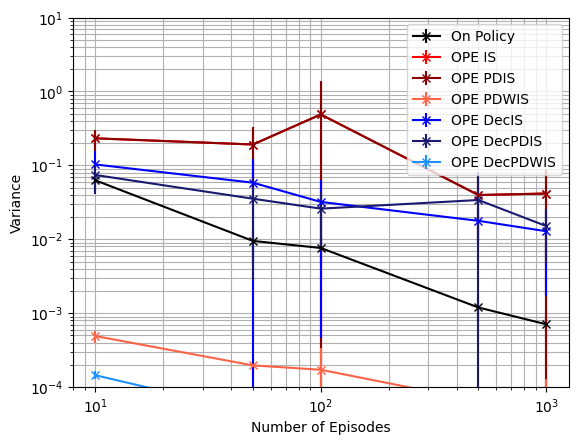

In [ ]:
label = 'var'
plot_graphs(var_means, var_stds, label, 10**(-4), 10**1, shorter_D, estimator='IS')

##### Plot MSE

On Policy-----[0.06279004 0.00949805 0.00763067 0.00119535 0.00070819]
OPE IS-----[0.26305334 0.19786191 0.49165562 0.04173172 0.04273068]
OPE PDIS-----[0.26305334 0.19786191 0.49165562 0.04173172 0.04273068]
OPE PDWIS-----[0.00224326 0.00190302 0.00201974 0.00225218 0.00211979]
OPE DecIS-----[0.10519327 0.06567588 0.03809854 0.02494836 0.01867497]
OPE DecPDIS-----[0.09419278 0.06894253 0.06392838 0.08780796 0.06664759]
OPE DecPDWIS-----[0.00264456 0.00248668 0.00273935 0.00336384 0.00312262]


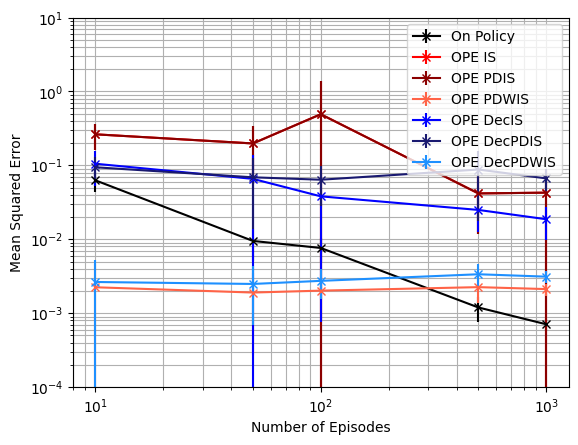

In [ ]:
label = 'MSE'
plot_graphs(MSE_means, MSE_stds, label, 10**(-4), 10**1, shorter_D, estimator='IS')

##### Plot ESS

On Policy-----[  10.   50.  100.  500. 1000.]
OPE IS-----[ 3.16826054  3.93022214 14.59545397 27.0518341  47.97168418]
OPE PDIS-----[ 3.16826054  3.93022214 14.59545397 27.0518341  47.97168418]
OPE PDWIS-----[ 1311.31325811  2603.519623    6905.87531578 12331.3630977
 20058.67314531]
OPE DecIS-----[ 6.97448051 17.27118862 45.6500772  45.35931318 81.03938034]
OPE DecPDIS-----[ 9.52221366 23.03110664 47.74125984 44.69112625 75.94562537]
OPE DecPDWIS-----[ 4379.37250347 12808.59438646 26296.75759753 27845.82886592
 53179.7938887 ]


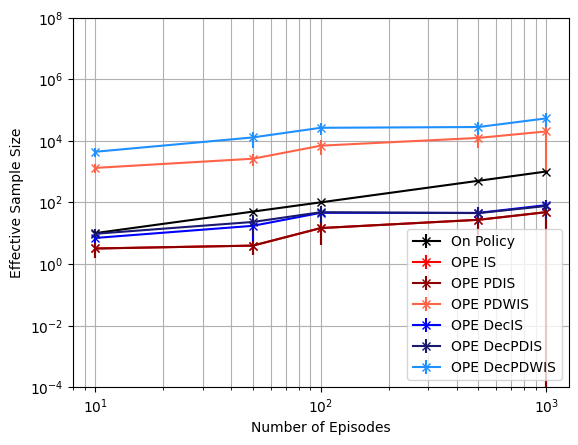

In [ ]:
label = 'ESS'
plot_graphs(ESS_means, ESS_stds, label, 10**(-4), 10**8, shorter_D, estimator='IS')

### Varying Episodes $\epsilon_{e} = 0.8$ (Policy Divergence $1.6^{20}$)



Set up evaluation policy, generate data and convert into factored format

In [ ]:
import gc
gc.collect()
EVAL_EPSILON = 0.8

evalPolSoft = np.copy(fullPol)
evalPolSoft[evalPolSoft == 1] = 1 - EVAL_EPSILON
evalPolSoft[evalPolSoft == 0] = EVAL_EPSILON / (n_actions - 1)

In [ ]:
# Calculate policy divergence from Voloshin et al.
D = 0
for state in range(randPol.shape[0] - 1):
    for action in range(randPol.shape[1] - 1):
        difference = evalPolSoft[state, action]/randPol[state, action]
        D = max(D, difference)
print(D)
shorter_D = round(D,2)

1.5999999999999996


In [ ]:
dgen = DataGenerator()
states, actions, lengths, rewards, diab, emp_tx_totals, emp_r_totals = dgen.simulate(
    NSIMSAMPS, NSTEPS, policy=evalPolSoft, policy_idx_type='full',
    p_diabetes=PROB_DIAB, use_tqdm=False) #True, tqdm_desc='Behaviour Policy Simulation')

obs_samps = utils.format_dgen_samps(
    states, actions, rewards, diab, NSTEPS, NSIMSAMPS)

In [ ]:
time = np.arange(NSTEPS)
times = np.stack(axis=0, arrays=[time]*NSIMSAMPS)
times = times[..., np.newaxis]

nf_tr_e = np.concatenate((times, states[:, 0:NSTEPS, :], actions, rewards, states[:, 1:, :]), axis=2)
nf_tr_e.shape

(100000, 20, 5)

In [ ]:
f_tr_e = factorise_dataset(nf_tr_e)

In [ ]:
factored_evalPolSoft = factor_policy(evalPolSoft)

In [ ]:
evalPolSoft = pad_policy(evalPolSoft)

factored_evalPolSoft[0] = pad_policy(factored_evalPolSoft[0])
factored_evalPolSoft[1] = pad_policy(factored_evalPolSoft[1])
factored_evalPolSoft[2] = pad_policy(factored_evalPolSoft[2])

In [ ]:
import policy_estimators as pe
import gc

def evaluate_PE(RUNS, EPISODES, SHORTER_D, STEPS=NSTEPS):

  biases = np.zeros((5, 7))
  variances = np.zeros((5, 7))
  MSEs = np.zeros((5, 7))
  ESSs = np.zeros((5, 7))

  # Reshape data for processing
  T, ldim = nf_tr_b.shape[-2], nf_tr_b.shape[-1]
  nfb = nf_tr_b.reshape((-1, RUNS, EPISODES, T, ldim))
  nfe = nf_tr_e.reshape((-1, RUNS, EPISODES, T, ldim))

  T, D, ldim = f_tr_b.shape[-3], f_tr_b.shape[-2], f_tr_b.shape[-1]
  fb = f_tr_b.reshape((-1, RUNS, EPISODES, T, D, ldim))
  fe = f_tr_e.reshape((-1, RUNS, EPISODES, T, D, ldim))

  for t in range(5):
    print()

    lower_index = 0
    estimates_on_policy = np.zeros(RUNS)
    estimates_OPE_IS = np.zeros(RUNS)
    estimates_OPE_PDIS = np.zeros(RUNS)
    estimates_OPE_PDWIS = np.zeros(RUNS)

    estimates_OPE_DecIS = np.zeros(RUNS)
    estimates_OPE_DecPDIS = np.zeros(RUNS)
    estimates_OPE_DecPDWIS = np.zeros(RUNS)

    for r in range(RUNS):
        #On policy Q estimate
        estimates_on_policy[r] = pe.on_policy_Q_estimate(nfe[t, r, :, :STEPS, :], DISCOUNT_Pol)
        #Off policy IS estimate
        estimates_OPE_IS[r] = pe.off_policy_IS_estimator(nfb[t, r, :, :STEPS, :], DISCOUNT_Pol, randPol, evalPolSoft)
        #Off policy PDIS estimate
        estimates_OPE_PDIS[r] = pe.off_policy_PDIS_estimator(nfb[t, r, :, :STEPS, :], DISCOUNT_Pol, randPol, evalPolSoft)
        #Off policy PDWIS estimate
        estimates_OPE_PDWIS[r] = pe.off_policy_PDWIS_estimator(nfb[t, r, :, :STEPS, :], DISCOUNT_Pol, randPol, evalPolSoft)

        #Factorisation 1----------------------------------

        #Off policy decomposed IS estimate
        estimates_OPE_DecIS[r], _ = pe.off_policy_DecIS_estimator(fb[t, r, :, :STEPS, :, :], DISCOUNT_Pol, [0,1], factored_randPol, factored_evalPolSoft)
        #Off policy decomposed PDIS estimate
        estimates_OPE_DecPDIS[r], _ = pe.off_policy_DecPDIS_estimator(fb[t, r, :, :STEPS, :, :], DISCOUNT_Pol, [0,1], factored_randPol, factored_evalPolSoft)
        #Off policy decomposed PDWIS estimate
        estimates_OPE_DecPDWIS[r], _ = pe.off_policy_DecPDWIS_estimator(fb[t, r, :, :STEPS, :, :], DISCOUNT_Pol, [0,1], factored_randPol, factored_evalPolSoft)


    mean_on_policy = np.mean(estimates_on_policy)
    var_on_policy = np.var(estimates_on_policy, ddof=0)
    print(f'Mean on policy Q estimate: {mean_on_policy}. Variance of on policy Q estimate: {var_on_policy}')

    from sklearn.metrics import mean_squared_error

    #For on policy
    biases[t, 0] = 0.0
    variances[t, 0] = var_on_policy
    MSEs[t, 0] = var_on_policy
    ESSs[t, 0] = EPISODES

    def generate_results(estimates, mean_true, label):
      MSE = mean_squared_error(estimates, [mean_true]*RUNS)
      mean = np.mean(estimates)
      var = np.var(estimates, ddof=0)
      bias1 = np.sqrt(MSE - var)
      bias2 = abs(mean - mean_true)
      print(f'Mean {label} estimate: {mean}. Bias1: {bias1}. Bias2: {bias2}. Variance: {var}. MSE: {MSE}')
      return bias1, var, MSE

    label_list = ['OPE IS', 'OPE PDIS', 'OPE PDWIS',
                  'OPE DecIS', 'OPE DecPDIS', 'OPE DecPDWIS'
                  ]

    estimates = [estimates_OPE_IS, estimates_OPE_PDIS, estimates_OPE_PDWIS,
                estimates_OPE_DecIS, estimates_OPE_DecPDIS, estimates_OPE_DecPDWIS
                ]


    for (id, val) in enumerate(label_list):
      biases[t, 1+id], variances[t, 1+id], MSEs[t, 1+id] = generate_results(estimates[id], mean_on_policy, label_list[id])
      ESSs[t, 1+id] = (EPISODES*variances[t, 0])/variances[t, 1+id]
      gc.collect()

  return np.mean(biases, axis=0), np.std(biases, axis=0), np.mean(variances, axis=0), np.std(variances, axis=0), np.mean(MSEs, axis=0), np.std(MSEs, axis=0), np.mean(ESSs, axis=0), np.std(ESSs, axis=0)

#### Run Everything

In [ ]:
EPISODES = [10, 50, 100, 500, 1000]

bias_means = np.zeros((len(EPISODES), 7))
bias_stds = np.zeros((len(EPISODES), 7))
var_means = np.zeros((len(EPISODES), 7))
var_stds = np.zeros((len(EPISODES), 7))
MSE_means = np.zeros((len(EPISODES), 7))
MSE_stds = np.zeros((len(EPISODES), 7))
ESS_means = np.zeros((len(EPISODES), 7))
ESS_stds = np.zeros((len(EPISODES), 7))

RUNS = 20

for id in range(len(EPISODES)):
  e = EPISODES[id]
  print(f'{e} Episodes, {RUNS} ----------------------------------')
  bias_means[id, :], bias_stds[id, :], var_means[id, :], var_stds[id, :], MSE_means[id, :], MSE_stds[id, :], ESS_means[id, :], ESS_stds[id, :] = evaluate_PE(RUNS=RUNS, EPISODES=e, SHORTER_D=shorter_D)
  print()
  gc.collect()

print('BIAS MEANS')
print(list(bias_means))
print('\nBIAS STDS')
print(list(bias_stds))
print('\nVAR MEANS')
print(list(var_means))
print('\nVAR STDS')
print(list(var_stds))
print('\nMSE MEANS')
print(list(MSE_means))
print('\nMSE STDS')
print(list(MSE_stds))
print('\nESS MEANS')
print(list(ESS_means))
print('\nESS STDS')
print(list(ESS_stds))

10 Episodes, 20 ----------------------------------

Mean on policy Q estimate: -0.1592893987328691. Variance of on policy Q estimate: 0.054566764754664196
Mean OPE IS estimate: -0.28591754550905646. Bias1: 0.12662814677618736. Bias2: 0.12662814677618736. Variance: 0.07834536163652314. MSE: 0.09438004919249479
Mean OPE PDIS estimate: -0.28591754550905646. Bias1: 0.12662814677618736. Bias2: 0.12662814677618736. Variance: 0.07834536163652314. MSE: 0.09438004919249479
Mean OPE PDWIS estimate: -0.015130139140423207. Bias1: 0.14415925959244588. Bias2: 0.14415925959244588. Variance: 0.0002206302117509058. MSE: 0.02100252233799311
Mean OPE DecIS estimate: -0.1799601399985499. Bias1: 0.02067074126568081. Bias2: 0.020670741265680803. Variance: 0.026743678452519997. MSE: 0.027170957996992717
Mean OPE DecPDIS estimate: -0.23450212659920716. Bias1: 0.0752127278663381. Bias2: 0.07521272786633806. Variance: 0.02212630022100391. MSE: 0.027783254654099743
Mean OPE DecPDWIS estimate: -0.0118034453953170

#### Plot Graphs

##### Plot Bias

OPE IS-----[0.06582068 0.01831077 0.02570231 0.00871274 0.00980709]
OPE PDIS-----[0.06582068 0.01831077 0.02570231 0.00871274 0.00980709]
OPE PDWIS-----[0.2167899  0.24531004 0.24251316 0.23982616 0.23728583]
OPE DecIS-----[0.0794556  0.08955354 0.08461319 0.07806881 0.07570636]
OPE DecPDIS-----[0.05195912 0.04291471 0.03856648 0.03175753 0.0292541 ]
OPE DecPDWIS-----[0.21908316 0.24770671 0.24478328 0.24186827 0.23939301]


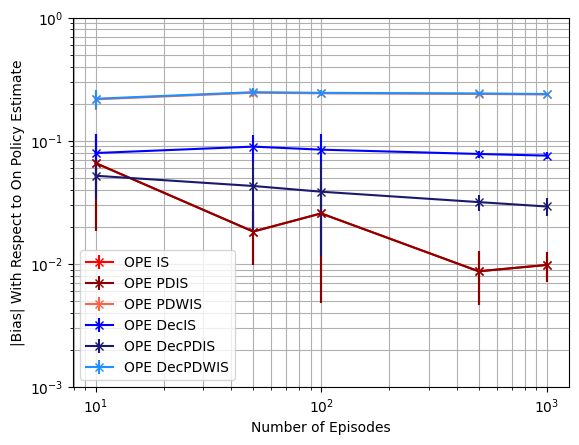

In [ ]:
label = 'bias'
plot_graphs(bias_means, bias_stds, label, 10**(-3), 10**0, shorter_D, estimator='IS')

##### Plot Variance

On Policy-----[0.05933224 0.01281938 0.00464552 0.0013534  0.00057687]
OPE IS-----[0.07223963 0.01664199 0.00942905 0.00210041 0.00086737]
OPE PDIS-----[0.07223963 0.01664199 0.00942905 0.00210041 0.00086737]
OPE PDWIS-----[1.88950965e-04 3.89564744e-05 2.19614280e-05 5.25500759e-06
 2.21836662e-06]
OPE DecIS-----[0.03182886 0.00645595 0.00351336 0.00110828 0.00038272]
OPE DecPDIS-----[0.0274026  0.0056612  0.0030987  0.00092598 0.00032755]
OPE DecPDWIS-----[6.88115962e-05 1.37560511e-05 7.63605742e-06 2.23977718e-06
 7.54600604e-07]


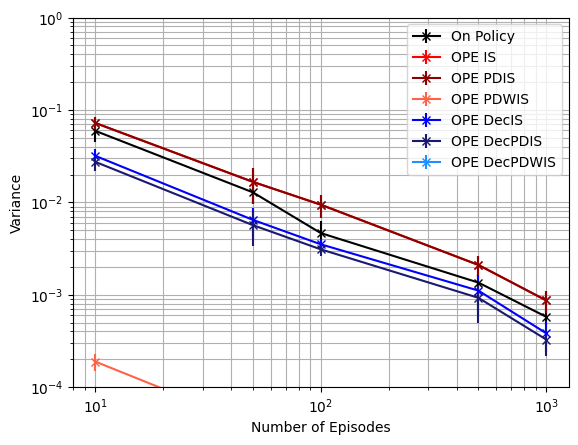

In [ ]:
label = 'var'
plot_graphs(var_means, var_stds, label, 10**(-4), 10**0, shorter_D, estimator='IS')

##### Plot MSE

On Policy-----[0.05933224 0.01281938 0.00464552 0.0013534  0.00057687]
OPE IS-----[0.07882349 0.01704919 0.01052621 0.00219262 0.00097075]
OPE PDIS-----[0.07882349 0.01704919 0.01052621 0.00219262 0.00097075]
OPE PDWIS-----[0.04864702 0.06051948 0.05898191 0.05754981 0.05632583]
OPE DecIS-----[0.03933238 0.01497622 0.011525   0.00722793 0.00613526]
OPE DecPDIS-----[0.03043686 0.00807355 0.00531389 0.00195686 0.00120734]
OPE DecPDWIS-----[0.04950736 0.06169225 0.06006964 0.05852988 0.05732858]


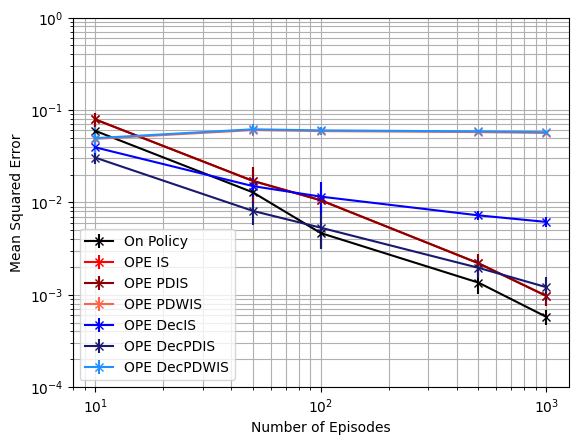

In [ ]:
label = 'MSE'
plot_graphs(MSE_means, MSE_stds, label, 10**(-4), 10**0, shorter_D, estimator='IS')

##### Plot ESS

On Policy-----[  10.   50.  100.  500. 1000.]
OPE IS-----[  8.68619197  41.67310858  54.99131716 333.0999154  700.71380801]
OPE PDIS-----[  8.68619197  41.67310858  54.99131716 333.0999154  700.71380801]
OPE PDWIS-----[  3438.29466522  17438.2273738   23409.60116443 130743.26740547
 276558.12436525]
OPE DecIS-----[  19.62574663  104.1326054   133.53312926  697.41257065 1640.93388277]
OPE DecPDIS-----[  22.7232238   121.84199747  149.43470032  853.34208509 1893.73803943]
OPE DecPDWIS-----[  9208.62845247  50092.61791782  62247.43598811 330316.64555108
 838964.12740044]


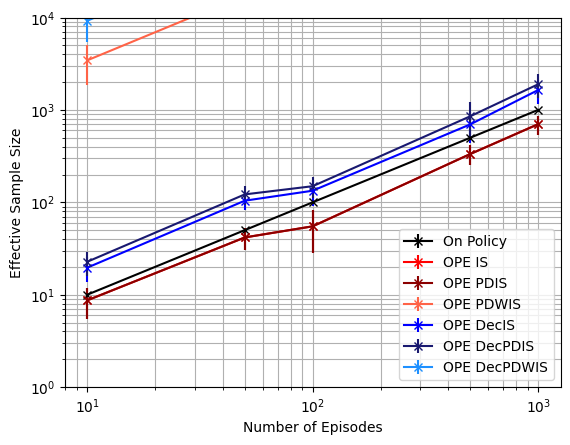

In [ ]:
label = 'ESS'
plot_graphs(ESS_means, ESS_stds, label, 10**(0), 10**4, shorter_D, estimator='IS')

On Policy-----[  10.   50.  100.  500. 1000.]
OPE IS-----[  8.68619197  41.67310858  54.99131716 333.0999154  700.71380801]
OPE PDIS-----[  8.68619197  41.67310858  54.99131716 333.0999154  700.71380801]
OPE PDWIS-----[  3438.29466522  17438.2273738   23409.60116443 130743.26740547
 276558.12436525]
OPE DecIS-----[  19.62574663  104.1326054   133.53312926  697.41257065 1640.93388277]
OPE DecPDIS-----[  22.7232238   121.84199747  149.43470032  853.34208509 1893.73803943]
OPE DecPDWIS-----[  9208.62845247  50092.61791782  62247.43598811 330316.64555108
 838964.12740044]


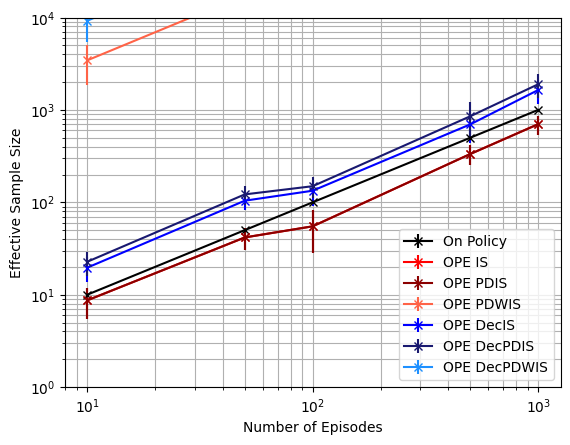

In [ ]:
plot_graphs(ESS_means, ESS_stds, label, 10**(0), 10**4, shorter_D, estimator='PDIS')

On Policy-----[  10.   50.  100.  500. 1000.]
OPE IS-----[  8.68619197  41.67310858  54.99131716 333.0999154  700.71380801]
OPE PDIS-----[  8.68619197  41.67310858  54.99131716 333.0999154  700.71380801]
OPE PDWIS-----[  3438.29466522  17438.2273738   23409.60116443 130743.26740547
 276558.12436525]
OPE DecIS-----[  19.62574663  104.1326054   133.53312926  697.41257065 1640.93388277]
OPE DecPDIS-----[  22.7232238   121.84199747  149.43470032  853.34208509 1893.73803943]
OPE DecPDWIS-----[  9208.62845247  50092.61791782  62247.43598811 330316.64555108
 838964.12740044]


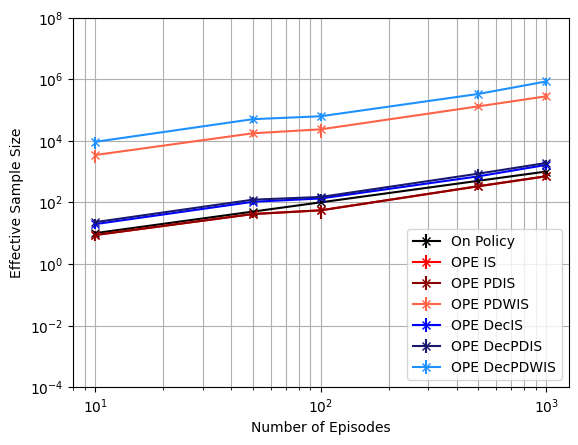

In [ ]:
plot_graphs(ESS_means, ESS_stds, label, 10**(-4), 10**(8), shorter_D, estimator='PDWIS')

### Varying Episode Length $T$ With $\epsilon_{e} = 0.8$ (Policy Divergence $1.6^{T}$)

Set up evaluation policy, generate data and convert into factored format

In [ ]:
import gc

gc.collect()
EVAL_EPSILON = 0.8

evalPolSoft = np.copy(fullPol)
evalPolSoft[evalPolSoft == 1] = 1 - EVAL_EPSILON
evalPolSoft[evalPolSoft == 0] = EVAL_EPSILON / (n_actions - 1)

In [ ]:
# Calculate policy divergence from Voloshin et al.
D = 0
for state in range(randPol.shape[0] - 1):
    for action in range(randPol.shape[1] - 1):
        difference = evalPolSoft[state, action]/randPol[state, action]
        D = max(D, difference)
print(D)
shorter_D = round(D,2)

1.5999999999999996


In [ ]:
dgen = DataGenerator()
states, actions, lengths, rewards, diab, emp_tx_totals, emp_r_totals = dgen.simulate(
    NSIMSAMPS, NSTEPS, policy=evalPolSoft, policy_idx_type='full',
    p_diabetes=PROB_DIAB, use_tqdm=False) #True, tqdm_desc='Behaviour Policy Simulation')

obs_samps = utils.format_dgen_samps(
    states, actions, rewards, diab, NSTEPS, NSIMSAMPS)

In [ ]:
time = np.arange(NSTEPS)
times = np.stack(axis=0, arrays=[time]*NSIMSAMPS)
times = times[..., np.newaxis]

nf_tr_e = np.concatenate((times, states[:, 0:NSTEPS, :], actions, rewards, states[:, 1:, :]), axis=2)
nf_tr_e.shape

(100000, 20, 5)

In [ ]:
f_tr_e = factorise_dataset(nf_tr_e)

In [ ]:
factored_evalPolSoft = factor_policy(evalPolSoft)

In [ ]:
evalPolSoft = pad_policy(evalPolSoft)

factored_evalPolSoft[0] = pad_policy(factored_evalPolSoft[0])
factored_evalPolSoft[1] = pad_policy(factored_evalPolSoft[1])
factored_evalPolSoft[2] = pad_policy(factored_evalPolSoft[2])

In [ ]:
import policy_estimators as pe
import gc

def evaluate_PE(RUNS, EPISODES, SHORTER_D, STEPS=NSTEPS):

  biases = np.zeros((5, 7))
  variances = np.zeros((5, 7))
  MSEs = np.zeros((5, 7))
  ESSs = np.zeros((5, 7))

  # Reshape data for processing
  T, ldim = nf_tr_b.shape[-2], nf_tr_b.shape[-1]
  nfb = nf_tr_b.reshape((-1, RUNS, EPISODES, T, ldim))
  nfe = nf_tr_e.reshape((-1, RUNS, EPISODES, T, ldim))

  T, D, ldim = f_tr_b.shape[-3], f_tr_b.shape[-2], f_tr_b.shape[-1]
  fb = f_tr_b.reshape((-1, RUNS, EPISODES, T, D, ldim))
  fe = f_tr_e.reshape((-1, RUNS, EPISODES, T, D, ldim))

  for t in range(5):
    print()

    lower_index = 0
    estimates_on_policy = np.zeros(RUNS)
    estimates_OPE_IS = np.zeros(RUNS)
    estimates_OPE_PDIS = np.zeros(RUNS)
    estimates_OPE_PDWIS = np.zeros(RUNS)

    estimates_OPE_DecIS = np.zeros(RUNS)
    estimates_OPE_DecPDIS = np.zeros(RUNS)
    estimates_OPE_DecPDWIS = np.zeros(RUNS)

    for r in range(RUNS):
        #On policy Q estimate
        estimates_on_policy[r] = pe.on_policy_Q_estimate(nfe[t, r, :, :STEPS, :], DISCOUNT_Pol)
        #Off policy IS estimate
        estimates_OPE_IS[r] = pe.off_policy_IS_estimator(nfb[t, r, :, :STEPS, :], DISCOUNT_Pol, randPol, evalPolSoft)
        #Off policy PDIS estimate
        estimates_OPE_PDIS[r] = pe.off_policy_PDIS_estimator(nfb[t, r, :, :STEPS, :], DISCOUNT_Pol, randPol, evalPolSoft)
        #Off policy PDWIS estimate
        estimates_OPE_PDWIS[r] = pe.off_policy_PDWIS_estimator(nfb[t, r, :, :STEPS, :], DISCOUNT_Pol, randPol, evalPolSoft)

        #Factorisation 1----------------------------------

        #Off policy decomposed IS estimate
        estimates_OPE_DecIS[r], _ = pe.off_policy_DecIS_estimator(fb[t, r, :, :STEPS, :, :], DISCOUNT_Pol, [0,1], factored_randPol, factored_evalPolSoft)
        #Off policy decomposed PDIS estimate
        estimates_OPE_DecPDIS[r], _ = pe.off_policy_DecPDIS_estimator(fb[t, r, :, :STEPS, :, :], DISCOUNT_Pol, [0,1], factored_randPol, factored_evalPolSoft)
        #Off policy decomposed PDWIS estimate
        estimates_OPE_DecPDWIS[r], _ = pe.off_policy_DecPDWIS_estimator(fb[t, r, :, :STEPS, :, :], DISCOUNT_Pol, [0,1], factored_randPol, factored_evalPolSoft)


    mean_on_policy = np.mean(estimates_on_policy)
    var_on_policy = np.var(estimates_on_policy, ddof=0)
    print(f'Mean on policy Q estimate: {mean_on_policy}. Variance of on policy Q estimate: {var_on_policy}')

    from sklearn.metrics import mean_squared_error

    #For on policy
    biases[t, 0] = 0.0
    variances[t, 0] = var_on_policy
    MSEs[t, 0] = var_on_policy
    ESSs[t, 0] = EPISODES

    def generate_results(estimates, mean_true, label):
      MSE = mean_squared_error(estimates, [mean_true]*RUNS)
      mean = np.mean(estimates)
      var = np.var(estimates, ddof=0)
      bias1 = np.sqrt(MSE - var)
      bias2 = abs(mean - mean_true)
      print(f'Mean {label} estimate: {mean}. Bias1: {bias1}. Bias2: {bias2}. Variance: {var}. MSE: {MSE}')
      return bias1, var, MSE

    label_list = ['OPE IS', 'OPE PDIS', 'OPE PDWIS',
                  'OPE DecIS', 'OPE DecPDIS', 'OPE DecPDWIS'
                  ]

    estimates = [estimates_OPE_IS, estimates_OPE_PDIS, estimates_OPE_PDWIS,
                estimates_OPE_DecIS, estimates_OPE_DecPDIS, estimates_OPE_DecPDWIS
                ]


    for (id, val) in enumerate(label_list):
      biases[t, 1+id], variances[t, 1+id], MSEs[t, 1+id] = generate_results(estimates[id], mean_on_policy, label_list[id])
      ESSs[t, 1+id] = (EPISODES*variances[t, 0])/variances[t, 1+id]
      gc.collect()

  return np.mean(biases, axis=0), np.std(biases, axis=0), np.mean(variances, axis=0), np.std(variances, axis=0), np.mean(MSEs, axis=0), np.std(MSEs, axis=0), np.mean(ESSs, axis=0), np.std(ESSs, axis=0)

#### Run Everything

In [ ]:
STEPS = [1, 2, 5, 10, 15, 20]

bias_means = np.zeros((len(STEPS), 7))
bias_stds = np.zeros((len(STEPS), 7))
var_means = np.zeros((len(STEPS), 7))
var_stds = np.zeros((len(STEPS), 7))
MSE_means = np.zeros((len(STEPS), 7))
MSE_stds = np.zeros((len(STEPS), 7))
ESS_means = np.zeros((len(STEPS), 7))
ESS_stds = np.zeros((len(STEPS), 7))

RUNS = 20

for id in range(len(STEPS)):
  e = STEPS[id]
  print(f'{e} Steps, {RUNS} ----------------------------------')
  bias_means[id, :], bias_stds[id, :], var_means[id, :], var_stds[id, :], MSE_means[id, :], MSE_stds[id, :], ESS_means[id, :], ESS_stds[id, :] = evaluate_PE(RUNS=RUNS, EPISODES=1000, STEPS=e, SHORTER_D=shorter_D)
  print()
  gc.collect()

print('BIAS MEANS')
print(list(bias_means))
print('\nBIAS STDS')
print(list(bias_stds))
print('\nVAR MEANS')
print(list(var_means))
print('\nVAR STDS')
print(list(var_stds))
print('\nMSE MEANS')
print(list(MSE_means))
print('\nMSE STDS')
print(list(MSE_stds))
print('\nESS MEANS')
print(list(ESS_means))
print('\nESS STDS')
print(list(ESS_stds))

1 Steps, 20 ----------------------------------

Mean on policy Q estimate: 0.08335000000000001. Variance of on policy Q estimate: 0.0001488275
Mean OPE IS estimate: 0.08826285714285713. Bias1: 0.004912857142857112. Bias2: 0.004912857142857122. Variance: 0.00010819017142857134. MSE: 0.00013232633673469348
Mean OPE PDIS estimate: 0.08826285714285713. Bias1: 0.004912857142857112. Bias2: 0.004912857142857122. Variance: 0.00010819017142857134. MSE: 0.00013232633673469348
Mean OPE PDWIS estimate: 0.08812662571564006. Bias1: 0.00477662571564005. Bias2: 0.004776625715640054. Variance: 0.00010528655674731413. MSE: 0.00012810270997462794
Mean OPE DecIS estimate: 0.04624242424242423. Bias1: 0.03710757575757578. Bias2: 0.03710757575757578. Variance: 3.060202020202019e-05. MSE: 0.0014075741988062457
Mean OPE DecPDIS estimate: 0.04624242424242423. Bias1: 0.03710757575757578. Bias2: 0.03710757575757578. Variance: 3.060202020202019e-05. MSE: 0.0014075741988062457
Mean OPE DecPDWIS estimate: 0.04629474

#### Plot Graphs

##### Plot Bias

OPE IS-----[0.00300314 0.00289289 0.00171071 0.00243979 0.00726351 0.00691719]
OPE PDIS-----[0.00300314 0.00289289 0.00171071 0.00243979 0.00726351 0.00691719]
OPE PDWIS-----[0.00300322 0.05369632 0.04455608 0.06193224 0.16118302 0.2377138 ]
OPE DecIS-----[0.04194515 0.03863921 0.01589103 0.02125809 0.0507661  0.07613432]
OPE DecPDIS-----[0.04194515 0.0521412  0.04429495 0.017348   0.00709442 0.02968206]
OPE DecPDWIS-----[0.04194283 0.0791923  0.05340317 0.0606104  0.16242493 0.23982097]


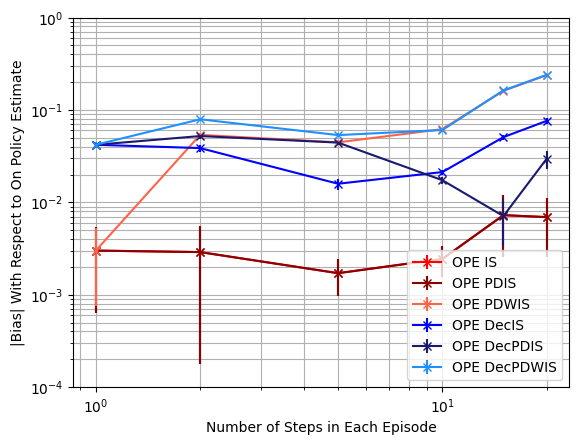

In [ ]:
label = 'bias'
plot_graphs(bias_means, bias_stds, label, 10**(-4), 10**0, shorter_D, estimator='IS')

##### Plot Variance

On Policy-----[0.00012939 0.00016804 0.00026386 0.00047036 0.00053865 0.00059824]
OPE IS-----[0.00013011 0.00018296 0.00035378 0.00054754 0.00066863 0.00086737]
OPE PDIS-----[0.00013011 0.00018296 0.00035378 0.00054754 0.00066863 0.00086737]
OPE PDWIS-----[1.22333578e-04 4.27855578e-05 1.38177842e-05 5.59220143e-06
 3.07898890e-06 2.21836662e-06]
OPE DecIS-----[3.77492948e-05 7.95985762e-05 1.49687898e-04 2.69761989e-04
 3.22462626e-04 3.82716877e-04]
OPE DecPDIS-----[3.77492948e-05 5.89862885e-05 1.20810573e-04 2.21384156e-04
 2.76862309e-04 3.27549460e-04]
OPE DecPDWIS-----[3.67646334e-05 1.38376989e-05 4.57786650e-06 2.09360777e-06
 1.15103088e-06 7.54600604e-07]


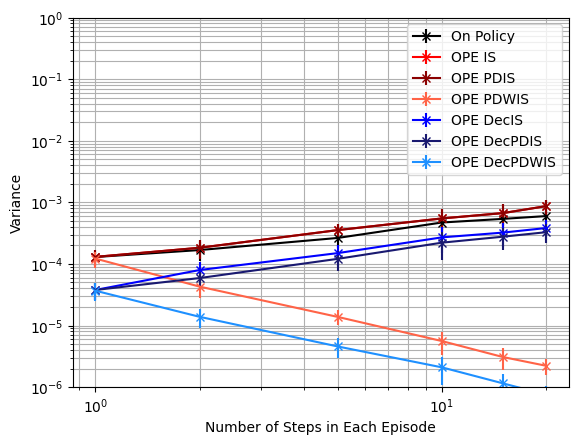

In [ ]:
label = 'var'
plot_graphs(var_means, var_stds, label, 10**(-6), 10**0, shorter_D, estimator='IS')

##### Plot MSE

On Policy-----[0.00012939 0.00016804 0.00026386 0.00047036 0.00053865 0.00059824]
OPE IS-----[0.0001447  0.0001987  0.00035727 0.00055428 0.00074343 0.00093416]
OPE PDIS-----[0.0001447  0.0001987  0.00035727 0.00055428 0.00074343 0.00093416]
OPE PDWIS-----[0.00013644 0.00293605 0.00200569 0.00384501 0.02599519 0.05653376]
OPE DecIS-----[0.0018058  0.00158387 0.00040687 0.00072356 0.00291096 0.00621689]
OPE DecPDIS-----[0.0018058  0.00278775 0.00208683 0.00052485 0.00034134 0.00125226]
OPE DecPDWIS-----[0.00180477 0.00629467 0.00286401 0.00368035 0.02639548 0.05754045]


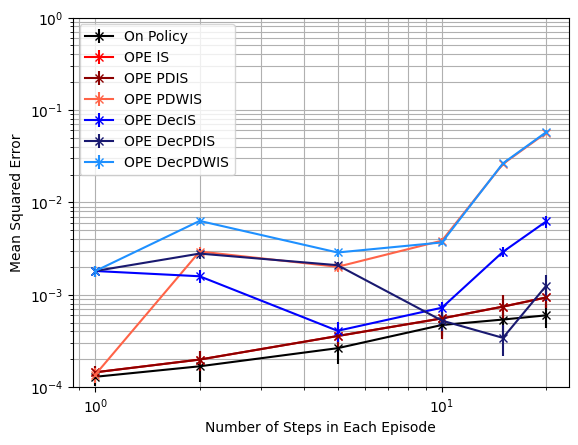

In [ ]:
label = 'MSE'
plot_graphs(MSE_means, MSE_stds, label, 10**(-4), 10**0, shorter_D, estimator='IS')

##### Plot ESS

On Policy-----[1000. 1000. 1000. 1000. 1000. 1000.]
OPE IS-----[1149.05252702 1212.2264416   848.231831    949.60034809  825.61213157
  689.97266478]
OPE PDIS-----[1149.05252702 1212.2264416   848.231831    949.60034809  825.61213157
  689.97266478]
OPE PDWIS-----[  1236.31607817   5244.74108059  21759.06275087  92970.54926141
 180037.78180257 270566.17856566]
OPE DecIS-----[4005.26775052 2685.83396914 2010.28316624 2102.4400328  1853.47149243
 1665.88991796]
OPE DecPDIS-----[4005.26775052 3609.68609426 2444.28451602 2614.60077235 2159.66295577
 1923.48803891]
OPE DecPDWIS-----[  4166.94294122  15373.73853342  64405.2592314  279806.97860451
 546003.23546759 859382.23269236]


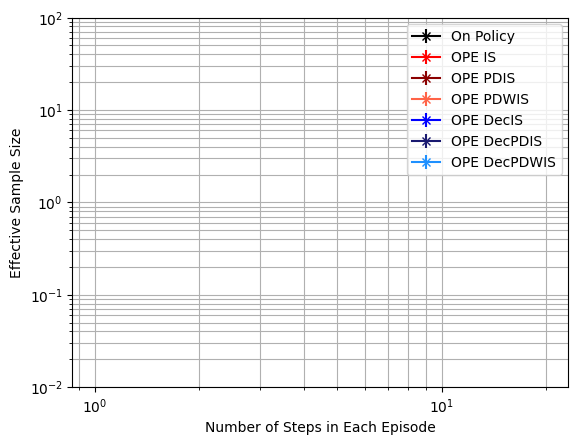

In [ ]:
label = 'ESS'
plot_graphs(ESS_means, ESS_stds, label, 10**(-2), 10**2, shorter_D, estimator='IS')

On Policy-----[1000. 1000. 1000. 1000. 1000. 1000.]
OPE IS-----[1149.05252702 1212.2264416   848.231831    949.60034809  825.61213157
  689.97266478]
OPE PDIS-----[1149.05252702 1212.2264416   848.231831    949.60034809  825.61213157
  689.97266478]
OPE PDWIS-----[  1236.31607817   5244.74108059  21759.06275087  92970.54926141
 180037.78180257 270566.17856566]
OPE DecIS-----[4005.26775052 2685.83396914 2010.28316624 2102.4400328  1853.47149243
 1665.88991796]
OPE DecPDIS-----[4005.26775052 3609.68609426 2444.28451602 2614.60077235 2159.66295577
 1923.48803891]
OPE DecPDWIS-----[  4166.94294122  15373.73853342  64405.2592314  279806.97860451
 546003.23546759 859382.23269236]


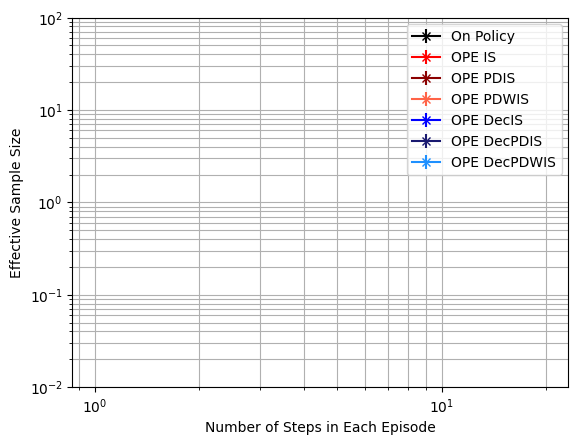

In [ ]:
plot_graphs(ESS_means, ESS_stds, label, 10**(-2), 10**2, shorter_D, estimator='PDIS')

On Policy-----[1000. 1000. 1000. 1000. 1000. 1000.]
OPE IS-----[1149.05252702 1212.2264416   848.231831    949.60034809  825.61213157
  689.97266478]
OPE PDIS-----[1149.05252702 1212.2264416   848.231831    949.60034809  825.61213157
  689.97266478]
OPE PDWIS-----[  1236.31607817   5244.74108059  21759.06275087  92970.54926141
 180037.78180257 270566.17856566]
OPE DecIS-----[4005.26775052 2685.83396914 2010.28316624 2102.4400328  1853.47149243
 1665.88991796]
OPE DecPDIS-----[4005.26775052 3609.68609426 2444.28451602 2614.60077235 2159.66295577
 1923.48803891]
OPE DecPDWIS-----[  4166.94294122  15373.73853342  64405.2592314  279806.97860451
 546003.23546759 859382.23269236]


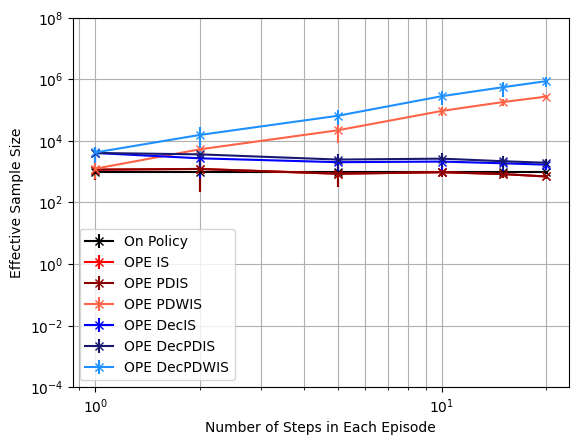

In [ ]:
plot_graphs(ESS_means, ESS_stds, label, 10**(-4), 10**(8), shorter_D, estimator='PDWIS')

# From Patient State 377, With Diabetes

In [ ]:
#The patient has no diabetes
PROB_DIAB = 1.0

### State Analysis

In [ ]:
#Instantiate a state based on the idx and get the state vector
testState = State(state_idx = 377, diabetic_idx=0)
vec = testState.get_state_vector()

print(vec)
print(f'Num abnormals: {testState.get_num_abnormal()}\n')

print(f'Heart Rate: {hr_state_mapping[vec[0]]}')
print(f'Systolic Blood Pressure: {sbp_state_mapping[vec[1]]}')
print(f'Percent Oxygen: {o2_state_mapping[vec[2]]}')
print(f'Glucose Level: {glu_state_mapping[vec[3]]}')
print(f'Antibiotics: {abx_state_mapping[vec[4]]}')
print(f'Vasopressors: {vaso_state_mapping[vec[5]]}')
print(f'Ventilator: {vent_state_mapping[vec[6]]}')
print(f'Diabetes: {testState.diabetic_idx}')

[1 1 1 2 0 0 1]
Num abnormals: 0

Heart Rate: Normal
Systolic Blood Pressure: Normal
Percent Oxygen: Normal
Glucose Level: Normal
Antibiotics: Off
Vasopressors: Off
Ventilator: On
Diabetes: 0


### Generate Data From Behaviour Policy

Run the data generator

In [ ]:
dgen = DataGenerator()
states, actions, lengths, rewards, diab, emp_tx_totals, emp_r_totals = dgen.simulate(
    NSIMSAMPS, NSTEPS, policy=randPol, policy_idx_type='full',
    p_diabetes=PROB_DIAB, use_tqdm=False) #True, tqdm_desc='Behaviour Policy Simulation')

obs_samps = utils.format_dgen_samps(
    states, actions, rewards, diab, NSTEPS, NSIMSAMPS)

Convert data into array format

In [ ]:
time = np.arange(NSTEPS)
times = np.stack(axis=0, arrays=[time]*NSIMSAMPS)
times = times[..., np.newaxis]

nf_tr_b = np.concatenate((times, states[:, 0:NSTEPS, :], actions, rewards, states[:, 1:, :]), axis=2)
nf_tr_b.shape

(100000, 20, 5)

In [ ]:
f_tr_b = factorise_dataset(nf_tr_b)

In [ ]:
print(nf_tr_b)

[[[  0. 377.   0.  -1. 528.]
  [  1. 528.  -1.   0.  -1.]
  [  2.  -1.  -1.   0.  -1.]
  ...
  [ 17.  -1.  -1.   0.  -1.]
  [ 18.  -1.  -1.   0.  -1.]
  [ 19.  -1.  -1.   0.  -1.]]

 [[  0. 377.   3.   0. 467.]
  [  1. 467.   1.   0. 474.]
  [  2. 474.   3.  -1. 715.]
  ...
  [ 17.  -1.  -1.   0.  -1.]
  [ 18.  -1.  -1.   0.  -1.]
  [ 19.  -1.  -1.   0.  -1.]]

 [[  0. 377.   6.   0. 381.]
  [  1. 381.   2.   0. 377.]
  [  2. 377.   0.  -1. 568.]
  ...
  [ 17.  -1.  -1.   0.  -1.]
  [ 18.  -1.  -1.   0.  -1.]
  [ 19.  -1.  -1.   0.  -1.]]

 ...

 [[  0. 377.   7.   0. 463.]
  [  1. 463.   7.   0. 471.]
  [  2. 471.   4.   0. 380.]
  ...
  [ 17.  -1.  -1.   0.  -1.]
  [ 18.  -1.  -1.   0.  -1.]
  [ 19.  -1.  -1.   0.  -1.]]

 [[  0. 377.   2.   0. 369.]
  [  1. 369.   6.   0. 373.]
  [  2. 373.   5.   0. 374.]
  ...
  [ 17. 450.   2.  -1. 201.]
  [ 18. 201.  -1.   0.  -1.]
  [ 19.  -1.  -1.   0.  -1.]]

 [[  0. 377.   7.   0. 383.]
  [  1. 383.   7.   0. 463.]
  [  2. 463.   7.   0. 463

In [ ]:
print(f_tr_b)

[[[[ 0.00000000e+00  3.77000000e+02  1.00000000e+00 -3.33333333e-01
     5.28000000e+02]
   [ 0.00000000e+00  3.77000000e+02  1.00000000e+00 -3.33333333e-01
     5.28000000e+02]
   [ 0.00000000e+00  3.77000000e+02  0.00000000e+00 -3.33333333e-01
     5.28000000e+02]]

  [[ 1.00000000e+00  5.28000000e+02  1.00000000e+00  0.00000000e+00
    -1.00000000e+00]
   [ 1.00000000e+00  5.28000000e+02  1.00000000e+00  0.00000000e+00
    -1.00000000e+00]
   [ 1.00000000e+00  5.28000000e+02  1.00000000e+00  0.00000000e+00
    -1.00000000e+00]]

  [[ 2.00000000e+00 -1.00000000e+00  1.00000000e+00  0.00000000e+00
    -1.00000000e+00]
   [ 2.00000000e+00 -1.00000000e+00  1.00000000e+00  0.00000000e+00
    -1.00000000e+00]
   [ 2.00000000e+00 -1.00000000e+00  1.00000000e+00  0.00000000e+00
    -1.00000000e+00]]

  ...

  [[ 1.70000000e+01 -1.00000000e+00  1.00000000e+00  0.00000000e+00
    -1.00000000e+00]
   [ 1.70000000e+01 -1.00000000e+00  1.00000000e+00  0.00000000e+00
    -1.00000000e+00]
   [ 1.7

In [ ]:
factored_randPol = factor_policy(randPol)

In [ ]:
randPol = pad_policy(randPol)

factored_randPol[0] = pad_policy(factored_randPol[0])
factored_randPol[1] = pad_policy(factored_randPol[1])
factored_randPol[2] = pad_policy(factored_randPol[2])

### Varying Episodes $\epsilon_{e} = 0.0$ (Policy Divergence $8.0^{20}$)

Set up evaluation policy, generate data and convert into factored format

In [ ]:
EVAL_EPSILON = 0.0

evalPolSoft = np.copy(fullPol)
evalPolSoft[evalPolSoft == 1] = 1 - EVAL_EPSILON
evalPolSoft[evalPolSoft == 0] = EVAL_EPSILON / (n_actions - 1)

In [ ]:
# Calculate policy divergence from Voloshin et al.
D = 0
for state in range(randPol.shape[0] - 1):
    for action in range(randPol.shape[1] - 1):
        difference = evalPolSoft[state, action]/randPol[state, action]
        D = max(D, difference)
print(D)
shorter_D = round(D,2)

8.0


In [ ]:
dgen = DataGenerator()
states, actions, lengths, rewards, diab, emp_tx_totals, emp_r_totals = dgen.simulate(
    NSIMSAMPS, NSTEPS, policy=evalPolSoft, policy_idx_type='full',
    p_diabetes=PROB_DIAB, use_tqdm=False) #True, tqdm_desc='Behaviour Policy Simulation')

obs_samps = utils.format_dgen_samps(
    states, actions, rewards, diab, NSTEPS, NSIMSAMPS)

In [ ]:
time = np.arange(NSTEPS)
times = np.stack(axis=0, arrays=[time]*NSIMSAMPS)
times = times[..., np.newaxis]

nf_tr_e = np.concatenate((times, states[:, 0:NSTEPS, :], actions, rewards, states[:, 1:, :]), axis=2)
nf_tr_e.shape

(100000, 20, 5)

In [ ]:
f_tr_e = factorise_dataset(nf_tr_e)

In [ ]:
factored_evalPolSoft = factor_policy(evalPolSoft)

In [ ]:
evalPolSoft = pad_policy(evalPolSoft)

factored_evalPolSoft[0] = pad_policy(factored_evalPolSoft[0])
factored_evalPolSoft[1] = pad_policy(factored_evalPolSoft[1])
factored_evalPolSoft[2] = pad_policy(factored_evalPolSoft[2])

In [ ]:
import policy_estimators as pe
import gc

def evaluate_PE(RUNS, EPISODES, SHORTER_D, STEPS=NSTEPS):

  biases = np.zeros((5, 5))
  variances = np.zeros((5, 5))
  MSEs = np.zeros((5, 5))
  ESSs = np.zeros((5, 5))

  # Reshape data for processing
  T, ldim = nf_tr_b.shape[-2], nf_tr_b.shape[-1]
  nfb = nf_tr_b.reshape((-1, RUNS, EPISODES, T, ldim))
  nfe = nf_tr_e.reshape((-1, RUNS, EPISODES, T, ldim))

  T, D, ldim = f_tr_b.shape[-3], f_tr_b.shape[-2], f_tr_b.shape[-1]
  fb = f_tr_b.reshape((-1, RUNS, EPISODES, T, D, ldim))
  fe = f_tr_e.reshape((-1, RUNS, EPISODES, T, D, ldim))

  for t in range(5):
    print()

    lower_index = 0
    estimates_on_policy = np.zeros(RUNS)
    estimates_OPE_IS = np.zeros(RUNS)
    estimates_OPE_PDIS = np.zeros(RUNS)

    estimates_OPE_DecIS = np.zeros(RUNS)
    estimates_OPE_DecPDIS = np.zeros(RUNS)

    for r in range(RUNS):
        #On policy Q estimate
        estimates_on_policy[r] = pe.on_policy_Q_estimate(nfe[t, r, :, :STEPS, :], DISCOUNT_Pol)
        #Off policy IS estimate
        estimates_OPE_IS[r] = pe.off_policy_IS_estimator(nfb[t, r, :, :STEPS, :], DISCOUNT_Pol, randPol, evalPolSoft)
        #Off policy PDIS estimate
        estimates_OPE_PDIS[r] = pe.off_policy_PDIS_estimator(nfb[t, r, :, :STEPS, :], DISCOUNT_Pol, randPol, evalPolSoft)

        #Factorisation 1----------------------------------

        #Off policy decomposed IS estimate
        estimates_OPE_DecIS[r], _ = pe.off_policy_DecIS_estimator(fb[t, r, :, :STEPS, :, :], DISCOUNT_Pol, [0,1], factored_randPol, factored_evalPolSoft)
        #Off policy decomposed PDIS estimate
        estimates_OPE_DecPDIS[r], _ = pe.off_policy_DecPDIS_estimator(fb[t, r, :, :STEPS, :, :], DISCOUNT_Pol, [0,1], factored_randPol, factored_evalPolSoft)


    mean_on_policy = np.mean(estimates_on_policy)
    var_on_policy = np.var(estimates_on_policy, ddof=0)
    print(f'Mean on policy Q estimate: {mean_on_policy}. Variance of on policy Q estimate: {var_on_policy}')

    from sklearn.metrics import mean_squared_error

    #For on policy
    biases[t, 0] = 0.0
    variances[t, 0] = var_on_policy
    MSEs[t, 0] = var_on_policy
    ESSs[t, 0] = EPISODES

    def generate_results(estimates, mean_true, label):
      MSE = mean_squared_error(estimates, [mean_true]*RUNS)
      mean = np.mean(estimates)
      var = np.var(estimates, ddof=0)
      bias1 = np.sqrt(MSE - var)
      bias2 = abs(mean - mean_true)
      print(f'Mean {label} estimate: {mean}. Bias1: {bias1}. Bias2: {bias2}. Variance: {var}. MSE: {MSE}')
      return bias1, var, MSE

    label_list = ['OPE IS', 'OPE PDIS',
                  'OPE DecIS', 'OPE DecPDIS'
                  ]

    estimates = [estimates_OPE_IS, estimates_OPE_PDIS,
                estimates_OPE_DecIS, estimates_OPE_DecPDIS
                ]


    for (id, val) in enumerate(label_list):
      biases[t, 1+id], variances[t, 1+id], MSEs[t, 1+id] = generate_results(estimates[id], mean_on_policy, label_list[id])
      ESSs[t, 1+id] = (EPISODES*variances[t, 0])/variances[t, 1+id]
      gc.collect()

  return np.mean(biases, axis=0), np.std(biases, axis=0), np.mean(variances, axis=0), np.std(variances, axis=0), np.mean(MSEs, axis=0), np.std(MSEs, axis=0), np.mean(ESSs, axis=0), np.std(ESSs, axis=0)

#### Run Everything

In [ ]:
EPISODES = [10, 50, 100, 500, 1000]

bias_means = np.zeros((len(EPISODES), 5))
bias_stds = np.zeros((len(EPISODES), 5))
var_means = np.zeros((len(EPISODES), 5))
var_stds = np.zeros((len(EPISODES), 5))
MSE_means = np.zeros((len(EPISODES), 5))
MSE_stds = np.zeros((len(EPISODES), 5))
ESS_means = np.zeros((len(EPISODES), 5))
ESS_stds = np.zeros((len(EPISODES), 5))

RUNS = 20

for id in range(len(EPISODES)):
  e = EPISODES[id]
  print(f'{e} Episodes, {RUNS} ----------------------------------')
  bias_means[id, :], bias_stds[id, :], var_means[id, :], var_stds[id, :], MSE_means[id, :], MSE_stds[id, :], ESS_means[id, :], ESS_stds[id, :] = evaluate_PE(RUNS=RUNS, EPISODES=e, SHORTER_D=shorter_D)
  print()
  gc.collect()

print('BIAS MEANS')
print(list(bias_means))
print('\nBIAS STDS')
print(list(bias_stds))
print('\nVAR MEANS')
print(list(var_means))
print('\nVAR STDS')
print(list(var_stds))
print('\nMSE MEANS')
print(list(MSE_means))
print('\nMSE STDS')
print(list(MSE_stds))
print('\nESS MEANS')
print(list(ESS_means))
print('\nESS STDS')
print(list(ESS_stds))

10 Episodes, 20 ----------------------------------

Mean on policy Q estimate: 0.6817960006348847. Variance of on policy Q estimate: 0.028671274698782157
Mean OPE IS estimate: 0.31999999999999995. Bias1: 0.36179600063488443. Bias2: 0.3617960006348847. Variance: 0.4736000000000001. MSE: 0.6044963460753974
Mean OPE PDIS estimate: 0.31999999999999995. Bias1: 0.36179600063488443. Bias2: 0.3617960006348847. Variance: 0.4736000000000001. MSE: 0.6044963460753974
Mean OPE DecIS estimate: 0.1906958933333333. Bias1: 0.49110010730155135. Bias2: 0.49110010730155135. Variance: 0.14560893873987127. MSE: 0.3867882541314665
Mean OPE DecPDIS estimate: 0.03587994666666667. Bias1: 0.6459160539682179. Bias2: 0.6459160539682179. Variance: 0.05415576974793671. MSE: 0.4713633185218106

Mean on policy Q estimate: 0.6625160497258267. Variance of on policy Q estimate: 0.03699954047033888
Mean OPE IS estimate: 0.12000000000000002. Bias1: 0.5425160497258267. Bias2: 0.5425160497258267. Variance: 0.0816000000000000

#### Plot Graphs

In [ ]:
import pickle
import matplotlib.pyplot as plt

def plot_graphs(means, stds, label, low_ylim, up_ylim, D, estimator='IS'):
  EPISODES = [10, 50, 100, 500, 1000]

  ylabels = {
      'bias': '|Bias| With Respect to On Policy Estimate',
      'var': 'Variance',
      'MSE': 'Mean Squared Error',
      'ESS': 'Effective Sample Size'
  }

  colours = {
      'On Policy': 'k',
      'OPE IS': 'r',
      'OPE DecIS': 'b',
      'OPE PDIS': 'darkred',
      'OPE DecPDIS': 'midnightblue',
      'OPE PDWIS': 'tomato',
      'OPE DecPDWIS': 'dodgerblue',
  }

  legend_list = ['OPE IS', 'OPE PDIS',
                  'OPE DecIS', 'OPE DecPDIS'
                  ]
  index_list = [1, 2, 3, 4]

  plt.figure()
  if label != 'bias':
    legend_list.insert(0,'On Policy')
    index_list.insert(0, 0)
  for (id, legend) in zip(index_list, legend_list):
    print(f'{legend}-----{means[:, id]}')
    plt.errorbar(EPISODES, means[:, id], yerr=stds[:, id], color=colours[legend], marker='x')
  plt.yscale("log")
  plt.xscale("log")
  plt.grid(visible=True, which='both', axis='both')
  plt.legend(legend_list)
  plt.xlabel('Number of Episodes')
  plt.ylabel(ylabels[label])
  plt.ylim([low_ylim, up_ylim])
  plt.savefig(f'{label}-sepsis-simulator-{D}.pdf', dpi=300)
  plt.show()


For vs Steps

In [ ]:
import pickle
import matplotlib.pyplot as plt

def plot_graphs(means, stds, label, low_ylim, up_ylim, D, estimator='IS'):
  LENGTHS = [1, 2, 5, 10, 15, 20]

  ylabels = {
      'bias': '|Bias| With Respect to On Policy Estimate',
      'var': 'Variance',
      'MSE': 'Mean Squared Error',
      'ESS': 'Effective Sample Size'
  }

  colours = {
      'On Policy': 'k',
      'OPE IS': 'r',
      'OPE DecIS': 'b',
      'OPE PDIS': 'darkred',
      'OPE DecPDIS': 'midnightblue',
      'OPE PDWIS': 'tomato',
      'OPE DecPDWIS': 'dodgerblue',
  }

  legend_list = ['OPE IS', 'OPE PDIS',
                  'OPE DecIS', 'OPE DecPDIS'
                  ]
  index_list = [1, 2, 3, 4]

  plt.figure()
  if label != 'bias':
    legend_list.insert(0,'On Policy')
    index_list.insert(0, 0)
  for (id, legend) in zip(index_list, legend_list):
    print(f'{legend}-----{means[:, id]}')
    plt.errorbar(LENGTHS, means[:, id], yerr=stds[:, id], color=colours[legend], marker='x')
  plt.yscale("log")
  plt.xscale("log")
  plt.grid(visible=True, which='both', axis='both')
  plt.legend(legend_list)
  plt.xlabel('Number of Steps in Each Episode')
  plt.ylabel(ylabels[label])
  plt.ylim([low_ylim, up_ylim])
  plt.savefig(f'{label}-sepsis-simulator-{D}.pdf', dpi=300)
  plt.show()


##### Plot Bias

OPE IS-----[0.4717842  0.49156072 0.47557996 0.49264486 0.40122239]
OPE PDIS-----[0.4717842  0.49156072 0.47557996 0.49264486 0.40122239]
OPE DecIS-----[0.59920232 0.6860338  0.63633128 0.70352933 0.72592056]
OPE DecPDIS-----[1.11757911 0.94347208 0.88238889 1.07945025 0.98787925]


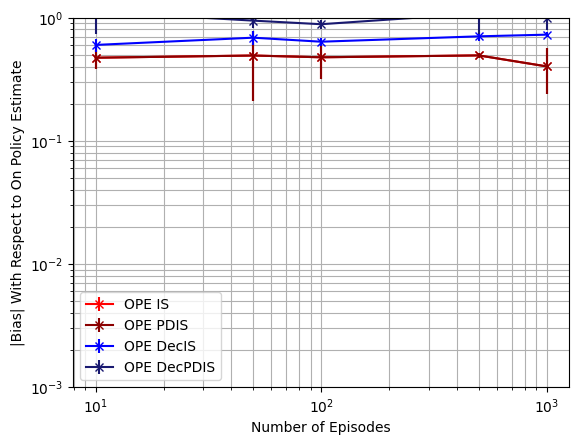

In [ ]:
label = 'bias'
plot_graphs(bias_means, bias_stds, label, 10**-3, 10**0, shorter_D, estimator='IS')

##### Plot Variance

On Policy-----[0.03282388 0.00683717 0.00240213 0.00045008 0.00027276]
OPE IS-----[0.23456    2.03642633 0.52670467 0.05770109 0.29753966]
OPE PDIS-----[0.23456    2.03642633 0.52670467 0.05770109 0.29753966]
OPE DecIS-----[0.10502209 0.17765399 0.06667303 0.09319547 0.12752272]
OPE DecPDIS-----[3.36955215 0.22633051 0.09541041 3.52145833 0.89910093]


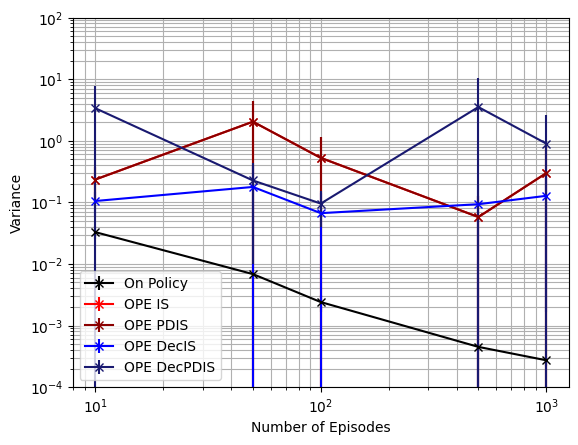

In [ ]:
label = 'var'
plot_graphs(var_means, var_stds, label, 10**(-4), 10**2, shorter_D, estimator='IS')

##### Plot MSE

On Policy-----[0.03282388 0.00683717 0.00240213 0.00045008 0.00027276]
OPE IS-----[0.46568097 2.35730646 0.77741326 0.30087652 0.48438386]
OPE PDIS-----[0.46568097 2.35730646 0.77741326 0.30087652 0.48438386]
OPE DecIS-----[0.46943064 0.65559107 0.47414433 0.5910227  0.65588146]
OPE DecPDIS-----[4.76570262 1.12980575 0.87927392 4.80939266 1.91472605]


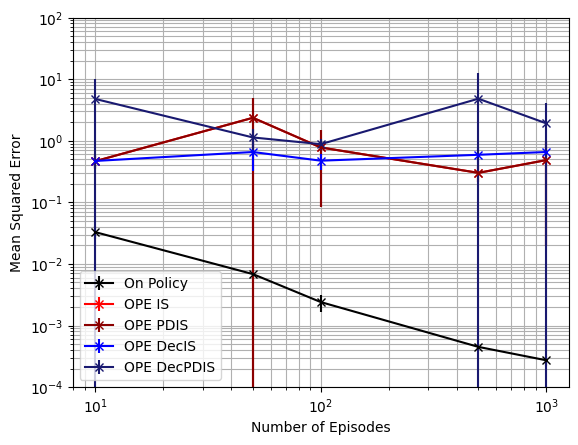

In [ ]:
label = 'MSE'
plot_graphs(MSE_means, MSE_stds, label, 10**(-4), 10**2, shorter_D, estimator='IS')

##### Plot ESS

On Policy-----[  10.   50.  100.  500. 1000.]
OPE IS-----[ 2.16641076  3.06481662  4.95087    22.3923408  52.41776778]
OPE PDIS-----[ 2.16641076  3.06481662  4.95087    22.3923408  52.41776778]
OPE DecIS-----[3.72208969 7.60640421 7.33677457 5.94716225 4.86358556]
OPE DecPDIS-----[1.96344961 3.04045188 3.99846189 4.1745804  4.71028335]


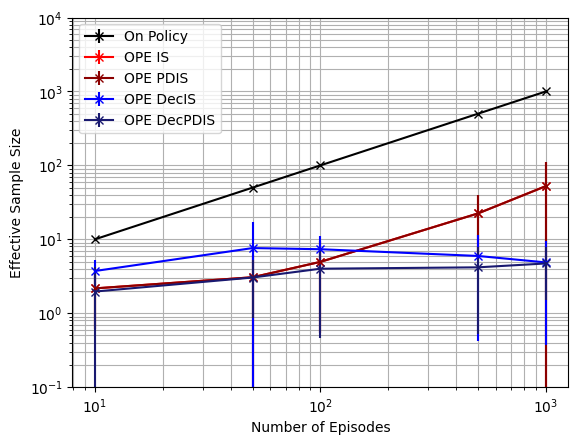

In [ ]:
label = 'ESS'
plot_graphs(ESS_means, ESS_stds, label, 10**(-1), 10**4, shorter_D, estimator='IS')

### Varying Episodes $\epsilon_{e} = 0.2$ (Policy Divergence $6.4^{20}$)

Set up evaluation policy, generate data and convert into factored format

In [ ]:
EVAL_EPSILON = 0.2

evalPolSoft = np.copy(fullPol)
evalPolSoft[evalPolSoft == 1] = 1 - EVAL_EPSILON
evalPolSoft[evalPolSoft == 0] = EVAL_EPSILON / (n_actions - 1)

In [ ]:
# Calculate policy divergence from Voloshin et al.
D = 0
for state in range(randPol.shape[0] - 1):
    for action in range(randPol.shape[1] - 1):
        difference = evalPolSoft[state, action]/randPol[state, action]
        D = max(D, difference)
print(D)
shorter_D = round(D,2)

6.4


In [ ]:
dgen = DataGenerator()
states, actions, lengths, rewards, diab, emp_tx_totals, emp_r_totals = dgen.simulate(
    NSIMSAMPS, NSTEPS, policy=evalPolSoft, policy_idx_type='full',
    p_diabetes=PROB_DIAB, use_tqdm=False) #True, tqdm_desc='Behaviour Policy Simulation')

obs_samps = utils.format_dgen_samps(
    states, actions, rewards, diab, NSTEPS, NSIMSAMPS)

In [ ]:
time = np.arange(NSTEPS)
times = np.stack(axis=0, arrays=[time]*NSIMSAMPS)
times = times[..., np.newaxis]

nf_tr_e = np.concatenate((times, states[:, 0:NSTEPS, :], actions, rewards, states[:, 1:, :]), axis=2)
nf_tr_e.shape

(100000, 20, 5)

In [ ]:
f_tr_e = factorise_dataset(nf_tr_e)

In [ ]:
factored_evalPolSoft = factor_policy(evalPolSoft)

In [ ]:
evalPolSoft = pad_policy(evalPolSoft)

factored_evalPolSoft[0] = pad_policy(factored_evalPolSoft[0])
factored_evalPolSoft[1] = pad_policy(factored_evalPolSoft[1])
factored_evalPolSoft[2] = pad_policy(factored_evalPolSoft[2])

In [ ]:
import policy_estimators as pe
import gc

def evaluate_PE(RUNS, EPISODES, SHORTER_D, STEPS=NSTEPS):

  biases = np.zeros((5, 7))
  variances = np.zeros((5, 7))
  MSEs = np.zeros((5, 7))
  ESSs = np.zeros((5, 7))

  # Reshape data for processing
  T, ldim = nf_tr_b.shape[-2], nf_tr_b.shape[-1]
  nfb = nf_tr_b.reshape((-1, RUNS, EPISODES, T, ldim))
  nfe = nf_tr_e.reshape((-1, RUNS, EPISODES, T, ldim))

  T, D, ldim = f_tr_b.shape[-3], f_tr_b.shape[-2], f_tr_b.shape[-1]
  fb = f_tr_b.reshape((-1, RUNS, EPISODES, T, D, ldim))
  fe = f_tr_e.reshape((-1, RUNS, EPISODES, T, D, ldim))

  for t in range(5):
    print()

    lower_index = 0
    estimates_on_policy = np.zeros(RUNS)
    estimates_OPE_IS = np.zeros(RUNS)
    estimates_OPE_PDIS = np.zeros(RUNS)
    estimates_OPE_PDWIS = np.zeros(RUNS)

    estimates_OPE_DecIS = np.zeros(RUNS)
    estimates_OPE_DecPDIS = np.zeros(RUNS)
    estimates_OPE_DecPDWIS = np.zeros(RUNS)

    for r in range(RUNS):
        #On policy Q estimate
        estimates_on_policy[r] = pe.on_policy_Q_estimate(nfe[t, r, :, :STEPS, :], DISCOUNT_Pol)
        #Off policy IS estimate
        estimates_OPE_IS[r] = pe.off_policy_IS_estimator(nfb[t, r, :, :STEPS, :], DISCOUNT_Pol, randPol, evalPolSoft)
        #Off policy PDIS estimate
        estimates_OPE_PDIS[r] = pe.off_policy_PDIS_estimator(nfb[t, r, :, :STEPS, :], DISCOUNT_Pol, randPol, evalPolSoft)
        #Off policy PDWIS estimate
        estimates_OPE_PDWIS[r] = pe.off_policy_PDWIS_estimator(nfb[t, r, :, :STEPS, :], DISCOUNT_Pol, randPol, evalPolSoft)

        #Factorisation 1----------------------------------

        #Off policy decomposed IS estimate
        estimates_OPE_DecIS[r], _ = pe.off_policy_DecIS_estimator(fb[t, r, :, :STEPS, :, :], DISCOUNT_Pol, [0,1], factored_randPol, factored_evalPolSoft)
        #Off policy decomposed PDIS estimate
        estimates_OPE_DecPDIS[r], _ = pe.off_policy_DecPDIS_estimator(fb[t, r, :, :STEPS, :, :], DISCOUNT_Pol, [0,1], factored_randPol, factored_evalPolSoft)
        #Off policy decomposed PDWIS estimate
        estimates_OPE_DecPDWIS[r], _ = pe.off_policy_DecPDWIS_estimator(fb[t, r, :, :STEPS, :, :], DISCOUNT_Pol, [0,1], factored_randPol, factored_evalPolSoft)


    mean_on_policy = np.mean(estimates_on_policy)
    var_on_policy = np.var(estimates_on_policy, ddof=0)
    print(f'Mean on policy Q estimate: {mean_on_policy}. Variance of on policy Q estimate: {var_on_policy}')

    from sklearn.metrics import mean_squared_error

    #For on policy
    biases[t, 0] = 0.0
    variances[t, 0] = var_on_policy
    MSEs[t, 0] = var_on_policy
    ESSs[t, 0] = EPISODES

    def generate_results(estimates, mean_true, label):
      MSE = mean_squared_error(estimates, [mean_true]*RUNS)
      mean = np.mean(estimates)
      var = np.var(estimates, ddof=0)
      bias1 = np.sqrt(MSE - var)
      bias2 = abs(mean - mean_true)
      print(f'Mean {label} estimate: {mean}. Bias1: {bias1}. Bias2: {bias2}. Variance: {var}. MSE: {MSE}')
      return bias1, var, MSE

    label_list = ['OPE IS', 'OPE PDIS', 'OPE PDWIS',
                  'OPE DecIS', 'OPE DecPDIS', 'OPE DecPDWIS'
                  ]

    estimates = [estimates_OPE_IS, estimates_OPE_PDIS, estimates_OPE_PDWIS,
                estimates_OPE_DecIS, estimates_OPE_DecPDIS, estimates_OPE_DecPDWIS
                ]


    for (id, val) in enumerate(label_list):
      biases[t, 1+id], variances[t, 1+id], MSEs[t, 1+id] = generate_results(estimates[id], mean_on_policy, label_list[id])
      ESSs[t, 1+id] = (EPISODES*variances[t, 0])/variances[t, 1+id]
      gc.collect()

  return np.mean(biases, axis=0), np.std(biases, axis=0), np.mean(variances, axis=0), np.std(variances, axis=0), np.mean(MSEs, axis=0), np.std(MSEs, axis=0), np.mean(ESSs, axis=0), np.std(ESSs, axis=0)

#### Run Everything

In [ ]:
EPISODES = [10, 50, 100, 500, 1000]

bias_means = np.zeros((len(EPISODES), 7))
bias_stds = np.zeros((len(EPISODES), 7))
var_means = np.zeros((len(EPISODES), 7))
var_stds = np.zeros((len(EPISODES), 7))
MSE_means = np.zeros((len(EPISODES), 7))
MSE_stds = np.zeros((len(EPISODES), 7))
ESS_means = np.zeros((len(EPISODES), 7))
ESS_stds = np.zeros((len(EPISODES), 7))

RUNS = 20

for id in range(len(EPISODES)):
  e = EPISODES[id]
  print(f'{e} Episodes, {RUNS} ----------------------------------')
  bias_means[id, :], bias_stds[id, :], var_means[id, :], var_stds[id, :], MSE_means[id, :], MSE_stds[id, :], ESS_means[id, :], ESS_stds[id, :] = evaluate_PE(RUNS=RUNS, EPISODES=e, SHORTER_D=shorter_D)
  print()
  gc.collect()

print('BIAS MEANS')
print(list(bias_means))
print('\nBIAS STDS')
print(list(bias_stds))
print('\nVAR MEANS')
print(list(var_means))
print('\nVAR STDS')
print(list(var_stds))
print('\nMSE MEANS')
print(list(MSE_means))
print('\nMSE STDS')
print(list(MSE_stds))
print('\nESS MEANS')
print(list(ESS_means))
print('\nESS STDS')
print(list(ESS_stds))

10 Episodes, 20 ----------------------------------

Mean on policy Q estimate: 0.2470877308887071. Variance of on policy Q estimate: 0.08480929378313162
Mean OPE IS estimate: 0.23507612142707854. Bias1: 0.012011609461630879. Bias2: 0.012011609461628575. Variance: 0.31111914099166216. MSE: 0.3112634197535209
Mean OPE PDIS estimate: 0.23507612142707854. Bias1: 0.012011609461630879. Bias2: 0.012011609461628575. Variance: 0.31111914099166216. MSE: 0.3112634197535209
Mean OPE PDWIS estimate: 0.005783638958291021. Bias1: 0.24130409193041608. Bias2: 0.2413040919304161. Variance: 0.000809663915014883. MSE: 0.05903732869737758
Mean OPE DecIS estimate: 0.1181161970623332. Bias1: 0.12897153382637394. Bias2: 0.1289715338263739. Variance: 0.08782299253185541. MSE: 0.10445664906938293
Mean OPE DecPDIS estimate: -0.004681316085935537. Bias1: 0.25176904697464264. Bias2: 0.25176904697464264. Variance: 0.038845767921134956. MSE: 0.10223342093565477
Mean OPE DecPDWIS estimate: -0.011070883454741097. Bias

#### Plot Graphs

##### Plot Bias

OPE IS-----[0.22539776 0.29716408 0.27139584 0.27328147 0.21134145]
OPE PDIS-----[0.22539776 0.29716408 0.27139584 0.27328147 0.21134145]
OPE PDWIS-----[0.31099836 0.30225376 0.31217131 0.31184766 0.30997135]
OPE DecIS-----[0.34487098 0.37303544 0.35210847 0.4403566  0.44590044]
OPE DecPDIS-----[0.74010505 0.60435782 0.57382682 0.71603002 0.65530626]
OPE DecPDWIS-----[0.33721555 0.3303046  0.33907336 0.33783849 0.3367313 ]


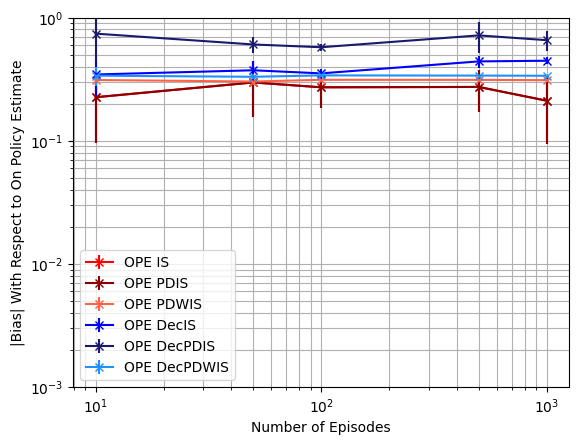

In [ ]:
label = 'bias'
plot_graphs(bias_means, bias_stds, label, 10**-3, 10**0, shorter_D, estimator='IS')

##### Plot Variance

On Policy-----[0.06633536 0.01162752 0.00757556 0.00101842 0.00057924]
OPE IS-----[0.19175271 0.7296316  0.19244548 0.27391249 0.13136538]
OPE PDIS-----[0.19175271 0.7296316  0.19244548 0.27391249 0.13136538]
OPE PDWIS-----[7.34585547e-04 5.18323876e-04 2.96130536e-04 1.38535933e-04
 9.41572136e-05]
OPE DecIS-----[0.09511131 0.16336892 0.05970734 0.05994117 0.05710384]
OPE DecPDIS-----[1.85533388 0.16755673 0.0715747  1.26042165 0.32001551]
OPE DecPDWIS-----[0.00104992 0.00041012 0.00024181 0.000186   0.00013308]


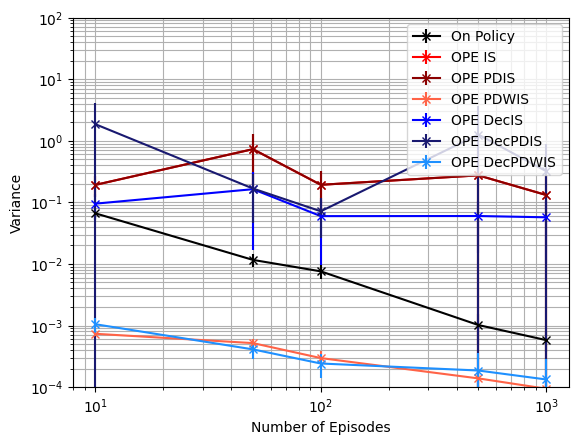

In [ ]:
label = 'var'
plot_graphs(var_means, var_stds, label, 10**(-4), 10**2, shorter_D, estimator='IS')

##### Plot MSE

On Policy-----[0.06633536 0.01162752 0.00757556 0.00101842 0.00057924]
OPE IS-----[0.25914083 0.83805373 0.27385712 0.35890311 0.18983024]
OPE PDIS-----[0.25914083 0.83805373 0.27385712 0.35890311 0.18983024]
OPE PDWIS-----[0.1007148  0.09221285 0.09795035 0.09741297 0.0962018 ]
OPE DecIS-----[0.22687538 0.30805509 0.18478059 0.25630892 0.25673559]
OPE DecPDIS-----[2.50062512 0.54055987 0.4022306  1.81384204 0.76508251]
OPE DecPDWIS-----[0.11798231 0.10972724 0.11536457 0.11435332 0.11356794]


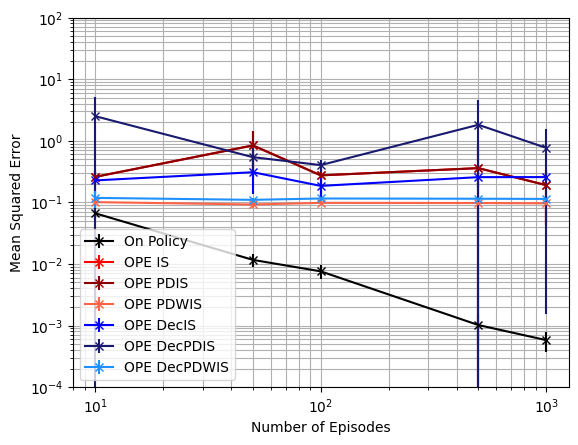

In [ ]:
label = 'MSE'
plot_graphs(MSE_means, MSE_stds, label, 10**(-4), 10**2, shorter_D, estimator='IS')

##### Plot ESS

On Policy-----[  10.   50.  100.  500. 1000.]
OPE IS-----[ 3.87089722  3.04631927 11.1907165  10.3423824  26.46555063]
OPE PDIS-----[ 3.87089722  3.04631927 11.1907165  10.3423824  26.46555063]
OPE PDWIS-----[ 930.78406503 1161.27248785 2904.4567918  4513.29920189 7484.74406586]
OPE DecIS-----[ 8.52460426 11.51452417 30.17004172 27.12473125 14.63586053]
OPE DecPDIS-----[ 6.68239653  6.30956165 17.2207408  15.78510295 24.49229633]
OPE DecPDWIS-----[  739.18648764  1484.6746023   3624.52204296  5799.15470866
 10345.65483864]


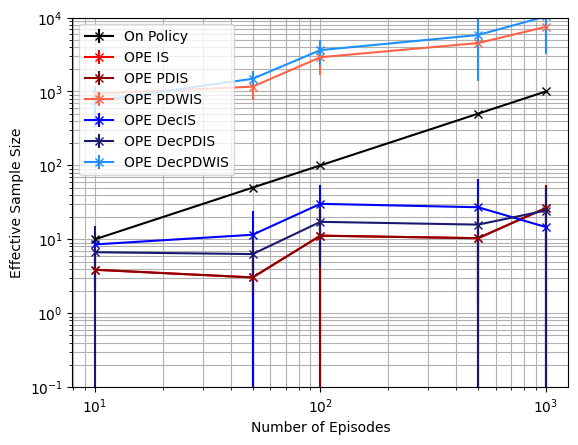

In [ ]:
label = 'ESS'
plot_graphs(ESS_means, ESS_stds, label, 10**(-1), 10**4, shorter_D, estimator='IS')

### Varying Episodes $\epsilon_{e} = 0.4$ (Policy Divergence $4.8^{20}$)

Set up evaluation policy, generate data and convert into factored format

In [ ]:
EVAL_EPSILON = 0.4

evalPolSoft = np.copy(fullPol)
evalPolSoft[evalPolSoft == 1] = 1 - EVAL_EPSILON
evalPolSoft[evalPolSoft == 0] = EVAL_EPSILON / (n_actions - 1)

In [ ]:
# Calculate policy divergence from Voloshin et al.
D = 0
for state in range(randPol.shape[0] - 1):
    for action in range(randPol.shape[1] - 1):
        difference = evalPolSoft[state, action]/randPol[state, action]
        D = max(D, difference)
print(D)
shorter_D = round(D,2)

4.8


In [ ]:
dgen = DataGenerator()
states, actions, lengths, rewards, diab, emp_tx_totals, emp_r_totals = dgen.simulate(
    NSIMSAMPS, NSTEPS, policy=evalPolSoft, policy_idx_type='full',
    p_diabetes=PROB_DIAB, use_tqdm=False) #True, tqdm_desc='Behaviour Policy Simulation')

obs_samps = utils.format_dgen_samps(
    states, actions, rewards, diab, NSTEPS, NSIMSAMPS)

In [ ]:
time = np.arange(NSTEPS)
times = np.stack(axis=0, arrays=[time]*NSIMSAMPS)
times = times[..., np.newaxis]

nf_tr_e = np.concatenate((times, states[:, 0:NSTEPS, :], actions, rewards, states[:, 1:, :]), axis=2)
nf_tr_e.shape

(100000, 20, 5)

In [ ]:
f_tr_e = factorise_dataset(nf_tr_e)

In [ ]:
factored_evalPolSoft = factor_policy(evalPolSoft)

In [ ]:
evalPolSoft = pad_policy(evalPolSoft)

factored_evalPolSoft[0] = pad_policy(factored_evalPolSoft[0])
factored_evalPolSoft[1] = pad_policy(factored_evalPolSoft[1])
factored_evalPolSoft[2] = pad_policy(factored_evalPolSoft[2])

In [ ]:
import policy_estimators as pe
import gc

def evaluate_PE(RUNS, EPISODES, SHORTER_D, STEPS=NSTEPS):

  biases = np.zeros((5, 7))
  variances = np.zeros((5, 7))
  MSEs = np.zeros((5, 7))
  ESSs = np.zeros((5, 7))

  # Reshape data for processing
  T, ldim = nf_tr_b.shape[-2], nf_tr_b.shape[-1]
  nfb = nf_tr_b.reshape((-1, RUNS, EPISODES, T, ldim))
  nfe = nf_tr_e.reshape((-1, RUNS, EPISODES, T, ldim))

  T, D, ldim = f_tr_b.shape[-3], f_tr_b.shape[-2], f_tr_b.shape[-1]
  fb = f_tr_b.reshape((-1, RUNS, EPISODES, T, D, ldim))
  fe = f_tr_e.reshape((-1, RUNS, EPISODES, T, D, ldim))

  for t in range(5):
    print()

    lower_index = 0
    estimates_on_policy = np.zeros(RUNS)
    estimates_OPE_IS = np.zeros(RUNS)
    estimates_OPE_PDIS = np.zeros(RUNS)
    estimates_OPE_PDWIS = np.zeros(RUNS)

    estimates_OPE_DecIS = np.zeros(RUNS)
    estimates_OPE_DecPDIS = np.zeros(RUNS)
    estimates_OPE_DecPDWIS = np.zeros(RUNS)

    for r in range(RUNS):
        #On policy Q estimate
        estimates_on_policy[r] = pe.on_policy_Q_estimate(nfe[t, r, :, :STEPS, :], DISCOUNT_Pol)
        #Off policy IS estimate
        estimates_OPE_IS[r] = pe.off_policy_IS_estimator(nfb[t, r, :, :STEPS, :], DISCOUNT_Pol, randPol, evalPolSoft)
        #Off policy PDIS estimate
        estimates_OPE_PDIS[r] = pe.off_policy_PDIS_estimator(nfb[t, r, :, :STEPS, :], DISCOUNT_Pol, randPol, evalPolSoft)
        #Off policy PDWIS estimate
        estimates_OPE_PDWIS[r] = pe.off_policy_PDWIS_estimator(nfb[t, r, :, :STEPS, :], DISCOUNT_Pol, randPol, evalPolSoft)

        #Factorisation 1----------------------------------

        #Off policy decomposed IS estimate
        estimates_OPE_DecIS[r], _ = pe.off_policy_DecIS_estimator(fb[t, r, :, :STEPS, :, :], DISCOUNT_Pol, [0,1], factored_randPol, factored_evalPolSoft)
        #Off policy decomposed PDIS estimate
        estimates_OPE_DecPDIS[r], _ = pe.off_policy_DecPDIS_estimator(fb[t, r, :, :STEPS, :, :], DISCOUNT_Pol, [0,1], factored_randPol, factored_evalPolSoft)
        #Off policy decomposed PDWIS estimate
        estimates_OPE_DecPDWIS[r], _ = pe.off_policy_DecPDWIS_estimator(fb[t, r, :, :STEPS, :, :], DISCOUNT_Pol, [0,1], factored_randPol, factored_evalPolSoft)


    mean_on_policy = np.mean(estimates_on_policy)
    var_on_policy = np.var(estimates_on_policy, ddof=0)
    print(f'Mean on policy Q estimate: {mean_on_policy}. Variance of on policy Q estimate: {var_on_policy}')

    from sklearn.metrics import mean_squared_error

    #For on policy
    biases[t, 0] = 0.0
    variances[t, 0] = var_on_policy
    MSEs[t, 0] = var_on_policy
    ESSs[t, 0] = EPISODES

    def generate_results(estimates, mean_true, label):
      MSE = mean_squared_error(estimates, [mean_true]*RUNS)
      mean = np.mean(estimates)
      var = np.var(estimates, ddof=0)
      bias1 = np.sqrt(MSE - var)
      bias2 = abs(mean - mean_true)
      print(f'Mean {label} estimate: {mean}. Bias1: {bias1}. Bias2: {bias2}. Variance: {var}. MSE: {MSE}')
      return bias1, var, MSE

    label_list = ['OPE IS', 'OPE PDIS', 'OPE PDWIS',
                  'OPE DecIS', 'OPE DecPDIS', 'OPE DecPDWIS'
                  ]

    estimates = [estimates_OPE_IS, estimates_OPE_PDIS, estimates_OPE_PDWIS,
                estimates_OPE_DecIS, estimates_OPE_DecPDIS, estimates_OPE_DecPDWIS
                ]


    for (id, val) in enumerate(label_list):
      biases[t, 1+id], variances[t, 1+id], MSEs[t, 1+id] = generate_results(estimates[id], mean_on_policy, label_list[id])
      ESSs[t, 1+id] = (EPISODES*variances[t, 0])/variances[t, 1+id]
      gc.collect()

  return np.mean(biases, axis=0), np.std(biases, axis=0), np.mean(variances, axis=0), np.std(variances, axis=0), np.mean(MSEs, axis=0), np.std(MSEs, axis=0), np.mean(ESSs, axis=0), np.std(ESSs, axis=0)

#### Run Everything

In [ ]:
EPISODES = [10, 50, 100, 500, 1000]

bias_means = np.zeros((len(EPISODES), 7))
bias_stds = np.zeros((len(EPISODES), 7))
var_means = np.zeros((len(EPISODES), 7))
var_stds = np.zeros((len(EPISODES), 7))
MSE_means = np.zeros((len(EPISODES), 7))
MSE_stds = np.zeros((len(EPISODES), 7))
ESS_means = np.zeros((len(EPISODES), 7))
ESS_stds = np.zeros((len(EPISODES), 7))

RUNS = 20

for id in range(len(EPISODES)):
  e = EPISODES[id]
  print(f'{e} Episodes, {RUNS} ----------------------------------')
  bias_means[id, :], bias_stds[id, :], var_means[id, :], var_stds[id, :], MSE_means[id, :], MSE_stds[id, :], ESS_means[id, :], ESS_stds[id, :] = evaluate_PE(RUNS=RUNS, EPISODES=e, SHORTER_D=shorter_D)
  print()
  gc.collect()

print('BIAS MEANS')
print(list(bias_means))
print('\nBIAS STDS')
print(list(bias_stds))
print('\nVAR MEANS')
print(list(var_means))
print('\nVAR STDS')
print(list(var_stds))
print('\nMSE MEANS')
print(list(MSE_means))
print('\nMSE STDS')
print(list(MSE_stds))
print('\nESS MEANS')
print(list(ESS_means))
print('\nESS STDS')
print(list(ESS_stds))

10 Episodes, 20 ----------------------------------

Mean on policy Q estimate: 0.08740458879462568. Variance of on policy Q estimate: 0.06270172214731215
Mean OPE IS estimate: 0.10403902957247273. Bias1: 0.016634440777844924. Bias2: 0.01663444077784705. Variance: 0.1897041308525827. MSE: 0.18998083547257433
Mean OPE PDIS estimate: 0.10403902957247273. Bias1: 0.016634440777844924. Bias2: 0.01663444077784705. Variance: 0.1897041308525827. MSE: 0.18998083547257433
Mean OPE PDWIS estimate: -0.0016626238962089072. Bias1: 0.08906721269083459. Bias2: 0.08906721269083458. Variance: 0.0006600808948596682. MSE: 0.008593049271374033
Mean OPE DecIS estimate: 0.02414487741804936. Bias1: 0.06325971137657632. Bias2: 0.06325971137657632. Variance: 0.07296414256133368. MSE: 0.07696593364478142
Mean OPE DecPDIS estimate: -0.0633769264897204. Bias1: 0.15078151528434608. Bias2: 0.15078151528434608. Variance: 0.03406819057748581. MSE: 0.0568032559289293
Mean OPE DecPDWIS estimate: -0.011271514660584916. Bi

#### Plot Graphs

##### Plot Bias

OPE IS-----[0.04483645 0.16264689 0.0997494  0.09090596 0.08544652]
OPE PDIS-----[0.04483645 0.16264689 0.0997494  0.09090596 0.08544652]
OPE PDWIS-----[0.04972347 0.02856038 0.03561124 0.02462171 0.02258253]
OPE DecIS-----[0.12699286 0.11826568 0.07317024 0.1684339  0.16622934]
OPE DecPDIS-----[0.38282199 0.2832751  0.2503911  0.34754421 0.31784265]
OPE DecPDWIS-----[0.0473625  0.02264168 0.0223227  0.01114565 0.00871297]


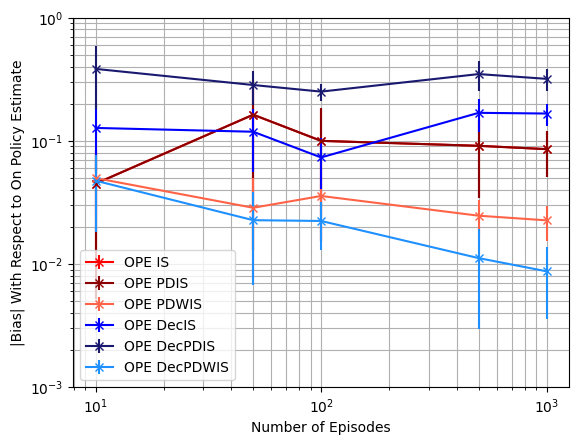

In [ ]:
label = 'bias'
plot_graphs(bias_means, bias_stds, label, 10**-3, 10**0, shorter_D, estimator='IS')

##### Plot Variance

On Policy-----[0.07407753 0.01062477 0.00519445 0.00118854 0.00053334]
OPE IS-----[0.19022099 1.1376051  0.30017028 0.11359841 0.04531955]
OPE PDIS-----[0.19022099 1.1376051  0.30017028 0.11359841 0.04531955]
OPE PDWIS-----[6.09749133e-04 3.07991823e-04 1.85522515e-04 1.08057617e-04
 7.73542252e-05]
OPE DecIS-----[0.14653712 0.14094333 0.05078748 0.04159473 0.02041695]
OPE DecPDIS-----[0.74137508 0.1121868  0.04818858 0.25928876 0.06543359]
OPE DecPDWIS-----[4.53446109e-04 1.87488725e-04 1.13249961e-04 8.95350250e-05
 5.61111386e-05]


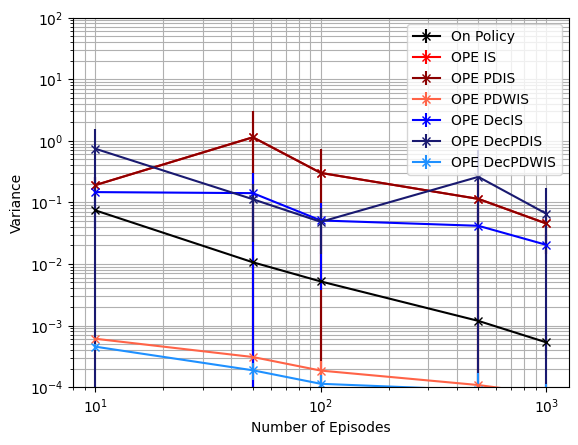

In [ ]:
label = 'var'
plot_graphs(var_means, var_stds, label, 10**(-4), 10**2, shorter_D, estimator='IS')

##### Plot MSE

On Policy-----[0.07407753 0.01062477 0.00519445 0.00118854 0.00053334]
OPE IS-----[0.19379981 1.1864479  0.3172679  0.12506582 0.05383055]
OPE PDIS-----[0.19379981 1.1864479  0.3172679  0.12506582 0.05383055]
OPE PDWIS-----[0.00378624 0.0015681  0.00153302 0.00078409 0.00063859]
OPE DecIS-----[0.16773766 0.15882832 0.05720938 0.07246389 0.04916947]
OPE DecPDIS-----[0.92885153 0.20017944 0.11249964 0.38875257 0.17041506]
OPE DecPDWIS-----[0.00354738 0.00095447 0.00070016 0.00028101 0.00015831]


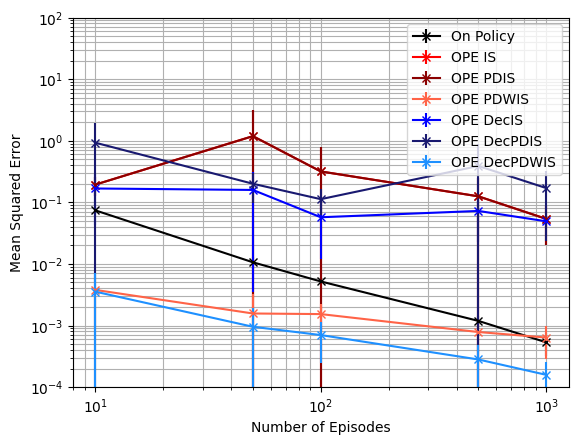

In [ ]:
label = 'MSE'
plot_graphs(MSE_means, MSE_stds, label, 10**(-4), 10**2, shorter_D, estimator='IS')

##### Plot ESS

On Policy-----[  10.   50.  100.  500. 1000.]
OPE IS-----[ 4.39271107  4.97041601  7.64660189  9.88732535 24.03773551]
OPE PDIS-----[ 4.39271107  4.97041601  7.64660189  9.88732535 24.03773551]
OPE PDWIS-----[1277.50278817 1909.48315241 3352.24342442 5597.49832929 9030.76711125]
OPE DecIS-----[ 8.8130241  11.07827224 22.70825364 30.74254495 31.40344492]
OPE DecPDIS-----[ 6.33941958  8.80382893 17.86808935 20.30375801 35.95128428]
OPE DecPDWIS-----[ 1645.93723246  3010.18501339  5395.00389687 12376.82597659
 15146.70218983]


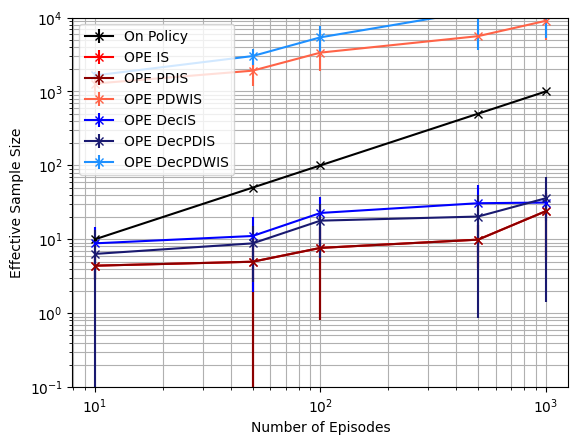

In [ ]:
label = 'ESS'
plot_graphs(ESS_means, ESS_stds, label, 10**(-1), 10**4, shorter_D, estimator='IS')

### Varying Episodes $\epsilon_{e} = 0.6$ (Policy Divergence $3.2^{20}$)

Set up evaluation policy, generate data and convert into factored format

In [ ]:
import gc

gc.collect()
EVAL_EPSILON = 0.6

evalPolSoft = np.copy(fullPol)
evalPolSoft[evalPolSoft == 1] = 1 - EVAL_EPSILON
evalPolSoft[evalPolSoft == 0] = EVAL_EPSILON / (n_actions - 1)

In [ ]:
# Calculate policy divergence from Voloshin et al.
D = 0
for state in range(randPol.shape[0] - 1):
    for action in range(randPol.shape[1] - 1):
        difference = evalPolSoft[state, action]/randPol[state, action]
        D = max(D, difference)
print(D)
shorter_D = round(D,2)

3.2


In [ ]:
dgen = DataGenerator()
states, actions, lengths, rewards, diab, emp_tx_totals, emp_r_totals = dgen.simulate(
    NSIMSAMPS, NSTEPS, policy=evalPolSoft, policy_idx_type='full',
    p_diabetes=PROB_DIAB, use_tqdm=False) #True, tqdm_desc='Behaviour Policy Simulation')

obs_samps = utils.format_dgen_samps(
    states, actions, rewards, diab, NSTEPS, NSIMSAMPS)

In [ ]:
time = np.arange(NSTEPS)
times = np.stack(axis=0, arrays=[time]*NSIMSAMPS)
times = times[..., np.newaxis]

nf_tr_e = np.concatenate((times, states[:, 0:NSTEPS, :], actions, rewards, states[:, 1:, :]), axis=2)
nf_tr_e.shape

(100000, 20, 5)

In [ ]:
f_tr_e = factorise_dataset(nf_tr_e)

In [ ]:
factored_evalPolSoft = factor_policy(evalPolSoft)

In [ ]:
evalPolSoft = pad_policy(evalPolSoft)

factored_evalPolSoft[0] = pad_policy(factored_evalPolSoft[0])
factored_evalPolSoft[1] = pad_policy(factored_evalPolSoft[1])
factored_evalPolSoft[2] = pad_policy(factored_evalPolSoft[2])

In [ ]:
import policy_estimators as pe
import gc

def evaluate_PE(RUNS, EPISODES, SHORTER_D, STEPS=NSTEPS):

  biases = np.zeros((5, 7))
  variances = np.zeros((5, 7))
  MSEs = np.zeros((5, 7))
  ESSs = np.zeros((5, 7))

  # Reshape data for processing
  T, ldim = nf_tr_b.shape[-2], nf_tr_b.shape[-1]
  nfb = nf_tr_b.reshape((-1, RUNS, EPISODES, T, ldim))
  nfe = nf_tr_e.reshape((-1, RUNS, EPISODES, T, ldim))

  T, D, ldim = f_tr_b.shape[-3], f_tr_b.shape[-2], f_tr_b.shape[-1]
  fb = f_tr_b.reshape((-1, RUNS, EPISODES, T, D, ldim))
  fe = f_tr_e.reshape((-1, RUNS, EPISODES, T, D, ldim))

  for t in range(5):
    print()

    lower_index = 0
    estimates_on_policy = np.zeros(RUNS)
    estimates_OPE_IS = np.zeros(RUNS)
    estimates_OPE_PDIS = np.zeros(RUNS)
    estimates_OPE_PDWIS = np.zeros(RUNS)

    estimates_OPE_DecIS = np.zeros(RUNS)
    estimates_OPE_DecPDIS = np.zeros(RUNS)
    estimates_OPE_DecPDWIS = np.zeros(RUNS)

    for r in range(RUNS):
        #On policy Q estimate
        estimates_on_policy[r] = pe.on_policy_Q_estimate(nfe[t, r, :, :STEPS, :], DISCOUNT_Pol)
        #Off policy IS estimate
        estimates_OPE_IS[r] = pe.off_policy_IS_estimator(nfb[t, r, :, :STEPS, :], DISCOUNT_Pol, randPol, evalPolSoft)
        #Off policy PDIS estimate
        estimates_OPE_PDIS[r] = pe.off_policy_PDIS_estimator(nfb[t, r, :, :STEPS, :], DISCOUNT_Pol, randPol, evalPolSoft)
        #Off policy PDWIS estimate
        estimates_OPE_PDWIS[r] = pe.off_policy_PDWIS_estimator(nfb[t, r, :, :STEPS, :], DISCOUNT_Pol, randPol, evalPolSoft)

        #Factorisation 1----------------------------------

        #Off policy decomposed IS estimate
        estimates_OPE_DecIS[r], _ = pe.off_policy_DecIS_estimator(fb[t, r, :, :STEPS, :, :], DISCOUNT_Pol, [0,1], factored_randPol, factored_evalPolSoft)
        #Off policy decomposed PDIS estimate
        estimates_OPE_DecPDIS[r], _ = pe.off_policy_DecPDIS_estimator(fb[t, r, :, :STEPS, :, :], DISCOUNT_Pol, [0,1], factored_randPol, factored_evalPolSoft)
        #Off policy decomposed PDWIS estimate
        estimates_OPE_DecPDWIS[r], _ = pe.off_policy_DecPDWIS_estimator(fb[t, r, :, :STEPS, :, :], DISCOUNT_Pol, [0,1], factored_randPol, factored_evalPolSoft)


    mean_on_policy = np.mean(estimates_on_policy)
    var_on_policy = np.var(estimates_on_policy, ddof=0)
    print(f'Mean on policy Q estimate: {mean_on_policy}. Variance of on policy Q estimate: {var_on_policy}')

    from sklearn.metrics import mean_squared_error

    #For on policy
    biases[t, 0] = 0.0
    variances[t, 0] = var_on_policy
    MSEs[t, 0] = var_on_policy
    ESSs[t, 0] = EPISODES

    def generate_results(estimates, mean_true, label):
      MSE = mean_squared_error(estimates, [mean_true]*RUNS)
      mean = np.mean(estimates)
      var = np.var(estimates, ddof=0)
      bias1 = np.sqrt(MSE - var)
      bias2 = abs(mean - mean_true)
      print(f'Mean {label} estimate: {mean}. Bias1: {bias1}. Bias2: {bias2}. Variance: {var}. MSE: {MSE}')
      return bias1, var, MSE

    label_list = ['OPE IS', 'OPE PDIS', 'OPE PDWIS',
                  'OPE DecIS', 'OPE DecPDIS', 'OPE DecPDWIS'
                  ]

    estimates = [estimates_OPE_IS, estimates_OPE_PDIS, estimates_OPE_PDWIS,
                estimates_OPE_DecIS, estimates_OPE_DecPDIS, estimates_OPE_DecPDWIS
                ]


    for (id, val) in enumerate(label_list):
      biases[t, 1+id], variances[t, 1+id], MSEs[t, 1+id] = generate_results(estimates[id], mean_on_policy, label_list[id])
      ESSs[t, 1+id] = (EPISODES*variances[t, 0])/variances[t, 1+id]
      gc.collect()

  return np.mean(biases, axis=0), np.std(biases, axis=0), np.mean(variances, axis=0), np.std(variances, axis=0), np.mean(MSEs, axis=0), np.std(MSEs, axis=0), np.mean(ESSs, axis=0), np.std(ESSs, axis=0)

#### Run Everything

In [ ]:
EPISODES = [10, 50, 100, 500, 1000]

bias_means = np.zeros((len(EPISODES), 7))
bias_stds = np.zeros((len(EPISODES), 7))
var_means = np.zeros((len(EPISODES), 7))
var_stds = np.zeros((len(EPISODES), 7))
MSE_means = np.zeros((len(EPISODES), 7))
MSE_stds = np.zeros((len(EPISODES), 7))
ESS_means = np.zeros((len(EPISODES), 7))
ESS_stds = np.zeros((len(EPISODES), 7))

RUNS = 20

for id in range(len(EPISODES)):
  e = EPISODES[id]
  print(f'{e} Episodes, {RUNS} ----------------------------------')
  bias_means[id, :], bias_stds[id, :], var_means[id, :], var_stds[id, :], MSE_means[id, :], MSE_stds[id, :], ESS_means[id, :], ESS_stds[id, :] = evaluate_PE(RUNS=RUNS, EPISODES=e, SHORTER_D=shorter_D)
  print()
  gc.collect()

print('BIAS MEANS')
print(list(bias_means))
print('\nBIAS STDS')
print(list(bias_stds))
print('\nVAR MEANS')
print(list(var_means))
print('\nVAR STDS')
print(list(var_stds))
print('\nMSE MEANS')
print(list(MSE_means))
print('\nMSE STDS')
print(list(MSE_stds))
print('\nESS MEANS')
print(list(ESS_means))
print('\nESS STDS')
print(list(ESS_stds))

10 Episodes, 20 ----------------------------------

Mean on policy Q estimate: -0.2936646484819521. Variance of on policy Q estimate: 0.06830505561868637
Mean OPE IS estimate: -0.13134839606174087. Bias1: 0.16231625242021125. Bias2: 0.16231625242021125. Variance: 0.11298458099283204. MSE: 0.13933114679257377
Mean OPE PDIS estimate: -0.13134839606174087. Bias1: 0.16231625242021125. Bias2: 0.16231625242021125. Variance: 0.11298458099283204. MSE: 0.13933114679257377
Mean OPE PDWIS estimate: -0.012567226467058965. Bias1: 0.28109742201489313. Bias2: 0.28109742201489313. Variance: 0.00040956511683886733. MSE: 0.07942532578025781
Mean OPE DecIS estimate: -0.11071252179933608. Bias1: 0.182952126682616. Bias2: 0.18295212668261604. Variance: 0.08281334218133339. MSE: 0.11628482283902537
Mean OPE DecPDIS estimate: -0.16226562130655348. Bias1: 0.13139902717539864. Bias2: 0.13139902717539864. Variance: 0.0403363295027192. MSE: 0.05760203384536035
Mean OPE DecPDWIS estimate: -0.013188504847329502. B

#### Plot Graphs

##### Plot Bias

OPE IS-----[0.08529166 0.07581599 0.0290782  0.02482198 0.02328163]
OPE PDIS-----[0.08529166 0.07581599 0.0290782  0.02482198 0.02328163]
OPE PDWIS-----[0.32959585 0.34331169 0.34083403 0.33924882 0.34216908]
OPE DecIS-----[0.07626132 0.10171596 0.11303998 0.06685645 0.07546024]
OPE DecPDIS-----[0.11108201 0.0260838  0.03820431 0.02950294 0.0198256 ]
OPE DecPDWIS-----[0.32710276 0.3421672  0.34023075 0.33848599 0.34136755]


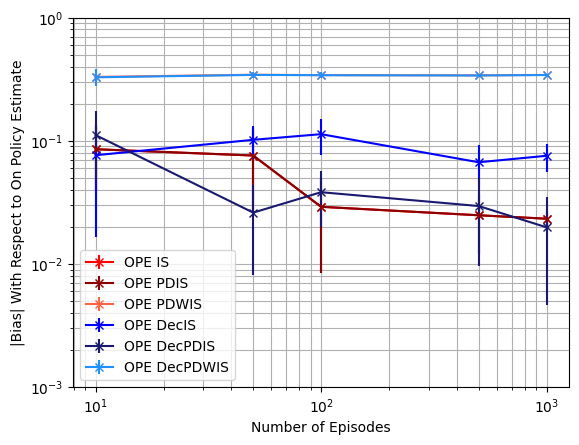

In [ ]:
label = 'bias'
plot_graphs(bias_means, bias_stds, label, 10**(-3), 10**0, shorter_D, estimator='IS')

##### Plot Variance

On Policy-----[0.05646635 0.01161479 0.00516523 0.00095941 0.00058732]
OPE IS-----[0.1636671  0.25453843 0.08103853 0.03120281 0.01535543]
OPE PDIS-----[0.1636671  0.25453843 0.08103853 0.03120281 0.01535543]
OPE PDWIS-----[3.85366619e-04 1.40735731e-04 8.81698716e-05 4.68343017e-05
 2.86575562e-05]
OPE DecIS-----[0.16087359 0.05640796 0.02217943 0.01227678 0.00402404]
OPE DecPDIS-----[0.18587419 0.04609038 0.0189206  0.02006328 0.00535389]
OPE DecPDWIS-----[1.82823624e-04 6.66959819e-05 3.85236909e-05 2.21036228e-05
 9.58275246e-06]


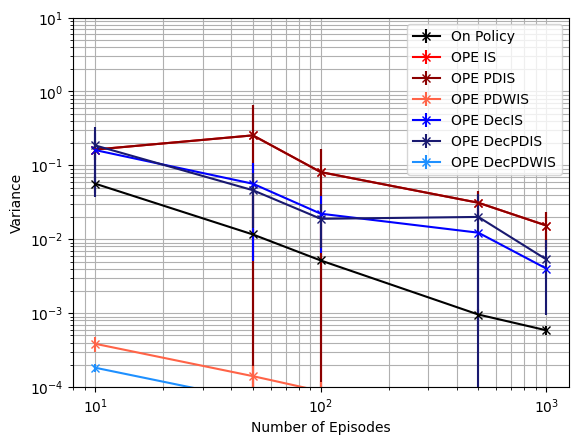

In [ ]:
label = 'var'
plot_graphs(var_means, var_stds, label, 10**(-4), 10**1, shorter_D, estimator='IS')

##### Plot MSE

On Policy-----[0.05646635 0.01161479 0.00516523 0.00095941 0.00058732]
OPE IS-----[0.17305771 0.26269367 0.08230702 0.03198473 0.01591225]
OPE PDIS-----[0.17305771 0.26269367 0.08230702 0.03198473 0.01591225]
OPE PDWIS-----[0.11180428 0.11834471 0.11655165 0.11517369 0.11714024]
OPE DecIS-----[0.17025843 0.06770856 0.03629303 0.0173601  0.01009526]
OPE DecPDIS-----[0.20230868 0.04709178 0.02070999 0.02132926 0.0059774 ]
OPE DecPDWIS-----[0.1098289  0.11743859 0.11613809 0.11463098 0.11656841]


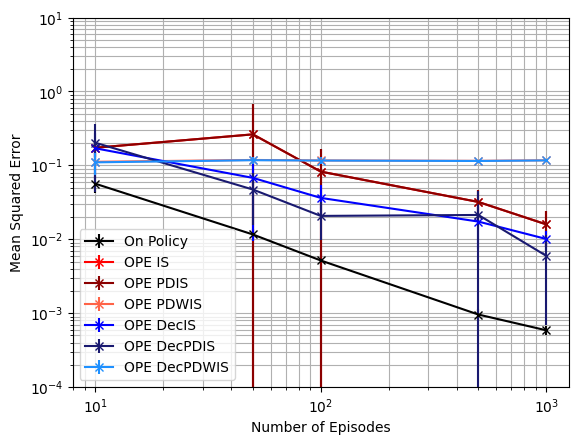

In [ ]:
label = 'MSE'
plot_graphs(MSE_means, MSE_stds, label, 10**(-4), 10**1, shorter_D, estimator='IS')

##### Plot ESS

On Policy-----[  10.   50.  100.  500. 1000.]
OPE IS-----[ 3.69793601  9.57009013 20.03285243 21.45293245 50.09232462]
OPE PDIS-----[ 3.69793601  9.57009013 20.03285243 21.45293245 50.09232462]
OPE PDWIS-----[ 1546.0977101   4666.02269153  6890.78487155 12491.49411265
 29179.95706209]
OPE DecIS-----[  7.27838906  17.29189557  33.43587373  76.03654457 156.25306417]
OPE DecPDIS-----[  6.57543743  18.90787219  40.22210373  58.56544093 172.62808627]
OPE DecPDWIS-----[ 3127.71576485 10121.14924704 17209.74889258 36055.38209678
 78254.66991926]


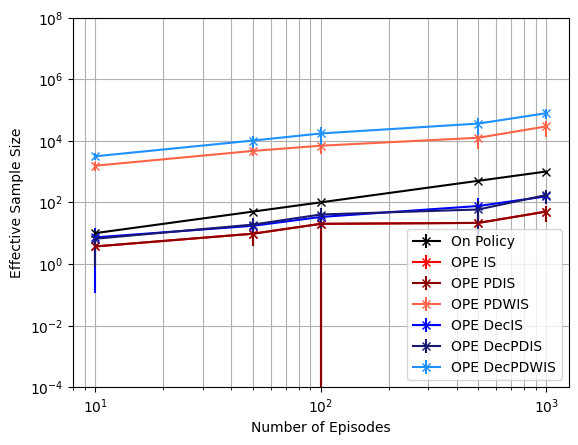

In [ ]:
label = 'ESS'
plot_graphs(ESS_means, ESS_stds, label, 10**(-4), 10**8, shorter_D, estimator='IS')

### Varying Episodes $\epsilon_{e} = 0.8$ (Policy Divergence $1.6^{20}$)



Set up evaluation policy, generate data and convert into factored format

In [ ]:
import gc
gc.collect()
EVAL_EPSILON = 0.8

evalPolSoft = np.copy(fullPol)
evalPolSoft[evalPolSoft == 1] = 1 - EVAL_EPSILON
evalPolSoft[evalPolSoft == 0] = EVAL_EPSILON / (n_actions - 1)

In [ ]:
# Calculate policy divergence from Voloshin et al.
D = 0
for state in range(randPol.shape[0] - 1):
    for action in range(randPol.shape[1] - 1):
        difference = evalPolSoft[state, action]/randPol[state, action]
        D = max(D, difference)
print(D)
shorter_D = round(D,2)

1.5999999999999996


In [ ]:
dgen = DataGenerator()
states, actions, lengths, rewards, diab, emp_tx_totals, emp_r_totals = dgen.simulate(
    NSIMSAMPS, NSTEPS, policy=evalPolSoft, policy_idx_type='full',
    p_diabetes=PROB_DIAB, use_tqdm=False) #True, tqdm_desc='Behaviour Policy Simulation')

obs_samps = utils.format_dgen_samps(
    states, actions, rewards, diab, NSTEPS, NSIMSAMPS)

In [ ]:
time = np.arange(NSTEPS)
times = np.stack(axis=0, arrays=[time]*NSIMSAMPS)
times = times[..., np.newaxis]

nf_tr_e = np.concatenate((times, states[:, 0:NSTEPS, :], actions, rewards, states[:, 1:, :]), axis=2)
nf_tr_e.shape

(100000, 20, 5)

In [ ]:
f_tr_e = factorise_dataset(nf_tr_e)

In [ ]:
factored_evalPolSoft = factor_policy(evalPolSoft)

In [ ]:
evalPolSoft = pad_policy(evalPolSoft)

factored_evalPolSoft[0] = pad_policy(factored_evalPolSoft[0])
factored_evalPolSoft[1] = pad_policy(factored_evalPolSoft[1])
factored_evalPolSoft[2] = pad_policy(factored_evalPolSoft[2])

In [ ]:
import policy_estimators as pe
import gc

def evaluate_PE(RUNS, EPISODES, SHORTER_D, STEPS=NSTEPS):

  biases = np.zeros((5, 7))
  variances = np.zeros((5, 7))
  MSEs = np.zeros((5, 7))
  ESSs = np.zeros((5, 7))

  # Reshape data for processing
  T, ldim = nf_tr_b.shape[-2], nf_tr_b.shape[-1]
  nfb = nf_tr_b.reshape((-1, RUNS, EPISODES, T, ldim))
  nfe = nf_tr_e.reshape((-1, RUNS, EPISODES, T, ldim))

  T, D, ldim = f_tr_b.shape[-3], f_tr_b.shape[-2], f_tr_b.shape[-1]
  fb = f_tr_b.reshape((-1, RUNS, EPISODES, T, D, ldim))
  fe = f_tr_e.reshape((-1, RUNS, EPISODES, T, D, ldim))

  for t in range(5):
    print()

    lower_index = 0
    estimates_on_policy = np.zeros(RUNS)
    estimates_OPE_IS = np.zeros(RUNS)
    estimates_OPE_PDIS = np.zeros(RUNS)
    estimates_OPE_PDWIS = np.zeros(RUNS)

    estimates_OPE_DecIS = np.zeros(RUNS)
    estimates_OPE_DecPDIS = np.zeros(RUNS)
    estimates_OPE_DecPDWIS = np.zeros(RUNS)

    for r in range(RUNS):
        #On policy Q estimate
        estimates_on_policy[r] = pe.on_policy_Q_estimate(nfe[t, r, :, :STEPS, :], DISCOUNT_Pol)
        #Off policy IS estimate
        estimates_OPE_IS[r] = pe.off_policy_IS_estimator(nfb[t, r, :, :STEPS, :], DISCOUNT_Pol, randPol, evalPolSoft)
        #Off policy PDIS estimate
        estimates_OPE_PDIS[r] = pe.off_policy_PDIS_estimator(nfb[t, r, :, :STEPS, :], DISCOUNT_Pol, randPol, evalPolSoft)
        #Off policy PDWIS estimate
        estimates_OPE_PDWIS[r] = pe.off_policy_PDWIS_estimator(nfb[t, r, :, :STEPS, :], DISCOUNT_Pol, randPol, evalPolSoft)

        #Factorisation 1----------------------------------

        #Off policy decomposed IS estimate
        estimates_OPE_DecIS[r], _ = pe.off_policy_DecIS_estimator(fb[t, r, :, :STEPS, :, :], DISCOUNT_Pol, [0,1], factored_randPol, factored_evalPolSoft)
        #Off policy decomposed PDIS estimate
        estimates_OPE_DecPDIS[r], _ = pe.off_policy_DecPDIS_estimator(fb[t, r, :, :STEPS, :, :], DISCOUNT_Pol, [0,1], factored_randPol, factored_evalPolSoft)
        #Off policy decomposed PDWIS estimate
        estimates_OPE_DecPDWIS[r], _ = pe.off_policy_DecPDWIS_estimator(fb[t, r, :, :STEPS, :, :], DISCOUNT_Pol, [0,1], factored_randPol, factored_evalPolSoft)


    mean_on_policy = np.mean(estimates_on_policy)
    var_on_policy = np.var(estimates_on_policy, ddof=0)
    print(f'Mean on policy Q estimate: {mean_on_policy}. Variance of on policy Q estimate: {var_on_policy}')

    from sklearn.metrics import mean_squared_error

    #For on policy
    biases[t, 0] = 0.0
    variances[t, 0] = var_on_policy
    MSEs[t, 0] = var_on_policy
    ESSs[t, 0] = EPISODES

    def generate_results(estimates, mean_true, label):
      MSE = mean_squared_error(estimates, [mean_true]*RUNS)
      mean = np.mean(estimates)
      var = np.var(estimates, ddof=0)
      bias1 = np.sqrt(MSE - var)
      bias2 = abs(mean - mean_true)
      print(f'Mean {label} estimate: {mean}. Bias1: {bias1}. Bias2: {bias2}. Variance: {var}. MSE: {MSE}')
      return bias1, var, MSE

    label_list = ['OPE IS', 'OPE PDIS', 'OPE PDWIS',
                  'OPE DecIS', 'OPE DecPDIS', 'OPE DecPDWIS'
                  ]

    estimates = [estimates_OPE_IS, estimates_OPE_PDIS, estimates_OPE_PDWIS,
                estimates_OPE_DecIS, estimates_OPE_DecPDIS, estimates_OPE_DecPDWIS
                ]


    for (id, val) in enumerate(label_list):
      biases[t, 1+id], variances[t, 1+id], MSEs[t, 1+id] = generate_results(estimates[id], mean_on_policy, label_list[id])
      ESSs[t, 1+id] = (EPISODES*variances[t, 0])/variances[t, 1+id]
      gc.collect()

  return np.mean(biases, axis=0), np.std(biases, axis=0), np.mean(variances, axis=0), np.std(variances, axis=0), np.mean(MSEs, axis=0), np.std(MSEs, axis=0), np.mean(ESSs, axis=0), np.std(ESSs, axis=0)

#### Run Everything

In [ ]:
EPISODES = [10, 50, 100, 500, 1000]

bias_means = np.zeros((len(EPISODES), 7))
bias_stds = np.zeros((len(EPISODES), 7))
var_means = np.zeros((len(EPISODES), 7))
var_stds = np.zeros((len(EPISODES), 7))
MSE_means = np.zeros((len(EPISODES), 7))
MSE_stds = np.zeros((len(EPISODES), 7))
ESS_means = np.zeros((len(EPISODES), 7))
ESS_stds = np.zeros((len(EPISODES), 7))

RUNS = 20

for id in range(len(EPISODES)):
  e = EPISODES[id]
  print(f'{e} Episodes, {RUNS} ----------------------------------')
  bias_means[id, :], bias_stds[id, :], var_means[id, :], var_stds[id, :], MSE_means[id, :], MSE_stds[id, :], ESS_means[id, :], ESS_stds[id, :] = evaluate_PE(RUNS=RUNS, EPISODES=e, SHORTER_D=shorter_D)
  print()
  gc.collect()

print('BIAS MEANS')
print(list(bias_means))
print('\nBIAS STDS')
print(list(bias_stds))
print('\nVAR MEANS')
print(list(var_means))
print('\nVAR STDS')
print(list(var_stds))
print('\nMSE MEANS')
print(list(MSE_means))
print('\nMSE STDS')
print(list(MSE_stds))
print('\nESS MEANS')
print(list(ESS_means))
print('\nESS STDS')
print(list(ESS_stds))

10 Episodes, 20 ----------------------------------

Mean on policy Q estimate: -0.671943113996736. Variance of on policy Q estimate: 0.021293751482560228
Mean OPE IS estimate: -0.5092383714633042. Bias1: 0.16270474253343187. Bias2: 0.1627047425334318. Variance: 0.05964096631798439. MSE: 0.08611379956085474
Mean OPE PDIS estimate: -0.5092383714633042. Bias1: 0.16270474253343187. Bias2: 0.1627047425334318. Variance: 0.05964096631798439. MSE: 0.08611379956085474
Mean OPE PDWIS estimate: -0.02628576543650102. Bias1: 0.6456573485602349. Bias2: 0.645657348560235. Variance: 0.00017493705284648753. MSE: 0.4170483488026792
Mean OPE DecIS estimate: -0.32022051643741833. Bias1: 0.3517225975593177. Bias2: 0.3517225975593177. Variance: 0.03610294671459506. MSE: 0.1598117323484688
Mean OPE DecPDIS estimate: -0.34075861675045827. Bias1: 0.3311844972462778. Bias2: 0.33118449724627774. Variance: 0.027374162913335782. MSE: 0.13705733412960555
Mean OPE DecPDWIS estimate: -0.018613440013539782. Bias1: 0.6

#### Plot Graphs

##### Plot Bias

OPE IS-----[0.06479183 0.0260999  0.01088139 0.00739758 0.00963314]
OPE PDIS-----[0.06479183 0.0260999  0.01088139 0.00739758 0.00963314]
OPE PDWIS-----[0.61425325 0.59564769 0.59425646 0.59204338 0.59244942]
OPE DecIS-----[0.21617441 0.21358344 0.21659333 0.21259661 0.21384338]
OPE DecPDIS-----[0.194529   0.1901127  0.19285252 0.19099983 0.1924923 ]
OPE DecPDWIS-----[0.62327853 0.60490832 0.60361104 0.60124234 0.60165955]


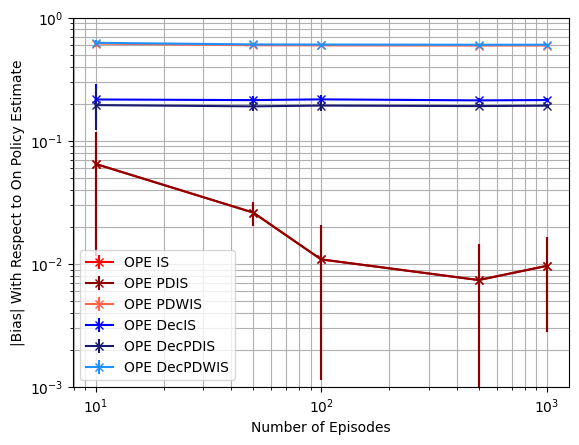

In [ ]:
label = 'bias'
plot_graphs(bias_means, bias_stds, label, 10**(-3), 10**0, shorter_D, estimator='IS')

##### Plot Variance

On Policy-----[0.04204145 0.00764567 0.00344776 0.00071017 0.00036385]
OPE IS-----[0.05328651 0.01197317 0.00641445 0.00126255 0.00058872]
OPE PDIS-----[0.05328651 0.01197317 0.00641445 0.00126255 0.00058872]
OPE PDWIS-----[1.34593099e-04 2.51906361e-05 1.60764742e-05 2.88586669e-06
 1.46099670e-06]
OPE DecIS-----[0.03012316 0.00622113 0.00277562 0.00066988 0.00027601]
OPE DecPDIS-----[0.02386386 0.00552859 0.00233235 0.00061783 0.00025592]
OPE DecPDWIS-----[5.44844610e-05 1.14985888e-05 6.19129986e-06 1.29725736e-06
 6.16529209e-07]


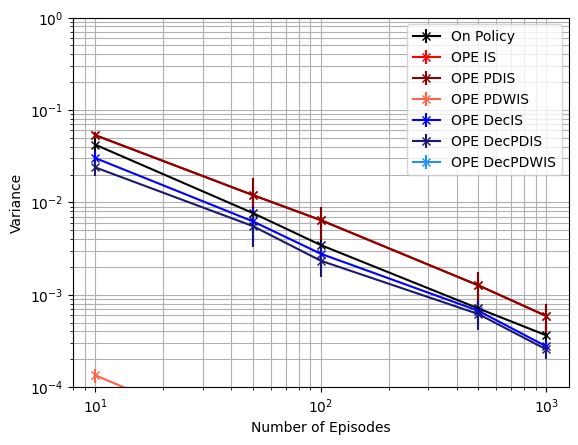

In [ ]:
label = 'var'
plot_graphs(var_means, var_stds, label, 10**(-4), 10**0, shorter_D, estimator='IS')

##### Plot MSE

On Policy-----[0.04204145 0.00764567 0.00344776 0.00071017 0.00036385]
OPE IS-----[0.06031618 0.01268633 0.00662763 0.0013684  0.00072811]
OPE PDIS-----[0.06031618 0.01268633 0.00662763 0.0013684  0.00072811]
OPE PDWIS-----[0.37858598 0.35498001 0.35323699 0.35054111 0.35100945]
OPE DecIS-----[0.08195306 0.05210303 0.05001946 0.04593036 0.04606006]
OPE DecPDIS-----[0.06702911 0.04188619 0.03984715 0.03716156 0.0373635 ]
OPE DecPDWIS-----[0.38963697 0.36607869 0.36443573 0.3615164  0.36200548]


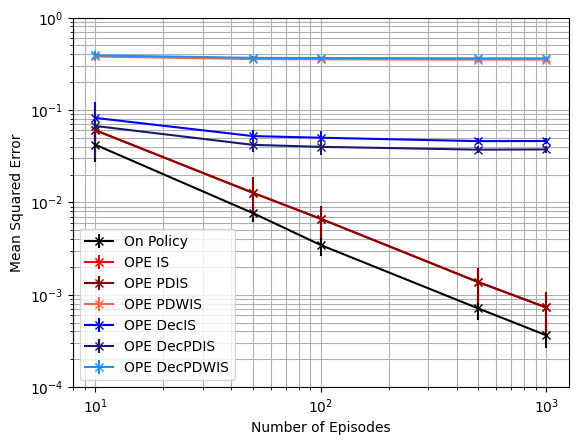

In [ ]:
label = 'MSE'
plot_graphs(MSE_means, MSE_stds, label, 10**(-4), 10**0, shorter_D, estimator='IS')

##### Plot ESS

On Policy-----[  10.   50.  100.  500. 1000.]
OPE IS-----[  7.97065581  40.43621136  58.554694   333.73602293 693.78185453]
OPE PDIS-----[  7.97065581  40.43621136  58.554694   333.73602293 693.78185453]
OPE PDWIS-----[  3385.35935999  18656.30682403  22387.68861552 144984.32325617
 266047.90146918]
OPE DecIS-----[  14.59260255   68.64637672  139.02695296  579.09776953 1347.46308017]
OPE DecPDIS-----[  18.24153058   75.7165509   165.97209775  659.0927654  1449.65834365]
OPE DecPDWIS-----[  8454.38227162  37542.20046829  59244.26528676 313568.29502138
 611550.72216782]


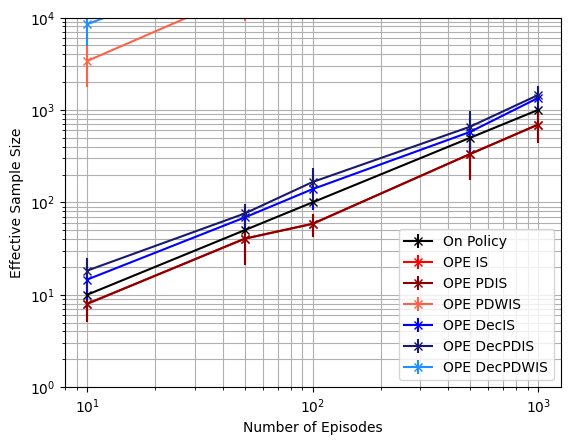

In [ ]:
label = 'ESS'
plot_graphs(ESS_means, ESS_stds, label, 10**(0), 10**4, shorter_D, estimator='IS')

On Policy-----[  10.   50.  100.  500. 1000.]
OPE IS-----[  7.97065581  40.43621136  58.554694   333.73602293 693.78185453]
OPE PDIS-----[  7.97065581  40.43621136  58.554694   333.73602293 693.78185453]
OPE PDWIS-----[  3385.35935999  18656.30682403  22387.68861552 144984.32325617
 266047.90146918]
OPE DecIS-----[  14.59260255   68.64637672  139.02695296  579.09776953 1347.46308017]
OPE DecPDIS-----[  18.24153058   75.7165509   165.97209775  659.0927654  1449.65834365]
OPE DecPDWIS-----[  8454.38227162  37542.20046829  59244.26528676 313568.29502138
 611550.72216782]


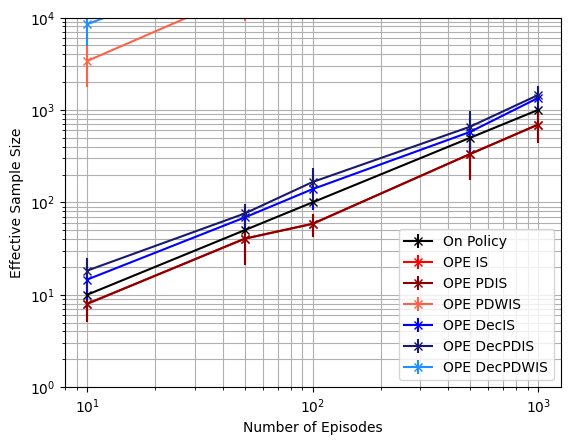

In [ ]:
plot_graphs(ESS_means, ESS_stds, label, 10**(0), 10**4, shorter_D, estimator='PDIS')

On Policy-----[  10.   50.  100.  500. 1000.]
OPE IS-----[  7.97065581  40.43621136  58.554694   333.73602293 693.78185453]
OPE PDIS-----[  7.97065581  40.43621136  58.554694   333.73602293 693.78185453]
OPE PDWIS-----[  3385.35935999  18656.30682403  22387.68861552 144984.32325617
 266047.90146918]
OPE DecIS-----[  14.59260255   68.64637672  139.02695296  579.09776953 1347.46308017]
OPE DecPDIS-----[  18.24153058   75.7165509   165.97209775  659.0927654  1449.65834365]
OPE DecPDWIS-----[  8454.38227162  37542.20046829  59244.26528676 313568.29502138
 611550.72216782]


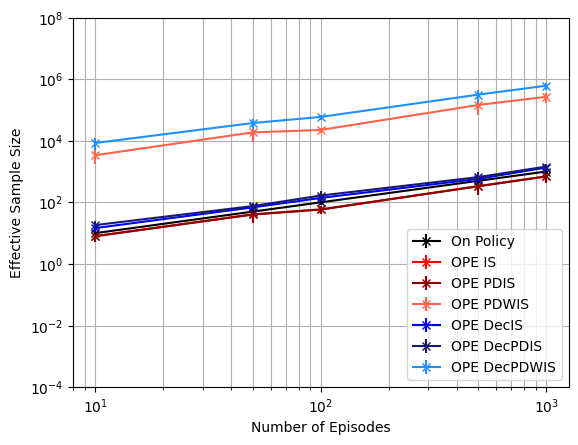

In [ ]:
plot_graphs(ESS_means, ESS_stds, label, 10**(-4), 10**(8), shorter_D, estimator='PDWIS')

### Varying Episode Length $T$ With $\epsilon_{e} = 0.8$ (Policy Divergence $1.6^{T}$)

Set up evaluation policy, generate data and convert into factored format

In [ ]:
import gc

gc.collect()
EVAL_EPSILON = 0.8

evalPolSoft = np.copy(fullPol)
evalPolSoft[evalPolSoft == 1] = 1 - EVAL_EPSILON
evalPolSoft[evalPolSoft == 0] = EVAL_EPSILON / (n_actions - 1)

In [ ]:
# Calculate policy divergence from Voloshin et al.
D = 0
for state in range(randPol.shape[0] - 1):
    for action in range(randPol.shape[1] - 1):
        difference = evalPolSoft[state, action]/randPol[state, action]
        D = max(D, difference)
print(D)
shorter_D = round(D,2)

1.5999999999999996


In [ ]:
dgen = DataGenerator()
states, actions, lengths, rewards, diab, emp_tx_totals, emp_r_totals = dgen.simulate(
    NSIMSAMPS, NSTEPS, policy=evalPolSoft, policy_idx_type='full',
    p_diabetes=PROB_DIAB, use_tqdm=False) #True, tqdm_desc='Behaviour Policy Simulation')

obs_samps = utils.format_dgen_samps(
    states, actions, rewards, diab, NSTEPS, NSIMSAMPS)

In [ ]:
time = np.arange(NSTEPS)
times = np.stack(axis=0, arrays=[time]*NSIMSAMPS)
times = times[..., np.newaxis]

nf_tr_e = np.concatenate((times, states[:, 0:NSTEPS, :], actions, rewards, states[:, 1:, :]), axis=2)
nf_tr_e.shape

(100000, 20, 5)

In [ ]:
f_tr_e = factorise_dataset(nf_tr_e)

In [ ]:
factored_evalPolSoft = factor_policy(evalPolSoft)

In [ ]:
evalPolSoft = pad_policy(evalPolSoft)

factored_evalPolSoft[0] = pad_policy(factored_evalPolSoft[0])
factored_evalPolSoft[1] = pad_policy(factored_evalPolSoft[1])
factored_evalPolSoft[2] = pad_policy(factored_evalPolSoft[2])

In [ ]:
import policy_estimators as pe
import gc

def evaluate_PE(RUNS, EPISODES, SHORTER_D, STEPS=NSTEPS):

  biases = np.zeros((5, 7))
  variances = np.zeros((5, 7))
  MSEs = np.zeros((5, 7))
  ESSs = np.zeros((5, 7))

  # Reshape data for processing
  T, ldim = nf_tr_b.shape[-2], nf_tr_b.shape[-1]
  nfb = nf_tr_b.reshape((-1, RUNS, EPISODES, T, ldim))
  nfe = nf_tr_e.reshape((-1, RUNS, EPISODES, T, ldim))

  T, D, ldim = f_tr_b.shape[-3], f_tr_b.shape[-2], f_tr_b.shape[-1]
  fb = f_tr_b.reshape((-1, RUNS, EPISODES, T, D, ldim))
  fe = f_tr_e.reshape((-1, RUNS, EPISODES, T, D, ldim))

  for t in range(5):
    print()

    lower_index = 0
    estimates_on_policy = np.zeros(RUNS)
    estimates_OPE_IS = np.zeros(RUNS)
    estimates_OPE_PDIS = np.zeros(RUNS)
    estimates_OPE_PDWIS = np.zeros(RUNS)

    estimates_OPE_DecIS = np.zeros(RUNS)
    estimates_OPE_DecPDIS = np.zeros(RUNS)
    estimates_OPE_DecPDWIS = np.zeros(RUNS)

    for r in range(RUNS):
        #On policy Q estimate
        estimates_on_policy[r] = pe.on_policy_Q_estimate(nfe[t, r, :, :STEPS, :], DISCOUNT_Pol)
        #Off policy IS estimate
        estimates_OPE_IS[r] = pe.off_policy_IS_estimator(nfb[t, r, :, :STEPS, :], DISCOUNT_Pol, randPol, evalPolSoft)
        #Off policy PDIS estimate
        estimates_OPE_PDIS[r] = pe.off_policy_PDIS_estimator(nfb[t, r, :, :STEPS, :], DISCOUNT_Pol, randPol, evalPolSoft)
        #Off policy PDWIS estimate
        estimates_OPE_PDWIS[r] = pe.off_policy_PDWIS_estimator(nfb[t, r, :, :STEPS, :], DISCOUNT_Pol, randPol, evalPolSoft)

        #Factorisation 1----------------------------------

        #Off policy decomposed IS estimate
        estimates_OPE_DecIS[r], _ = pe.off_policy_DecIS_estimator(fb[t, r, :, :STEPS, :, :], DISCOUNT_Pol, [0,1], factored_randPol, factored_evalPolSoft)
        #Off policy decomposed PDIS estimate
        estimates_OPE_DecPDIS[r], _ = pe.off_policy_DecPDIS_estimator(fb[t, r, :, :STEPS, :, :], DISCOUNT_Pol, [0,1], factored_randPol, factored_evalPolSoft)
        #Off policy decomposed PDWIS estimate
        estimates_OPE_DecPDWIS[r], _ = pe.off_policy_DecPDWIS_estimator(fb[t, r, :, :STEPS, :, :], DISCOUNT_Pol, [0,1], factored_randPol, factored_evalPolSoft)


    mean_on_policy = np.mean(estimates_on_policy)
    var_on_policy = np.var(estimates_on_policy, ddof=0)
    print(f'Mean on policy Q estimate: {mean_on_policy}. Variance of on policy Q estimate: {var_on_policy}')

    from sklearn.metrics import mean_squared_error

    #For on policy
    biases[t, 0] = 0.0
    variances[t, 0] = var_on_policy
    MSEs[t, 0] = var_on_policy
    ESSs[t, 0] = EPISODES

    def generate_results(estimates, mean_true, label):
      MSE = mean_squared_error(estimates, [mean_true]*RUNS)
      mean = np.mean(estimates)
      var = np.var(estimates, ddof=0)
      bias1 = np.sqrt(MSE - var)
      bias2 = abs(mean - mean_true)
      print(f'Mean {label} estimate: {mean}. Bias1: {bias1}. Bias2: {bias2}. Variance: {var}. MSE: {MSE}')
      return bias1, var, MSE

    label_list = ['OPE IS', 'OPE PDIS', 'OPE PDWIS',
                  'OPE DecIS', 'OPE DecPDIS', 'OPE DecPDWIS'
                  ]

    estimates = [estimates_OPE_IS, estimates_OPE_PDIS, estimates_OPE_PDWIS,
                estimates_OPE_DecIS, estimates_OPE_DecPDIS, estimates_OPE_DecPDWIS
                ]


    for (id, val) in enumerate(label_list):
      biases[t, 1+id], variances[t, 1+id], MSEs[t, 1+id] = generate_results(estimates[id], mean_on_policy, label_list[id])
      ESSs[t, 1+id] = (EPISODES*variances[t, 0])/variances[t, 1+id]
      gc.collect()

  return np.mean(biases, axis=0), np.std(biases, axis=0), np.mean(variances, axis=0), np.std(variances, axis=0), np.mean(MSEs, axis=0), np.std(MSEs, axis=0), np.mean(ESSs, axis=0), np.std(ESSs, axis=0)

#### Run Everything

In [ ]:
STEPS = [1, 2, 5, 10, 15, 20]

bias_means = np.zeros((len(STEPS), 7))
bias_stds = np.zeros((len(STEPS), 7))
var_means = np.zeros((len(STEPS), 7))
var_stds = np.zeros((len(STEPS), 7))
MSE_means = np.zeros((len(STEPS), 7))
MSE_stds = np.zeros((len(STEPS), 7))
ESS_means = np.zeros((len(STEPS), 7))
ESS_stds = np.zeros((len(STEPS), 7))

RUNS = 20

for id in range(len(STEPS)):
  e = STEPS[id]
  print(f'{e} Steps, {RUNS} ----------------------------------')
  bias_means[id, :], bias_stds[id, :], var_means[id, :], var_stds[id, :], MSE_means[id, :], MSE_stds[id, :], ESS_means[id, :], ESS_stds[id, :] = evaluate_PE(RUNS=RUNS, EPISODES=1000, STEPS=e, SHORTER_D=shorter_D)
  print()
  gc.collect()

print('BIAS MEANS')
print(list(bias_means))
print('\nBIAS STDS')
print(list(bias_stds))
print('\nVAR MEANS')
print(list(var_means))
print('\nVAR STDS')
print(list(var_stds))
print('\nMSE MEANS')
print(list(MSE_means))
print('\nMSE STDS')
print(list(MSE_stds))
print('\nESS MEANS')
print(list(ESS_means))
print('\nESS STDS')
print(list(ESS_stds))

1 Steps, 20 ----------------------------------

Mean on policy Q estimate: -0.0137. Variance of on policy Q estimate: 2.341e-05
Mean OPE IS estimate: 0.0035085714285714156. Bias1: 0.017208571428571417. Bias2: 0.017208571428571417. Variance: 0.00011865482448979586. MSE: 0.0004147897551020404
Mean OPE PDIS estimate: 0.0035085714285714156. Bias1: 0.017208571428571417. Bias2: 0.017208571428571417. Variance: 0.00011865482448979586. MSE: 0.0004147897551020404
Mean OPE PDWIS estimate: 0.003472349570985282. Bias1: 0.01717234957098528. Bias2: 0.017172349570985283. Variance: 0.00011920894464851337. MSE: 0.00041409853443663173
Mean OPE DecIS estimate: -0.002603030303030307. Bias1: 0.011096969696969694. Bias2: 0.011096969696969694. Variance: 3.851440771349861e-05. MSE: 0.00016165714416896225
Mean OPE DecPDIS estimate: -0.002603030303030307. Bias1: 0.011096969696969694. Bias2: 0.011096969696969694. Variance: 3.851440771349861e-05. MSE: 0.00016165714416896225
Mean OPE DecPDWIS estimate: -0.002600516

#### Plot Graphs

##### Plot Bias

OPE IS-----[0.01546714 0.00472034 0.00266865 0.00638369 0.00602261 0.00653411]
OPE PDIS-----[0.01546714 0.00472034 0.00266865 0.00638369 0.00602261 0.00653411]
OPE PDWIS-----[0.01543667 0.03424248 0.19560266 0.39947445 0.52168304 0.59231932]
OPE DecIS-----[0.00978333 0.02691975 0.08422136 0.14899623 0.1892833  0.21371328]
OPE DecPDIS-----[0.00978333 0.0191462  0.06865935 0.13024893 0.16884239 0.1923622 ]
OPE DecPDWIS-----[0.00977991 0.0415429  0.20952837 0.4123569  0.53258762 0.60152945]


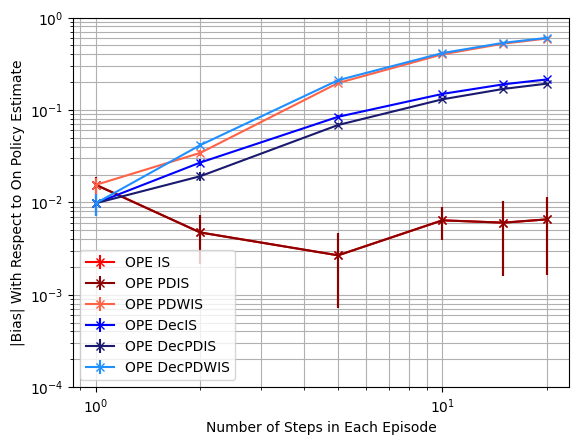

In [ ]:
label = 'bias'
plot_graphs(bias_means, bias_stds, label, 10**(-4), 10**0, shorter_D, estimator='IS')

##### Plot Variance

On Policy-----[4.99005000e-05 1.27624870e-04 2.91746620e-04 3.94271378e-04
 3.83216801e-04 3.46187689e-04]
OPE IS-----[0.00010114 0.0001754  0.00028338 0.00043989 0.0004842  0.00058872]
OPE PDIS-----[0.00010114 0.0001754  0.00028338 0.00043989 0.0004842  0.00058872]
OPE PDWIS-----[1.01481689e-04 4.45003684e-05 1.24231550e-05 5.03397238e-06
 2.33829322e-06 1.46099670e-06]
OPE DecIS-----[3.20600000e-05 7.25757116e-05 1.44863181e-04 2.27793819e-04
 2.57946421e-04 2.76014949e-04]
OPE DecPDIS-----[3.20600000e-05 6.25163468e-05 1.24990138e-04 2.04684365e-04
 2.33670625e-04 2.55916166e-04]
OPE DecPDWIS-----[3.21119442e-05 1.56564223e-05 5.17087200e-06 2.07670484e-06
 1.06045296e-06 6.16529209e-07]


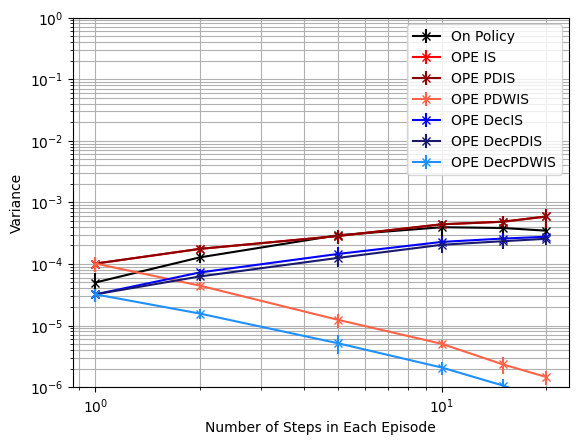

In [ ]:
label = 'var'
plot_graphs(var_means, var_stds, label, 10**(-6), 10**0, shorter_D, estimator='IS')

##### Plot MSE

On Policy-----[4.99005000e-05 1.27624870e-04 2.91746620e-04 3.94271378e-04
 3.83216801e-04 3.46187689e-04]
OPE IS-----[0.00035    0.00020419 0.00029434 0.00048653 0.00054009 0.00065543]
OPE PDIS-----[0.00035    0.00020419 0.00029434 0.00048653 0.00054009 0.00065543]
OPE PDWIS-----[3.49416221e-04 1.22180773e-03 3.82849482e-02 1.59592568e-01
 2.72164821e-01 3.50860600e-01]
OPE DecIS-----[0.00013457 0.00080232 0.00724646 0.02244722 0.03609713 0.0459621 ]
OPE DecPDIS-----[0.00013457 0.00043376 0.00484779 0.01718698 0.02875044 0.03726882]
OPE DecPDWIS-----[1.34572148e-04 1.74571070e-03 4.39197286e-02 1.70047943e-01
 2.83660845e-01 3.61856244e-01]


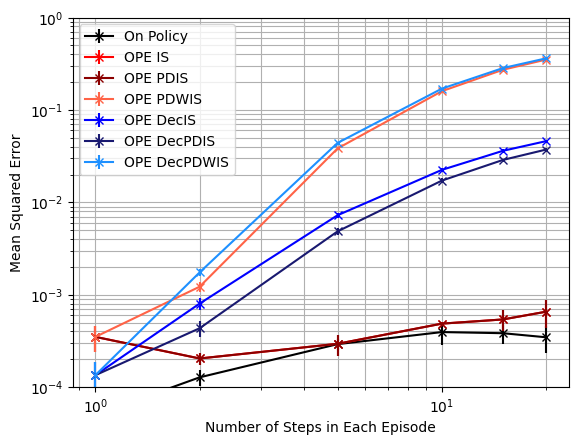

In [ ]:
label = 'MSE'
plot_graphs(MSE_means, MSE_stds, label, 10**(-4), 10**0, shorter_D, estimator='IS')

##### Plot ESS

On Policy-----[1000. 1000. 1000. 1000. 1000. 1000.]
OPE IS-----[ 553.62795542  759.16350003 1106.15685428  912.88588281  868.50186993
  713.71047826]
OPE PDIS-----[ 553.62795542  759.16350003 1106.15685428  912.88588281  868.50186993
  713.71047826]
OPE PDWIS-----[   551.53461571   3003.87575885  25009.81773093  83255.09024202
 181777.21840146 257108.47281054]
OPE DecIS-----[1742.17035345 1830.01687444 2188.70136488 1845.91777498 1516.39426084
 1275.89808473]
OPE DecPDIS-----[1742.17035345 2135.57766455 2500.64731856 2025.47105514 1682.90912164
 1400.92666852]
OPE DecPDWIS-----[  1736.93916216   8578.28335719  60875.25153904 196603.90615816
 384583.53506411 580211.21729727]


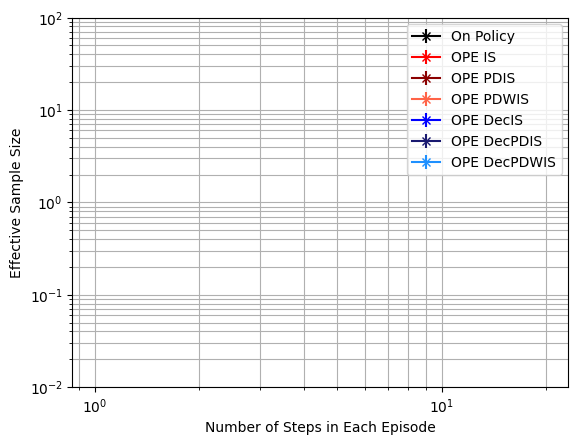

In [ ]:
label = 'ESS'
plot_graphs(ESS_means, ESS_stds, label, 10**(-2), 10**2, shorter_D, estimator='IS')

On Policy-----[1000. 1000. 1000. 1000. 1000. 1000.]
OPE IS-----[ 553.62795542  759.16350003 1106.15685428  912.88588281  868.50186993
  713.71047826]
OPE PDIS-----[ 553.62795542  759.16350003 1106.15685428  912.88588281  868.50186993
  713.71047826]
OPE PDWIS-----[   551.53461571   3003.87575885  25009.81773093  83255.09024202
 181777.21840146 257108.47281054]
OPE DecIS-----[1742.17035345 1830.01687444 2188.70136488 1845.91777498 1516.39426084
 1275.89808473]
OPE DecPDIS-----[1742.17035345 2135.57766455 2500.64731856 2025.47105514 1682.90912164
 1400.92666852]
OPE DecPDWIS-----[  1736.93916216   8578.28335719  60875.25153904 196603.90615816
 384583.53506411 580211.21729727]


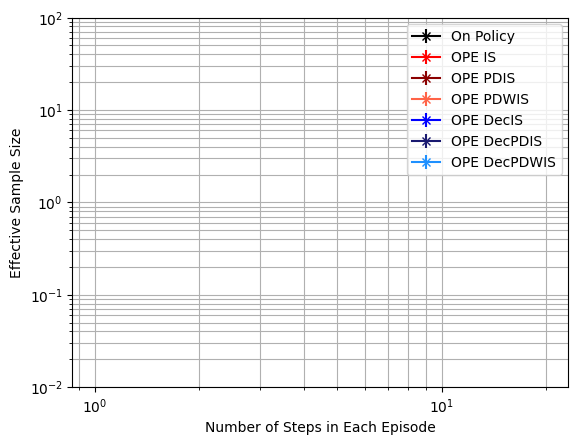

In [ ]:
plot_graphs(ESS_means, ESS_stds, label, 10**(-2), 10**2, shorter_D, estimator='PDIS')

On Policy-----[1000. 1000. 1000. 1000. 1000. 1000.]
OPE IS-----[ 553.62795542  759.16350003 1106.15685428  912.88588281  868.50186993
  713.71047826]
OPE PDIS-----[ 553.62795542  759.16350003 1106.15685428  912.88588281  868.50186993
  713.71047826]
OPE PDWIS-----[   551.53461571   3003.87575885  25009.81773093  83255.09024202
 181777.21840146 257108.47281054]
OPE DecIS-----[1742.17035345 1830.01687444 2188.70136488 1845.91777498 1516.39426084
 1275.89808473]
OPE DecPDIS-----[1742.17035345 2135.57766455 2500.64731856 2025.47105514 1682.90912164
 1400.92666852]
OPE DecPDWIS-----[  1736.93916216   8578.28335719  60875.25153904 196603.90615816
 384583.53506411 580211.21729727]


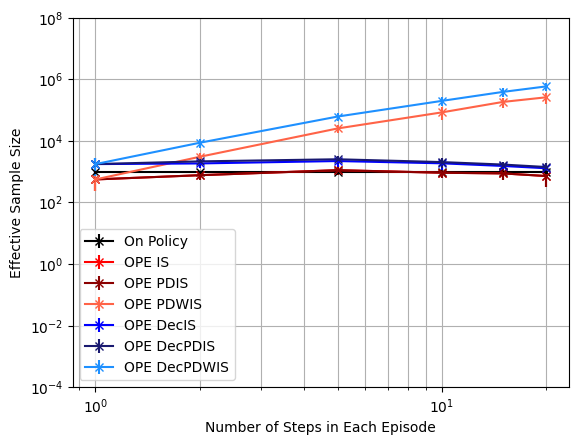

In [ ]:
plot_graphs(ESS_means, ESS_stds, label, 10**(-4), 10**(8), shorter_D, estimator='PDWIS')

# From Patient State 696, With Diabetes

In [ ]:
#The patient has no diabetes
PROB_DIAB = 1.0

### State Analysis

In [ ]:
#Instantiate a state based on the idx and get the state vector
testState = State(state_idx = 696, diabetic_idx=1)
vec = testState.get_state_vector()

print(vec)
print(f'Num abnormals: {testState.get_num_abnormal()}\n')

print(f'Heart Rate: {hr_state_mapping[vec[0]]}')
print(f'Systolic Blood Pressure: {sbp_state_mapping[vec[1]]}')
print(f'Percent Oxygen: {o2_state_mapping[vec[2]]}')
print(f'Glucose Level: {glu_state_mapping[vec[3]]}')
print(f'Antibiotics: {abx_state_mapping[vec[4]]}')
print(f'Vasopressors: {vaso_state_mapping[vec[5]]}')
print(f'Ventilator: {vent_state_mapping[vec[6]]}')
print(f'Diabetes: {testState.diabetic_idx}')

[2 2 1 2 0 0 0]
Num abnormals: 2

Heart Rate: High
Systolic Blood Pressure: High
Percent Oxygen: Normal
Glucose Level: Normal
Antibiotics: Off
Vasopressors: Off
Ventilator: Off
Diabetes: 1


### Generate Data From Behaviour Policy

Run the data generator

In [ ]:
dgen = DataGenerator()
states, actions, lengths, rewards, diab, emp_tx_totals, emp_r_totals = dgen.simulate(
    NSIMSAMPS, NSTEPS, policy=randPol, policy_idx_type='full',
    p_diabetes=PROB_DIAB, use_tqdm=False) #True, tqdm_desc='Behaviour Policy Simulation')

obs_samps = utils.format_dgen_samps(
    states, actions, rewards, diab, NSTEPS, NSIMSAMPS)

Convert data into array format

In [ ]:
time = np.arange(NSTEPS)
times = np.stack(axis=0, arrays=[time]*NSIMSAMPS)
times = times[..., np.newaxis]

nf_tr_b = np.concatenate((times, states[:, 0:NSTEPS, :], actions, rewards, states[:, 1:, :]), axis=2)
nf_tr_b.shape

(100000, 20, 5)

In [ ]:
f_tr_b = factorise_dataset(nf_tr_b)

In [ ]:
print(nf_tr_b)

[[[  0. 696.   0.  -1. 648.]
  [  1. 648.  -1.   0.  -1.]
  [  2.  -1.  -1.   0.  -1.]
  ...
  [ 17.  -1.  -1.   0.  -1.]
  [ 18.  -1.  -1.   0.  -1.]
  [ 19.  -1.  -1.   0.  -1.]]

 [[  0. 696.   3.   0. 699.]
  [  1. 699.   5.   0. 422.]
  [  2. 422.   3.   0. 467.]
  ...
  [ 17.  -1.  -1.   0.  -1.]
  [ 18.  -1.  -1.   0.  -1.]
  [ 19.  -1.  -1.   0.  -1.]]

 [[  0. 696.   1.   0. 698.]
  [  1. 698.   3.   0. 699.]
  [  2. 699.   0.   0. 696.]
  ...
  [ 17.  -1.  -1.   0.  -1.]
  [ 18.  -1.  -1.   0.  -1.]
  [ 19.  -1.  -1.   0.  -1.]]

 ...

 [[  0. 696.   6.   0. 469.]
  [  1. 469.   5.   0. 470.]
  [  2. 470.   3.   0. 475.]
  ...
  [ 17.  -1.  -1.   0.  -1.]
  [ 18.  -1.  -1.   0.  -1.]
  [ 19.  -1.  -1.   0.  -1.]]

 [[  0. 696.   6.  -1. 693.]
  [  1. 693.  -1.   0.  -1.]
  [  2.  -1.  -1.   0.  -1.]
  ...
  [ 17.  -1.  -1.   0.  -1.]
  [ 18.  -1.  -1.   0.  -1.]
  [ 19.  -1.  -1.   0.  -1.]]

 [[  0. 696.   6.   0. 469.]
  [  1. 469.   0.   0. 456.]
  [  2. 456.   7.   0. 471

In [ ]:
print(f_tr_b)

[[[[ 0.00000000e+00  6.96000000e+02  1.00000000e+00 -3.33333333e-01
     6.48000000e+02]
   [ 0.00000000e+00  6.96000000e+02  1.00000000e+00 -3.33333333e-01
     6.48000000e+02]
   [ 0.00000000e+00  6.96000000e+02  0.00000000e+00 -3.33333333e-01
     6.48000000e+02]]

  [[ 1.00000000e+00  6.48000000e+02  1.00000000e+00  0.00000000e+00
    -1.00000000e+00]
   [ 1.00000000e+00  6.48000000e+02  1.00000000e+00  0.00000000e+00
    -1.00000000e+00]
   [ 1.00000000e+00  6.48000000e+02  1.00000000e+00  0.00000000e+00
    -1.00000000e+00]]

  [[ 2.00000000e+00 -1.00000000e+00  1.00000000e+00  0.00000000e+00
    -1.00000000e+00]
   [ 2.00000000e+00 -1.00000000e+00  1.00000000e+00  0.00000000e+00
    -1.00000000e+00]
   [ 2.00000000e+00 -1.00000000e+00  1.00000000e+00  0.00000000e+00
    -1.00000000e+00]]

  ...

  [[ 1.70000000e+01 -1.00000000e+00  1.00000000e+00  0.00000000e+00
    -1.00000000e+00]
   [ 1.70000000e+01 -1.00000000e+00  1.00000000e+00  0.00000000e+00
    -1.00000000e+00]
   [ 1.7

In [ ]:
factored_randPol = factor_policy(randPol)

In [ ]:
randPol = pad_policy(randPol)

factored_randPol[0] = pad_policy(factored_randPol[0])
factored_randPol[1] = pad_policy(factored_randPol[1])
factored_randPol[2] = pad_policy(factored_randPol[2])

### Varying Episodes $\epsilon_{e} = 0.0$ (Policy Divergence $8.0^{20}$)

Set up evaluation policy, generate data and convert into factored format

In [ ]:
EVAL_EPSILON = 0.0

evalPolSoft = np.copy(fullPol)
evalPolSoft[evalPolSoft == 1] = 1 - EVAL_EPSILON
evalPolSoft[evalPolSoft == 0] = EVAL_EPSILON / (n_actions - 1)

In [ ]:
# Calculate policy divergence from Voloshin et al.
D = 0
for state in range(randPol.shape[0] - 1):
    for action in range(randPol.shape[1] - 1):
        difference = evalPolSoft[state, action]/randPol[state, action]
        D = max(D, difference)
print(D)
shorter_D = round(D,2)

8.0


In [ ]:
dgen = DataGenerator()
states, actions, lengths, rewards, diab, emp_tx_totals, emp_r_totals = dgen.simulate(
    NSIMSAMPS, NSTEPS, policy=evalPolSoft, policy_idx_type='full',
    p_diabetes=PROB_DIAB, use_tqdm=False) #True, tqdm_desc='Behaviour Policy Simulation')

obs_samps = utils.format_dgen_samps(
    states, actions, rewards, diab, NSTEPS, NSIMSAMPS)

In [ ]:
time = np.arange(NSTEPS)
times = np.stack(axis=0, arrays=[time]*NSIMSAMPS)
times = times[..., np.newaxis]

nf_tr_e = np.concatenate((times, states[:, 0:NSTEPS, :], actions, rewards, states[:, 1:, :]), axis=2)
nf_tr_e.shape

(100000, 20, 5)

In [ ]:
f_tr_e = factorise_dataset(nf_tr_e)

In [ ]:
factored_evalPolSoft = factor_policy(evalPolSoft)

In [ ]:
evalPolSoft = pad_policy(evalPolSoft)

factored_evalPolSoft[0] = pad_policy(factored_evalPolSoft[0])
factored_evalPolSoft[1] = pad_policy(factored_evalPolSoft[1])
factored_evalPolSoft[2] = pad_policy(factored_evalPolSoft[2])

In [ ]:
import policy_estimators as pe
import gc

def evaluate_PE(RUNS, EPISODES, SHORTER_D, STEPS=NSTEPS):

  biases = np.zeros((5, 5))
  variances = np.zeros((5, 5))
  MSEs = np.zeros((5, 5))
  ESSs = np.zeros((5, 5))

  # Reshape data for processing
  T, ldim = nf_tr_b.shape[-2], nf_tr_b.shape[-1]
  nfb = nf_tr_b.reshape((-1, RUNS, EPISODES, T, ldim))
  nfe = nf_tr_e.reshape((-1, RUNS, EPISODES, T, ldim))

  T, D, ldim = f_tr_b.shape[-3], f_tr_b.shape[-2], f_tr_b.shape[-1]
  fb = f_tr_b.reshape((-1, RUNS, EPISODES, T, D, ldim))
  fe = f_tr_e.reshape((-1, RUNS, EPISODES, T, D, ldim))

  for t in range(5):
    print()

    lower_index = 0
    estimates_on_policy = np.zeros(RUNS)
    estimates_OPE_IS = np.zeros(RUNS)
    estimates_OPE_PDIS = np.zeros(RUNS)

    estimates_OPE_DecIS = np.zeros(RUNS)
    estimates_OPE_DecPDIS = np.zeros(RUNS)

    for r in range(RUNS):
        #On policy Q estimate
        estimates_on_policy[r] = pe.on_policy_Q_estimate(nfe[t, r, :, :STEPS, :], DISCOUNT_Pol)
        #Off policy IS estimate
        estimates_OPE_IS[r] = pe.off_policy_IS_estimator(nfb[t, r, :, :STEPS, :], DISCOUNT_Pol, randPol, evalPolSoft)
        #Off policy PDIS estimate
        estimates_OPE_PDIS[r] = pe.off_policy_PDIS_estimator(nfb[t, r, :, :STEPS, :], DISCOUNT_Pol, randPol, evalPolSoft)

        #Factorisation 1----------------------------------

        #Off policy decomposed IS estimate
        estimates_OPE_DecIS[r], _ = pe.off_policy_DecIS_estimator(fb[t, r, :, :STEPS, :, :], DISCOUNT_Pol, [0,1], factored_randPol, factored_evalPolSoft)
        #Off policy decomposed PDIS estimate
        estimates_OPE_DecPDIS[r], _ = pe.off_policy_DecPDIS_estimator(fb[t, r, :, :STEPS, :, :], DISCOUNT_Pol, [0,1], factored_randPol, factored_evalPolSoft)


    mean_on_policy = np.mean(estimates_on_policy)
    var_on_policy = np.var(estimates_on_policy, ddof=0)
    print(f'Mean on policy Q estimate: {mean_on_policy}. Variance of on policy Q estimate: {var_on_policy}')

    from sklearn.metrics import mean_squared_error

    #For on policy
    biases[t, 0] = 0.0
    variances[t, 0] = var_on_policy
    MSEs[t, 0] = var_on_policy
    ESSs[t, 0] = EPISODES

    def generate_results(estimates, mean_true, label):
      MSE = mean_squared_error(estimates, [mean_true]*RUNS)
      mean = np.mean(estimates)
      var = np.var(estimates, ddof=0)
      bias1 = np.sqrt(MSE - var)
      bias2 = abs(mean - mean_true)
      print(f'Mean {label} estimate: {mean}. Bias1: {bias1}. Bias2: {bias2}. Variance: {var}. MSE: {MSE}')
      return bias1, var, MSE

    label_list = ['OPE IS', 'OPE PDIS',
                  'OPE DecIS', 'OPE DecPDIS'
                  ]

    estimates = [estimates_OPE_IS, estimates_OPE_PDIS,
                estimates_OPE_DecIS, estimates_OPE_DecPDIS
                ]


    for (id, val) in enumerate(label_list):
      biases[t, 1+id], variances[t, 1+id], MSEs[t, 1+id] = generate_results(estimates[id], mean_on_policy, label_list[id])
      ESSs[t, 1+id] = (EPISODES*variances[t, 0])/variances[t, 1+id]
      gc.collect()

  return np.mean(biases, axis=0), np.std(biases, axis=0), np.mean(variances, axis=0), np.std(variances, axis=0), np.mean(MSEs, axis=0), np.std(MSEs, axis=0), np.mean(ESSs, axis=0), np.std(ESSs, axis=0)

#### Run Everything

In [ ]:
EPISODES = [10, 50, 100, 500, 1000]

bias_means = np.zeros((len(EPISODES), 5))
bias_stds = np.zeros((len(EPISODES), 5))
var_means = np.zeros((len(EPISODES), 5))
var_stds = np.zeros((len(EPISODES), 5))
MSE_means = np.zeros((len(EPISODES), 5))
MSE_stds = np.zeros((len(EPISODES), 5))
ESS_means = np.zeros((len(EPISODES), 5))
ESS_stds = np.zeros((len(EPISODES), 5))

RUNS = 20

for id in range(len(EPISODES)):
  e = EPISODES[id]
  print(f'{e} Episodes, {RUNS} ----------------------------------')
  bias_means[id, :], bias_stds[id, :], var_means[id, :], var_stds[id, :], MSE_means[id, :], MSE_stds[id, :], ESS_means[id, :], ESS_stds[id, :] = evaluate_PE(RUNS=RUNS, EPISODES=e, SHORTER_D=shorter_D)
  print()
  gc.collect()

print('BIAS MEANS')
print(list(bias_means))
print('\nBIAS STDS')
print(list(bias_stds))
print('\nVAR MEANS')
print(list(var_means))
print('\nVAR STDS')
print(list(var_stds))
print('\nMSE MEANS')
print(list(MSE_means))
print('\nMSE STDS')
print(list(MSE_stds))
print('\nESS MEANS')
print(list(ESS_means))
print('\nESS STDS')
print(list(ESS_stds))

10 Episodes, 20 ----------------------------------

Mean on policy Q estimate: 0.34356487997700746. Variance of on policy Q estimate: 0.07024834458913667
Mean OPE IS estimate: -0.5168. Bias1: 0.860364879977008. Bias2: 0.8603648799770075. Variance: 1.90016256. MSE: 2.6403902866978513
Mean OPE PDIS estimate: -0.5168. Bias1: 0.860364879977008. Bias2: 0.8603648799770075. Variance: 1.90016256. MSE: 2.6403902866978513
Mean OPE DecIS estimate: -0.6501008010666667. Bias1: 0.993665681043674. Bias2: 0.9936656810436741. Variance: 0.27638543038747876. MSE: 1.2637569160714672
Mean OPE DecPDIS estimate: -0.5178517338666667. Bias1: 0.8614166138436742. Bias2: 0.8614166138436742. Variance: 0.07250397261503715. MSE: 0.8145425552209389

Mean on policy Q estimate: 0.3200970497303811. Variance of on policy Q estimate: 0.03972601523034031
Mean OPE IS estimate: -0.28. Bias1: 0.600097049730381. Bias2: 0.6000970497303811. Variance: 0.1456. MSE: 0.5057164690951074
Mean OPE PDIS estimate: -0.28. Bias1: 0.6000970

#### Plot Graphs

In [ ]:
import pickle
import matplotlib.pyplot as plt

def plot_graphs(means, stds, label, low_ylim, up_ylim, D, estimator='IS'):
  EPISODES = [10, 50, 100, 500, 1000]

  ylabels = {
      'bias': '|Bias| With Respect to On Policy Estimate',
      'var': 'Variance',
      'MSE': 'Mean Squared Error',
      'ESS': 'Effective Sample Size'
  }

  colours = {
      'On Policy': 'k',
      'OPE IS': 'r',
      'OPE DecIS': 'b',
      'OPE PDIS': 'darkred',
      'OPE DecPDIS': 'midnightblue',
      'OPE PDWIS': 'tomato',
      'OPE DecPDWIS': 'dodgerblue',
  }

  legend_list = ['OPE IS', 'OPE PDIS',
                  'OPE DecIS', 'OPE DecPDIS'
                  ]
  index_list = [1, 2, 3, 4]

  plt.figure()
  if label != 'bias':
    legend_list.insert(0,'On Policy')
    index_list.insert(0, 0)
  for (id, legend) in zip(index_list, legend_list):
    print(f'{legend}-----{means[:, id]}')
    plt.errorbar(EPISODES, means[:, id], yerr=stds[:, id], color=colours[legend], marker='x')
  plt.yscale("log")
  plt.xscale("log")
  plt.grid(visible=True, which='both', axis='both')
  plt.legend(legend_list)
  plt.xlabel('Number of Episodes')
  plt.ylabel(ylabels[label])
  plt.ylim([low_ylim, up_ylim])
  plt.savefig(f'{label}-sepsis-simulator-{D}.pdf', dpi=300)
  plt.show()


##### Plot Bias

OPE IS-----[0.68682732 0.63546096 0.64531496 0.63648196 0.63624064]
OPE PDIS-----[0.68682732 0.63546096 0.64531496 0.63648196 0.63624064]
OPE DecIS-----[0.81816852 0.78475816 0.78806162 0.99944872 0.89529737]
OPE DecPDIS-----[0.81759729 0.81480203 0.83425083 0.93539734 0.88487913]


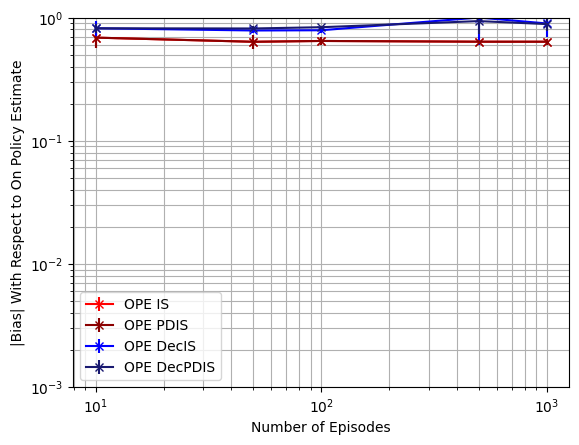

In [ ]:
label = 'bias'
plot_graphs(bias_means, bias_stds, label, 10**-3, 10**0, shorter_D, estimator='IS')

##### Plot Variance

On Policy-----[0.05583927 0.01398878 0.00562235 0.00111494 0.00067315]
OPE IS-----[0.86347622 0.13462643 0.05805307 0.00986661 0.01756352]
OPE PDIS-----[0.86347622 0.13462643 0.05805307 0.00986661 0.01756352]
OPE DecIS-----[0.12995389 0.03304683 0.03927447 3.48394956 0.87482255]
OPE DecPDIS-----[0.06568951 0.01890157 0.04045588 0.87145502 0.21992589]


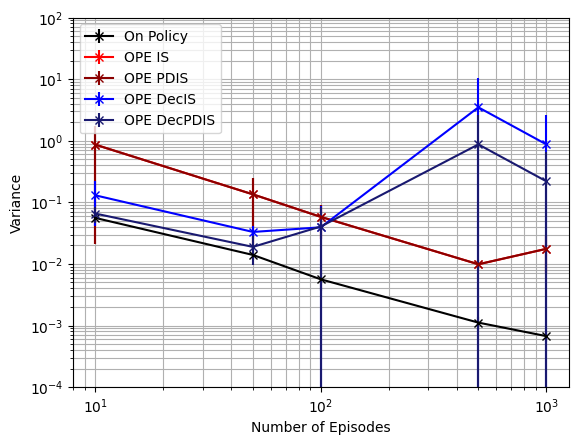

In [ ]:
label = 'var'
plot_graphs(var_means, var_stds, label, 10**(-4), 10**2, shorter_D, estimator='IS')

##### Plot MSE

On Policy-----[0.05583927 0.01398878 0.00562235 0.00111494 0.00067315]
OPE IS-----[1.35111977 0.54515091 0.47674004 0.41526878 0.42383441]
OPE PDIS-----[1.35111977 0.54515091 0.47674004 0.41526878 0.42383441]
OPE DecIS-----[0.81505079 0.64977409 0.66181647 4.64263619 1.71611327]
OPE DecPDIS-----[0.73876642 0.68388086 0.73708676 1.78683166 1.01309471]


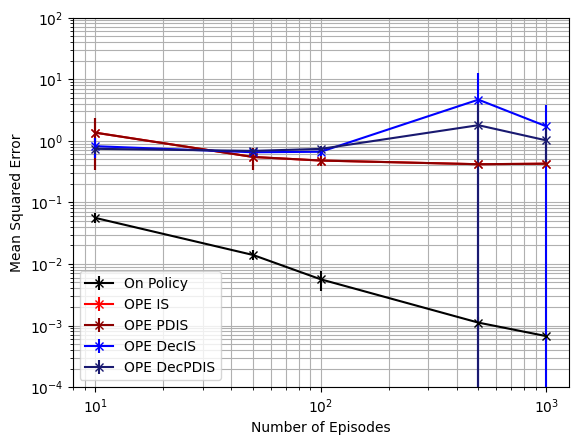

In [ ]:
label = 'MSE'
plot_graphs(MSE_means, MSE_stds, label, 10**(-4), 10**2, shorter_D, estimator='IS')

##### Plot ESS

On Policy-----[  10.   50.  100.  500. 1000.]
OPE IS-----[ 1.803002   13.1634619  13.53952264 58.64915443 68.54066917]
OPE PDIS-----[ 1.803002   13.1634619  13.53952264 58.64915443 68.54066917]
OPE DecIS-----[ 6.97450024 22.44258915 31.51236061 46.20156656 86.00126104]
OPE DecPDIS-----[  9.75696101  45.85379727  37.6242481  132.8293575  174.65095431]


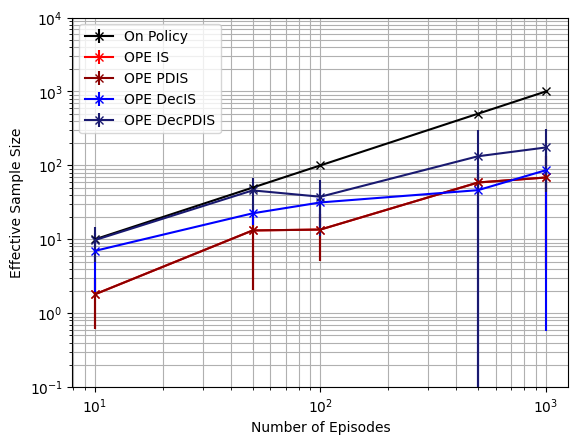

In [ ]:
label = 'ESS'
plot_graphs(ESS_means, ESS_stds, label, 10**(-1), 10**4, shorter_D, estimator='IS')

### Varying Episodes $\epsilon_{e} = 0.2$ (Policy Divergence $6.4^{20}$)

Set up evaluation policy, generate data and convert into factored format

In [ ]:
EVAL_EPSILON = 0.2

evalPolSoft = np.copy(fullPol)
evalPolSoft[evalPolSoft == 1] = 1 - EVAL_EPSILON
evalPolSoft[evalPolSoft == 0] = EVAL_EPSILON / (n_actions - 1)

In [ ]:
# Calculate policy divergence from Voloshin et al.
D = 0
for state in range(randPol.shape[0] - 1):
    for action in range(randPol.shape[1] - 1):
        difference = evalPolSoft[state, action]/randPol[state, action]
        D = max(D, difference)
print(D)
shorter_D = round(D,2)

6.4


In [ ]:
dgen = DataGenerator()
states, actions, lengths, rewards, diab, emp_tx_totals, emp_r_totals = dgen.simulate(
    NSIMSAMPS, NSTEPS, policy=evalPolSoft, policy_idx_type='full',
    p_diabetes=PROB_DIAB, use_tqdm=False) #True, tqdm_desc='Behaviour Policy Simulation')

obs_samps = utils.format_dgen_samps(
    states, actions, rewards, diab, NSTEPS, NSIMSAMPS)

In [ ]:
time = np.arange(NSTEPS)
times = np.stack(axis=0, arrays=[time]*NSIMSAMPS)
times = times[..., np.newaxis]

nf_tr_e = np.concatenate((times, states[:, 0:NSTEPS, :], actions, rewards, states[:, 1:, :]), axis=2)
nf_tr_e.shape

(100000, 20, 5)

In [ ]:
f_tr_e = factorise_dataset(nf_tr_e)

In [ ]:
factored_evalPolSoft = factor_policy(evalPolSoft)

In [ ]:
evalPolSoft = pad_policy(evalPolSoft)

factored_evalPolSoft[0] = pad_policy(factored_evalPolSoft[0])
factored_evalPolSoft[1] = pad_policy(factored_evalPolSoft[1])
factored_evalPolSoft[2] = pad_policy(factored_evalPolSoft[2])

In [ ]:
import policy_estimators as pe
import gc

def evaluate_PE(RUNS, EPISODES, SHORTER_D, STEPS=NSTEPS):

  biases = np.zeros((5, 7))
  variances = np.zeros((5, 7))
  MSEs = np.zeros((5, 7))
  ESSs = np.zeros((5, 7))

  # Reshape data for processing
  T, ldim = nf_tr_b.shape[-2], nf_tr_b.shape[-1]
  nfb = nf_tr_b.reshape((-1, RUNS, EPISODES, T, ldim))
  nfe = nf_tr_e.reshape((-1, RUNS, EPISODES, T, ldim))

  T, D, ldim = f_tr_b.shape[-3], f_tr_b.shape[-2], f_tr_b.shape[-1]
  fb = f_tr_b.reshape((-1, RUNS, EPISODES, T, D, ldim))
  fe = f_tr_e.reshape((-1, RUNS, EPISODES, T, D, ldim))

  for t in range(5):
    print()

    lower_index = 0
    estimates_on_policy = np.zeros(RUNS)
    estimates_OPE_IS = np.zeros(RUNS)
    estimates_OPE_PDIS = np.zeros(RUNS)
    estimates_OPE_PDWIS = np.zeros(RUNS)

    estimates_OPE_DecIS = np.zeros(RUNS)
    estimates_OPE_DecPDIS = np.zeros(RUNS)
    estimates_OPE_DecPDWIS = np.zeros(RUNS)

    for r in range(RUNS):
        #On policy Q estimate
        estimates_on_policy[r] = pe.on_policy_Q_estimate(nfe[t, r, :, :STEPS, :], DISCOUNT_Pol)
        #Off policy IS estimate
        estimates_OPE_IS[r] = pe.off_policy_IS_estimator(nfb[t, r, :, :STEPS, :], DISCOUNT_Pol, randPol, evalPolSoft)
        #Off policy PDIS estimate
        estimates_OPE_PDIS[r] = pe.off_policy_PDIS_estimator(nfb[t, r, :, :STEPS, :], DISCOUNT_Pol, randPol, evalPolSoft)
        #Off policy PDWIS estimate
        estimates_OPE_PDWIS[r] = pe.off_policy_PDWIS_estimator(nfb[t, r, :, :STEPS, :], DISCOUNT_Pol, randPol, evalPolSoft)

        #Factorisation 1----------------------------------

        #Off policy decomposed IS estimate
        estimates_OPE_DecIS[r], _ = pe.off_policy_DecIS_estimator(fb[t, r, :, :STEPS, :, :], DISCOUNT_Pol, [0,1], factored_randPol, factored_evalPolSoft)
        #Off policy decomposed PDIS estimate
        estimates_OPE_DecPDIS[r], _ = pe.off_policy_DecPDIS_estimator(fb[t, r, :, :STEPS, :, :], DISCOUNT_Pol, [0,1], factored_randPol, factored_evalPolSoft)
        #Off policy decomposed PDWIS estimate
        estimates_OPE_DecPDWIS[r], _ = pe.off_policy_DecPDWIS_estimator(fb[t, r, :, :STEPS, :, :], DISCOUNT_Pol, [0,1], factored_randPol, factored_evalPolSoft)


    mean_on_policy = np.mean(estimates_on_policy)
    var_on_policy = np.var(estimates_on_policy, ddof=0)
    print(f'Mean on policy Q estimate: {mean_on_policy}. Variance of on policy Q estimate: {var_on_policy}')

    from sklearn.metrics import mean_squared_error

    #For on policy
    biases[t, 0] = 0.0
    variances[t, 0] = var_on_policy
    MSEs[t, 0] = var_on_policy
    ESSs[t, 0] = EPISODES

    def generate_results(estimates, mean_true, label):
      MSE = mean_squared_error(estimates, [mean_true]*RUNS)
      mean = np.mean(estimates)
      var = np.var(estimates, ddof=0)
      bias1 = np.sqrt(MSE - var)
      bias2 = abs(mean - mean_true)
      print(f'Mean {label} estimate: {mean}. Bias1: {bias1}. Bias2: {bias2}. Variance: {var}. MSE: {MSE}')
      return bias1, var, MSE

    label_list = ['OPE IS', 'OPE PDIS', 'OPE PDWIS',
                  'OPE DecIS', 'OPE DecPDIS', 'OPE DecPDWIS'
                  ]

    estimates = [estimates_OPE_IS, estimates_OPE_PDIS, estimates_OPE_PDWIS,
                estimates_OPE_DecIS, estimates_OPE_DecPDIS, estimates_OPE_DecPDWIS
                ]


    for (id, val) in enumerate(label_list):
      biases[t, 1+id], variances[t, 1+id], MSEs[t, 1+id] = generate_results(estimates[id], mean_on_policy, label_list[id])
      ESSs[t, 1+id] = (EPISODES*variances[t, 0])/variances[t, 1+id]
      gc.collect()

  return np.mean(biases, axis=0), np.std(biases, axis=0), np.mean(variances, axis=0), np.std(variances, axis=0), np.mean(MSEs, axis=0), np.std(MSEs, axis=0), np.mean(ESSs, axis=0), np.std(ESSs, axis=0)

#### Run Everything

In [ ]:
EPISODES = [10, 50, 100, 500, 1000]

bias_means = np.zeros((len(EPISODES), 7))
bias_stds = np.zeros((len(EPISODES), 7))
var_means = np.zeros((len(EPISODES), 7))
var_stds = np.zeros((len(EPISODES), 7))
MSE_means = np.zeros((len(EPISODES), 7))
MSE_stds = np.zeros((len(EPISODES), 7))
ESS_means = np.zeros((len(EPISODES), 7))
ESS_stds = np.zeros((len(EPISODES), 7))

RUNS = 20

for id in range(len(EPISODES)):
  e = EPISODES[id]
  print(f'{e} Episodes, {RUNS} ----------------------------------')
  bias_means[id, :], bias_stds[id, :], var_means[id, :], var_stds[id, :], MSE_means[id, :], MSE_stds[id, :], ESS_means[id, :], ESS_stds[id, :] = evaluate_PE(RUNS=RUNS, EPISODES=e, SHORTER_D=shorter_D)
  print()
  gc.collect()

print('BIAS MEANS')
print(list(bias_means))
print('\nBIAS STDS')
print(list(bias_stds))
print('\nVAR MEANS')
print(list(var_means))
print('\nVAR STDS')
print(list(var_stds))
print('\nMSE MEANS')
print(list(MSE_means))
print('\nMSE STDS')
print(list(MSE_stds))
print('\nESS MEANS')
print(list(ESS_means))
print('\nESS STDS')
print(list(ESS_stds))

10 Episodes, 20 ----------------------------------

Mean on policy Q estimate: -0.018398590384478896. Variance of on policy Q estimate: 0.07487774662610333
Mean OPE IS estimate: -0.47920316497921267. Bias1: 0.4608045745947337. Bias2: 0.4608045745947338. Variance: 0.7611740562811088. MSE: 0.9735149122485423
Mean OPE PDIS estimate: -0.47920316497921267. Bias1: 0.4608045745947337. Bias2: 0.4608045745947338. Variance: 0.7611740562811088. MSE: 0.9735149122485423
Mean OPE PDWIS estimate: -0.038747728881887045. Bias1: 0.020349138497408145. Bias2: 0.02034913849740815. Variance: 0.00015486993801444988. MSE: 0.0005689573756011481
Mean OPE DecIS estimate: -0.6592562930174843. Bias1: 0.6408577026330052. Bias2: 0.6408577026330055. Variance: 0.35498810773718686. MSE: 0.7656867027612403
Mean OPE DecPDIS estimate: -0.5369935856428933. Bias1: 0.5185949952584143. Bias2: 0.5185949952584145. Variance: 0.09652860941690136. MSE: 0.3654693785239761
Mean OPE DecPDWIS estimate: -0.05877139183123237. Bias1: 0.0

#### Plot Graphs

##### Plot Bias

OPE IS-----[0.39169054 0.38100951 0.38135683 0.3753077  0.33656657]
OPE PDIS-----[0.39169054 0.38100951 0.38135683 0.3753077  0.33656657]
OPE PDWIS-----[0.02417468 0.01407439 0.0176421  0.01168926 0.01627524]
OPE DecIS-----[0.47095068 0.42023246 0.4391053  0.55145187 0.49684437]
OPE DecPDIS-----[0.47093125 0.47363908 0.6189126  0.56150587 0.51685052]
OPE DecPDWIS-----[0.04269597 0.02073242 0.01647081 0.00925373 0.00723451]


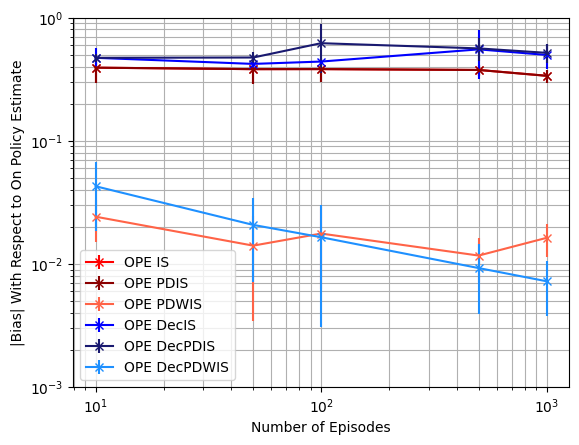

In [ ]:
label = 'bias'
plot_graphs(bias_means, bias_stds, label, 10**-3, 10**0, shorter_D, estimator='IS')

##### Plot Variance

On Policy-----[0.07737208 0.01178436 0.00627668 0.00108904 0.00058899]
OPE IS-----[0.38768346 0.19381303 0.06390391 0.04967188 0.193468  ]
OPE PDIS-----[0.38768346 0.19381303 0.06390391 0.04967188 0.193468  ]
OPE PDWIS-----[1.51367016e-04 1.09352557e-04 8.42035440e-05 8.80453573e-05
 1.89482216e-04]
OPE DecIS-----[0.12816582 0.02745666 0.03389251 1.23370146 0.32043105]
OPE DecPDIS-----[0.05892358 0.04176584 1.84816542 0.40370702 0.10174836]
OPE DecPDWIS-----[0.00154726 0.00042636 0.00034342 0.00014881 0.00012409]


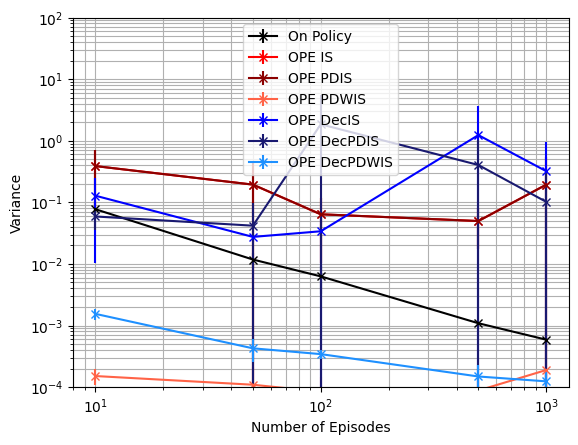

In [ ]:
label = 'var'
plot_graphs(var_means, var_stds, label, 10**(-4), 10**2, shorter_D, estimator='IS')

##### Plot MSE

On Policy-----[0.07737208 0.01178436 0.00627668 0.00108904 0.00058899]
OPE IS-----[0.55037468 0.34800826 0.21559483 0.19203205 0.30849296]
OPE PDIS-----[0.55037468 0.34800826 0.21559483 0.19203205 0.30849296]
OPE PDWIS-----[0.00081685 0.00041986 0.00052624 0.000246   0.00047883]
OPE DecIS-----[0.35959488 0.20547271 0.2274644  1.59265469 0.58068314]
OPE DecPDIS-----[0.28193995 0.26871608 2.30249202 0.73323418 0.37674886]
OPE DecPDWIS-----[0.00396021 0.00103965 0.00079411 0.00026254 0.00018814]


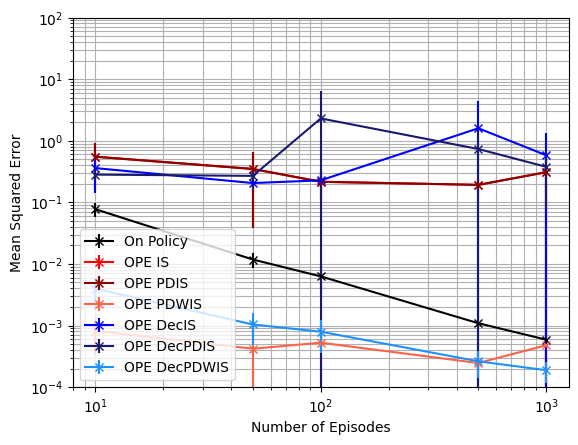

In [ ]:
label = 'MSE'
plot_graphs(MSE_means, MSE_stds, label, 10**(-4), 10**2, shorter_D, estimator='IS')

##### Plot ESS

On Policy-----[  10.   50.  100.  500. 1000.]
OPE IS-----[ 3.88613414 11.80129764 14.94109314 15.75276129 23.5651323 ]
OPE PDIS-----[ 3.88613414 11.80129764 14.94109314 15.75276129 23.5651323 ]
OPE PDWIS-----[ 5357.70537097  9254.9780829  10683.30911723 10392.54573846
  6236.49639227]
OPE DecIS-----[12.44453165 22.60563967 29.3490965  57.40588163 49.6255074 ]
OPE DecPDIS-----[ 17.41772729  42.66247113  41.25228606  53.33266584 123.27610941]
OPE DecPDWIS-----[ 508.80296284 1650.86490701 1740.59228693 4644.97309438 7204.77791579]


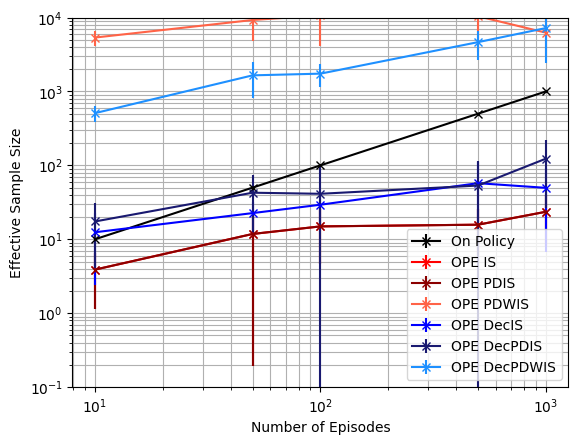

In [ ]:
label = 'ESS'
plot_graphs(ESS_means, ESS_stds, label, 10**(-1), 10**4, shorter_D, estimator='IS')

### Varying Episodes $\epsilon_{e} = 0.4$ (Policy Divergence $4.8^{20}$)

Set up evaluation policy, generate data and convert into factored format

In [ ]:
EVAL_EPSILON = 0.4

evalPolSoft = np.copy(fullPol)
evalPolSoft[evalPolSoft == 1] = 1 - EVAL_EPSILON
evalPolSoft[evalPolSoft == 0] = EVAL_EPSILON / (n_actions - 1)

In [ ]:
# Calculate policy divergence from Voloshin et al.
D = 0
for state in range(randPol.shape[0] - 1):
    for action in range(randPol.shape[1] - 1):
        difference = evalPolSoft[state, action]/randPol[state, action]
        D = max(D, difference)
print(D)
shorter_D = round(D,2)

4.8


In [ ]:
dgen = DataGenerator()
states, actions, lengths, rewards, diab, emp_tx_totals, emp_r_totals = dgen.simulate(
    NSIMSAMPS, NSTEPS, policy=evalPolSoft, policy_idx_type='full',
    p_diabetes=PROB_DIAB, use_tqdm=False) #True, tqdm_desc='Behaviour Policy Simulation')

obs_samps = utils.format_dgen_samps(
    states, actions, rewards, diab, NSTEPS, NSIMSAMPS)

In [ ]:
time = np.arange(NSTEPS)
times = np.stack(axis=0, arrays=[time]*NSIMSAMPS)
times = times[..., np.newaxis]

nf_tr_e = np.concatenate((times, states[:, 0:NSTEPS, :], actions, rewards, states[:, 1:, :]), axis=2)
nf_tr_e.shape

(100000, 20, 5)

In [ ]:
f_tr_e = factorise_dataset(nf_tr_e)

In [ ]:
factored_evalPolSoft = factor_policy(evalPolSoft)

In [ ]:
evalPolSoft = pad_policy(evalPolSoft)

factored_evalPolSoft[0] = pad_policy(factored_evalPolSoft[0])
factored_evalPolSoft[1] = pad_policy(factored_evalPolSoft[1])
factored_evalPolSoft[2] = pad_policy(factored_evalPolSoft[2])

In [ ]:
import policy_estimators as pe
import gc

def evaluate_PE(RUNS, EPISODES, SHORTER_D, STEPS=NSTEPS):

  biases = np.zeros((5, 7))
  variances = np.zeros((5, 7))
  MSEs = np.zeros((5, 7))
  ESSs = np.zeros((5, 7))

  # Reshape data for processing
  T, ldim = nf_tr_b.shape[-2], nf_tr_b.shape[-1]
  nfb = nf_tr_b.reshape((-1, RUNS, EPISODES, T, ldim))
  nfe = nf_tr_e.reshape((-1, RUNS, EPISODES, T, ldim))

  T, D, ldim = f_tr_b.shape[-3], f_tr_b.shape[-2], f_tr_b.shape[-1]
  fb = f_tr_b.reshape((-1, RUNS, EPISODES, T, D, ldim))
  fe = f_tr_e.reshape((-1, RUNS, EPISODES, T, D, ldim))

  for t in range(5):
    print()

    lower_index = 0
    estimates_on_policy = np.zeros(RUNS)
    estimates_OPE_IS = np.zeros(RUNS)
    estimates_OPE_PDIS = np.zeros(RUNS)
    estimates_OPE_PDWIS = np.zeros(RUNS)

    estimates_OPE_DecIS = np.zeros(RUNS)
    estimates_OPE_DecPDIS = np.zeros(RUNS)
    estimates_OPE_DecPDWIS = np.zeros(RUNS)

    for r in range(RUNS):
        #On policy Q estimate
        estimates_on_policy[r] = pe.on_policy_Q_estimate(nfe[t, r, :, :STEPS, :], DISCOUNT_Pol)
        #Off policy IS estimate
        estimates_OPE_IS[r] = pe.off_policy_IS_estimator(nfb[t, r, :, :STEPS, :], DISCOUNT_Pol, randPol, evalPolSoft)
        #Off policy PDIS estimate
        estimates_OPE_PDIS[r] = pe.off_policy_PDIS_estimator(nfb[t, r, :, :STEPS, :], DISCOUNT_Pol, randPol, evalPolSoft)
        #Off policy PDWIS estimate
        estimates_OPE_PDWIS[r] = pe.off_policy_PDWIS_estimator(nfb[t, r, :, :STEPS, :], DISCOUNT_Pol, randPol, evalPolSoft)

        #Factorisation 1----------------------------------

        #Off policy decomposed IS estimate
        estimates_OPE_DecIS[r], _ = pe.off_policy_DecIS_estimator(fb[t, r, :, :STEPS, :, :], DISCOUNT_Pol, [0,1], factored_randPol, factored_evalPolSoft)
        #Off policy decomposed PDIS estimate
        estimates_OPE_DecPDIS[r], _ = pe.off_policy_DecPDIS_estimator(fb[t, r, :, :STEPS, :, :], DISCOUNT_Pol, [0,1], factored_randPol, factored_evalPolSoft)
        #Off policy decomposed PDWIS estimate
        estimates_OPE_DecPDWIS[r], _ = pe.off_policy_DecPDWIS_estimator(fb[t, r, :, :STEPS, :, :], DISCOUNT_Pol, [0,1], factored_randPol, factored_evalPolSoft)


    mean_on_policy = np.mean(estimates_on_policy)
    var_on_policy = np.var(estimates_on_policy, ddof=0)
    print(f'Mean on policy Q estimate: {mean_on_policy}. Variance of on policy Q estimate: {var_on_policy}')

    from sklearn.metrics import mean_squared_error

    #For on policy
    biases[t, 0] = 0.0
    variances[t, 0] = var_on_policy
    MSEs[t, 0] = var_on_policy
    ESSs[t, 0] = EPISODES

    def generate_results(estimates, mean_true, label):
      MSE = mean_squared_error(estimates, [mean_true]*RUNS)
      mean = np.mean(estimates)
      var = np.var(estimates, ddof=0)
      bias1 = np.sqrt(MSE - var)
      bias2 = abs(mean - mean_true)
      print(f'Mean {label} estimate: {mean}. Bias1: {bias1}. Bias2: {bias2}. Variance: {var}. MSE: {MSE}')
      return bias1, var, MSE

    label_list = ['OPE IS', 'OPE PDIS', 'OPE PDWIS',
                  'OPE DecIS', 'OPE DecPDIS', 'OPE DecPDWIS'
                  ]

    estimates = [estimates_OPE_IS, estimates_OPE_PDIS, estimates_OPE_PDWIS,
                estimates_OPE_DecIS, estimates_OPE_DecPDIS, estimates_OPE_DecPDWIS
                ]


    for (id, val) in enumerate(label_list):
      biases[t, 1+id], variances[t, 1+id], MSEs[t, 1+id] = generate_results(estimates[id], mean_on_policy, label_list[id])
      ESSs[t, 1+id] = (EPISODES*variances[t, 0])/variances[t, 1+id]
      gc.collect()

  return np.mean(biases, axis=0), np.std(biases, axis=0), np.mean(variances, axis=0), np.std(variances, axis=0), np.mean(MSEs, axis=0), np.std(MSEs, axis=0), np.mean(ESSs, axis=0), np.std(ESSs, axis=0)

#### Run Everything

In [ ]:
EPISODES = [10, 50, 100, 500, 1000]

bias_means = np.zeros((len(EPISODES), 7))
bias_stds = np.zeros((len(EPISODES), 7))
var_means = np.zeros((len(EPISODES), 7))
var_stds = np.zeros((len(EPISODES), 7))
MSE_means = np.zeros((len(EPISODES), 7))
MSE_stds = np.zeros((len(EPISODES), 7))
ESS_means = np.zeros((len(EPISODES), 7))
ESS_stds = np.zeros((len(EPISODES), 7))

RUNS = 20

for id in range(len(EPISODES)):
  e = EPISODES[id]
  print(f'{e} Episodes, {RUNS} ----------------------------------')
  bias_means[id, :], bias_stds[id, :], var_means[id, :], var_stds[id, :], MSE_means[id, :], MSE_stds[id, :], ESS_means[id, :], ESS_stds[id, :] = evaluate_PE(RUNS=RUNS, EPISODES=e, SHORTER_D=shorter_D)
  print()
  gc.collect()

print('BIAS MEANS')
print(list(bias_means))
print('\nBIAS STDS')
print(list(bias_stds))
print('\nVAR MEANS')
print(list(var_means))
print('\nVAR STDS')
print(list(var_stds))
print('\nMSE MEANS')
print(list(MSE_means))
print('\nMSE STDS')
print(list(MSE_stds))
print('\nESS MEANS')
print(list(ESS_means))
print('\nESS STDS')
print(list(ESS_stds))

10 Episodes, 20 ----------------------------------

Mean on policy Q estimate: -0.46289216430105373. Variance of on policy Q estimate: 0.0605199389186051
Mean OPE IS estimate: -0.48469524896542293. Bias1: 0.021803084664367083. Bias2: 0.0218030846643692. Variance: 0.2420406813957494. MSE: 0.24251605589663097
Mean OPE PDIS estimate: -0.48469524896542293. Bias1: 0.021803084664367083. Bias2: 0.0218030846643692. Variance: 0.2420406813957494. MSE: 0.24251605589663097
Mean OPE PDWIS estimate: -0.03838018214076626. Bias1: 0.4245119821602875. Bias2: 0.42451198216028746. Variance: 0.0001732271020685815. MSE: 0.18038365009972485
Mean OPE DecIS estimate: -0.6575413545004187. Bias1: 0.19464919019936464. Bias2: 0.194649190199365. Variance: 0.3947221099079832. MSE: 0.4326104171532516
Mean OPE DecPDIS estimate: -0.5622558918066635. Bias1: 0.09936372750560965. Bias2: 0.09936372750560973. Variance: 0.1170136007572646. MSE: 0.12688675110107364
Mean OPE DecPDWIS estimate: -0.0436593793342666. Bias1: 0.419

#### Plot Graphs

##### Plot Bias

OPE IS-----[0.15562245 0.24179838 0.2338984  0.25954415 0.19909597]
OPE PDIS-----[0.15562245 0.24179838 0.2338984  0.25954415 0.19909597]
OPE PDWIS-----[0.371586   0.34243073 0.33860591 0.33829615 0.34146547]
OPE DecIS-----[0.10502896 0.11231746 0.14718315 0.18138832 0.16099542]
OPE DecPDIS-----[0.10621444 0.19040472 0.3140354  0.22237488 0.19389768]
OPE DecPDWIS-----[0.35932573 0.33124137 0.32730746 0.32876881 0.32915368]


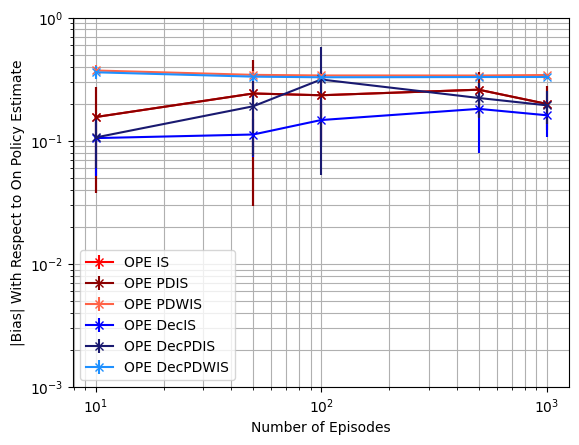

In [ ]:
label = 'bias'
plot_graphs(bias_means, bias_stds, label, 10**-3, 10**0, shorter_D, estimator='IS')

##### Plot Variance

On Policy-----[0.06353155 0.01112607 0.00516854 0.00114151 0.00048273]
OPE IS-----[0.35707738 0.98069417 0.29895132 0.26894163 0.12165356]
OPE PDIS-----[0.35707738 0.98069417 0.29895132 0.26894163 0.12165356]
OPE PDWIS-----[1.13179871e-04 1.00441125e-04 8.39992780e-05 8.15889963e-05
 1.23387038e-04]
OPE DecIS-----[0.12174078 0.02452829 0.06745514 0.24530364 0.07073193]
OPE DecPDIS-----[0.05428427 0.14920836 1.78289246 0.14527624 0.03836853]
OPE DecPDWIS-----[4.16233922e-04 1.36909439e-04 1.36801903e-04 6.91985038e-05
 5.58392867e-05]


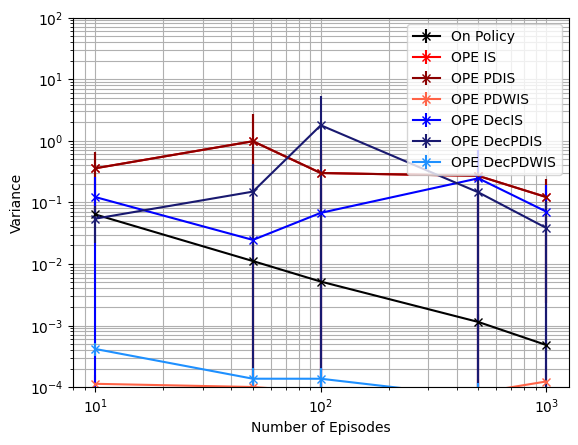

In [ ]:
label = 'var'
plot_graphs(var_means, var_stds, label, 10**(-4), 10**2, shorter_D, estimator='IS')

##### Plot MSE

On Policy-----[0.06353155 0.01112607 0.00516854 0.00114151 0.00048273]
OPE IS-----[0.39514374 1.08424587 0.3717032  0.34730166 0.16730568]
OPE PDIS-----[0.39514374 1.08424587 0.3717032  0.34730166 0.16730568]
OPE PDWIS-----[0.13988404 0.11803006 0.11510573 0.11454541 0.11674403]
OPE DecIS-----[0.1355627  0.03859522 0.09236072 0.28849058 0.09950536]
OPE DecPDIS-----[0.06764895 0.19862092 1.95003305 0.19950556 0.07926417]
OPE DecPDWIS-----[0.13141876 0.11055737 0.10762013 0.10818283 0.10840241]


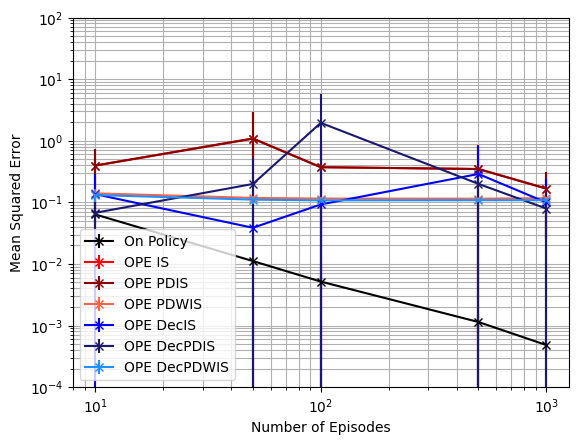

In [ ]:
label = 'MSE'
plot_graphs(MSE_means, MSE_stds, label, 10**(-4), 10**2, shorter_D, estimator='IS')

##### Plot ESS

On Policy-----[  10.   50.  100.  500. 1000.]
OPE IS-----[ 3.6280244  17.52607021 16.40988972 12.25133739 14.15494136]
OPE PDIS-----[ 3.6280244  17.52607021 16.40988972 12.25133739 14.15494136]
OPE PDWIS-----[ 8294.00750393  8093.47376525  8133.97016936 12027.00525179
  6481.22674581]
OPE DecIS-----[10.12692176 24.22266691 30.28700504 67.2771476  68.89190348]
OPE DecPDIS-----[ 15.55759093  36.03160443  37.65927406  56.73709183 129.37950311]
OPE DecPDWIS-----[ 1690.96786284  5627.4882974   4714.2133982  13546.10359137
 18011.03691795]


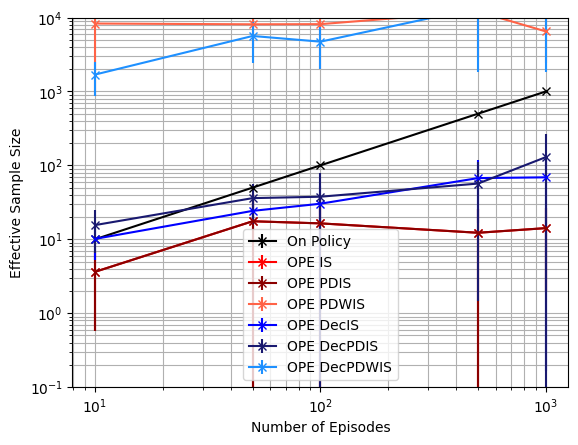

In [ ]:
label = 'ESS'
plot_graphs(ESS_means, ESS_stds, label, 10**(-1), 10**4, shorter_D, estimator='IS')

### Varying Episodes $\epsilon_{e} = 0.6$ (Policy Divergence $3.2^{20}$)

Set up evaluation policy, generate data and convert into factored format

In [ ]:
import gc

gc.collect()
EVAL_EPSILON = 0.6

evalPolSoft = np.copy(fullPol)
evalPolSoft[evalPolSoft == 1] = 1 - EVAL_EPSILON
evalPolSoft[evalPolSoft == 0] = EVAL_EPSILON / (n_actions - 1)

In [ ]:
# Calculate policy divergence from Voloshin et al.
D = 0
for state in range(randPol.shape[0] - 1):
    for action in range(randPol.shape[1] - 1):
        difference = evalPolSoft[state, action]/randPol[state, action]
        D = max(D, difference)
print(D)
shorter_D = round(D,2)

3.2


In [ ]:
dgen = DataGenerator()
states, actions, lengths, rewards, diab, emp_tx_totals, emp_r_totals = dgen.simulate(
    NSIMSAMPS, NSTEPS, policy=evalPolSoft, policy_idx_type='full',
    p_diabetes=PROB_DIAB, use_tqdm=False) #True, tqdm_desc='Behaviour Policy Simulation')

obs_samps = utils.format_dgen_samps(
    states, actions, rewards, diab, NSTEPS, NSIMSAMPS)

In [ ]:
time = np.arange(NSTEPS)
times = np.stack(axis=0, arrays=[time]*NSIMSAMPS)
times = times[..., np.newaxis]

nf_tr_e = np.concatenate((times, states[:, 0:NSTEPS, :], actions, rewards, states[:, 1:, :]), axis=2)
nf_tr_e.shape

(100000, 20, 5)

In [ ]:
f_tr_e = factorise_dataset(nf_tr_e)

In [ ]:
factored_evalPolSoft = factor_policy(evalPolSoft)

In [ ]:
evalPolSoft = pad_policy(evalPolSoft)

factored_evalPolSoft[0] = pad_policy(factored_evalPolSoft[0])
factored_evalPolSoft[1] = pad_policy(factored_evalPolSoft[1])
factored_evalPolSoft[2] = pad_policy(factored_evalPolSoft[2])

In [ ]:
import policy_estimators as pe
import gc

def evaluate_PE(RUNS, EPISODES, SHORTER_D, STEPS=NSTEPS):

  biases = np.zeros((5, 7))
  variances = np.zeros((5, 7))
  MSEs = np.zeros((5, 7))
  ESSs = np.zeros((5, 7))

  # Reshape data for processing
  T, ldim = nf_tr_b.shape[-2], nf_tr_b.shape[-1]
  nfb = nf_tr_b.reshape((-1, RUNS, EPISODES, T, ldim))
  nfe = nf_tr_e.reshape((-1, RUNS, EPISODES, T, ldim))

  T, D, ldim = f_tr_b.shape[-3], f_tr_b.shape[-2], f_tr_b.shape[-1]
  fb = f_tr_b.reshape((-1, RUNS, EPISODES, T, D, ldim))
  fe = f_tr_e.reshape((-1, RUNS, EPISODES, T, D, ldim))

  for t in range(5):
    print()

    lower_index = 0
    estimates_on_policy = np.zeros(RUNS)
    estimates_OPE_IS = np.zeros(RUNS)
    estimates_OPE_PDIS = np.zeros(RUNS)
    estimates_OPE_PDWIS = np.zeros(RUNS)

    estimates_OPE_DecIS = np.zeros(RUNS)
    estimates_OPE_DecPDIS = np.zeros(RUNS)
    estimates_OPE_DecPDWIS = np.zeros(RUNS)

    for r in range(RUNS):
        #On policy Q estimate
        estimates_on_policy[r] = pe.on_policy_Q_estimate(nfe[t, r, :, :STEPS, :], DISCOUNT_Pol)
        #Off policy IS estimate
        estimates_OPE_IS[r] = pe.off_policy_IS_estimator(nfb[t, r, :, :STEPS, :], DISCOUNT_Pol, randPol, evalPolSoft)
        #Off policy PDIS estimate
        estimates_OPE_PDIS[r] = pe.off_policy_PDIS_estimator(nfb[t, r, :, :STEPS, :], DISCOUNT_Pol, randPol, evalPolSoft)
        #Off policy PDWIS estimate
        estimates_OPE_PDWIS[r] = pe.off_policy_PDWIS_estimator(nfb[t, r, :, :STEPS, :], DISCOUNT_Pol, randPol, evalPolSoft)

        #Factorisation 1----------------------------------

        #Off policy decomposed IS estimate
        estimates_OPE_DecIS[r], _ = pe.off_policy_DecIS_estimator(fb[t, r, :, :STEPS, :, :], DISCOUNT_Pol, [0,1], factored_randPol, factored_evalPolSoft)
        #Off policy decomposed PDIS estimate
        estimates_OPE_DecPDIS[r], _ = pe.off_policy_DecPDIS_estimator(fb[t, r, :, :STEPS, :, :], DISCOUNT_Pol, [0,1], factored_randPol, factored_evalPolSoft)
        #Off policy decomposed PDWIS estimate
        estimates_OPE_DecPDWIS[r], _ = pe.off_policy_DecPDWIS_estimator(fb[t, r, :, :STEPS, :, :], DISCOUNT_Pol, [0,1], factored_randPol, factored_evalPolSoft)


    mean_on_policy = np.mean(estimates_on_policy)
    var_on_policy = np.var(estimates_on_policy, ddof=0)
    print(f'Mean on policy Q estimate: {mean_on_policy}. Variance of on policy Q estimate: {var_on_policy}')

    from sklearn.metrics import mean_squared_error

    #For on policy
    biases[t, 0] = 0.0
    variances[t, 0] = var_on_policy
    MSEs[t, 0] = var_on_policy
    ESSs[t, 0] = EPISODES

    def generate_results(estimates, mean_true, label):
      MSE = mean_squared_error(estimates, [mean_true]*RUNS)
      mean = np.mean(estimates)
      var = np.var(estimates, ddof=0)
      bias1 = np.sqrt(MSE - var)
      bias2 = abs(mean - mean_true)
      print(f'Mean {label} estimate: {mean}. Bias1: {bias1}. Bias2: {bias2}. Variance: {var}. MSE: {MSE}')
      return bias1, var, MSE

    label_list = ['OPE IS', 'OPE PDIS', 'OPE PDWIS',
                  'OPE DecIS', 'OPE DecPDIS', 'OPE DecPDWIS'
                  ]

    estimates = [estimates_OPE_IS, estimates_OPE_PDIS, estimates_OPE_PDWIS,
                estimates_OPE_DecIS, estimates_OPE_DecPDIS, estimates_OPE_DecPDWIS
                ]


    for (id, val) in enumerate(label_list):
      biases[t, 1+id], variances[t, 1+id], MSEs[t, 1+id] = generate_results(estimates[id], mean_on_policy, label_list[id])
      ESSs[t, 1+id] = (EPISODES*variances[t, 0])/variances[t, 1+id]
      gc.collect()

  return np.mean(biases, axis=0), np.std(biases, axis=0), np.mean(variances, axis=0), np.std(variances, axis=0), np.mean(MSEs, axis=0), np.std(MSEs, axis=0), np.mean(ESSs, axis=0), np.std(ESSs, axis=0)

#### Run Everything

In [ ]:
EPISODES = [10, 50, 100, 500, 1000]

bias_means = np.zeros((len(EPISODES), 7))
bias_stds = np.zeros((len(EPISODES), 7))
var_means = np.zeros((len(EPISODES), 7))
var_stds = np.zeros((len(EPISODES), 7))
MSE_means = np.zeros((len(EPISODES), 7))
MSE_stds = np.zeros((len(EPISODES), 7))
ESS_means = np.zeros((len(EPISODES), 7))
ESS_stds = np.zeros((len(EPISODES), 7))

RUNS = 20

for id in range(len(EPISODES)):
  e = EPISODES[id]
  print(f'{e} Episodes, {RUNS} ----------------------------------')
  bias_means[id, :], bias_stds[id, :], var_means[id, :], var_stds[id, :], MSE_means[id, :], MSE_stds[id, :], ESS_means[id, :], ESS_stds[id, :] = evaluate_PE(RUNS=RUNS, EPISODES=e, SHORTER_D=shorter_D)
  print()
  gc.collect()

print('BIAS MEANS')
print(list(bias_means))
print('\nBIAS STDS')
print(list(bias_stds))
print('\nVAR MEANS')
print(list(var_means))
print('\nVAR STDS')
print(list(var_stds))
print('\nMSE MEANS')
print(list(MSE_means))
print('\nMSE STDS')
print(list(MSE_stds))
print('\nESS MEANS')
print(list(ESS_means))
print('\nESS STDS')
print(list(ESS_stds))

10 Episodes, 20 ----------------------------------

Mean on policy Q estimate: -0.6887826848352858. Variance of on policy Q estimate: 0.025240064679471687
Mean OPE IS estimate: -0.6039957831384305. Bias1: 0.08478690169685536. Bias2: 0.08478690169685532. Variance: 0.08318374946321909. MSE: 0.0903725681625713
Mean OPE PDIS estimate: -0.6039957831384305. Bias1: 0.08478690169685536. Bias2: 0.08478690169685532. Variance: 0.08318374946321909. MSE: 0.0903725681625713
Mean OPE PDWIS estimate: -0.039422230143490715. Bias1: 0.6493604546917952. Bias2: 0.6493604546917952. Variance: 0.00015584668139205762. MSE: 0.42182484679892696
Mean OPE DecIS estimate: -0.6483388885409238. Bias1: 0.04044379629436216. Bias2: 0.04044379629436201. Variance: 0.21492803726614018. MSE: 0.21656373792484004
Mean OPE DecPDIS estimate: -0.5978968909956341. Bias1: 0.09088579383965163. Bias2: 0.09088579383965167. Variance: 0.08043448894126225. MSE: 0.0886947164631259
Mean OPE DecPDWIS estimate: -0.035026773553303615. Bias1:

#### Plot Graphs

##### Plot Bias

OPE IS-----[0.14286401 0.09693784 0.10267539 0.13542934 0.10638019]
OPE PDIS-----[0.14286401 0.09693784 0.10267539 0.13542934 0.10638019]
OPE PDWIS-----[0.61820119 0.61221843 0.60923442 0.60393562 0.60347008]
OPE DecIS-----[0.11820017 0.11839291 0.09879265 0.09529658 0.09851749]
OPE DecPDIS-----[0.11200113 0.11109584 0.0922518  0.06510596 0.07379173]
OPE DecPDWIS-----[0.61986326 0.61299301 0.61024989 0.60607217 0.60425337]


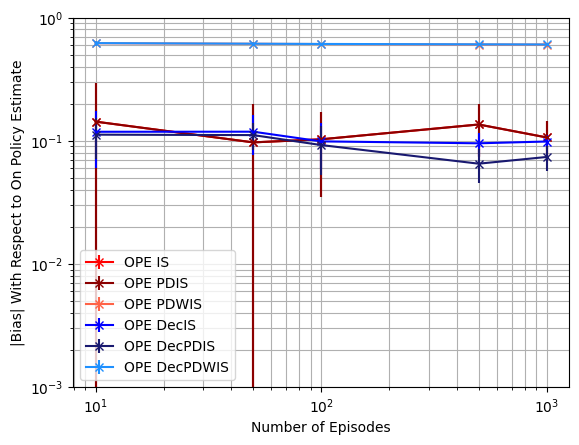

In [ ]:
label = 'bias'
plot_graphs(bias_means, bias_stds, label, 10**(-3), 10**0, shorter_D, estimator='IS')

##### Plot Variance

On Policy-----[0.03433382 0.00842766 0.0030815  0.00057761 0.00032417]
OPE IS-----[0.48977901 0.24437323 0.10023542 0.10920198 0.04025083]
OPE PDIS-----[0.48977901 0.24437323 0.10023542 0.10920198 0.04025083]
OPE PDWIS-----[1.14619570e-04 7.41894250e-05 5.56543978e-05 3.58259905e-05
 3.48470208e-05]
OPE DecIS-----[0.07260476 0.02150063 0.0355123  0.01641498 0.00630485]
OPE DecPDIS-----[0.03853766 0.09100524 0.2367508  0.01641393 0.00509607]
OPE DecPDWIS-----[1.06521352e-04 4.34779621e-05 4.94013356e-05 1.75865815e-05
 1.06937163e-05]


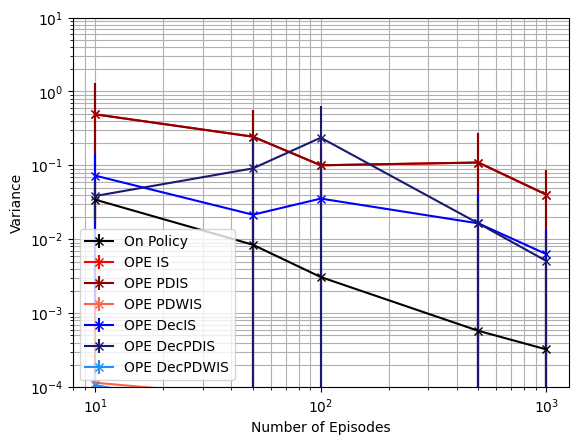

In [ ]:
label = 'var'
plot_graphs(var_means, var_stds, label, 10**(-4), 10**1, shorter_D, estimator='IS')

##### Plot MSE

On Policy-----[0.03433382 0.00842766 0.0030815  0.00057761 0.00032417]
OPE IS-----[0.53265791 0.26399822 0.11538196 0.13130926 0.05303852]
OPE PDIS-----[0.53265791 0.26399822 0.11538196 0.13130926 0.05303852]
OPE PDWIS-----[0.38301751 0.37513098 0.3713325  0.36481783 0.36423942]
OPE DecIS-----[0.08989466 0.03730535 0.04681745 0.02592679 0.01616023]
OPE DecPDIS-----[0.05281007 0.10409453 0.24681825 0.02105317 0.01082796]
OPE DecPDWIS-----[0.38513653 0.3760643  0.37257218 0.36737089 0.36516097]


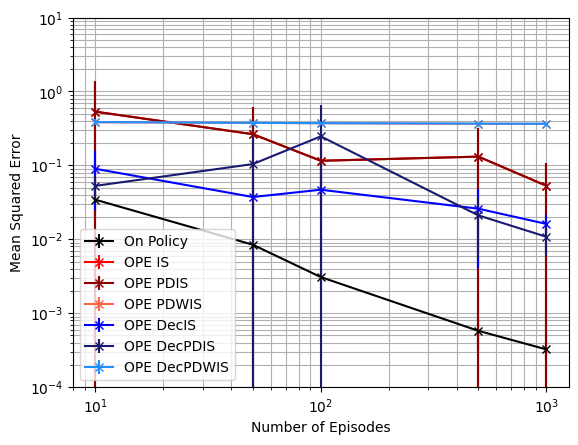

In [ ]:
label = 'MSE'
plot_graphs(MSE_means, MSE_stds, label, 10**(-4), 10**1, shorter_D, estimator='IS')

##### Plot ESS

On Policy-----[  10.   50.  100.  500. 1000.]
OPE IS-----[ 5.36293464 10.68406374 12.43065417 12.26906162 17.71125209]
OPE PDIS-----[ 5.36293464 10.68406374 12.43065417 12.26906162 17.71125209]
OPE PDWIS-----[ 3058.16122535 10218.08474257  9955.31614453 14088.93987045
 13606.44623169]
OPE DecIS-----[  8.35322588  29.47895345  35.24525937  73.79802929 114.4391554 ]
OPE DecPDIS-----[ 11.04984672  39.78450981  37.55592666  76.87943441 191.39236163]
OPE DecPDWIS-----[ 3623.99125609 14018.0882608  11777.85794815 30596.7761887
 68818.42210404]


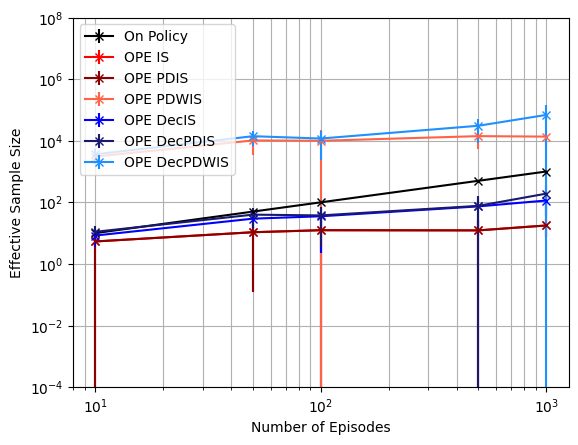

In [ ]:
label = 'ESS'
plot_graphs(ESS_means, ESS_stds, label, 10**(-4), 10**8, shorter_D, estimator='IS')

### Varying Episodes $\epsilon_{e} = 0.8$ (Policy Divergence $1.6^{20}$)



Set up evaluation policy, generate data and convert into factored format

In [ ]:
import gc
gc.collect()
EVAL_EPSILON = 0.8

evalPolSoft = np.copy(fullPol)
evalPolSoft[evalPolSoft == 1] = 1 - EVAL_EPSILON
evalPolSoft[evalPolSoft == 0] = EVAL_EPSILON / (n_actions - 1)

In [ ]:
# Calculate policy divergence from Voloshin et al.
D = 0
for state in range(randPol.shape[0] - 1):
    for action in range(randPol.shape[1] - 1):
        difference = evalPolSoft[state, action]/randPol[state, action]
        D = max(D, difference)
print(D)
shorter_D = round(D,2)

1.5999999999999996


In [ ]:
dgen = DataGenerator()
states, actions, lengths, rewards, diab, emp_tx_totals, emp_r_totals = dgen.simulate(
    NSIMSAMPS, NSTEPS, policy=evalPolSoft, policy_idx_type='full',
    p_diabetes=PROB_DIAB, use_tqdm=False) #True, tqdm_desc='Behaviour Policy Simulation')

obs_samps = utils.format_dgen_samps(
    states, actions, rewards, diab, NSTEPS, NSIMSAMPS)

In [ ]:
time = np.arange(NSTEPS)
times = np.stack(axis=0, arrays=[time]*NSIMSAMPS)
times = times[..., np.newaxis]

nf_tr_e = np.concatenate((times, states[:, 0:NSTEPS, :], actions, rewards, states[:, 1:, :]), axis=2)
nf_tr_e.shape

(100000, 20, 5)

In [ ]:
f_tr_e = factorise_dataset(nf_tr_e)

In [ ]:
factored_evalPolSoft = factor_policy(evalPolSoft)

In [ ]:
evalPolSoft = pad_policy(evalPolSoft)

factored_evalPolSoft[0] = pad_policy(factored_evalPolSoft[0])
factored_evalPolSoft[1] = pad_policy(factored_evalPolSoft[1])
factored_evalPolSoft[2] = pad_policy(factored_evalPolSoft[2])

In [ ]:
import policy_estimators as pe
import gc

def evaluate_PE(RUNS, EPISODES, SHORTER_D, STEPS=NSTEPS):

  biases = np.zeros((5, 7))
  variances = np.zeros((5, 7))
  MSEs = np.zeros((5, 7))
  ESSs = np.zeros((5, 7))

  # Reshape data for processing
  T, ldim = nf_tr_b.shape[-2], nf_tr_b.shape[-1]
  nfb = nf_tr_b.reshape((-1, RUNS, EPISODES, T, ldim))
  nfe = nf_tr_e.reshape((-1, RUNS, EPISODES, T, ldim))

  T, D, ldim = f_tr_b.shape[-3], f_tr_b.shape[-2], f_tr_b.shape[-1]
  fb = f_tr_b.reshape((-1, RUNS, EPISODES, T, D, ldim))
  fe = f_tr_e.reshape((-1, RUNS, EPISODES, T, D, ldim))

  for t in range(5):
    print()

    lower_index = 0
    estimates_on_policy = np.zeros(RUNS)
    estimates_OPE_IS = np.zeros(RUNS)
    estimates_OPE_PDIS = np.zeros(RUNS)
    estimates_OPE_PDWIS = np.zeros(RUNS)

    estimates_OPE_DecIS = np.zeros(RUNS)
    estimates_OPE_DecPDIS = np.zeros(RUNS)
    estimates_OPE_DecPDWIS = np.zeros(RUNS)

    for r in range(RUNS):
        #On policy Q estimate
        estimates_on_policy[r] = pe.on_policy_Q_estimate(nfe[t, r, :, :STEPS, :], DISCOUNT_Pol)
        #Off policy IS estimate
        estimates_OPE_IS[r] = pe.off_policy_IS_estimator(nfb[t, r, :, :STEPS, :], DISCOUNT_Pol, randPol, evalPolSoft)
        #Off policy PDIS estimate
        estimates_OPE_PDIS[r] = pe.off_policy_PDIS_estimator(nfb[t, r, :, :STEPS, :], DISCOUNT_Pol, randPol, evalPolSoft)
        #Off policy PDWIS estimate
        estimates_OPE_PDWIS[r] = pe.off_policy_PDWIS_estimator(nfb[t, r, :, :STEPS, :], DISCOUNT_Pol, randPol, evalPolSoft)

        #Factorisation 1----------------------------------

        #Off policy decomposed IS estimate
        estimates_OPE_DecIS[r], _ = pe.off_policy_DecIS_estimator(fb[t, r, :, :STEPS, :, :], DISCOUNT_Pol, [0,1], factored_randPol, factored_evalPolSoft)
        #Off policy decomposed PDIS estimate
        estimates_OPE_DecPDIS[r], _ = pe.off_policy_DecPDIS_estimator(fb[t, r, :, :STEPS, :, :], DISCOUNT_Pol, [0,1], factored_randPol, factored_evalPolSoft)
        #Off policy decomposed PDWIS estimate
        estimates_OPE_DecPDWIS[r], _ = pe.off_policy_DecPDWIS_estimator(fb[t, r, :, :STEPS, :, :], DISCOUNT_Pol, [0,1], factored_randPol, factored_evalPolSoft)


    mean_on_policy = np.mean(estimates_on_policy)
    var_on_policy = np.var(estimates_on_policy, ddof=0)
    print(f'Mean on policy Q estimate: {mean_on_policy}. Variance of on policy Q estimate: {var_on_policy}')

    from sklearn.metrics import mean_squared_error

    #For on policy
    biases[t, 0] = 0.0
    variances[t, 0] = var_on_policy
    MSEs[t, 0] = var_on_policy
    ESSs[t, 0] = EPISODES

    def generate_results(estimates, mean_true, label):
      MSE = mean_squared_error(estimates, [mean_true]*RUNS)
      mean = np.mean(estimates)
      var = np.var(estimates, ddof=0)
      bias1 = np.sqrt(MSE - var)
      bias2 = abs(mean - mean_true)
      print(f'Mean {label} estimate: {mean}. Bias1: {bias1}. Bias2: {bias2}. Variance: {var}. MSE: {MSE}')
      return bias1, var, MSE

    label_list = ['OPE IS', 'OPE PDIS', 'OPE PDWIS',
                  'OPE DecIS', 'OPE DecPDIS', 'OPE DecPDWIS'
                  ]

    estimates = [estimates_OPE_IS, estimates_OPE_PDIS, estimates_OPE_PDWIS,
                estimates_OPE_DecIS, estimates_OPE_DecPDIS, estimates_OPE_DecPDWIS
                ]


    for (id, val) in enumerate(label_list):
      biases[t, 1+id], variances[t, 1+id], MSEs[t, 1+id] = generate_results(estimates[id], mean_on_policy, label_list[id])
      ESSs[t, 1+id] = (EPISODES*variances[t, 0])/variances[t, 1+id]
      gc.collect()

  return np.mean(biases, axis=0), np.std(biases, axis=0), np.mean(variances, axis=0), np.std(variances, axis=0), np.mean(MSEs, axis=0), np.std(MSEs, axis=0), np.mean(ESSs, axis=0), np.std(ESSs, axis=0)

#### Run Everything

In [ ]:
EPISODES = [10, 50, 100, 500, 1000]

bias_means = np.zeros((len(EPISODES), 7))
bias_stds = np.zeros((len(EPISODES), 7))
var_means = np.zeros((len(EPISODES), 7))
var_stds = np.zeros((len(EPISODES), 7))
MSE_means = np.zeros((len(EPISODES), 7))
MSE_stds = np.zeros((len(EPISODES), 7))
ESS_means = np.zeros((len(EPISODES), 7))
ESS_stds = np.zeros((len(EPISODES), 7))

RUNS = 20

for id in range(len(EPISODES)):
  e = EPISODES[id]
  print(f'{e} Episodes, {RUNS} ----------------------------------')
  bias_means[id, :], bias_stds[id, :], var_means[id, :], var_stds[id, :], MSE_means[id, :], MSE_stds[id, :], ESS_means[id, :], ESS_stds[id, :] = evaluate_PE(RUNS=RUNS, EPISODES=e, SHORTER_D=shorter_D)
  print()
  gc.collect()

print('BIAS MEANS')
print(list(bias_means))
print('\nBIAS STDS')
print(list(bias_stds))
print('\nVAR MEANS')
print(list(var_means))
print('\nVAR STDS')
print(list(var_stds))
print('\nMSE MEANS')
print(list(MSE_means))
print('\nMSE STDS')
print(list(MSE_stds))
print('\nESS MEANS')
print(list(ESS_means))
print('\nESS STDS')
print(list(ESS_stds))

10 Episodes, 20 ----------------------------------

Mean on policy Q estimate: -0.7961807555648337. Variance of on policy Q estimate: 0.03136834045472117
Mean OPE IS estimate: -0.8232098088500347. Bias1: 0.027029053285201023. Bias2: 0.027029053285201. Variance: 0.02096417324753628. MSE: 0.021694742969030515
Mean OPE PDIS estimate: -0.8232098088500347. Bias1: 0.027029053285201023. Bias2: 0.027029053285201. Variance: 0.02096417324753628. MSE: 0.021694742969030515
Mean OPE PDWIS estimate: -0.04274634918908521. Bias1: 0.7534344063757484. Bias2: 0.7534344063757485. Variance: 4.39666655241112e-05. MSE: 0.5677073713763006
Mean OPE DecIS estimate: -0.6096694824441634. Bias1: 0.1865112731206702. Bias2: 0.18651127312067028. Variance: 0.01668534706013888. MSE: 0.05147180206123211
Mean OPE DecPDIS estimate: -0.6045903229837617. Bias1: 0.19159043258107192. Bias2: 0.191590432581072. Variance: 0.012516730514182974. MSE: 0.049223624370785236
Mean OPE DecPDWIS estimate: -0.029970184332686906. Bias1: 0.

#### Plot Graphs

##### Plot Bias

OPE IS-----[0.04605337 0.01633722 0.02326615 0.02081452 0.01759052]
OPE PDIS-----[0.04605337 0.01633722 0.02326615 0.02081452 0.01759052]
OPE PDWIS-----[0.77181173 0.77990683 0.77813002 0.779789   0.78077959]
OPE DecIS-----[0.24092244 0.25600242 0.25101356 0.2522788  0.25439493]
OPE DecPDIS-----[0.2363832  0.24758573 0.24413795 0.24622651 0.24853943]
OPE DecPDWIS-----[0.78407934 0.7917121  0.7902754  0.79208236 0.79298386]


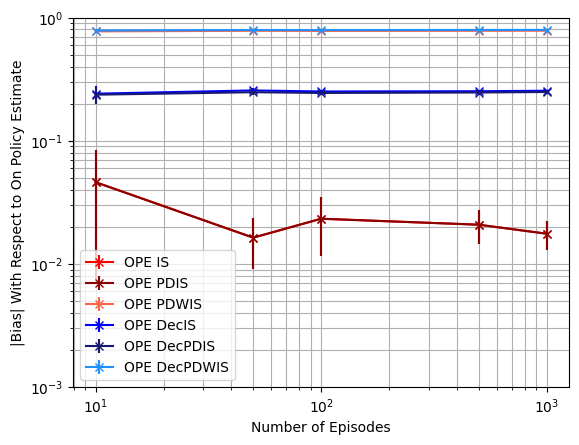

In [ ]:
label = 'bias'
plot_graphs(bias_means, bias_stds, label, 10**(-3), 10**0, shorter_D, estimator='IS')

##### Plot Variance

On Policy-----[0.02192754 0.00365198 0.00206724 0.00035839 0.00013606]
OPE IS-----[0.02441733 0.00713322 0.00377071 0.00078386 0.00035633]
OPE PDIS-----[0.02441733 0.00713322 0.00377071 0.00078386 0.00035633]
OPE PDWIS-----[4.23808035e-05 1.33238251e-05 5.85375986e-06 1.16430678e-06
 7.58661790e-07]
OPE DecIS-----[0.01098853 0.00331807 0.00149917 0.00030845 0.00016397]
OPE DecPDIS-----[0.00967177 0.00321916 0.0013758  0.00027684 0.00014212]
OPE DecPDWIS-----[2.03373440e-05 5.21318457e-06 2.66788187e-06 4.94561772e-07
 2.84010107e-07]


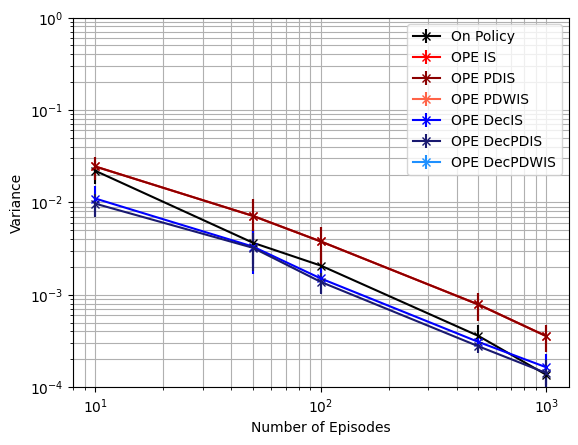

In [ ]:
label = 'var'
plot_graphs(var_means, var_stds, label, 10**(-4), 10**0, shorter_D, estimator='IS')

##### Plot MSE

On Policy-----[0.02192754 0.00365198 0.00206724 0.00035839 0.00013606]
OPE IS-----[0.0280162  0.00745295 0.00444839 0.00125843 0.00068783]
OPE PDIS-----[0.0280162  0.00745295 0.00444839 0.00125843 0.00068783]
OPE PDWIS-----[0.59601905 0.60834879 0.60550664 0.60808037 0.6096378 ]
OPE DecIS-----[0.070554   0.06898124 0.06457829 0.06396711 0.06490798]
OPE DecPDIS-----[0.06693152 0.06465923 0.06104782 0.06092172 0.06194181]
OPE DecPDWIS-----[0.61505894 0.62689185 0.62455101 0.62740322 0.62884381]


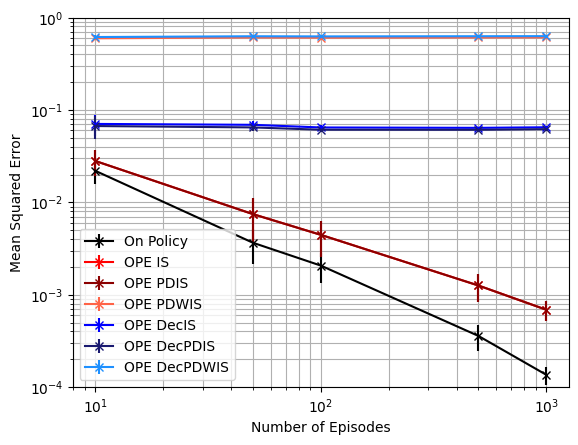

In [ ]:
label = 'MSE'
plot_graphs(MSE_means, MSE_stds, label, 10**(-4), 10**0, shorter_D, estimator='IS')

##### Plot ESS

On Policy-----[  10.   50.  100.  500. 1000.]
OPE IS-----[ 10.56064433  30.20964114  69.14316675 251.60119317 405.91251381]
OPE PDIS-----[ 10.56064433  30.20964114  69.14316675 251.60119317 405.91251381]
OPE PDWIS-----[  5665.34049685  15129.38901055  42567.49828378 190738.68915274
 190212.23334329]
OPE DecIS-----[ 21.67380669  63.54808637 165.96898792 603.26139957 884.04050673]
OPE DecPDIS-----[  24.12239835   65.99690169  172.69097333  683.45263198 1040.62565681]
OPE DecPDWIS-----[ 14219.66321946  37822.49446048  91467.87902619 380946.93356639
 503661.32707993]


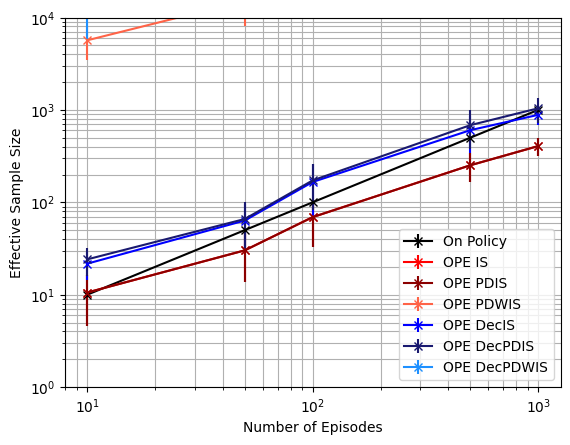

In [ ]:
label = 'ESS'
plot_graphs(ESS_means, ESS_stds, label, 10**(0), 10**4, shorter_D, estimator='IS')

On Policy-----[  10.   50.  100.  500. 1000.]
OPE IS-----[ 10.56064433  30.20964114  69.14316675 251.60119317 405.91251381]
OPE PDIS-----[ 10.56064433  30.20964114  69.14316675 251.60119317 405.91251381]
OPE PDWIS-----[  5665.34049685  15129.38901055  42567.49828378 190738.68915274
 190212.23334329]
OPE DecIS-----[ 21.67380669  63.54808637 165.96898792 603.26139957 884.04050673]
OPE DecPDIS-----[  24.12239835   65.99690169  172.69097333  683.45263198 1040.62565681]
OPE DecPDWIS-----[ 14219.66321946  37822.49446048  91467.87902619 380946.93356639
 503661.32707993]


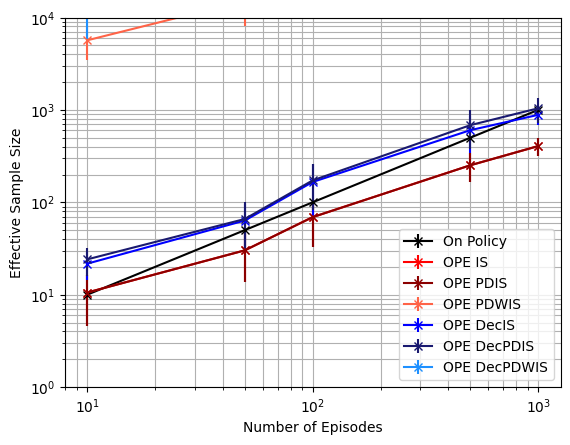

In [ ]:
plot_graphs(ESS_means, ESS_stds, label, 10**(0), 10**4, shorter_D, estimator='PDIS')

On Policy-----[  10.   50.  100.  500. 1000.]
OPE IS-----[ 10.56064433  30.20964114  69.14316675 251.60119317 405.91251381]
OPE PDIS-----[ 10.56064433  30.20964114  69.14316675 251.60119317 405.91251381]
OPE PDWIS-----[  5665.34049685  15129.38901055  42567.49828378 190738.68915274
 190212.23334329]
OPE DecIS-----[ 21.67380669  63.54808637 165.96898792 603.26139957 884.04050673]
OPE DecPDIS-----[  24.12239835   65.99690169  172.69097333  683.45263198 1040.62565681]
OPE DecPDWIS-----[ 14219.66321946  37822.49446048  91467.87902619 380946.93356639
 503661.32707993]


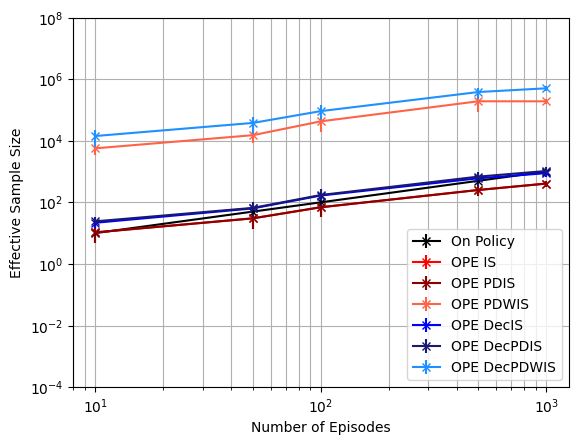

In [ ]:
plot_graphs(ESS_means, ESS_stds, label, 10**(-4), 10**(8), shorter_D, estimator='PDWIS')

### Varying Episode Length $T$ With $\epsilon_{e} = 0.8$ (Policy Divergence $1.6^{T}$)

Set up evaluation policy, generate data and convert into factored format

In [ ]:
import gc

gc.collect()
EVAL_EPSILON = 0.8

evalPolSoft = np.copy(fullPol)
evalPolSoft[evalPolSoft == 1] = 1 - EVAL_EPSILON
evalPolSoft[evalPolSoft == 0] = EVAL_EPSILON / (n_actions - 1)

In [ ]:
# Calculate policy divergence from Voloshin et al.
D = 0
for state in range(randPol.shape[0] - 1):
    for action in range(randPol.shape[1] - 1):
        difference = evalPolSoft[state, action]/randPol[state, action]
        D = max(D, difference)
print(D)
shorter_D = round(D,2)

1.5999999999999996


In [ ]:
dgen = DataGenerator()
states, actions, lengths, rewards, diab, emp_tx_totals, emp_r_totals = dgen.simulate(
    NSIMSAMPS, NSTEPS, policy=evalPolSoft, policy_idx_type='full',
    p_diabetes=PROB_DIAB, use_tqdm=False) #True, tqdm_desc='Behaviour Policy Simulation')

obs_samps = utils.format_dgen_samps(
    states, actions, rewards, diab, NSTEPS, NSIMSAMPS)

In [ ]:
time = np.arange(NSTEPS)
times = np.stack(axis=0, arrays=[time]*NSIMSAMPS)
times = times[..., np.newaxis]

nf_tr_e = np.concatenate((times, states[:, 0:NSTEPS, :], actions, rewards, states[:, 1:, :]), axis=2)
nf_tr_e.shape

(100000, 20, 5)

In [ ]:
f_tr_e = factorise_dataset(nf_tr_e)

In [ ]:
factored_evalPolSoft = factor_policy(evalPolSoft)

In [ ]:
evalPolSoft = pad_policy(evalPolSoft)

factored_evalPolSoft[0] = pad_policy(factored_evalPolSoft[0])
factored_evalPolSoft[1] = pad_policy(factored_evalPolSoft[1])
factored_evalPolSoft[2] = pad_policy(factored_evalPolSoft[2])

In [ ]:
import policy_estimators as pe
import gc

def evaluate_PE(RUNS, EPISODES, SHORTER_D, STEPS=NSTEPS):

  biases = np.zeros((5, 7))
  variances = np.zeros((5, 7))
  MSEs = np.zeros((5, 7))
  ESSs = np.zeros((5, 7))

  # Reshape data for processing
  T, ldim = nf_tr_b.shape[-2], nf_tr_b.shape[-1]
  nfb = nf_tr_b.reshape((-1, RUNS, EPISODES, T, ldim))
  nfe = nf_tr_e.reshape((-1, RUNS, EPISODES, T, ldim))

  T, D, ldim = f_tr_b.shape[-3], f_tr_b.shape[-2], f_tr_b.shape[-1]
  fb = f_tr_b.reshape((-1, RUNS, EPISODES, T, D, ldim))
  fe = f_tr_e.reshape((-1, RUNS, EPISODES, T, D, ldim))

  for t in range(5):
    print()

    lower_index = 0
    estimates_on_policy = np.zeros(RUNS)
    estimates_OPE_IS = np.zeros(RUNS)
    estimates_OPE_PDIS = np.zeros(RUNS)
    estimates_OPE_PDWIS = np.zeros(RUNS)

    estimates_OPE_DecIS = np.zeros(RUNS)
    estimates_OPE_DecPDIS = np.zeros(RUNS)
    estimates_OPE_DecPDWIS = np.zeros(RUNS)

    for r in range(RUNS):
        #On policy Q estimate
        estimates_on_policy[r] = pe.on_policy_Q_estimate(nfe[t, r, :, :STEPS, :], DISCOUNT_Pol)
        #Off policy IS estimate
        estimates_OPE_IS[r] = pe.off_policy_IS_estimator(nfb[t, r, :, :STEPS, :], DISCOUNT_Pol, randPol, evalPolSoft)
        #Off policy PDIS estimate
        estimates_OPE_PDIS[r] = pe.off_policy_PDIS_estimator(nfb[t, r, :, :STEPS, :], DISCOUNT_Pol, randPol, evalPolSoft)
        #Off policy PDWIS estimate
        estimates_OPE_PDWIS[r] = pe.off_policy_PDWIS_estimator(nfb[t, r, :, :STEPS, :], DISCOUNT_Pol, randPol, evalPolSoft)

        #Factorisation 1----------------------------------

        #Off policy decomposed IS estimate
        estimates_OPE_DecIS[r], _ = pe.off_policy_DecIS_estimator(fb[t, r, :, :STEPS, :, :], DISCOUNT_Pol, [0,1], factored_randPol, factored_evalPolSoft)
        #Off policy decomposed PDIS estimate
        estimates_OPE_DecPDIS[r], _ = pe.off_policy_DecPDIS_estimator(fb[t, r, :, :STEPS, :, :], DISCOUNT_Pol, [0,1], factored_randPol, factored_evalPolSoft)
        #Off policy decomposed PDWIS estimate
        estimates_OPE_DecPDWIS[r], _ = pe.off_policy_DecPDWIS_estimator(fb[t, r, :, :STEPS, :, :], DISCOUNT_Pol, [0,1], factored_randPol, factored_evalPolSoft)


    mean_on_policy = np.mean(estimates_on_policy)
    var_on_policy = np.var(estimates_on_policy, ddof=0)
    print(f'Mean on policy Q estimate: {mean_on_policy}. Variance of on policy Q estimate: {var_on_policy}')

    from sklearn.metrics import mean_squared_error

    #For on policy
    biases[t, 0] = 0.0
    variances[t, 0] = var_on_policy
    MSEs[t, 0] = var_on_policy
    ESSs[t, 0] = EPISODES

    def generate_results(estimates, mean_true, label):
      MSE = mean_squared_error(estimates, [mean_true]*RUNS)
      mean = np.mean(estimates)
      var = np.var(estimates, ddof=0)
      bias1 = np.sqrt(MSE - var)
      bias2 = abs(mean - mean_true)
      print(f'Mean {label} estimate: {mean}. Bias1: {bias1}. Bias2: {bias2}. Variance: {var}. MSE: {MSE}')
      return bias1, var, MSE

    label_list = ['OPE IS', 'OPE PDIS', 'OPE PDWIS',
                  'OPE DecIS', 'OPE DecPDIS', 'OPE DecPDWIS'
                  ]

    estimates = [estimates_OPE_IS, estimates_OPE_PDIS, estimates_OPE_PDWIS,
                estimates_OPE_DecIS, estimates_OPE_DecPDIS, estimates_OPE_DecPDWIS
                ]


    for (id, val) in enumerate(label_list):
      biases[t, 1+id], variances[t, 1+id], MSEs[t, 1+id] = generate_results(estimates[id], mean_on_policy, label_list[id])
      ESSs[t, 1+id] = (EPISODES*variances[t, 0])/variances[t, 1+id]
      gc.collect()

  return np.mean(biases, axis=0), np.std(biases, axis=0), np.mean(variances, axis=0), np.std(variances, axis=0), np.mean(MSEs, axis=0), np.std(MSEs, axis=0), np.mean(ESSs, axis=0), np.std(ESSs, axis=0)

#### Run Everything

In [ ]:
STEPS = [1, 2, 5, 10, 15, 20]

bias_means = np.zeros((len(STEPS), 7))
bias_stds = np.zeros((len(STEPS), 7))
var_means = np.zeros((len(STEPS), 7))
var_stds = np.zeros((len(STEPS), 7))
MSE_means = np.zeros((len(STEPS), 7))
MSE_stds = np.zeros((len(STEPS), 7))
ESS_means = np.zeros((len(STEPS), 7))
ESS_stds = np.zeros((len(STEPS), 7))

RUNS = 20

for id in range(len(STEPS)):
  e = STEPS[id]
  print(f'{e} Steps, {RUNS} ----------------------------------')
  bias_means[id, :], bias_stds[id, :], var_means[id, :], var_stds[id, :], MSE_means[id, :], MSE_stds[id, :], ESS_means[id, :], ESS_stds[id, :] = evaluate_PE(RUNS=RUNS, EPISODES=1000, STEPS=e, SHORTER_D=shorter_D)
  print()
  gc.collect()

print('BIAS MEANS')
print(list(bias_means))
print('\nBIAS STDS')
print(list(bias_stds))
print('\nVAR MEANS')
print(list(var_means))
print('\nVAR STDS')
print(list(var_stds))
print('\nMSE MEANS')
print(list(MSE_means))
print('\nMSE STDS')
print(list(MSE_stds))
print('\nESS MEANS')
print(list(ESS_means))
print('\nESS STDS')
print(list(ESS_stds))

1 Steps, 20 ----------------------------------

Mean on policy Q estimate: -0.3335. Variance of on policy Q estimate: 0.00030245
Mean OPE IS estimate: -0.3441142857142858. Bias1: 0.01061428571428574. Bias2: 0.010614285714285798. Variance: 0.0001725413877551023. MSE: 0.0002852044489795926
Mean OPE PDIS estimate: -0.3441142857142858. Bias1: 0.01061428571428574. Bias2: 0.010614285714285798. Variance: 0.0001725413877551023. MSE: 0.0002852044489795926
Mean OPE PDWIS estimate: -0.3435525319926271. Bias1: 0.010052531992627067. Bias2: 0.010052531992627067. Variance: 0.0002017269751550494. MSE: 0.0003027803746178401
Mean OPE DecIS estimate: -0.24397575757575757. Bias1: 0.08952424242424246. Bias2: 0.08952424242424245. Variance: 8.66576308539945e-05. MSE: 0.008101247612488528
Mean OPE DecPDIS estimate: -0.24397575757575757. Bias1: 0.08952424242424246. Bias2: 0.08952424242424245. Variance: 8.66576308539945e-05. MSE: 0.008101247612488528
Mean OPE DecPDWIS estimate: -0.24393382106131675. Bias1: 0.08

#### Plot Graphs

##### Plot Bias

OPE IS-----[0.01020286 0.01236595 0.014787   0.01447875 0.01441808 0.01703005]
OPE PDIS-----[0.01020286 0.01236595 0.014787   0.01447875 0.01441808 0.01703005]
OPE PDWIS-----[0.01006303 0.2237942  0.4798974  0.64555202 0.73259213 0.78134006]
OPE DecIS-----[0.08871091 0.12360403 0.16957914 0.21329719 0.24027833 0.2549554 ]
OPE DecPDIS-----[0.08871091 0.12185164 0.16563892 0.20832717 0.2349833  0.2490999 ]
OPE DecPDWIS-----[0.08867901 0.29006215 0.51457737 0.66652425 0.74803144 0.79354433]


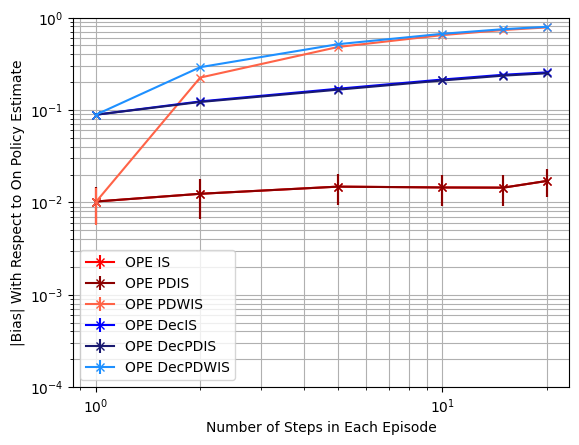

In [ ]:
label = 'bias'
plot_graphs(bias_means, bias_stds, label, 10**(-4), 10**0, shorter_D, estimator='IS')

##### Plot Variance

On Policy-----[0.00023585 0.00022985 0.00024787 0.00022415 0.00017463 0.00019419]
OPE IS-----[0.00018217 0.00025341 0.00029661 0.00031023 0.0002818  0.00035633]
OPE PDIS-----[0.00018217 0.00025341 0.00029661 0.00031023 0.0002818  0.00035633]
OPE PDWIS-----[1.95156190e-04 6.85054645e-05 1.29127754e-05 3.61415706e-06
 1.44154127e-06 7.58661790e-07]
OPE DecIS-----[8.61977484e-05 1.13998196e-04 1.27460132e-04 1.41036945e-04
 1.46329015e-04 1.63971239e-04]
OPE DecPDIS-----[8.61977484e-05 1.12882498e-04 1.25165364e-04 1.33345756e-04
 1.28348714e-04 1.42117990e-04]
OPE DecPDWIS-----[8.63895020e-05 2.83196432e-05 5.19171715e-06 1.38676751e-06
 5.32269727e-07 2.84010107e-07]


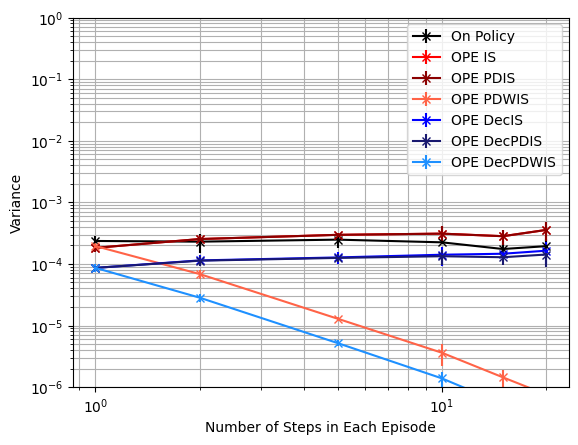

In [ ]:
label = 'var'
plot_graphs(var_means, var_stds, label, 10**(-6), 10**0, shorter_D, estimator='IS')

##### Plot MSE

On Policy-----[0.00023585 0.00022985 0.00024787 0.00022415 0.00017463 0.00019419]
OPE IS-----[0.00030573 0.00043868 0.00054476 0.00054953 0.00051859 0.00067868]
OPE PDIS-----[0.00030573 0.00043868 0.00054476 0.00054953 0.00051859 0.00067868]
OPE PDWIS-----[3.15529902e-04 5.01756909e-02 2.30332820e-01 4.16755288e-01
 5.36707892e-01 6.10505343e-01]
OPE DecIS-----[0.00797168 0.01541795 0.02891512 0.04566063 0.05790996 0.06519992]
OPE DecPDIS-----[0.00797168 0.0149865  0.02759226 0.04355806 0.05537346 0.06222686]
OPE DecPDWIS-----[0.00796506 0.08418426 0.26481392 0.44426994 0.5595665  0.62972505]


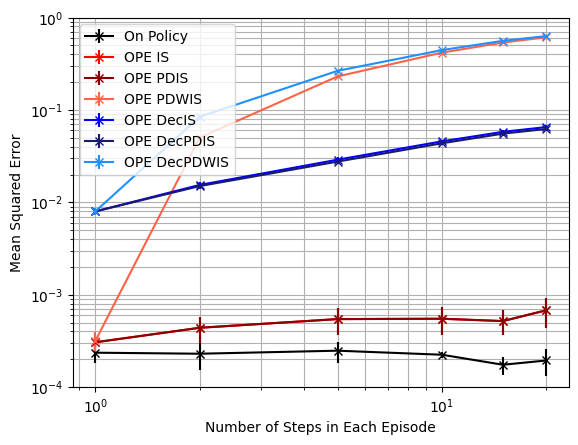

In [ ]:
label = 'MSE'
plot_graphs(MSE_means, MSE_stds, label, 10**(-4), 10**0, shorter_D, estimator='IS')

##### Plot ESS

On Policy-----[1000. 1000. 1000. 1000. 1000. 1000.]
OPE IS-----[1299.57866535  908.05688937  849.59189004  841.40872256  688.58565475
  563.66151492]
OPE PDIS-----[1299.57866535  908.05688937  849.59189004  841.40872256  688.58565475
  563.66151492]
OPE PDWIS-----[  1203.30719926   3325.63362473  19008.66570479  72932.3811477
 131374.67779268 263352.28847718]
OPE DecIS-----[2789.48853873 2086.03373816 1950.51739998 1848.56292163 1255.05518763
 1319.50706101]
OPE DecPDIS-----[2789.48853873 2102.24594689 1954.13923996 1811.67331172 1482.89739997
 1583.57539593]
OPE DecPDWIS-----[  2750.15889652   8112.05066429  46996.16518105 174786.69789041
 339116.79756636 712687.35328309]


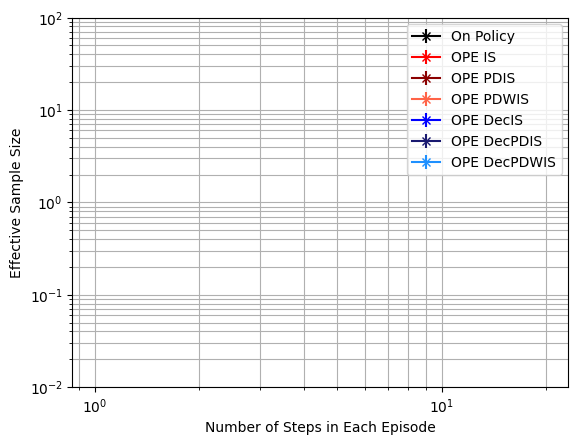

In [ ]:
label = 'ESS'
plot_graphs(ESS_means, ESS_stds, label, 10**(-2), 10**2, shorter_D, estimator='IS')

On Policy-----[1000. 1000. 1000. 1000. 1000. 1000.]
OPE IS-----[1299.57866535  908.05688937  849.59189004  841.40872256  688.58565475
  563.66151492]
OPE PDIS-----[1299.57866535  908.05688937  849.59189004  841.40872256  688.58565475
  563.66151492]
OPE PDWIS-----[  1203.30719926   3325.63362473  19008.66570479  72932.3811477
 131374.67779268 263352.28847718]
OPE DecIS-----[2789.48853873 2086.03373816 1950.51739998 1848.56292163 1255.05518763
 1319.50706101]
OPE DecPDIS-----[2789.48853873 2102.24594689 1954.13923996 1811.67331172 1482.89739997
 1583.57539593]
OPE DecPDWIS-----[  2750.15889652   8112.05066429  46996.16518105 174786.69789041
 339116.79756636 712687.35328309]


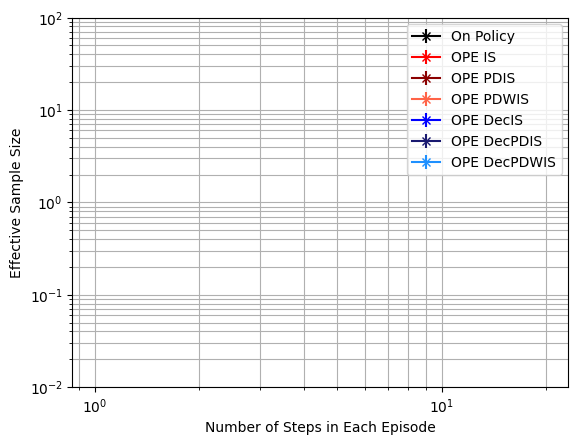

In [ ]:
plot_graphs(ESS_means, ESS_stds, label, 10**(-2), 10**2, shorter_D, estimator='PDIS')

On Policy-----[1000. 1000. 1000. 1000. 1000. 1000.]
OPE IS-----[1299.57866535  908.05688937  849.59189004  841.40872256  688.58565475
  563.66151492]
OPE PDIS-----[1299.57866535  908.05688937  849.59189004  841.40872256  688.58565475
  563.66151492]
OPE PDWIS-----[  1203.30719926   3325.63362473  19008.66570479  72932.3811477
 131374.67779268 263352.28847718]
OPE DecIS-----[2789.48853873 2086.03373816 1950.51739998 1848.56292163 1255.05518763
 1319.50706101]
OPE DecPDIS-----[2789.48853873 2102.24594689 1954.13923996 1811.67331172 1482.89739997
 1583.57539593]
OPE DecPDWIS-----[  2750.15889652   8112.05066429  46996.16518105 174786.69789041
 339116.79756636 712687.35328309]


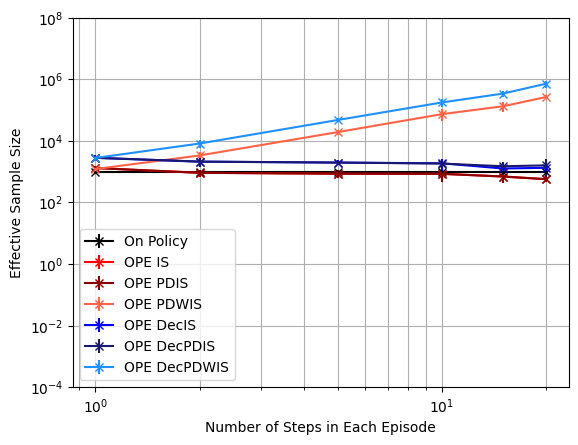

In [ ]:
plot_graphs(ESS_means, ESS_stds, label, 10**(-4), 10**(8), shorter_D, estimator='PDWIS')

# From Patient State 696, Without Diabetes

In [ ]:
#The patient has no diabetes
PROB_DIAB = 0.0

### State Analysis

In [ ]:
#Instantiate a state based on the idx and get the state vector
testState = State(state_idx = 696, diabetic_idx=0)
vec = testState.get_state_vector()

print(vec)
print(f'Num abnormals: {testState.get_num_abnormal()}\n')

print(f'Heart Rate: {hr_state_mapping[vec[0]]}')
print(f'Systolic Blood Pressure: {sbp_state_mapping[vec[1]]}')
print(f'Percent Oxygen: {o2_state_mapping[vec[2]]}')
print(f'Glucose Level: {glu_state_mapping[vec[3]]}')
print(f'Antibiotics: {abx_state_mapping[vec[4]]}')
print(f'Vasopressors: {vaso_state_mapping[vec[5]]}')
print(f'Ventilator: {vent_state_mapping[vec[6]]}')
print(f'Diabetes: {testState.diabetic_idx}')

[2 2 1 2 0 0 0]
Num abnormals: 2

Heart Rate: High
Systolic Blood Pressure: High
Percent Oxygen: Normal
Glucose Level: Normal
Antibiotics: Off
Vasopressors: Off
Ventilator: Off
Diabetes: 0


### Generate Data From Behaviour Policy

Run the data generator

In [ ]:
dgen = DataGenerator()
states, actions, lengths, rewards, diab, emp_tx_totals, emp_r_totals = dgen.simulate(
    NSIMSAMPS, NSTEPS, policy=randPol, policy_idx_type='full',
    p_diabetes=PROB_DIAB, use_tqdm=False) #True, tqdm_desc='Behaviour Policy Simulation')

obs_samps = utils.format_dgen_samps(
    states, actions, rewards, diab, NSTEPS, NSIMSAMPS)

Convert data into array format

In [ ]:
time = np.arange(NSTEPS)
times = np.stack(axis=0, arrays=[time]*NSIMSAMPS)
times = times[..., np.newaxis]

nf_tr_b = np.concatenate((times, states[:, 0:NSTEPS, :], actions, rewards, states[:, 1:, :]), axis=2)
nf_tr_b.shape

(100000, 20, 5)

In [ ]:
f_tr_b = factorise_dataset(nf_tr_b)

In [ ]:
print(nf_tr_b)

[[[  0. 696.   0.  -1. 648.]
  [  1. 648.  -1.   0.  -1.]
  [  2.  -1.  -1.   0.  -1.]
  ...
  [ 17.  -1.  -1.   0.  -1.]
  [ 18.  -1.  -1.   0.  -1.]
  [ 19.  -1.  -1.   0.  -1.]]

 [[  0. 696.   3.   0. 699.]
  [  1. 699.   5.   0. 422.]
  [  2. 422.   3.   0. 459.]
  ...
  [ 17.  -1.  -1.   0.  -1.]
  [ 18.  -1.  -1.   0.  -1.]
  [ 19.  -1.  -1.   0.  -1.]]

 [[  0. 696.   4.   0. 620.]
  [  1. 620.   0.   0. 616.]
  [  2. 616.   2.   0. 697.]
  ...
  [ 17. 410.  -1.   0.  -1.]
  [ 18.  -1.  -1.   0.  -1.]
  [ 19.  -1.  -1.   0.  -1.]]

 ...

 [[  0. 696.   6.   0. 461.]
  [  1. 461.   4.   0. 380.]
  [  2. 380.   7.   0. 463.]
  ...
  [ 17.  -1.  -1.   0.  -1.]
  [ 18.  -1.  -1.   0.  -1.]
  [ 19.  -1.  -1.   0.  -1.]]

 [[  0. 696.   0.   0. 696.]
  [  1. 696.   0.   0. 696.]
  [  2. 696.   6.   0. 461.]
  ...
  [ 17. 449.   7.   0. 455.]
  [ 18. 455.   2.   0. 449.]
  [ 19. 449.   0.   0. 448.]]

 [[  0. 696.   7.   0. 703.]
  [  1. 703.   1.   0. 698.]
  [  2. 698.   7.   0. 703

In [ ]:
print(f_tr_b)

[[[[ 0.00000000e+00  6.96000000e+02  1.00000000e+00 -3.33333333e-01
     6.48000000e+02]
   [ 0.00000000e+00  6.96000000e+02  1.00000000e+00 -3.33333333e-01
     6.48000000e+02]
   [ 0.00000000e+00  6.96000000e+02  0.00000000e+00 -3.33333333e-01
     6.48000000e+02]]

  [[ 1.00000000e+00  6.48000000e+02  1.00000000e+00  0.00000000e+00
    -1.00000000e+00]
   [ 1.00000000e+00  6.48000000e+02  1.00000000e+00  0.00000000e+00
    -1.00000000e+00]
   [ 1.00000000e+00  6.48000000e+02  1.00000000e+00  0.00000000e+00
    -1.00000000e+00]]

  [[ 2.00000000e+00 -1.00000000e+00  1.00000000e+00  0.00000000e+00
    -1.00000000e+00]
   [ 2.00000000e+00 -1.00000000e+00  1.00000000e+00  0.00000000e+00
    -1.00000000e+00]
   [ 2.00000000e+00 -1.00000000e+00  1.00000000e+00  0.00000000e+00
    -1.00000000e+00]]

  ...

  [[ 1.70000000e+01 -1.00000000e+00  1.00000000e+00  0.00000000e+00
    -1.00000000e+00]
   [ 1.70000000e+01 -1.00000000e+00  1.00000000e+00  0.00000000e+00
    -1.00000000e+00]
   [ 1.7

In [ ]:
factored_randPol = factor_policy(randPol)

In [ ]:
randPol = pad_policy(randPol)

factored_randPol[0] = pad_policy(factored_randPol[0])
factored_randPol[1] = pad_policy(factored_randPol[1])
factored_randPol[2] = pad_policy(factored_randPol[2])

### Varying Episodes $\epsilon_{e} = 0.0$ (Policy Divergence $8.0^{20}$)

Set up evaluation policy, generate data and convert into factored format

In [ ]:
EVAL_EPSILON = 0.0

evalPolSoft = np.copy(fullPol)
evalPolSoft[evalPolSoft == 1] = 1 - EVAL_EPSILON
evalPolSoft[evalPolSoft == 0] = EVAL_EPSILON / (n_actions - 1)

In [ ]:
# Calculate policy divergence from Voloshin et al.
D = 0
for state in range(randPol.shape[0] - 1):
    for action in range(randPol.shape[1] - 1):
        difference = evalPolSoft[state, action]/randPol[state, action]
        D = max(D, difference)
print(D)
shorter_D = round(D,2)

8.0


In [ ]:
dgen = DataGenerator()
states, actions, lengths, rewards, diab, emp_tx_totals, emp_r_totals = dgen.simulate(
    NSIMSAMPS, NSTEPS, policy=evalPolSoft, policy_idx_type='full',
    p_diabetes=PROB_DIAB, use_tqdm=False) #True, tqdm_desc='Behaviour Policy Simulation')

obs_samps = utils.format_dgen_samps(
    states, actions, rewards, diab, NSTEPS, NSIMSAMPS)

In [ ]:
time = np.arange(NSTEPS)
times = np.stack(axis=0, arrays=[time]*NSIMSAMPS)
times = times[..., np.newaxis]

nf_tr_e = np.concatenate((times, states[:, 0:NSTEPS, :], actions, rewards, states[:, 1:, :]), axis=2)
nf_tr_e.shape

(100000, 20, 5)

In [ ]:
f_tr_e = factorise_dataset(nf_tr_e)

In [ ]:
factored_evalPolSoft = factor_policy(evalPolSoft)

In [ ]:
evalPolSoft = pad_policy(evalPolSoft)

factored_evalPolSoft[0] = pad_policy(factored_evalPolSoft[0])
factored_evalPolSoft[1] = pad_policy(factored_evalPolSoft[1])
factored_evalPolSoft[2] = pad_policy(factored_evalPolSoft[2])

In [ ]:
import policy_estimators as pe
import gc

def evaluate_PE(RUNS, EPISODES, SHORTER_D, STEPS=NSTEPS):

  biases = np.zeros((5, 5))
  variances = np.zeros((5, 5))
  MSEs = np.zeros((5, 5))
  ESSs = np.zeros((5, 5))

  # Reshape data for processing
  T, ldim = nf_tr_b.shape[-2], nf_tr_b.shape[-1]
  nfb = nf_tr_b.reshape((-1, RUNS, EPISODES, T, ldim))
  nfe = nf_tr_e.reshape((-1, RUNS, EPISODES, T, ldim))

  T, D, ldim = f_tr_b.shape[-3], f_tr_b.shape[-2], f_tr_b.shape[-1]
  fb = f_tr_b.reshape((-1, RUNS, EPISODES, T, D, ldim))
  fe = f_tr_e.reshape((-1, RUNS, EPISODES, T, D, ldim))

  for t in range(5):
    print()

    lower_index = 0
    estimates_on_policy = np.zeros(RUNS)
    estimates_OPE_IS = np.zeros(RUNS)
    estimates_OPE_PDIS = np.zeros(RUNS)

    estimates_OPE_DecIS = np.zeros(RUNS)
    estimates_OPE_DecPDIS = np.zeros(RUNS)

    for r in range(RUNS):
        #On policy Q estimate
        estimates_on_policy[r] = pe.on_policy_Q_estimate(nfe[t, r, :, :STEPS, :], DISCOUNT_Pol)
        #Off policy IS estimate
        estimates_OPE_IS[r] = pe.off_policy_IS_estimator(nfb[t, r, :, :STEPS, :], DISCOUNT_Pol, randPol, evalPolSoft)
        #Off policy PDIS estimate
        estimates_OPE_PDIS[r] = pe.off_policy_PDIS_estimator(nfb[t, r, :, :STEPS, :], DISCOUNT_Pol, randPol, evalPolSoft)

        #Factorisation 1----------------------------------

        #Off policy decomposed IS estimate
        estimates_OPE_DecIS[r], _ = pe.off_policy_DecIS_estimator(fb[t, r, :, :STEPS, :, :], DISCOUNT_Pol, [0,1], factored_randPol, factored_evalPolSoft)
        #Off policy decomposed PDIS estimate
        estimates_OPE_DecPDIS[r], _ = pe.off_policy_DecPDIS_estimator(fb[t, r, :, :STEPS, :, :], DISCOUNT_Pol, [0,1], factored_randPol, factored_evalPolSoft)


    mean_on_policy = np.mean(estimates_on_policy)
    var_on_policy = np.var(estimates_on_policy, ddof=0)
    print(f'Mean on policy Q estimate: {mean_on_policy}. Variance of on policy Q estimate: {var_on_policy}')

    from sklearn.metrics import mean_squared_error

    #For on policy
    biases[t, 0] = 0.0
    variances[t, 0] = var_on_policy
    MSEs[t, 0] = var_on_policy
    ESSs[t, 0] = EPISODES

    def generate_results(estimates, mean_true, label):
      MSE = mean_squared_error(estimates, [mean_true]*RUNS)
      mean = np.mean(estimates)
      var = np.var(estimates, ddof=0)
      bias1 = np.sqrt(MSE - var)
      bias2 = abs(mean - mean_true)
      print(f'Mean {label} estimate: {mean}. Bias1: {bias1}. Bias2: {bias2}. Variance: {var}. MSE: {MSE}')
      return bias1, var, MSE

    label_list = ['OPE IS', 'OPE PDIS',
                  'OPE DecIS', 'OPE DecPDIS'
                  ]

    estimates = [estimates_OPE_IS, estimates_OPE_PDIS,
                estimates_OPE_DecIS, estimates_OPE_DecPDIS
                ]


    for (id, val) in enumerate(label_list):
      biases[t, 1+id], variances[t, 1+id], MSEs[t, 1+id] = generate_results(estimates[id], mean_on_policy, label_list[id])
      ESSs[t, 1+id] = (EPISODES*variances[t, 0])/variances[t, 1+id]
      gc.collect()

  return np.mean(biases, axis=0), np.std(biases, axis=0), np.mean(variances, axis=0), np.std(variances, axis=0), np.mean(MSEs, axis=0), np.std(MSEs, axis=0), np.mean(ESSs, axis=0), np.std(ESSs, axis=0)

#### Run Everything

In [ ]:
EPISODES = [10, 50, 100, 500, 1000]

bias_means = np.zeros((len(EPISODES), 5))
bias_stds = np.zeros((len(EPISODES), 5))
var_means = np.zeros((len(EPISODES), 5))
var_stds = np.zeros((len(EPISODES), 5))
MSE_means = np.zeros((len(EPISODES), 5))
MSE_stds = np.zeros((len(EPISODES), 5))
ESS_means = np.zeros((len(EPISODES), 5))
ESS_stds = np.zeros((len(EPISODES), 5))

RUNS = 20

for id in range(len(EPISODES)):
  e = EPISODES[id]
  print(f'{e} Episodes, {RUNS} ----------------------------------')
  bias_means[id, :], bias_stds[id, :], var_means[id, :], var_stds[id, :], MSE_means[id, :], MSE_stds[id, :], ESS_means[id, :], ESS_stds[id, :] = evaluate_PE(RUNS=RUNS, EPISODES=e, SHORTER_D=shorter_D)
  print()
  gc.collect()

print('BIAS MEANS')
print(list(bias_means))
print('\nBIAS STDS')
print(list(bias_stds))
print('\nVAR MEANS')
print(list(var_means))
print('\nVAR STDS')
print(list(var_stds))
print('\nMSE MEANS')
print(list(MSE_means))
print('\nMSE STDS')
print(list(MSE_stds))
print('\nESS MEANS')
print(list(ESS_means))
print('\nESS STDS')
print(list(ESS_stds))

10 Episodes, 20 ----------------------------------

Mean on policy Q estimate: 0.6484958829961538. Variance of on policy Q estimate: 0.020641973029959598
Mean OPE IS estimate: 2.509056. Bias1: 1.8605601170038466. Bias2: 1.8605601170038464. Variance: 119.61187821158403. MSE: 123.0735621605694
Mean OPE PDIS estimate: 2.509056. Bias1: 1.8605601170038466. Bias2: 1.8605601170038464. Variance: 119.61187821158403. MSE: 123.0735621605694
Mean OPE DecIS estimate: 0.051874666666666666. Bias1: 0.5966212163294872. Bias2: 0.5966212163294872. Variance: 0.07617842411377775. MSE: 0.4321352998882545
Mean OPE DecPDIS estimate: -0.053398666666666664. Bias1: 0.7018945496628205. Bias2: 0.7018945496628205. Variance: 0.03736830531377778. MSE: 0.5300242641601514

Mean on policy Q estimate: 0.5927695702492453. Variance of on policy Q estimate: 0.009474179676266216
Mean OPE IS estimate: 0.0. Bias1: 0.5927695702492453. Bias2: 0.5927695702492453. Variance: 0.0. MSE: 0.3513757634134749
Mean OPE PDIS estimate: 0.0.

<ipython-input-52-4a9fa90ff3d5>:79: RuntimeWarning: divide by zero encountered in double_scalars
  ESSs[t, 1+id] = (EPISODES*variances[t, 0])/variances[t, 1+id]
<ipython-input-52-4a9fa90ff3d5>:79: RuntimeWarning: divide by zero encountered in double_scalars
  ESSs[t, 1+id] = (EPISODES*variances[t, 0])/variances[t, 1+id]


Mean OPE DecIS estimate: -0.053066666666666665. Bias1: 0.645836236915912. Bias2: 0.645836236915912. Variance: 0.009486862222222222. MSE: 0.42659130713592813
Mean OPE DecPDIS estimate: -0.11554130666666666. Bias1: 0.7083108769159119. Bias2: 0.7083108769159119. Variance: 0.030749177538573515. MSE: 0.5324534758959616

Mean on policy Q estimate: 0.5442637388391888. Variance of on policy Q estimate: 0.013012337421562473
Mean OPE IS estimate: 0.0. Bias1: 0.5442637388391888. Bias2: 0.5442637388391888. Variance: 0.0. MSE: 0.2962230174152127
Mean OPE PDIS estimate: 0.0. Bias1: 0.5442637388391888. Bias2: 0.5442637388391888. Variance: 0.0. MSE: 0.2962230174152127


<ipython-input-52-4a9fa90ff3d5>:79: RuntimeWarning: divide by zero encountered in double_scalars
  ESSs[t, 1+id] = (EPISODES*variances[t, 0])/variances[t, 1+id]
<ipython-input-52-4a9fa90ff3d5>:79: RuntimeWarning: divide by zero encountered in double_scalars
  ESSs[t, 1+id] = (EPISODES*variances[t, 0])/variances[t, 1+id]


Mean OPE DecIS estimate: -0.05174927999999999. Bias1: 0.5960130188391888. Bias2: 0.5960130188391888. Variance: 0.059629149407627355. MSE: 0.4148606680334305
Mean OPE DecPDIS estimate: -0.13095194666666665. Bias1: 0.6752156855058554. Bias2: 0.6752156855058554. Variance: 0.04821473587686115. MSE: 0.5041309578300034

Mean on policy Q estimate: 0.6434459343851862. Variance of on policy Q estimate: 0.016337667542678555
Mean OPE IS estimate: 0.0. Bias1: 0.6434459343851862. Bias2: 0.6434459343851862. Variance: 0.0. MSE: 0.4140226704768253
Mean OPE PDIS estimate: 0.0. Bias1: 0.6434459343851862. Bias2: 0.6434459343851862. Variance: 0.0. MSE: 0.4140226704768253


<ipython-input-52-4a9fa90ff3d5>:79: RuntimeWarning: divide by zero encountered in double_scalars
  ESSs[t, 1+id] = (EPISODES*variances[t, 0])/variances[t, 1+id]
<ipython-input-52-4a9fa90ff3d5>:79: RuntimeWarning: divide by zero encountered in double_scalars
  ESSs[t, 1+id] = (EPISODES*variances[t, 0])/variances[t, 1+id]


Mean OPE DecIS estimate: 0.1585271488. Bias1: 0.4849187855851866. Bias2: 0.4849187855851862. Variance: 0.7697608963859558. MSE: 1.004907124999368
Mean OPE DecPDIS estimate: -0.06953466666666666. Bias1: 0.7129806010518528. Bias2: 0.7129806010518528. Variance: 0.11039515673313219. MSE: 0.6187364942093935

Mean on policy Q estimate: 0.6226509222791121. Variance of on policy Q estimate: 0.02398124182315154
Mean OPE IS estimate: 157.3840502784. Bias1: 156.76139935612017. Bias2: 156.76139935612088. Variance: 470625.04635864485. MSE: 495199.18268673384
Mean OPE PDIS estimate: 157.3840502784. Bias1: 156.76139935612017. Bias2: 156.76139935612088. Variance: 470625.04635864485. MSE: 495199.18268673384
Mean OPE DecIS estimate: 0.12532714879999998. Bias1: 0.4973237734791119. Bias2: 0.49732377347911216. Variance: 0.7609538284643204. MSE: 1.0082847641318233
Mean OPE DecPDIS estimate: -0.08541373226666668. Bias1: 0.7080646545457787. Bias2: 0.7080646545457788. Variance: 0.22472181090060128. MSE: 0.7260

/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:233: RuntimeWarning: invalid value encountered in subtract
  x = asanyarray(arr - arrmean)


50 Episodes, 20 ----------------------------------

Mean on policy Q estimate: 0.6103252097497772. Variance of on policy Q estimate: 0.003682169215398002
Mean OPE IS estimate: 31.978621255679997. Bias1: 31.36829604593012. Bias2: 31.36829604593022. Variance: 18798.195497821835. MSE: 19782.16549464695
Mean OPE PDIS estimate: 31.978621255679997. Bias1: 31.36829604593012. Bias2: 31.36829604593022. Variance: 18798.195497821835. MSE: 19782.16549464695
Mean OPE DecIS estimate: 0.046182603520000004. Bias1: 0.5641426062297772. Bias2: 0.5641426062297772. Variance: 0.05786566040507605. MSE: 0.3761225405688015
Mean OPE DecPDIS estimate: -0.09096806378666666. Bias1: 0.7012932735364439. Bias2: 0.7012932735364439. Variance: 0.013281660422127823. MSE: 0.5050939159295893

Mean on policy Q estimate: 0.591365423142739. Variance of on policy Q estimate: 0.005754632619733468
Mean OPE IS estimate: 0.0. Bias1: 0.591365423142739. Bias2: 0.591365423142739. Variance: 0.0. MSE: 0.34971306368879074
Mean OPE PDIS 

<ipython-input-52-4a9fa90ff3d5>:79: RuntimeWarning: divide by zero encountered in double_scalars
  ESSs[t, 1+id] = (EPISODES*variances[t, 0])/variances[t, 1+id]
<ipython-input-52-4a9fa90ff3d5>:79: RuntimeWarning: divide by zero encountered in double_scalars
  ESSs[t, 1+id] = (EPISODES*variances[t, 0])/variances[t, 1+id]


Mean OPE DecIS estimate: -0.013350803204266659. Bias1: 0.6047162263470057. Bias2: 0.6047162263470056. Variance: 0.04126671042531182. MSE: 0.40694842483267485
Mean OPE DecPDIS estimate: -0.1736830456533333. Bias1: 0.7650484687960724. Bias2: 0.7650484687960724. Variance: 0.03195632601216321. MSE: 0.6172554856193782

Mean on policy Q estimate: 0.5641709353471505. Variance of on policy Q estimate: 0.005738607062733789
Mean OPE IS estimate: 0.0. Bias1: 0.5641709353471503. Bias2: 0.5641709353471505. Variance: 0.0. MSE: 0.31828884429047855
Mean OPE PDIS estimate: 0.0. Bias1: 0.5641709353471503. Bias2: 0.5641709353471505. Variance: 0.0. MSE: 0.31828884429047855


<ipython-input-52-4a9fa90ff3d5>:79: RuntimeWarning: divide by zero encountered in double_scalars
  ESSs[t, 1+id] = (EPISODES*variances[t, 0])/variances[t, 1+id]
<ipython-input-52-4a9fa90ff3d5>:79: RuntimeWarning: divide by zero encountered in double_scalars
  ESSs[t, 1+id] = (EPISODES*variances[t, 0])/variances[t, 1+id]


Mean OPE DecIS estimate: -0.05782392554666667. Bias1: 0.6219948608938172. Bias2: 0.6219948608938172. Variance: 0.014829680417373856. MSE: 0.4017072873956928
Mean OPE DecPDIS estimate: -0.14795075242666667. Bias1: 0.712121687773817. Bias2: 0.7121216877738171. Variance: 0.012631853614942862. MSE: 0.5197491518127727

Mean on policy Q estimate: 0.5808069264738879. Variance of on policy Q estimate: 0.002899303867838489
Mean OPE IS estimate: 0.06336. Bias1: 0.5174469264738878. Bias2: 0.5174469264738879. Variance: 0.0762753024. MSE: 0.344026624117273
Mean OPE PDIS estimate: 0.06336. Bias1: 0.5174469264738878. Bias2: 0.5174469264738879. Variance: 0.0762753024. MSE: 0.344026624117273
Mean OPE DecIS estimate: 0.048525772748885344. Bias1: 0.5322811537250025. Bias2: 0.5322811537250025. Variance: 0.12724171022920014. MSE: 0.4105649368400199
Mean OPE DecPDIS estimate: -0.08914403095889065. Bias1: 0.6699509574327784. Bias2: 0.6699509574327785. Variance: 0.038902973758822484. MSE: 0.487737259123919

M

/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:233: RuntimeWarning: invalid value encountered in subtract
  x = asanyarray(arr - arrmean)


100 Episodes, 20 ----------------------------------

Mean on policy Q estimate: 0.6008453164462579. Variance of on policy Q estimate: 0.0025700295363768706
Mean OPE IS estimate: 15.989310627839998. Bias1: 15.388465311393768. Bias2: 15.388465311393741. Variance: 4699.548874455457. MSE: 4936.353739095426
Mean OPE PDIS estimate: 15.989310627839998. Bias1: 15.388465311393768. Bias2: 15.388465311393741. Variance: 4699.548874455457. MSE: 4936.353739095426
Mean OPE DecIS estimate: 0.016415900157866665. Bias1: 0.5844294162883913. Bias2: 0.5844294162883913. Variance: 0.02207453690348596. MSE: 0.3636322795266757
Mean OPE DecPDIS estimate: -0.13232555472000002. Bias1: 0.7331708711662579. Bias2: 0.7331708711662579. Variance: 0.005424158027695233. MSE: 0.5429636843543848

Mean on policy Q estimate: 0.5724889309105191. Variance of on policy Q estimate: 0.0024547464653935087
Mean OPE IS estimate: 0.03168. Bias1: 0.5408089309105192. Bias2: 0.5408089309105191. Variance: 0.0190688256. MSE: 0.31154312535

#### Plot Graphs

In [ ]:
import pickle
import matplotlib.pyplot as plt

def plot_graphs(means, stds, label, low_ylim, up_ylim, D, estimator='IS'):
  EPISODES = [10, 50, 100, 500, 1000]

  ylabels = {
      'bias': '|Bias| With Respect to On Policy Estimate',
      'var': 'Variance',
      'MSE': 'Mean Squared Error',
      'ESS': 'Effective Sample Size'
  }

  colours = {
      'On Policy': 'k',
      'OPE IS': 'r',
      'OPE DecIS': 'b',
      'OPE PDIS': 'darkred',
      'OPE DecPDIS': 'midnightblue',
      'OPE PDWIS': 'tomato',
      'OPE DecPDWIS': 'dodgerblue',
  }

  legend_list = ['OPE IS', 'OPE PDIS',
                  'OPE DecIS', 'OPE DecPDIS'
                  ]
  index_list = [1, 2, 3, 4]

  plt.figure()
  if label != 'bias':
    legend_list.insert(0,'On Policy')
    index_list.insert(0, 0)
  for (id, legend) in zip(index_list, legend_list):
    print(f'{legend}-----{means[:, id]}')
    plt.errorbar(EPISODES, means[:, id], yerr=stds[:, id], color=colours[legend], marker='x')
  plt.yscale("log")
  plt.xscale("log")
  plt.grid(visible=True, which='both', axis='both')
  plt.legend(legend_list)
  plt.xlabel('Number of Episodes')
  plt.ylabel(ylabels[label])
  plt.ylim([low_ylim, up_ylim])
  plt.savefig(f'{label}-sepsis-simulator-{D}.pdf', dpi=300)
  plt.show()


##### Plot Bias

OPE IS-----[32.08048774  6.71054903  3.45489071  0.96672335  0.47785735]
OPE PDIS-----[32.08048774  6.71054903  3.45489071  0.96672335  0.47785735]
OPE DecIS-----[0.56414261 0.56661017 0.60084128 0.58140648 0.57503957]
OPE DecPDIS-----[0.70129327 0.7091531  0.7356885  0.75549116 0.77721546]


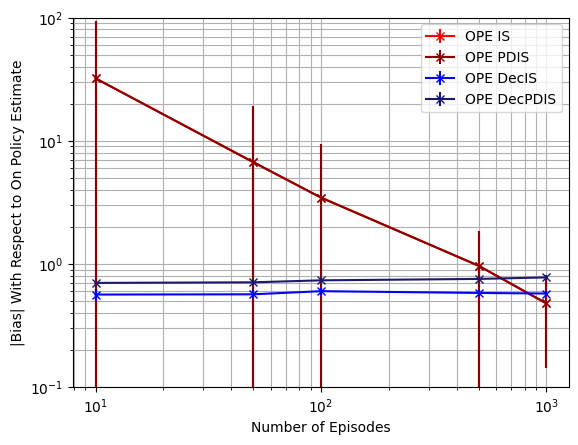

In [ ]:
label = 'bias'
plot_graphs(bias_means, bias_stds, label, 10**-1, 10**2, shorter_D, estimator='IS')

##### Plot Variance

On Policy-----[0.01668948 0.00451979 0.00244264 0.00045669 0.00017353]
OPE IS-----[9.41489316e+04 3.75966961e+03 9.40167899e+02 3.74975988e+01
 1.02564777e+01]
OPE PDIS-----[9.41489316e+04 3.75966961e+03 9.40167899e+02 3.74975988e+01
 1.02564777e+01]
OPE DecIS-----[0.33520183 0.16519054 0.11179627 0.02202175 0.01795338]
OPE DecPDIS-----[0.09028984 0.05924091 0.03717971 0.02208421 0.03112893]


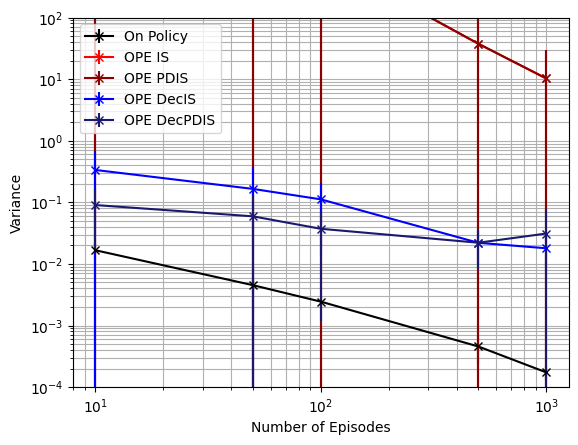

In [ ]:
label = 'var'
plot_graphs(var_means, var_stds, label, 10**(-4), 10**2, shorter_D, estimator='IS')

##### Plot MSE

On Policy-----[0.01668948 0.00451979 0.00244264 0.00045669 0.00017353]
OPE IS-----[9.90646636e+04 3.95670308e+03 9.87712796e+02 3.91837532e+01
 1.05976415e+01]
OPE PDIS-----[9.90646636e+04 3.95670308e+03 9.87712796e+02 3.91837532e+01
 1.05976415e+01]
OPE DecIS-----[0.65735583 0.48802129 0.47436794 0.3611335  0.34937792]
OPE DecPDIS-----[0.58228451 0.56311323 0.5796377  0.59321405 0.63699824]


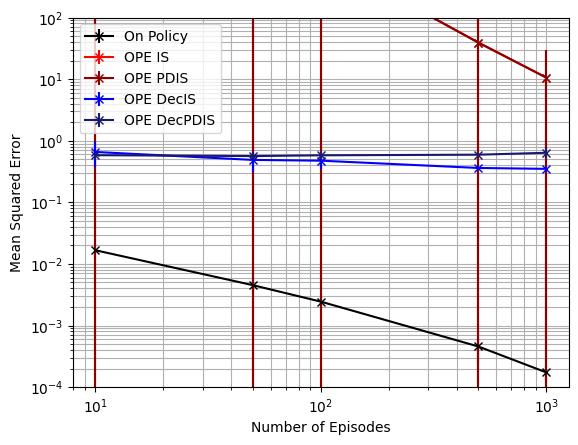

In [ ]:
label = 'MSE'
plot_graphs(MSE_means, MSE_stds, label, 10**(-4), 10**2, shorter_D, estimator='IS')

##### Plot ESS

On Policy-----[  10.   50.  100.  500. 1000.]
OPE IS-----[        inf         inf  5.69230071 29.85877007  8.28924574]
OPE PDIS-----[        inf         inf  5.69230071 29.85877007  8.28924574]
OPE DecIS-----[ 3.08118408  6.20573352  4.7279195  12.69102974 12.37201499]
OPE DecPDIS-----[ 2.77019006 10.08823835 17.97886881 18.39166929 17.76982296]


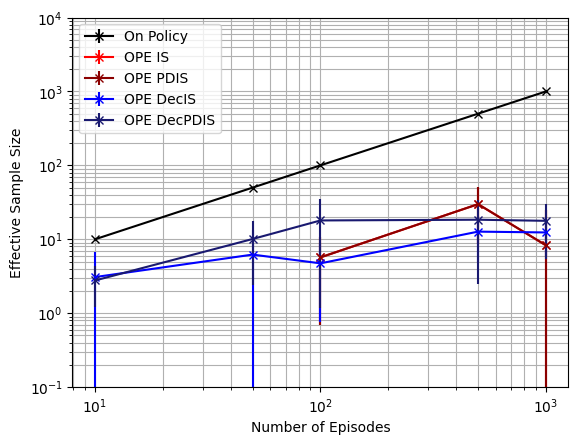

In [ ]:
label = 'ESS'
plot_graphs(ESS_means, ESS_stds, label, 10**(-1), 10**4, shorter_D, estimator='IS')

### Varying Episodes $\epsilon_{e} = 0.2$ (Policy Divergence $6.4^{20}$)

Set up evaluation policy, generate data and convert into factored format

In [ ]:
EVAL_EPSILON = 0.2

evalPolSoft = np.copy(fullPol)
evalPolSoft[evalPolSoft == 1] = 1 - EVAL_EPSILON
evalPolSoft[evalPolSoft == 0] = EVAL_EPSILON / (n_actions - 1)

In [ ]:
# Calculate policy divergence from Voloshin et al.
D = 0
for state in range(randPol.shape[0] - 1):
    for action in range(randPol.shape[1] - 1):
        difference = evalPolSoft[state, action]/randPol[state, action]
        D = max(D, difference)
print(D)
shorter_D = round(D,2)

6.4


In [ ]:
dgen = DataGenerator()
states, actions, lengths, rewards, diab, emp_tx_totals, emp_r_totals = dgen.simulate(
    NSIMSAMPS, NSTEPS, policy=evalPolSoft, policy_idx_type='full',
    p_diabetes=PROB_DIAB, use_tqdm=False) #True, tqdm_desc='Behaviour Policy Simulation')

obs_samps = utils.format_dgen_samps(
    states, actions, rewards, diab, NSTEPS, NSIMSAMPS)

In [ ]:
time = np.arange(NSTEPS)
times = np.stack(axis=0, arrays=[time]*NSIMSAMPS)
times = times[..., np.newaxis]

nf_tr_e = np.concatenate((times, states[:, 0:NSTEPS, :], actions, rewards, states[:, 1:, :]), axis=2)
nf_tr_e.shape

(100000, 20, 5)

In [ ]:
f_tr_e = factorise_dataset(nf_tr_e)

In [ ]:
factored_evalPolSoft = factor_policy(evalPolSoft)

In [ ]:
evalPolSoft = pad_policy(evalPolSoft)

factored_evalPolSoft[0] = pad_policy(factored_evalPolSoft[0])
factored_evalPolSoft[1] = pad_policy(factored_evalPolSoft[1])
factored_evalPolSoft[2] = pad_policy(factored_evalPolSoft[2])

In [ ]:
import policy_estimators as pe
import gc

def evaluate_PE(RUNS, EPISODES, SHORTER_D, STEPS=NSTEPS):

  biases = np.zeros((5, 7))
  variances = np.zeros((5, 7))
  MSEs = np.zeros((5, 7))
  ESSs = np.zeros((5, 7))

  # Reshape data for processing
  T, ldim = nf_tr_b.shape[-2], nf_tr_b.shape[-1]
  nfb = nf_tr_b.reshape((-1, RUNS, EPISODES, T, ldim))
  nfe = nf_tr_e.reshape((-1, RUNS, EPISODES, T, ldim))

  T, D, ldim = f_tr_b.shape[-3], f_tr_b.shape[-2], f_tr_b.shape[-1]
  fb = f_tr_b.reshape((-1, RUNS, EPISODES, T, D, ldim))
  fe = f_tr_e.reshape((-1, RUNS, EPISODES, T, D, ldim))

  for t in range(5):
    print()

    lower_index = 0
    estimates_on_policy = np.zeros(RUNS)
    estimates_OPE_IS = np.zeros(RUNS)
    estimates_OPE_PDIS = np.zeros(RUNS)
    estimates_OPE_PDWIS = np.zeros(RUNS)

    estimates_OPE_DecIS = np.zeros(RUNS)
    estimates_OPE_DecPDIS = np.zeros(RUNS)
    estimates_OPE_DecPDWIS = np.zeros(RUNS)

    for r in range(RUNS):
        #On policy Q estimate
        estimates_on_policy[r] = pe.on_policy_Q_estimate(nfe[t, r, :, :STEPS, :], DISCOUNT_Pol)
        #Off policy IS estimate
        estimates_OPE_IS[r] = pe.off_policy_IS_estimator(nfb[t, r, :, :STEPS, :], DISCOUNT_Pol, randPol, evalPolSoft)
        #Off policy PDIS estimate
        estimates_OPE_PDIS[r] = pe.off_policy_PDIS_estimator(nfb[t, r, :, :STEPS, :], DISCOUNT_Pol, randPol, evalPolSoft)
        #Off policy PDWIS estimate
        estimates_OPE_PDWIS[r] = pe.off_policy_PDWIS_estimator(nfb[t, r, :, :STEPS, :], DISCOUNT_Pol, randPol, evalPolSoft)

        #Factorisation 1----------------------------------

        #Off policy decomposed IS estimate
        estimates_OPE_DecIS[r], _ = pe.off_policy_DecIS_estimator(fb[t, r, :, :STEPS, :, :], DISCOUNT_Pol, [0,1], factored_randPol, factored_evalPolSoft)
        #Off policy decomposed PDIS estimate
        estimates_OPE_DecPDIS[r], _ = pe.off_policy_DecPDIS_estimator(fb[t, r, :, :STEPS, :, :], DISCOUNT_Pol, [0,1], factored_randPol, factored_evalPolSoft)
        #Off policy decomposed PDWIS estimate
        estimates_OPE_DecPDWIS[r], _ = pe.off_policy_DecPDWIS_estimator(fb[t, r, :, :STEPS, :, :], DISCOUNT_Pol, [0,1], factored_randPol, factored_evalPolSoft)


    mean_on_policy = np.mean(estimates_on_policy)
    var_on_policy = np.var(estimates_on_policy, ddof=0)
    print(f'Mean on policy Q estimate: {mean_on_policy}. Variance of on policy Q estimate: {var_on_policy}')

    from sklearn.metrics import mean_squared_error

    #For on policy
    biases[t, 0] = 0.0
    variances[t, 0] = var_on_policy
    MSEs[t, 0] = var_on_policy
    ESSs[t, 0] = EPISODES

    def generate_results(estimates, mean_true, label):
      MSE = mean_squared_error(estimates, [mean_true]*RUNS)
      mean = np.mean(estimates)
      var = np.var(estimates, ddof=0)
      bias1 = np.sqrt(MSE - var)
      bias2 = abs(mean - mean_true)
      print(f'Mean {label} estimate: {mean}. Bias1: {bias1}. Bias2: {bias2}. Variance: {var}. MSE: {MSE}')
      return bias1, var, MSE

    label_list = ['OPE IS', 'OPE PDIS', 'OPE PDWIS',
                  'OPE DecIS', 'OPE DecPDIS', 'OPE DecPDWIS'
                  ]

    estimates = [estimates_OPE_IS, estimates_OPE_PDIS, estimates_OPE_PDWIS,
                estimates_OPE_DecIS, estimates_OPE_DecPDIS, estimates_OPE_DecPDWIS
                ]


    for (id, val) in enumerate(label_list):
      biases[t, 1+id], variances[t, 1+id], MSEs[t, 1+id] = generate_results(estimates[id], mean_on_policy, label_list[id])
      ESSs[t, 1+id] = (EPISODES*variances[t, 0])/variances[t, 1+id]
      gc.collect()

  return np.mean(biases, axis=0), np.std(biases, axis=0), np.mean(variances, axis=0), np.std(variances, axis=0), np.mean(MSEs, axis=0), np.std(MSEs, axis=0), np.mean(ESSs, axis=0), np.std(ESSs, axis=0)

#### Run Everything

In [ ]:
EPISODES = [10, 50, 100, 500, 1000]

bias_means = np.zeros((len(EPISODES), 7))
bias_stds = np.zeros((len(EPISODES), 7))
var_means = np.zeros((len(EPISODES), 7))
var_stds = np.zeros((len(EPISODES), 7))
MSE_means = np.zeros((len(EPISODES), 7))
MSE_stds = np.zeros((len(EPISODES), 7))
ESS_means = np.zeros((len(EPISODES), 7))
ESS_stds = np.zeros((len(EPISODES), 7))

RUNS = 20

for id in range(len(EPISODES)):
  e = EPISODES[id]
  print(f'{e} Episodes, {RUNS} ----------------------------------')
  bias_means[id, :], bias_stds[id, :], var_means[id, :], var_stds[id, :], MSE_means[id, :], MSE_stds[id, :], ESS_means[id, :], ESS_stds[id, :] = evaluate_PE(RUNS=RUNS, EPISODES=e, SHORTER_D=shorter_D)
  print()
  gc.collect()

print('BIAS MEANS')
print(list(bias_means))
print('\nBIAS STDS')
print(list(bias_stds))
print('\nVAR MEANS')
print(list(var_means))
print('\nVAR STDS')
print(list(var_stds))
print('\nMSE MEANS')
print(list(MSE_means))
print('\nMSE STDS')
print(list(MSE_stds))
print('\nESS MEANS')
print(list(ESS_means))
print('\nESS STDS')
print(list(ESS_stds))

10 Episodes, 20 ----------------------------------

Mean on policy Q estimate: 0.3750889669413032. Variance of on policy Q estimate: 0.04414269499702762
Mean OPE IS estimate: 1.229052881272845. Bias1: 0.853963914331546. Bias2: 0.8539639143315417. Variance: 31.5077941064228. MSE: 32.237048473403256
Mean OPE PDIS estimate: 1.229052881272845. Bias1: 0.853963914331546. Bias2: 0.8539639143315417. Variance: 31.5077941064228. MSE: 32.237048473403256
Mean OPE PDWIS estimate: -0.008805188707490561. Bias1: 0.38389415564879376. Bias2: 0.3838941556487938. Variance: 0.0003371208630057616. MSE: 0.14771184360430606
Mean OPE DecIS estimate: -0.10584064751323385. Bias1: 0.480929614454537. Bias2: 0.4809296144545371. Variance: 0.3016203606203938. MSE: 0.5329136546797835
Mean OPE DecPDIS estimate: -0.16140382136607134. Bias1: 0.5364927883073746. Bias2: 0.5364927883073746. Variance: 0.12231271323254507. MSE: 0.4101372251383665
Mean OPE DecPDWIS estimate: -0.01852383753100143. Bias1: 0.3936128044723047. Bia

#### Plot Graphs

##### Plot Bias

OPE IS-----[10.62988863  2.27678471  1.20720232  0.35197834  0.18320916]
OPE PDIS-----[10.62988863  2.27678471  1.20720232  0.35197834  0.18320916]
OPE PDWIS-----[0.35855573 0.3434969  0.32362004 0.31497304 0.31519839]
OPE DecIS-----[0.34032544 0.34681224 0.35907123 0.35544022 0.34892157]
OPE DecPDIS-----[0.49713767 0.50601418 0.50038912 0.52567266 0.54118701]
OPE DecPDWIS-----[0.37324424 0.36073976 0.34252452 0.33682345 0.33853113]


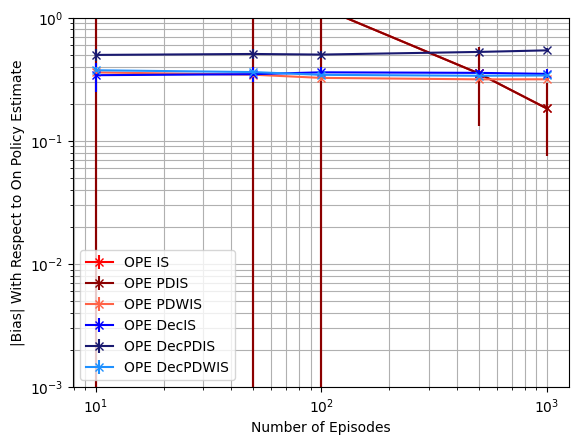

In [ ]:
label = 'bias'
plot_graphs(bias_means, bias_stds, label, 10**-3, 10**0, shorter_D, estimator='IS')

##### Plot Variance

On Policy-----[0.04385897 0.00900565 0.0040062  0.00100782 0.00040543]
OPE IS-----[1.01121465e+04 4.04246042e+02 1.00996453e+02 5.07007119e+00
 1.51735312e+00]
OPE PDIS-----[1.01121465e+04 4.04246042e+02 1.00996453e+02 5.07007119e+00
 1.51735312e+00]
OPE PDWIS-----[0.00035767 0.00023788 0.00024133 0.00021762 0.00023751]
OPE DecIS-----[0.28087629 0.10217434 0.07163268 0.01588794 0.01741757]
OPE DecPDIS-----[0.16867791 0.04685138 0.02618108 0.01770505 0.01886891]
OPE DecPDWIS-----[5.44235317e-04 1.60028127e-04 7.96058329e-05 5.31460626e-05
 4.27141743e-05]


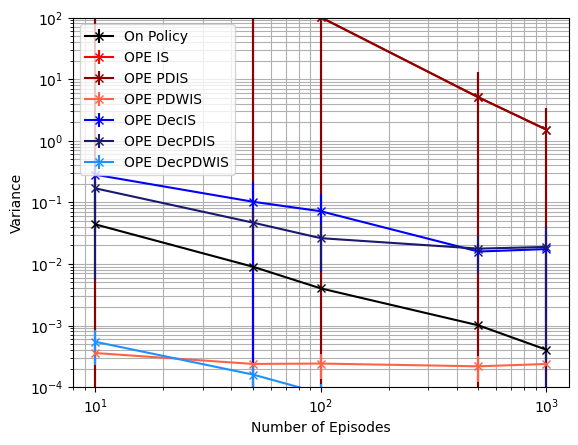

In [ ]:
label = 'var'
plot_graphs(var_means, var_stds, label, 10**(-4), 10**2, shorter_D, estimator='IS')

##### Plot MSE

On Policy-----[0.04385897 0.00900565 0.0040062  0.00100782 0.00040543]
OPE IS-----[1.06379442e+04 4.25193465e+02 1.06018012e+02 5.24201835e+00
 1.56268646e+00]
OPE PDIS-----[1.06379442e+04 4.25193465e+02 1.06018012e+02 5.24201835e+00
 1.56268646e+00]
OPE PDWIS-----[0.12955707 0.11859984 0.1052588  0.09945188 0.0996071 ]
OPE DecIS-----[0.4047324  0.22491202 0.20172142 0.14271859 0.14032092]
OPE DecPDIS-----[0.41905678 0.30494959 0.27765881 0.2943655  0.31218392]
OPE DecPDWIS-----[0.14027258 0.13054598 0.11769099 0.11351755 0.11465844]


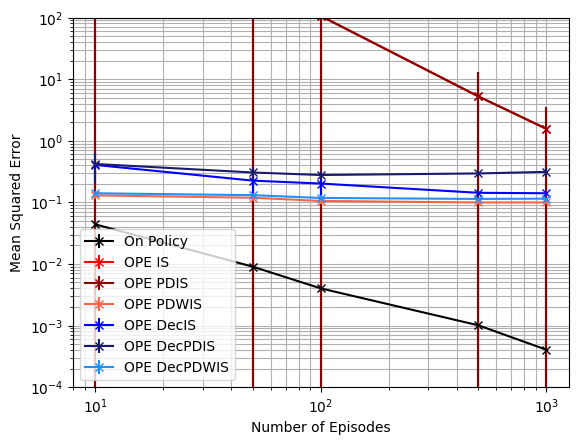

In [ ]:
label = 'MSE'
plot_graphs(MSE_means, MSE_stds, label, 10**(-4), 10**2, shorter_D, estimator='IS')

##### Plot ESS

On Policy-----[  10.   50.  100.  500. 1000.]
OPE IS-----[39.16324884 14.18537303  9.19866173 31.25607418  0.96742622]
OPE PDIS-----[39.16324884 14.18537303  9.19866173 31.25607418  0.96742622]
OPE PDWIS-----[1434.3905018  2463.04221294 1938.60699874 2948.34000935 1787.18164785]
OPE DecIS-----[ 5.4934605  11.3029701  11.68891464 38.32624562 41.99791292]
OPE DecPDIS-----[ 7.01354312 15.80055012 23.55302232 46.47877256 51.01805273]
OPE DecPDWIS-----[ 1108.39166338  3670.7940413   5629.34756839 12576.35725457
 17402.33427235]


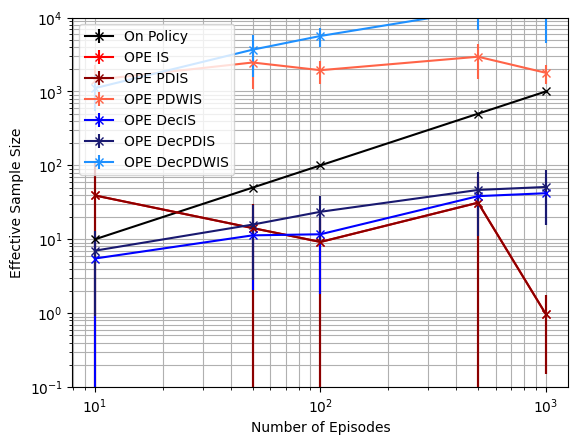

In [ ]:
label = 'ESS'
plot_graphs(ESS_means, ESS_stds, label, 10**(-1), 10**4, shorter_D, estimator='IS')

### Varying Episodes $\epsilon_{e} = 0.4$ (Policy Divergence $4.8^{20}$)

Set up evaluation policy, generate data and convert into factored format

In [ ]:
EVAL_EPSILON = 0.4

evalPolSoft = np.copy(fullPol)
evalPolSoft[evalPolSoft == 1] = 1 - EVAL_EPSILON
evalPolSoft[evalPolSoft == 0] = EVAL_EPSILON / (n_actions - 1)

In [ ]:
# Calculate policy divergence from Voloshin et al.
D = 0
for state in range(randPol.shape[0] - 1):
    for action in range(randPol.shape[1] - 1):
        difference = evalPolSoft[state, action]/randPol[state, action]
        D = max(D, difference)
print(D)
shorter_D = round(D,2)

4.8


In [ ]:
dgen = DataGenerator()
states, actions, lengths, rewards, diab, emp_tx_totals, emp_r_totals = dgen.simulate(
    NSIMSAMPS, NSTEPS, policy=evalPolSoft, policy_idx_type='full',
    p_diabetes=PROB_DIAB, use_tqdm=False) #True, tqdm_desc='Behaviour Policy Simulation')

obs_samps = utils.format_dgen_samps(
    states, actions, rewards, diab, NSTEPS, NSIMSAMPS)

In [ ]:
time = np.arange(NSTEPS)
times = np.stack(axis=0, arrays=[time]*NSIMSAMPS)
times = times[..., np.newaxis]

nf_tr_e = np.concatenate((times, states[:, 0:NSTEPS, :], actions, rewards, states[:, 1:, :]), axis=2)
nf_tr_e.shape

(100000, 20, 5)

In [ ]:
f_tr_e = factorise_dataset(nf_tr_e)

In [ ]:
factored_evalPolSoft = factor_policy(evalPolSoft)

In [ ]:
evalPolSoft = pad_policy(evalPolSoft)

factored_evalPolSoft[0] = pad_policy(factored_evalPolSoft[0])
factored_evalPolSoft[1] = pad_policy(factored_evalPolSoft[1])
factored_evalPolSoft[2] = pad_policy(factored_evalPolSoft[2])

In [ ]:
import policy_estimators as pe
import gc

def evaluate_PE(RUNS, EPISODES, SHORTER_D, STEPS=NSTEPS):

  biases = np.zeros((5, 7))
  variances = np.zeros((5, 7))
  MSEs = np.zeros((5, 7))
  ESSs = np.zeros((5, 7))

  # Reshape data for processing
  T, ldim = nf_tr_b.shape[-2], nf_tr_b.shape[-1]
  nfb = nf_tr_b.reshape((-1, RUNS, EPISODES, T, ldim))
  nfe = nf_tr_e.reshape((-1, RUNS, EPISODES, T, ldim))

  T, D, ldim = f_tr_b.shape[-3], f_tr_b.shape[-2], f_tr_b.shape[-1]
  fb = f_tr_b.reshape((-1, RUNS, EPISODES, T, D, ldim))
  fe = f_tr_e.reshape((-1, RUNS, EPISODES, T, D, ldim))

  for t in range(5):
    print()

    lower_index = 0
    estimates_on_policy = np.zeros(RUNS)
    estimates_OPE_IS = np.zeros(RUNS)
    estimates_OPE_PDIS = np.zeros(RUNS)
    estimates_OPE_PDWIS = np.zeros(RUNS)

    estimates_OPE_DecIS = np.zeros(RUNS)
    estimates_OPE_DecPDIS = np.zeros(RUNS)
    estimates_OPE_DecPDWIS = np.zeros(RUNS)

    for r in range(RUNS):
        #On policy Q estimate
        estimates_on_policy[r] = pe.on_policy_Q_estimate(nfe[t, r, :, :STEPS, :], DISCOUNT_Pol)
        #Off policy IS estimate
        estimates_OPE_IS[r] = pe.off_policy_IS_estimator(nfb[t, r, :, :STEPS, :], DISCOUNT_Pol, randPol, evalPolSoft)
        #Off policy PDIS estimate
        estimates_OPE_PDIS[r] = pe.off_policy_PDIS_estimator(nfb[t, r, :, :STEPS, :], DISCOUNT_Pol, randPol, evalPolSoft)
        #Off policy PDWIS estimate
        estimates_OPE_PDWIS[r] = pe.off_policy_PDWIS_estimator(nfb[t, r, :, :STEPS, :], DISCOUNT_Pol, randPol, evalPolSoft)

        #Factorisation 1----------------------------------

        #Off policy decomposed IS estimate
        estimates_OPE_DecIS[r], _ = pe.off_policy_DecIS_estimator(fb[t, r, :, :STEPS, :, :], DISCOUNT_Pol, [0,1], factored_randPol, factored_evalPolSoft)
        #Off policy decomposed PDIS estimate
        estimates_OPE_DecPDIS[r], _ = pe.off_policy_DecPDIS_estimator(fb[t, r, :, :STEPS, :, :], DISCOUNT_Pol, [0,1], factored_randPol, factored_evalPolSoft)
        #Off policy decomposed PDWIS estimate
        estimates_OPE_DecPDWIS[r], _ = pe.off_policy_DecPDWIS_estimator(fb[t, r, :, :STEPS, :, :], DISCOUNT_Pol, [0,1], factored_randPol, factored_evalPolSoft)


    mean_on_policy = np.mean(estimates_on_policy)
    var_on_policy = np.var(estimates_on_policy, ddof=0)
    print(f'Mean on policy Q estimate: {mean_on_policy}. Variance of on policy Q estimate: {var_on_policy}')

    from sklearn.metrics import mean_squared_error

    #For on policy
    biases[t, 0] = 0.0
    variances[t, 0] = var_on_policy
    MSEs[t, 0] = var_on_policy
    ESSs[t, 0] = EPISODES

    def generate_results(estimates, mean_true, label):
      MSE = mean_squared_error(estimates, [mean_true]*RUNS)
      mean = np.mean(estimates)
      var = np.var(estimates, ddof=0)
      bias1 = np.sqrt(MSE - var)
      bias2 = abs(mean - mean_true)
      print(f'Mean {label} estimate: {mean}. Bias1: {bias1}. Bias2: {bias2}. Variance: {var}. MSE: {MSE}')
      return bias1, var, MSE

    label_list = ['OPE IS', 'OPE PDIS', 'OPE PDWIS',
                  'OPE DecIS', 'OPE DecPDIS', 'OPE DecPDWIS'
                  ]

    estimates = [estimates_OPE_IS, estimates_OPE_PDIS, estimates_OPE_PDWIS,
                estimates_OPE_DecIS, estimates_OPE_DecPDIS, estimates_OPE_DecPDWIS
                ]


    for (id, val) in enumerate(label_list):
      biases[t, 1+id], variances[t, 1+id], MSEs[t, 1+id] = generate_results(estimates[id], mean_on_policy, label_list[id])
      ESSs[t, 1+id] = (EPISODES*variances[t, 0])/variances[t, 1+id]
      gc.collect()

  return np.mean(biases, axis=0), np.std(biases, axis=0), np.mean(variances, axis=0), np.std(variances, axis=0), np.mean(MSEs, axis=0), np.std(MSEs, axis=0), np.mean(ESSs, axis=0), np.std(ESSs, axis=0)

#### Run Everything

In [ ]:
EPISODES = [10, 50, 100, 500, 1000]

bias_means = np.zeros((len(EPISODES), 7))
bias_stds = np.zeros((len(EPISODES), 7))
var_means = np.zeros((len(EPISODES), 7))
var_stds = np.zeros((len(EPISODES), 7))
MSE_means = np.zeros((len(EPISODES), 7))
MSE_stds = np.zeros((len(EPISODES), 7))
ESS_means = np.zeros((len(EPISODES), 7))
ESS_stds = np.zeros((len(EPISODES), 7))

RUNS = 20

for id in range(len(EPISODES)):
  e = EPISODES[id]
  print(f'{e} Episodes, {RUNS} ----------------------------------')
  bias_means[id, :], bias_stds[id, :], var_means[id, :], var_stds[id, :], MSE_means[id, :], MSE_stds[id, :], ESS_means[id, :], ESS_stds[id, :] = evaluate_PE(RUNS=RUNS, EPISODES=e, SHORTER_D=shorter_D)
  print()
  gc.collect()

print('BIAS MEANS')
print(list(bias_means))
print('\nBIAS STDS')
print(list(bias_stds))
print('\nVAR MEANS')
print(list(var_means))
print('\nVAR STDS')
print(list(var_stds))
print('\nMSE MEANS')
print(list(MSE_means))
print('\nMSE STDS')
print(list(MSE_stds))
print('\nESS MEANS')
print(list(ESS_means))
print('\nESS STDS')
print(list(ESS_stds))

10 Episodes, 20 ----------------------------------

Mean on policy Q estimate: -0.01318586391733521. Variance of on policy Q estimate: 0.05947300841076465
Mean OPE IS estimate: 0.3049230770742117. Bias1: 0.3181089409915488. Bias2: 0.3181089409915469. Variance: 5.995477667393267. MSE: 6.096670965732032
Mean OPE PDIS estimate: 0.3049230770742117. Bias1: 0.3181089409915488. Bias2: 0.3181089409915469. Variance: 5.995477667393267. MSE: 6.096670965732032
Mean OPE PDWIS estimate: -0.012313509387380815. Bias1: 0.0008723545299543685. Bias2: 0.0008723545299543951. Variance: 0.0003835555927560769. MSE: 0.0003843165951820088
Mean OPE DecIS estimate: -0.34583138605375324. Bias1: 0.33264552213641707. Bias2: 0.332645522136418. Variance: 1.3568232194184895. MSE: 1.467476262815899
Mean OPE DecPDIS estimate: -0.32086323878183187. Bias1: 0.3076773748644971. Bias2: 0.30767737486449664. Variance: 0.467680189272242. MSE: 0.5623455562757502
Mean OPE DecPDWIS estimate: -0.01735319922415934. Bias1: 0.004167335

#### Plot Graphs

##### Plot Bias

OPE IS-----[2.58433731 0.56545185 0.35642799 0.14185267 0.11870724]
OPE PDIS-----[2.58433731 0.56545185 0.35642799 0.14185267 0.11870724]
OPE PDWIS-----[0.07545359 0.06035283 0.06188698 0.06066824 0.06242643]
OPE DecIS-----[0.12917337 0.11499336 0.13573663 0.15549353 0.15093821]
OPE DecPDIS-----[0.26776635 0.26973126 0.26980565 0.30430477 0.3129302 ]
OPE DecPDWIS-----[0.08410711 0.07270716 0.07472037 0.07660144 0.07863519]


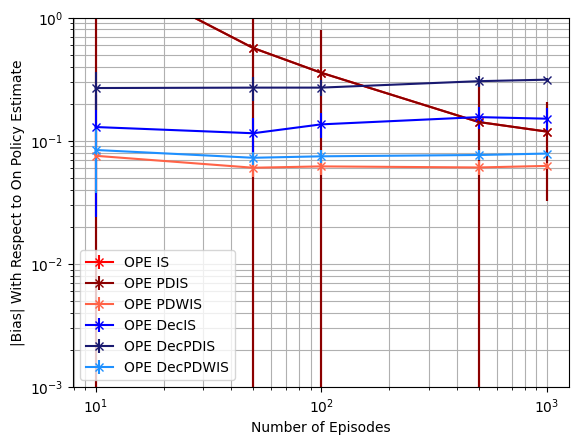

In [ ]:
label = 'bias'
plot_graphs(bias_means, bias_stds, label, 10**-3, 10**0, shorter_D, estimator='IS')

##### Plot Variance

On Policy-----[0.05826868 0.00985716 0.00431725 0.00110069 0.00053819]
OPE IS-----[5.70248685e+02 2.31500810e+01 6.01809683e+00 1.38447903e+00
 4.72577554e-01]
OPE PDIS-----[5.70248685e+02 2.31500810e+01 6.01809683e+00 1.38447903e+00
 4.72577554e-01]
OPE PDWIS-----[0.00047766 0.00029921 0.00026005 0.00020624 0.00017582]
OPE DecIS-----[0.42842315 0.08154754 0.04766006 0.01399941 0.01319357]
OPE DecPDIS-----[0.2986874  0.06472764 0.0219373  0.01485485 0.01087248]
OPE DecPDWIS-----[2.72581180e-04 1.12494998e-04 5.66474564e-05 3.42760290e-05
 2.31695676e-05]


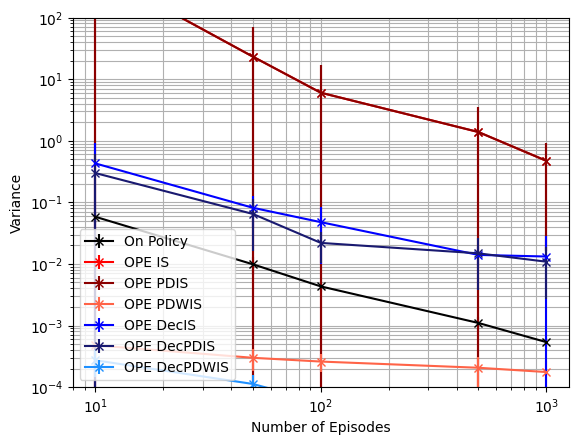

In [ ]:
label = 'var'
plot_graphs(var_means, var_stds, label, 10**(-4), 10**2, shorter_D, estimator='IS')

##### Plot MSE

On Policy-----[0.05826868 0.00985716 0.00431725 0.00110069 0.00053819]
OPE IS-----[6.00153462e+02 2.43498299e+01 6.33351261e+00 1.43164729e+00
 4.94132086e-01]
OPE PDIS-----[6.00153462e+02 2.43498299e+01 6.33351261e+00 1.43164729e+00
 4.94132086e-01]
OPE PDWIS-----[0.00817341 0.00402809 0.00417689 0.00395183 0.0040835 ]
OPE DecIS-----[0.45620878 0.09627071 0.06704851 0.03918414 0.03697979]
OPE DecPDIS-----[0.37868028 0.14085833 0.09639983 0.1085175  0.10891998]
OPE DecPDWIS-----[0.00953004 0.00547874 0.0057194  0.00595243 0.00620816]


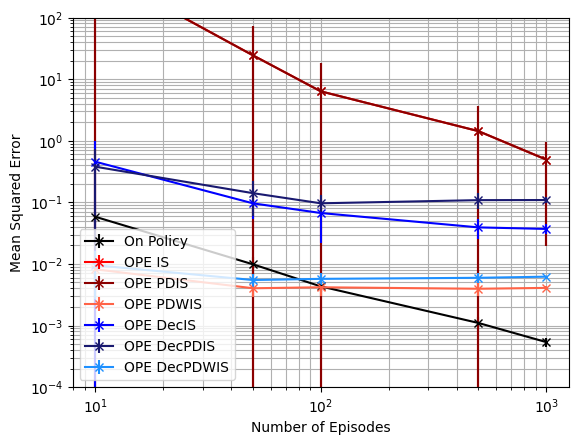

In [ ]:
label = 'MSE'
plot_graphs(MSE_means, MSE_stds, label, 10**(-4), 10**2, shorter_D, estimator='IS')

##### Plot ESS

On Policy-----[  10.   50.  100.  500. 1000.]
OPE IS-----[ 4.7759635   8.9150666   6.9957237  16.00645605  4.7244796 ]
OPE PDIS-----[ 4.7759635   8.9150666   6.9957237  16.00645605  4.7244796 ]
OPE PDWIS-----[1469.8126059  2197.44356403 1954.00649727 4446.69696358 3695.1914156 ]
OPE DecIS-----[ 4.28263151  8.17926534 11.961513   41.42411034 81.54023805]
OPE DecPDIS-----[ 6.86622473 13.95179574 24.41912407 58.95553494 82.3696905 ]
OPE DecPDWIS-----[ 2430.57180346  5454.39426718  8502.21804712 21540.21422135
 35731.71254416]


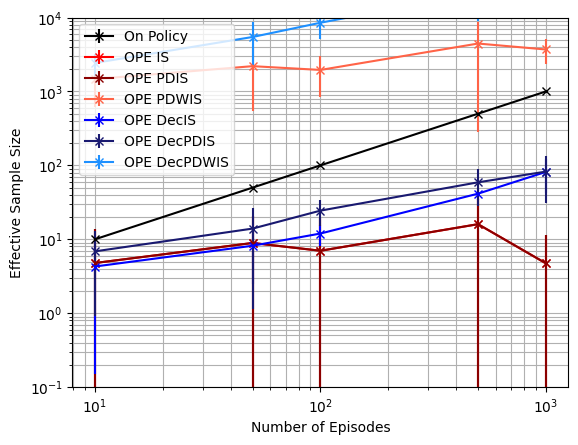

In [ ]:
label = 'ESS'
plot_graphs(ESS_means, ESS_stds, label, 10**(-1), 10**4, shorter_D, estimator='IS')

### Varying Episodes $\epsilon_{e} = 0.6$ (Policy Divergence $3.2^{20}$)

Set up evaluation policy, generate data and convert into factored format

In [ ]:
import gc

gc.collect()
EVAL_EPSILON = 0.6

evalPolSoft = np.copy(fullPol)
evalPolSoft[evalPolSoft == 1] = 1 - EVAL_EPSILON
evalPolSoft[evalPolSoft == 0] = EVAL_EPSILON / (n_actions - 1)

In [ ]:
# Calculate policy divergence from Voloshin et al.
D = 0
for state in range(randPol.shape[0] - 1):
    for action in range(randPol.shape[1] - 1):
        difference = evalPolSoft[state, action]/randPol[state, action]
        D = max(D, difference)
print(D)
shorter_D = round(D,2)

3.2


In [ ]:
dgen = DataGenerator()
states, actions, lengths, rewards, diab, emp_tx_totals, emp_r_totals = dgen.simulate(
    NSIMSAMPS, NSTEPS, policy=evalPolSoft, policy_idx_type='full',
    p_diabetes=PROB_DIAB, use_tqdm=False) #True, tqdm_desc='Behaviour Policy Simulation')

obs_samps = utils.format_dgen_samps(
    states, actions, rewards, diab, NSTEPS, NSIMSAMPS)

In [ ]:
time = np.arange(NSTEPS)
times = np.stack(axis=0, arrays=[time]*NSIMSAMPS)
times = times[..., np.newaxis]

nf_tr_e = np.concatenate((times, states[:, 0:NSTEPS, :], actions, rewards, states[:, 1:, :]), axis=2)
nf_tr_e.shape

(100000, 20, 5)

In [ ]:
f_tr_e = factorise_dataset(nf_tr_e)

In [ ]:
factored_evalPolSoft = factor_policy(evalPolSoft)

In [ ]:
evalPolSoft = pad_policy(evalPolSoft)

factored_evalPolSoft[0] = pad_policy(factored_evalPolSoft[0])
factored_evalPolSoft[1] = pad_policy(factored_evalPolSoft[1])
factored_evalPolSoft[2] = pad_policy(factored_evalPolSoft[2])

In [ ]:
import policy_estimators as pe
import gc

def evaluate_PE(RUNS, EPISODES, SHORTER_D, STEPS=NSTEPS):

  biases = np.zeros((5, 7))
  variances = np.zeros((5, 7))
  MSEs = np.zeros((5, 7))
  ESSs = np.zeros((5, 7))

  # Reshape data for processing
  T, ldim = nf_tr_b.shape[-2], nf_tr_b.shape[-1]
  nfb = nf_tr_b.reshape((-1, RUNS, EPISODES, T, ldim))
  nfe = nf_tr_e.reshape((-1, RUNS, EPISODES, T, ldim))

  T, D, ldim = f_tr_b.shape[-3], f_tr_b.shape[-2], f_tr_b.shape[-1]
  fb = f_tr_b.reshape((-1, RUNS, EPISODES, T, D, ldim))
  fe = f_tr_e.reshape((-1, RUNS, EPISODES, T, D, ldim))

  for t in range(5):
    print()

    lower_index = 0
    estimates_on_policy = np.zeros(RUNS)
    estimates_OPE_IS = np.zeros(RUNS)
    estimates_OPE_PDIS = np.zeros(RUNS)
    estimates_OPE_PDWIS = np.zeros(RUNS)

    estimates_OPE_DecIS = np.zeros(RUNS)
    estimates_OPE_DecPDIS = np.zeros(RUNS)
    estimates_OPE_DecPDWIS = np.zeros(RUNS)

    for r in range(RUNS):
        #On policy Q estimate
        estimates_on_policy[r] = pe.on_policy_Q_estimate(nfe[t, r, :, :STEPS, :], DISCOUNT_Pol)
        #Off policy IS estimate
        estimates_OPE_IS[r] = pe.off_policy_IS_estimator(nfb[t, r, :, :STEPS, :], DISCOUNT_Pol, randPol, evalPolSoft)
        #Off policy PDIS estimate
        estimates_OPE_PDIS[r] = pe.off_policy_PDIS_estimator(nfb[t, r, :, :STEPS, :], DISCOUNT_Pol, randPol, evalPolSoft)
        #Off policy PDWIS estimate
        estimates_OPE_PDWIS[r] = pe.off_policy_PDWIS_estimator(nfb[t, r, :, :STEPS, :], DISCOUNT_Pol, randPol, evalPolSoft)

        #Factorisation 1----------------------------------

        #Off policy decomposed IS estimate
        estimates_OPE_DecIS[r], _ = pe.off_policy_DecIS_estimator(fb[t, r, :, :STEPS, :, :], DISCOUNT_Pol, [0,1], factored_randPol, factored_evalPolSoft)
        #Off policy decomposed PDIS estimate
        estimates_OPE_DecPDIS[r], _ = pe.off_policy_DecPDIS_estimator(fb[t, r, :, :STEPS, :, :], DISCOUNT_Pol, [0,1], factored_randPol, factored_evalPolSoft)
        #Off policy decomposed PDWIS estimate
        estimates_OPE_DecPDWIS[r], _ = pe.off_policy_DecPDWIS_estimator(fb[t, r, :, :STEPS, :, :], DISCOUNT_Pol, [0,1], factored_randPol, factored_evalPolSoft)


    mean_on_policy = np.mean(estimates_on_policy)
    var_on_policy = np.var(estimates_on_policy, ddof=0)
    print(f'Mean on policy Q estimate: {mean_on_policy}. Variance of on policy Q estimate: {var_on_policy}')

    from sklearn.metrics import mean_squared_error

    #For on policy
    biases[t, 0] = 0.0
    variances[t, 0] = var_on_policy
    MSEs[t, 0] = var_on_policy
    ESSs[t, 0] = EPISODES

    def generate_results(estimates, mean_true, label):
      MSE = mean_squared_error(estimates, [mean_true]*RUNS)
      mean = np.mean(estimates)
      var = np.var(estimates, ddof=0)
      bias1 = np.sqrt(MSE - var)
      bias2 = abs(mean - mean_true)
      print(f'Mean {label} estimate: {mean}. Bias1: {bias1}. Bias2: {bias2}. Variance: {var}. MSE: {MSE}')
      return bias1, var, MSE

    label_list = ['OPE IS', 'OPE PDIS', 'OPE PDWIS',
                  'OPE DecIS', 'OPE DecPDIS', 'OPE DecPDWIS'
                  ]

    estimates = [estimates_OPE_IS, estimates_OPE_PDIS, estimates_OPE_PDWIS,
                estimates_OPE_DecIS, estimates_OPE_DecPDIS, estimates_OPE_DecPDWIS
                ]


    for (id, val) in enumerate(label_list):
      biases[t, 1+id], variances[t, 1+id], MSEs[t, 1+id] = generate_results(estimates[id], mean_on_policy, label_list[id])
      ESSs[t, 1+id] = (EPISODES*variances[t, 0])/variances[t, 1+id]
      gc.collect()

  return np.mean(biases, axis=0), np.std(biases, axis=0), np.mean(variances, axis=0), np.std(variances, axis=0), np.mean(MSEs, axis=0), np.std(MSEs, axis=0), np.mean(ESSs, axis=0), np.std(ESSs, axis=0)

#### Run Everything

In [ ]:
EPISODES = [10, 50, 100, 500, 1000]

bias_means = np.zeros((len(EPISODES), 7))
bias_stds = np.zeros((len(EPISODES), 7))
var_means = np.zeros((len(EPISODES), 7))
var_stds = np.zeros((len(EPISODES), 7))
MSE_means = np.zeros((len(EPISODES), 7))
MSE_stds = np.zeros((len(EPISODES), 7))
ESS_means = np.zeros((len(EPISODES), 7))
ESS_stds = np.zeros((len(EPISODES), 7))

RUNS = 20

for id in range(len(EPISODES)):
  e = EPISODES[id]
  print(f'{e} Episodes, {RUNS} ----------------------------------')
  bias_means[id, :], bias_stds[id, :], var_means[id, :], var_stds[id, :], MSE_means[id, :], MSE_stds[id, :], ESS_means[id, :], ESS_stds[id, :] = evaluate_PE(RUNS=RUNS, EPISODES=e, SHORTER_D=shorter_D)
  print()
  gc.collect()

print('BIAS MEANS')
print(list(bias_means))
print('\nBIAS STDS')
print(list(bias_stds))
print('\nVAR MEANS')
print(list(var_means))
print('\nVAR STDS')
print(list(var_stds))
print('\nMSE MEANS')
print(list(MSE_means))
print('\nMSE STDS')
print(list(MSE_stds))
print('\nESS MEANS')
print(list(ESS_means))
print('\nESS STDS')
print(list(ESS_stds))

10 Episodes, 20 ----------------------------------

Mean on policy Q estimate: -0.24666340894917377. Variance of on policy Q estimate: 0.053814144114665854
Mean OPE IS estimate: -0.26757231960177563. Bias1: 0.020908910652602277. Bias2: 0.020908910652601864. Variance: 0.8580029283266717. MSE: 0.8584401108713502
Mean OPE PDIS estimate: -0.26757231960177563. Bias1: 0.020908910652602277. Bias2: 0.020908910652601864. Variance: 0.8580029283266717. MSE: 0.8584401108713502
Mean OPE PDWIS estimate: -0.016824222462722808. Bias1: 0.22983918648645094. Bias2: 0.22983918648645096. Variance: 0.00036166168570157575. MSE: 0.053187713330455154
Mean OPE DecIS estimate: -0.44413308042498817. Bias1: 0.1974696714758142. Bias2: 0.1974696714758144. Variance: 1.1637965466848719. MSE: 1.2027908178376379
Mean OPE DecPDIS estimate: -0.41143602727152295. Bias1: 0.16477261832234896. Bias2: 0.16477261832234918. Variance: 0.4594123029392332. MSE: 0.4865623186880357
Mean OPE DecPDWIS estimate: -0.016923574936571636. B

#### Plot Graphs

##### Plot Bias

OPE IS-----[0.42262171 0.14387814 0.08146034 0.03179615 0.04039201]
OPE PDIS-----[0.42262171 0.14387814 0.08146034 0.03179615 0.04039201]
OPE PDWIS-----[0.22385172 0.19672402 0.20043008 0.19468524 0.19339014]
OPE DecIS-----[0.15506024 0.05230081 0.04271037 0.02565892 0.01688095]
OPE DecPDIS-----[0.0862202  0.06591933 0.05613825 0.08617441 0.09049277]
OPE DecPDWIS-----[0.22161324 0.19283008 0.1972539  0.18937057 0.18836358]


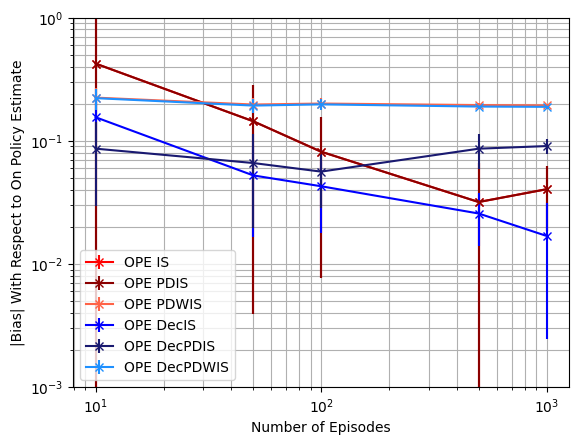

In [ ]:
label = 'bias'
plot_graphs(bias_means, bias_stds, label, 10**(-3), 10**0, shorter_D, estimator='IS')

##### Plot Variance

On Policy-----[0.05283831 0.01108209 0.00532325 0.00103038 0.00050678]
OPE IS-----[10.30487739  0.66678996  0.25169922  0.078148    0.04970797]
OPE PDIS-----[10.30487739  0.66678996  0.25169922  0.078148    0.04970797]
OPE PDWIS-----[4.89547738e-04 2.23588373e-04 1.73619160e-04 9.74521474e-05
 5.91435509e-05]
OPE DecIS-----[0.34685454 0.07164547 0.02437956 0.00714911 0.0041022 ]
OPE DecPDIS-----[0.21157324 0.05696644 0.01455433 0.00684327 0.00345753]
OPE DecPDWIS-----[1.53277568e-04 7.65318475e-05 3.27957981e-05 1.44105796e-05
 7.80083644e-06]


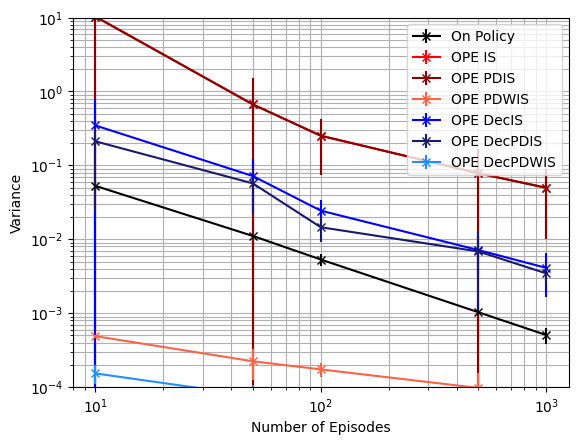

In [ ]:
label = 'var'
plot_graphs(var_means, var_stds, label, 10**(-4), 10**1, shorter_D, estimator='IS')

##### Plot MSE

On Policy-----[0.05283831 0.01108209 0.00532325 0.00103038 0.00050678]
OPE IS-----[10.92334461  0.70707799  0.26377417  0.08036263  0.05181654]
OPE PDIS-----[10.92334461  0.70707799  0.26377417  0.08036263  0.05181654]
OPE PDWIS-----[0.05265737 0.03949647 0.04077089 0.03805218 0.03747009]
OPE DecIS-----[0.37414402 0.07566346 0.02681962 0.00794309 0.00459508]
OPE DecPDIS-----[0.22223036 0.06347167 0.01847026 0.01500156 0.01178877]
OPE DecPDWIS-----[0.05114371 0.03782153 0.03934563 0.03594288 0.03550322]


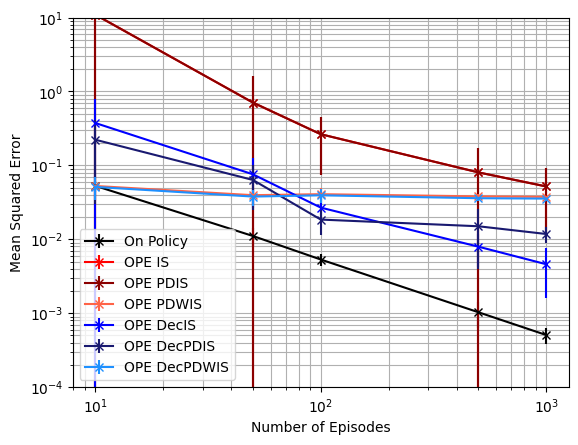

In [ ]:
label = 'MSE'
plot_graphs(MSE_means, MSE_stds, label, 10**(-4), 10**1, shorter_D, estimator='IS')

##### Plot ESS

On Policy-----[  10.   50.  100.  500. 1000.]
OPE IS-----[ 1.25956309  7.79341475  4.55449636 15.26105974 20.08353933]
OPE PDIS-----[ 1.25956309  7.79341475  4.55449636 15.26105974 20.08353933]
OPE PDWIS-----[ 1186.46731818  2894.32774796  3130.66104437  6927.81073397
 10429.59546718]
OPE DecIS-----[  4.09825269  11.78856164  25.64180416  81.36218284 148.03663365]
OPE DecPDIS-----[  6.49937783  15.84243914  40.85188653 107.60302632 165.89001121]
OPE DecPDWIS-----[ 3791.47991791  8425.89621001 16920.58222557 41777.60283246
 81255.50349258]


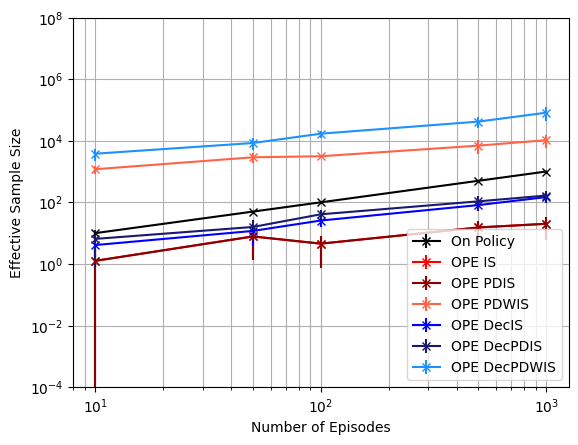

In [ ]:
label = 'ESS'
plot_graphs(ESS_means, ESS_stds, label, 10**(-4), 10**8, shorter_D, estimator='IS')

### Varying Episodes $\epsilon_{e} = 0.8$ (Policy Divergence $1.6^{20}$)



Set up evaluation policy, generate data and convert into factored format

In [ ]:
import gc
gc.collect()
EVAL_EPSILON = 0.8

evalPolSoft = np.copy(fullPol)
evalPolSoft[evalPolSoft == 1] = 1 - EVAL_EPSILON
evalPolSoft[evalPolSoft == 0] = EVAL_EPSILON / (n_actions - 1)

In [ ]:
# Calculate policy divergence from Voloshin et al.
D = 0
for state in range(randPol.shape[0] - 1):
    for action in range(randPol.shape[1] - 1):
        difference = evalPolSoft[state, action]/randPol[state, action]
        D = max(D, difference)
print(D)
shorter_D = round(D,2)

1.5999999999999996


In [ ]:
dgen = DataGenerator()
states, actions, lengths, rewards, diab, emp_tx_totals, emp_r_totals = dgen.simulate(
    NSIMSAMPS, NSTEPS, policy=evalPolSoft, policy_idx_type='full',
    p_diabetes=PROB_DIAB, use_tqdm=False) #True, tqdm_desc='Behaviour Policy Simulation')

obs_samps = utils.format_dgen_samps(
    states, actions, rewards, diab, NSTEPS, NSIMSAMPS)

In [ ]:
time = np.arange(NSTEPS)
times = np.stack(axis=0, arrays=[time]*NSIMSAMPS)
times = times[..., np.newaxis]

nf_tr_e = np.concatenate((times, states[:, 0:NSTEPS, :], actions, rewards, states[:, 1:, :]), axis=2)
nf_tr_e.shape

(100000, 20, 5)

In [ ]:
f_tr_e = factorise_dataset(nf_tr_e)

In [ ]:
factored_evalPolSoft = factor_policy(evalPolSoft)

In [ ]:
evalPolSoft = pad_policy(evalPolSoft)

factored_evalPolSoft[0] = pad_policy(factored_evalPolSoft[0])
factored_evalPolSoft[1] = pad_policy(factored_evalPolSoft[1])
factored_evalPolSoft[2] = pad_policy(factored_evalPolSoft[2])

In [ ]:
import policy_estimators as pe
import gc

def evaluate_PE(RUNS, EPISODES, SHORTER_D, STEPS=NSTEPS):

  biases = np.zeros((5, 7))
  variances = np.zeros((5, 7))
  MSEs = np.zeros((5, 7))
  ESSs = np.zeros((5, 7))

  # Reshape data for processing
  T, ldim = nf_tr_b.shape[-2], nf_tr_b.shape[-1]
  nfb = nf_tr_b.reshape((-1, RUNS, EPISODES, T, ldim))
  nfe = nf_tr_e.reshape((-1, RUNS, EPISODES, T, ldim))

  T, D, ldim = f_tr_b.shape[-3], f_tr_b.shape[-2], f_tr_b.shape[-1]
  fb = f_tr_b.reshape((-1, RUNS, EPISODES, T, D, ldim))
  fe = f_tr_e.reshape((-1, RUNS, EPISODES, T, D, ldim))

  for t in range(5):
    print()

    lower_index = 0
    estimates_on_policy = np.zeros(RUNS)
    estimates_OPE_IS = np.zeros(RUNS)
    estimates_OPE_PDIS = np.zeros(RUNS)
    estimates_OPE_PDWIS = np.zeros(RUNS)

    estimates_OPE_DecIS = np.zeros(RUNS)
    estimates_OPE_DecPDIS = np.zeros(RUNS)
    estimates_OPE_DecPDWIS = np.zeros(RUNS)

    for r in range(RUNS):
        #On policy Q estimate
        estimates_on_policy[r] = pe.on_policy_Q_estimate(nfe[t, r, :, :STEPS, :], DISCOUNT_Pol)
        #Off policy IS estimate
        estimates_OPE_IS[r] = pe.off_policy_IS_estimator(nfb[t, r, :, :STEPS, :], DISCOUNT_Pol, randPol, evalPolSoft)
        #Off policy PDIS estimate
        estimates_OPE_PDIS[r] = pe.off_policy_PDIS_estimator(nfb[t, r, :, :STEPS, :], DISCOUNT_Pol, randPol, evalPolSoft)
        #Off policy PDWIS estimate
        estimates_OPE_PDWIS[r] = pe.off_policy_PDWIS_estimator(nfb[t, r, :, :STEPS, :], DISCOUNT_Pol, randPol, evalPolSoft)

        #Factorisation 1----------------------------------

        #Off policy decomposed IS estimate
        estimates_OPE_DecIS[r], _ = pe.off_policy_DecIS_estimator(fb[t, r, :, :STEPS, :, :], DISCOUNT_Pol, [0,1], factored_randPol, factored_evalPolSoft)
        #Off policy decomposed PDIS estimate
        estimates_OPE_DecPDIS[r], _ = pe.off_policy_DecPDIS_estimator(fb[t, r, :, :STEPS, :, :], DISCOUNT_Pol, [0,1], factored_randPol, factored_evalPolSoft)
        #Off policy decomposed PDWIS estimate
        estimates_OPE_DecPDWIS[r], _ = pe.off_policy_DecPDWIS_estimator(fb[t, r, :, :STEPS, :, :], DISCOUNT_Pol, [0,1], factored_randPol, factored_evalPolSoft)


    mean_on_policy = np.mean(estimates_on_policy)
    var_on_policy = np.var(estimates_on_policy, ddof=0)
    print(f'Mean on policy Q estimate: {mean_on_policy}. Variance of on policy Q estimate: {var_on_policy}')

    from sklearn.metrics import mean_squared_error

    #For on policy
    biases[t, 0] = 0.0
    variances[t, 0] = var_on_policy
    MSEs[t, 0] = var_on_policy
    ESSs[t, 0] = EPISODES

    def generate_results(estimates, mean_true, label):
      MSE = mean_squared_error(estimates, [mean_true]*RUNS)
      mean = np.mean(estimates)
      var = np.var(estimates, ddof=0)
      bias1 = np.sqrt(MSE - var)
      bias2 = abs(mean - mean_true)
      print(f'Mean {label} estimate: {mean}. Bias1: {bias1}. Bias2: {bias2}. Variance: {var}. MSE: {MSE}')
      return bias1, var, MSE

    label_list = ['OPE IS', 'OPE PDIS', 'OPE PDWIS',
                  'OPE DecIS', 'OPE DecPDIS', 'OPE DecPDWIS'
                  ]

    estimates = [estimates_OPE_IS, estimates_OPE_PDIS, estimates_OPE_PDWIS,
                estimates_OPE_DecIS, estimates_OPE_DecPDIS, estimates_OPE_DecPDWIS
                ]


    for (id, val) in enumerate(label_list):
      biases[t, 1+id], variances[t, 1+id], MSEs[t, 1+id] = generate_results(estimates[id], mean_on_policy, label_list[id])
      ESSs[t, 1+id] = (EPISODES*variances[t, 0])/variances[t, 1+id]
      gc.collect()

  return np.mean(biases, axis=0), np.std(biases, axis=0), np.mean(variances, axis=0), np.std(variances, axis=0), np.mean(MSEs, axis=0), np.std(MSEs, axis=0), np.mean(ESSs, axis=0), np.std(ESSs, axis=0)

#### Run Everything

In [ ]:
EPISODES = [10, 50, 100, 500, 1000]

bias_means = np.zeros((len(EPISODES), 7))
bias_stds = np.zeros((len(EPISODES), 7))
var_means = np.zeros((len(EPISODES), 7))
var_stds = np.zeros((len(EPISODES), 7))
MSE_means = np.zeros((len(EPISODES), 7))
MSE_stds = np.zeros((len(EPISODES), 7))
ESS_means = np.zeros((len(EPISODES), 7))
ESS_stds = np.zeros((len(EPISODES), 7))

RUNS = 20

for id in range(len(EPISODES)):
  e = EPISODES[id]
  print(f'{e} Episodes, {RUNS} ----------------------------------')
  bias_means[id, :], bias_stds[id, :], var_means[id, :], var_stds[id, :], MSE_means[id, :], MSE_stds[id, :], ESS_means[id, :], ESS_stds[id, :] = evaluate_PE(RUNS=RUNS, EPISODES=e, SHORTER_D=shorter_D)
  print()
  gc.collect()

print('BIAS MEANS')
print(list(bias_means))
print('\nBIAS STDS')
print(list(bias_stds))
print('\nVAR MEANS')
print(list(var_means))
print('\nVAR STDS')
print(list(var_stds))
print('\nMSE MEANS')
print(list(MSE_means))
print('\nMSE STDS')
print(list(MSE_stds))
print('\nESS MEANS')
print(list(ESS_means))
print('\nESS STDS')
print(list(ESS_stds))

10 Episodes, 20 ----------------------------------

Mean on policy Q estimate: -0.5280394092460473. Variance of on policy Q estimate: 0.04854816032167377
Mean OPE IS estimate: -0.5039414629687783. Bias1: 0.024097946277268766. Bias2: 0.024097946277269022. Variance: 0.09429304195273808. MSE: 0.09487375296752021
Mean OPE PDIS estimate: -0.5039414629687783. Bias1: 0.024097946277268766. Bias2: 0.024097946277269022. Variance: 0.09429304195273808. MSE: 0.09487375296752021
Mean OPE PDWIS estimate: -0.023567264205420352. Bias1: 0.504472145040627. Bias2: 0.504472145040627. Variance: 0.00014878658653481752. MSE: 0.2546409317084262
Mean OPE DecIS estimate: -0.3312445145797237. Bias1: 0.19679489466632363. Bias2: 0.1967948946663236. Variance: 0.04597372670254609. MSE: 0.0847019572692755
Mean OPE DecPDIS estimate: -0.34923854175064106. Bias1: 0.17880086749540627. Bias2: 0.17880086749540625. Variance: 0.03382607075751665. MSE: 0.06579582097462648
Mean OPE DecPDWIS estimate: -0.016966133971347615. Bias

#### Plot Graphs

##### Plot Bias

OPE IS-----[0.03226747 0.02111755 0.01015348 0.00408835 0.00155794]
OPE PDIS-----[0.03226747 0.02111755 0.01015348 0.00408835 0.00155794]
OPE PDWIS-----[0.45413416 0.43961127 0.4443196  0.44325838 0.44418583]
OPE DecIS-----[0.17886227 0.15302318 0.15374832 0.14789246 0.1476838 ]
OPE DecPDIS-----[0.15207035 0.12249032 0.12534695 0.11962816 0.11957504]
OPE DecPDWIS-----[0.46030487 0.44580649 0.45044987 0.44925427 0.45015459]


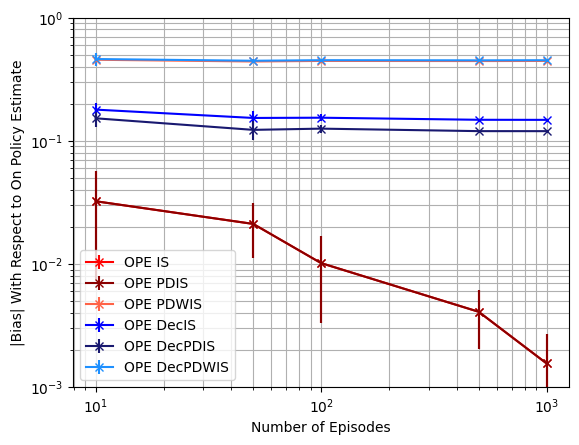

In [ ]:
label = 'bias'
plot_graphs(bias_means, bias_stds, label, 10**(-3), 10**0, shorter_D, estimator='IS')

##### Plot Variance

On Policy-----[0.04316925 0.00824939 0.00371203 0.00078886 0.00041803]
OPE IS-----[0.08843427 0.01372986 0.00739425 0.00166039 0.00065063]
OPE PDIS-----[0.08843427 0.01372986 0.00739425 0.00166039 0.00065063]
OPE PDWIS-----[1.78515126e-04 3.18904130e-05 1.75821367e-05 4.38217762e-06
 1.74630103e-06]
OPE DecIS-----[0.03074183 0.00546804 0.00273973 0.00064763 0.00029615]
OPE DecPDIS-----[0.02559292 0.00464312 0.00231581 0.00059503 0.00024759]
OPE DecPDWIS-----[5.84704350e-05 1.08236683e-05 5.83881568e-06 1.57888907e-06
 6.42508212e-07]


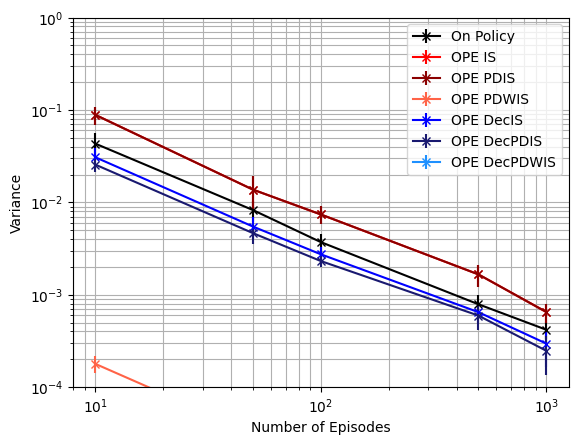

In [ ]:
label = 'var'
plot_graphs(var_means, var_stds, label, 10**(-4), 10**0, shorter_D, estimator='IS')

##### Plot MSE

On Policy-----[0.04316925 0.00824939 0.00371203 0.00078886 0.00041803]
OPE IS-----[0.09008515 0.01427277 0.00754392 0.00168132 0.00065436]
OPE PDIS-----[0.09008515 0.01427277 0.00754392 0.00168132 0.00065436]
OPE PDWIS-----[0.20917949 0.19347931 0.19757125 0.1965019  0.19730886]
OPE DecIS-----[0.06323202 0.02929941 0.02647517 0.02253109 0.02210924]
OPE DecPDIS-----[0.04928868 0.02007945 0.01812021 0.01491608 0.01454866]
OPE DecPDWIS-----[0.21475224 0.19893284 0.20304295 0.20184871 0.20264578]


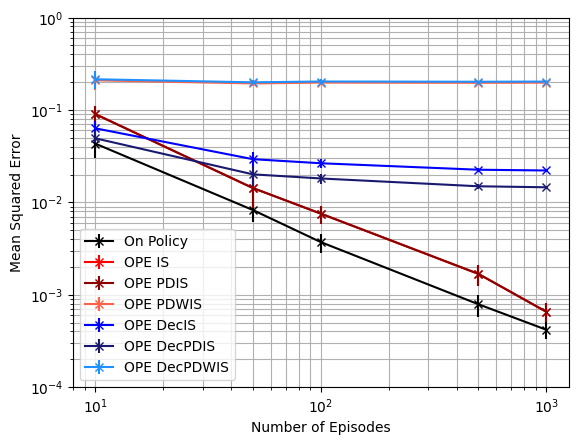

In [ ]:
label = 'MSE'
plot_graphs(MSE_means, MSE_stds, label, 10**(-4), 10**0, shorter_D, estimator='IS')

##### Plot ESS

On Policy-----[  10.   50.  100.  500. 1000.]
OPE IS-----[  5.32090893  36.53292771  52.51496598 273.7037104  670.55167266]
OPE PDIS-----[  5.32090893  36.53292771  52.51496598 273.7037104  670.55167266]
OPE PDWIS-----[  2644.4120272   14290.22576587  22923.73574254 114211.83644813
 253975.26330781]
OPE DecIS-----[  14.27941291   85.62924029  145.0729981   626.17205548 1598.22729275]
OPE DecPDIS-----[  16.92143802   96.8873904   167.08019288  706.05124356 1887.06247427]
OPE DecPDWIS-----[  7422.73303745  41223.92231606  67974.02268815 268444.14180034
 685371.72155399]


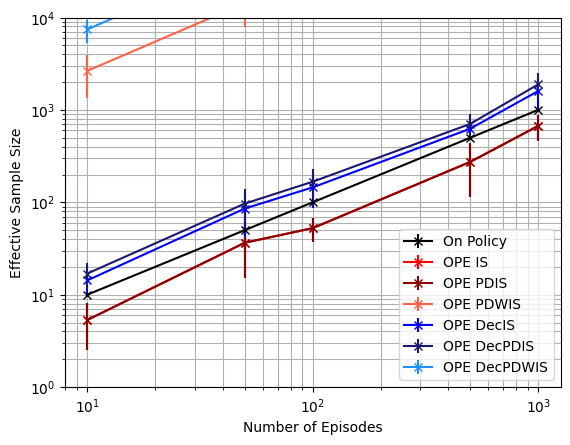

In [ ]:
label = 'ESS'
plot_graphs(ESS_means, ESS_stds, label, 10**(0), 10**4, shorter_D, estimator='IS')

### Varying Episode Length $T$ With $\epsilon_{e} = 0.8$ (Policy Divergence $1.6^{T}$)

Set up evaluation policy, generate data and convert into factored format

In [ ]:
import gc

gc.collect()
EVAL_EPSILON = 0.8

evalPolSoft = np.copy(fullPol)
evalPolSoft[evalPolSoft == 1] = 1 - EVAL_EPSILON
evalPolSoft[evalPolSoft == 0] = EVAL_EPSILON / (n_actions - 1)

In [ ]:
# Calculate policy divergence from Voloshin et al.
D = 0
for state in range(randPol.shape[0] - 1):
    for action in range(randPol.shape[1] - 1):
        difference = evalPolSoft[state, action]/randPol[state, action]
        D = max(D, difference)
print(D)
shorter_D = round(D,2)

1.5999999999999996


In [ ]:
dgen = DataGenerator()
states, actions, lengths, rewards, diab, emp_tx_totals, emp_r_totals = dgen.simulate(
    NSIMSAMPS, NSTEPS, policy=evalPolSoft, policy_idx_type='full',
    p_diabetes=PROB_DIAB, use_tqdm=False) #True, tqdm_desc='Behaviour Policy Simulation')

obs_samps = utils.format_dgen_samps(
    states, actions, rewards, diab, NSTEPS, NSIMSAMPS)

In [ ]:
time = np.arange(NSTEPS)
times = np.stack(axis=0, arrays=[time]*NSIMSAMPS)
times = times[..., np.newaxis]

nf_tr_e = np.concatenate((times, states[:, 0:NSTEPS, :], actions, rewards, states[:, 1:, :]), axis=2)
nf_tr_e.shape

(100000, 20, 5)

In [ ]:
f_tr_e = factorise_dataset(nf_tr_e)

In [ ]:
factored_evalPolSoft = factor_policy(evalPolSoft)

In [ ]:
evalPolSoft = pad_policy(evalPolSoft)

factored_evalPolSoft[0] = pad_policy(factored_evalPolSoft[0])
factored_evalPolSoft[1] = pad_policy(factored_evalPolSoft[1])
factored_evalPolSoft[2] = pad_policy(factored_evalPolSoft[2])

In [ ]:
import policy_estimators as pe
import gc

def evaluate_PE(RUNS, EPISODES, SHORTER_D, STEPS=NSTEPS):

  biases = np.zeros((5, 7))
  variances = np.zeros((5, 7))
  MSEs = np.zeros((5, 7))
  ESSs = np.zeros((5, 7))

  # Reshape data for processing
  T, ldim = nf_tr_b.shape[-2], nf_tr_b.shape[-1]
  nfb = nf_tr_b.reshape((-1, RUNS, EPISODES, T, ldim))
  nfe = nf_tr_e.reshape((-1, RUNS, EPISODES, T, ldim))

  T, D, ldim = f_tr_b.shape[-3], f_tr_b.shape[-2], f_tr_b.shape[-1]
  fb = f_tr_b.reshape((-1, RUNS, EPISODES, T, D, ldim))
  fe = f_tr_e.reshape((-1, RUNS, EPISODES, T, D, ldim))

  for t in range(5):
    print()

    lower_index = 0
    estimates_on_policy = np.zeros(RUNS)
    estimates_OPE_IS = np.zeros(RUNS)
    estimates_OPE_PDIS = np.zeros(RUNS)
    estimates_OPE_PDWIS = np.zeros(RUNS)

    estimates_OPE_DecIS = np.zeros(RUNS)
    estimates_OPE_DecPDIS = np.zeros(RUNS)
    estimates_OPE_DecPDWIS = np.zeros(RUNS)

    for r in range(RUNS):
        #On policy Q estimate
        estimates_on_policy[r] = pe.on_policy_Q_estimate(nfe[t, r, :, :STEPS, :], DISCOUNT_Pol)
        #Off policy IS estimate
        estimates_OPE_IS[r] = pe.off_policy_IS_estimator(nfb[t, r, :, :STEPS, :], DISCOUNT_Pol, randPol, evalPolSoft)
        #Off policy PDIS estimate
        estimates_OPE_PDIS[r] = pe.off_policy_PDIS_estimator(nfb[t, r, :, :STEPS, :], DISCOUNT_Pol, randPol, evalPolSoft)
        #Off policy PDWIS estimate
        estimates_OPE_PDWIS[r] = pe.off_policy_PDWIS_estimator(nfb[t, r, :, :STEPS, :], DISCOUNT_Pol, randPol, evalPolSoft)

        #Factorisation 1----------------------------------

        #Off policy decomposed IS estimate
        estimates_OPE_DecIS[r], _ = pe.off_policy_DecIS_estimator(fb[t, r, :, :STEPS, :, :], DISCOUNT_Pol, [0,1], factored_randPol, factored_evalPolSoft)
        #Off policy decomposed PDIS estimate
        estimates_OPE_DecPDIS[r], _ = pe.off_policy_DecPDIS_estimator(fb[t, r, :, :STEPS, :, :], DISCOUNT_Pol, [0,1], factored_randPol, factored_evalPolSoft)
        #Off policy decomposed PDWIS estimate
        estimates_OPE_DecPDWIS[r], _ = pe.off_policy_DecPDWIS_estimator(fb[t, r, :, :STEPS, :, :], DISCOUNT_Pol, [0,1], factored_randPol, factored_evalPolSoft)


    mean_on_policy = np.mean(estimates_on_policy)
    var_on_policy = np.var(estimates_on_policy, ddof=0)
    print(f'Mean on policy Q estimate: {mean_on_policy}. Variance of on policy Q estimate: {var_on_policy}')

    from sklearn.metrics import mean_squared_error

    #For on policy
    biases[t, 0] = 0.0
    variances[t, 0] = var_on_policy
    MSEs[t, 0] = var_on_policy
    ESSs[t, 0] = EPISODES

    def generate_results(estimates, mean_true, label):
      MSE = mean_squared_error(estimates, [mean_true]*RUNS)
      mean = np.mean(estimates)
      var = np.var(estimates, ddof=0)
      bias1 = np.sqrt(MSE - var)
      bias2 = abs(mean - mean_true)
      print(f'Mean {label} estimate: {mean}. Bias1: {bias1}. Bias2: {bias2}. Variance: {var}. MSE: {MSE}')
      return bias1, var, MSE

    label_list = ['OPE IS', 'OPE PDIS', 'OPE PDWIS',
                  'OPE DecIS', 'OPE DecPDIS', 'OPE DecPDWIS'
                  ]

    estimates = [estimates_OPE_IS, estimates_OPE_PDIS, estimates_OPE_PDWIS,
                estimates_OPE_DecIS, estimates_OPE_DecPDIS, estimates_OPE_DecPDWIS
                ]


    for (id, val) in enumerate(label_list):
      biases[t, 1+id], variances[t, 1+id], MSEs[t, 1+id] = generate_results(estimates[id], mean_on_policy, label_list[id])
      ESSs[t, 1+id] = (EPISODES*variances[t, 0])/variances[t, 1+id]
      gc.collect()

  return np.mean(biases, axis=0), np.std(biases, axis=0), np.mean(variances, axis=0), np.std(variances, axis=0), np.mean(MSEs, axis=0), np.std(MSEs, axis=0), np.mean(ESSs, axis=0), np.std(ESSs, axis=0)

#### Run Everything

In [ ]:
STEPS = [1, 2, 5, 10, 15, 20]

bias_means = np.zeros((len(STEPS), 7))
bias_stds = np.zeros((len(STEPS), 7))
var_means = np.zeros((len(STEPS), 7))
var_stds = np.zeros((len(STEPS), 7))
MSE_means = np.zeros((len(STEPS), 7))
MSE_stds = np.zeros((len(STEPS), 7))
ESS_means = np.zeros((len(STEPS), 7))
ESS_stds = np.zeros((len(STEPS), 7))

RUNS = 20

for id in range(len(STEPS)):
  e = STEPS[id]
  print(f'{e} Steps, {RUNS} ----------------------------------')
  bias_means[id, :], bias_stds[id, :], var_means[id, :], var_stds[id, :], MSE_means[id, :], MSE_stds[id, :], ESS_means[id, :], ESS_stds[id, :] = evaluate_PE(RUNS=RUNS, EPISODES=1000, STEPS=e, SHORTER_D=shorter_D)
  print()
  gc.collect()

print('BIAS MEANS')
print(list(bias_means))
print('\nBIAS STDS')
print(list(bias_stds))
print('\nVAR MEANS')
print(list(var_means))
print('\nVAR STDS')
print(list(var_stds))
print('\nMSE MEANS')
print(list(MSE_means))
print('\nMSE STDS')
print(list(MSE_stds))
print('\nESS MEANS')
print(list(ESS_means))
print('\nESS STDS')
print(list(ESS_stds))

1 Steps, 20 ----------------------------------

Mean on policy Q estimate: -0.0725. Variance of on policy Q estimate: 5.714999999999999e-05
Mean OPE IS estimate: -0.07437714285714285. Bias1: 0.0018771428571428628. Bias2: 0.001877142857142855. Variance: 4.0314253061224476e-05. MSE: 4.3837918367346946e-05
Mean OPE PDIS estimate: -0.07437714285714285. Bias1: 0.0018771428571428628. Bias2: 0.001877142857142855. Variance: 4.0314253061224476e-05. MSE: 4.3837918367346946e-05
Mean OPE PDWIS estimate: -0.07443251281902387. Bias1: 0.0019325128190238793. Bias2: 0.0019325128190238738. Variance: 4.089461463896608e-05. MSE: 4.46292204346577e-05
Mean OPE DecIS estimate: -0.05316060606060606. Bias1: 0.019339393939393937. Bias2: 0.019339393939393934. Variance: 1.650882460973372e-05. MSE: 0.00039052098255280067
Mean OPE DecPDIS estimate: -0.05316060606060606. Bias1: 0.019339393939393937. Bias2: 0.019339393939393934. Variance: 1.650882460973372e-05. MSE: 0.00039052098255280067
Mean OPE DecPDWIS estimate: 

#### Plot Graphs

##### Plot Bias

OPE IS-----[0.00276771 0.00365099 0.00597591 0.00694093 0.00525389 0.00385063]
OPE PDIS-----[0.00276771 0.00365099 0.00597591 0.00694093 0.00525389 0.00385063]
OPE PDWIS-----[0.00283201 0.05643621 0.14727197 0.25968136 0.36428542 0.44656781]
OPE DecIS-----[0.02042758 0.03008682 0.04886878 0.08533413 0.12115781 0.15006578]
OPE DecPDIS-----[0.02042758 0.02809757 0.03871759 0.06458281 0.09523029 0.12195702]
OPE DecPDWIS-----[0.02047897 0.07109735 0.15524421 0.26601445 0.37052439 0.45253657]


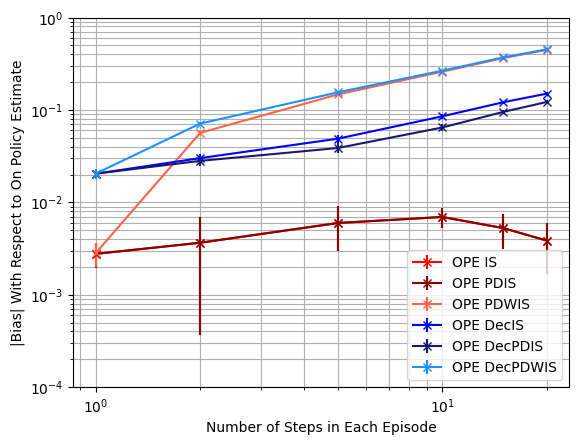

In [ ]:
label = 'bias'
plot_graphs(bias_means, bias_stds, label, 10**(-4), 10**0, shorter_D, estimator='IS')

##### Plot Variance

On Policy-----[7.70145000e-05 1.16931394e-04 2.16255381e-04 2.96585985e-04
 3.60089418e-04 3.94664883e-04]
OPE IS-----[4.66513502e-05 8.64302496e-05 1.89773542e-04 4.53061666e-04
 4.61918081e-04 6.50626888e-04]
OPE PDIS-----[4.66513502e-05 8.64302496e-05 1.89773542e-04 4.53061666e-04
 4.61918081e-04 6.50626888e-04]
OPE PDWIS-----[4.68851400e-05 2.20373804e-05 7.99890342e-06 4.75918247e-06
 2.18253049e-06 1.74630103e-06]
OPE DecIS-----[2.41158659e-05 3.99275326e-05 7.59556956e-05 2.05260293e-04
 2.23309463e-04 2.96153080e-04]
OPE DecPDIS-----[2.41158659e-05 4.15794769e-05 7.16225311e-05 1.83309178e-04
 1.84063004e-04 2.47592261e-04]
OPE DecPDWIS-----[2.42974022e-05 1.05902622e-05 2.98155475e-06 1.95052720e-06
 8.54310549e-07 6.42508212e-07]


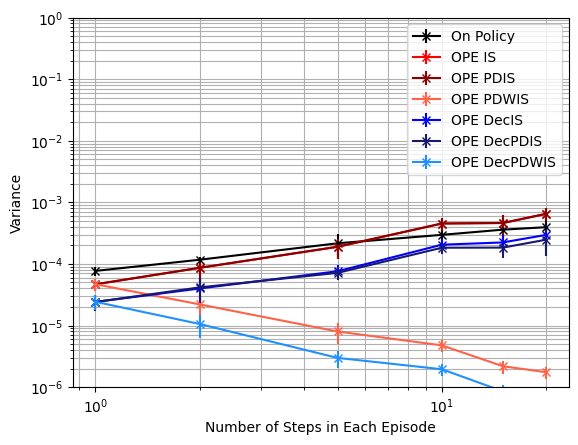

In [ ]:
label = 'var'
plot_graphs(var_means, var_stds, label, 10**(-6), 10**0, shorter_D, estimator='IS')

##### Plot MSE

On Policy-----[7.70145000e-05 1.16931394e-04 2.16255381e-04 2.96585985e-04
 3.60089418e-04 3.94664883e-04]
OPE IS-----[5.50072224e-05 1.10544802e-04 2.34708944e-04 5.04052535e-04
 4.94200151e-04 6.70205213e-04]
OPE PDIS-----[5.50072224e-05 1.10544802e-04 2.34708944e-04 5.04052535e-04
 4.94200151e-04 6.70205213e-04]
OPE PDWIS-----[5.55891113e-05 3.21621583e-03 2.17082039e-02 6.74512616e-02
 1.32716113e-01 1.99428735e-01]
OPE DecIS-----[0.00044679 0.00095663 0.00248827 0.00751563 0.01493025 0.02283647]
OPE DecPDIS-----[0.00044679 0.00084286 0.00159399 0.00438075 0.0092792  0.01514165]
OPE DecPDWIS-----[0.00044958 0.00507121 0.0241131  0.07077697 0.1372993  0.2047942 ]


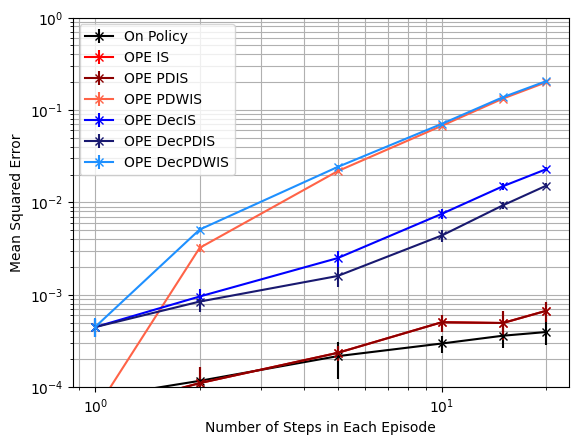

In [ ]:
label = 'MSE'
plot_graphs(MSE_means, MSE_stds, label, 10**(-4), 10**0, shorter_D, estimator='IS')

##### Plot ESS

On Policy-----[  10.   50.  100.  500. 1000.]
OPE IS-----[        inf         inf  5.69230071 29.85877007  8.28924574]
OPE PDIS-----[        inf         inf  5.69230071 29.85877007  8.28924574]
OPE DecIS-----[ 3.08118408  6.20573352  4.7279195  12.69102974 12.37201499]
OPE DecPDIS-----[ 2.77019006 10.08823835 17.97886881 18.39166929 17.76982296]


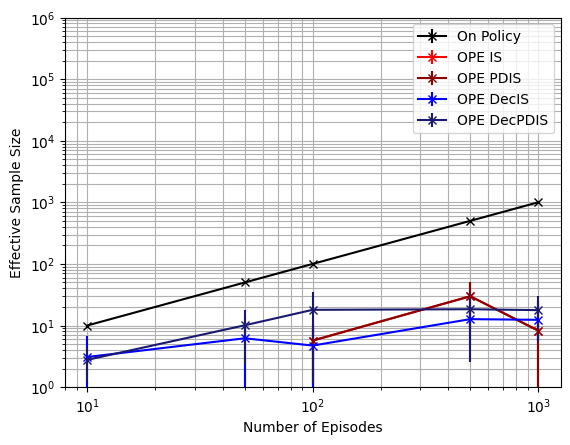

In [ ]:
label = 'ESS'
plot_graphs(ESS_means, ESS_stds, label, 10**(0), 10**6, shorter_D, estimator='IS')